In [1]:
# -*- coding: utf-8 -*-

# 🛡️ SIPREV-Mulher/MS — v3.2 (Edição Estendida)
## Sistema Inteligente de Predição e Mapeamento da Violência contra a Mulher em Mato Grosso do Sul

============================================================
SIPREV-Mulher/MS
Sistema Inteligente de Predição e Mapeamento da
Violência contra a Mulher em Mato Grosso do Sul
============================================================
Disciplina : Tópicos Interdisciplinares III
Curso      : Ciência dos Dados — UFMS Digital
Semestre   : 2026.1
Autor      : VIANA
Fonte dados: SINAN/DATASUS — OpenScienceTechnology/GitHub
============================================================

**Fonte oficial dos dados:** DATASUS SINAN-VIOL — Violência Doméstica, Sexual e/ou
Outras Violências (`ftp://ftp.datasus.gov.br/dissemin/publicos/SINAN/`).
**Microdados:** https://alpaca.quantilica.com/dados/sinan-viol
**Espelho CSV:** https://github.com/OpenScienceTechnology/Microdados_SINAN-DATASUS

---
### Sumário executivo do notebook
0.  Configuração do ambiente e instalação de dependências (Colab / Jupyter / local)
1.  Importações robustas com *capability flags* (degradação graciosa)
2.  Configuração global, parâmetros de execução e diretórios de saída
3.  Dicionários de decodificação do SINAN/DATASUS
4.  Dados de referência oficiais (municípios de MS, população IBGE 2022, UFs)
5.  Infraestrutura de *logging* e de exibição *inline*
6.  Infraestrutura de relatórios (Texttable → `.txt`/`.log`)
7.  Registro de artefatos (rastreabilidade de todos os arquivos gerados)
8.  Infraestrutura de gráficos (Matplotlib/Seaborn → `.png` inline)
9.  Ingestão de dados (CSV local → download GitHub → dados sintéticos)
10. Consolidação e inspeção inicial
11. Qualidade dos dados (completude, duplicidades, inconsistências)
12. Limpeza e conversão de tipos
13. Decodificação de variáveis categóricas
14. Engenharia de atributos (faixa etária, flags de violência, relação autor-vítima)
15. Categorias analíticas derivadas (doméstica, sexual, feminicídio, ameaça, lesão)
16. Camada de proteção de dados (LGPD / anonimização / agregação)
17. Persistência em camadas bronze / silver / gold (Parquet)
18–30. Análise exploratória descritiva (ocorrências, vítimas, autores)
31–36. Eixos temáticos (feminicídio, estupro/violência sexual, doméstica)
37–40. Taxas por 100 mil mulheres e *rankings* municipal e nacional
41–43. Análise geoespacial e mapas de calor (Folium / Matplotlib)
44–46. Séries temporais e decomposição
47–52. Machine Learning (classificação, *clustering*, anomalia, regressão)
53–56. Deep Learning e Redes Neurais (MLP / LSTM / GRU)
57.    Relatório consolidado de todos os modelos treinados
58–60. Dashboards HTML, indicadores finais e relatórios mestres
61.    Exportação compactada (.zip) — Colab e execução local

---
> **Aviso ético / LGPD:** este projeto trabalha exclusivamente com **dados agregados**.
> Nenhuma informação capaz de reidentificar vítimas ou autores é exibida ou exportada.
> As análises têm finalidade **acadêmica** e de **apoio a políticas públicas** de
> prevenção à violência contra a mulher.

============================================================
## PLANO METODOLÓGICO — Mapa da Violência contra a Mulher em MS
============================================================

### Tema
Análise completa do mapa da violência em **Mato Grosso do Sul**, com foco na violência
contra a mulher, a partir dos microdados do **SINAN/DATASUS** (notificações de violência
interpessoal/autoprovocada), complementada por dados de referência do **IBGE** (população
e malhas) e pelo enquadramento metodológico de **IPEA/Atlas da Violência** e do **Fórum
Brasileiro de Segurança Pública**.

### Eixos temáticos (áreas principais)
1. Violência doméstica · 2. Homicídio doloso (proxy: óbito por violência) ·
3. Estupro · 4. Feminicídio (ocorrências e vítimas — proxy) · 5. Medidas protetivas
(proxy: resposta institucional) · 6. Violência sexual · 7. Ameaça · 8. Lesão corporal ·
9. Tentativa de feminicídio (proxy) · 10. Tentativa de homicídio · 11. Vítimas (idade,
faixa, sexo, raça/cor, escolaridade, município, vínculo) · 12. Autores (sexo, vínculo,
grau de parentesco) · 13. Indicadores territoriais, sociais e preditivos.

### 1. Conceitos e separação analítica
O sistema diferencia rigorosamente **notificação** (saúde, SINAN), **ocorrência**
(segurança pública), **vítima**, **autor**, **óbito** e **medida protetiva**. Como a
base primária é de **saúde**, conceitos jurídicos (feminicídio, medida protetiva) são
tratados como **proxies documentados**, evitando misturar naturezas distintas de dado.

### 2. Fontes de dados
- **SINAN/DATASUS** (principal): notificações de violência doméstica, sexual, física,
  psicológica e autoprovocada.
- **IBGE** (Censo 2022): população total/feminina por município e UF; malhas territoriais.
- **IPEA / Atlas da Violência / FBSP**: referência metodológica e comparativa.
- **SEJUSP/MS, SIM/DATASUS, CNJ/TJMS**: fontes complementares (catálogo na Seção 38.E).

Cada arquivo processado tem sua **proveniência registrada** (origem, período, formato,
volume) — ver Seção 30.A.

### 3. Recortes territorial e temporal
- **Territorial:** Brasil → Centro-Oeste → Mato Grosso do Sul → 79 municípios → (quando
  houver) bairros/coordenadas.
- **Temporal:** ano, mês, trimestre, semana, dia da semana, hora, período do dia,
  fim de semana; séries anuais e mensais.

### 4–10. Eixos de violência analisados
Para cada eixo (doméstica, física, psicológica, sexual, estupro, ameaça, lesão,
feminicídio, óbito, negligência, financeira, tráfico, infantil) o sistema produz: série
temporal, ranking municipal (absoluto e por taxa), perfil etário e racial, vínculo
autor-vítima, gráficos, tabelas e relatório (Texttable).

### 11–12. Vítimas e autores
- **Vítimas:** idade, faixa etária, raça/cor, escolaridade, situação conjugal, ciclo de
  vida, gestação, orientação sexual, identidade de gênero, local de residência/ocorrência.
- **Autores:** sexo, suspeita de álcool e, sobretudo, o **vínculo autor-vítima**
  (cônjuge, ex, namorado, pai, padrasto, etc.), com matriz tipo de violência × vínculo.

### 13. Taxas e rankings
Indicadores proporcionais por **100 mil mulheres** (denominador IBGE 2022) permitem
comparação justa entre municípios. São gerados **dois rankings** (absoluto e por taxa),
municipal e nacional, além de um **Índice Municipal de Risco (IMR)**.

### 14. Análise espacial
Mapas municipais e de calor (Folium interativo + Matplotlib estático + GeoPandas
coroplético quando houver malha), com centroides embutidos para robustez offline.

### 15. Qualidade dos dados
Verificações de completude, duplicidades, datas inválidas/futuras, idades incompatíveis,
municípios fora do cadastro e índice global de qualidade (Seção 11).

### 16. LGPD, ética e segurança
Uso exclusivo de **dados agregados**, supressão de pequenas células (k-anonimato),
ausência de identificadores diretos, logs sem dados pessoais, dicionário de dados e
trilha de auditoria (MANIFESTO).

### 17. Grandes volumes
Leitura **em chunks** com filtro imediato por UF, persistência em **Parquet** (camadas
bronze/silver/gold) e limites configuráveis de linhas/anos.

### 18–20. Machine Learning, Deep Learning e Redes Neurais
- **ML:** classificação de risco (RandomForest, ExtraTrees, GradientBoosting, XGBoost,
  LightGBM, CatBoost, LogisticRegression, DecisionTree, KNN, NB, SVM), regressão
  (linear, Ridge, Lasso, Poisson, árvores, boosting), clusterização (K-Means, DBSCAN,
  Agglomerative) e detecção de anomalias (IsolationForest, LOF, One-Class SVM).
- **DL/NN:** MLP, LSTM e GRU em **PyTorch** (TensorFlow opcional) para classificação e
  previsão de séries temporais.
- **Estatística:** SARIMA e Poisson como *baselines* interpretáveis.
- **Validação:** treino/teste, validação cruzada e validação temporal; explicabilidade
  por importância de atributos e SHAP (quando disponível).

### 21–22. Dashboards e relatórios
Dashboards interativos (**Plotly/HTML**) e um dashboard consolidado estático; relatórios
em **TXT/LOG (Texttable)**, **CSV**, **XLSX**, **JSON** e **PDF**, além de gráficos
**PNG** e mapas **HTML**.

### 23. Indicadores finais e índices avançados
Totais e taxas por eixo, perfis predominantes, municípios críticos e índices avançados
(vulnerabilidade, concentração, persistência, gravidade, resposta institucional,
subnotificação provável e **Índice de Alerta** para priorização).

### 24–25. Objetivo e resultado esperado
Entregar uma análise **integrada, automatizada, reprodutível e ética**, que identifique
municípios e perfis prioritários, mapeie os eixos de violência e apoie **políticas
públicas baseadas em evidências** — tudo exportado, ao final, em um **pacote `.zip`**.

============================================================
## SEÇÃO 0 — Configuração do ambiente e instalação de dependências
============================================================

Esta célula detecta o ambiente de execução (Google Colab, Jupyter, terminal local),
e — somente quando solicitado — instala as bibliotecas necessárias. A instalação é
**idempotente** e **silenciosa**: pacotes já presentes não são reinstalados.

Para evitar reinstalações demoradas, a instalação só é executada quando a variável de
ambiente `SIPREV_INSTALL=1` está definida **ou** quando o ambiente é o Google Colab e
faltam pacotes essenciais. Em uma máquina local com o ambiente já preparado, basta
executar as células seguintes.

In [2]:
# ------------------------------------------------------------------
# 0.1  Detecção de ambiente e utilidades de instalação
# ------------------------------------------------------------------
import os
import sys
import subprocess
import importlib
import importlib.util
import platform
import time

_T0_WALL = time.time()  # marco temporal global (medição de tempo total de execução)


def _forcar_utf8_stdout():
    """Garante saída UTF-8 no console (evita UnicodeEncodeError no Windows/cp1252).

    Em terminais Windows o *encoding* padrão é cp1252, que não suporta emojis e vários
    acentos. Reconfiguramos stdout/stderr para UTF-8 com *fallback* tolerante, mantendo
    o notebook compatível com execução local via terminal, Jupyter e Google Colab.
    """
    for fluxo in (sys.stdout, sys.stderr):
        try:
            fluxo.reconfigure(encoding="utf-8", errors="replace")
        except Exception:
            pass
    os.environ.setdefault("PYTHONIOENCODING", "utf-8")


_forcar_utf8_stdout()


def _detectar_ambiente() -> str:
    """Identifica o ambiente de execução atual.

    Retorna uma das strings: ``"colab"``, ``"kaggle"``, ``"jupyter"`` ou ``"local"``.
    A detecção é puramente defensiva: qualquer falha resulta em ``"local"``.
    """
    # Google Colab
    try:
        import google.colab  # noqa: F401
        return "colab"
    except Exception:
        pass
    # Kaggle
    if os.environ.get("KAGGLE_KERNEL_RUN_TYPE"):
        return "kaggle"
    # Jupyter (IPython com kernel)
    try:
        from IPython import get_ipython
        ip = get_ipython()
        if ip is not None and "IPKernelApp" in getattr(ip, "config", {}):
            return "jupyter"
    except Exception:
        pass
    return "local"


def _esta_em_notebook() -> bool:
    """True quando o código roda dentro de um kernel IPython/Jupyter/Colab."""
    try:
        from IPython import get_ipython
        ip = get_ipython()
        if ip is None:
            return False
        return ip.__class__.__name__ in ("ZMQInteractiveShell", "Shell", "Google.colab")
    except Exception:
        return False


AMBIENTE = _detectar_ambiente()
EM_NOTEBOOK = _esta_em_notebook()
IS_COLAB = AMBIENTE == "colab"

print("=" * 64)
print("🛡️  SIPREV-Mulher/MS — v3.2 (Edição Estendida)")
print("=" * 64)
print(f"   Python      : {sys.version.split()[0]} ({platform.python_implementation()})")
print(f"   Sistema     : {platform.system()} {platform.release()}")
print(f"   Ambiente    : {AMBIENTE}  (notebook={EM_NOTEBOOK})")
print(f"   Diretório   : {os.getcwd()}")
print("=" * 64)


def _pacote_disponivel(nome_modulo: str) -> bool:
    """Verifica, sem importar, se um módulo pode ser importado."""
    try:
        return importlib.util.find_spec(nome_modulo) is not None
    except Exception:
        return False


def _pip_install(pacotes, silencioso: bool = True) -> None:
    """Instala uma lista de pacotes via pip, de forma tolerante a falhas."""
    if isinstance(pacotes, str):
        pacotes = [pacotes]
    for pkg in pacotes:
        try:
            cmd = [sys.executable, "-m", "pip", "install", "-q", pkg]
            if silencioso:
                subprocess.check_call(
                    cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL
                )
            else:
                subprocess.check_call(cmd)
            print(f"   ✅ instalado: {pkg}")
        except Exception as exc:  # pragma: no cover - depende de rede
            print(f"   ⚠️  falha ao instalar {pkg}: {exc}")


# Conjunto mínimo de pacotes para a operação básica do notebook.
PACOTES_ESSENCIAIS = [
    "pandas", "numpy", "matplotlib", "seaborn", "plotly",
    "scikit-learn", "scipy", "statsmodels", "openpyxl",
    "texttable", "tabulate", "requests",
]

# Pacotes opcionais — habilitam recursos avançados quando presentes.
PACOTES_OPCIONAIS = [
    "xgboost", "lightgbm", "catboost",
    "torch", "tensorflow",
    "geopandas", "folium", "shapely", "pyproj",
    "reportlab", "fpdf2", "pyarrow", "duckdb", "polars",
    "shap", "imbalanced-learn", "kaleido",
]


def configurar_ambiente(instalar_opcionais: bool = False) -> None:
    """Instala dependências quando necessário.

    A instalação ocorre se ``SIPREV_INSTALL=1`` ou se faltarem pacotes essenciais
    no Google Colab. Em ambiente local já preparado, nada é instalado.
    """
    forcar = os.environ.get("SIPREV_INSTALL", "0") == "1"
    faltantes_ess = [p.split("==")[0] for p in PACOTES_ESSENCIAIS
                     if not _pacote_disponivel(p.replace("scikit-learn", "sklearn")
                                               .replace("-", "_"))]
    precisa = forcar or (IS_COLAB and faltantes_ess)
    if not precisa:
        print("   ℹ️  Instalação de dependências ignorada "
              "(defina SIPREV_INSTALL=1 para forçar).")
        if faltantes_ess:
            print(f"   ⚠️  Pacotes essenciais ausentes: {faltantes_ess}")
        return
    print("📦 Instalando dependências essenciais — aguarde...")
    _pip_install(PACOTES_ESSENCIAIS)
    if instalar_opcionais:
        print("📦 Instalando dependências opcionais (avançadas)...")
        _pip_install(PACOTES_OPCIONAIS)
    print("🎉 Ambiente configurado.")


# Por padrão NÃO instala nada (assume ambiente preparado). Para forçar:
#   - defina a variável de ambiente SIPREV_INSTALL=1, ou
#   - chame configurar_ambiente(instalar_opcionais=True) manualmente.
configurar_ambiente(instalar_opcionais=False)

🛡️  SIPREV-Mulher/MS — v3.2 (Edição Estendida)
   Python      : 3.14.6 (CPython)
   Sistema     : Windows 10
   Ambiente    : jupyter  (notebook=True)
   Diretório   : c:\Users\Workstation\Desktop\wokspace_módulo_4\Project_2\output
   ℹ️  Instalação de dependências ignorada (defina SIPREV_INSTALL=1 para forçar).


============================================================
## SEÇÃO 1 — Importações robustas com *capability flags*
============================================================

A filosofia desta seção é a **degradação graciosa**: o notebook precisa rodar tanto em
um ambiente mínimo (apenas `pandas`/`numpy`/`matplotlib`) quanto em um ambiente completo
(com TensorFlow, PyTorch, GeoPandas, etc.). Para isso, cada biblioteca opcional é
importada dentro de um `try/except`, e o resultado é registrado no dicionário global
`CAP` (de *capabilities*). Ao longo do notebook, os blocos consultam `CAP[...]` antes de
usar um recurso; quando indisponível, o bloco escolhe um caminho alternativo e segue.

In [3]:
# ------------------------------------------------------------------
# 1.1  Núcleo numérico e de manipulação de dados (obrigatório)
# ------------------------------------------------------------------
import json
import re
import gc
import math
import random
import warnings
import textwrap
import zipfile
import platform as _platform
from pathlib import Path
from datetime import datetime, date, timedelta
from collections import defaultdict, Counter, OrderedDict
from dataclasses import dataclass, field, asdict

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")

# Semente global de reprodutibilidade
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# Dicionário global de capacidades do ambiente
CAP = {}


def _registrar_capacidade(nome: str, ok: bool, detalhe: str = "") -> None:
    """Registra (e imprime) a disponibilidade de uma capacidade opcional."""
    CAP[nome] = bool(ok)
    icone = "✅" if ok else "⚠️ "
    extra = f" — {detalhe}" if detalhe else ""
    print(f"   {icone} {nome:<16}{'disponível' if ok else 'indisponível'}{extra}")


print("🔌 Detectando capacidades do ambiente...")

# ------------------------------------------------------------------
# 1.2  Visualização (Matplotlib / Seaborn / Plotly)
# ------------------------------------------------------------------
try:
    import matplotlib
    # Backend não interativo fora de notebooks evita travamentos em terminal/CI
    if not EM_NOTEBOOK:
        try:
            matplotlib.use("Agg")
        except Exception:
            pass
    import matplotlib.pyplot as plt
    import matplotlib.ticker as mtick
    from matplotlib.patches import Patch
    from matplotlib.colors import LinearSegmentedColormap
    _registrar_capacidade("matplotlib", True, matplotlib.__version__)
except Exception as exc:
    plt = None
    _registrar_capacidade("matplotlib", False, str(exc)[:40])

try:
    import seaborn as sns
    _registrar_capacidade("seaborn", True, sns.__version__)
except Exception as exc:
    sns = None
    _registrar_capacidade("seaborn", False, str(exc)[:40])

try:
    import plotly
    import plotly.express as px
    import plotly.graph_objects as go
    import plotly.io as pio
    from plotly.subplots import make_subplots
    _registrar_capacidade("plotly", True, plotly.__version__)
except Exception as exc:
    px = go = pio = make_subplots = None
    _registrar_capacidade("plotly", False, str(exc)[:40])

# ------------------------------------------------------------------
# 1.3  Estatística e ciência de dados
# ------------------------------------------------------------------
try:
    import scipy
    from scipy import stats
    _registrar_capacidade("scipy", True, scipy.__version__)
except Exception as exc:
    stats = None
    _registrar_capacidade("scipy", False, str(exc)[:40])

try:
    import statsmodels.api as sm
    from statsmodels.tsa.seasonal import seasonal_decompose
    try:
        from statsmodels.tsa.statespace.sarimax import SARIMAX
    except Exception:
        SARIMAX = None
    _registrar_capacidade("statsmodels", True)
except Exception as exc:
    sm = seasonal_decompose = SARIMAX = None
    _registrar_capacidade("statsmodels", False, str(exc)[:40])

# ------------------------------------------------------------------
# 1.4  Machine Learning (scikit-learn — núcleo de ML)
# ------------------------------------------------------------------
try:
    import sklearn
    from sklearn.preprocessing import (
        StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder,
    )
    from sklearn.model_selection import (
        train_test_split, cross_val_score, StratifiedKFold,
        KFold, TimeSeriesSplit, GridSearchCV,
    )
    from sklearn.ensemble import (
        RandomForestClassifier, RandomForestRegressor,
        ExtraTreesClassifier, ExtraTreesRegressor,
        GradientBoostingClassifier, GradientBoostingRegressor,
        IsolationForest, AdaBoostClassifier, HistGradientBoostingClassifier,
    )
    from sklearn.linear_model import (
        LogisticRegression, LinearRegression, Ridge, Lasso, PoissonRegressor,
    )
    from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
    from sklearn.svm import SVC, OneClassSVM
    from sklearn.neighbors import KNeighborsClassifier, LocalOutlierFactor
    from sklearn.naive_bayes import GaussianNB
    from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
    from sklearn.decomposition import PCA
    from sklearn.pipeline import Pipeline
    from sklearn.metrics import (
        accuracy_score, precision_score, recall_score, f1_score,
        roc_auc_score, confusion_matrix, classification_report,
        mean_absolute_error, mean_squared_error, r2_score,
        silhouette_score, mean_absolute_percentage_error,
    )
    _registrar_capacidade("sklearn", True, sklearn.__version__)
except Exception as exc:
    sklearn = None
    _registrar_capacidade("sklearn", False, str(exc)[:40])

# Bibliotecas de boosting (opcionais, mas muito usadas)
try:
    import xgboost as xgb
    _registrar_capacidade("xgboost", True, xgb.__version__)
except Exception as exc:
    xgb = None
    _registrar_capacidade("xgboost", False, str(exc)[:40])

try:
    import lightgbm as lgb
    _registrar_capacidade("lightgbm", True, lgb.__version__)
except Exception as exc:
    lgb = None
    _registrar_capacidade("lightgbm", False, str(exc)[:40])

try:
    from catboost import CatBoostClassifier, CatBoostRegressor
    _registrar_capacidade("catboost", True)
except Exception as exc:
    CatBoostClassifier = CatBoostRegressor = None
    _registrar_capacidade("catboost", False, str(exc)[:40])

try:
    from imblearn.over_sampling import SMOTE
    _registrar_capacidade("imblearn", True)
except Exception as exc:
    SMOTE = None
    _registrar_capacidade("imblearn", False, str(exc)[:40])

try:
    import shap
    _registrar_capacidade("shap", True)
except Exception as exc:
    shap = None
    _registrar_capacidade("shap", False, str(exc)[:40])

# ------------------------------------------------------------------
# 1.5  Deep Learning / Redes Neurais (PyTorch e TensorFlow — opcionais)
# ------------------------------------------------------------------
try:
    import torch
    import torch.nn as nn
    import torch.optim as optim
    from torch.utils.data import TensorDataset, DataLoader
    torch.manual_seed(SEED)
    _registrar_capacidade("torch", True, torch.__version__)
except Exception as exc:
    torch = nn = optim = None
    _registrar_capacidade("torch", False, str(exc)[:40])

try:
    import tensorflow as tf
    from tensorflow import keras
    from tensorflow.keras import layers
    try:
        tf.random.set_seed(SEED)
        tf.get_logger().setLevel("ERROR")
    except Exception:
        pass
    _registrar_capacidade("tensorflow", True, tf.__version__)
except Exception as exc:
    tf = keras = layers = None
    _registrar_capacidade("tensorflow", False, str(exc)[:40])

# ------------------------------------------------------------------
# 1.6  Geoespacial (GeoPandas / Folium — opcionais)
# ------------------------------------------------------------------
try:
    import geopandas as gpd
    from shapely.geometry import Point, shape
    _registrar_capacidade("geopandas", True, gpd.__version__)
except Exception as exc:
    gpd = Point = shape = None
    _registrar_capacidade("geopandas", False, str(exc)[:40])

try:
    import folium
    from folium.plugins import HeatMap, MarkerCluster
    _registrar_capacidade("folium", True, folium.__version__)
except Exception as exc:
    folium = HeatMap = MarkerCluster = None
    _registrar_capacidade("folium", False, str(exc)[:40])

# ------------------------------------------------------------------
# 1.7  Relatórios (Texttable obrigatório p/ .txt/.log; PDF opcional)
# ------------------------------------------------------------------
try:
    import texttable as _texttable_mod
    from texttable import Texttable
    _registrar_capacidade("texttable", True)
except Exception as exc:
    Texttable = None
    _registrar_capacidade("texttable", False, str(exc)[:40])

try:
    from tabulate import tabulate as _tabulate
    _registrar_capacidade("tabulate", True)
except Exception as exc:
    _tabulate = None
    _registrar_capacidade("tabulate", False, str(exc)[:40])

# PDF: tenta reportlab, depois fpdf2 (import fpdf)
PDF_ENGINE = None
try:
    from reportlab.lib.pagesizes import A4, landscape
    from reportlab.lib import colors as rl_colors
    from reportlab.lib.units import cm, mm
    from reportlab.lib.styles import getSampleStyleSheet, ParagraphStyle
    from reportlab.platypus import (
        SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle,
        Image as RLImage, PageBreak,
    )
    PDF_ENGINE = "reportlab"
    _registrar_capacidade("pdf(reportlab)", True)
except Exception as exc:
    _registrar_capacidade("pdf(reportlab)", False, str(exc)[:40])
    try:
        from fpdf import FPDF
        PDF_ENGINE = "fpdf"
        _registrar_capacidade("pdf(fpdf)", True)
    except Exception as exc2:
        FPDF = None
        _registrar_capacidade("pdf(fpdf)", False, str(exc2)[:40])

# ------------------------------------------------------------------
# 1.8  Excel e formatos colunares (opcionais)
# ------------------------------------------------------------------
try:
    import openpyxl
    from openpyxl.styles import Font, PatternFill, Alignment, Border, Side
    from openpyxl.utils.dataframe import dataframe_to_rows
    _registrar_capacidade("openpyxl", True, openpyxl.__version__)
except Exception as exc:
    openpyxl = None
    _registrar_capacidade("openpyxl", False, str(exc)[:40])

try:
    import pyarrow  # noqa: F401
    _registrar_capacidade("pyarrow", True)
except Exception as exc:
    _registrar_capacidade("pyarrow", False, str(exc)[:40])

try:
    import requests
    _registrar_capacidade("requests", True)
except Exception as exc:
    requests = None
    _registrar_capacidade("requests", False, str(exc)[:40])

# IPython display (para exibição rica inline; degradável para print)
try:
    from IPython.display import display, HTML, Markdown, Image as IPImage
    _registrar_capacidade("ipython", True)
except Exception:
    display = None
    HTML = Markdown = IPImage = None
    _registrar_capacidade("ipython", False)


# Função utilitária: exibe DataFrame de forma rica em notebook, ou texto em terminal.
def _display(obj):
    """Exibe ``obj`` com `IPython.display` quando disponível; senão, usa ``print``."""
    if display is not None and EM_NOTEBOOK:
        display(obj)
    else:
        print(obj)


print("\n📋 Resumo de capacidades:")
_n_ok = sum(1 for v in CAP.values() if v)
print(f"   {_n_ok}/{len(CAP)} capacidades disponíveis.")
print(f"   pandas {pd.__version__} | numpy {np.__version__}")
print("✅ Seção 1 concluída — importações e detecção de capacidades.")

🔌 Detectando capacidades do ambiente...
   ✅ matplotlib      disponível — 3.10.7
   ✅ seaborn         disponível — 0.13.2
   ✅ plotly          disponível — 6.5.0
   ✅ scipy           disponível — 1.16.3
   ✅ statsmodels     disponível
   ✅ sklearn         disponível — 1.7.2
   ✅ xgboost         disponível — 3.1.2
   ✅ lightgbm        disponível — 4.6.0
   ✅ catboost        disponível
   ⚠️  imblearn        indisponível — No module named 'imblearn'
   ✅ shap            disponível
   ✅ torch           disponível — 2.12.0+cpu
   ⚠️  tensorflow      indisponível — No module named 'tensorflow'
   ✅ geopandas       disponível — 1.1.1
   ✅ folium          disponível — 0.20.0
   ✅ texttable       disponível
   ✅ tabulate        disponível
   ✅ pdf(reportlab)  disponível
   ✅ openpyxl        disponível — 3.1.5
   ✅ pyarrow         disponível
   ✅ requests        disponível
   ✅ ipython         disponível

📋 Resumo de capacidades:
   20/22 capacidades disponíveis.
   pandas 2.3.3 | numpy 2.3.5
✅

============================================================
## SEÇÃO 2 — Configuração global, parâmetros e diretórios
============================================================

Todos os parâmetros que controlam a execução ficam concentrados aqui, em um único objeto
de configuração (`CFG`). Isso torna o notebook **reprodutível** e fácil de ajustar para
diferentes cenários (execução completa, amostragem rápida para testes, *smoke test* de
desenvolvimento, etc.).

Parâmetros podem ser sobrescritos por **variáveis de ambiente** (úteis em CI/Colab):
 - `SIPREV_SMOKE=1`        → modo *smoke test* (amostra mínima, modelos rápidos)
 - `SIPREV_MAX_ROWS=50000` → limite de linhas lidas por ano
 - `SIPREV_YEARS=2018-2024`→ intervalo de anos a processar
 - `SIPREV_DATA_DIR=...`   → caminho explícito para a pasta dos CSVs

In [4]:
# ------------------------------------------------------------------
# 2.1  Objeto de configuração
# ------------------------------------------------------------------
@dataclass
class Config:
    """Parâmetros globais de execução do SIPREV-Mulher/MS."""

    # Identidade do projeto
    projeto: str = "SIPREV-Mulher/MS"
    versao: str = "3.2"
    autor: str = "VIANA"
    fonte: str = "SINAN/DATASUS — VIOL (Violência Doméstica, Sexual e/ou Outras)"

    # Recorte territorial
    uf_alvo_codigo: int = 50          # Mato Grosso do Sul
    uf_alvo_sigla: str = "MS"
    uf_alvo_nome: str = "Mato Grosso do Sul"

    # Recorte temporal (intervalo de anos dos arquivos VIOLBRyy.csv)
    ano_inicial: int = 2009
    ano_final: int = 2025

    # Parâmetros de ingestão / desempenho
    max_linhas_por_ano: int = 0        # 0 = sem limite
    chunksize: int = 200_000           # leitura em lotes
    encoding_csv: str = "latin-1"      # padrão do DATASUS
    apenas_ms: bool = True             # filtra SG_UF_NOT == 50 na leitura

    # Modo de execução
    smoke_test: bool = False           # amostra mínima + modelos rápidos
    permitir_download: bool = True     # baixar do GitHub se CSV local ausente
    permitir_sintetico: bool = True    # gerar dados sintéticos se tudo falhar

    # Parâmetros analíticos
    fracao_feminina: float = 0.5034    # fração feminina da população (Censo 2022, MS)
    top_n_municipios: int = 30         # tamanho padrão de rankings/figuras
    ano_referencia_taxa: int = 2022    # ano dos denominadores populacionais (Censo)

    # Parâmetros de ML/DL
    test_size: float = 0.25
    cv_folds: int = 5
    dl_epochs: int = 60
    dl_batch: int = 16

    def aplicar_ambiente(self) -> "Config":
        """Sobrescreve parâmetros a partir de variáveis de ambiente."""
        if os.environ.get("SIPREV_SMOKE", "0") == "1":
            self.smoke_test = True
        mr = os.environ.get("SIPREV_MAX_ROWS")
        if mr and mr.isdigit():
            self.max_linhas_por_ano = int(mr)
        yrs = os.environ.get("SIPREV_YEARS", "")
        m = re.match(r"^(\d{4})-(\d{4})$", yrs.strip()) if yrs else None
        if m:
            self.ano_inicial, self.ano_final = int(m.group(1)), int(m.group(2))
        if os.environ.get("SIPREV_NO_DOWNLOAD", "0") == "1":
            self.permitir_download = False
        # Ajustes do modo smoke test
        if self.smoke_test:
            if self.max_linhas_por_ano == 0:
                self.max_linhas_por_ano = 20_000
            self.dl_epochs = 8
            self.cv_folds = 3
        return self

    @property
    def anos(self):
        return list(range(self.ano_inicial, self.ano_final + 1))


CFG = Config().aplicar_ambiente()

print("⚙️  Configuração efetiva:")
for k, v in asdict(CFG).items():
    print(f"   {k:<22}: {v}")
print(f"   anos                  : {CFG.anos[0]}–{CFG.anos[-1]} ({len(CFG.anos)} anos)")

# ------------------------------------------------------------------
# 2.2  Descoberta da pasta de dados (CSV)
# ------------------------------------------------------------------
def _descobrir_pasta_dados() -> Path:
    """Procura a pasta que contém os arquivos VIOLBRyy.csv.

    Ordem de busca: variável de ambiente → caminhos relativos comuns →
    diretório atual. Retorna o primeiro diretório que contiver ao menos um CSV
    no padrão esperado; caso contrário, devolve um caminho padrão (que poderá
    ser criado para o fluxo de download).
    """
    candidatos = []
    env = os.environ.get("SIPREV_DATA_DIR")
    if env:
        candidatos.append(Path(env))
    candidatos += [
        Path("Dataset/archive_csv"),
        Path("../Dataset/archive_csv"),
        Path("../../Dataset/archive_csv"),
        Path("dataset/csv_archive"),
        Path("Dataset/csv_archive"),
        Path("data/raw"),
        Path("/content/Dataset/archive_csv"),     # layout típico no Colab
        Path("/content"),
        Path("."),
    ]
    padrao = re.compile(r"VIOLBR\d{2}\.csv$", re.IGNORECASE)
    for c in candidatos:
        try:
            if c.is_dir() and any(padrao.search(p.name) for p in c.iterdir()):
                return c.resolve()
        except Exception:
            continue
    # nenhum encontrado — usa caminho padrão para download
    padrao_dir = Path("data/raw")
    return padrao_dir.resolve()


# ------------------------------------------------------------------
# 2.3  Estrutura de diretórios de saída (carimbada com data/hora)
# ------------------------------------------------------------------
RUN_TS = datetime.now().strftime("%Y%m%d_%H%M%S")
RUN_TAG = f"SIPREV_Mulher_MS_{RUN_TS}"

DATA_DIR = _descobrir_pasta_dados()
BASE_OUT = Path(os.environ.get("SIPREV_OUT_DIR", "saidas_SIPREV")) / RUN_TAG

# Subpastas temáticas de saída
DIRS = {
    "base":      BASE_OUT,
    "tabelas":   BASE_OUT / "01_tabelas",        # .csv / .xlsx
    "graficos":  BASE_OUT / "02_graficos",       # .png
    "mapas":     BASE_OUT / "03_mapas",          # .html / .png
    "dashboards":BASE_OUT / "04_dashboards",     # .html
    "relatorios":BASE_OUT / "05_relatorios",     # .txt / .log / .pdf
    "modelos":   BASE_OUT / "06_modelos",        # métricas e artefatos de modelos
    "dados":     BASE_OUT / "07_dados_processados",  # .parquet / .csv
    "logs":      BASE_OUT / "08_logs",           # .log
    "json":      BASE_OUT / "09_json",           # .json
}
for _d in DIRS.values():
    _d.mkdir(parents=True, exist_ok=True)

print("\n📁 Diretórios:")
print(f"   Dados (entrada): {DATA_DIR}")
print(f"   Saída (raiz)   : {BASE_OUT.resolve()}")
for nome, caminho in DIRS.items():
    print(f"      └── {nome:<11}: {caminho.name}")
print("✅ Seção 2 concluída — configuração e diretórios prontos.")

⚙️  Configuração efetiva:
   projeto               : SIPREV-Mulher/MS
   versao                : 3.2
   autor                 : VIANA
   fonte                 : SINAN/DATASUS — VIOL (Violência Doméstica, Sexual e/ou Outras)
   uf_alvo_codigo        : 50
   uf_alvo_sigla         : MS
   uf_alvo_nome          : Mato Grosso do Sul
   ano_inicial           : 2009
   ano_final             : 2025
   max_linhas_por_ano    : 0
   chunksize             : 200000
   encoding_csv          : latin-1
   apenas_ms             : True
   smoke_test            : False
   permitir_download     : True
   permitir_sintetico    : True
   fracao_feminina       : 0.5034
   top_n_municipios      : 30
   ano_referencia_taxa   : 2022
   test_size             : 0.25
   cv_folds              : 5
   dl_epochs             : 60
   dl_batch              : 16
   anos                  : 2009–2025 (17 anos)

📁 Diretórios:
   Dados (entrada): C:\Users\Workstation\Desktop\wokspace_módulo_4\Project_2\Dataset\archive_csv
   

============================================================
## SEÇÃO 3 — Dicionários de decodificação do SINAN/DATASUS
============================================================

As variáveis do SINAN-VIOL são codificadas numericamente. Esta seção concentra os
dicionários oficiais de decodificação (com base no *dicionário de dados* da Ficha de
Notificação de Violência Interpessoal/Autoprovocada). Convenções recorrentes:
 - Campos `Sim/Não`: `1=Sim`, `2=Não`, `8=Não se aplica`, `9=Ignorado`.
 - Campos de relação autor-vítima (`REL_*`): `1=Sim`, `2=Não`.
 - `NU_IDADE_N`: código composto — `4XXX`=anos, `3XXX`=meses, `2XXX`=dias, `1XXX`=horas.

In [5]:
# ------------------------------------------------------------------
# 3.1  Decodificações sociodemográficas
# ------------------------------------------------------------------
DICT_SEXO = {"F": "Feminino", "M": "Masculino", "I": "Ignorado"}

DICT_RACA = {
    1: "Branca", 2: "Preta", 3: "Amarela",
    4: "Parda", 5: "Indígena", 9: "Ignorado",
}

DICT_ESCOLARIDADE = {
    0: "Analfabeto",
    1: "1ª a 4ª série incompleta do EF",
    2: "4ª série completa do EF",
    3: "5ª a 8ª série incompleta do EF",
    4: "Ensino fundamental completo",
    5: "Ensino médio incompleto",
    6: "Ensino médio completo",
    7: "Educação superior incompleta",
    8: "Educação superior completa",
    9: "Ignorado",
    10: "Não se aplica",
}

DICT_GESTANTE = {
    1: "1º trimestre", 2: "2º trimestre", 3: "3º trimestre",
    4: "Idade gestacional ignorada", 5: "Não", 6: "Não se aplica",
    9: "Ignorado",
}

DICT_SIT_CONJUGAL = {
    1: "Solteiro(a)", 2: "Casado(a)/União consensual",
    3: "Viúvo(a)", 4: "Separado(a)/Divorciado(a)",
    9: "Ignorado",
}

DICT_ZONA = {1: "Urbana", 2: "Rural", 3: "Periurbana", 9: "Ignorado"}

DICT_ORIENT_SEXUAL = {
    1: "Heterossexual", 2: "Homossexual (gay/lésbica)",
    3: "Bissexual", 8: "Não se aplica", 9: "Ignorado",
}

DICT_IDENT_GENERO = {
    1: "Travesti", 2: "Mulher transexual", 3: "Homem transexual",
    8: "Não se aplica", 9: "Ignorado",
}

DICT_CICLO_VIDA = {
    1: "Criança (0-9)", 2: "Adolescente (10-19)", 3: "Jovem (20-24)",
    4: "Pessoa adulta (25-59)", 5: "Pessoa idosa (60+)", 9: "Ignorado",
}

# ------------------------------------------------------------------
# 3.2  Local de ocorrência e características do evento
# ------------------------------------------------------------------
DICT_LOCAL_OCOR = {
    1: "Residência", 2: "Habitação coletiva", 3: "Escola",
    4: "Local de prática esportiva", 5: "Bar ou similar",
    6: "Via pública", 7: "Comércio/Serviços", 8: "Indústria/Construção",
    9: "Outro", 99: "Ignorado",
}

DICT_OUT_VEZES = {1: "Sim", 2: "Não", 9: "Ignorado"}

DICT_LES_AUTOP = {1: "Sim (autoprovocada)", 2: "Não", 9: "Ignorado"}

DICT_AUTOR_SEXO = {
    1: "Masculino", 2: "Feminino", 3: "Ambos os sexos", 9: "Ignorado",
}

DICT_AUTOR_ALCOOL = {1: "Sim", 2: "Não", 9: "Ignorado"}

DICT_EVOLUCAO = {
    1: "Alta", 2: "Evasão/Abandono", 3: "Óbito por violência",
    4: "Óbito por outras causas", 9: "Ignorado",
}

DICT_CLASSI_FIN = {1: "Confirmado", 2: "Descartado"}

DICT_SIM_NAO = {1: "Sim", 2: "Não", 8: "Não se aplica", 9: "Ignorado"}

# ------------------------------------------------------------------
# 3.3  Tipos de violência (colunas VIOL_*) e meios de agressão (AG_*)
# ------------------------------------------------------------------
# Colunas de tipo de violência (1=Sim / 2=Não)
COLS_VIOL = [
    "VIOL_FISIC", "VIOL_PSICO", "VIOL_TORT", "VIOL_SEXU",
    "VIOL_TRAF", "VIOL_FINAN", "VIOL_NEGLI", "VIOL_INFAN",
    "VIOL_LEGAL", "VIOL_OUTR",
]
LABELS_VIOL = [
    "Física", "Psicológica/Moral", "Tortura", "Sexual",
    "Tráfico de seres humanos", "Financeira/Econômica", "Negligência/Abandono",
    "Trabalho infantil", "Intervenção legal", "Outra",
]
MAP_VIOL = dict(zip(COLS_VIOL, LABELS_VIOL))

# Meios/forças de agressão
COLS_AGRESSAO = [
    "AG_FORCA", "AG_ENFOR", "AG_OBJETO", "AG_CORTE", "AG_QUENTE",
    "AG_ENVEN", "AG_FOGO", "AG_AMEACA", "AG_OUTROS",
]
LABELS_AGRESSAO = [
    "Força corporal/Espancamento", "Enforcamento", "Objeto contundente",
    "Objeto pérfuro-cortante", "Substância/objeto quente", "Envenenamento",
    "Arma de fogo", "Ameaça", "Outro meio",
]
MAP_AGRESSAO = dict(zip(COLS_AGRESSAO, LABELS_AGRESSAO))

# Naturezas de violência sexual (colunas SEX_*)
COLS_SEXUAL = [
    "SEX_ASSEDI", "SEX_ESTUPR", "SEX_PUDOR", "SEX_PORNO",
    "SEX_EXPLO", "SEX_OUTRO",
]
LABELS_SEXUAL = [
    "Assédio sexual", "Estupro", "Atentado violento ao pudor",
    "Pornografia infantil", "Exploração sexual", "Outra violência sexual",
]
MAP_SEXUAL = dict(zip(COLS_SEXUAL, LABELS_SEXUAL))

# ------------------------------------------------------------------
# 3.4  Relação autor-vítima (colunas REL_*) — vínculo / grau de parentesco
# ------------------------------------------------------------------
COLS_RELACAO = [
    "REL_PAI", "REL_MAE", "REL_PAD", "REL_MAD", "REL_CONJ", "REL_EXCON",
    "REL_NAMO", "REL_EXNAM", "REL_FILHO", "REL_IRMAO", "REL_DESCO",
    "REL_CONHEC", "REL_CUIDA", "REL_PATRAO", "REL_INST", "REL_POL",
    "REL_PROPRI", "REL_OUTROS",
]
LABELS_RELACAO = [
    "Pai", "Mãe", "Padrasto", "Madrasta", "Cônjuge", "Ex-cônjuge",
    "Namorado(a)", "Ex-namorado(a)", "Filho(a)", "Irmão(ã)", "Desconhecido(a)",
    "Conhecido(a)", "Cuidador(a)", "Patrão/Chefe", "Pessoa c/ rel. institucional",
    "Policial/Agente da lei", "Própria pessoa", "Outro vínculo",
]
MAP_RELACAO = dict(zip(COLS_RELACAO, LABELS_RELACAO))

# Vínculos considerados "íntimos/parceiro" (para violência por parceiro íntimo - VPI)
RELACAO_PARCEIRO_INTIMO = ["REL_CONJ", "REL_EXCON", "REL_NAMO", "REL_EXNAM"]
# Vínculos familiares
RELACAO_FAMILIAR = ["REL_PAI", "REL_MAE", "REL_PAD", "REL_MAD",
                    "REL_FILHO", "REL_IRMAO"]

# ------------------------------------------------------------------
# 3.5  Encaminhamentos da rede de proteção (colunas ENC_*)
# ------------------------------------------------------------------
COLS_ENCAMINHAMENTO = [
    "ENC_SAUDE", "ENC_TUTELA", "ENC_VARA", "ENC_ABRIGO", "ENC_SENTIN",
    "ENC_DEAM", "ENC_DPCA", "ENC_DELEG", "ENC_MPU", "ENC_MULHER",
    "ENC_CREAS", "ENC_IML", "ENC_OUTR",
]
LABELS_ENCAMINHAMENTO = [
    "Rede de saúde", "Conselho tutelar", "Vara da infância/juventude",
    "Casa abrigo", "Centro de referência (Sentinela)", "DEAM (Deleg. Mulher)",
    "Deleg. de prot. à criança/adolesc.", "Delegacia comum",
    "Ministério Público", "Centro de ref. da mulher",
    "CREAS", "IML", "Outro encaminhamento",
]
MAP_ENCAMINHAMENTO = dict(zip(COLS_ENCAMINHAMENTO, LABELS_ENCAMINHAMENTO))

# ------------------------------------------------------------------
# 3.6  Deficiências/transtornos da vítima (DEF_*/TRAN_*)
# ------------------------------------------------------------------
COLS_DEFICIENCIA = ["DEF_FISICA", "DEF_MENTAL", "DEF_VISUAL", "DEF_AUDITI",
                    "TRAN_MENT", "TRAN_COMP", "DEF_OUT"]
LABELS_DEFICIENCIA = ["Deficiência física", "Deficiência intelectual",
                      "Deficiência visual", "Deficiência auditiva",
                      "Transtorno mental", "Transtorno de comportamento",
                      "Outra deficiência"]
MAP_DEFICIENCIA = dict(zip(COLS_DEFICIENCIA, LABELS_DEFICIENCIA))

# ------------------------------------------------------------------
# 3.7  Consequências da violência (CONS_*)
# ------------------------------------------------------------------
COLS_CONSEQUENCIA = ["CONS_ABORT", "CONS_GRAV", "CONS_DST", "CONS_SUIC",
                     "CONS_MENT", "CONS_COMP", "CONS_ESTRE", "CONS_OUTR"]
LABELS_CONSEQUENCIA = ["Aborto", "Gravidez", "DST/IST", "Tentativa de suicídio",
                       "Problema mental", "Problema de comportamento",
                       "Estresse pós-traumático", "Outra consequência"]
MAP_CONSEQUENCIA = dict(zip(COLS_CONSEQUENCIA, LABELS_CONSEQUENCIA))

# ------------------------------------------------------------------
# 3.8  Procedimentos realizados (PROC_*) — atenção à violência sexual
# ------------------------------------------------------------------
COLS_PROCEDIMENTO = ["PROC_DST", "PROC_HIV", "PROC_HEPB", "PROC_SANG",
                     "PROC_SEMEN", "PROC_VAGIN", "PROC_CONTR", "PROC_ABORT"]
LABELS_PROCEDIMENTO = ["Profilaxia DST", "Profilaxia HIV", "Profilaxia Hepatite B",
                       "Coleta de sangue", "Coleta de sêmen", "Coleta secreção vaginal",
                       "Contracepção de emergência", "Aborto previsto em lei"]
MAP_PROCEDIMENTO = dict(zip(COLS_PROCEDIMENTO, LABELS_PROCEDIMENTO))

# Faixas etárias padronizadas (bordas e rótulos) — usadas em todo o notebook
FAIXA_BINS = [-0.01, 11, 17, 19, 24, 29, 39, 49, 59, 200]
FAIXA_LABELS = ["0-11", "12-17", "18-19", "20-24", "25-29",
                "30-39", "40-49", "50-59", "60+"]
# Versão simplificada (6 faixas) para gráficos compactos
FAIXA_BINS_SIMPLES = [-0.01, 11, 17, 29, 44, 59, 200]
FAIXA_LABELS_SIMPLES = ["0-11", "12-17", "18-29", "30-44", "45-59", "60+"]

print("✅ Seção 3 concluída — dicionários de decodificação do SINAN carregados.")
print(f"   Tipos de violência : {len(COLS_VIOL)}")
print(f"   Meios de agressão  : {len(COLS_AGRESSAO)}")
print(f"   Naturezas sexuais  : {len(COLS_SEXUAL)}")
print(f"   Vínculos autor-vít.: {len(COLS_RELACAO)}")
print(f"   Encaminhamentos    : {len(COLS_ENCAMINHAMENTO)}")

✅ Seção 3 concluída — dicionários de decodificação do SINAN carregados.
   Tipos de violência : 10
   Meios de agressão  : 9
   Naturezas sexuais  : 6
   Vínculos autor-vít.: 18
   Encaminhamentos    : 13


============================================================
## SEÇÃO 4 — Dados de referência oficiais (IBGE)
============================================================

Para calcular taxas por 100 mil mulheres e construir *rankings* municipal e nacional,
o notebook embute tabelas de referência **oficiais** obtidas da API de localidades do
IBGE e do **Censo Demográfico 2022**:

 - `MUNICIPIOS_MS`     — código IBGE de 6 dígitos → nome (79 municípios de MS).
 - `POP_MUN_MS_2022`   — população residente por município (Censo 2022).
 - `UFS_BR`            — sigla, nome, região e população por Unidade Federativa.

Os códigos de 6 dígitos correspondem ao código IBGE de 7 dígitos **sem o dígito
verificador**, que é exatamente o formato usado no campo `ID_MUNICIP` do SINAN.

In [6]:
# ------------------------------------------------------------------
# 4.1  Municípios de Mato Grosso do Sul (código IBGE 6 dígitos → nome)
# ------------------------------------------------------------------
MUNICIPIOS_MS = {
    "500020": "Água Clara",            "500025": "Alcinópolis",
    "500060": "Amambai",               "500070": "Anastácio",
    "500080": "Anaurilândia",          "500085": "Angélica",
    "500090": "Antônio João",          "500100": "Aparecida do Taboado",
    "500110": "Aquidauana",            "500124": "Aral Moreira",
    "500150": "Bandeirantes",          "500190": "Bataguassu",
    "500200": "Batayporã",             "500210": "Bela Vista",
    "500215": "Bodoquena",             "500220": "Bonito",
    "500230": "Brasilândia",           "500240": "Caarapó",
    "500260": "Camapuã",               "500270": "Campo Grande",
    "500280": "Caracol",               "500290": "Cassilândia",
    "500295": "Chapadão do Sul",       "500310": "Corguinho",
    "500315": "Coronel Sapucaia",      "500320": "Corumbá",
    "500325": "Costa Rica",            "500330": "Coxim",
    "500345": "Deodápolis",            "500348": "Dois Irmãos do Buriti",
    "500350": "Douradina",             "500370": "Dourados",
    "500375": "Eldorado",              "500380": "Fátima do Sul",
    "500390": "Figueirão",             "500400": "Glória de Dourados",
    "500410": "Guia Lopes da Laguna",  "500430": "Iguatemi",
    "500440": "Inocência",             "500450": "Itaporã",
    "500460": "Itaquiraí",             "500470": "Ivinhema",
    "500480": "Japorã",                "500490": "Jaraguari",
    "500500": "Jardim",                "500510": "Jateí",
    "500515": "Juti",                  "500520": "Ladário",
    "500525": "Laguna Carapã",         "500540": "Maracaju",
    "500560": "Miranda",               "500568": "Mundo Novo",
    "500570": "Naviraí",               "500580": "Nioaque",
    "500600": "Nova Alvorada do Sul",  "500620": "Nova Andradina",
    "500625": "Novo Horizonte do Sul", "500627": "Paraíso das Águas",
    "500630": "Paranaíba",             "500635": "Paranhos",
    "500640": "Pedro Gomes",           "500660": "Ponta Porã",
    "500690": "Porto Murtinho",        "500710": "Ribas do Rio Pardo",
    "500720": "Rio Brilhante",         "500730": "Rio Negro",
    "500740": "Rio Verde de Mato Grosso", "500750": "Rochedo",
    "500755": "Santa Rita do Pardo",   "500769": "São Gabriel do Oeste",
    "500770": "Sete Quedas",           "500780": "Selvíria",
    "500790": "Sidrolândia",           "500793": "Sonora",
    "500795": "Tacuru",                "500797": "Taquarussu",
    "500800": "Terenos",               "500830": "Três Lagoas",
    "500840": "Vicentina",
}

# ------------------------------------------------------------------
# 4.2  População residente por município de MS — Censo IBGE 2022
# ------------------------------------------------------------------
POP_MUN_MS_2022 = {
    "500020": 16741,  "500025": 4537,   "500060": 39325,  "500070": 24114,
    "500080": 7653,   "500085": 10729,  "500090": 9303,   "500100": 27674,
    "500110": 46803,  "500124": 10748,  "500150": 7940,   "500190": 23031,
    "500200": 10712,  "500210": 21613,  "500215": 8567,   "500220": 23659,
    "500230": 11579,  "500240": 30612,  "500260": 13583,  "500270": 898100,
    "500280": 5036,   "500290": 20988,  "500295": 30993,  "500310": 4783,
    "500315": 14289,  "500320": 96268,  "500325": 26037,  "500330": 32151,
    "500345": 13663,  "500348": 11100,  "500350": 5578,   "500370": 243367,
    "500375": 11386,  "500380": 20609,  "500390": 3539,   "500400": 10444,
    "500410": 9940,   "500430": 13808,  "500440": 8404,   "500450": 24137,
    "500460": 19423,  "500470": 27821,  "500480": 8148,   "500490": 7139,
    "500500": 23981,  "500510": 3586,   "500515": 6729,   "500520": 21522,
    "500525": 6799,   "500540": 45047,  "500560": 25536,  "500568": 19193,
    "500570": 50457,  "500580": 13220,  "500600": 21822,  "500620": 48563,
    "500625": 4721,   "500627": 5510,   "500630": 40957,  "500635": 12921,
    "500640": 6941,   "500660": 92017,  "500690": 12859,  "500710": 23150,
    "500720": 37601,  "500730": 4841,   "500740": 19818,  "500750": 5199,
    "500755": 7027,   "500769": 29579,  "500770": 10994,  "500780": 8142,
    "500790": 47118,  "500793": 14516,  "500795": 10808,  "500797": 3625,
    "500800": 17652,  "500830": 132152, "500840": 6336,
}

# ------------------------------------------------------------------
# 4.3  Unidades Federativas do Brasil (código → sigla, nome, região, pop. 2022)
# ------------------------------------------------------------------
UFS_BR = {
    "11": ("RO", "Rondônia", "Norte", 1581196),
    "12": ("AC", "Acre", "Norte", 830018),
    "13": ("AM", "Amazonas", "Norte", 3941613),
    "14": ("RR", "Roraima", "Norte", 636707),
    "15": ("PA", "Pará", "Norte", 8120131),
    "16": ("AP", "Amapá", "Norte", 733759),
    "17": ("TO", "Tocantins", "Norte", 1511460),
    "21": ("MA", "Maranhão", "Nordeste", 6776699),
    "22": ("PI", "Piauí", "Nordeste", 3271199),
    "23": ("CE", "Ceará", "Nordeste", 8794957),
    "24": ("RN", "Rio Grande do Norte", "Nordeste", 3302729),
    "25": ("PB", "Paraíba", "Nordeste", 3974687),
    "26": ("PE", "Pernambuco", "Nordeste", 9058931),
    "27": ("AL", "Alagoas", "Nordeste", 3127683),
    "28": ("SE", "Sergipe", "Nordeste", 2210004),
    "29": ("BA", "Bahia", "Nordeste", 14141626),
    "31": ("MG", "Minas Gerais", "Sudeste", 20539989),
    "32": ("ES", "Espírito Santo", "Sudeste", 3833712),
    "33": ("RJ", "Rio de Janeiro", "Sudeste", 16055174),
    "35": ("SP", "São Paulo", "Sudeste", 44411238),
    "41": ("PR", "Paraná", "Sul", 11444380),
    "42": ("SC", "Santa Catarina", "Sul", 7610361),
    "43": ("RS", "Rio Grande do Sul", "Sul", 10882965),
    "50": ("MS", "Mato Grosso do Sul", "Centro-Oeste", 2757013),
    "51": ("MT", "Mato Grosso", "Centro-Oeste", 3658649),
    "52": ("GO", "Goiás", "Centro-Oeste", 7056495),
    "53": ("DF", "Distrito Federal", "Centro-Oeste", 2817381),
}

# ------------------------------------------------------------------
# 4.4  Estruturas derivadas das tabelas de referência
# ------------------------------------------------------------------
# População feminina estimada por município (aplica a fração feminina do Censo 2022).
POP_FEM_MUN_MS = {
    cod: int(round(pop * CFG.fracao_feminina))
    for cod, pop in POP_MUN_MS_2022.items()
}
# População feminina estimada por UF.
POP_FEM_UF = {
    cod: int(round(info[3] * CFG.fracao_feminina))
    for cod, info in UFS_BR.items()
}
# Mapas auxiliares de UF.
UF_SIGLA = {cod: info[0] for cod, info in UFS_BR.items()}
UF_NOME = {cod: info[1] for cod, info in UFS_BR.items()}
UF_REGIAO = {cod: info[2] for cod, info in UFS_BR.items()}
UF_POP = {cod: info[3] for cod, info in UFS_BR.items()}
# Também por sigla (ex.: "MS")
SIGLA_PARA_COD = {info[0]: cod for cod, info in UFS_BR.items()}

# Centroides aproximados (lat, lon) dos principais municípios de MS — usados quando
# não há malha geográfica (shapefile) disponível, para mapas de pontos com Folium.
CENTROIDES_MS = {
    "500270": (-20.4697, -54.6201),  # Campo Grande
    "500370": (-22.2231, -54.8120),  # Dourados
    "500830": (-20.7849, -51.7007),  # Três Lagoas
    "500320": (-19.0078, -57.6547),  # Corumbá
    "500660": (-22.5296, -55.7203),  # Ponta Porã
    "500790": (-20.9302, -54.9692),  # Sidrolândia
    "500620": (-22.2382, -53.3437),  # Nova Andradina
    "500570": (-23.0650, -54.1900),  # Naviraí
    "500110": (-20.4666, -55.7868),  # Aquidauana
    "500540": (-21.6105, -55.1678),  # Maracaju
    "500630": (-19.6770, -51.1909),  # Paranaíba
    "500769": (-19.3889, -54.5650),  # São Gabriel do Oeste
    "500240": (-22.6340, -54.8222),  # Caarapó
    "500470": (-22.3046, -53.8183),  # Ivinhema
    "500295": (-18.7903, -52.6260),  # Chapadão do Sul
    "500100": (-20.0871, -51.0938),  # Aparecida do Taboado
    "500330": (-18.5066, -54.7600),  # Coxim
    "500460": (-23.4774, -54.1879),  # Itaquiraí
    "500220": (-21.1261, -56.4836),  # Bonito
    "500560": (-20.2419, -56.3780),  # Miranda
    "500720": (-21.8019, -54.5427),  # Rio Brilhante
    "500800": (-20.4419, -54.8607),  # Terenos
    "500450": (-22.0799, -54.7910),  # Itaporã
    "500190": (-21.7137, -52.4222),  # Bataguassu
    "500210": (-22.1085, -56.5249),  # Bela Vista
    "500380": (-22.3789, -54.5135),  # Fátima do Sul
    "500290": (-19.1129, -51.7342),  # Cassilândia
    "500500": (-21.4805, -56.1381),  # Jardim
    "500430": (-23.6730, -54.5589),  # Iguatemi
    "500520": (-19.0030, -57.6011),  # Ladário
}

print("✅ Seção 4 concluída — dados de referência IBGE carregados.")
print(f"   Municípios de MS              : {len(MUNICIPIOS_MS)}")
print(f"   Pop. total de MS (Censo 2022) : {sum(POP_MUN_MS_2022.values()):,}")
print(f"   Pop. feminina estimada de MS  : {sum(POP_FEM_MUN_MS.values()):,}")
print(f"   Unidades Federativas          : {len(UFS_BR)}")
print(f"   Pop. total do Brasil (2022)   : {sum(UF_POP.values()):,}")
print(f"   Centroides cadastrados        : {len(CENTROIDES_MS)}")

✅ Seção 4 concluída — dados de referência IBGE carregados.
   Municípios de MS              : 79
   Pop. total de MS (Censo 2022) : 2,757,013
   Pop. feminina estimada de MS  : 1,387,885
   Unidades Federativas          : 27
   Pop. total do Brasil (2022)   : 203,080,756
   Centroides cadastrados        : 30


============================================================
## SEÇÃO 5 — Logging e utilidades de exibição *inline*
============================================================

Requisito do projeto: **gravar e exibir os resultados *inline* durante toda a execução**.
Esta seção cria uma infraestrutura de *logging* (arquivo `.log` + console) e um conjunto
de funções utilitárias (`banner`, `subtitulo`, `show_df`, `cronometro`) que garantem
saída padronizada e legível, tanto em notebook quanto em terminal.

In [7]:
import logging

# ------------------------------------------------------------------
# 5.1  Logger de execução (arquivo + console)
# ------------------------------------------------------------------
LOG_PATH = DIRS["logs"] / f"{RUN_TAG}_execucao.log"

logger = logging.getLogger("SIPREV")
logger.setLevel(logging.INFO)
logger.handlers.clear()
_fmt = logging.Formatter(
    "%(asctime)s | %(levelname)-7s | %(message)s", datefmt="%Y-%m-%d %H:%M:%S"
)
_fh = logging.FileHandler(LOG_PATH, encoding="utf-8")
_fh.setFormatter(_fmt)
logger.addHandler(_fh)
# Console handler apenas com a mensagem (mais limpo na saída do notebook)
_ch = logging.StreamHandler(sys.stdout)
_ch.setFormatter(logging.Formatter("%(message)s"))
_ch.setLevel(logging.WARNING)   # console recebe só avisos/erros; INFO vai p/ arquivo
logger.addHandler(_ch)
logger.propagate = False

logger.info("=" * 60)
logger.info("SIPREV-Mulher/MS v3.2 — sessão iniciada (%s)", RUN_TS)
logger.info("Ambiente: %s | Notebook: %s", AMBIENTE, EM_NOTEBOOK)
logger.info("Dados: %s", DATA_DIR)
logger.info("Saída: %s", BASE_OUT)


# ------------------------------------------------------------------
# 5.2  Funções de exibição padronizada
# ------------------------------------------------------------------
_PASSO_ATUAL = {"n": 0}


def banner(titulo: str, simbolo: str = "=", largura: int = 70) -> None:
    """Imprime um cabeçalho de seção, numerado e destacado (inline)."""
    _PASSO_ATUAL["n"] += 1
    n = _PASSO_ATUAL["n"]
    linha = simbolo * largura
    print("\n" + linha)
    print(f"[{n:02d}] {titulo}")
    print(linha)
    logger.info("PASSO %02d — %s", n, titulo)


def subtitulo(texto: str, simbolo: str = "-", largura: int = 70) -> None:
    """Imprime um subtítulo (inline)."""
    print(f"\n{simbolo * 3} {texto} " + simbolo * max(0, largura - len(texto) - 5))


def info(msg: str, *args) -> None:
    """Mensagem informativa: vai para o log (arquivo) e para o console."""
    texto = msg % args if args else msg
    print(f"   {texto}")
    logger.info(texto)


def aviso(msg: str, *args) -> None:
    """Mensagem de aviso destacada (inline + log)."""
    texto = msg % args if args else msg
    print(f"   ⚠️  {texto}")
    logger.warning(texto)


def sucesso(msg: str, *args) -> None:
    """Mensagem de sucesso destacada (inline + log)."""
    texto = msg % args if args else msg
    print(f"   ✅ {texto}")
    logger.info("OK: %s", texto)


def show_df(df_obj, titulo: str = "", max_linhas: int = 20,
            formato: dict = None) -> None:
    """Exibe um DataFrame *inline* (rich em notebook, texto em terminal).

    Em notebook usa ``IPython.display`` (com `Styler` opcional); em terminal,
    imprime uma versão tabular legível. Sempre limita o número de linhas exibidas.
    """
    if titulo:
        subtitulo(titulo)
    if not isinstance(df_obj, (pd.DataFrame, pd.Series)):
        print(df_obj)
        return
    df_view = df_obj.head(max_linhas) if hasattr(df_obj, "head") else df_obj
    if display is not None and EM_NOTEBOOK:
        try:
            if isinstance(df_view, pd.DataFrame) and formato:
                display(df_view.style.format(formato))
            else:
                display(df_view)
        except Exception:
            print(df_view.to_string())
    else:
        try:
            print(df_view.to_string())
        except Exception:
            print(df_view)
    if hasattr(df_obj, "__len__") and len(df_obj) > max_linhas:
        print(f"   ... ({len(df_obj):,} linhas no total; "
              f"exibindo as {max_linhas} primeiras)")


class cronometro:
    """Gerenciador de contexto que mede e reporta o tempo de uma etapa.

    Uso::

        with cronometro("Treino do modelo"):
            ...
    """

    def __init__(self, rotulo: str):
        self.rotulo = rotulo

    def __enter__(self):
        self.t0 = time.time()
        return self

    def __exit__(self, *exc):
        dt = time.time() - self.t0
        info("⏱️  %s concluído em %.2fs", self.rotulo, dt)
        return False


def formato_numero(x, casas: int = 0) -> str:
    """Formata número com separador de milhar (padrão brasileiro simplificado)."""
    try:
        if casas == 0:
            return f"{int(round(x)):,}".replace(",", ".")
        return f"{x:,.{casas}f}".replace(",", "X").replace(".", ",").replace("X", ".")
    except Exception:
        return str(x)


print("✅ Seção 5 concluída — logging e utilidades de exibição prontos.")
print(f"   Log de execução: {LOG_PATH}")

✅ Seção 5 concluída — logging e utilidades de exibição prontos.
   Log de execução: saidas_SIPREV\SIPREV_Mulher_MS_20260621_173336\08_logs\SIPREV_Mulher_MS_20260621_173336_execucao.log


============================================================
## SEÇÃO 6 — Infraestrutura de relatórios (Texttable)
============================================================

Requisito explícito do projeto: **os relatórios em texto (`.txt`) e log (`.log`) devem
usar a biblioteca `Texttable`** para formatar tabelas. Esta seção encapsula essa lógica
em uma classe `RelatorioTexto`, que monta um relatório com cabeçalho de metadados
(nome da análise, fonte, data, período, contagens) seguido de uma ou mais tabelas
formatadas com Texttable. Caso `Texttable` não esteja instalada, há *fallback* para
`tabulate` e, em último caso, para formatação manual.

In [8]:
def _tabela_texttable(cabecalho, linhas, alinhas=None, larguras=None,
                      max_width: int = 0) -> str:
    """Renderiza uma tabela com Texttable (ou *fallback*) e retorna a string.

    Parameters
    ----------
    cabecalho : list[str]      — rótulos das colunas
    linhas    : list[list]     — dados (lista de linhas)
    alinhas   : list[str]      — alinhamentos por coluna ("l"/"c"/"r")
    larguras  : list[int]      — larguras por coluna (opcional)
    max_width : int            — largura máxima total (0 = ilimitado)
    """
    if Texttable is not None:
        t = Texttable(max_width=max_width)
        t.set_deco(Texttable.HEADER | Texttable.BORDER | Texttable.VLINES)
        ncols = len(cabecalho)
        t.set_cols_dtype(["t"] * ncols)  # tudo como texto (controle total de formato)
        if alinhas:
            t.set_cols_align(alinhas)
        if larguras:
            t.set_cols_width(larguras)
        t.add_rows([list(map(str, cabecalho))] + [list(map(str, r)) for r in linhas])
        return t.draw()
    if _tabulate is not None:  # fallback 1: tabulate
        return _tabulate(linhas, headers=cabecalho, tablefmt="grid")
    # fallback 2: formatação manual simples
    larg = [max(len(str(cabecalho[i])),
                *(len(str(r[i])) for r in linhas)) if linhas else len(str(cabecalho[i]))
            for i in range(len(cabecalho))]
    sep = "+".join("-" * (w + 2) for w in larg)
    out = [sep, "| " + " | ".join(str(c).ljust(larg[i]) for i, c in enumerate(cabecalho)) + " |", sep]
    for r in linhas:
        out.append("| " + " | ".join(str(v).ljust(larg[i]) for i, v in enumerate(r)) + " |")
    out.append(sep)
    return "\n".join(out)


class RelatorioTexto:
    """Construtor de relatórios `.txt`/`.log` formatados com Texttable.

    Acumula seções (cabeçalho de metadados, blocos de texto e tabelas) e grava o
    resultado em disco, registrando o artefato no `REGISTRO` global.
    """

    def __init__(self, titulo: str, fonte: str = None, periodo: str = None):
        self.titulo = titulo
        self.fonte = fonte or CFG.fonte
        self.periodo = periodo or f"{CFG.ano_inicial}–{CFG.ano_final}"
        self._partes = []
        self._cabecalho()

    def _cabecalho(self):
        larg = 78
        self._partes.append("=" * larg)
        self._partes.append(self.titulo.center(larg))
        self._partes.append("SIPREV-Mulher/MS — Sistema de Predição e Mapeamento".center(larg))
        self._partes.append("=" * larg)
        meta = [
            ["Nome da análise", self.titulo],
            ["Fonte dos dados", self.fonte],
            ["Data de execução", datetime.now().strftime("%d/%m/%Y %H:%M:%S")],
            ["Período analisado", self.periodo],
            ["UF de referência", f"{CFG.uf_alvo_nome} ({CFG.uf_alvo_sigla})"],
            ["Versão do sistema", f"v{CFG.versao}"],
        ]
        self._partes.append(_tabela_texttable(["Campo", "Valor"], meta,
                                              alinhas=["l", "l"]))
        self._partes.append("")

    def texto(self, conteudo: str) -> "RelatorioTexto":
        """Adiciona um parágrafo de texto livre."""
        self._partes.append(conteudo)
        return self

    def secao(self, nome: str) -> "RelatorioTexto":
        """Adiciona um subtítulo de seção."""
        self._partes.append("")
        self._partes.append("-" * 78)
        self._partes.append(f">> {nome}")
        self._partes.append("-" * 78)
        return self

    def tabela(self, cabecalho, linhas, alinhas=None, larguras=None,
               titulo: str = None) -> "RelatorioTexto":
        """Adiciona uma tabela formatada com Texttable."""
        if titulo:
            self._partes.append(f"\n[{titulo}]")
        self._partes.append(_tabela_texttable(cabecalho, linhas, alinhas, larguras))
        return self

    def tabela_df(self, df_obj: pd.DataFrame, titulo: str = None,
                  max_linhas: int = 50, alinhas=None) -> "RelatorioTexto":
        """Adiciona uma tabela a partir de um DataFrame."""
        d = df_obj.head(max_linhas)
        cab = [str(c) for c in d.columns]
        linhas = d.astype(object).values.tolist()
        return self.tabela(cab, linhas, alinhas=alinhas, titulo=titulo)

    def kv(self, pares: dict, titulo: str = None) -> "RelatorioTexto":
        """Adiciona uma tabela chave-valor (indicadores)."""
        linhas = [[str(k), str(v)] for k, v in pares.items()]
        return self.tabela(["Indicador", "Valor"], linhas,
                           alinhas=["l", "r"], titulo=titulo)

    def render(self) -> str:
        rodape = ("\n" + "=" * 78 +
                  f"\nGerado por {CFG.projeto} v{CFG.versao} — "
                  f"{datetime.now().strftime('%d/%m/%Y %H:%M:%S')}"
                  "\nUso acadêmico / apoio a políticas públicas. "
                  "Dados agregados conforme LGPD.\n" + "=" * 78)
        return "\n".join(self._partes) + rodape

    def salvar(self, caminho: Path, tambem_log: bool = True) -> Path:
        """Grava o relatório em `.txt` e, opcionalmente, replica em `.log`."""
        caminho = Path(caminho)
        conteudo = self.render()
        caminho.write_text(conteudo, encoding="utf-8")
        registrar_artefato(caminho, "relatorio_txt", self.titulo)
        if tambem_log:
            log_path = caminho.with_suffix(".log")
            log_path.write_text(conteudo, encoding="utf-8")
            registrar_artefato(log_path, "relatorio_log", self.titulo)
        info("📝 Relatório salvo: %s", caminho.name)
        return caminho


print("✅ Seção 6 concluída — infraestrutura de relatórios (Texttable) pronta.")

✅ Seção 6 concluída — infraestrutura de relatórios (Texttable) pronta.


============================================================
## SEÇÃO 7 — Registro de artefatos (rastreabilidade)
============================================================

Para atender ao requisito de **exportar tudo ao final em um `.zip`** e de manter uma
**trilha de auditoria**, cada arquivo gerado é registrado em uma lista global
(`REGISTRO`). No fim da execução, esse registro vira um manifesto (`MANIFESTO.csv`/
`.json`) e define o conteúdo do pacote compactado.

In [9]:
# Lista global de artefatos: cada item é um dicionário com metadados do arquivo.
REGISTRO = []


def registrar_artefato(caminho, tipo: str, descricao: str = "") -> Path:
    """Registra um arquivo gerado, com tipo e descrição, para o manifesto/zip."""
    caminho = Path(caminho)
    try:
        tamanho = caminho.stat().st_size if caminho.exists() else 0
    except Exception:
        tamanho = 0
    REGISTRO.append({
        "arquivo": caminho.name,
        "caminho": str(caminho),
        "tipo": tipo,
        "descricao": descricao,
        "tamanho_bytes": tamanho,
        "tamanho_kb": round(tamanho / 1024, 1),
        "criado_em": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    })
    return caminho


def resumo_registro() -> pd.DataFrame:
    """Retorna o registro de artefatos como DataFrame."""
    if not REGISTRO:
        return pd.DataFrame(columns=["arquivo", "tipo", "descricao", "tamanho_kb"])
    return pd.DataFrame(REGISTRO)

============================================================
## SEÇÃO 8 — Exportadores e infraestrutura de gráficos
============================================================

Funções utilitárias para exportar tabelas (`.csv`, `.xlsx`, `.json`, `.parquet`) e para
salvar gráficos Matplotlib como `.png` — sempre **exibindo-os inline** e registrando o
artefato. Centralizar isso garante estilo visual consistente e exportação padronizada.

In [10]:
# ------------------------------------------------------------------
# 8.1  Estilo visual global (paleta institucional do projeto)
# ------------------------------------------------------------------
COR_PRIMARIA = "#7B1FA2"     # roxo (campanha contra violência à mulher)
COR_SECUNDARIA = "#C2185B"   # magenta
COR_DESTAQUE = "#F57C00"     # laranja
COR_NEUTRA = "#455A64"       # cinza-azulado
PALETA_SIPREV = ["#7B1FA2", "#C2185B", "#F57C00", "#1976D2", "#388E3C",
                 "#00838F", "#5D4037", "#455A64", "#E64A19", "#512DA8"]

if plt is not None:
    try:
        plt.rcParams["figure.dpi"] = 110
        plt.rcParams["savefig.dpi"] = 130
        plt.rcParams["font.size"] = 10
        plt.rcParams["axes.titlesize"] = 12
        plt.rcParams["axes.titleweight"] = "bold"
        plt.rcParams["axes.grid"] = True
        plt.rcParams["grid.alpha"] = 0.3
        plt.rcParams["axes.axisbelow"] = True
        try:
            plt.rcParams["font.family"] = "DejaVu Sans"
        except Exception:
            pass
    except Exception:
        pass
if sns is not None:
    try:
        sns.set_theme(style="whitegrid", palette=PALETA_SIPREV, font_scale=0.95)
    except Exception:
        pass


# ------------------------------------------------------------------
# 8.2  Exportação de tabelas
# ------------------------------------------------------------------
def salvar_csv(df_obj: pd.DataFrame, nome: str, descricao: str = "",
               indice: bool = False) -> Path:
    """Salva um DataFrame em CSV (UTF-8 com BOM, separador ';') e registra."""
    caminho = DIRS["tabelas"] / (nome if nome.endswith(".csv") else nome + ".csv")
    df_obj.to_csv(caminho, index=indice, sep=";", encoding="utf-8-sig")
    registrar_artefato(caminho, "tabela_csv", descricao or nome)
    return caminho


def salvar_json(obj, nome: str, descricao: str = "") -> Path:
    """Salva um objeto serializável em JSON (UTF-8) e registra."""
    caminho = DIRS["json"] / (nome if nome.endswith(".json") else nome + ".json")
    with open(caminho, "w", encoding="utf-8") as f:
        json.dump(obj, f, ensure_ascii=False, indent=2, default=str)
    registrar_artefato(caminho, "json", descricao or nome)
    return caminho


def salvar_parquet(df_obj: pd.DataFrame, nome: str, descricao: str = "") -> Path:
    """Salva um DataFrame em Parquet (se pyarrow disponível) ou CSV de *fallback*."""
    if CAP.get("pyarrow"):
        caminho = DIRS["dados"] / (nome if nome.endswith(".parquet") else nome + ".parquet")
        try:
            df_obj.to_parquet(caminho, index=False)
            registrar_artefato(caminho, "parquet", descricao or nome)
            return caminho
        except Exception as exc:
            aviso("Falha ao salvar parquet (%s); usando CSV.", exc)
    return salvar_csv(df_obj, nome.replace(".parquet", ""), descricao)


# Acumulador de planilhas para o workbook Excel consolidado (nome → DataFrame)
EXCEL_SHEETS = OrderedDict()


def registrar_planilha(nome_aba: str, df_obj: pd.DataFrame) -> None:
    """Acumula um DataFrame para compor o workbook Excel consolidado ao final."""
    aba = re.sub(r"[\[\]\:\*\?\/\\]", "", str(nome_aba))[:31]  # limite do Excel
    EXCEL_SHEETS[aba] = df_obj.copy()


def salvar_xlsx(df_obj: pd.DataFrame, nome: str, descricao: str = "",
                aba: str = "Dados") -> Path:
    """Salva um DataFrame em XLSX (openpyxl) ou CSV de *fallback*."""
    if not CAP.get("openpyxl"):
        return salvar_csv(df_obj, nome, descricao)
    caminho = DIRS["tabelas"] / (nome if nome.endswith(".xlsx") else nome + ".xlsx")
    try:
        with pd.ExcelWriter(caminho, engine="openpyxl") as xw:
            df_obj.to_excel(xw, sheet_name=aba[:31], index=False)
        registrar_artefato(caminho, "tabela_xlsx", descricao or nome)
        return caminho
    except Exception as exc:
        aviso("Falha ao salvar xlsx (%s); usando CSV.", exc)
        return salvar_csv(df_obj, nome, descricao)


# ------------------------------------------------------------------
# 8.3  Gráficos: salvar PNG + exibir inline + registrar
# ------------------------------------------------------------------
def salvar_grafico(fig, nome: str, descricao: str = "", exibir: bool = True) -> Path:
    """Salva uma figura Matplotlib como PNG, exibe inline e registra o artefato."""
    if plt is None or fig is None:
        return None
    caminho = DIRS["graficos"] / (nome if nome.endswith(".png") else nome + ".png")
    try:
        fig.savefig(caminho, bbox_inches="tight", facecolor="white")
        registrar_artefato(caminho, "grafico_png", descricao or nome)
    except Exception as exc:
        aviso("Falha ao salvar gráfico %s: %s", nome, exc)
    if exibir:
        try:
            if EM_NOTEBOOK:
                plt.show()
            else:
                plt.close(fig)
        except Exception:
            plt.close(fig)
    else:
        plt.close(fig)
    return caminho


def barras_horizontais(serie: pd.Series, titulo: str, nome_arquivo: str,
                       xlabel: str = "Quantidade", cor: str = None,
                       descricao: str = "", fmt: str = "{:,.0f}",
                       top: int = None) -> Path:
    """Gera um gráfico de barras horizontais ordenado, com rótulos de valor."""
    if plt is None:
        return None
    s = serie.dropna()
    if top:
        s = s.sort_values(ascending=False).head(top)
    s = s.sort_values(ascending=True)
    altura = max(3.5, 0.36 * len(s) + 1.2)
    fig, ax = plt.subplots(figsize=(10, altura))
    cores = [cor or COR_PRIMARIA] * len(s)
    barras = ax.barh(range(len(s)), s.values, color=cores, edgecolor="white")
    ax.set_yticks(range(len(s)))
    ax.set_yticklabels([str(i)[:34] for i in s.index], fontsize=9)
    ax.set_xlabel(xlabel)
    ax.set_title(titulo)
    vmax = s.values.max() if len(s) else 1
    for i, (b, v) in enumerate(zip(barras, s.values)):
        ax.text(v + vmax * 0.01, i, fmt.format(v), va="center", fontsize=8)
    ax.margins(x=0.12)
    fig.tight_layout()
    return salvar_grafico(fig, nome_arquivo, descricao or titulo)


def linha_temporal(serie: pd.Series, titulo: str, nome_arquivo: str,
                   ylabel: str = "Quantidade", cor: str = None,
                   descricao: str = "", marcar: bool = True) -> Path:
    """Gera um gráfico de linha (série temporal) com marcadores e rótulos."""
    if plt is None:
        return None
    fig, ax = plt.subplots(figsize=(11, 4.8))
    ax.plot(list(serie.index), serie.values, marker="o" if marcar else None,
            color=cor or COR_SECUNDARIA, linewidth=2.2, markersize=5)
    ax.set_title(titulo)
    ax.set_ylabel(ylabel)
    ax.fill_between(range(len(serie)), serie.values, alpha=0.08,
                    color=cor or COR_SECUNDARIA)
    if marcar and len(serie) <= 30:
        for x, y in zip(range(len(serie)), serie.values):
            ax.annotate(formato_numero(y), (list(serie.index)[x], y),
                        textcoords="offset points", xytext=(0, 7),
                        ha="center", fontsize=7.5)
    plt.xticks(rotation=45, ha="right")
    fig.tight_layout()
    return salvar_grafico(fig, nome_arquivo, descricao or titulo)


def salvar_html(conteudo_ou_fig, nome: str, descricao: str = "",
                pasta: str = "dashboards") -> Path:
    """Salva conteúdo HTML (string) ou figura Plotly como `.html` e registra."""
    caminho = DIRS[pasta] / (nome if nome.endswith(".html") else nome + ".html")
    try:
        if go is not None and hasattr(conteudo_ou_fig, "write_html"):
            conteudo_ou_fig.write_html(str(caminho), include_plotlyjs="cdn")
        else:
            caminho.write_text(str(conteudo_ou_fig), encoding="utf-8")
        registrar_artefato(caminho, "html", descricao or nome)
    except Exception as exc:
        aviso("Falha ao salvar HTML %s: %s", nome, exc)
    return caminho


print("✅ Seção 8 concluída — exportadores e infraestrutura de gráficos prontos.")

✅ Seção 8 concluída — exportadores e infraestrutura de gráficos prontos.


============================================================
## SEÇÃO 9 — Ingestão de dados (local → download → sintético)
============================================================

A estratégia de ingestão é **resiliente** e cobre três cenários, nesta ordem de
prioridade:

1. **CSV local** — lê os arquivos `VIOLBRyy.csv` da pasta detectada em `DATA_DIR`,
   em *chunks*, filtrando imediatamente por `SG_UF_NOT == 50` (Mato Grosso do Sul)
   para reduzir o uso de memória.
2. **Download** — se o arquivo local não existir e `permitir_download=True`, baixa o
   CSV do espelho público no GitHub (OpenScienceTechnology).
3. **Sintético** — se nada estiver disponível (ex.: ambiente offline sem os dados),
   gera um conjunto **sintético** estatisticamente plausível, **claramente sinalizado**,
   apenas para permitir a execução de ponta a ponta do *pipeline*.

Apenas as colunas efetivamente utilizadas são mantidas, o que torna a ingestão rápida
mesmo para arquivos de centenas de MB.

In [11]:
# ------------------------------------------------------------------
# 9.1  Colunas de interesse (subconjunto da ficha SINAN-VIOL)
# ------------------------------------------------------------------
COLS_USADAS = [
    # Identificação / tempo / território
    "TP_NOT", "ID_AGRAVO", "DT_NOTIFIC", "NU_ANO", "SG_UF_NOT",
    "ID_MUNICIP", "DT_OCOR", "SG_UF", "ID_MN_RESI",
    "SG_UF_OCOR", "ID_MN_OCOR", "HORA_OCOR", "LOCAL_OCOR",
    # Perfil da vítima
    "ANO_NASC", "NU_IDADE_N", "CS_SEXO", "CS_GESTANT", "CS_RACA",
    "CS_ESCOL_N", "SIT_CONJUG", "ORIENT_SEX", "IDENT_GEN", "CICL_VID",
    # Evento
    "OUT_VEZES", "LES_AUTOP",
    # Encerramento / evolução
    "LESAO_CORP", "NUM_ENVOLV", "AUTOR_SEXO", "AUTOR_ALCO",
    "CLASSI_FIN", "EVOLUCAO", "DT_OBITO", "DT_ENCERRA",
]
COLS_USADAS += COLS_VIOL + COLS_AGRESSAO + COLS_SEXUAL + COLS_RELACAO + COLS_ENCAMINHAMENTO
COLS_USADAS += COLS_DEFICIENCIA + COLS_CONSEQUENCIA + COLS_PROCEDIMENTO
COLS_USADAS += ["ID_UNIDADE", "SEM_NOT", "PEN_ORAL", "PEN_ANAL", "PEN_VAGINA",
                "DT_INVEST", "ID_OCUPA_N"]
COLS_USADAS = list(dict.fromkeys(COLS_USADAS))  # remove duplicatas, preserva ordem

BASE_URL_GITHUB = (
    "https://media.githubusercontent.com/media/"
    "OpenScienceTechnology/Microdados_SINAN-DATASUS/"
    "refs/heads/main/Data/CSV/"
)


def _caminho_csv_local(ano: int) -> Path:
    """Retorna o caminho do CSV local para um ano (pode não existir)."""
    return DATA_DIR / f"VIOLBR{str(ano)[2:]}.csv"


def _baixar_csv(ano: int) -> Path:
    """Baixa o CSV de um ano do espelho GitHub para `data/raw`. Requer `requests`."""
    if not CAP.get("requests"):
        raise RuntimeError("requests indisponível — download impossível")
    destino = Path("data/raw")
    destino.mkdir(parents=True, exist_ok=True)
    arq = destino / f"VIOLBR{str(ano)[2:]}.csv"
    if arq.exists() and arq.stat().st_size > 0:
        return arq
    url = f"{BASE_URL_GITHUB}VIOLBR{str(ano)[2:]}.csv"
    info("⬇️  Baixando %s ...", url)
    resp = requests.get(url, stream=True, timeout=180)
    resp.raise_for_status()
    with open(arq, "wb") as f:
        for chunk in resp.iter_content(chunk_size=1 << 16):
            if chunk:
                f.write(chunk)
    return arq


def ler_ano(ano: int) -> pd.DataFrame:
    """Lê um ano do SINAN-VIOL, filtrando MS, em *chunks*. Retorna DataFrame (str)."""
    caminho = _caminho_csv_local(ano)
    if not caminho.exists() and CFG.permitir_download:
        try:
            caminho = _baixar_csv(ano)
        except Exception as exc:
            aviso("Sem CSV local nem download para %d (%s).", ano, exc)
            return pd.DataFrame()
    if not caminho.exists():
        return pd.DataFrame()

    # Descobre quais das colunas desejadas existem no arquivo (cabeçalho).
    try:
        cab = pd.read_csv(caminho, encoding=CFG.encoding_csv, nrows=0)
        cab.columns = [c.replace("﻿", "").strip() for c in cab.columns]
        cols_existentes = [c for c in COLS_USADAS if c in cab.columns]
        if "SG_UF_NOT" not in cols_existentes and "SG_UF_NOT" in cab.columns:
            cols_existentes.append("SG_UF_NOT")
    except Exception as exc:
        aviso("Falha ao ler cabeçalho de %s: %s", caminho.name, exc)
        cols_existentes = None

    partes, lidas = [], 0
    limite = CFG.max_linhas_por_ano
    try:
        leitor = pd.read_csv(
            caminho, encoding=CFG.encoding_csv, dtype=str, low_memory=False,
            usecols=cols_existentes, chunksize=CFG.chunksize,
        )
        for ch in leitor:
            ch.columns = [c.replace("﻿", "").strip() for c in ch.columns]
            if CFG.apenas_ms and "SG_UF_NOT" in ch.columns:
                ch = ch[ch["SG_UF_NOT"].astype(str).str.strip() == str(CFG.uf_alvo_codigo)]
            if len(ch):
                partes.append(ch)
                lidas += len(ch)
            if limite and lidas >= limite:
                break
    except Exception as exc:
        aviso("Erro lendo %s: %s", caminho.name, exc)
        return pd.DataFrame()

    if not partes:
        return pd.DataFrame()
    df_ano = pd.concat(partes, ignore_index=True)
    if limite and len(df_ano) > limite:
        df_ano = df_ano.head(limite)
    df_ano["ANO_FONTE"] = ano
    return df_ano


# ------------------------------------------------------------------
# 9.2  Gerador de dados sintéticos (fallback de último recurso)
# ------------------------------------------------------------------
def gerar_dados_sinteticos(n_por_ano: int = 1500) -> pd.DataFrame:
    """Gera um conjunto SINAN-VIOL **sintético** plausível para MS.

    Útil quando os CSVs reais não estão disponíveis (ex.: avaliação offline). Os dados
    reproduzem a *estrutura* e a *escala* aproximada dos microdados, mas são **fictícios**
    e jamais devem ser interpretados como estatística oficial.
    """
    rng = np.random.default_rng(SEED)
    cods = list(MUNICIPIOS_MS.keys())
    pesos = np.array([POP_MUN_MS_2022[c] for c in cods], dtype=float)
    pesos = pesos / pesos.sum()
    linhas = []
    for ano in CFG.anos:
        # crescimento de notificações ao longo dos anos (tendência + ruído)
        fator = 0.5 + 0.06 * (ano - CFG.ano_inicial)
        n = int(n_por_ano * fator)
        for _ in range(n):
            cod = rng.choice(cods, p=pesos)
            mes = int(rng.integers(1, 13))
            dia = int(rng.integers(1, 28))
            sexo = "F" if rng.random() < 0.82 else "M"
            idade = int(np.clip(rng.normal(31, 15), 0, 95))
            reg = {
                "TP_NOT": "2", "ID_AGRAVO": "Y09",
                "DT_NOTIFIC": f"{ano}-{mes:02d}-{dia:02d}",
                "NU_ANO": str(ano), "SG_UF_NOT": "50",
                "ID_MUNICIP": cod, "ID_MN_RESI": cod, "ID_MN_OCOR": cod,
                "SG_UF": "50", "SG_UF_OCOR": "50",
                "DT_OCOR": f"{ano}-{mes:02d}-{dia:02d}",
                "HORA_OCOR": f"{int(rng.integers(0,24)):02d}:00",
                "ANO_NASC": str(ano - idade),
                "NU_IDADE_N": str(4000 + idade),
                "CS_SEXO": sexo,
                "CS_RACA": str(int(rng.choice([1, 2, 4, 5, 9],
                                              p=[0.42, 0.07, 0.45, 0.03, 0.03]))),
                "CS_ESCOL_N": str(int(rng.choice([1, 3, 5, 6, 8, 9],
                                                 p=[0.18, 0.22, 0.2, 0.2, 0.08, 0.12]))),
                "CS_GESTANT": str(int(rng.choice([5, 6, 9], p=[0.7, 0.2, 0.1]))),
                "SIT_CONJUG": str(int(rng.choice([1, 2, 4, 9], p=[0.4, 0.4, 0.1, 0.1]))),
                "LOCAL_OCOR": str(int(rng.choice([1, 6, 9, 99],
                                                 p=[0.62, 0.2, 0.1, 0.08]))),
                "CICL_VID": str(int(rng.choice([1, 2, 4, 5], p=[0.1, 0.2, 0.6, 0.1]))),
                "OUT_VEZES": str(int(rng.choice([1, 2, 9], p=[0.35, 0.5, 0.15]))),
                "LES_AUTOP": "2",
                "AUTOR_SEXO": str(int(rng.choice([1, 2, 9], p=[0.78, 0.12, 0.1]))),
                "AUTOR_ALCO": str(int(rng.choice([1, 2, 9], p=[0.4, 0.45, 0.15]))),
                "CLASSI_FIN": "1",
                "EVOLUCAO": str(int(rng.choice([1, 2, 9], p=[0.8, 0.02, 0.18]))),
                "DT_OBITO": "", "DT_ENCERRA": f"{ano}-{mes:02d}-{dia:02d}",
                "NUM_ENVOLV": "1", "LESAO_CORP": "",
            }
            # tipos de violência (probabilidades aproximadas)
            probs_viol = {"VIOL_FISIC": 0.55, "VIOL_PSICO": 0.45, "VIOL_SEXU": 0.18,
                          "VIOL_TORT": 0.04, "VIOL_NEGLI": 0.08, "VIOL_FINAN": 0.06,
                          "VIOL_TRAF": 0.01, "VIOL_INFAN": 0.03, "VIOL_LEGAL": 0.01,
                          "VIOL_OUTR": 0.05}
            for c in COLS_VIOL:
                reg[c] = "1" if rng.random() < probs_viol.get(c, 0.05) else "2"
            for c in COLS_AGRESSAO:
                reg[c] = "1" if rng.random() < 0.15 else "2"
            for c in COLS_SEXUAL:
                base = 0.5 if reg["VIOL_SEXU"] == "1" else 0.02
                reg[c] = "1" if rng.random() < base else "2"
            # relação autor-vítima: escolhe um vínculo dominante
            vinculo = rng.choice(COLS_RELACAO,
                                 p=_pesos_relacao())
            for c in COLS_RELACAO:
                reg[c] = "1" if c == vinculo else "2"
            for c in COLS_ENCAMINHAMENTO:
                reg[c] = "1" if rng.random() < 0.2 else "2"
            linhas.append(reg)
    df_s = pd.DataFrame(linhas)
    df_s["ANO_FONTE"] = df_s["NU_ANO"].astype(int)
    return df_s


def _pesos_relacao():
    """Vetor de probabilidades para o vínculo autor-vítima dominante (sintético)."""
    base = {
        "REL_CONJ": 0.22, "REL_EXCON": 0.12, "REL_NAMO": 0.08, "REL_EXNAM": 0.06,
        "REL_PAI": 0.05, "REL_MAE": 0.04, "REL_PAD": 0.03, "REL_MAD": 0.01,
        "REL_FILHO": 0.05, "REL_IRMAO": 0.03, "REL_DESCO": 0.08, "REL_CONHEC": 0.10,
        "REL_CUIDA": 0.01, "REL_PATRAO": 0.01, "REL_INST": 0.01, "REL_POL": 0.01,
        "REL_PROPRI": 0.01, "REL_OUTROS": 0.08,
    }
    v = np.array([base.get(c, 0.01) for c in COLS_RELACAO], dtype=float)
    return v / v.sum()


# ------------------------------------------------------------------
# 9.3  Orquestração da ingestão
# ------------------------------------------------------------------
banner("INGESTÃO DOS DADOS SINAN/DATASUS — VIOL (Mato Grosso do Sul)")

ORIGEM_DADOS = "desconhecida"
frames = []
relatorio_ingestao = []

with cronometro("Ingestão completa"):
    for ano in CFG.anos:
        df_ano = ler_ano(ano)
        if len(df_ano):
            frames.append(df_ano)
            relatorio_ingestao.append({
                "ano": ano, "registros_ms": len(df_ano),
                "colunas": df_ano.shape[1], "origem": "csv_local/download",
            })
            print(f"   {ano}: {len(df_ano):>7,} registros de MS")

if frames:
    df_raw = pd.concat(frames, ignore_index=True, sort=False)
    ORIGEM_DADOS = "oficial (SINAN/DATASUS)"
elif CFG.permitir_sintetico:
    aviso("Nenhum CSV disponível — gerando dados SINTÉTICOS para demonstração.")
    df_raw = gerar_dados_sinteticos()
    ORIGEM_DADOS = "SINTÉTICA (demonstração — NÃO oficial)"
    for ano in CFG.anos:
        relatorio_ingestao.append({
            "ano": ano, "registros_ms": int((df_raw["ANO_FONTE"] == ano).sum()),
            "colunas": df_raw.shape[1], "origem": "sintetica",
        })
else:
    raise RuntimeError("Sem dados e geração sintética desabilitada.")

# Garante presença das colunas esperadas (preenche ausentes com NA).
for c in COLS_USADAS:
    if c not in df_raw.columns:
        df_raw[c] = np.nan

print()
sucesso("Ingestão concluída — origem: %s", ORIGEM_DADOS)
print(f"   Registros consolidados : {len(df_raw):,}")
print(f"   Colunas                : {df_raw.shape[1]}")
print(f"   Anos cobertos          : {df_raw['ANO_FONTE'].min()}–{df_raw['ANO_FONTE'].max()}")
logger.info("Ingestão: %s registros, origem=%s", len(df_raw), ORIGEM_DADOS)


[01] INGESTÃO DOS DADOS SINAN/DATASUS — VIOL (Mato Grosso do Sul)
   2009:   2,905 registros de MS
   2010:   4,407 registros de MS
   2011:   5,412 registros de MS
   2012:   5,628 registros de MS
   2013:   6,589 registros de MS
   2014:   7,303 registros de MS
   2015:   7,117 registros de MS
   2016:   7,113 registros de MS
   2017:   8,354 registros de MS
   2018:   9,313 registros de MS
   2019:  10,899 registros de MS
   2020:   9,485 registros de MS
   2021:   9,138 registros de MS
   2022:   9,698 registros de MS
   2023:  13,077 registros de MS
   2024:  13,553 registros de MS
   2025:  12,096 registros de MS
   ⏱️  Ingestão completa concluído em 103.89s

   ✅ Ingestão concluída — origem: oficial (SINAN/DATASUS)
   Registros consolidados : 142,087
   Colunas                : 120
   Anos cobertos          : 2009–2025


============================================================
## SEÇÃO 10 — Consolidação e inspeção inicial
============================================================

Visão geral do conjunto bruto consolidado: amostra de registros, tipos de coluna,
completude e contagem por ano-fonte. Tudo é exibido **inline** e a amostra é exportada.


[02] INSPEÇÃO INICIAL DO CONJUNTO BRUTO
Origem dos dados : oficial (SINAN/DATASUS)
Dimensões        : 142,087 linhas × 120 colunas
Uso de memória   : 783.1 MB

--- Amostra das 5 primeiras linhas (colunas-chave) -------------------


,ID_AGRAVO,DT_NOTIFIC,SEM_NOT,NU_ANO,SG_UF_NOT,ID_MUNICIP,ID_UNIDADE,DT_OCOR,ANO_NASC,NU_IDADE_N,...,CLASSI_FIN,EVOLUCAO,DT_OBITO,REL_MAD,ORIENT_SEX,IDENT_GEN,CICL_VID,DT_ENCERRA,ANO_FONTE,TP_NOT
0,Y09,2009-12-31,200952,2009,50,500320,2676818,2009-12-31,1974,4035,...,3,1,NaN,2,NaN,NaN,NaN,2010-08-12,2009,NaN
1,Y09,2009-01-03,200853,2009,50,500270,0010057,2009-01-03,1970,4038,...,1,NaN,NaN,2,NaN,NaN,NaN,2009-01-06,2009,NaN
2,Y09,2009-01-01,200853,2009,50,500270,0010057,2009-01-01,1976,4032,...,1,NaN,NaN,2,NaN,NaN,NaN,2009-01-06,2009,NaN
3,Y09,2009-01-01,200853,2009,50,500270,0010057,2009-01-01,1997,4011,...,1,NaN,NaN,2,NaN,NaN,NaN,2009-01-06,2009,NaN
4,Y09,2009-01-01,200853,2009,50,500270,0010057,2009-01-01,1982,4026,...,1,NaN,NaN,2,NaN,NaN,NaN,2009-01-06,2009,NaN



--- Registros por ano (fonte) ----------------------------------------


,Ano,Registros
0,2009,2905
1,2010,4407
2,2011,5412
3,2012,5628
4,2013,6589
5,2014,7303
6,2015,7117
7,2016,7113
8,2017,8354
9,2018,9313


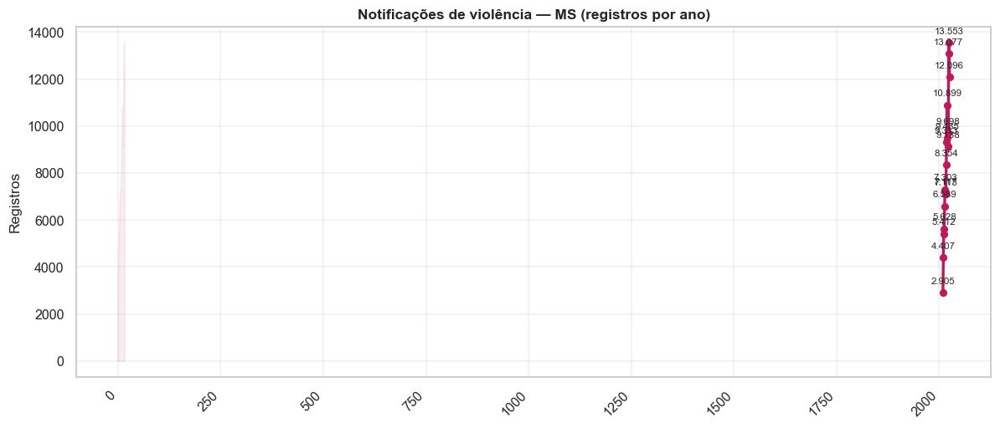


--- Completude por coluna (top 25) -----------------------------------


,coluna,preenchidos,nulos,completude_%
0,ID_AGRAVO,142087,0,100.0
1,DT_NOTIFIC,142087,0,100.0
5,ID_MUNICIP,142087,0,100.0
4,SG_UF_NOT,142087,0,100.0
10,CS_SEXO,142087,0,100.0
11,CS_GESTANT,142087,0,100.0
118,ANO_FONTE,142087,0,100.0
6,ID_UNIDADE,142004,83,99.9
15,ID_MN_RESI,141987,100,99.9
14,SG_UF,141987,100,99.9


   ... (120 linhas no total; exibindo as 25 primeiras)
   ✅ Inspeção inicial concluída.


In [12]:
banner("INSPEÇÃO INICIAL DO CONJUNTO BRUTO")

print(f"Origem dos dados : {ORIGEM_DADOS}")
print(f"Dimensões        : {df_raw.shape[0]:,} linhas × {df_raw.shape[1]} colunas")
print(f"Uso de memória   : {df_raw.memory_usage(deep=True).sum() / 1e6:.1f} MB")

show_df(df_raw.head(5), "Amostra das 5 primeiras linhas (colunas-chave)", max_linhas=5)

# Contagem por ano-fonte
cont_ano = (df_raw["ANO_FONTE"].value_counts().sort_index()
            .rename_axis("Ano").reset_index(name="Registros"))
show_df(cont_ano, "Registros por ano (fonte)", max_linhas=20)
linha_temporal(df_raw["ANO_FONTE"].value_counts().sort_index(),
               "Notificações de violência — MS (registros por ano)",
               "10_registros_por_ano", ylabel="Registros",
               descricao="Volume bruto de notificações por ano em MS")

# Tabela de tipos e completude por coluna
resumo_cols = pd.DataFrame({
    "coluna": df_raw.columns,
    "preenchidos": df_raw.notna().sum().values,
    "nulos": df_raw.isna().sum().values,
})
resumo_cols["completude_%"] = (resumo_cols["preenchidos"] / len(df_raw) * 100).round(1)
resumo_cols = resumo_cols.sort_values("completude_%", ascending=False)
show_df(resumo_cols, "Completude por coluna (top 25)", max_linhas=25)
salvar_csv(resumo_cols, "10_completude_colunas",
           "Completude por coluna do conjunto bruto")

# Amostra anonimizada exportada (apenas colunas não sensíveis)
salvar_csv(df_raw.head(200), "10_amostra_bruta",
           "Amostra (200 linhas) do conjunto bruto consolidado")
sucesso("Inspeção inicial concluída.")

============================================================
## SEÇÃO 11 — Qualidade dos dados
============================================================

Conforme o plano (Seção 15), antes de qualquer análise estatística/preditiva o sistema
executa uma bateria de verificações de qualidade: arquivos/registros ausentes,
duplicidades, datas inválidas/futuras, idades incompatíveis, municípios inexistentes,
códigos IBGE inválidos e completude por variável/ano. O resultado vira indicadores e um
**relatório dedicado** (`.txt`/`.log` com Texttable, além de `.csv`/`.xlsx`).


[03] AVALIAÇÃO DE QUALIDADE DOS DADOS

--- Indicadores de qualidade dos dados -------------------------------


,Indicador,Valor
0,Registros totais,142087.00
1,Linhas duplicadas,44.00
2,% duplicadas,0.03
3,DT_NOTIFIC inválidas,0.00
4,DT_NOTIFIC futuras,0.00
5,NU_IDADE_N ausente,255.00
6,Municípios fora do cadastro MS,0.00
7,% município fora do cadastro,0.00
8,Municípios distintos,79.00
9,Sexo ausente,0.00



--- Completude média por ano (%) -------------------------------------


,Ano,completude_media_%
0,2009,92.2
1,2010,91.1
2,2011,91.8
3,2012,92.5
4,2013,91.9
5,2014,88.7
6,2015,74.9
7,2016,72.9
8,2017,73.1
9,2018,73.2


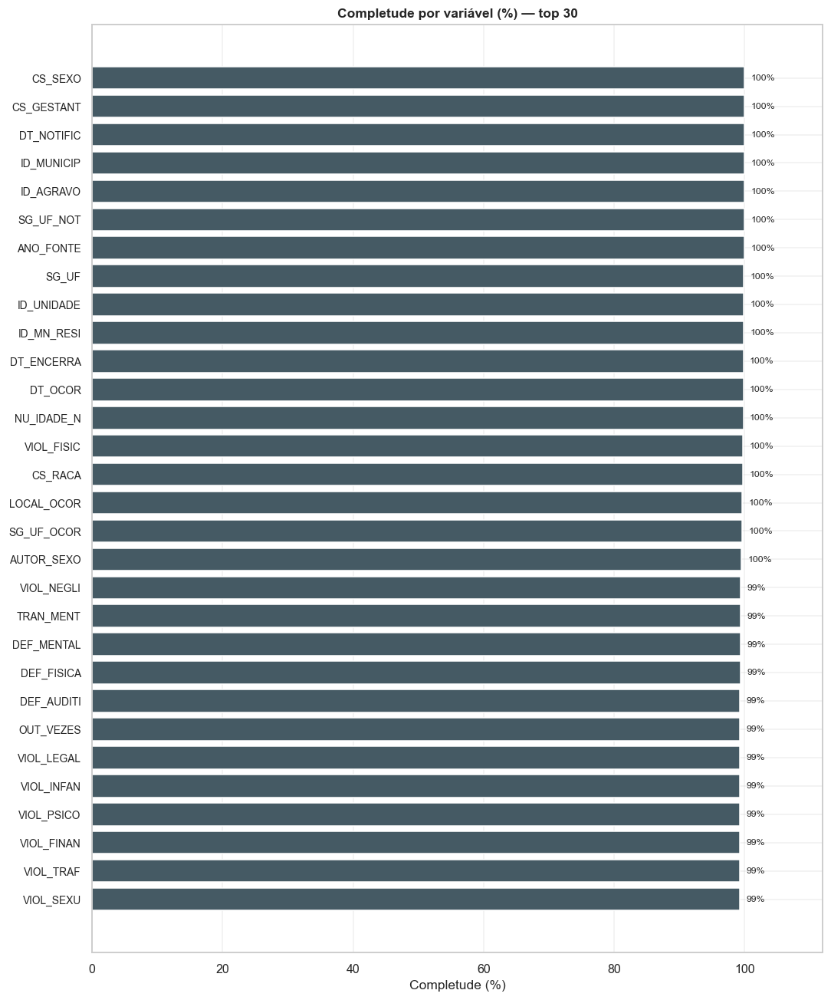

   📝 Relatório salvo: 11_relatorio_qualidade_dados.txt
   ✅ Avaliação de qualidade concluída — índice global: 100.0/100


In [13]:
banner("AVALIAÇÃO DE QUALIDADE DOS DADOS")

qualidade = OrderedDict()
hoje = pd.Timestamp(datetime.now().date())

# 11.1  Volume e duplicidades
n_total = len(df_raw)
n_dup = int(df_raw.duplicated().sum())
qualidade["Registros totais"] = n_total
qualidade["Linhas duplicadas"] = n_dup
qualidade["% duplicadas"] = round(100 * n_dup / max(1, n_total), 2)

# 11.2  Datas inválidas / futuras
_dtnot = pd.to_datetime(df_raw.get("DT_NOTIFIC"), errors="coerce")
n_dt_inval = int(_dtnot.isna().sum())
n_dt_fut = int((_dtnot > hoje).sum())
qualidade["DT_NOTIFIC inválidas"] = n_dt_inval
qualidade["DT_NOTIFIC futuras"] = n_dt_fut

# 11.3  Idades incompatíveis
_idade_raw = pd.to_numeric(df_raw.get("NU_IDADE_N"), errors="coerce")
qualidade["NU_IDADE_N ausente"] = int(_idade_raw.isna().sum())

# 11.4  Municípios / UF
_cod6 = (df_raw.get("ID_MUNICIP").astype(str).str.replace(r"\.0$", "", regex=True)
         .str.strip().str.zfill(6))
n_mun_invalido = int((~_cod6.isin(MUNICIPIOS_MS.keys())).sum())
qualidade["Municípios fora do cadastro MS"] = n_mun_invalido
qualidade["% município fora do cadastro"] = round(100 * n_mun_invalido / max(1, n_total), 2)
qualidade["Municípios distintos"] = int(_cod6.nunique())

# 11.5  Campos críticos ausentes
for col, rotulo in [("CS_SEXO", "Sexo ausente"),
                    ("ID_MUNICIP", "Município ausente"),
                    ("CS_RACA", "Raça/cor ausente"),
                    ("DT_NOTIFIC", "Data notificação ausente")]:
    if col in df_raw.columns:
        if col == "DT_NOTIFIC":
            qualidade[rotulo] = n_dt_inval
        else:
            vazio = df_raw[col].isna() | (df_raw[col].astype(str).str.strip() == "")
            qualidade[rotulo] = int(vazio.sum())

# 11.6  Registros sem nenhum tipo de violência marcado
viol_num = df_raw[COLS_VIOL].apply(pd.to_numeric, errors="coerce")
sem_viol = int((viol_num.eq(1).sum(axis=1) == 0).sum())
qualidade["Registros sem tipo de violência"] = sem_viol

# Índice de qualidade global (0–100): penaliza nulos/duplicatas/inconsistências
penalidade = (qualidade["% duplicadas"]
              + 100 * n_dt_inval / max(1, n_total)
              + 100 * n_mun_invalido / max(1, n_total)) / 3
indice_qualidade = round(max(0.0, 100 - penalidade), 1)
qualidade["ÍNDICE DE QUALIDADE (0-100)"] = indice_qualidade

show_df(pd.DataFrame(list(qualidade.items()), columns=["Indicador", "Valor"]),
        "Indicadores de qualidade dos dados", max_linhas=30)

# 11.7  Completude por variável (exporta tabela completa)
completude_var = (df_raw.notna().mean() * 100).round(1).sort_values(ascending=False)
df_completude = completude_var.rename_axis("variavel").reset_index(name="completude_%")
salvar_csv(df_completude, "11_completude_variaveis",
           "Completude (%) por variável")
registrar_planilha("Qualidade_Completude", df_completude)

# 11.8  Completude por ano (taxa média de preenchimento)
comp_ano = (df_raw.groupby("ANO_FONTE").apply(lambda d: d.notna().mean().mean() * 100)
            .round(1).rename_axis("Ano").reset_index(name="completude_media_%"))
show_df(comp_ano, "Completude média por ano (%)", max_linhas=20)

# 11.9  Gráfico de completude (top 30 variáveis)
barras_horizontais(completude_var.head(30),
                   "Completude por variável (%) — top 30",
                   "11_completude_top30", xlabel="Completude (%)",
                   cor=COR_NEUTRA, fmt="{:.0f}%",
                   descricao="Variáveis mais completas")

# 11.10  Relatório dedicado de qualidade (Texttable → txt/log)
rel_q = RelatorioTexto("Relatório de Qualidade dos Dados")
rel_q.texto(f"Origem dos dados: {ORIGEM_DADOS}")
rel_q.texto(f"Registros lidos: {n_total:,} | Anos: {CFG.ano_inicial}-{CFG.ano_final}")
rel_q.secao("Indicadores de qualidade")
rel_q.kv({k: formato_numero(v) if isinstance(v, (int,)) else v
          for k, v in qualidade.items()})
rel_q.secao("Completude por ano")
rel_q.tabela_df(comp_ano)
rel_q.secao("Completude das 30 variáveis mais preenchidas")
rel_q.tabela_df(df_completude.head(30))
rel_q.secao("Observações metodológicas")
rel_q.texto(
    "- Convenções SINAN: 1=Sim, 2=Não, 8=Não se aplica, 9=Ignorado.\n"
    "- A idade é decodificada de NU_IDADE_N (4XXX=anos, 3XXX=meses, 2XXX=dias).\n"
    "- Registros com município fora do cadastro IBGE de MS são sinalizados, não removidos.\n"
    "- Nenhuma reidentificação é possível: o sistema usa apenas dados agregados (LGPD)."
)
rel_q.salvar(DIRS["relatorios"] / "11_relatorio_qualidade_dados.txt")
salvar_json(qualidade, "11_indicadores_qualidade", "Indicadores de qualidade (JSON)")

sucesso("Avaliação de qualidade concluída — índice global: %.1f/100", indice_qualidade)

============================================================
## SEÇÃO 12 — Limpeza e conversão de tipos
============================================================

O *pipeline* de limpeza: (1) cria uma cópia de trabalho `df`; (2) remove duplicidades;
(3) converte colunas numéricas e datas; (4) decodifica a idade; (5) extrai atributos
temporais (ano, mês, trimestre, dia da semana, hora, período do dia).

In [14]:
banner("LIMPEZA E CONVERSÃO DE TIPOS")

df = df_raw.copy()

# 12.1  Remoção de duplicidades exatas
_n0 = len(df)
df = df.drop_duplicates().reset_index(drop=True)
info("Duplicidades removidas: %s (%.2f%%)",
     formato_numero(_n0 - len(df)), 100 * (_n0 - len(df)) / max(1, _n0))

# 12.2  Conversão de colunas numéricas
COLS_NUMERICAS = (["CS_RACA", "CS_ESCOL_N", "CS_GESTANT", "SIT_CONJUG",
                   "NU_IDADE_N", "LOCAL_OCOR", "OUT_VEZES", "LES_AUTOP",
                   "AUTOR_SEXO", "AUTOR_ALCO", "CLASSI_FIN", "EVOLUCAO",
                   "NUM_ENVOLV", "CICL_VID", "ORIENT_SEX", "IDENT_GEN"]
                  + COLS_VIOL + COLS_AGRESSAO + COLS_SEXUAL
                  + COLS_RELACAO + COLS_ENCAMINHAMENTO)
for c in COLS_NUMERICAS:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# 12.3  Conversão de datas
COLS_DATA = ["DT_NOTIFIC", "DT_OCOR", "DT_OBITO", "DT_ENCERRA"]
for c in COLS_DATA:
    if c in df.columns:
        df[c] = pd.to_datetime(df[c], errors="coerce")

# 12.4  Decodificação da idade (NU_IDADE_N → anos)
def decodificar_idade(val):
    """Converte o código SINAN NU_IDADE_N em idade (anos, float).

    Regras: 4XXX=anos, 3XXX=meses, 2XXX=dias, 1XXX=horas (≈0 ano).
    """
    if pd.isna(val):
        return np.nan
    try:
        v = int(val)
    except Exception:
        return np.nan
    if v >= 4000:
        return float(v - 4000)
    if v >= 3000:
        return round((v - 3000) / 12.0, 2)
    if v >= 2000:
        return round((v - 2000) / 365.0, 3)
    if v >= 1000:
        return 0.0
    if 0 <= v <= 130:          # alguns anos antigos gravam a idade diretamente
        return float(v)
    return np.nan


df["IDADE"] = df["NU_IDADE_N"].apply(decodificar_idade)
df.loc[(df["IDADE"] < 0) | (df["IDADE"] > 120), "IDADE"] = np.nan

# Faixas etárias (detalhada e simplificada)
df["FAIXA_ETARIA"] = pd.cut(df["IDADE"], bins=FAIXA_BINS, labels=FAIXA_LABELS)
df["FAIXA_SIMPLES"] = pd.cut(df["IDADE"], bins=FAIXA_BINS_SIMPLES,
                             labels=FAIXA_LABELS_SIMPLES)

# 12.5  Atributos temporais (preferência por DT_NOTIFIC; fallback ANO_FONTE)
df["ANO"] = df["DT_NOTIFIC"].dt.year
df["ANO"] = df["ANO"].fillna(df["ANO_FONTE"]).astype("Int64")
df["MES"] = df["DT_NOTIFIC"].dt.month.astype("Int64")
df["TRIMESTRE"] = df["DT_NOTIFIC"].dt.quarter.astype("Int64")
df["PERIODO"] = df["DT_NOTIFIC"].dt.to_period("M").astype(str)
df["DIA_SEMANA_NUM"] = df["DT_NOTIFIC"].dt.dayofweek.astype("Int64")
_dias = {0: "Segunda", 1: "Terça", 2: "Quarta", 3: "Quinta",
         4: "Sexta", 5: "Sábado", 6: "Domingo"}
df["DIA_SEMANA"] = df["DIA_SEMANA_NUM"].map(_dias)
df["FIM_SEMANA"] = df["DIA_SEMANA_NUM"].isin([5, 6])

# Hora da ocorrência (HORA_OCOR no formato HH:MM) e período do dia
def _extrair_hora(v):
    if pd.isna(v):
        return np.nan
    m = re.match(r"^\s*(\d{1,2})", str(v))
    if not m:
        return np.nan
    h = int(m.group(1))
    return h if 0 <= h <= 23 else np.nan


df["HORA"] = df["HORA_OCOR"].apply(_extrair_hora) if "HORA_OCOR" in df.columns else np.nan
def _periodo_dia(h):
    if pd.isna(h):
        return "Ignorado"
    h = int(h)
    if 0 <= h < 6:
        return "Madrugada (0-5h)"
    if 6 <= h < 12:
        return "Manhã (6-11h)"
    if 12 <= h < 18:
        return "Tarde (12-17h)"
    return "Noite (18-23h)"


df["PERIODO_DIA"] = df["HORA"].apply(_periodo_dia)

info("Idade decodificada — média: %.1f anos | mediana: %.1f anos",
     df["IDADE"].mean(), df["IDADE"].median())
show_df(df["FAIXA_ETARIA"].value_counts().sort_index()
        .rename_axis("Faixa etária").reset_index(name="Registros"),
        "Distribuição por faixa etária", max_linhas=12)
sucesso("Limpeza e conversão de tipos concluídas.")


[04] LIMPEZA E CONVERSÃO DE TIPOS
   Duplicidades removidas: 44 (0.03%)
   Idade decodificada — média: 27.5 anos | mediana: 23.0 anos

--- Distribuição por faixa etária ------------------------------------


,Faixa etária,Registros
0,0-11,30780
1,12-17,22120
2,18-19,6531
3,20-24,15276
4,25-29,13126
5,30-39,20627
6,40-49,13129
7,50-59,6463
8,60+,13736


   ✅ Limpeza e conversão de tipos concluídas.


============================================================
## SEÇÃO 13 — Decodificação de variáveis categóricas
============================================================

Tradução dos códigos numéricos para rótulos legíveis (raça/cor, escolaridade, local de
ocorrência, sexo, evolução, ciclo de vida, situação conjugal, sexo do autor, etc.),
além da padronização do código municipal para 6 dígitos e do nome do município.

In [15]:
banner("DECODIFICAÇÃO DE VARIÁVEIS CATEGÓRICAS")

def _map_codigo(col, dicionario, default="Ignorado"):
    if col not in df.columns:
        return pd.Series([default] * len(df), index=df.index)
    return df[col].map(dicionario).fillna(default)


df["SEXO_DESC"] = _map_codigo("CS_SEXO", DICT_SEXO)
df["RACA_COR"] = _map_codigo("CS_RACA", DICT_RACA)
df["ESCOLARIDADE"] = _map_codigo("CS_ESCOL_N", DICT_ESCOLARIDADE)
df["LOCAL_DESC"] = _map_codigo("LOCAL_OCOR", DICT_LOCAL_OCOR, default="Outro")
df["EVOLUCAO_DESC"] = _map_codigo("EVOLUCAO", DICT_EVOLUCAO)
df["CICLO_VIDA_DESC"] = _map_codigo("CICL_VID", DICT_CICLO_VIDA)
df["SIT_CONJUGAL_DESC"] = _map_codigo("SIT_CONJUG", DICT_SIT_CONJUGAL)
df["AUTOR_SEXO_DESC"] = _map_codigo("AUTOR_SEXO", DICT_AUTOR_SEXO)
df["AUTOR_ALCOOL_DESC"] = _map_codigo("AUTOR_ALCO", DICT_AUTOR_ALCOOL)
df["GESTANTE_DESC"] = _map_codigo("CS_GESTANT", DICT_GESTANTE)
df["ORIENT_SEXUAL_DESC"] = _map_codigo("ORIENT_SEX", DICT_ORIENT_SEXUAL)
df["IDENT_GENERO_DESC"] = _map_codigo("IDENT_GEN", DICT_IDENT_GENERO)

# Código municipal padronizado (6 dígitos) e nome do município
df["COD_MUN"] = (df["ID_MUNICIP"].astype(str)
                 .str.replace(r"\.0$", "", regex=True).str.strip().str.zfill(6))
df["NM_MUN"] = df["COD_MUN"].map(MUNICIPIOS_MS).fillna("Outro/Não identificado")
# População e região auxiliares no nível do registro (para taxas e mapas)
df["POP_MUN"] = df["COD_MUN"].map(POP_MUN_MS_2022)
df["POP_FEM_MUN"] = df["COD_MUN"].map(POP_FEM_MUN_MS)

info("Municípios identificados: %d de %d",
     df.loc[df["NM_MUN"] != "Outro/Não identificado", "COD_MUN"].nunique(),
     len(MUNICIPIOS_MS))
info("Registros sem município no cadastro: %s",
     formato_numero((df["NM_MUN"] == "Outro/Não identificado").sum()))

show_df(df["RACA_COR"].value_counts().rename_axis("Raça/cor")
        .reset_index(name="Registros"), "Distribuição por raça/cor")
sucesso("Decodificação categórica concluída.")


[05] DECODIFICAÇÃO DE VARIÁVEIS CATEGÓRICAS
   Municípios identificados: 79 de 79
   Registros sem município no cadastro: 0

--- Distribuição por raça/cor ----------------------------------------


,Raça/cor,Registros
0,Parda,64183
1,Branca,46535
2,Ignorado,11199
3,Indígena,10398
4,Preta,7609
5,Amarela,2119


   ✅ Decodificação categórica concluída.


============================================================
## SEÇÃO 14 — Engenharia de atributos (flags e vínculos)
============================================================

Transforma os campos `1=Sim/2=Não` em **flags binárias** limpas (1/0) e deriva o
vínculo dominante autor-vítima, contagens de encaminhamentos e indicadores de
reincidência. Essas flags alimentam toda a análise temática e os modelos.

In [16]:
banner("ENGENHARIA DE ATRIBUTOS")

def _flag(col):
    """Converte um campo SINAN Sim/Não em 1/0 (1=Sim; demais=0)."""
    if col not in df.columns:
        return pd.Series(0, index=df.index, dtype="int8")
    return (pd.to_numeric(df[col], errors="coerce") == 1).astype("int8")


# 14.1  Flags de tipo de violência
for col in COLS_VIOL:
    df[f"FL_{col}"] = _flag(col)
# 14.2  Flags de meio de agressão
for col in COLS_AGRESSAO:
    df[f"FL_{col}"] = _flag(col)
# 14.3  Flags de natureza sexual
for col in COLS_SEXUAL:
    df[f"FL_{col}"] = _flag(col)
# 14.4  Flags de relação autor-vítima
for col in COLS_RELACAO:
    df[f"FL_{col}"] = _flag(col)
# 14.5  Flags de encaminhamento
for col in COLS_ENCAMINHAMENTO:
    df[f"FL_{col}"] = _flag(col)
# 14.5.1  Flags de deficiência/transtorno, consequências e procedimentos
for col in COLS_DEFICIENCIA + COLS_CONSEQUENCIA + COLS_PROCEDIMENTO:
    df[f"FL_{col}"] = _flag(col)
df["FL_POSSUI_DEFICIENCIA"] = df[[f"FL_{c}" for c in COLS_DEFICIENCIA]].max(axis=1)

# 14.6  Número de tipos de violência simultâneos (gravidade/sobreposição)
df["N_TIPOS_VIOLENCIA"] = df[[f"FL_{c}" for c in COLS_VIOL]].sum(axis=1).astype("int16")
df["VIOLENCIA_MULTIPLA"] = (df["N_TIPOS_VIOLENCIA"] >= 2).astype("int8")

# 14.7  Vínculo dominante autor-vítima (primeira flag marcada, na ordem de prioridade)
PRIORIDADE_VINCULO = (RELACAO_PARCEIRO_INTIMO + RELACAO_FAMILIAR
                      + [c for c in COLS_RELACAO
                         if c not in RELACAO_PARCEIRO_INTIMO + RELACAO_FAMILIAR])


def _vinculo_dominante(row):
    for c in PRIORIDADE_VINCULO:
        if row.get(f"FL_{c}", 0) == 1:
            return MAP_RELACAO.get(c, c)
    return "Não informado"


df["VINCULO_AUTOR"] = df.apply(_vinculo_dominante, axis=1)

# 14.8  Categorias de vínculo (parceiro íntimo / familiar / outro)
df["FL_PARCEIRO_INTIMO"] = df[[f"FL_{c}" for c in RELACAO_PARCEIRO_INTIMO]].max(axis=1)
df["FL_FAMILIAR"] = df[[f"FL_{c}" for c in RELACAO_FAMILIAR]].max(axis=1)


def _categoria_vinculo(row):
    if row["FL_PARCEIRO_INTIMO"] == 1:
        return "Parceiro(a) íntimo(a)"
    if row["FL_FAMILIAR"] == 1:
        return "Familiar"
    if row.get("FL_REL_CONHEC", 0) == 1:
        return "Conhecido(a)"
    if row.get("FL_REL_DESCO", 0) == 1:
        return "Desconhecido(a)"
    return "Outro/Não informado"


df["CATEGORIA_VINCULO"] = df.apply(_categoria_vinculo, axis=1)

# 14.9  Encaminhamentos (contagem) e reincidência
df["N_ENCAMINHAMENTOS"] = df[[f"FL_{c}" for c in COLS_ENCAMINHAMENTO]].sum(axis=1).astype("int16")
df["FL_REINCIDENCIA"] = (pd.to_numeric(df.get("OUT_VEZES"), errors="coerce") == 1).astype("int8")
df["FL_AUTOR_ALCOOL"] = (pd.to_numeric(df.get("AUTOR_ALCO"), errors="coerce") == 1).astype("int8")

info("Tipos de violência por registro — média: %.2f", df["N_TIPOS_VIOLENCIA"].mean())
show_df(df["CATEGORIA_VINCULO"].value_counts().rename_axis("Categoria de vínculo")
        .reset_index(name="Registros"), "Categoria de vínculo autor-vítima")
sucesso("Engenharia de atributos concluída — %d flags criadas.",
        sum(1 for c in df.columns if c.startswith("FL_")))


[06] ENGENHARIA DE ATRIBUTOS
   Tipos de violência por registro — média: 1.15

--- Categoria de vínculo autor-vítima --------------------------------


,Categoria de vínculo,Registros
0,Outro/Não informado,48837
1,Familiar,44399
2,Parceiro(a) íntimo(a),28622
3,Conhecido(a),10798
4,Desconhecido(a),9387


   ✅ Engenharia de atributos concluída — 84 flags criadas.


============================================================
## SEÇÃO 15 — Categorias analíticas derivadas
============================================================

Combina as flags em **categorias analíticas** alinhadas ao plano do projeto. Como o
SINAN é uma base de **saúde** (notificações), e não de segurança pública, alguns
conceitos jurídicos (ex.: *feminicídio*) são representados por **proxies documentados**:

 - **Violência doméstica** — ocorrência na residência **ou** autor com vínculo íntimo/
   familiar.
 - **Violência sexual** — `VIOL_SEXU=1` **ou** qualquer natureza `SEX_*=1`.
 - **Estupro** — `SEX_ESTUPR=1`.
 - **Ameaça** — `AG_AMEACA=1`.
 - **Lesão corporal** — `VIOL_FISIC=1` (violência física notificada).
 - **Óbito por violência** — `EVOLUCAO=3`.
 - **Feminicídio (proxy)** — vítima **feminina** + **óbito por violência**.
 - **Tentativa de feminicídio (proxy)** — vítima feminina + violência física grave por
   parceiro íntimo, sem óbito.

In [17]:
banner("CATEGORIAS ANALÍTICAS DERIVADAS")

df["FL_FEMININO"] = (df["CS_SEXO"].astype(str).str.upper().str.strip() == "F").astype("int8")
df["FL_NA_RESIDENCIA"] = (pd.to_numeric(df.get("LOCAL_OCOR"), errors="coerce") == 1).astype("int8")

# Violência doméstica (proxy)
df["FL_VIOL_DOMESTICA"] = (
    (df["FL_NA_RESIDENCIA"] == 1)
    | (df["FL_PARCEIRO_INTIMO"] == 1)
    | (df["FL_FAMILIAR"] == 1)
).astype("int8")

# Violência sexual e estupro
df["FL_VIOL_SEXUAL"] = (
    (df["FL_VIOL_SEXU"] == 1)
    | (df[[f"FL_{c}" for c in COLS_SEXUAL]].max(axis=1) == 1)
).astype("int8")
df["FL_ESTUPRO"] = df["FL_SEX_ESTUPR"].astype("int8")

# Ameaça, lesão corporal, psicológica
df["FL_AMEACA"] = df["FL_AG_AMEACA"].astype("int8")
df["FL_LESAO_CORPORAL"] = df["FL_VIOL_FISIC"].astype("int8")
df["FL_VIOL_PSICOLOGICA"] = df["FL_VIOL_PSICO"].astype("int8")

# Óbito por violência e proxies de letalidade
df["FL_OBITO_VIOLENCIA"] = (pd.to_numeric(df.get("EVOLUCAO"), errors="coerce") == 3).astype("int8")
df["FL_FEMINICIDIO"] = ((df["FL_FEMININO"] == 1) & (df["FL_OBITO_VIOLENCIA"] == 1)).astype("int8")
df["FL_TENT_FEMINICIDIO"] = (
    (df["FL_FEMININO"] == 1)
    & (df["FL_OBITO_VIOLENCIA"] == 0)
    & (df["FL_VIOL_FISIC"] == 1)
    & (df["FL_PARCEIRO_INTIMO"] == 1)
    & ((df.get("FL_AG_FOGO", 0) == 1) | (df.get("FL_AG_CORTE", 0) == 1)
       | (df.get("FL_AG_ENFOR", 0) == 1) | (df.get("FL_AG_FORCA", 0) == 1))
).astype("int8")

# Arma de fogo / arma branca presentes
df["FL_ARMA_FOGO"] = df.get("FL_AG_FOGO", 0)
df["FL_ARMA_BRANCA"] = df.get("FL_AG_CORTE", 0)

# Dicionário de categorias analíticas (flag → rótulo) — usado em loops de análise
CATEGORIAS_ANALITICAS = OrderedDict([
    ("FL_VIOL_DOMESTICA", "Violência doméstica"),
    ("FL_VIOL_FISIC", "Violência física"),
    ("FL_VIOL_PSICOLOGICA", "Violência psicológica/moral"),
    ("FL_VIOL_SEXUAL", "Violência sexual"),
    ("FL_ESTUPRO", "Estupro"),
    ("FL_AMEACA", "Ameaça"),
    ("FL_LESAO_CORPORAL", "Lesão corporal"),
    ("FL_FEMINICIDIO", "Feminicídio (proxy)"),
    ("FL_TENT_FEMINICIDIO", "Tentativa de feminicídio (proxy)"),
    ("FL_OBITO_VIOLENCIA", "Óbito por violência"),
    ("FL_VIOL_NEGLI", "Negligência/Abandono"),
    ("FL_VIOL_FINAN", "Violência financeira/patrimonial"),
])

# Tabela-resumo das categorias (total e % entre vítimas femininas)
resumo_categorias = []
mulheres = df[df["FL_FEMININO"] == 1]
for flag, rotulo in CATEGORIAS_ANALITICAS.items():
    total = int(df[flag].sum()) if flag in df.columns else 0
    total_f = int(mulheres[flag].sum()) if flag in mulheres.columns else 0
    resumo_categorias.append({
        "Categoria": rotulo,
        "Total (todas as vítimas)": total,
        "Total (vítimas mulheres)": total_f,
        "% sobre mulheres": round(100 * total_f / max(1, len(mulheres)), 1),
    })
df_resumo_categorias = pd.DataFrame(resumo_categorias)
show_df(df_resumo_categorias, "Resumo das categorias analíticas", max_linhas=20)
salvar_csv(df_resumo_categorias, "15_resumo_categorias",
           "Totais por categoria analítica de violência")
registrar_planilha("Categorias_Resumo", df_resumo_categorias)

info("Vítimas femininas: %s (%.1f%% do total)",
     formato_numero(len(mulheres)), 100 * len(mulheres) / max(1, len(df)))
info("Feminicídios (proxy): %s | Óbitos por violência: %s",
     formato_numero(int(df["FL_FEMINICIDIO"].sum())),
     formato_numero(int(df["FL_OBITO_VIOLENCIA"].sum())))
sucesso("Categorias analíticas derivadas concluídas.")


[07] CATEGORIAS ANALÍTICAS DERIVADAS

--- Resumo das categorias analíticas ---------------------------------


,Categoria,Total (todas as vítimas),Total (vítimas mulheres),% sobre mulheres
0,Violência doméstica,114773,77283,84.0
1,Violência física,67779,45348,49.3
2,Violência psicológica/moral,18767,15232,16.6
3,Violência sexual,9325,8162,8.9
4,Estupro,6618,5946,6.5
5,Ameaça,10850,8913,9.7
6,Lesão corporal,67779,45348,49.3
7,Feminicídio (proxy),83,83,0.1
8,Tentativa de feminicídio (proxy),19836,19836,21.6
9,Óbito por violência,194,83,0.1


   Vítimas femininas: 91.970 (64.7% do total)
   Feminicídios (proxy): 83 | Óbitos por violência: 194
   ✅ Categorias analíticas derivadas concluídas.


============================================================
## SEÇÃO 16 — Proteção de dados (LGPD / anonimização)
============================================================

Conforme a Seção 16 do plano, por tratar de dados sensíveis sobre violência contra a
mulher, o sistema adota: (a) uso exclusivo de **dados agregados**; (b) **supressão de
pequenas células** (k-anonimato) em qualquer tabela publicável; (c) ausência de
identificadores diretos; (d) logs sem dados pessoais. O SINAN-VIOL público já é
desidentificado; ainda assim, reforçamos as salvaguardas.

In [18]:
banner("CAMADA DE PROTEÇÃO DE DADOS (LGPD)")

# 16.1  Conferência de ausência de identificadores diretos
IDENTIFICADORES_PROIBIDOS = ["NM_PACIENT", "NM_PACIEN", "NM_MAE", "NU_CPF",
                             "CPF", "RG", "NU_PRONTUAC", "NM_LOGRADO",
                             "NU_TELEFON", "TELEFONE", "ID_CNS_SUS"]
presentes = [c for c in IDENTIFICADORES_PROIBIDOS if c in df.columns]
if presentes:
    aviso("Removendo identificadores diretos encontrados: %s", presentes)
    df = df.drop(columns=presentes)
else:
    sucesso("Nenhum identificador direto presente no conjunto (base já desidentificada).")

# 16.2  Limiar de k-anonimato para tabelas publicáveis
K_ANON = 1 if ORIGEM_DADOS.startswith("SINT") else 5


def mascarar_pequenos(df_tab: pd.DataFrame, col_contagem: str,
                      k: int = K_ANON, rotulo_mascara="<5") -> pd.DataFrame:
    """Suprime (mascara) células com contagem menor que `k` (k-anonimato).

    Retorna uma cópia onde valores de `col_contagem` < k viram `rotulo_mascara`.
    Em dados sintéticos (k=1) a operação é nula, preservando a demonstração.
    """
    if k <= 1 or col_contagem not in df_tab.columns:
        return df_tab
    out = df_tab.copy()
    mask = out[col_contagem] < k
    out.loc[mask, col_contagem] = rotulo_mascara
    return out


info("Limiar de k-anonimato aplicado às exportações: k=%d", K_ANON)
logger.info("LGPD: agregação obrigatória, k-anon=%d, sem identificadores diretos.", K_ANON)
sucesso("Camada de proteção de dados configurada.")


[08] CAMADA DE PROTEÇÃO DE DADOS (LGPD)
   ✅ Nenhum identificador direto presente no conjunto (base já desidentificada).
   Limiar de k-anonimato aplicado às exportações: k=5
   ✅ Camada de proteção de dados configurada.


============================================================
## SEÇÃO 17 — Persistência em camadas (bronze / silver / gold)
============================================================

Arquitetura *medallion* simplificada: **bronze** (bruto consolidado), **silver**
(limpo e tipado) e **gold** (pronto para análise, com flags e categorias). Salvo em
Parquet quando possível (compacto e colunar), com *fallback* para CSV.

In [19]:
banner("PERSISTÊNCIA EM CAMADAS (BRONZE / SILVER / GOLD)")

# Bronze: amostra do bruto (evita gravar GBs; o bruto completo permanece em memória)
salvar_parquet(df_raw.head(50_000), "bronze_amostra_bruto",
               "Camada bronze (amostra do bruto consolidado)")

# Silver/Gold: conjunto analítico completo (já é o resultado do pipeline)
COLS_GOLD = [c for c in df.columns
             if df[c].dtype != "O" or df[c].map(lambda x: len(str(x)) < 60).all()]
gold_path = salvar_parquet(df, "gold_analitico_MS",
                           "Camada gold (analítico, com flags e categorias)")
info("Conjunto analítico (gold) persistido: %s", Path(gold_path).name)
info("Dimensões finais do analítico: %s linhas × %s colunas",
     formato_numero(len(df)), df.shape[1])
sucesso("Persistência em camadas concluída.")


[09] PERSISTÊNCIA EM CAMADAS (BRONZE / SILVER / GOLD)
   Conjunto analítico (gold) persistido: gold_analitico_MS.parquet
   Dimensões finais do analítico: 142.043 linhas × 250 colunas
   ✅ Persistência em camadas concluída.


============================================================
## SEÇÃO 18 — Toolkit de análise (funções reutilizáveis)
============================================================

Conjunto de funções genéricas que padronizam as análises subsequentes: contagens por
dimensão, séries temporais, *rankings* municipais e cálculo de taxas por 100 mil
mulheres. Centralizar essas operações garante consistência metodológica e reduz
repetição ao longo das dezenas de análises temáticas.

In [20]:
# Subconjunto de vítimas femininas — foco do projeto
DF_MULHERES = df[df["FL_FEMININO"] == 1].copy()
info("Subconjunto de vítimas mulheres: %s registros", formato_numero(len(DF_MULHERES)))


def _moda_segura(serie):
    """Retorna a categoria mais frequente de uma série, ou '-' se vazia."""
    try:
        vc = serie.value_counts()
        return vc.idxmax() if len(vc) else "-"
    except Exception:
        return "-"


def contagem_por(dimensao: str, base: pd.DataFrame = None, flag: str = None,
                 top: int = None, dropna: bool = True) -> pd.Series:
    """Conta registros por uma dimensão categórica (opcionalmente filtrando por flag)."""
    base = DF_MULHERES if base is None else base
    if flag and flag in base.columns:
        base = base[base[flag] == 1]
    if dimensao not in base.columns:
        return pd.Series(dtype=int)
    s = base[dimensao].value_counts(dropna=dropna)
    if top:
        s = s.head(top)
    return s


def serie_temporal(flag: str = None, base: pd.DataFrame = None,
                   por: str = "ANO") -> pd.Series:
    """Série temporal de contagem (por ANO, PERIODO, MES...) com filtro de flag."""
    base = DF_MULHERES if base is None else base
    if flag and flag in base.columns:
        base = base[base[flag] == 1]
    if por not in base.columns:
        return pd.Series(dtype=int)
    return base.groupby(por).size()


def ranking_municipal(flag: str = None, base: pd.DataFrame = None) -> pd.DataFrame:
    """Constrói um ranking municipal (contagem absoluta) com nome do município."""
    base = DF_MULHERES if base is None else base
    if flag and flag in base.columns:
        base = base[base[flag] == 1]
    g = (base.groupby("COD_MUN").size().rename("N").reset_index())
    g["Municipio"] = g["COD_MUN"].map(MUNICIPIOS_MS).fillna("Outro/Não identificado")
    g = g[g["Municipio"] != "Outro/Não identificado"]
    g = g.sort_values("N", ascending=False).reset_index(drop=True)
    g.insert(0, "Posicao", g.index + 1)
    return g


def adicionar_taxa(rank_df: pd.DataFrame, col_n: str = "N",
                   usar_feminina: bool = True) -> pd.DataFrame:
    """Adiciona população e taxa por 100 mil (mulheres ou total) a um ranking."""
    out = rank_df.copy()
    fonte = POP_FEM_MUN_MS if usar_feminina else POP_MUN_MS_2022
    out["Populacao"] = out["COD_MUN"].map(fonte)
    out["Taxa_100k"] = (pd.to_numeric(out[col_n], errors="coerce")
                        / out["Populacao"] * 100_000).round(2)
    return out


def analisar_dimensao(dimensao: str, titulo: str, nome: str,
                      base: pd.DataFrame = None, flag: str = None,
                      top: int = 15, cor: str = None,
                      exportar: bool = True) -> pd.Series:
    """Análise padrão de uma dimensão: tabela inline + gráfico + CSV + relatório.

    Retorna a série de contagem. É a função "trabalhadora" usada repetidamente nas
    seções de análise exploratória.
    """
    s = contagem_por(dimensao, base=base, flag=flag, top=top)
    if s.empty:
        aviso("Sem dados para a dimensão '%s'.", dimensao)
        return s
    df_tab = s.rename_axis(dimensao).reset_index(name="Registros")
    df_tab["%"] = (df_tab["Registros"] / df_tab["Registros"].sum() * 100).round(1)
    show_df(df_tab, titulo, max_linhas=top)
    barras_horizontais(s, titulo, nome, cor=cor or COR_PRIMARIA,
                       descricao=titulo, top=top)
    if exportar:
        salvar_csv(df_tab, nome, titulo)
        registrar_planilha(nome[:31], df_tab)
    return s


print("✅ Seção 18 concluída — toolkit de análise pronto.")

   Subconjunto de vítimas mulheres: 91.970 registros
✅ Seção 18 concluída — toolkit de análise pronto.


============================================================
## SEÇÃO 19 — Análise exploratória: OCORRÊNCIAS
============================================================

Caracterização temporal e situacional das notificações de violência contra a mulher em
MS: por ano, mês, trimestre, dia da semana, período do dia, hora e local de ocorrência.
Todas as saídas são exibidas **inline** e exportadas (`.csv`/`.png`), com um relatório
temático ao final (`.txt`/`.log` via Texttable).


[10] OCORRÊNCIAS — DISTRIBUIÇÃO TEMPORAL E SITUACIONAL

--- Notificações de mulheres por ano ---------------------------------


,Ano,Notificações
0,2009,1907
1,2010,2973
2,2011,3611
3,2012,3775
4,2013,4361
5,2014,4796
6,2015,4513
7,2016,4614
8,2017,5412
9,2018,6025


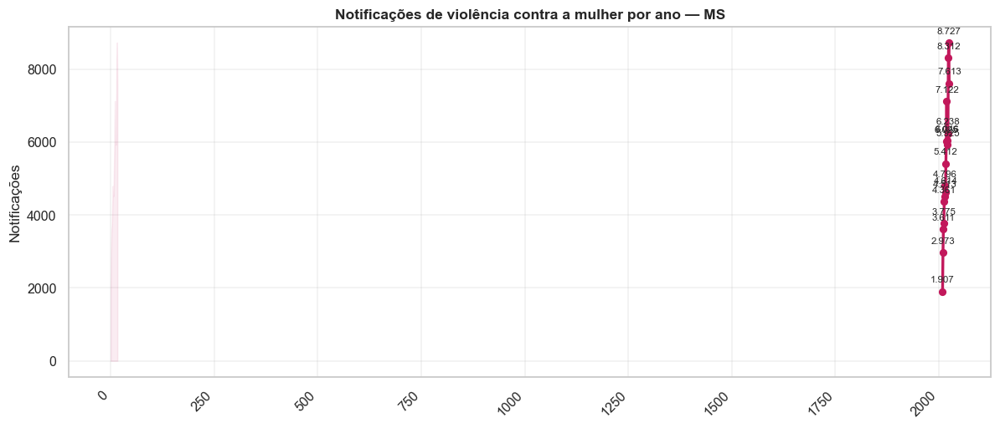


--- Variação anual (%) -----------------------------------------------


,Ano,Notificações,Variação %
0,2009,1907,NaN
1,2010,2973,55.9
2,2011,3611,21.5
3,2012,3775,4.5
4,2013,4361,15.5
5,2014,4796,10.0
6,2015,4513,-5.9
7,2016,4614,2.2
8,2017,5412,17.3
9,2018,6025,11.3



--- Sazonalidade mensal (todos os anos somados) ----------------------


,Mês,Notificações
0,Jan,7456
1,Fev,7302
2,Mar,8131
3,Abr,7316
4,Mai,7113
5,Jun,7000
6,Jul,7226
7,Ago,8180
8,Set,8646
9,Out,8457


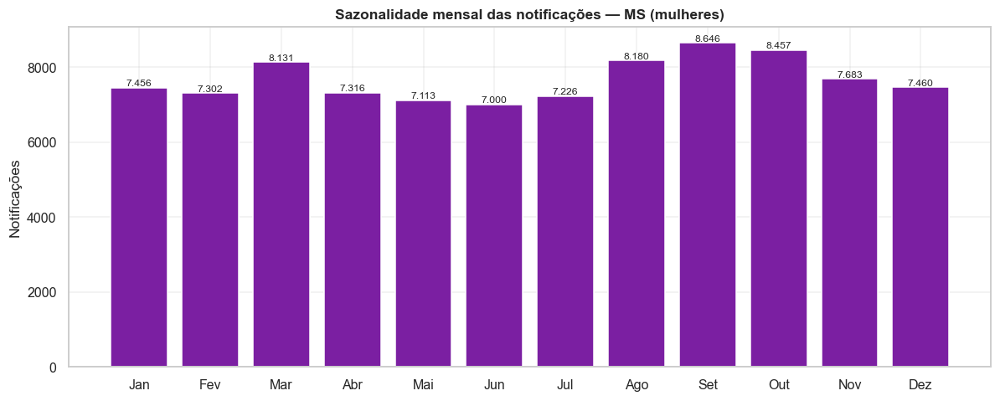


--- Notificações por trimestre ---------------------------------------


,TRIMESTRE,Registros,%
0,3,24052,26.2
1,4,23600,25.7
2,1,22889,24.9
3,2,21429,23.3


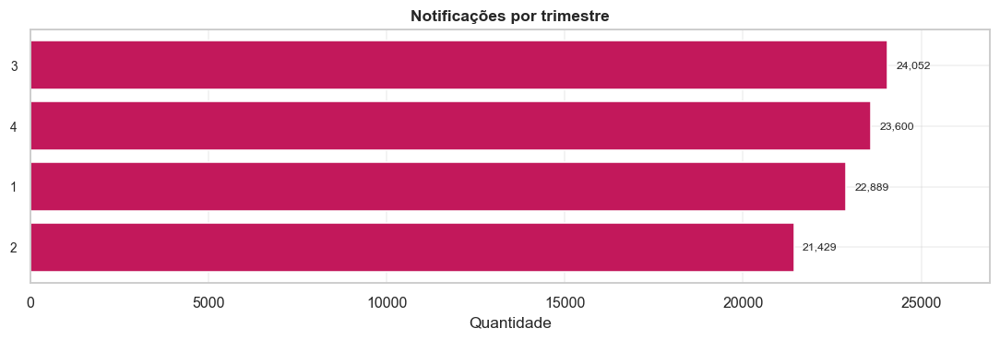


--- Notificações por dia da semana -----------------------------------


,Dia da semana,Notificações
0,Segunda,15134
1,Terça,12790
2,Quarta,12512
3,Quinta,12279
4,Sexta,12043
5,Sábado,12295
6,Domingo,14917


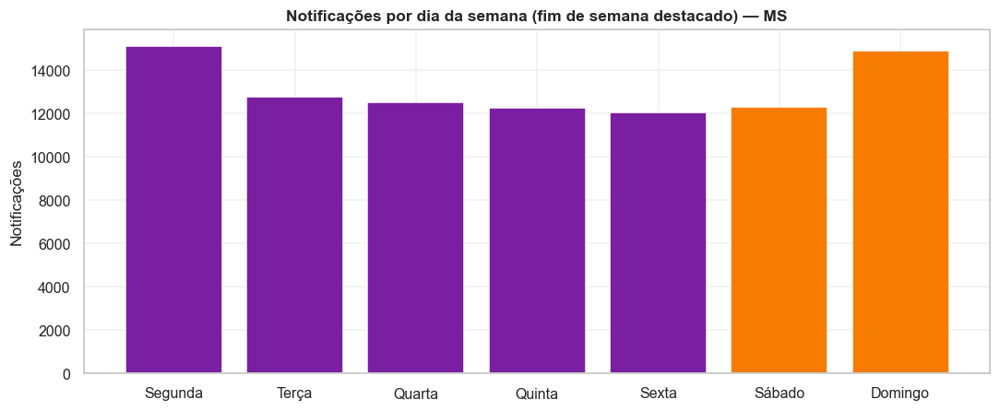

   Parcela de notificações em fins de semana: 29.6%

--- Notificações por período do dia ----------------------------------


,PERIODO_DIA,Registros,%
0,Ignorado,34891,37.9
1,Noite (18-23h),22663,24.6
2,Tarde (12-17h),15306,16.6
3,Manhã (6-11h),11227,12.2
4,Madrugada (0-5h),7883,8.6


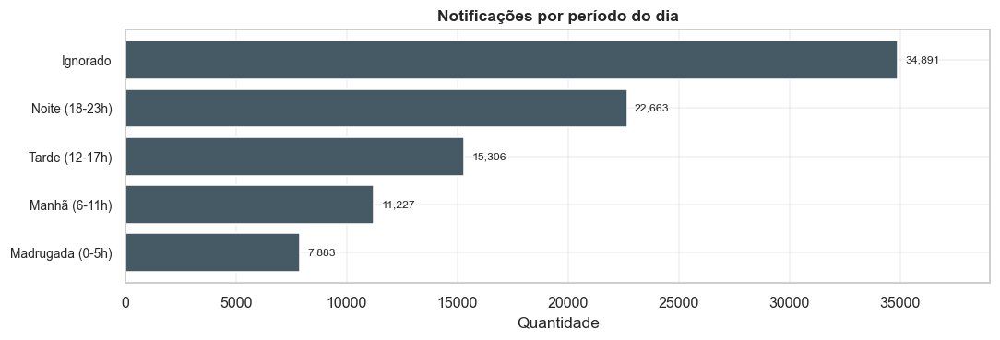

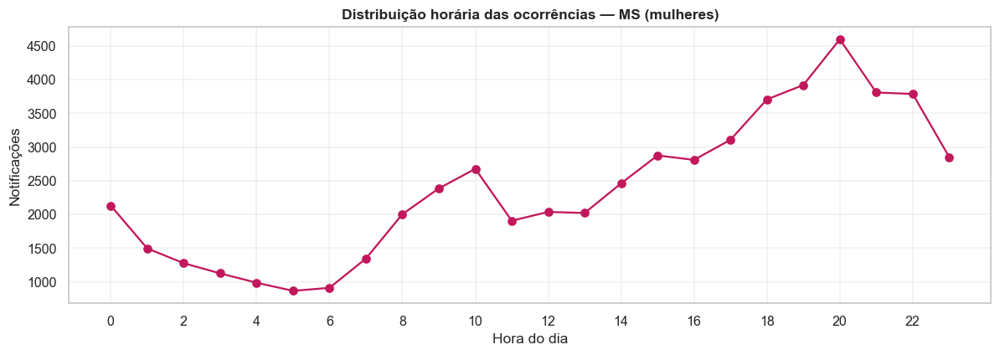


--- Notificações por local de ocorrência -----------------------------


,LOCAL_DESC,Registros,%
0,Residência,66149,71.9
1,Via pública,7536,8.2
2,Outro,5854,6.4
3,Ignorado,5609,6.1
4,Comércio/Serviços,3122,3.4
5,Bar ou similar,1777,1.9
6,Escola,1074,1.2
7,Habitação coletiva,551,0.6
8,Local de prática esportiva,212,0.2
9,Indústria/Construção,86,0.1


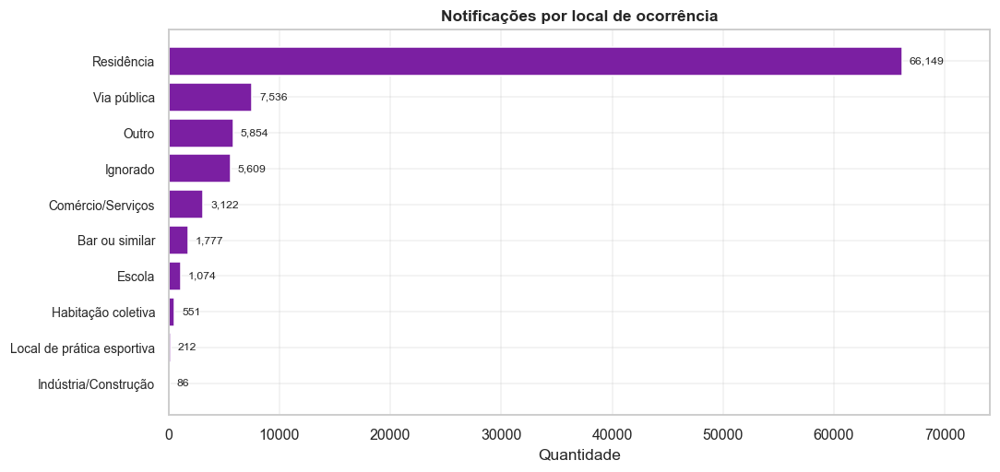

   📝 Relatório salvo: 19_relatorio_ocorrencias.txt
   ✅ Análise de ocorrências concluída.


In [21]:
banner("OCORRÊNCIAS — DISTRIBUIÇÃO TEMPORAL E SITUACIONAL")

# 19.1  Ocorrências por ano
serie_ano = serie_temporal(por="ANO")
show_df(serie_ano.rename_axis("Ano").reset_index(name="Notificações"),
        "Notificações de mulheres por ano", max_linhas=20)
linha_temporal(serie_ano, "Notificações de violência contra a mulher por ano — MS",
               "19_ocorrencias_ano", ylabel="Notificações",
               descricao="Série anual de notificações (mulheres)")

# Variação percentual ano a ano
var_ano = serie_ano.pct_change().mul(100).round(1)
df_var = pd.DataFrame({"Ano": serie_ano.index, "Notificações": serie_ano.values,
                       "Variação %": var_ano.values})
show_df(df_var, "Variação anual (%)", max_linhas=20)
salvar_csv(df_var, "19_variacao_anual", "Variação percentual anual de notificações")

# 19.2  Ocorrências por mês (sazonalidade)
serie_mes = (DF_MULHERES.groupby("MES").size()
             .reindex(range(1, 13)).fillna(0).astype(int))
MESES_NOME = {1: "Jan", 2: "Fev", 3: "Mar", 4: "Abr", 5: "Mai", 6: "Jun",
              7: "Jul", 8: "Ago", 9: "Set", 10: "Out", 11: "Nov", 12: "Dez"}
serie_mes.index = [MESES_NOME[m] for m in serie_mes.index]
show_df(serie_mes.rename_axis("Mês").reset_index(name="Notificações"),
        "Sazonalidade mensal (todos os anos somados)", max_linhas=12)
if plt is not None:
    fig, ax = plt.subplots(figsize=(11, 4.5))
    ax.bar(serie_mes.index, serie_mes.values, color=COR_PRIMARIA, edgecolor="white")
    ax.set_title("Sazonalidade mensal das notificações — MS (mulheres)")
    ax.set_ylabel("Notificações")
    for i, v in enumerate(serie_mes.values):
        ax.text(i, v, formato_numero(v), ha="center", va="bottom", fontsize=8)
    fig.tight_layout()
    salvar_grafico(fig, "19_ocorrencias_mes", "Sazonalidade mensal")

# 19.3  Ocorrências por trimestre
serie_tri = DF_MULHERES.groupby("TRIMESTRE").size()
analisar_dimensao("TRIMESTRE", "Notificações por trimestre", "19_ocorrencias_trimestre",
                  cor=COR_SECUNDARIA, top=4)

# 19.4  Ocorrências por dia da semana
ordem_dias = ["Segunda", "Terça", "Quarta", "Quinta", "Sexta", "Sábado", "Domingo"]
serie_dia = (DF_MULHERES["DIA_SEMANA"].value_counts()
             .reindex(ordem_dias).fillna(0).astype(int))
show_df(serie_dia.rename_axis("Dia da semana").reset_index(name="Notificações"),
        "Notificações por dia da semana", max_linhas=7)
if plt is not None:
    fig, ax = plt.subplots(figsize=(10, 4.2))
    cores_dia = [COR_DESTAQUE if d in ("Sábado", "Domingo") else COR_PRIMARIA
                 for d in serie_dia.index]
    ax.bar(serie_dia.index, serie_dia.values, color=cores_dia, edgecolor="white")
    ax.set_title("Notificações por dia da semana (fim de semana destacado) — MS")
    ax.set_ylabel("Notificações")
    fig.tight_layout()
    salvar_grafico(fig, "19_ocorrencias_dia_semana", "Notificações por dia da semana")
pct_fds = 100 * DF_MULHERES["FIM_SEMANA"].mean()
info("Parcela de notificações em fins de semana: %.1f%%", pct_fds)

# 19.5  Ocorrências por período do dia e hora
analisar_dimensao("PERIODO_DIA", "Notificações por período do dia",
                  "19_ocorrencias_periodo_dia", cor=COR_NEUTRA, top=5)
serie_hora = DF_MULHERES.groupby("HORA").size()
if not serie_hora.empty and plt is not None:
    fig, ax = plt.subplots(figsize=(11, 4))
    ax.plot(serie_hora.index, serie_hora.values, marker="o", color=COR_SECUNDARIA)
    ax.set_title("Distribuição horária das ocorrências — MS (mulheres)")
    ax.set_xlabel("Hora do dia"); ax.set_ylabel("Notificações")
    ax.set_xticks(range(0, 24, 2))
    fig.tight_layout()
    salvar_grafico(fig, "19_ocorrencias_hora", "Distribuição horária")

# 19.6  Ocorrências por local
analisar_dimensao("LOCAL_DESC", "Notificações por local de ocorrência",
                  "19_ocorrencias_local", cor=COR_PRIMARIA, top=10)

# 19.7  Relatório temático de ocorrências
rel_oc = RelatorioTexto("Relatório de Ocorrências (Notificações)")
rel_oc.texto(f"Total de notificações de mulheres: {len(DF_MULHERES):,}")
rel_oc.secao("Notificações por ano")
rel_oc.tabela_df(serie_ano.rename_axis("Ano").reset_index(name="Notificações"))
rel_oc.secao("Sazonalidade mensal")
rel_oc.tabela_df(serie_mes.rename_axis("Mes").reset_index(name="Notificacoes"))
rel_oc.secao("Por dia da semana")
rel_oc.tabela_df(serie_dia.rename_axis("Dia").reset_index(name="Notificacoes"))
rel_oc.secao("Indicadores")
rel_oc.kv({
    "Ano de pico": int(serie_ano.idxmax()) if len(serie_ano) else "-",
    "Notificações no pico": formato_numero(int(serie_ano.max())) if len(serie_ano) else "-",
    "% em fins de semana": f"{pct_fds:.1f}%",
    "Mês com mais notificações": serie_mes.idxmax() if len(serie_mes) else "-",
})
rel_oc.salvar(DIRS["relatorios"] / "19_relatorio_ocorrencias.txt")
sucesso("Análise de ocorrências concluída.")

============================================================
## SEÇÃO 20 — Análise exploratória: PERFIL DAS VÍTIMAS
============================================================

Perfil sociodemográfico das mulheres vítimas: faixa etária (pirâmide), idade, raça/cor,
escolaridade, situação conjugal, ciclo de vida e gestação. Todas as saídas respeitam a
LGPD (apenas agregados).


[11] PERFIL DAS VÍTIMAS (MULHERES)


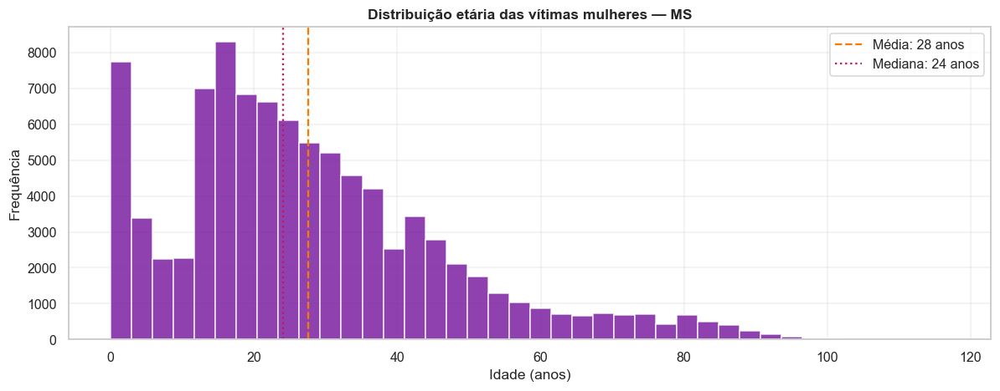


--- Vítimas por faixa etária -----------------------------------------


,FAIXA_ETARIA,Registros,%
0,0-11,15638,17.0
1,30-39,15322,16.7
2,12-17,15294,16.7
3,20-24,11061,12.0
4,40-49,9506,10.4
5,25-29,9453,10.3
6,60+,6681,7.3
7,18-19,4508,4.9
8,50-59,4347,4.7


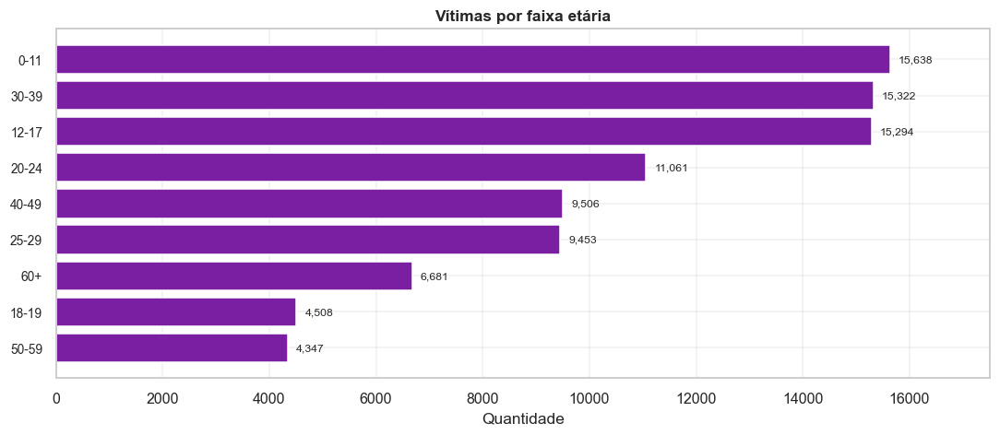

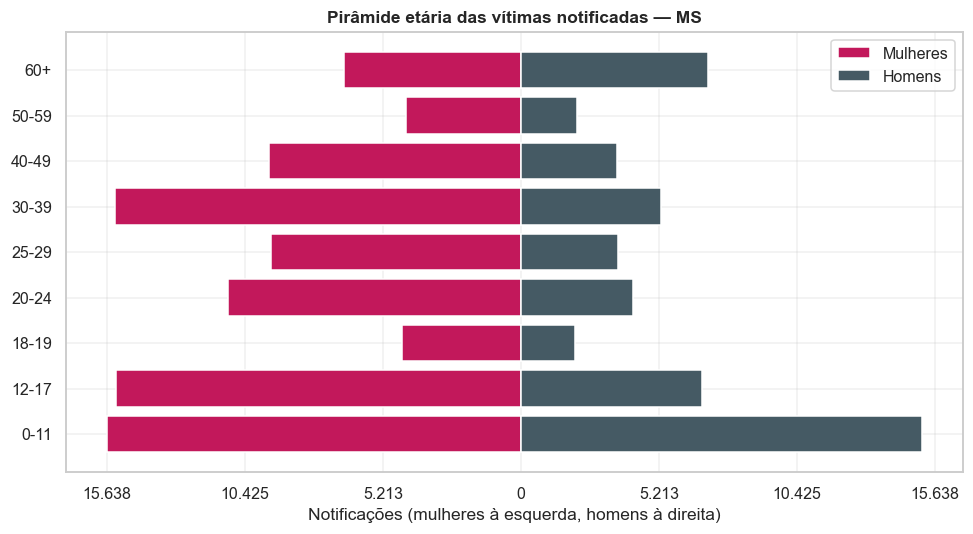


--- Vítimas por raça/cor ---------------------------------------------


,RACA_COR,Registros,%
0,Parda,41631,45.3
1,Branca,31157,33.9
2,Ignorado,6830,7.4
3,Indígena,6113,6.6
4,Preta,4941,5.4
5,Amarela,1298,1.4


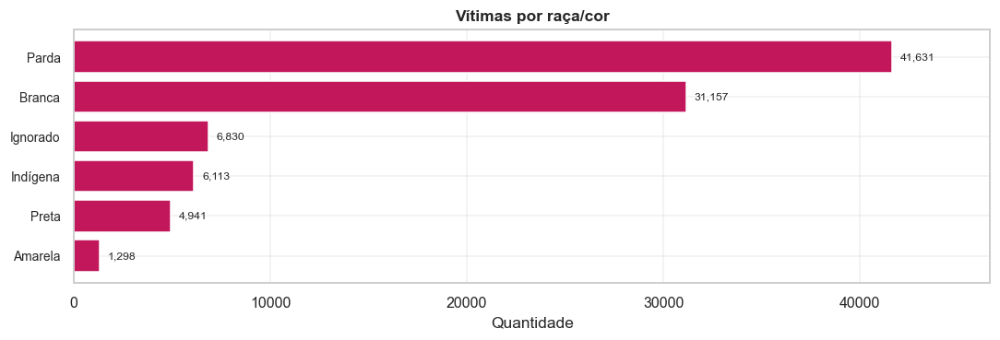


--- Vítimas por escolaridade -----------------------------------------


,ESCOLARIDADE,Registros,%
0,Ignorado,27607,30.0
1,5ª a 8ª série incompleta do EF,15337,16.7
2,Não se aplica,12149,13.2
3,Ensino médio completo,8220,8.9
4,Ensino médio incompleto,7905,8.6
5,1ª a 4ª série incompleta do EF,6506,7.1
6,Ensino fundamental completo,5505,6.0
7,4ª série completa do EF,3727,4.1
8,Educação superior incompleta,2211,2.4
9,Educação superior completa,1916,2.1


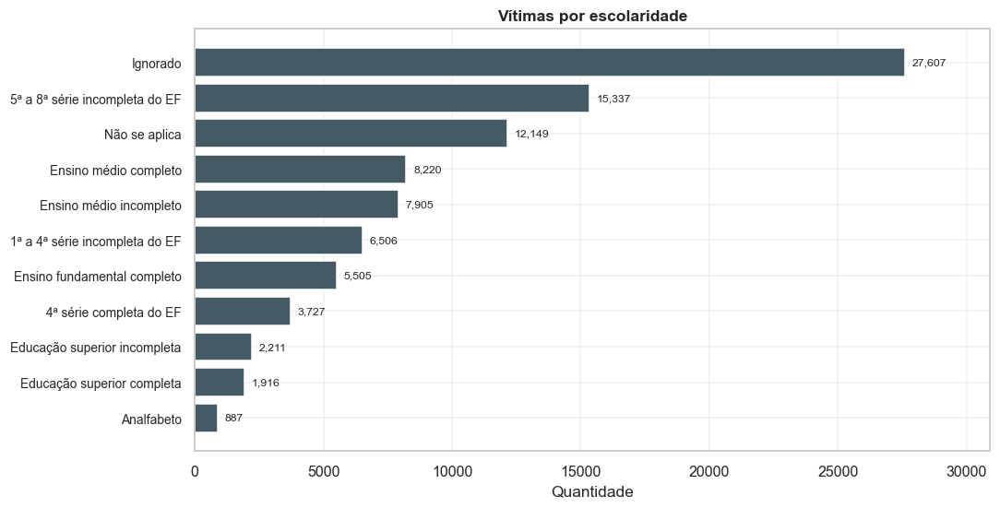


--- Vítimas por situação conjugal ------------------------------------


,SIT_CONJUGAL_DESC,Registros,%
0,Solteiro(a),31454,34.2
1,Ignorado,27517,29.9
2,Casado(a)/União consensual,25714,28.0
3,Separado(a)/Divorciado(a),4943,5.4
4,Viúvo(a),2342,2.5


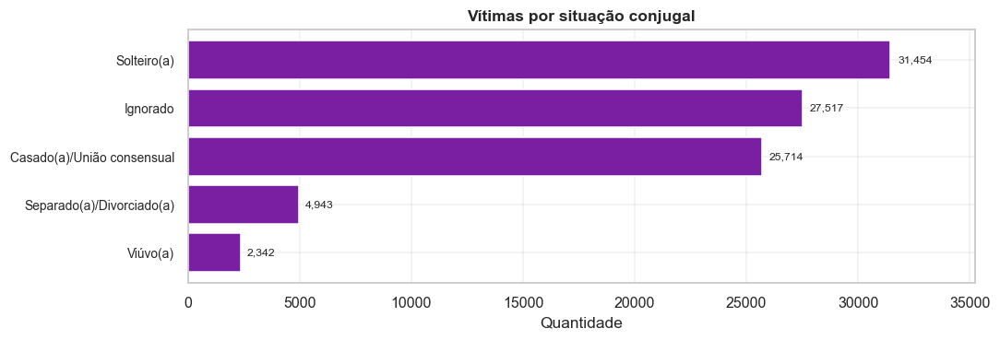


--- Vítimas por ciclo de vida ----------------------------------------


,CICLO_VIDA_DESC,Registros,%
0,Pessoa adulta (25-59),36395,39.6
1,Ignorado,33983,37.0
2,Jovem (20-24),10203,11.1
3,Adolescente (10-19),9139,9.9
4,Pessoa idosa (60+),1385,1.5
5,Criança (0-9),865,0.9


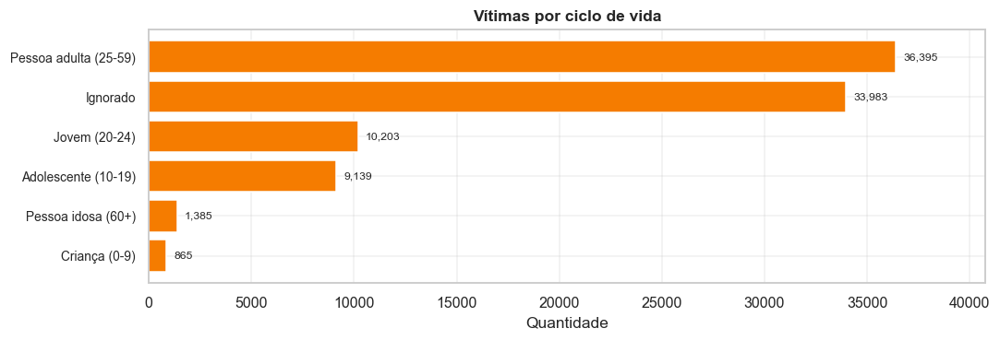

   📝 Relatório salvo: 20_relatorio_vitimas.txt
   ✅ Análise de perfil das vítimas concluída.


In [22]:
banner("PERFIL DAS VÍTIMAS (MULHERES)")

# 20.1  Distribuição etária (histograma)
if plt is not None and DF_MULHERES["IDADE"].notna().any():
    fig, ax = plt.subplots(figsize=(11, 4.4))
    ax.hist(DF_MULHERES["IDADE"].dropna(), bins=40, color=COR_PRIMARIA,
            edgecolor="white", alpha=0.85)
    ax.axvline(DF_MULHERES["IDADE"].mean(), color=COR_DESTAQUE, linestyle="--",
               label=f"Média: {DF_MULHERES['IDADE'].mean():.0f} anos")
    ax.axvline(DF_MULHERES["IDADE"].median(), color=COR_SECUNDARIA, linestyle=":",
               label=f"Mediana: {DF_MULHERES['IDADE'].median():.0f} anos")
    ax.set_title("Distribuição etária das vítimas mulheres — MS")
    ax.set_xlabel("Idade (anos)"); ax.set_ylabel("Frequência"); ax.legend()
    fig.tight_layout()
    salvar_grafico(fig, "20_distribuicao_idade", "Histograma de idade das vítimas")

# 20.2  Faixa etária
analisar_dimensao("FAIXA_ETARIA", "Vítimas por faixa etária", "20_faixa_etaria",
                  cor=COR_PRIMARIA, top=12)

# 20.3  Pirâmide etária comparativa (mulheres × homens)
if plt is not None:
    faixas = FAIXA_LABELS
    fem = (df[df["FL_FEMININO"] == 1]["FAIXA_ETARIA"].value_counts()
           .reindex(faixas).fillna(0))
    masc = (df[df["FL_FEMININO"] == 0]["FAIXA_ETARIA"].value_counts()
            .reindex(faixas).fillna(0))
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.barh(faixas, -fem.values, color=COR_SECUNDARIA, label="Mulheres")
    ax.barh(faixas, masc.values, color=COR_NEUTRA, label="Homens")
    ax.set_title("Pirâmide etária das vítimas notificadas — MS")
    ax.set_xlabel("Notificações (mulheres à esquerda, homens à direita)")
    vmax = max(fem.max(), masc.max())
    ax.set_xticks(np.linspace(-vmax, vmax, 7))
    ax.set_xticklabels([formato_numero(abs(x)) for x in np.linspace(-vmax, vmax, 7)])
    ax.legend()
    fig.tight_layout()
    salvar_grafico(fig, "20_piramide_etaria", "Pirâmide etária por sexo")

# 20.4  Raça/cor, escolaridade, situação conjugal, ciclo de vida
analisar_dimensao("RACA_COR", "Vítimas por raça/cor", "20_raca_cor",
                  cor=COR_SECUNDARIA, top=8)
analisar_dimensao("ESCOLARIDADE", "Vítimas por escolaridade", "20_escolaridade",
                  cor=COR_NEUTRA, top=12)
analisar_dimensao("SIT_CONJUGAL_DESC", "Vítimas por situação conjugal",
                  "20_situacao_conjugal", cor=COR_PRIMARIA, top=6)
analisar_dimensao("CICLO_VIDA_DESC", "Vítimas por ciclo de vida",
                  "20_ciclo_vida", cor=COR_DESTAQUE, top=8)

# 20.5  Relatório temático de vítimas
rel_v = RelatorioTexto("Relatório de Perfil das Vítimas")
rel_v.secao("Indicadores demográficos")
rel_v.kv({
    "Total de vítimas mulheres": formato_numero(len(DF_MULHERES)),
    "Idade média": f"{DF_MULHERES['IDADE'].mean():.1f} anos",
    "Idade mediana": f"{DF_MULHERES['IDADE'].median():.1f} anos",
    "Faixa etária predominante": (DF_MULHERES["FAIXA_ETARIA"].value_counts().idxmax()
                                  if DF_MULHERES["FAIXA_ETARIA"].notna().any() else "-"),
    "Raça/cor predominante": DF_MULHERES["RACA_COR"].value_counts().idxmax(),
})
rel_v.secao("Distribuição por faixa etária")
rel_v.tabela_df(DF_MULHERES["FAIXA_ETARIA"].value_counts().sort_index()
                .rename_axis("Faixa").reset_index(name="Vitimas"))
rel_v.secao("Distribuição por raça/cor")
rel_v.tabela_df(DF_MULHERES["RACA_COR"].value_counts()
                .rename_axis("RacaCor").reset_index(name="Vitimas"))
rel_v.salvar(DIRS["relatorios"] / "20_relatorio_vitimas.txt")
sucesso("Análise de perfil das vítimas concluída.")

============================================================
## SEÇÃO 21 — AUTORES e relação AUTOR-VÍTIMA
============================================================

Análise do perfil do autor (sexo, uso de álcool) e, sobretudo, do **vínculo autor-vítima**
— central para compreender a violência doméstica, familiar e por parceiro íntimo. Inclui
a matriz **tipo de violência × vínculo**.


[12] AUTORES E RELAÇÃO AUTOR-VÍTIMA

--- Sexo do provável autor -------------------------------------------


,AUTOR_SEXO_DESC,Registros,%
0,Masculino,40058,43.6
1,Feminino,34989,38.0
2,Ambos os sexos,11119,12.1
3,Ignorado,5804,6.3


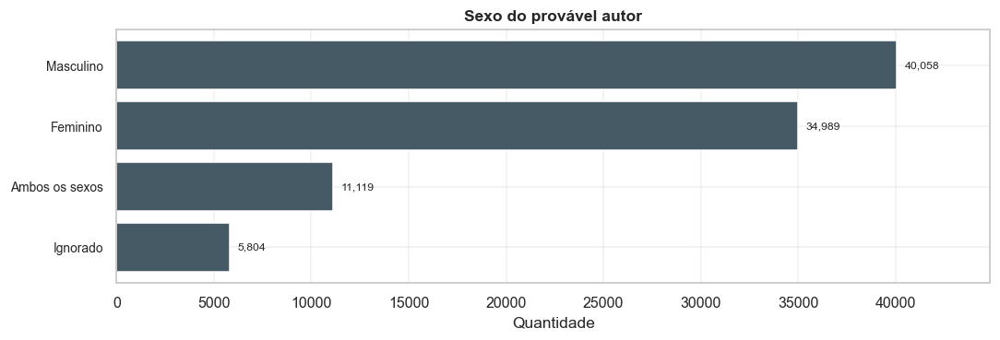


--- Suspeita de uso de álcool pelo autor -----------------------------


,AUTOR_ALCOOL_DESC,Registros,%
0,Não,38419,41.8
1,Sim,28168,30.6
2,Ignorado,25383,27.6


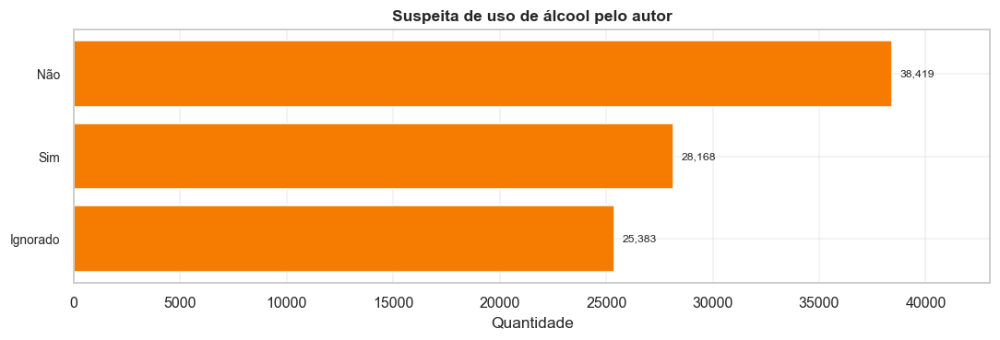


--- Vínculo do autor com a vítima ------------------------------------


,VINCULO_AUTOR,Registros,%
0,Própria pessoa,21650,23.7
1,Cônjuge,16436,18.0
2,Pai,9142,10.0
3,Mãe,6450,7.1
4,Conhecido(a),6000,6.6
5,Outro vínculo,4989,5.5
6,Filho(a),4909,5.4
7,Não informado,4909,5.4
8,Desconhecido(a),4904,5.4
9,Ex-cônjuge,4896,5.4


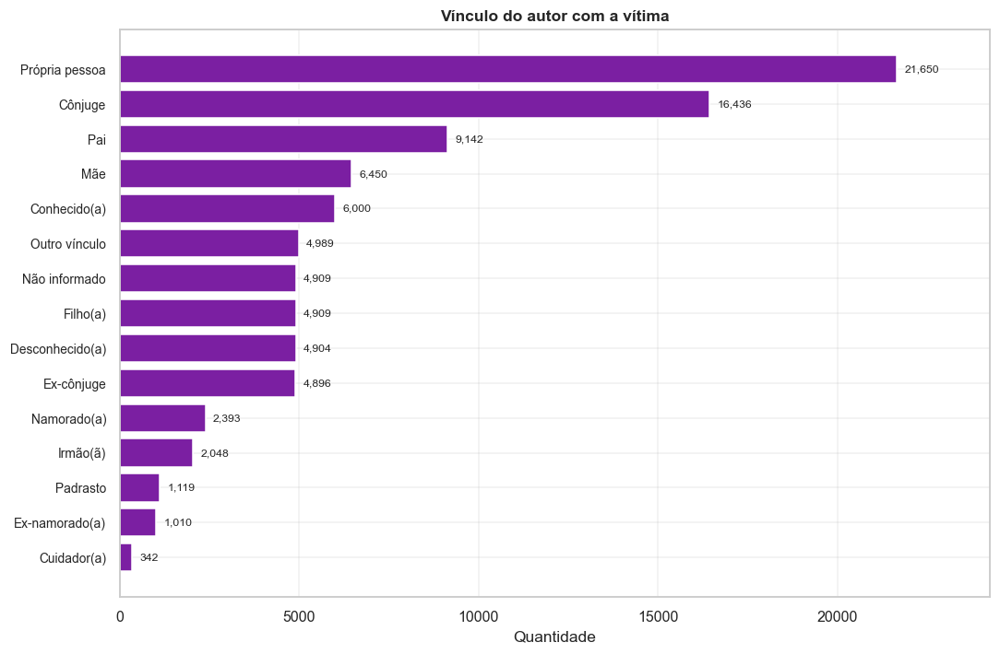


--- Categoria de vínculo autor-vítima --------------------------------


,CATEGORIA_VINCULO,Registros,%
0,Outro/Não informado,32569,35.4
1,Parceiro(a) íntimo(a),24735,26.9
2,Familiar,23762,25.8
3,Conhecido(a),6122,6.7
4,Desconhecido(a),4782,5.2


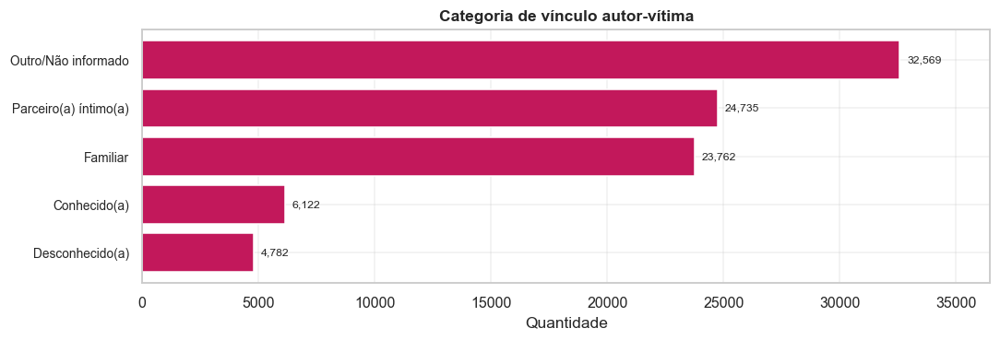


--- Frequência por vínculo específico (vítimas mulheres) -------------


,Vínculo,Notificações
0,Própria pessoa,22336
1,Cônjuge,16436
2,Mãe,13772
3,Pai,9341
4,Outro vínculo,6647
5,Conhecido(a),6590
6,Filho(a),5179
7,Desconhecido(a),5053
8,Ex-cônjuge,4944
9,Irmão(ã),2522


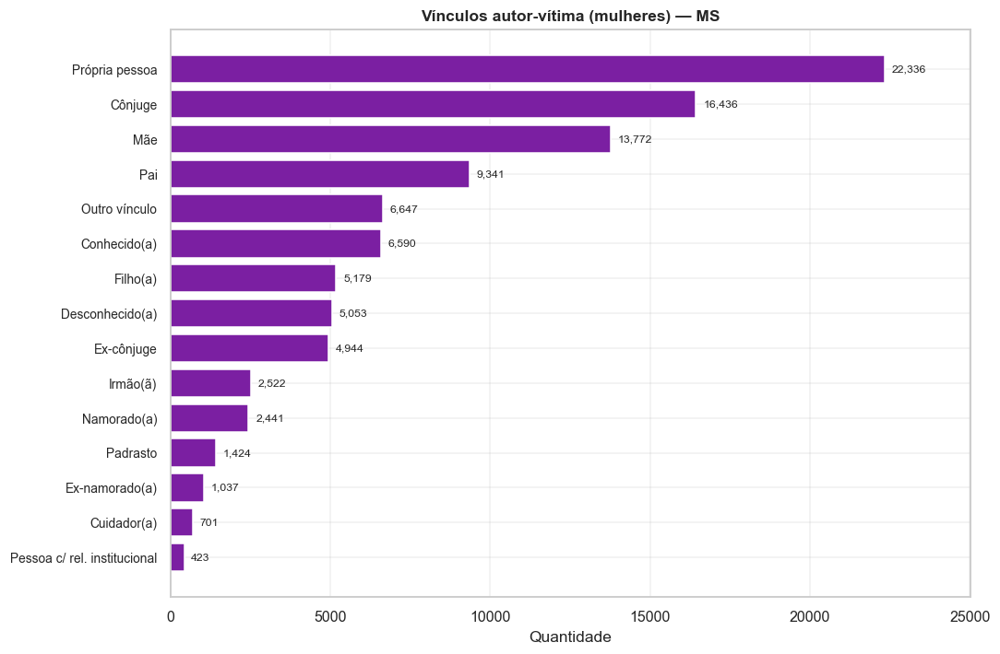


--- Matriz tipo de violência × vínculo -------------------------------


,Tipo,Parceiro(a) íntimo(a),Familiar,Conhecido(a),Desconhecido(a),Outro/Não informado
0,Física,21379,5909,4568,3482,10010
1,Psicológica,8318,2465,1165,828,2456
2,Sexual,1328,1616,1563,1615,2040
3,Ameaça,4856,1424,836,749,1048
4,Estupro,1036,1059,1182,1358,1311


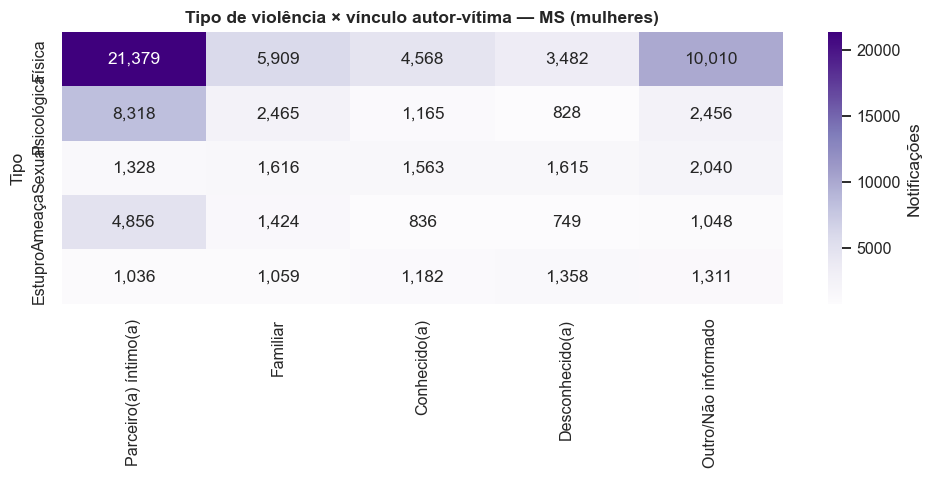

   📝 Relatório salvo: 21_relatorio_autores.txt
   ✅ Análise de autores e vínculos concluída.


In [23]:
banner("AUTORES E RELAÇÃO AUTOR-VÍTIMA")

# 21.1  Sexo do autor
analisar_dimensao("AUTOR_SEXO_DESC", "Sexo do provável autor", "21_autor_sexo",
                  cor=COR_NEUTRA, top=5)
# 21.2  Uso de álcool pelo autor
analisar_dimensao("AUTOR_ALCOOL_DESC", "Suspeita de uso de álcool pelo autor",
                  "21_autor_alcool", cor=COR_DESTAQUE, top=4)
# 21.3  Vínculo dominante autor-vítima
analisar_dimensao("VINCULO_AUTOR", "Vínculo do autor com a vítima",
                  "21_vinculo_autor", cor=COR_PRIMARIA, top=15)
# 21.4  Categoria de vínculo
analisar_dimensao("CATEGORIA_VINCULO", "Categoria de vínculo autor-vítima",
                  "21_categoria_vinculo", cor=COR_SECUNDARIA, top=6)

# 21.5  Frequência de cada vínculo específico (todas as flags REL_*)
freq_rel = {MAP_RELACAO[c]: int(DF_MULHERES[f"FL_{c}"].sum()) for c in COLS_RELACAO}
serie_rel = pd.Series(freq_rel).sort_values(ascending=False)
show_df(serie_rel.rename_axis("Vínculo").reset_index(name="Notificações"),
        "Frequência por vínculo específico (vítimas mulheres)", max_linhas=18)
barras_horizontais(serie_rel, "Vínculos autor-vítima (mulheres) — MS",
                   "21_vinculos_frequencia", top=15, cor=COR_PRIMARIA,
                   descricao="Frequência de cada vínculo")
salvar_csv(serie_rel.rename_axis("Vinculo").reset_index(name="Notificacoes"),
           "21_vinculos_frequencia", "Frequência por vínculo autor-vítima")

# 21.6  Matriz tipo de violência × categoria de vínculo
tipos_para_matriz = ["FL_VIOL_FISIC", "FL_VIOL_PSICOLOGICA", "FL_VIOL_SEXUAL",
                     "FL_AMEACA", "FL_ESTUPRO"]
rotulos_tipos = ["Física", "Psicológica", "Sexual", "Ameaça", "Estupro"]
matriz = []
for flag, rot in zip(tipos_para_matriz, rotulos_tipos):
    linha = {"Tipo": rot}
    for cat in ["Parceiro(a) íntimo(a)", "Familiar", "Conhecido(a)",
                "Desconhecido(a)", "Outro/Não informado"]:
        sub = DF_MULHERES[DF_MULHERES["CATEGORIA_VINCULO"] == cat]
        linha[cat] = int(sub[flag].sum()) if flag in sub.columns else 0
    matriz.append(linha)
df_matriz = pd.DataFrame(matriz).set_index("Tipo")
show_df(df_matriz.reset_index(), "Matriz tipo de violência × vínculo", max_linhas=10)
salvar_csv(df_matriz.reset_index(), "21_matriz_tipo_vinculo",
           "Matriz tipo de violência × categoria de vínculo")
registrar_planilha("Matriz_Tipo_Vinculo", df_matriz.reset_index())

# Heatmap da matriz
if plt is not None and sns is not None:
    fig, ax = plt.subplots(figsize=(9, 4.5))
    sns.heatmap(df_matriz, annot=True, fmt=",d", cmap="Purples", ax=ax,
                cbar_kws={"label": "Notificações"})
    ax.set_title("Tipo de violência × vínculo autor-vítima — MS (mulheres)")
    fig.tight_layout()
    salvar_grafico(fig, "21_heatmap_tipo_vinculo", "Heatmap tipo × vínculo")

# 21.7  Relatório de autores
rel_a = RelatorioTexto("Relatório de Autores e Relação Autor-Vítima")
rel_a.secao("Vínculo autor-vítima (top 12)")
rel_a.tabela_df(serie_rel.head(12).rename_axis("Vinculo").reset_index(name="Notificacoes"))
rel_a.secao("Matriz tipo de violência × categoria de vínculo")
rel_a.tabela_df(df_matriz.reset_index())
rel_a.secao("Indicadores")
rel_a.kv({
    "Vínculo mais frequente": serie_rel.idxmax() if len(serie_rel) else "-",
    "% por parceiro íntimo": f"{100 * DF_MULHERES['FL_PARCEIRO_INTIMO'].mean():.1f}%",
    "% por familiar": f"{100 * DF_MULHERES['FL_FAMILIAR'].mean():.1f}%",
    "% autor masculino": f"{100 * (DF_MULHERES['AUTOR_SEXO_DESC'] == 'Masculino').mean():.1f}%",
})
rel_a.salvar(DIRS["relatorios"] / "21_relatorio_autores.txt")
sucesso("Análise de autores e vínculos concluída.")

============================================================
## SEÇÃO 22 — Panorama dos TIPOS DE VIOLÊNCIA
============================================================

Visão consolidada de todos os tipos de violência e meios de agressão notificados,
com sobreposições (violência múltipla) e evolução temporal por tipo.


[13] PANORAMA DOS TIPOS DE VIOLÊNCIA

--- Frequência por tipo de violência (mulheres) ----------------------


,Tipo de violência,Notificações
0,Física,45348
1,Negligência/Abandono,19389
2,Outra,17771
3,Psicológica/Moral,15232
4,Sexual,8158
5,Tortura,1712
6,Financeira/Econômica,790
7,Intervenção legal,124
8,Trabalho infantil,92
9,Tráfico de seres humanos,45


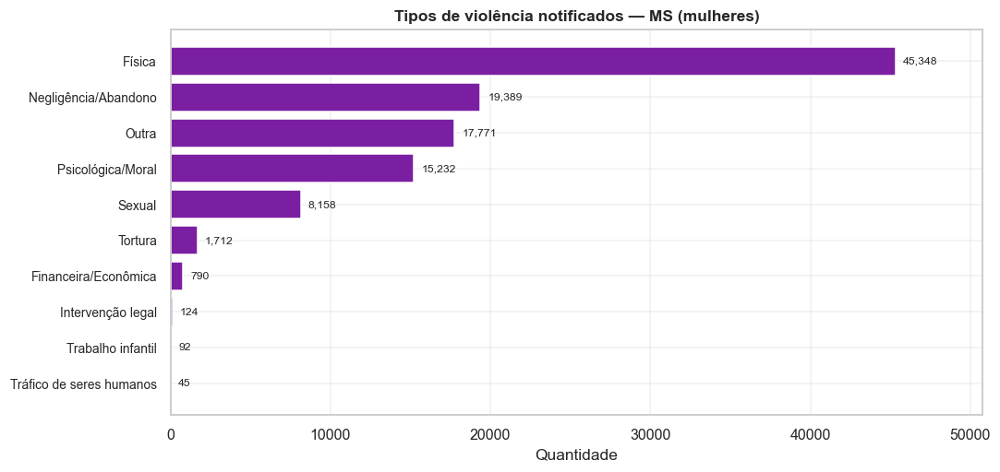

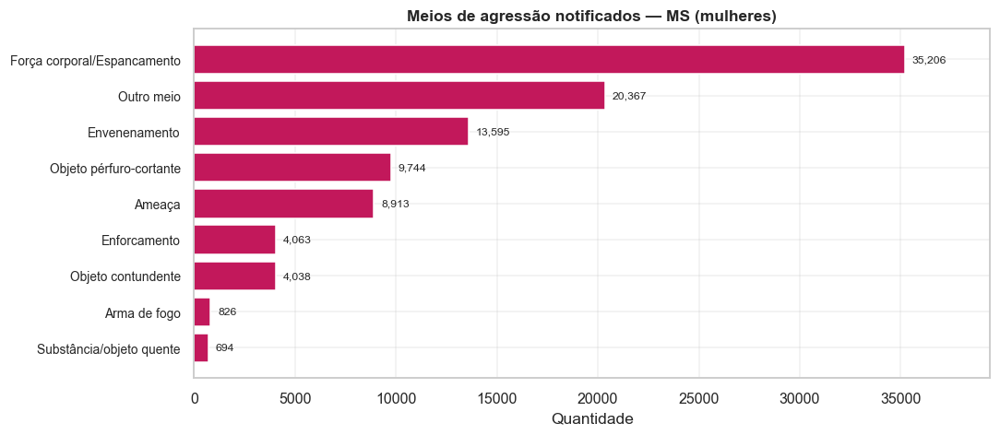


--- Frequência por meio de agressão ----------------------------------


,Meio de agressão,Notificações
0,Força corporal/Espancamento,35206
1,Outro meio,20367
2,Envenenamento,13595
3,Objeto pérfuro-cortante,9744
4,Ameaça,8913
5,Enforcamento,4063
6,Objeto contundente,4038
7,Arma de fogo,826
8,Substância/objeto quente,694



--- Sobreposição de tipos de violência -------------------------------


,Nº de tipos simultâneos,Registros
0,0,2120
1,1,74581
2,2,12418
3,3,2281
4,4,474
5,5,80
6,6,10
7,7,4
8,8,1
9,9,1


   Registros com violência múltipla (≥2 tipos): 15.269 (16.6%)


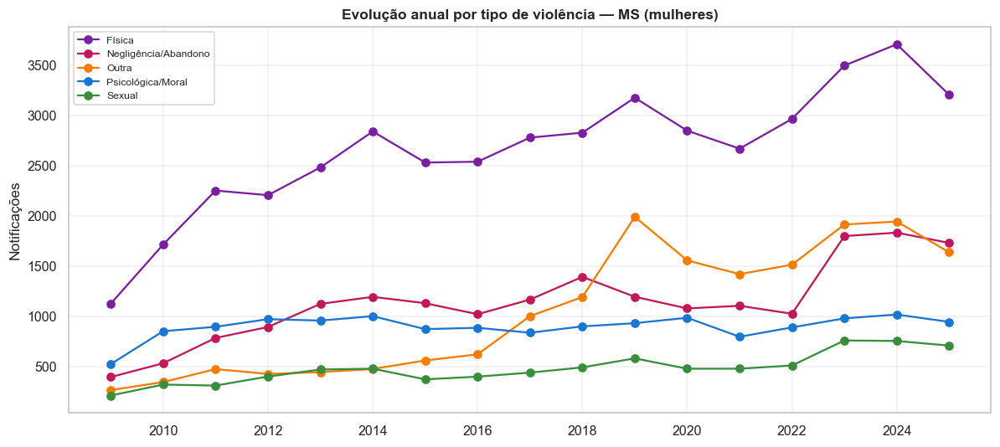

   ✅ Panorama dos tipos de violência concluído.


In [24]:
banner("PANORAMA DOS TIPOS DE VIOLÊNCIA")

# 22.1  Frequência por tipo de violência
freq_viol = {MAP_VIOL[c]: int(DF_MULHERES[f"FL_{c}"].sum()) for c in COLS_VIOL}
serie_viol = pd.Series(freq_viol).sort_values(ascending=False)
show_df(serie_viol.rename_axis("Tipo de violência").reset_index(name="Notificações"),
        "Frequência por tipo de violência (mulheres)", max_linhas=12)
barras_horizontais(serie_viol, "Tipos de violência notificados — MS (mulheres)",
                   "22_tipos_violencia", cor=COR_PRIMARIA, descricao="Tipos de violência")
salvar_csv(serie_viol.rename_axis("Tipo").reset_index(name="Notificacoes"),
           "22_tipos_violencia", "Frequência por tipo de violência")

# 22.2  Frequência por meio de agressão
freq_ag = {MAP_AGRESSAO[c]: int(DF_MULHERES[f"FL_{c}"].sum()) for c in COLS_AGRESSAO}
serie_ag = pd.Series(freq_ag).sort_values(ascending=False)
barras_horizontais(serie_ag, "Meios de agressão notificados — MS (mulheres)",
                   "22_meios_agressao", cor=COR_SECUNDARIA, descricao="Meios de agressão")
salvar_csv(serie_ag.rename_axis("Meio").reset_index(name="Notificacoes"),
           "22_meios_agressao", "Frequência por meio de agressão")
show_df(serie_ag.rename_axis("Meio de agressão").reset_index(name="Notificações"),
        "Frequência por meio de agressão", max_linhas=10)

# 22.3  Violência múltipla (sobreposição de tipos)
dist_mult = DF_MULHERES["N_TIPOS_VIOLENCIA"].value_counts().sort_index()
show_df(dist_mult.rename_axis("Nº de tipos simultâneos").reset_index(name="Registros"),
        "Sobreposição de tipos de violência", max_linhas=12)
info("Registros com violência múltipla (≥2 tipos): %s (%.1f%%)",
     formato_numero(int(DF_MULHERES["VIOLENCIA_MULTIPLA"].sum())),
     100 * DF_MULHERES["VIOLENCIA_MULTIPLA"].mean())

# 22.4  Evolução temporal por tipo de violência (principais)
top_tipos = serie_viol.head(5).index.tolist()
mapa_rotulo_flag = {MAP_VIOL[c]: f"FL_{c}" for c in COLS_VIOL}
if plt is not None:
    fig, ax = plt.subplots(figsize=(11, 5))
    for i, rot in enumerate(top_tipos):
        flag = mapa_rotulo_flag[rot]
        s = DF_MULHERES[DF_MULHERES[flag] == 1].groupby("ANO").size()
        ax.plot(s.index, s.values, marker="o", label=rot,
                color=PALETA_SIPREV[i % len(PALETA_SIPREV)])
    ax.set_title("Evolução anual por tipo de violência — MS (mulheres)")
    ax.set_ylabel("Notificações"); ax.legend(fontsize=8)
    fig.tight_layout()
    salvar_grafico(fig, "22_evolucao_tipos", "Evolução anual por tipo")

sucesso("Panorama dos tipos de violência concluído.")

============================================================
## SEÇÃO 23 — Motor de análise temática + FEMINICÍDIO
============================================================

Para os eixos temáticos (feminicídio, estupro, violência doméstica, ameaça, lesão),
usamos um **motor reutilizável** (`analise_tematica`) que, para uma dada flag, produz:
série anual, ranking municipal (absoluto e por 100 mil mulheres), perfil etário,
perfil de raça/cor, vínculo autor-vítima, gráficos, tabelas, CSV/XLSX e um relatório
Texttable. O **feminicídio** é o eixo central e recebe tratamento adicional (PDF próprio).


[14] EIXO TEMÁTICO — FEMINICÍDIO (PROXY)
   Total de notificações (Feminicídio (proxy)): 83


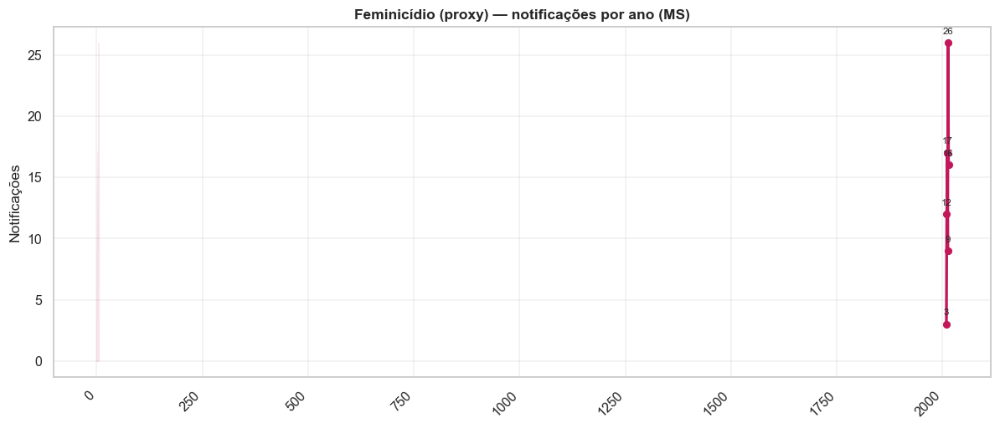


--- Feminicídio (proxy): por ano -------------------------------------


,Ano,Notificações
0,2009,3
1,2010,12
2,2011,17
3,2012,9
4,2013,26
5,2014,16



--- Feminicídio (proxy): ranking municipal (absoluto, top 15) --------


,Posicao,Municipio,N
0,1,Campo Grande,29
1,2,Três Lagoas,16
2,3,Corumbá,10
3,4,Tacuru,5
4,5,Caarapó,3
5,6,Dourados,3
6,7,Antônio João,3
7,8,Paranhos,3
8,9,Rio Verde de Mato Grosso,3
9,10,Sidrolândia,2


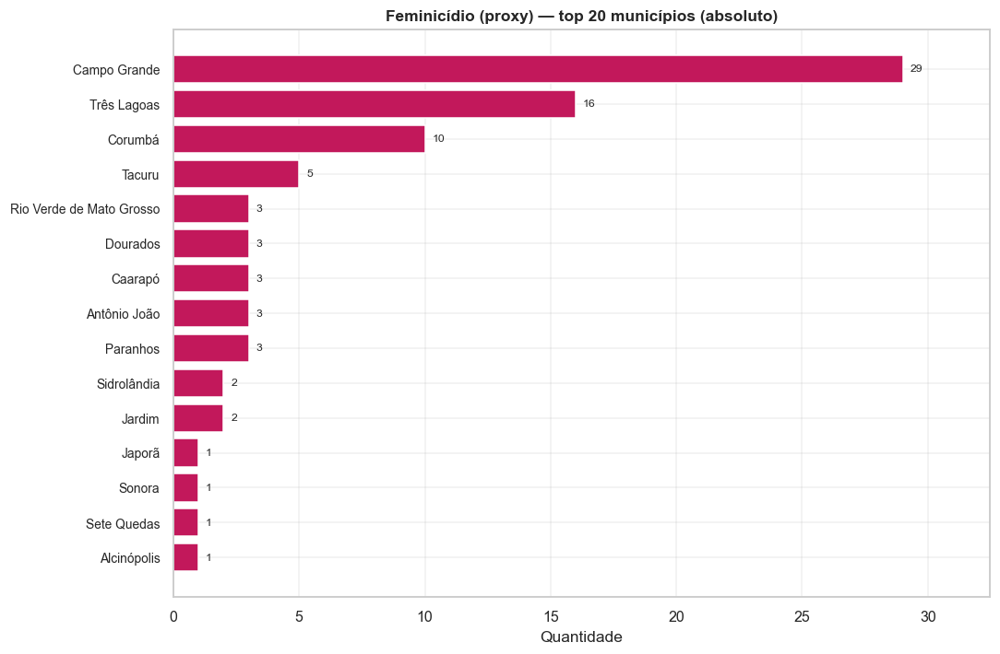


--- Feminicídio (proxy): ranking por taxa/100 mil mulheres (top 15) --


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Tacuru,5,5441,91.89
1,2,Três Lagoas,16,66525,24.05
2,3,Corumbá,10,48461,20.64
3,4,Campo Grande,29,452104,6.41


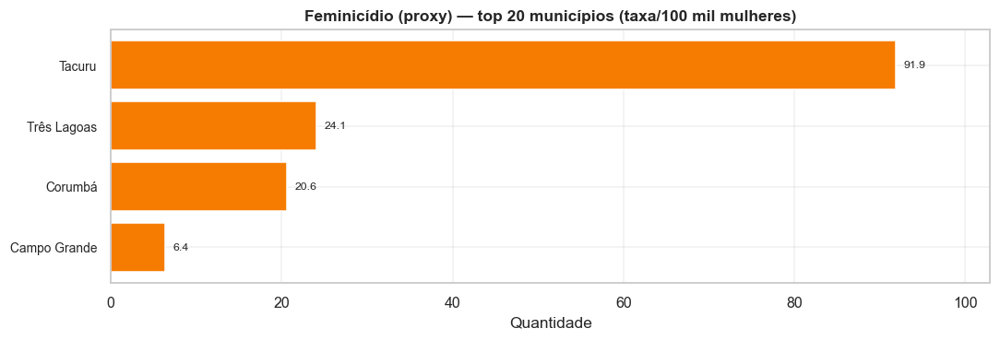

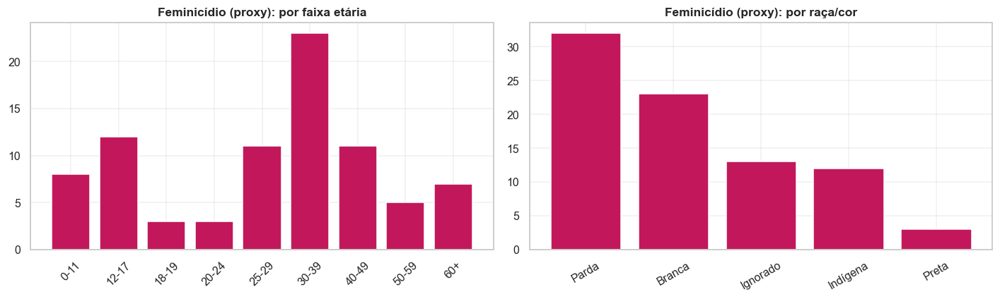

   📝 Relatório salvo: 23_feminicidio_relatorio.txt
   ✅ Eixo 'Feminicídio (proxy)' concluído.


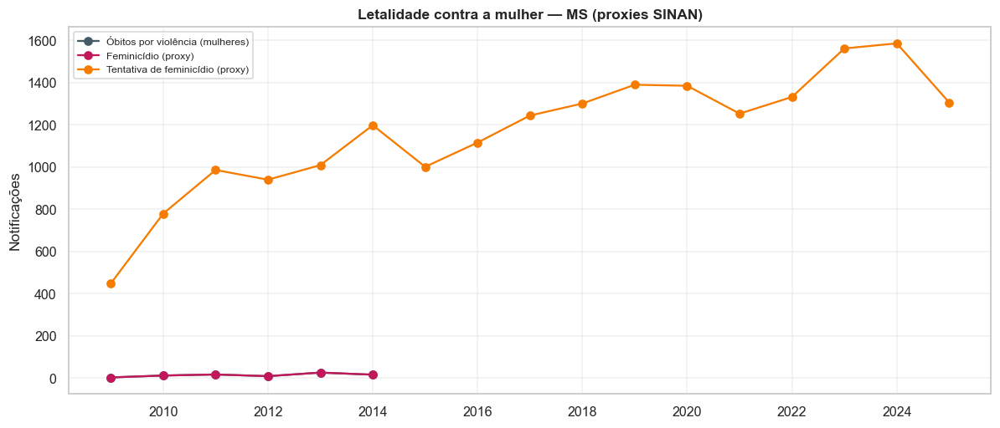

   Taxa de feminicídio (proxy) em MS: 5.98 por 100 mil mulheres (acumulado)


WindowsPath('saidas_SIPREV/SIPREV_Mulher_MS_20260621_173336/09_json/23_feminicidio_taxa_estadual.json')

In [25]:
def analise_tematica(flag: str, tema: str, prefixo: str,
                     cor: str = None, gerar_relatorio: bool = True) -> dict:
    """Executa a análise completa de um eixo temático identificado por `flag`.

    Retorna um dicionário com os principais resultados (séries e rankings), além de
    exibir tudo inline e exportar gráficos/tabelas/relatório.
    """
    cor = cor or COR_PRIMARIA
    banner(f"EIXO TEMÁTICO — {tema.upper()}")
    base = DF_MULHERES[DF_MULHERES[flag] == 1].copy()
    total = len(base)
    info("Total de notificações (%s): %s", tema, formato_numero(total))
    resultados = {"tema": tema, "flag": flag, "total": total}
    if total == 0:
        aviso("Sem registros para o eixo '%s' — etapa ignorada.", tema)
        return resultados

    # (a) Série anual + variação
    s_ano = base.groupby("ANO").size()
    resultados["serie_ano"] = s_ano
    linha_temporal(s_ano, f"{tema} — notificações por ano (MS)",
                   f"{prefixo}_serie_ano", ylabel="Notificações", cor=cor,
                   descricao=f"Série anual — {tema}")
    show_df(s_ano.rename_axis("Ano").reset_index(name="Notificações"),
            f"{tema}: por ano", max_linhas=20)

    # (b) Ranking municipal absoluto
    rk = ranking_municipal(flag=flag, base=DF_MULHERES)
    resultados["ranking_abs"] = rk
    if len(rk):
        show_df(rk.head(15)[["Posicao", "Municipio", "N"]],
                f"{tema}: ranking municipal (absoluto, top 15)", max_linhas=15)
        barras_horizontais(rk.set_index("Municipio")["N"].head(20),
                           f"{tema} — top 20 municípios (absoluto)",
                           f"{prefixo}_rank_abs", cor=cor,
                           descricao=f"Ranking absoluto — {tema}")
        salvar_csv(rk, f"{prefixo}_ranking_absoluto", f"Ranking absoluto — {tema}")

        # (c) Ranking municipal por taxa (por 100 mil mulheres)
        rk_taxa = adicionar_taxa(rk[rk["N"] >= 5].copy(), "N", usar_feminina=True)
        rk_taxa = rk_taxa.dropna(subset=["Taxa_100k"]).sort_values(
            "Taxa_100k", ascending=False).reset_index(drop=True)
        rk_taxa.insert(0, "Pos", rk_taxa.index + 1)
        resultados["ranking_taxa"] = rk_taxa
        if len(rk_taxa):
            show_df(rk_taxa.head(15)[["Pos", "Municipio", "N", "Populacao", "Taxa_100k"]],
                    f"{tema}: ranking por taxa/100 mil mulheres (top 15)", max_linhas=15)
            barras_horizontais(rk_taxa.set_index("Municipio")["Taxa_100k"].head(20),
                               f"{tema} — top 20 municípios (taxa/100 mil mulheres)",
                               f"{prefixo}_rank_taxa", cor=COR_DESTAQUE, fmt="{:.1f}",
                               descricao=f"Ranking por taxa — {tema}")
            salvar_csv(rk_taxa, f"{prefixo}_ranking_taxa", f"Ranking por taxa — {tema}")
            registrar_planilha(f"{prefixo}_taxa"[:31], rk_taxa)

    # (d) Perfil etário e (e) raça/cor
    perfil_faixa = base["FAIXA_ETARIA"].value_counts().sort_index()
    perfil_raca = base["RACA_COR"].value_counts()
    resultados["perfil_faixa"] = perfil_faixa
    resultados["perfil_raca"] = perfil_raca
    if plt is not None and len(perfil_faixa):
        fig, axes = plt.subplots(1, 2, figsize=(13, 4))
        axes[0].bar(perfil_faixa.index.astype(str), perfil_faixa.values, color=cor)
        axes[0].set_title(f"{tema}: por faixa etária"); axes[0].tick_params(axis="x", rotation=45)
        axes[1].bar(perfil_raca.index.astype(str), perfil_raca.values, color=COR_SECUNDARIA)
        axes[1].set_title(f"{tema}: por raça/cor"); axes[1].tick_params(axis="x", rotation=30)
        fig.tight_layout()
        salvar_grafico(fig, f"{prefixo}_perfil", f"Perfil etário e racial — {tema}")

    # (f) Vínculo autor-vítima
    perfil_vinc = base["CATEGORIA_VINCULO"].value_counts()
    resultados["perfil_vinculo"] = perfil_vinc

    # (g) Relatório temático (Texttable → txt/log)
    if gerar_relatorio:
        rel = RelatorioTexto(f"Relatório Temático — {tema}")
        rel.kv({
            "Total de notificações": formato_numero(total),
            "Município com mais casos": rk.iloc[0]["Municipio"] if len(rk) else "-",
            "Faixa etária predominante": (perfil_faixa.idxmax()
                                          if len(perfil_faixa) else "-"),
            "Raça/cor predominante": perfil_raca.idxmax() if len(perfil_raca) else "-",
            "Vínculo predominante": perfil_vinc.idxmax() if len(perfil_vinc) else "-",
        }, titulo="Indicadores")
        rel.secao("Série anual")
        rel.tabela_df(s_ano.rename_axis("Ano").reset_index(name="Notificacoes"))
        rel.secao("Ranking municipal (absoluto, top 15)")
        if len(rk):
            rel.tabela_df(rk.head(15)[["Posicao", "Municipio", "N"]])
        if "ranking_taxa" in resultados and len(resultados["ranking_taxa"]):
            rel.secao("Ranking por taxa (por 100 mil mulheres, top 15)")
            rel.tabela_df(resultados["ranking_taxa"].head(15)
                          [["Pos", "Municipio", "N", "Taxa_100k"]])
        rel.salvar(DIRS["relatorios"] / f"{prefixo}_relatorio.txt")
    sucesso("Eixo '%s' concluído.", tema)
    return resultados


# ------------------------------------------------------------------
# 23.1  FEMINICÍDIO (proxy) — eixo central
# ------------------------------------------------------------------
res_feminicidio = analise_tematica("FL_FEMINICIDIO", "Feminicídio (proxy)",
                                   "23_feminicidio", cor=COR_SECUNDARIA)

# 23.2  Comparação feminicídio × óbitos por violência × tentativa (proxy)
serie_fem = serie_temporal("FL_FEMINICIDIO")
serie_obito = serie_temporal("FL_OBITO_VIOLENCIA")
serie_tent = serie_temporal("FL_TENT_FEMINICIDIO")
if plt is not None:
    fig, ax = plt.subplots(figsize=(11, 4.8))
    for s, lab, c in [(serie_obito, "Óbitos por violência (mulheres)", COR_NEUTRA),
                      (serie_fem, "Feminicídio (proxy)", COR_SECUNDARIA),
                      (serie_tent, "Tentativa de feminicídio (proxy)", COR_DESTAQUE)]:
        if len(s):
            ax.plot(s.index, s.values, marker="o", label=lab, color=c)
    ax.set_title("Letalidade contra a mulher — MS (proxies SINAN)")
    ax.set_ylabel("Notificações"); ax.legend(fontsize=8)
    fig.tight_layout()
    salvar_grafico(fig, "23_feminicidio_comparativo", "Comparativo de letalidade")

# 23.3  Taxa de feminicídio por 100 mil mulheres (estadual)
total_fem = int(df["FL_FEMINICIDIO"].sum())
pop_fem_ms = sum(POP_FEM_MUN_MS.values())
taxa_fem_ms = round(total_fem / pop_fem_ms * 100_000, 2)
info("Taxa de feminicídio (proxy) em MS: %.2f por 100 mil mulheres (acumulado)", taxa_fem_ms)
salvar_json({"total_feminicidio_proxy": total_fem,
             "pop_feminina_ms_2022": pop_fem_ms,
             "taxa_100k_acumulada": taxa_fem_ms},
            "23_feminicidio_taxa_estadual", "Taxa estadual de feminicídio (proxy)")

============================================================
## SEÇÃO 24 — ESTUPRO e VIOLÊNCIA SEXUAL
============================================================


[15] EIXO TEMÁTICO — VIOLÊNCIA SEXUAL
   Total de notificações (Violência sexual): 8.162


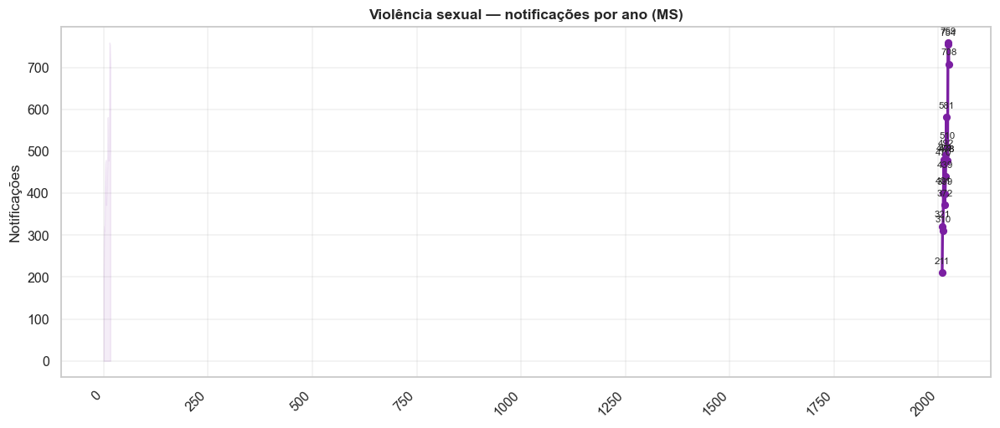


--- Violência sexual: por ano ----------------------------------------


,Ano,Notificações
0,2009,211
1,2010,321
2,2011,310
3,2012,401
4,2013,470
5,2014,479
6,2015,372
7,2016,399
8,2017,439
9,2018,492



--- Violência sexual: ranking municipal (absoluto, top 15) -----------


,Posicao,Municipio,N
0,1,Campo Grande,3451
1,2,Dourados,1184
2,3,Corumbá,627
3,4,Ponta Porã,293
4,5,Aquidauana,267
5,6,Três Lagoas,203
6,7,Amambai,166
7,8,Naviraí,142
8,9,Nova Andradina,119
9,10,Ladário,98


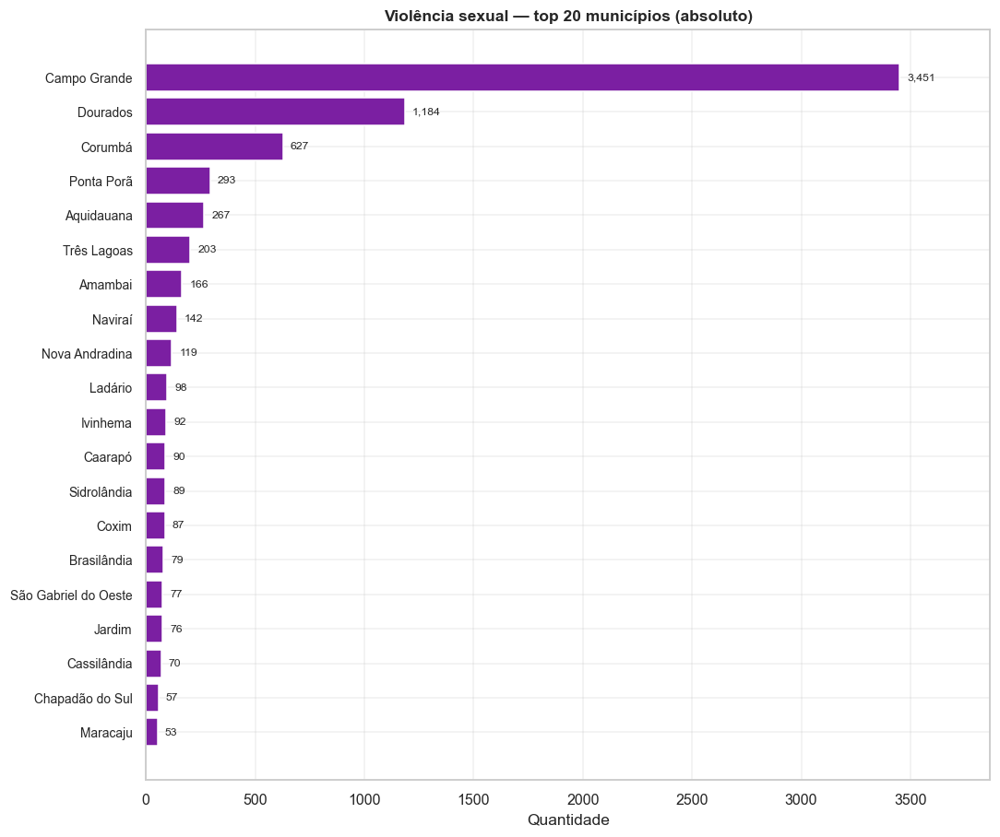


--- Violência sexual: ranking por taxa/100 mil mulheres (top 15) -----


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Brasilândia,79,5829,1355.29
1,2,Corumbá,627,48461,1293.82
2,3,Aquidauana,267,23561,1133.23
3,4,Antônio João,46,4683,982.28
4,5,Dourados,1184,122511,966.44
5,6,Ladário,98,10834,904.56
6,7,Tacuru,49,5441,900.57
7,8,Amambai,166,19796,838.55
8,9,Paranhos,52,6504,799.51
9,10,Campo Grande,3451,452104,763.32


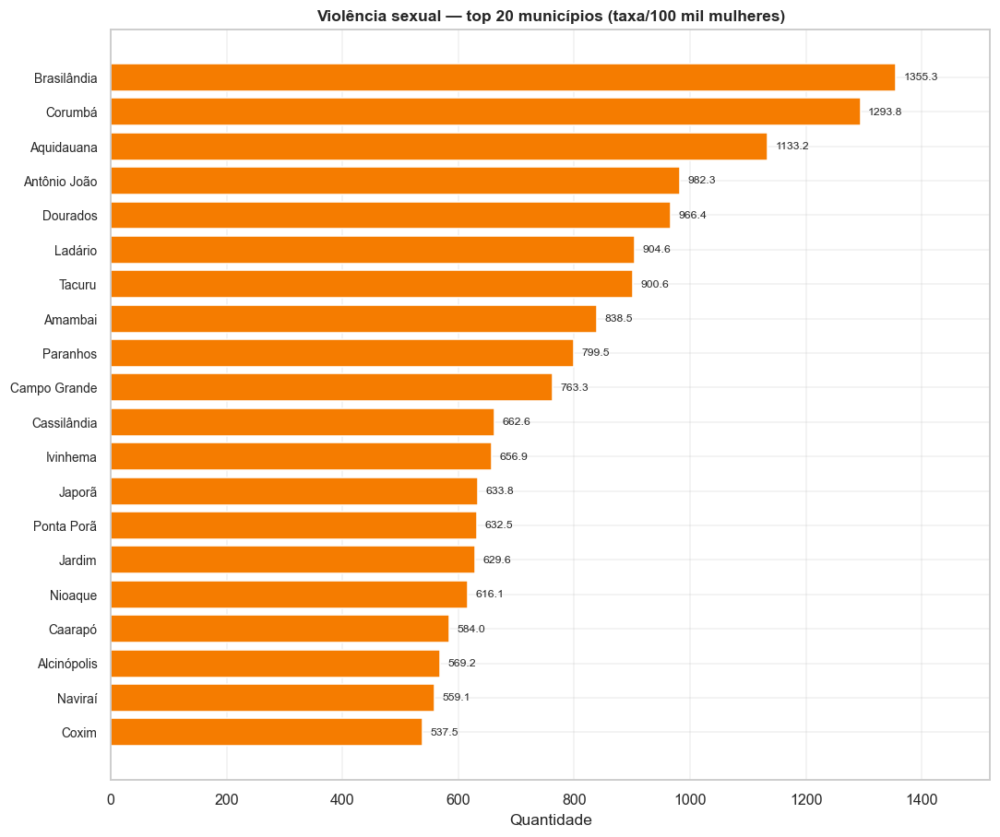

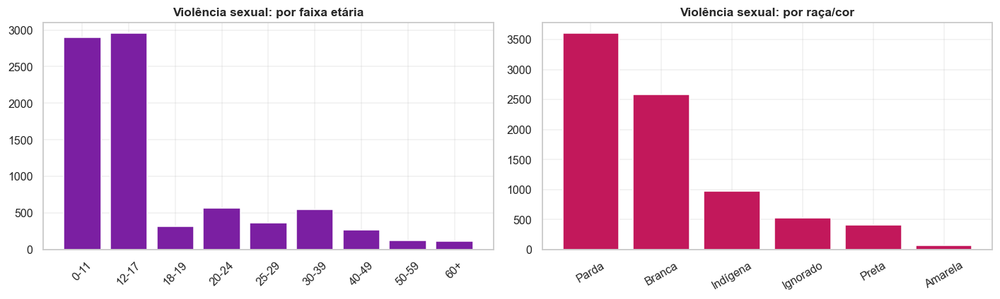

   📝 Relatório salvo: 24_violencia_sexual_relatorio.txt
   ✅ Eixo 'Violência sexual' concluído.

[16] EIXO TEMÁTICO — ESTUPRO
   Total de notificações (Estupro): 5.946


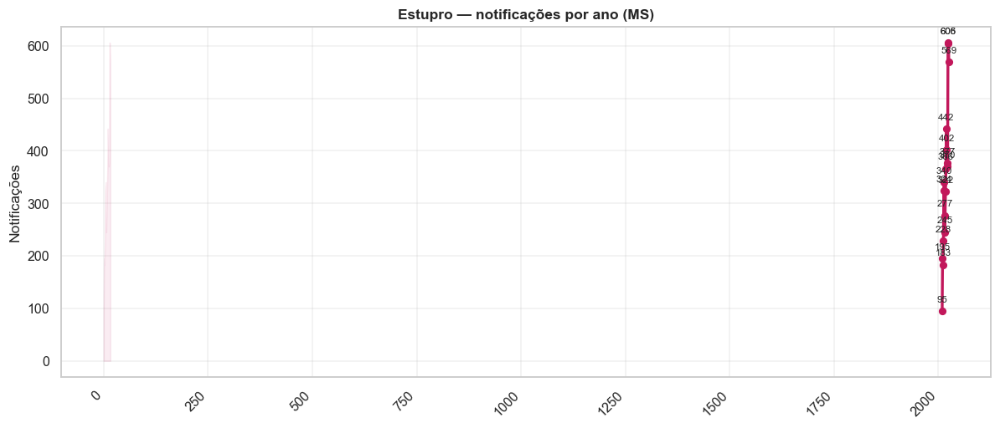


--- Estupro: por ano -------------------------------------------------


,Ano,Notificações
0,2009,95
1,2010,195
2,2011,183
3,2012,228
4,2013,324
5,2014,340
6,2015,245
7,2016,277
8,2017,322
9,2018,366



--- Estupro: ranking municipal (absoluto, top 15) --------------------


,Posicao,Municipio,N
0,1,Campo Grande,2501
1,2,Dourados,954
2,3,Corumbá,488
3,4,Ponta Porã,181
4,5,Aquidauana,180
5,6,Três Lagoas,142
6,7,Amambai,121
7,8,Naviraí,116
8,9,Nova Andradina,79
9,10,Ivinhema,71


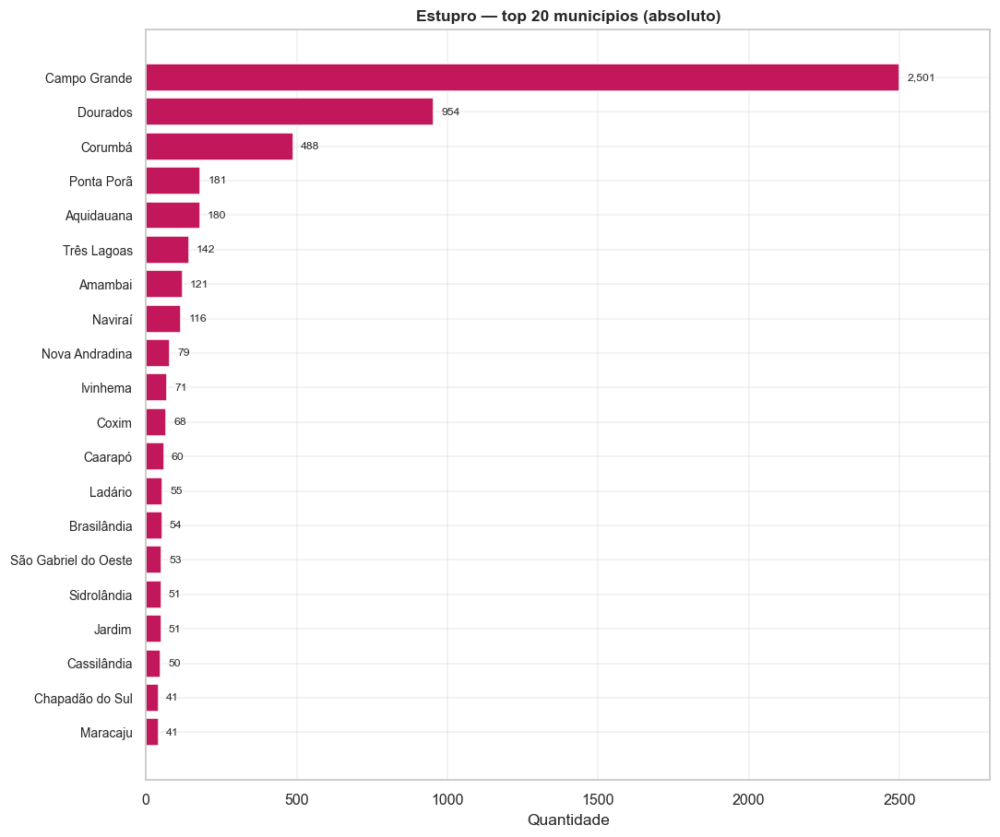


--- Estupro: ranking por taxa/100 mil mulheres (top 15) --------------


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Corumbá,488,48461,1007.00
1,2,Brasilândia,54,5829,926.40
2,3,Dourados,954,122511,778.71
3,4,Aquidauana,180,23561,763.97
4,5,Tacuru,38,5441,698.40
5,6,Amambai,121,19796,611.23
6,7,Paranhos,36,6504,553.51
7,8,Campo Grande,2501,452104,553.19
8,9,Antônio João,25,4683,533.85
9,10,Ladário,55,10834,507.66


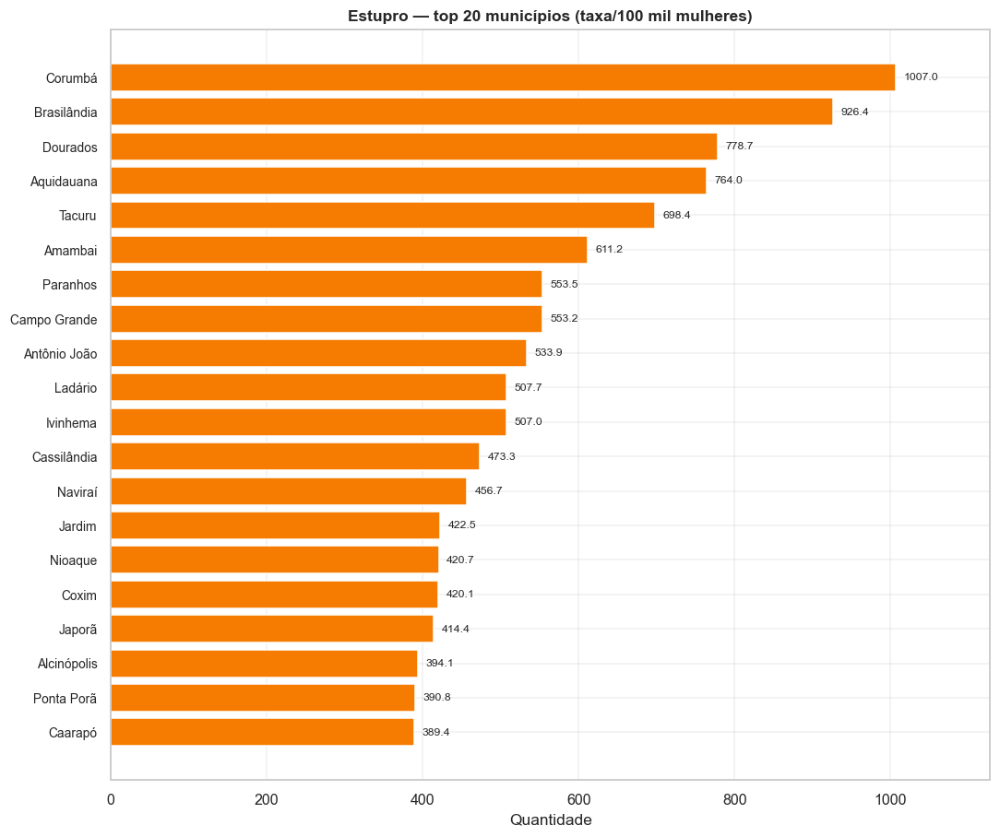

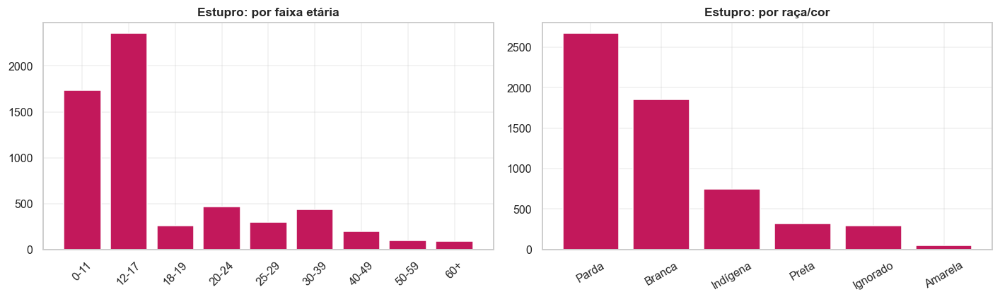

   📝 Relatório salvo: 24_estupro_relatorio.txt
   ✅ Eixo 'Estupro' concluído.

[17] VIOLÊNCIA SEXUAL — RECORTES ETÁRIOS E NATUREZAS

--- Violência sexual: crianças/adolescentes × adultas ----------------


,Grupo,Notificações
0,Criança/Adolescente (0-17),5854
1,Adulta (18+),2308


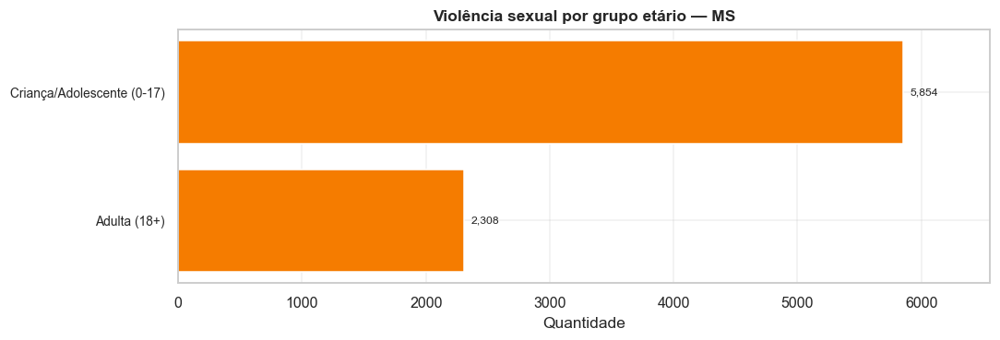


--- Naturezas de violência sexual ------------------------------------


,Natureza,Notificações
0,Estupro,5946
1,Assédio sexual,1874
2,Outra violência sexual,434
3,Atentado violento ao pudor,307
4,Exploração sexual,238
5,Pornografia infantil,142


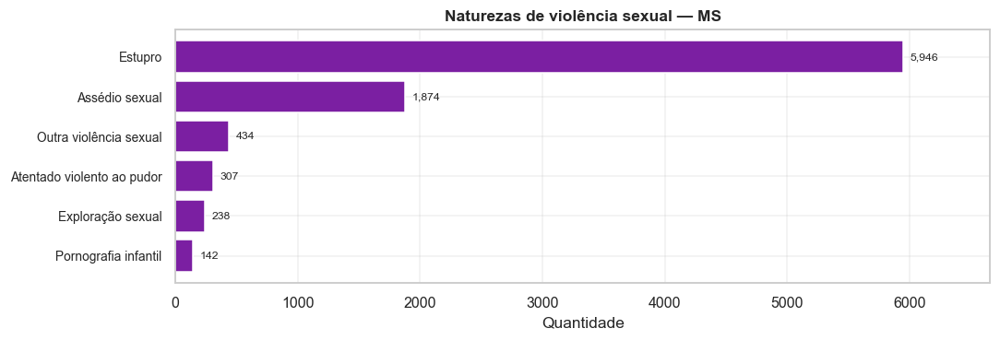

In [26]:
res_sexual = analise_tematica("FL_VIOL_SEXUAL", "Violência sexual",
                              "24_violencia_sexual", cor=COR_PRIMARIA)
res_estupro = analise_tematica("FL_ESTUPRO", "Estupro", "24_estupro",
                               cor=COR_SECUNDARIA)

# 24.x  Recortes específicos de violência sexual: crianças/adolescentes × adultas
banner("VIOLÊNCIA SEXUAL — RECORTES ETÁRIOS E NATUREZAS")
base_sex = DF_MULHERES[DF_MULHERES["FL_VIOL_SEXUAL"] == 1].copy()
if len(base_sex):
    base_sex["GRUPO_ETARIO"] = np.where(base_sex["IDADE"] < 18,
                                        "Criança/Adolescente (0-17)", "Adulta (18+)")
    rec = base_sex["GRUPO_ETARIO"].value_counts()
    show_df(rec.rename_axis("Grupo").reset_index(name="Notificações"),
            "Violência sexual: crianças/adolescentes × adultas", max_linhas=4)
    barras_horizontais(rec, "Violência sexual por grupo etário — MS",
                       "24_sexual_grupo_etario", cor=COR_DESTAQUE,
                       descricao="Violência sexual por grupo etário")
    # Naturezas de violência sexual (SEX_*)
    freq_sex = {MAP_SEXUAL[c]: int(base_sex[f"FL_{c}"].sum()) for c in COLS_SEXUAL}
    serie_sex = pd.Series(freq_sex).sort_values(ascending=False)
    show_df(serie_sex.rename_axis("Natureza").reset_index(name="Notificações"),
            "Naturezas de violência sexual", max_linhas=8)
    barras_horizontais(serie_sex, "Naturezas de violência sexual — MS",
                       "24_naturezas_sexuais", cor=COR_PRIMARIA,
                       descricao="Naturezas de violência sexual")
    salvar_csv(serie_sex.rename_axis("Natureza").reset_index(name="Notificacoes"),
               "24_naturezas_sexuais", "Naturezas de violência sexual")

============================================================
## SEÇÃO 25 — VIOLÊNCIA DOMÉSTICA
============================================================


[18] EIXO TEMÁTICO — VIOLÊNCIA DOMÉSTICA
   Total de notificações (Violência doméstica): 77.283


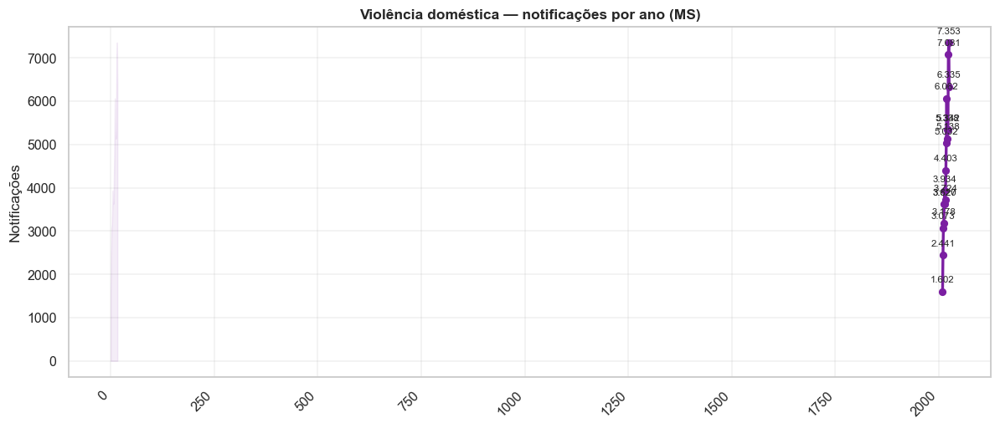


--- Violência doméstica: por ano -------------------------------------


,Ano,Notificações
0,2009,1602
1,2010,2441
2,2011,3073
3,2012,3178
4,2013,3620
5,2014,3934
6,2015,3627
7,2016,3724
8,2017,4403
9,2018,5032



--- Violência doméstica: ranking municipal (absoluto, top 15) --------


,Posicao,Municipio,N
0,1,Campo Grande,38548
1,2,Corumbá,8972
2,3,Dourados,3142
3,4,Três Lagoas,2793
4,5,Nova Andradina,1931
5,6,Amambai,1552
6,7,Ponta Porã,1506
7,8,São Gabriel do Oeste,1367
8,9,Aquidauana,1284
9,10,Jardim,1000


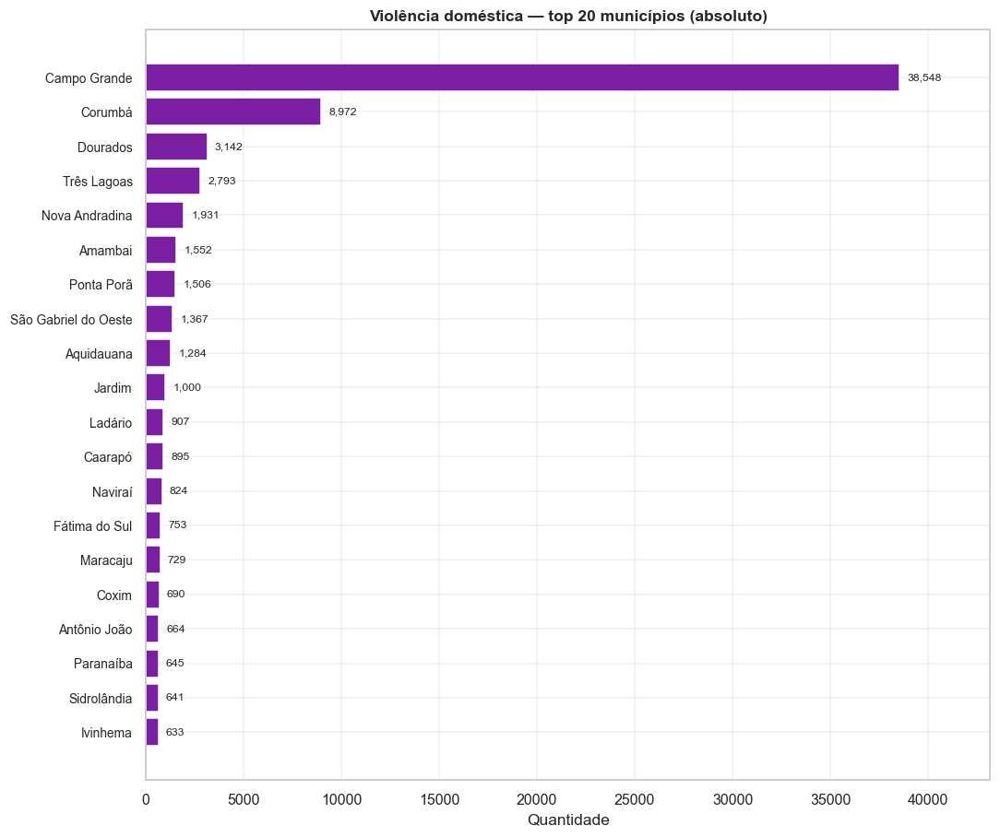


--- Violência doméstica: ranking por taxa/100 mil mulheres (top 15) --


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Corumbá,8972,48461,18513.86
1,2,Antônio João,664,4683,14178.95
2,3,São Gabriel do Oeste,1367,14890,9180.66
3,4,Campo Grande,38548,452104,8526.36
4,5,Ladário,907,10834,8371.79
5,6,Jardim,1000,12072,8283.63
6,7,Nioaque,535,6655,8039.07
7,8,Nova Andradina,1931,24447,7898.72
8,9,Amambai,1552,19796,7839.97
9,10,Alcinópolis,168,2284,7355.52


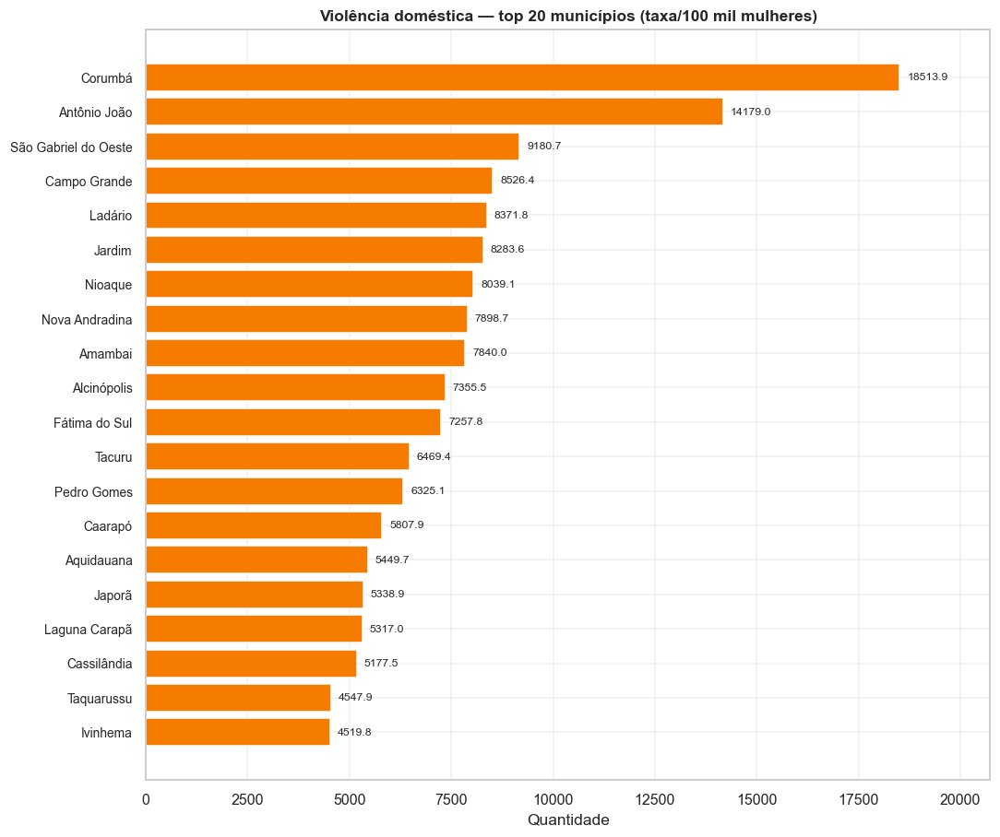

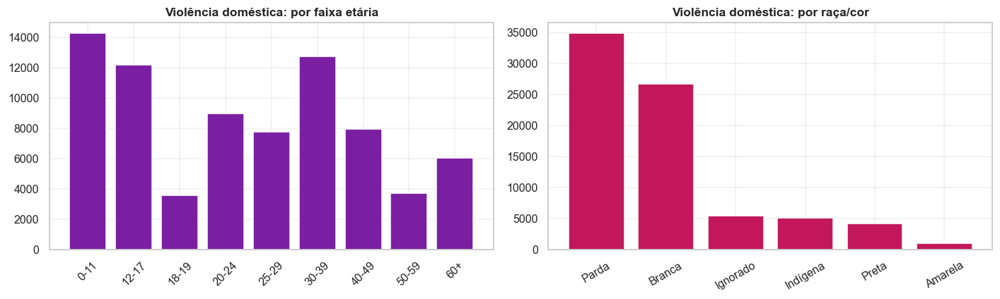

   📝 Relatório salvo: 25_violencia_domestica_relatorio.txt
   ✅ Eixo 'Violência doméstica' concluído.

[19] VIOLÊNCIA DOMÉSTICA — LOCAL E VÍNCULO

--- Violência doméstica por local de ocorrência ----------------------


,LOCAL_DESC,Registros,%
0,Residência,66149,85.7
1,Outro,3164,4.1
2,Via pública,2697,3.5
3,Comércio/Serviços,2242,2.9
4,Ignorado,1994,2.6
5,Bar ou similar,591,0.8
6,Habitação coletiva,181,0.2
7,Escola,157,0.2


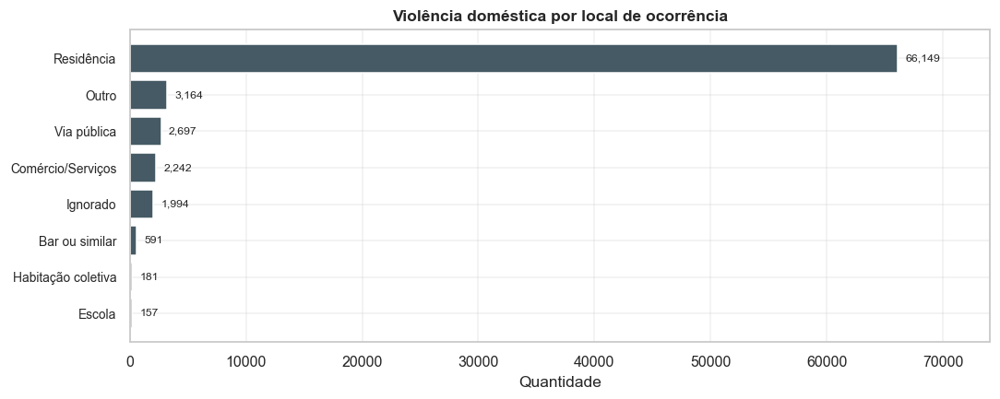


--- Violência doméstica por vínculo autor-vítima ---------------------


,VINCULO_AUTOR,Registros,%
0,Própria pessoa,18759,25.1
1,Cônjuge,16436,22.0
2,Pai,9142,12.2
3,Mãe,6450,8.6
4,Filho(a),4909,6.6
5,Ex-cônjuge,4896,6.6
6,Outro vínculo,3414,4.6
7,Conhecido(a),2855,3.8
8,Namorado(a),2393,3.2
9,Não informado,2075,2.8


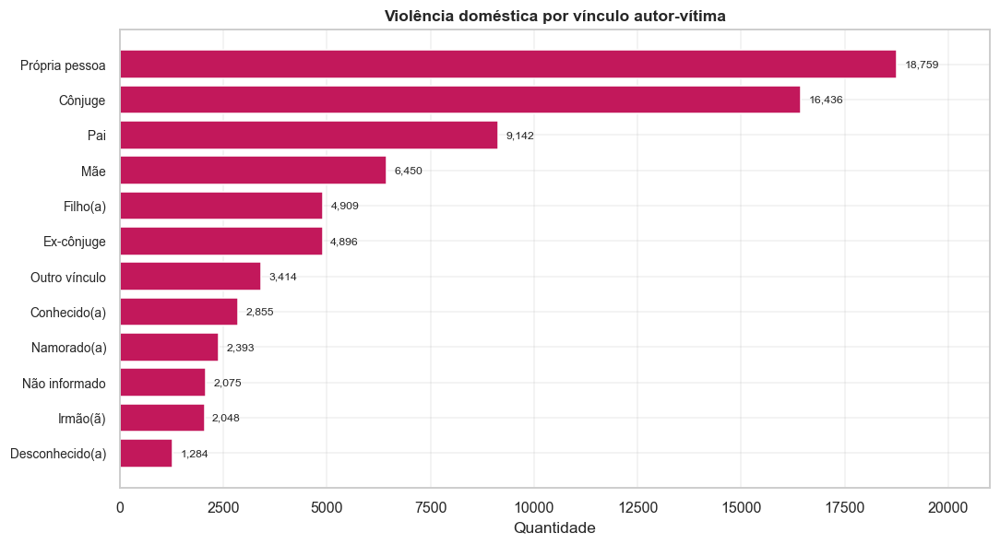

   Violência doméstica na residência: 85.6%


In [27]:
res_domestica = analise_tematica("FL_VIOL_DOMESTICA", "Violência doméstica",
                                 "25_violencia_domestica", cor=COR_PRIMARIA)

# 25.x  Local de ocorrência da violência doméstica e vínculo
banner("VIOLÊNCIA DOMÉSTICA — LOCAL E VÍNCULO")
base_dom = DF_MULHERES[DF_MULHERES["FL_VIOL_DOMESTICA"] == 1].copy()
if len(base_dom):
    analisar_dimensao("LOCAL_DESC", "Violência doméstica por local de ocorrência",
                      "25_domestica_local", base=base_dom, cor=COR_NEUTRA, top=8)
    analisar_dimensao("VINCULO_AUTOR", "Violência doméstica por vínculo autor-vítima",
                      "25_domestica_vinculo", base=base_dom, cor=COR_SECUNDARIA, top=12)
    info("Violência doméstica na residência: %.1f%%",
         100 * base_dom["FL_NA_RESIDENCIA"].mean())

============================================================
## SEÇÃO 26 — AMEAÇA e LESÃO CORPORAL
============================================================


[20] EIXO TEMÁTICO — AMEAÇA
   Total de notificações (Ameaça): 8.913


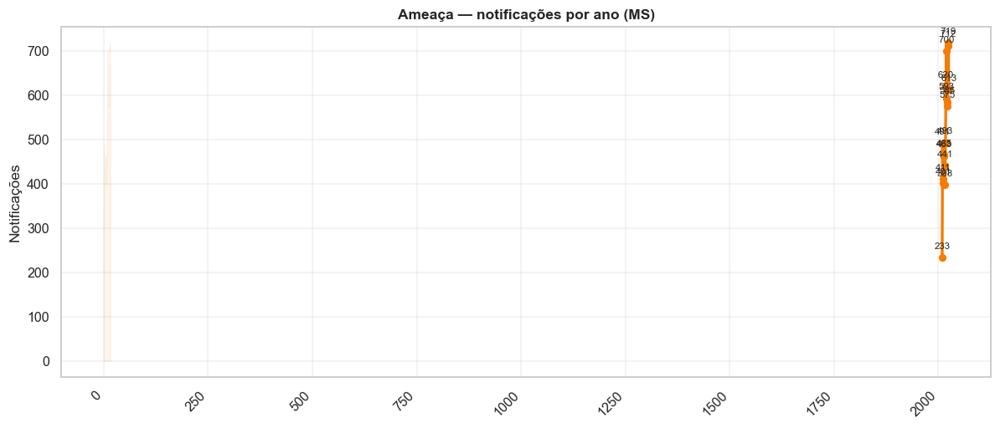


--- Ameaça: por ano --------------------------------------------------


,Ano,Notificações
0,2009,233
1,2010,491
2,2011,401
3,2012,411
4,2013,465
5,2014,463
6,2015,398
7,2016,441
8,2017,493
9,2018,620



--- Ameaça: ranking municipal (absoluto, top 15) ---------------------


,Posicao,Municipio,N
0,1,Campo Grande,3266
1,2,Corumbá,1439
2,3,Dourados,495
3,4,Nova Andradina,331
4,5,Ponta Porã,330
5,6,São Gabriel do Oeste,235
6,7,Amambai,230
7,8,Jardim,177
8,9,Naviraí,176
9,10,Cassilândia,163


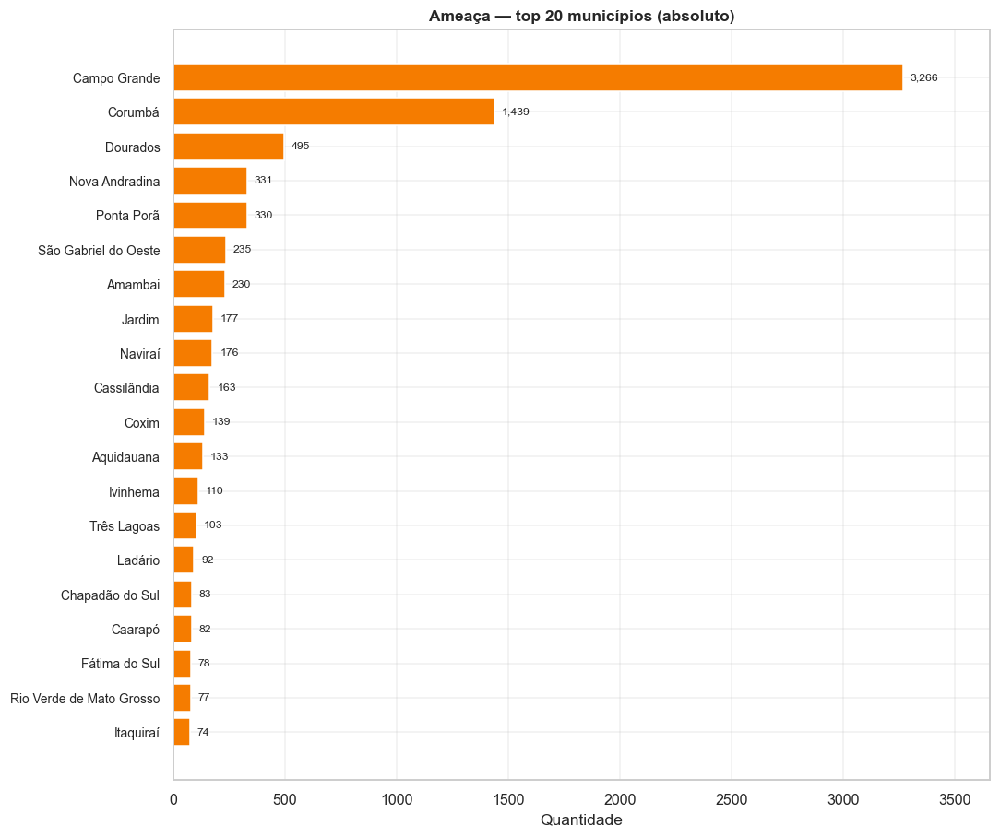


--- Ameaça: ranking por taxa/100 mil mulheres (top 15) ---------------


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Corumbá,1439,48461,2969.40
1,2,Pedro Gomes,58,3494,1659.99
2,3,São Gabriel do Oeste,235,14890,1578.24
3,4,Cassilândia,163,10565,1542.83
4,5,Jardim,177,12072,1466.20
5,6,Alcinópolis,33,2284,1444.83
6,7,Nova Andradina,331,24447,1353.95
7,8,Amambai,230,19796,1161.85
8,9,Antônio João,51,4683,1089.05
9,10,Tacuru,54,5441,992.46


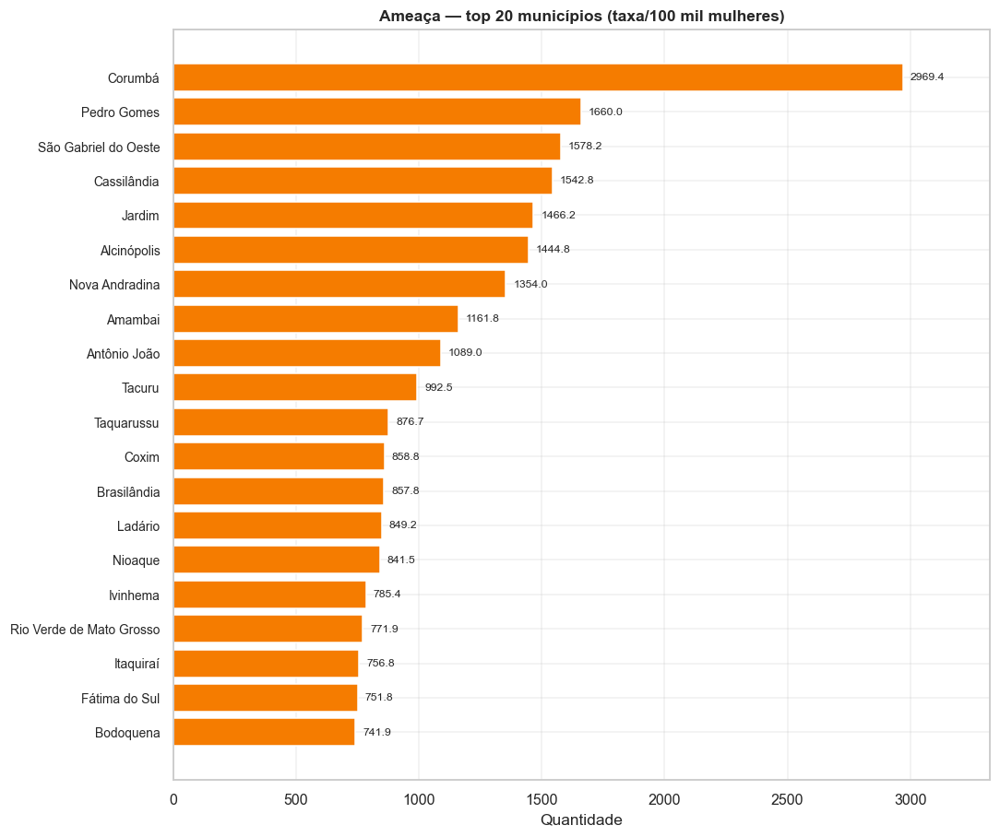

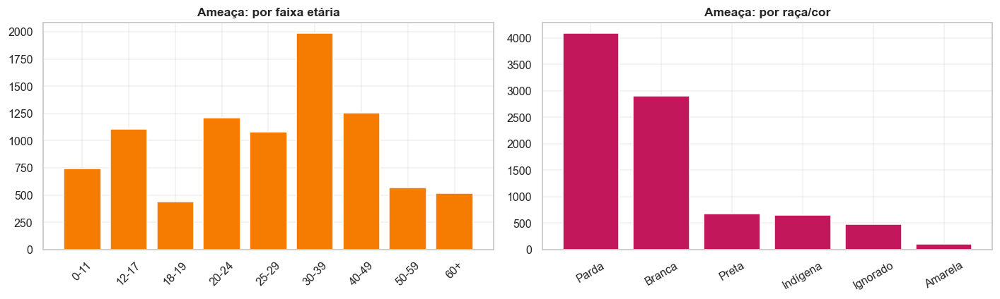

   📝 Relatório salvo: 26_ameaca_relatorio.txt
   ✅ Eixo 'Ameaça' concluído.

[21] EIXO TEMÁTICO — LESÃO CORPORAL (VIOLÊNCIA FÍSICA)
   Total de notificações (Lesão corporal (violência física)): 45.348


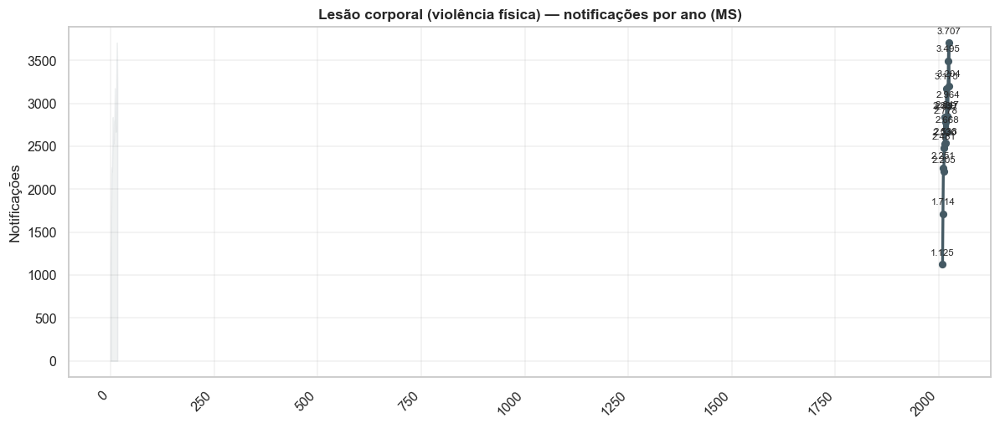


--- Lesão corporal (violência física): por ano -----------------------


,Ano,Notificações
0,2009,1125
1,2010,1714
2,2011,2251
3,2012,2205
4,2013,2481
5,2014,2839
6,2015,2530
7,2016,2538
8,2017,2778
9,2018,2827



--- Lesão corporal (violência física): ranking municipal (absoluto, top 15) 


,Posicao,Municipio,N
0,1,Campo Grande,15164
1,2,Corumbá,4292
2,3,Dourados,2456
3,4,Nova Andradina,1968
4,5,Amambai,1597
5,6,São Gabriel do Oeste,1539
6,7,Ponta Porã,1303
7,8,Três Lagoas,1090
8,9,Jardim,1074
9,10,Caarapó,965


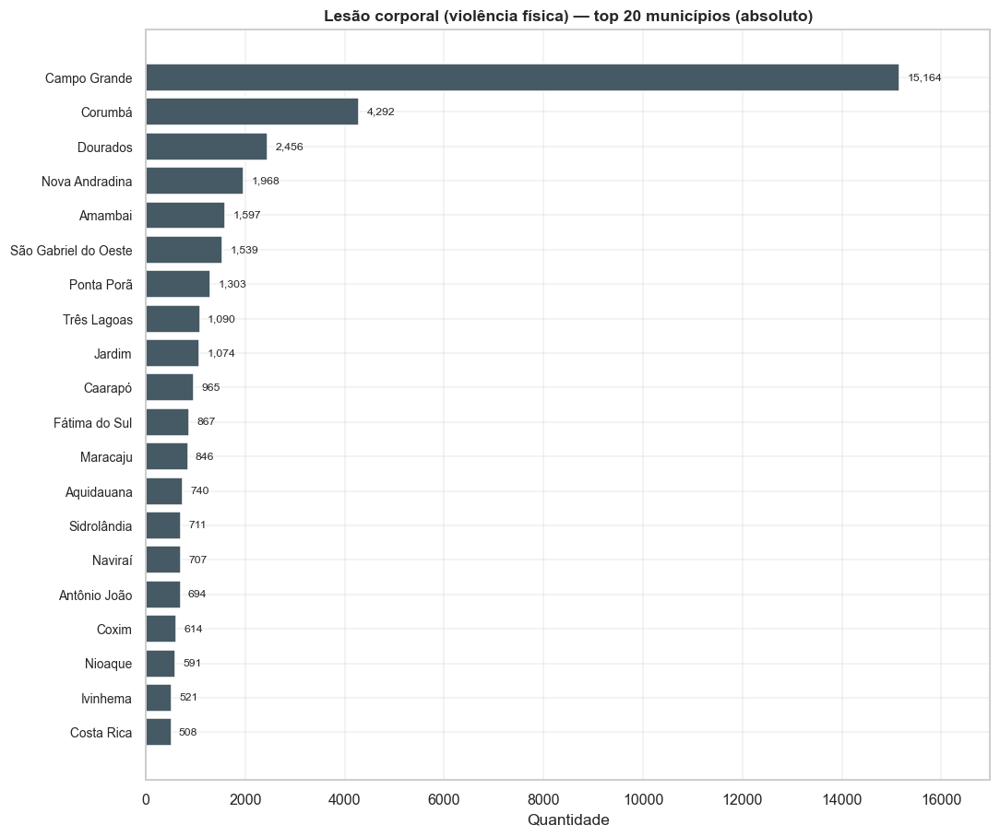


--- Lesão corporal (violência física): ranking por taxa/100 mil mulheres (top 15) 


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Antônio João,694,4683,14819.56
1,2,São Gabriel do Oeste,1539,14890,10335.80
2,3,Jardim,1074,12072,8896.62
3,4,Nioaque,591,6655,8880.54
4,5,Corumbá,4292,48461,8856.61
5,6,Fátima do Sul,867,10375,8356.63
6,7,Amambai,1597,19796,8067.29
7,8,Nova Andradina,1968,24447,8050.07
8,9,Alcinópolis,165,2284,7224.17
9,10,Pedro Gomes,243,3494,6954.78


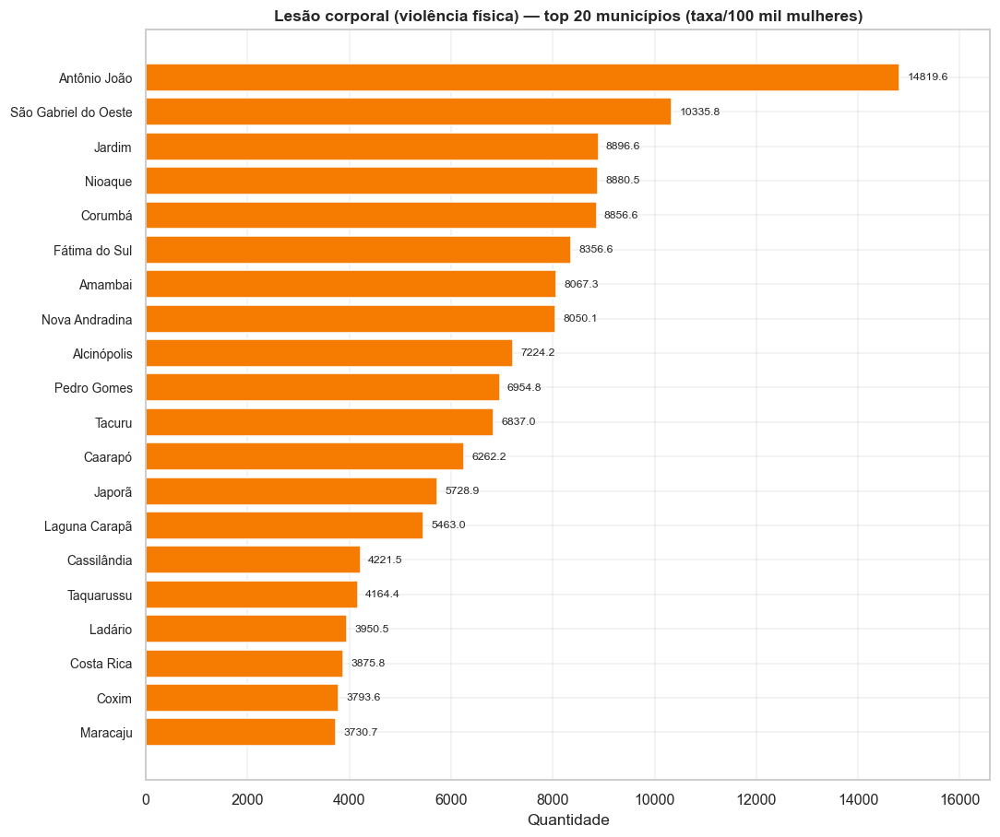

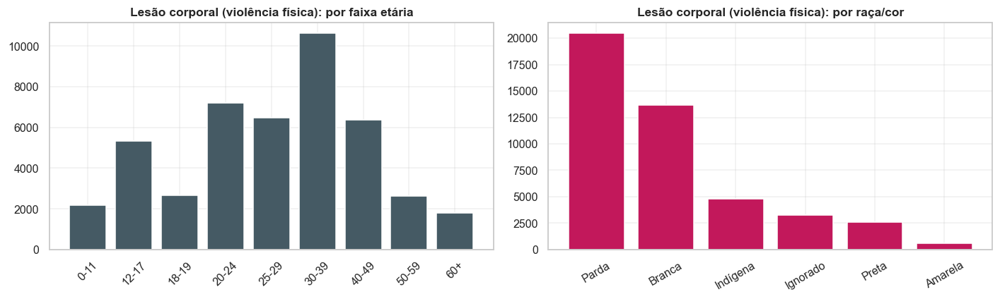

   📝 Relatório salvo: 26_lesao_corporal_relatorio.txt
   ✅ Eixo 'Lesão corporal (violência física)' concluído.

[22] EIXO TEMÁTICO — VIOLÊNCIA PSICOLÓGICA/MORAL
   Total de notificações (Violência psicológica/moral): 15.232


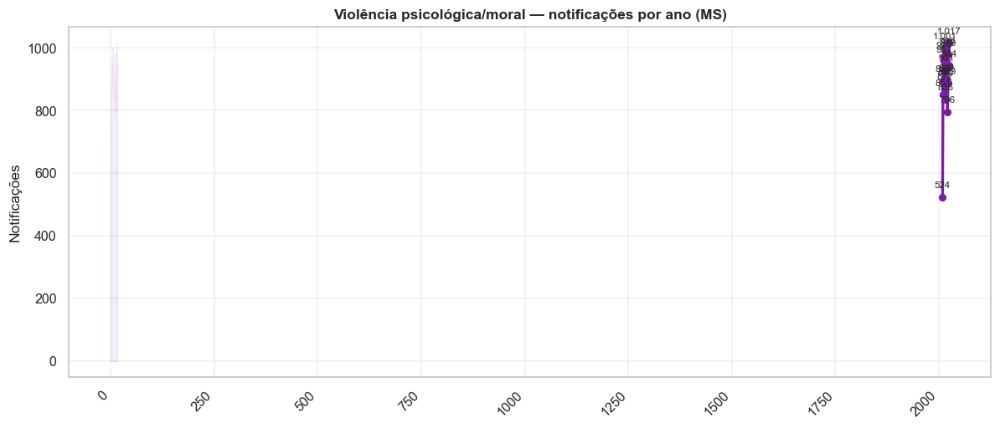


--- Violência psicológica/moral: por ano -----------------------------


,Ano,Notificações
0,2009,524
1,2010,851
2,2011,895
3,2012,971
4,2013,957
5,2014,1001
6,2015,872
7,2016,885
8,2017,836
9,2018,899



--- Violência psicológica/moral: ranking municipal (absoluto, top 15) 


,Posicao,Municipio,N
0,1,Campo Grande,4389
1,2,Corumbá,1801
2,3,Nova Andradina,806
3,4,Dourados,678
4,5,Ponta Porã,661
5,6,São Gabriel do Oeste,576
6,7,Naviraí,426
7,8,Amambai,414
8,9,Jardim,388
9,10,Fátima do Sul,351


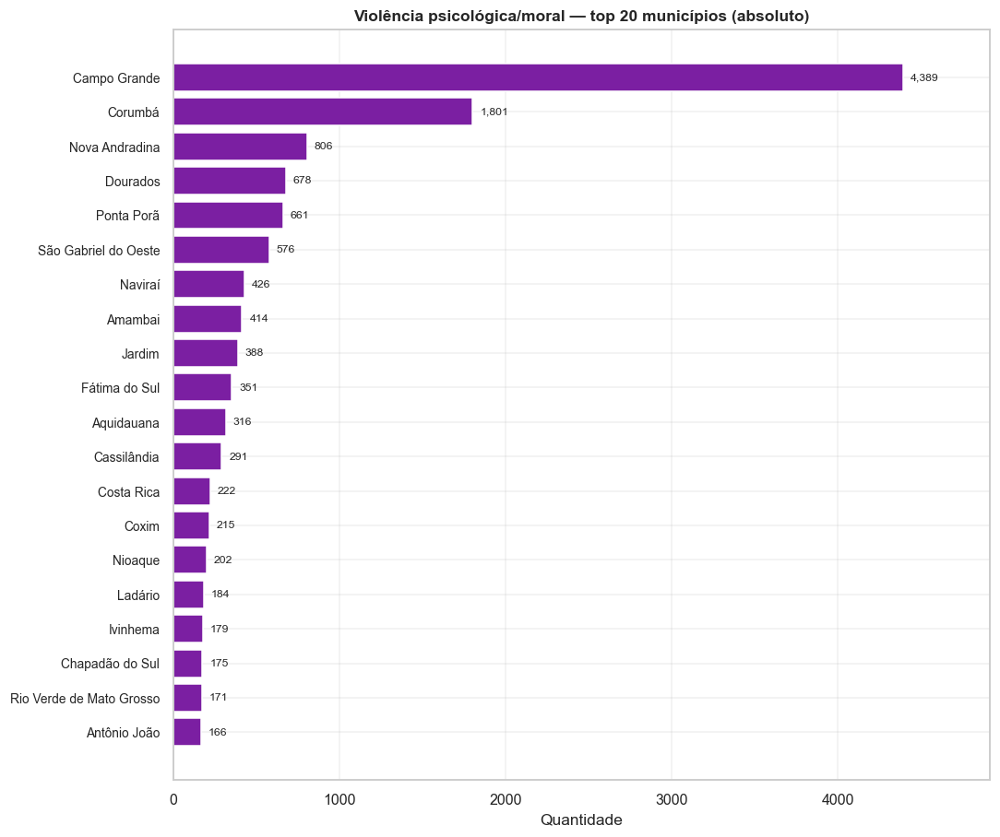


--- Violência psicológica/moral: ranking por taxa/100 mil mulheres (top 15) 


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Pedro Gomes,160,3494,4579.28
1,2,São Gabriel do Oeste,576,14890,3868.37
2,3,Corumbá,1801,48461,3716.39
3,4,Antônio João,166,4683,3544.74
4,5,Fátima do Sul,351,10375,3383.13
5,6,Nova Andradina,806,24447,3296.93
6,7,Alcinópolis,75,2284,3283.71
7,8,Jardim,388,12072,3214.05
8,9,Nioaque,202,6655,3035.31
9,10,Cassilândia,291,10565,2754.38


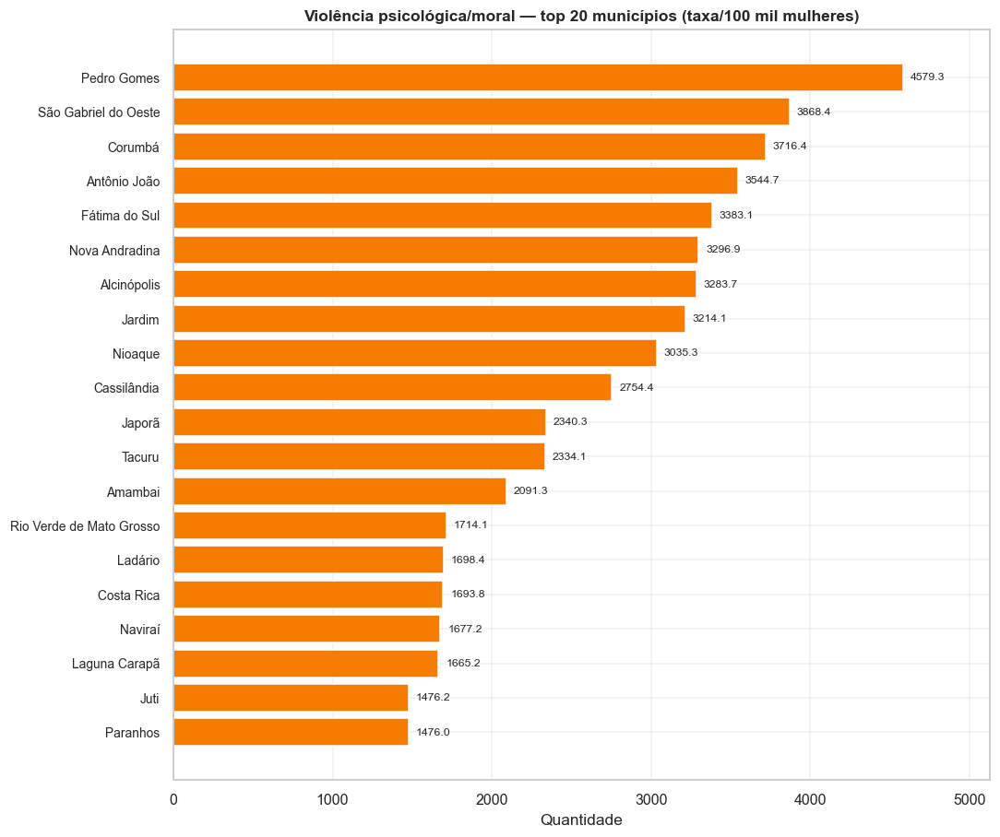

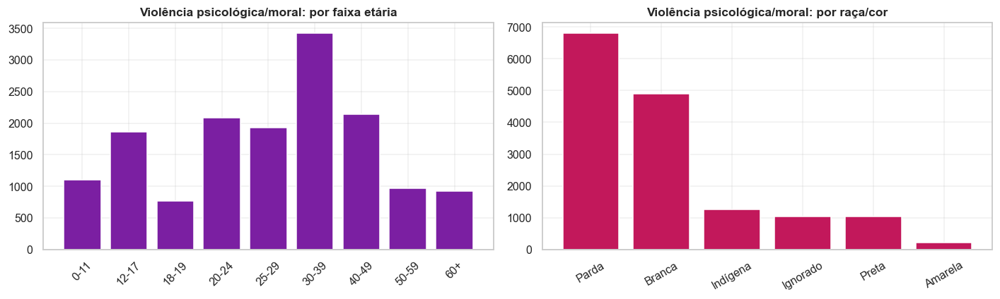

   📝 Relatório salvo: 26_violencia_psicologica_relatorio.txt
   ✅ Eixo 'Violência psicológica/moral' concluído.

[23] QUADRO COMPARATIVO DOS EIXOS TEMÁTICOS

--- Comparativo dos eixos temáticos (MS, acumulado) ------------------


,Eixo,Notificações,Taxa/100k mulheres (acum.)
0,Violência doméstica,77283,5568.40
1,Violência física,45348,3267.42
2,Violência psicológica,15232,1097.50
5,Ameaça,8913,642.20
3,Violência sexual,8162,588.09
4,Estupro,5946,428.42
6,Feminicídio (proxy),83,5.98
7,Óbito por violência,83,5.98


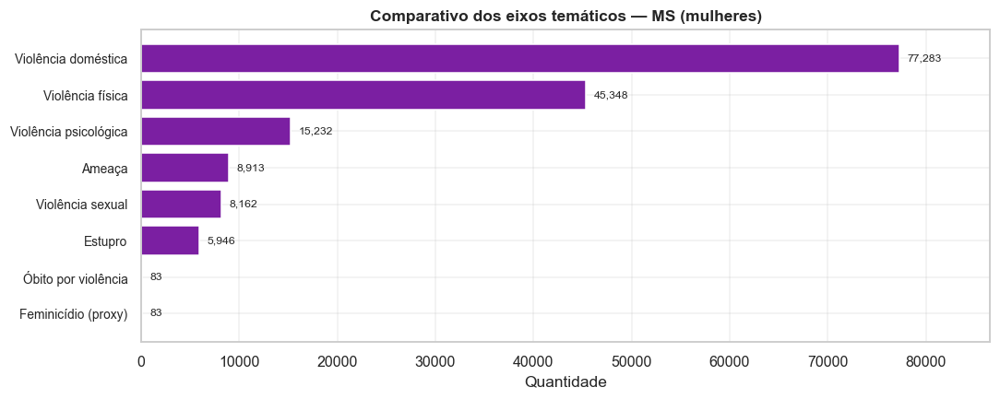

   📝 Relatório salvo: 26_relatorio_comparativo_eixos.txt
   ✅ Análises temáticas (sexual, doméstica, ameaça, lesão) concluídas.


In [28]:
res_ameaca = analise_tematica("FL_AMEACA", "Ameaça", "26_ameaca", cor=COR_DESTAQUE)
res_lesao = analise_tematica("FL_LESAO_CORPORAL", "Lesão corporal (violência física)",
                             "26_lesao_corporal", cor=COR_NEUTRA)
res_psico = analise_tematica("FL_VIOL_PSICOLOGICA", "Violência psicológica/moral",
                             "26_violencia_psicologica", cor=COR_PRIMARIA)

# 26.x  Quadro comparativo dos eixos temáticos
banner("QUADRO COMPARATIVO DOS EIXOS TEMÁTICOS")
eixos = {
    "Violência doméstica": "FL_VIOL_DOMESTICA",
    "Violência física": "FL_VIOL_FISIC",
    "Violência psicológica": "FL_VIOL_PSICOLOGICA",
    "Violência sexual": "FL_VIOL_SEXUAL",
    "Estupro": "FL_ESTUPRO",
    "Ameaça": "FL_AMEACA",
    "Feminicídio (proxy)": "FL_FEMINICIDIO",
    "Óbito por violência": "FL_OBITO_VIOLENCIA",
}
linhas_comp = []
for nome_eixo, flag in eixos.items():
    total = int(DF_MULHERES[flag].sum())
    taxa = round(total / pop_fem_ms * 100_000, 2)
    linhas_comp.append({"Eixo": nome_eixo, "Notificações": total,
                        "Taxa/100k mulheres (acum.)": taxa})
df_comp_eixos = pd.DataFrame(linhas_comp).sort_values("Notificações", ascending=False)
show_df(df_comp_eixos, "Comparativo dos eixos temáticos (MS, acumulado)", max_linhas=12)
salvar_csv(df_comp_eixos, "26_comparativo_eixos", "Comparativo dos eixos temáticos")
registrar_planilha("Comparativo_Eixos", df_comp_eixos)
barras_horizontais(df_comp_eixos.set_index("Eixo")["Notificações"],
                   "Comparativo dos eixos temáticos — MS (mulheres)",
                   "26_comparativo_eixos", cor=COR_PRIMARIA,
                   descricao="Comparativo dos eixos")

rel_eixos = RelatorioTexto("Relatório Comparativo dos Eixos Temáticos")
rel_eixos.tabela_df(df_comp_eixos, titulo="Eixos temáticos (acumulado 2009+)")
rel_eixos.salvar(DIRS["relatorios"] / "26_relatorio_comparativo_eixos.txt")
sucesso("Análises temáticas (sexual, doméstica, ameaça, lesão) concluídas.")

============================================================
## SEÇÃO 27 — Taxas por 100 mil mulheres e RANKING MUNICIPAL
============================================================

Construção do **painel municipal** consolidado: para cada município de MS, número
absoluto e taxa por 100 mil mulheres em cada eixo, posição frente à média estadual e
um **Índice Municipal de Risco (IMR)** composto. Geramos dois rankings (absoluto e por
taxa), conforme exigido pelo plano.


[24] PAINEL MUNICIPAL — TAXAS E RANKINGS
   Média estadual da taxa total: 3824.0 por 100 mil mulheres
   Mediana: 2504.7 | Desvio-padrão: 3953.0
   Municípios acima da média estadual: 31 de 79

--- RANKING MUNICIPAL ABSOLUTO (top 20) ------------------------------


,Pos,Municipio,N_Total,N_Doméstica,N_Sexual,N_Feminicídio
0,1,Campo Grande,44815,38548,3451,29
1,2,Corumbá,10960,8972,627,10
2,3,Dourados,4313,3142,1184,3
3,4,Três Lagoas,3210,2793,203,16
4,5,Nova Andradina,2289,1931,119,0
5,6,Ponta Porã,1843,1506,293,0
6,7,Amambai,1788,1552,166,0
7,8,São Gabriel do Oeste,1640,1367,77,0
8,9,Aquidauana,1585,1284,267,0
9,10,Jardim,1197,1000,76,2



--- RANKING MUNICIPAL POR TAXA/100 MIL MULHERES (top 20) -------------


,Pos,Municipio,N_Total,Pop_feminina,Taxa_Total,IMR_0_100,Classe_risco
0,1,Corumbá,10960,48461,22616.12,100.0,Alto
1,2,Antônio João,781,4683,16677.34,88.0,Alto
2,3,São Gabriel do Oeste,1640,14890,11014.10,58.3,Médio
3,4,Ladário,1110,10834,10245.52,44.0,Médio
4,5,Nioaque,677,6655,10172.80,49.4,Médio
5,6,Jardim,1197,12072,9915.51,58.8,Médio
6,7,Campo Grande,44815,452104,9912.54,40.7,Médio
7,8,Nova Andradina,2289,24447,9363.11,49.7,Médio
8,9,Amambai,1788,19796,9032.13,52.9,Médio
9,10,Fátima do Sul,932,10375,8983.13,39.8,Médio


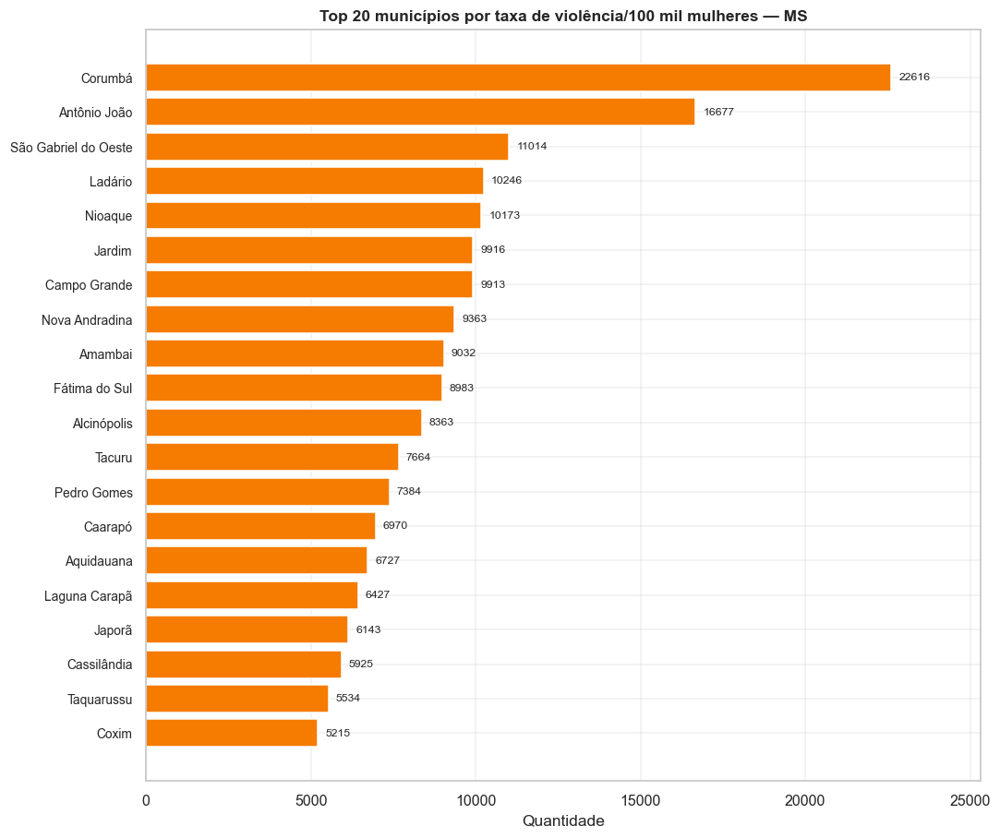

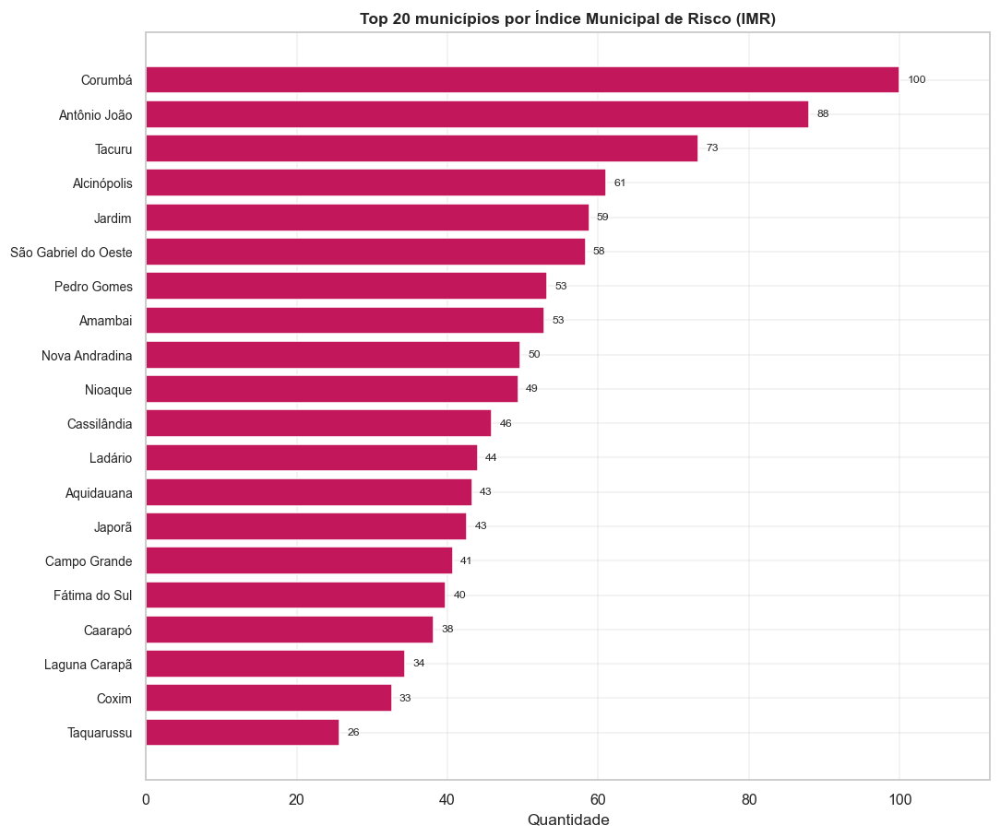


--- Municípios por classe de risco (IMR) -----------------------------


,Classe de risco,Municípios
0,Baixo,56
1,Médio,20
2,Alto,3


   📝 Relatório salvo: 27_relatorio_ranking_municipal.txt
   ✅ Painel e rankings municipais concluídos.


In [29]:
banner("PAINEL MUNICIPAL — TAXAS E RANKINGS")

# 27.1  Painel municipal consolidado (uma linha por município)
EIXOS_PAINEL = OrderedDict([
    ("Total", "FL_FEMININO"),
    ("Doméstica", "FL_VIOL_DOMESTICA"),
    ("Física", "FL_VIOL_FISIC"),
    ("Psicológica", "FL_VIOL_PSICOLOGICA"),
    ("Sexual", "FL_VIOL_SEXUAL"),
    ("Estupro", "FL_ESTUPRO"),
    ("Ameaça", "FL_AMEACA"),
    ("Feminicídio", "FL_FEMINICIDIO"),
])

painel = []
for cod, nome in MUNICIPIOS_MS.items():
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    pop_f = POP_FEM_MUN_MS.get(cod, np.nan)
    linha = {"COD_MUN": cod, "Municipio": nome,
             "Pop_total": POP_MUN_MS_2022.get(cod), "Pop_feminina": pop_f}
    for rotulo, flag in EIXOS_PAINEL.items():
        n = int(sub[flag].sum()) if flag in sub.columns else 0
        linha[f"N_{rotulo}"] = n
        linha[f"Taxa_{rotulo}"] = round(n / pop_f * 100_000, 2) if pop_f else np.nan
    painel.append(linha)
df_painel = pd.DataFrame(painel)

# 27.2  Posição frente à média estadual (para o total)
media_taxa_total = df_painel["Taxa_Total"].mean()
mediana_taxa_total = df_painel["Taxa_Total"].median()
dp_taxa_total = df_painel["Taxa_Total"].std()
df_painel["Acima_media_estadual"] = df_painel["Taxa_Total"] > media_taxa_total

# 27.3  Índice Municipal de Risco (IMR) — média de z-scores das taxas dos eixos
cols_taxa = [f"Taxa_{r}" for r in EIXOS_PAINEL if r != "Total"]
z = df_painel[cols_taxa].apply(lambda c: (c - c.mean()) / (c.std() + 1e-9))
df_painel["IMR"] = z.mean(axis=1).round(3)
# normaliza IMR para 0-100 (escala interpretável)
imr_min, imr_max = df_painel["IMR"].min(), df_painel["IMR"].max()
df_painel["IMR_0_100"] = ((df_painel["IMR"] - imr_min) /
                          (imr_max - imr_min + 1e-9) * 100).round(1)
df_painel["Classe_risco"] = pd.cut(
    df_painel["IMR_0_100"], bins=[-0.1, 33, 66, 100.1],
    labels=["Baixo", "Médio", "Alto"])

info("Média estadual da taxa total: %.1f por 100 mil mulheres", media_taxa_total)
info("Mediana: %.1f | Desvio-padrão: %.1f", mediana_taxa_total, dp_taxa_total)
info("Municípios acima da média estadual: %d de %d",
     int(df_painel["Acima_media_estadual"].sum()), len(df_painel))

# 27.4  Ranking ABSOLUTO (por total de notificações)
rank_abs = df_painel.sort_values("N_Total", ascending=False).reset_index(drop=True)
rank_abs.insert(0, "Pos", rank_abs.index + 1)
show_df(rank_abs.head(20)[["Pos", "Municipio", "N_Total", "N_Doméstica",
                           "N_Sexual", "N_Feminicídio"]],
        "RANKING MUNICIPAL ABSOLUTO (top 20)", max_linhas=20)
salvar_csv(rank_abs, "27_ranking_municipal_absoluto", "Ranking municipal absoluto")
salvar_xlsx(rank_abs, "27_ranking_municipal_absoluto",
            "Ranking municipal absoluto", aba="Rank_Absoluto")
registrar_planilha("Rank_Municipal_Abs", rank_abs)

# 27.5  Ranking por TAXA (por 100 mil mulheres) — somente municípios com base mínima
rank_taxa = (df_painel[df_painel["N_Total"] >= 5]
             .sort_values("Taxa_Total", ascending=False).reset_index(drop=True))
rank_taxa.insert(0, "Pos", rank_taxa.index + 1)
show_df(rank_taxa.head(20)[["Pos", "Municipio", "N_Total", "Pop_feminina",
                            "Taxa_Total", "IMR_0_100", "Classe_risco"]],
        "RANKING MUNICIPAL POR TAXA/100 MIL MULHERES (top 20)", max_linhas=20)
salvar_csv(rank_taxa, "27_ranking_municipal_taxa", "Ranking municipal por taxa")
salvar_xlsx(rank_taxa, "27_ranking_municipal_taxa",
            "Ranking municipal por taxa", aba="Rank_Taxa")
registrar_planilha("Rank_Municipal_Taxa", rank_taxa)

barras_horizontais(rank_taxa.set_index("Municipio")["Taxa_Total"].head(20),
                   "Top 20 municípios por taxa de violência/100 mil mulheres — MS",
                   "27_ranking_taxa", cor=COR_DESTAQUE, fmt="{:.0f}",
                   descricao="Ranking por taxa")
barras_horizontais(rank_taxa.set_index("Municipio")["IMR_0_100"].head(20),
                   "Top 20 municípios por Índice Municipal de Risco (IMR)",
                   "27_ranking_imr", cor=COR_SECUNDARIA, fmt="{:.0f}",
                   descricao="Ranking por IMR")

# 27.6  Distribuição de classes de risco
dist_risco = df_painel["Classe_risco"].value_counts()
show_df(dist_risco.rename_axis("Classe de risco").reset_index(name="Municípios"),
        "Municípios por classe de risco (IMR)", max_linhas=4)

# 27.7  Painel completo (79 municípios) exportado
salvar_csv(df_painel, "27_painel_municipal_completo",
           "Painel municipal completo (todos os indicadores)")
salvar_xlsx(df_painel, "27_painel_municipal_completo",
            "Painel municipal completo", aba="Painel")
registrar_planilha("Painel_Municipal", df_painel)

# 27.8  Relatório municipal (Texttable)
rel_mun = RelatorioTexto("Relatório de Ranking Municipal — MS")
rel_mun.kv({
    "Municípios analisados": len(df_painel),
    "Média estadual (taxa total/100k)": f"{media_taxa_total:.1f}",
    "Mediana estadual": f"{mediana_taxa_total:.1f}",
    "Município com mais notificações": rank_abs.iloc[0]["Municipio"],
    "Município com maior taxa": rank_taxa.iloc[0]["Municipio"] if len(rank_taxa) else "-",
    "Municípios de alto risco (IMR)": int((df_painel["Classe_risco"] == "Alto").sum()),
}, titulo="Síntese estadual")
rel_mun.secao("Ranking absoluto (top 15)")
rel_mun.tabela_df(rank_abs.head(15)[["Pos", "Municipio", "N_Total"]])
rel_mun.secao("Ranking por taxa/100 mil mulheres (top 15)")
rel_mun.tabela_df(rank_taxa.head(15)[["Pos", "Municipio", "N_Total",
                                      "Taxa_Total", "Classe_risco"]])
rel_mun.salvar(DIRS["relatorios"] / "27_relatorio_ranking_municipal.txt")
sucesso("Painel e rankings municipais concluídos.")

============================================================
## SEÇÃO 28 — RANKING NACIONAL (posição de MS no Brasil)
============================================================

Posiciona Mato Grosso do Sul frente às demais UFs. As notificações por UF são lidas dos
microdados completos (campo `SG_UF_NOT`) **sem o filtro de MS** — usando uma leitura
adicional, leve, apenas das colunas necessárias. Quando os microdados não cobrem todas as
UFs (ex.: modo sintético), o ranking usa os dados disponíveis, claramente sinalizado.


[25] RANKING NACIONAL — POSIÇÃO DE MS NO BRASIL
Fonte do ranking nacional: Microdados SINAN (SG_UF_NOT)

--- Ranking nacional — absoluto (top 15) -----------------------------


,Pos,UF,Estado,Notificacoes,Taxa_100k
0,1,SP,São Paulo,931493,4166.52
1,2,MG,Minas Gerais,462351,4471.55
2,3,RJ,Rio de Janeiro,382199,4728.91
3,4,PR,Paraná,319980,5554.15
4,5,RS,Rio Grande do Sul,249383,4552.04
5,6,PE,Pernambuco,184735,4050.97
6,7,SC,Santa Catarina,147245,3843.46
7,8,BA,Bahia,125593,1764.22
8,9,CE,Ceará,116309,2627.04
9,10,ES,Espírito Santo,107299,5559.85



--- Ranking nacional — por taxa/100 mil mulheres (top 15) ------------


,Pos,UF,Estado,Taxa_100k,Notificacoes
0,1,MS,Mato Grosso do Sul,6628.31,91993
1,2,ES,Espírito Santo,5559.85,107299
2,3,PR,Paraná,5554.15,319980
3,4,TO,Tocantins,5304.86,40363
4,5,AC,Acre,4995.08,20871
5,6,RR,Roraima,4796.61,15374
6,7,RJ,Rio de Janeiro,4728.91,382199
7,8,DF,Distrito Federal,4617.17,65484
8,9,RS,Rio Grande do Sul,4552.04,249383
9,10,MG,Minas Gerais,4471.55,462351


   Posição de MS: 12 (absoluto) | 1 (taxa) de 27 UFs


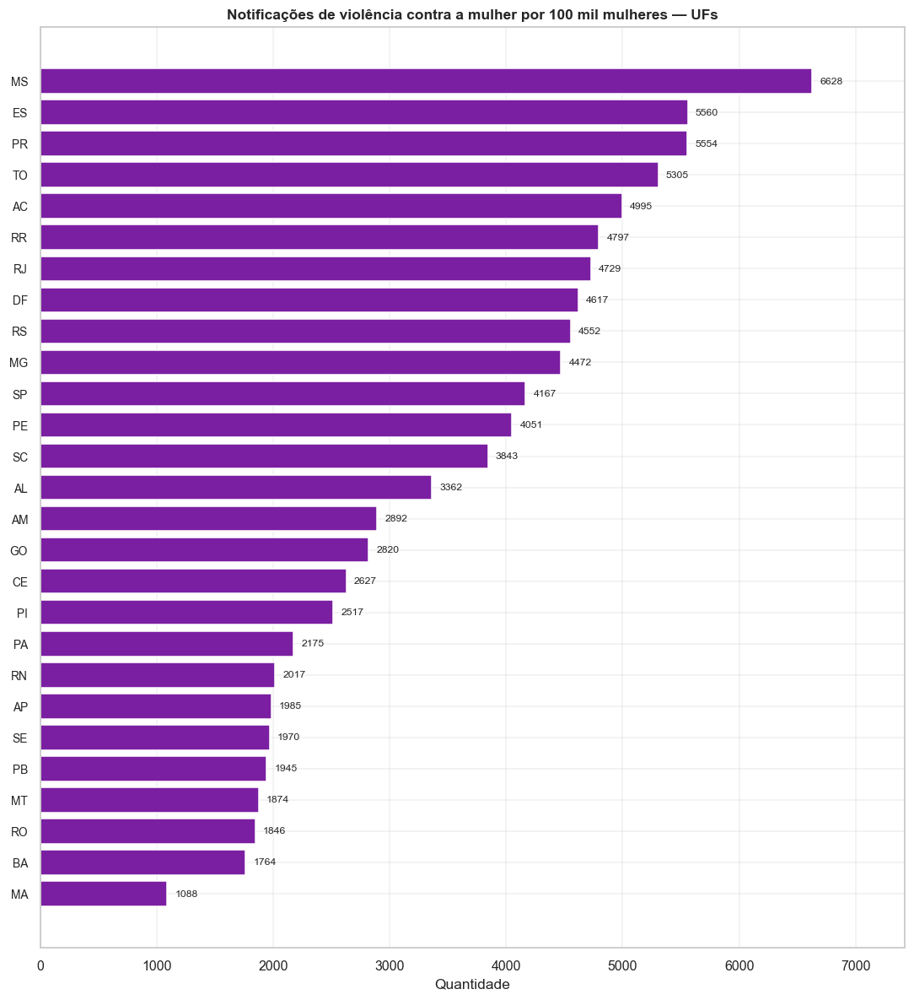


--- Comparação MS × Centro-Oeste × Brasil ----------------------------


,Recorte,Taxa/100k mulheres
0,Mato Grosso do Sul,6628.3
1,Centro-Oeste,3563.1
2,Brasil,3706.9


   📝 Relatório salvo: 28_relatorio_ranking_nacional.txt
   ✅ Ranking nacional concluído.


In [30]:
banner("RANKING NACIONAL — POSIÇÃO DE MS NO BRASIL")


def contar_notificacoes_por_uf() -> pd.Series:
    """Conta notificações por UF lendo `SG_UF_NOT` de todos os CSVs (leve, em chunks)."""
    contagem = Counter()
    encontrou = False
    for ano in CFG.anos:
        caminho = _caminho_csv_local(ano)
        if not caminho.exists():
            continue
        encontrou = True
        try:
            for ch in pd.read_csv(caminho, encoding=CFG.encoding_csv, dtype=str,
                                  usecols=["SG_UF_NOT", "CS_SEXO"],
                                  chunksize=CFG.chunksize, low_memory=False):
                ch = ch[ch["CS_SEXO"].astype(str).str.upper().str.strip() == "F"]
                for uf, n in ch["SG_UF_NOT"].astype(str).str.strip().value_counts().items():
                    contagem[uf] += int(n)
                if CFG.max_linhas_por_ano and sum(contagem.values()) > CFG.max_linhas_por_ano * 27:
                    break
        except Exception as exc:
            aviso("Falha lendo UF de %s: %s", caminho.name, exc)
    if not encontrou:
        return pd.Series(dtype=int)
    return pd.Series(contagem)


serie_uf = contar_notificacoes_por_uf()
if serie_uf.empty:
    aviso("Sem microdados nacionais — estimando ranking a partir dos dados disponíveis.")
    # fallback: distribui proporcionalmente à população feminina (apenas demonstração)
    total_demo = max(len(DF_MULHERES) * 30, 100000)
    serie_uf = pd.Series({cod: int(total_demo * POP_FEM_UF[cod] / sum(POP_FEM_UF.values()))
                          for cod in UFS_BR})
    fonte_nacional = "ESTIMATIVA (proporcional à população — demonstração)"
else:
    fonte_nacional = "Microdados SINAN (SG_UF_NOT)"

# Monta tabela nacional
nac = []
for cod, n in serie_uf.items():
    if cod not in UFS_BR:
        continue
    sigla, nome, regiao, pop = UFS_BR[cod]
    pop_f = POP_FEM_UF[cod]
    nac.append({"UF": sigla, "Estado": nome, "Regiao": regiao,
                "Notificacoes": int(n), "Pop_feminina": pop_f,
                "Taxa_100k": round(int(n) / pop_f * 100_000, 2)})
df_nacional = pd.DataFrame(nac)

# Ranking absoluto e por taxa
rank_nac_abs = df_nacional.sort_values("Notificacoes", ascending=False).reset_index(drop=True)
rank_nac_abs.insert(0, "Pos", rank_nac_abs.index + 1)
rank_nac_taxa = df_nacional.sort_values("Taxa_100k", ascending=False).reset_index(drop=True)
rank_nac_taxa.insert(0, "Pos", rank_nac_taxa.index + 1)

pos_ms_abs = int(rank_nac_abs.index[rank_nac_abs["UF"] == "MS"][0]) + 1 \
    if "MS" in rank_nac_abs["UF"].values else None
pos_ms_taxa = int(rank_nac_taxa.index[rank_nac_taxa["UF"] == "MS"][0]) + 1 \
    if "MS" in rank_nac_taxa["UF"].values else None

print(f"Fonte do ranking nacional: {fonte_nacional}")
show_df(rank_nac_abs.head(15)[["Pos", "UF", "Estado", "Notificacoes", "Taxa_100k"]],
        "Ranking nacional — absoluto (top 15)", max_linhas=15)
show_df(rank_nac_taxa.head(15)[["Pos", "UF", "Estado", "Taxa_100k", "Notificacoes"]],
        "Ranking nacional — por taxa/100 mil mulheres (top 15)", max_linhas=15)
info("Posição de MS: %s (absoluto) | %s (taxa) de %d UFs",
     pos_ms_abs, pos_ms_taxa, len(df_nacional))

barras_horizontais(rank_nac_taxa.set_index("UF")["Taxa_100k"],
                   "Notificações de violência contra a mulher por 100 mil mulheres — UFs",
                   "28_ranking_nacional_taxa", cor=COR_PRIMARIA, fmt="{:.0f}",
                   descricao="Ranking nacional por taxa")

# Comparação MS × Centro-Oeste × Brasil
co = df_nacional[df_nacional["Regiao"] == "Centro-Oeste"]
taxa_br = df_nacional["Notificacoes"].sum() / df_nacional["Pop_feminina"].sum() * 100_000
taxa_co = co["Notificacoes"].sum() / co["Pop_feminina"].sum() * 100_000
taxa_ms_nac = df_nacional.loc[df_nacional["UF"] == "MS", "Taxa_100k"].values
taxa_ms_nac = float(taxa_ms_nac[0]) if len(taxa_ms_nac) else np.nan
df_comp_nac = pd.DataFrame({
    "Recorte": ["Mato Grosso do Sul", "Centro-Oeste", "Brasil"],
    "Taxa/100k mulheres": [round(taxa_ms_nac, 1), round(taxa_co, 1), round(taxa_br, 1)],
})
show_df(df_comp_nac, "Comparação MS × Centro-Oeste × Brasil", max_linhas=3)
salvar_csv(rank_nac_abs, "28_ranking_nacional_absoluto", "Ranking nacional absoluto")
salvar_csv(rank_nac_taxa, "28_ranking_nacional_taxa", "Ranking nacional por taxa")
salvar_csv(df_comp_nac, "28_comparacao_ms_co_br", "Comparação MS/CO/BR")
registrar_planilha("Rank_Nacional_Taxa", rank_nac_taxa)

rel_nac = RelatorioTexto("Relatório de Ranking Nacional")
rel_nac.texto(f"Fonte: {fonte_nacional}")
rel_nac.kv({
    "Posição de MS (absoluto)": pos_ms_abs or "-",
    "Posição de MS (taxa)": pos_ms_taxa or "-",
    "Taxa de MS/100k": f"{taxa_ms_nac:.1f}",
    "Taxa Centro-Oeste/100k": f"{taxa_co:.1f}",
    "Taxa Brasil/100k": f"{taxa_br:.1f}",
}, titulo="Posição de Mato Grosso do Sul")
rel_nac.secao("Ranking por taxa (todas as UFs)")
rel_nac.tabela_df(rank_nac_taxa[["Pos", "UF", "Estado", "Taxa_100k", "Notificacoes"]])
rel_nac.salvar(DIRS["relatorios"] / "28_relatorio_ranking_nacional.txt")
sucesso("Ranking nacional concluído.")

============================================================
## SEÇÃO 29 — Análise geoespacial e mapas de calor
============================================================

Mapas municipais e de calor da violência contra a mulher em MS. Quando o GeoPandas e/ou
uma malha territorial estão disponíveis, são gerados mapas coropléticos; caso contrário,
usamos os **centroides municipais** embutidos para mapas de pontos/calor com Folium, e um
*scatter* georreferenciado com Matplotlib como *fallback* universal. Todos os mapas
interativos são salvos em `.html` e os estáticos em `.png`.


[26] ANÁLISE GEOESPACIAL E MAPAS DE CALOR
   Municípios com coordenadas para mapeamento: 30
   ✅ Mapa Folium salvo: 29_mapa_calor_MS.html


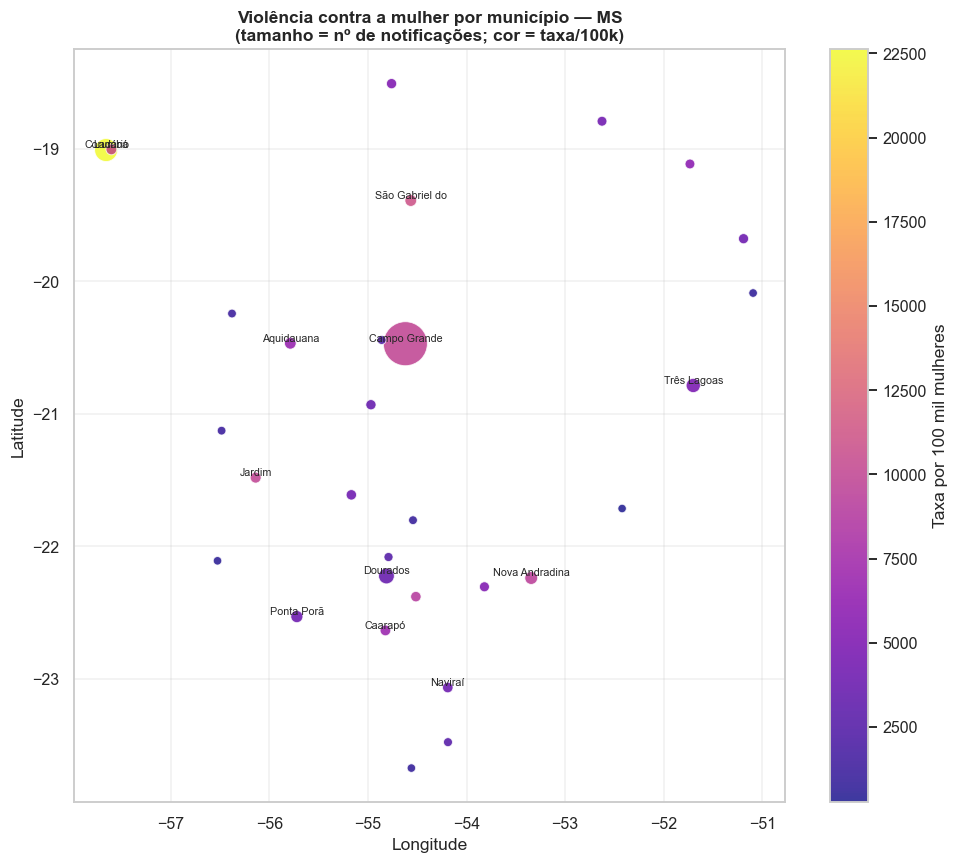

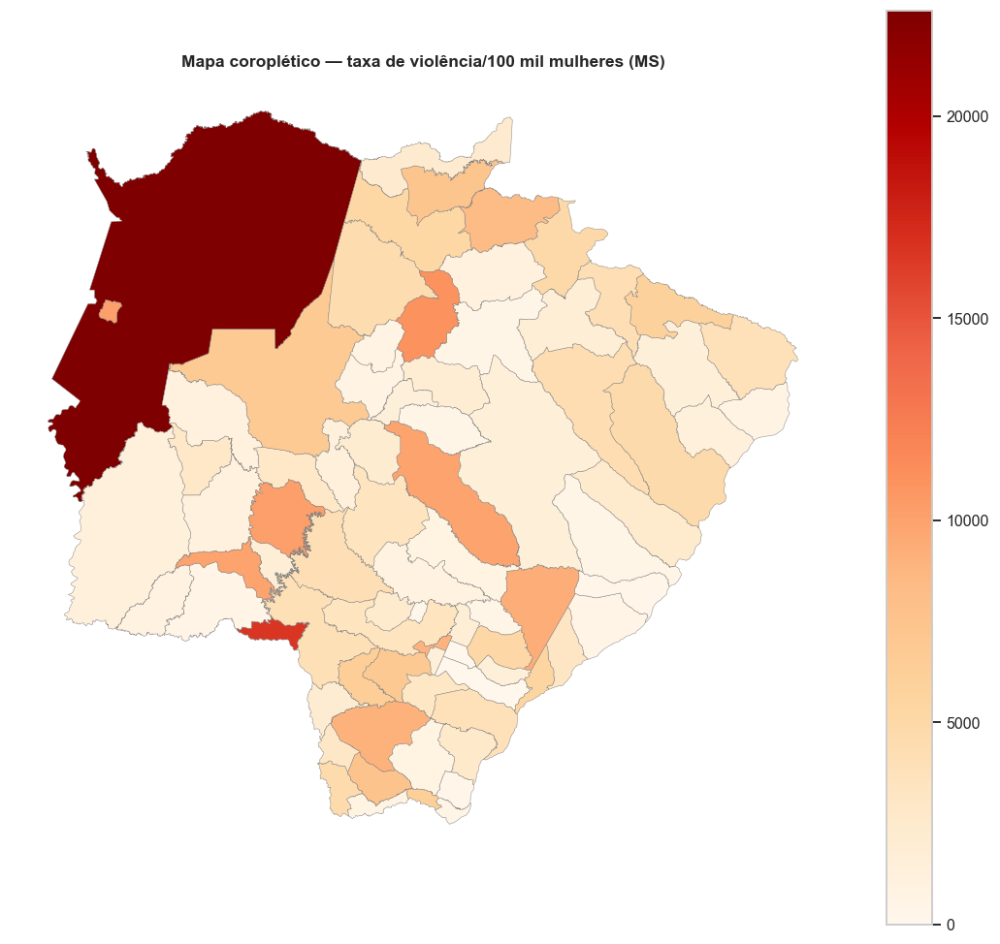

   ✅ Mapa coroplético GeoPandas gerado.
   ✅ Análise geoespacial concluída.


In [31]:
banner("ANÁLISE GEOESPACIAL E MAPAS DE CALOR")

# 29.1  Base municipal georreferenciada (centroides + indicadores do painel)
geo_base = df_painel.copy()
geo_base["lat"] = geo_base["COD_MUN"].map(lambda c: CENTROIDES_MS.get(c, (np.nan, np.nan))[0])
geo_base["lon"] = geo_base["COD_MUN"].map(lambda c: CENTROIDES_MS.get(c, (np.nan, np.nan))[1])
geo_com_coord = geo_base.dropna(subset=["lat", "lon"]).copy()
info("Municípios com coordenadas para mapeamento: %d", len(geo_com_coord))

# 29.2  Mapa interativo Folium (pontos proporcionais + camada de calor)
if CAP.get("folium") and len(geo_com_coord):
    try:
        centro = [-20.5, -54.7]
        m = folium.Map(location=centro, zoom_start=6, tiles="cartodbpositron")
        # camada de calor pela taxa total
        heat = [[r["lat"], r["lon"], float(r["Taxa_Total"] or 0)]
                for _, r in geo_com_coord.iterrows()]
        HeatMap(heat, radius=28, blur=20, name="Mapa de calor (taxa)").add_to(m)
        # marcadores proporcionais ao número absoluto
        grupo = folium.FeatureGroup(name="Municípios (notificações)")
        nmax = geo_com_coord["N_Total"].max() or 1
        for _, r in geo_com_coord.iterrows():
            folium.CircleMarker(
                location=[r["lat"], r["lon"]],
                radius=4 + 16 * (r["N_Total"] / nmax),
                color=COR_PRIMARIA, fill=True, fill_color=COR_SECUNDARIA,
                fill_opacity=0.6,
                popup=folium.Popup(
                    f"<b>{r['Municipio']}</b><br>"
                    f"Notificações: {int(r['N_Total'])}<br>"
                    f"Taxa/100k: {r['Taxa_Total']}<br>"
                    f"Classe risco: {r['Classe_risco']}", max_width=250),
            ).add_to(grupo)
        grupo.add_to(m)
        folium.LayerControl().add_to(m)
        mapa_path = DIRS["mapas"] / "29_mapa_calor_MS.html"
        m.save(str(mapa_path))
        registrar_artefato(mapa_path, "mapa_html", "Mapa de calor interativo (MS)")
        sucesso("Mapa Folium salvo: %s", mapa_path.name)
    except Exception as exc:
        aviso("Falha ao gerar mapa Folium: %s", exc)
else:
    aviso("Folium indisponível ou sem coordenadas — usando fallback Matplotlib.")

# 29.3  Mapa estático (scatter georreferenciado) — fallback universal
if plt is not None and len(geo_com_coord):
    fig, ax = plt.subplots(figsize=(9, 8))
    tamanho = 30 + 800 * (geo_com_coord["N_Total"] / (geo_com_coord["N_Total"].max() or 1))
    sc = ax.scatter(geo_com_coord["lon"], geo_com_coord["lat"], s=tamanho,
                    c=geo_com_coord["Taxa_Total"], cmap="plasma",
                    alpha=0.8, edgecolors="white", linewidths=0.6)
    for _, r in geo_com_coord.nlargest(12, "N_Total").iterrows():
        ax.annotate(r["Municipio"][:14], (r["lon"], r["lat"]),
                    fontsize=7, ha="center", va="bottom")
    plt.colorbar(sc, ax=ax, label="Taxa por 100 mil mulheres")
    ax.set_title("Violência contra a mulher por município — MS\n"
                 "(tamanho = nº de notificações; cor = taxa/100k)")
    ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
    fig.tight_layout()
    salvar_grafico(fig, "29_mapa_estatico_MS", "Mapa estático georreferenciado")

# 29.4  GeoPandas (coroplético) — se houver malha disponível online
gdf_ms = None
if CAP.get("geopandas") and CFG.permitir_download and CAP.get("requests"):
    try:
        url_malha = ("https://servicodados.ibge.gov.br/api/v3/malhas/estados/50"
                     "?formato=application/vnd.geo+json&intrarregiao=municipio")
        gj = requests.get(url_malha, timeout=60).json()
        gdf_ms = gpd.GeoDataFrame.from_features(gj["features"])
        if "codarea" in gdf_ms.columns:
            gdf_ms["COD_MUN"] = gdf_ms["codarea"].astype(str).str[:6]
            gdf_ms = gdf_ms.merge(df_painel, on="COD_MUN", how="left")
            fig, ax = plt.subplots(figsize=(10, 9))
            gdf_ms.plot(column="Taxa_Total", cmap="OrRd", legend=True,
                        edgecolor="grey", linewidth=0.3, ax=ax,
                        missing_kwds={"color": "lightgrey"})
            ax.set_title("Mapa coroplético — taxa de violência/100 mil mulheres (MS)")
            ax.axis("off")
            fig.tight_layout()
            salvar_grafico(fig, "29_mapa_coropletico_MS", "Mapa coroplético (GeoPandas)")
            sucesso("Mapa coroplético GeoPandas gerado.")
    except Exception as exc:
        aviso("Malha IBGE indisponível (%s) — mantendo mapas de pontos.", str(exc)[:60])

salvar_csv(geo_base[["COD_MUN", "Municipio", "lat", "lon", "N_Total",
                     "Taxa_Total", "IMR_0_100", "Classe_risco"]],
           "29_base_geoespacial", "Base geoespacial municipal")
sucesso("Análise geoespacial concluída.")

============================================================
## SEÇÃO 30 — Séries temporais (decomposição e tendência)
============================================================

Construção de uma série temporal **mensal** das notificações de mulheres e sua
decomposição (tendência, sazonalidade, resíduo) quando `statsmodels` está disponível.
Esta série alimenta também os modelos de previsão (Deep Learning) mais adiante.


[27] SÉRIES TEMPORAIS — DECOMPOSIÇÃO E TENDÊNCIA

--- Série mensal (últimos 12 meses) ----------------------------------


,Mês,Notificações
0,2025-01-01,756
1,2025-02-01,758
2,2025-03-01,834
3,2025-04-01,639
4,2025-05-01,777
5,2025-06-01,712
6,2025-07-01,751
7,2025-08-01,789
8,2025-09-01,817
9,2025-10-01,542


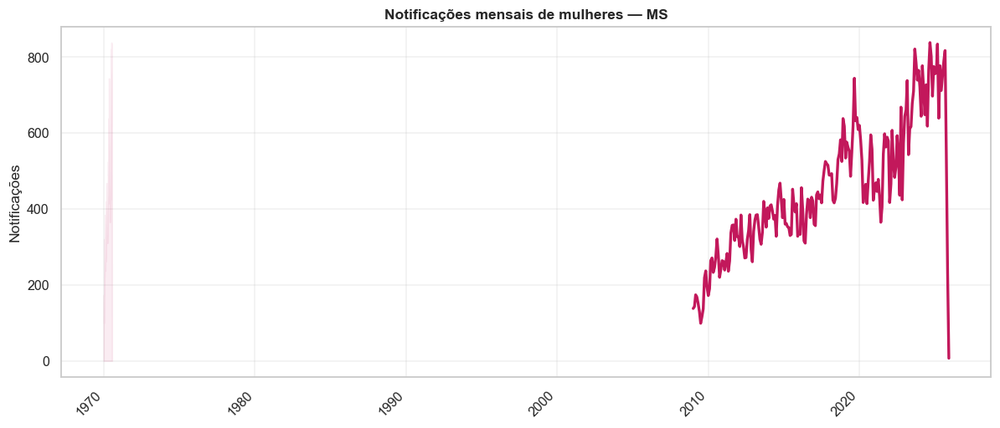

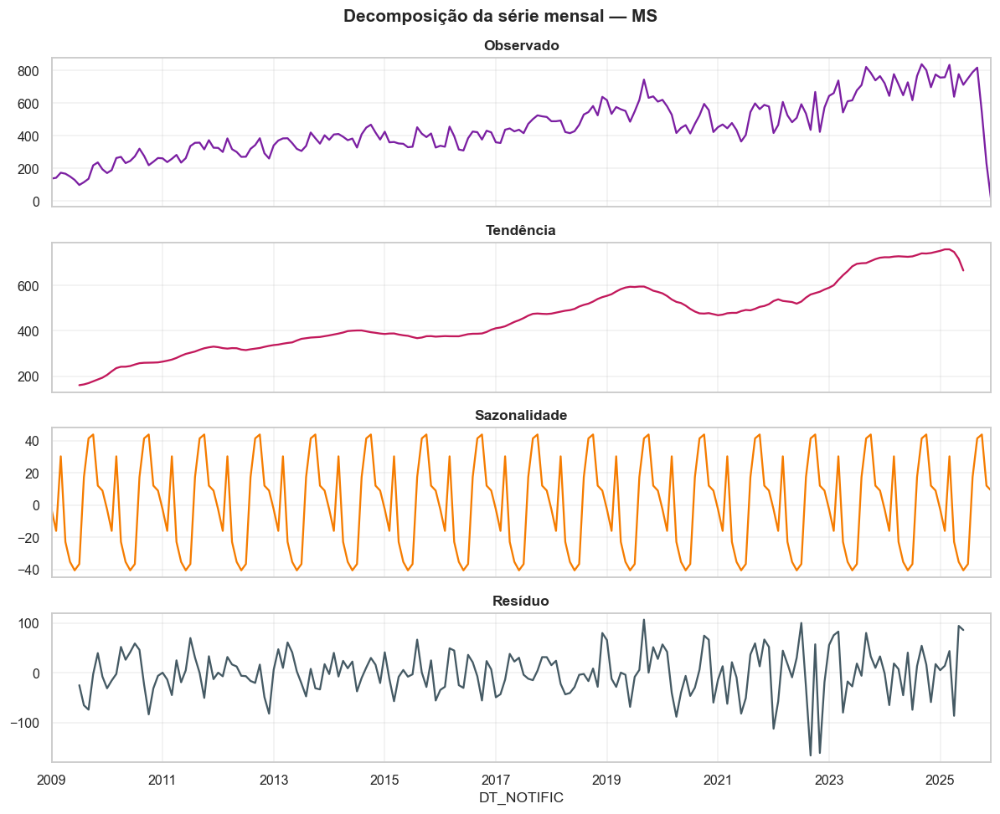

   ✅ Decomposição temporal concluída.


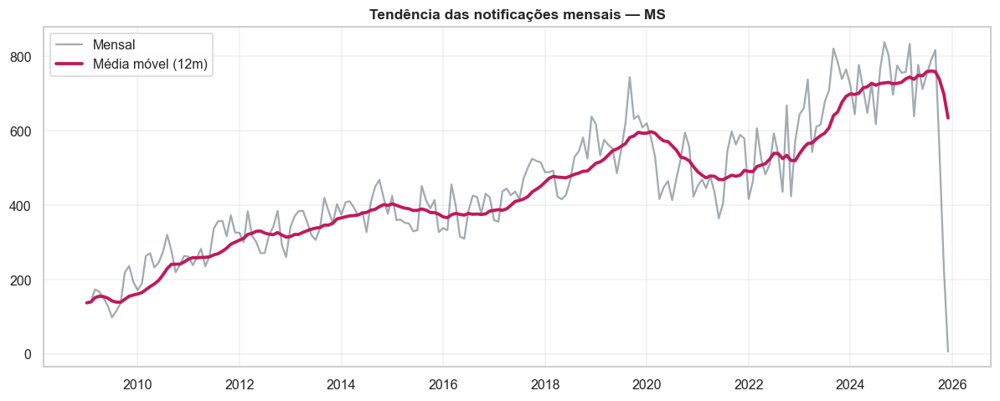

   ✅ Análise de séries temporais concluída.


In [32]:
banner("SÉRIES TEMPORAIS — DECOMPOSIÇÃO E TENDÊNCIA")

# 30.1  Série mensal contínua
serie_mensal = (DF_MULHERES.dropna(subset=["DT_NOTIFIC"])
                .groupby(DF_MULHERES["DT_NOTIFIC"].dt.to_period("M"))
                .size())
if len(serie_mensal) > 3:
    serie_mensal.index = serie_mensal.index.to_timestamp()
    serie_mensal = serie_mensal.asfreq("MS").fillna(0)
    show_df(serie_mensal.tail(12).rename_axis("Mês").reset_index(name="Notificações"),
            "Série mensal (últimos 12 meses)", max_linhas=12)
    linha_temporal(serie_mensal, "Notificações mensais de mulheres — MS",
                   "30_serie_mensal", ylabel="Notificações", marcar=False,
                   descricao="Série temporal mensal")
    salvar_csv(serie_mensal.rename_axis("mes").reset_index(name="notificacoes"),
               "30_serie_mensal", "Série temporal mensal")

    # 30.2  Decomposição clássica
    if CAP.get("statsmodels") and len(serie_mensal) >= 24:
        try:
            dec = seasonal_decompose(serie_mensal, model="additive", period=12)
            if plt is not None:
                fig, axes = plt.subplots(4, 1, figsize=(11, 9), sharex=True)
                dec.observed.plot(ax=axes[0], color=COR_PRIMARIA, title="Observado")
                dec.trend.plot(ax=axes[1], color=COR_SECUNDARIA, title="Tendência")
                dec.seasonal.plot(ax=axes[2], color=COR_DESTAQUE, title="Sazonalidade")
                dec.resid.plot(ax=axes[3], color=COR_NEUTRA, title="Resíduo")
                fig.suptitle("Decomposição da série mensal — MS", fontweight="bold")
                fig.tight_layout()
                salvar_grafico(fig, "30_decomposicao", "Decomposição da série")
            sucesso("Decomposição temporal concluída.")
        except Exception as exc:
            aviso("Falha na decomposição: %s", exc)

    # 30.3  Média móvel (tendência suavizada)
    if plt is not None:
        mm = serie_mensal.rolling(12, min_periods=1).mean()
        fig, ax = plt.subplots(figsize=(11, 4.5))
        ax.plot(serie_mensal.index, serie_mensal.values, color=COR_NEUTRA,
                alpha=0.5, label="Mensal")
        ax.plot(mm.index, mm.values, color=COR_SECUNDARIA, linewidth=2.5,
                label="Média móvel (12m)")
        ax.set_title("Tendência das notificações mensais — MS"); ax.legend()
        fig.tight_layout()
        salvar_grafico(fig, "30_media_movel", "Tendência (média móvel)")
else:
    aviso("Série mensal muito curta para decomposição.")
    serie_mensal = pd.Series(dtype=float)

sucesso("Análise de séries temporais concluída.")

============================================================
## SEÇÃO 30.0 — Registro de modelos e matriz de atributos (pré-modelagem)
============================================================

Definimos aqui — antes das análises avançadas e da modelagem — o **registro de modelos**
(`MODELOS`/`registrar_modelo`) e a **matriz de atributos** município × ano (`PAINEL`),
pois ambos são utilizados tanto pelos índices avançados (Seção 30.F/30.H) quanto pelos
modelos de ML/DL (Seções 31+).

In [33]:
banner("REGISTRO DE MODELOS E MATRIZ DE ATRIBUTOS (PRÉ-MODELAGEM)")

# Registro global de modelos
MODELOS = []


def registrar_modelo(nome: str, familia: str, tarefa: str, metricas: dict,
                     tempo_s: float = None, obs: str = "") -> None:
    """Registra um modelo treinado e suas métricas no `MODELOS` global."""
    reg = {"Modelo": nome, "Família": familia, "Tarefa": tarefa,
           "Tempo_s": round(tempo_s, 3) if tempo_s is not None else None,
           "Observação": obs}
    for k, v in metricas.items():
        reg[k] = round(v, 4) if isinstance(v, (int, float)) and not isinstance(v, bool) else v
    MODELOS.append(reg)
    met_txt = " | ".join(f"{k}={v:.3f}" if isinstance(v, float) else f"{k}={v}"
                         for k, v in metricas.items())
    info("🧠 %-26s [%s] %s", nome, tarefa, met_txt)


# Painel município × ano (matriz de atributos)
def construir_painel_mun_ano() -> pd.DataFrame:
    """Agrega DF_MULHERES por município e ano, criando atributos para modelagem."""
    base = DF_MULHERES.dropna(subset=["ANO"]).copy()
    base["ANO"] = base["ANO"].astype(int)
    grp = base.groupby(["COD_MUN", "ANO"])
    painel = grp.agg(
        n_total=("FL_FEMININO", "sum"),
        n_domestica=("FL_VIOL_DOMESTICA", "sum"),
        n_fisica=("FL_VIOL_FISIC", "sum"),
        n_psico=("FL_VIOL_PSICOLOGICA", "sum"),
        n_sexual=("FL_VIOL_SEXUAL", "sum"),
        n_estupro=("FL_ESTUPRO", "sum"),
        n_ameaca=("FL_AMEACA", "sum"),
        n_feminicidio=("FL_FEMINICIDIO", "sum"),
        n_obito=("FL_OBITO_VIOLENCIA", "sum"),
        n_parceiro=("FL_PARCEIRO_INTIMO", "sum"),
        n_familiar=("FL_FAMILIAR", "sum"),
        n_reincidencia=("FL_REINCIDENCIA", "sum"),
        idade_media=("IDADE", "mean"),
        n_negra=("RACA_COR", lambda s: int((s.isin(["Preta", "Parda"])).sum())),
        n_jovem=("IDADE", lambda s: int((s < 30).sum())),
    ).reset_index()
    painel["Municipio"] = painel["COD_MUN"].map(MUNICIPIOS_MS)
    painel = painel.dropna(subset=["Municipio"])
    painel["pop_feminina"] = painel["COD_MUN"].map(POP_FEM_MUN_MS)
    painel = painel.dropna(subset=["pop_feminina"])
    tot = painel["n_total"].replace(0, np.nan)
    painel["pct_domestica"] = (painel["n_domestica"] / tot).fillna(0)
    painel["pct_sexual"] = (painel["n_sexual"] / tot).fillna(0)
    painel["pct_parceiro"] = (painel["n_parceiro"] / tot).fillna(0)
    painel["pct_familiar"] = (painel["n_familiar"] / tot).fillna(0)
    painel["pct_negra"] = (painel["n_negra"] / tot).fillna(0)
    painel["pct_jovem"] = (painel["n_jovem"] / tot).fillna(0)
    painel["idade_media"] = painel["idade_media"].fillna(painel["idade_media"].median())
    painel["taxa_total"] = painel["n_total"] / painel["pop_feminina"] * 100_000
    painel["taxa_domestica"] = painel["n_domestica"] / painel["pop_feminina"] * 100_000
    painel["taxa_sexual"] = painel["n_sexual"] / painel["pop_feminina"] * 100_000
    painel = painel.sort_values(["COD_MUN", "ANO"])
    painel["n_total_lag1"] = painel.groupby("COD_MUN")["n_total"].shift(1).fillna(0)
    painel["cresc_abs"] = painel["n_total"] - painel["n_total_lag1"]
    return painel.reset_index(drop=True)


PAINEL = construir_painel_mun_ano()
info("Painel município × ano: %s linhas × %s colunas", len(PAINEL), PAINEL.shape[1])
show_df(PAINEL.head(8), "Amostra do painel município × ano", max_linhas=8)
salvar_csv(PAINEL, "31_painel_municipio_ano", "Matriz de atributos (município × ano)")
registrar_planilha("Painel_Mun_Ano", PAINEL)
sucesso("Registro de modelos e painel prontos.")


[28] REGISTRO DE MODELOS E MATRIZ DE ATRIBUTOS (PRÉ-MODELAGEM)
   Painel município × ano: 994 linhas × 30 colunas

--- Amostra do painel município × ano --------------------------------


,COD_MUN,ANO,n_total,n_domestica,n_fisica,n_psico,n_sexual,n_estupro,n_ameaca,n_feminicidio,...,pct_sexual,pct_parceiro,pct_familiar,pct_negra,pct_jovem,taxa_total,taxa_domestica,taxa_sexual,n_total_lag1,cresc_abs
0,500020,2010,1,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,1.000000,1.000000,11.866619,0.000000,0.000000,0.0,1.0
1,500020,2011,67,48,44,22,6,2,20,0,...,0.089552,0.164179,0.298507,0.791045,0.850746,795.063486,569.597722,71.199715,1.0,66.0
2,500020,2012,44,31,28,19,6,2,5,0,...,0.136364,0.295455,0.227273,0.727273,0.818182,522.131245,367.865195,71.199715,67.0,-23.0
3,500020,2013,17,10,17,2,0,0,2,0,...,0.000000,0.411765,0.058824,0.588235,0.470588,201.732526,118.666192,0.000000,44.0,-27.0
4,500020,2014,4,4,4,1,0,0,0,0,...,0.000000,0.500000,0.000000,1.000000,1.000000,47.466477,47.466477,0.000000,17.0,-13.0
5,500020,2015,1,0,1,0,0,0,0,0,...,0.000000,0.000000,0.000000,1.000000,0.000000,11.866619,0.000000,0.000000,4.0,-3.0
6,500020,2017,46,38,45,1,1,1,0,0,...,0.021739,0.413043,0.108696,0.891304,0.695652,545.864483,450.931530,11.866619,1.0,45.0
7,500020,2018,73,61,67,2,6,2,7,0,...,0.082192,0.383562,0.095890,0.794521,0.698630,866.263202,723.863771,71.199715,46.0,27.0


   ✅ Registro de modelos e painel prontos.


============================================================
## SEÇÃO 30.A — Dicionário de dados e proveniência das fontes
============================================================

Conforme as Seções 2 e 16 do plano (registro de origem e *dicionário de dados*), esta
seção documenta: (1) a **proveniência** de cada arquivo processado (origem, período,
formato, nº de registros) e (2) um **dicionário de dados** das variáveis utilizadas,
com a respectiva decodificação. Ambos são exibidos inline e exportados.

In [34]:
banner("DICIONÁRIO DE DADOS E PROVENIÊNCIA DAS FONTES")

# 30.A.1  Proveniência (uma linha por ano processado)
prov = []
for r in relatorio_ingestao:
    ano = r["ano"]
    caminho = _caminho_csv_local(ano)
    prov.append({
        "Fonte": "SINAN-VIOL / DATASUS",
        "Arquivo": f"VIOLBR{str(ano)[2:]}.csv",
        "Ano": ano,
        "Origem": r.get("origem", "-"),
        "Formato": "CSV (latin-1)",
        "Registros_MS": r.get("registros_ms", 0),
        "Coletado_em": datetime.now().strftime("%Y-%m-%d"),
        "Existe_local": caminho.exists(),
        "Tamanho_MB": round(caminho.stat().st_size / 1e6, 1) if caminho.exists() else 0.0,
    })
df_prov = pd.DataFrame(prov)
show_df(df_prov, "Proveniência dos arquivos processados", max_linhas=30)
salvar_csv(df_prov, "30A_proveniencia_fontes", "Proveniência das fontes de dados")
registrar_planilha("Proveniencia_Fontes", df_prov)

rel_prov = RelatorioTexto("Relatório de Proveniência das Fontes")
rel_prov.texto("Registro de origem, período, formato e volume de cada base processada.")
rel_prov.tabela_df(df_prov)
rel_prov.kv({
    "Sistema": "SINAN — Sistema de Informação de Agravos de Notificação",
    "Agravo": "Violência Doméstica, Sexual e/ou Outras Violências (VIOL)",
    "Gestor": "Ministério da Saúde — SVSA/DATASUS",
    "Espelho CSV": "github.com/OpenScienceTechnology/Microdados_SINAN-DATASUS",
    "Total de arquivos": len(df_prov),
    "Total de registros (MS)": formato_numero(int(df_prov["Registros_MS"].sum())),
}, titulo="Metadados da base")
rel_prov.salvar(DIRS["relatorios"] / "30A_relatorio_proveniencia.txt")

# 30.A.2  Dicionário de dados (variáveis utilizadas e sua decodificação)
DICIONARIO_VARIAVEIS = {
    "TP_NOT": ("Tipo de notificação", "2=Individual"),
    "ID_AGRAVO": ("Código do agravo (CID)", "Y09 = violência"),
    "DT_NOTIFIC": ("Data da notificação", "AAAA-MM-DD"),
    "NU_ANO": ("Ano da notificação", "inteiro"),
    "SG_UF_NOT": ("UF de notificação", "código IBGE da UF (50=MS)"),
    "ID_MUNICIP": ("Município de notificação", "código IBGE 6 dígitos"),
    "ID_MN_RESI": ("Município de residência", "código IBGE 6 dígitos"),
    "ID_MN_OCOR": ("Município de ocorrência", "código IBGE 6 dígitos"),
    "DT_OCOR": ("Data da ocorrência", "AAAA-MM-DD"),
    "HORA_OCOR": ("Hora da ocorrência", "HH:MM"),
    "LOCAL_OCOR": ("Local de ocorrência", "ver DICT_LOCAL_OCOR"),
    "NU_IDADE_N": ("Idade codificada", "4XXX=anos,3XXX=meses,2XXX=dias"),
    "CS_SEXO": ("Sexo da vítima", "F/M/I"),
    "CS_RACA": ("Raça/cor da vítima", "ver DICT_RACA"),
    "CS_ESCOL_N": ("Escolaridade da vítima", "ver DICT_ESCOLARIDADE"),
    "CS_GESTANT": ("Gestação", "ver DICT_GESTANTE"),
    "SIT_CONJUG": ("Situação conjugal", "ver DICT_SIT_CONJUGAL"),
    "ORIENT_SEX": ("Orientação sexual", "ver DICT_ORIENT_SEXUAL"),
    "IDENT_GEN": ("Identidade de gênero", "ver DICT_IDENT_GENERO"),
    "CICL_VID": ("Ciclo de vida", "ver DICT_CICLO_VIDA"),
    "OUT_VEZES": ("Violência ocorreu outras vezes", "1=Sim,2=Não,9=Ign."),
    "LES_AUTOP": ("Lesão autoprovocada", "1=Sim,2=Não,9=Ign."),
    "AUTOR_SEXO": ("Sexo do provável autor", "ver DICT_AUTOR_SEXO"),
    "AUTOR_ALCO": ("Suspeita de álcool (autor)", "1=Sim,2=Não,9=Ign."),
    "EVOLUCAO": ("Evolução do caso", "ver DICT_EVOLUCAO"),
    "CLASSI_FIN": ("Classificação final", "1=Confirmado,2=Descartado"),
}
for c in COLS_VIOL:
    DICIONARIO_VARIAVEIS[c] = (f"Violência: {MAP_VIOL[c]}", "1=Sim,2=Não")
for c in COLS_SEXUAL:
    DICIONARIO_VARIAVEIS[c] = (f"Natureza sexual: {MAP_SEXUAL[c]}", "1=Sim,2=Não")
for c in COLS_AGRESSAO:
    DICIONARIO_VARIAVEIS[c] = (f"Meio de agressão: {MAP_AGRESSAO[c]}", "1=Sim,2=Não")
for c in COLS_RELACAO:
    DICIONARIO_VARIAVEIS[c] = (f"Vínculo: {MAP_RELACAO[c]}", "1=Sim,2=Não")

dic_linhas = []
for var, (desc, dom) in DICIONARIO_VARIAVEIS.items():
    presente = var in df_raw.columns
    compl = round(df_raw[var].notna().mean() * 100, 1) if presente else 0.0
    dic_linhas.append({"Variável": var, "Descrição": desc, "Domínio/Decodificação": dom,
                       "Presente": presente, "Completude_%": compl})
df_dic = pd.DataFrame(dic_linhas)
show_df(df_dic, "Dicionário de dados (variáveis utilizadas)", max_linhas=40)
salvar_csv(df_dic, "30A_dicionario_dados", "Dicionário de dados das variáveis")
registrar_planilha("Dicionario_Dados", df_dic)

rel_dic = RelatorioTexto("Dicionário de Dados — SINAN-VIOL")
rel_dic.texto("Variáveis utilizadas, descrição, domínio e completude observada.")
rel_dic.tabela_df(df_dic, max_linhas=120)
rel_dic.salvar(DIRS["relatorios"] / "30A_dicionario_dados.txt")
sucesso("Dicionário de dados e proveniência concluídos.")


[29] DICIONÁRIO DE DADOS E PROVENIÊNCIA DAS FONTES

--- Proveniência dos arquivos processados ----------------------------


,Fonte,Arquivo,Ano,Origem,Formato,Registros_MS,Coletado_em,Existe_local,Tamanho_MB
0,SINAN-VIOL / DATASUS,VIOLBR09.csv,2009,csv_local/download,CSV (latin-1),2905,2026-06-21,True,15.0
1,SINAN-VIOL / DATASUS,VIOLBR10.csv,2010,csv_local/download,CSV (latin-1),4407,2026-06-21,True,27.1
2,SINAN-VIOL / DATASUS,VIOLBR11.csv,2011,csv_local/download,CSV (latin-1),5412,2026-06-21,True,39.7
3,SINAN-VIOL / DATASUS,VIOLBR12.csv,2012,csv_local/download,CSV (latin-1),5628,2026-06-21,True,57.9
4,SINAN-VIOL / DATASUS,VIOLBR13.csv,2013,csv_local/download,CSV (latin-1),6589,2026-06-21,True,70.0
5,SINAN-VIOL / DATASUS,VIOLBR14.csv,2014,csv_local/download,CSV (latin-1),7303,2026-06-21,True,73.5
6,SINAN-VIOL / DATASUS,VIOLBR15.csv,2015,csv_local/download,CSV (latin-1),7117,2026-06-21,True,84.2
7,SINAN-VIOL / DATASUS,VIOLBR16.csv,2016,csv_local/download,CSV (latin-1),7113,2026-06-21,True,89.2
8,SINAN-VIOL / DATASUS,VIOLBR17.csv,2017,csv_local/download,CSV (latin-1),8354,2026-06-21,True,112.6
9,SINAN-VIOL / DATASUS,VIOLBR18.csv,2018,csv_local/download,CSV (latin-1),9313,2026-06-21,True,129.3


   📝 Relatório salvo: 30A_relatorio_proveniencia.txt

--- Dicionário de dados (variáveis utilizadas) -----------------------


,Variável,Descrição,Domínio/Decodificação,Presente,Completude_%
0,TP_NOT,Tipo de notificação,2=Individual,True,0.0
1,ID_AGRAVO,Código do agravo (CID),Y09 = violência,True,100.0
2,DT_NOTIFIC,Data da notificação,AAAA-MM-DD,True,100.0
3,NU_ANO,Ano da notificação,inteiro,True,93.3
4,SG_UF_NOT,UF de notificação,código IBGE da UF (50=MS),True,100.0
5,ID_MUNICIP,Município de notificação,código IBGE 6 dígitos,True,100.0
6,ID_MN_RESI,Município de residência,código IBGE 6 dígitos,True,99.9
7,ID_MN_OCOR,Município de ocorrência,código IBGE 6 dígitos,True,99.2
8,DT_OCOR,Data da ocorrência,AAAA-MM-DD,True,99.8
9,HORA_OCOR,Hora da ocorrência,HH:MM,True,62.3


   ... (69 linhas no total; exibindo as 40 primeiras)
   📝 Relatório salvo: 30A_dicionario_dados.txt
   ✅ Dicionário de dados e proveniência concluídos.


============================================================
## SEÇÃO 30.B — Município de residência × ocorrência (fluxo)
============================================================

Compara o município de **residência** da vítima (`ID_MN_RESI`) com o de **ocorrência**
(`ID_MN_OCOR`)/notificação, permitindo identificar deslocamentos e a parcela de casos em
que vítima e fato estão no mesmo município.


[30] MUNICÍPIO DE RESIDÊNCIA × OCORRÊNCIA
   Casos com residência = ocorrência: 98.2%
   Casos com deslocamento entre municípios: 1.8%

--- Municípios que mais recebem casos de não residentes --------------


,Município (ocorrência),Casos de não residentes
0,Corumbá,319
1,Campo Grande,234
2,Dourados,93
3,Ladário,65
4,Aquidauana,65
5,Jardim,53
6,Nova Andradina,51
7,Sidrolândia,50
8,São Gabriel do Oeste,44
9,Fátima do Sul,37


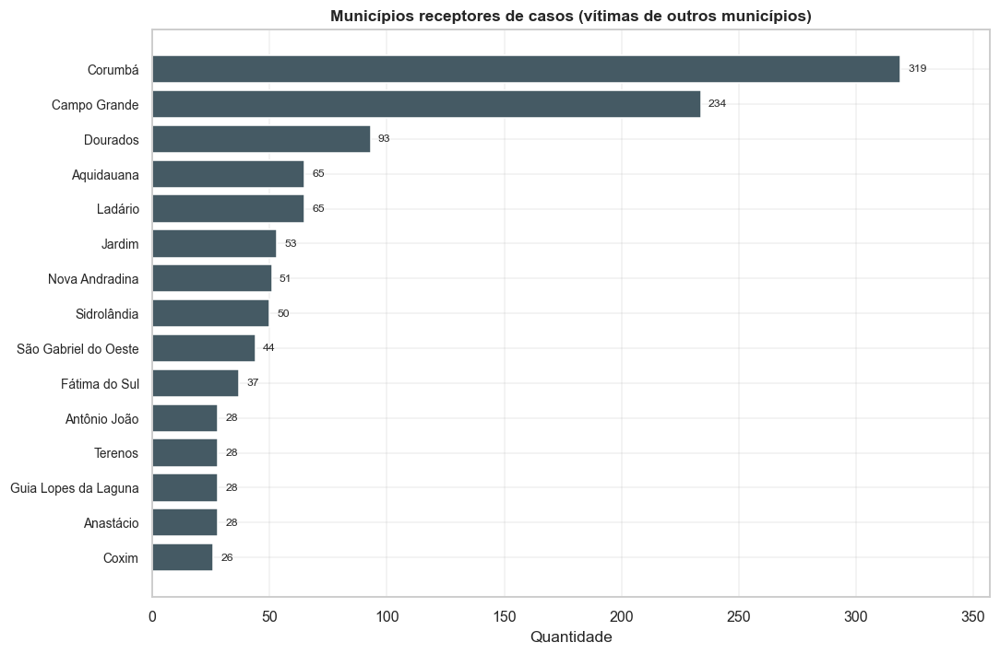

   ✅ Análise de residência × ocorrência concluída.


In [35]:
banner("MUNICÍPIO DE RESIDÊNCIA × OCORRÊNCIA")

base_fluxo = DF_MULHERES.copy()
base_fluxo["COD_RESI"] = (base_fluxo["ID_MN_RESI"].astype(str)
                          .str.replace(r"\.0$", "", regex=True).str.strip().str.zfill(6))
base_fluxo["COD_OCOR"] = (base_fluxo["ID_MN_OCOR"].astype(str)
                          .str.replace(r"\.0$", "", regex=True).str.strip().str.zfill(6))
validos = base_fluxo[(base_fluxo["COD_RESI"].isin(MUNICIPIOS_MS))
                     & (base_fluxo["COD_OCOR"].isin(MUNICIPIOS_MS))]
if len(validos):
    mesmo = (validos["COD_RESI"] == validos["COD_OCOR"]).mean() * 100
    info("Casos com residência = ocorrência: %.1f%%", mesmo)
    info("Casos com deslocamento entre municípios: %.1f%%", 100 - mesmo)
    # municípios que mais "recebem" ocorrências de não residentes
    desloc = validos[validos["COD_RESI"] != validos["COD_OCOR"]]
    recebem = (desloc["COD_OCOR"].map(MUNICIPIOS_MS).value_counts().head(15))
    if len(recebem):
        show_df(recebem.rename_axis("Município (ocorrência)")
                .reset_index(name="Casos de não residentes"),
                "Municípios que mais recebem casos de não residentes", max_linhas=15)
        barras_horizontais(recebem,
                           "Municípios receptores de casos (vítimas de outros municípios)",
                           "30B_municipios_receptores", cor=COR_NEUTRA,
                           descricao="Fluxo residência→ocorrência")
    df_fluxo = pd.DataFrame({
        "Indicador": ["Mesmo município", "Deslocamento", "Casos válidos (geo)"],
        "Valor": [f"{mesmo:.1f}%", f"{100 - mesmo:.1f}%", len(validos)],
    })
    salvar_csv(df_fluxo, "30B_residencia_ocorrencia", "Residência × ocorrência")
else:
    aviso("Sem dados válidos de residência/ocorrência para o fluxo.")
sucesso("Análise de residência × ocorrência concluída.")

============================================================
## SEÇÃO 30.C — Resposta institucional e "medidas protetivas"
============================================================

O SINAN **não** registra medidas protetivas (campo típico de bases da Justiça/segurança
pública). Como **proxy de resposta institucional**, analisamos os **encaminhamentos** da
rede — em especial os ligados à proteção e à Justiça (DEAM/Delegacia da Mulher, MPU,
Delegacia, Casa Abrigo, CREAS, Centro de Referência da Mulher). Construímos um **Índice
de Resposta Institucional (IRI)** municipal e cruzamos com o volume de violência, para
sinalizar possíveis **lacunas de proteção** (alta violência e baixa resposta).


[31] RESPOSTA INSTITUCIONAL (PROXY DE MEDIDAS PROTETIVAS)

--- Encaminhamentos da rede de proteção (mulheres) -------------------


,Encaminhamento,Notificações
0,Rede de saúde,12544
1,DEAM (Deleg. Mulher),4207
2,Outro encaminhamento,3803
3,Delegacia comum,3488
4,Conselho tutelar,3386
5,CREAS,2041
6,Centro de ref. da mulher,1024
7,IML,955
8,Deleg. de prot. à criança/adolesc.,871
9,Vara da infância/juventude,415


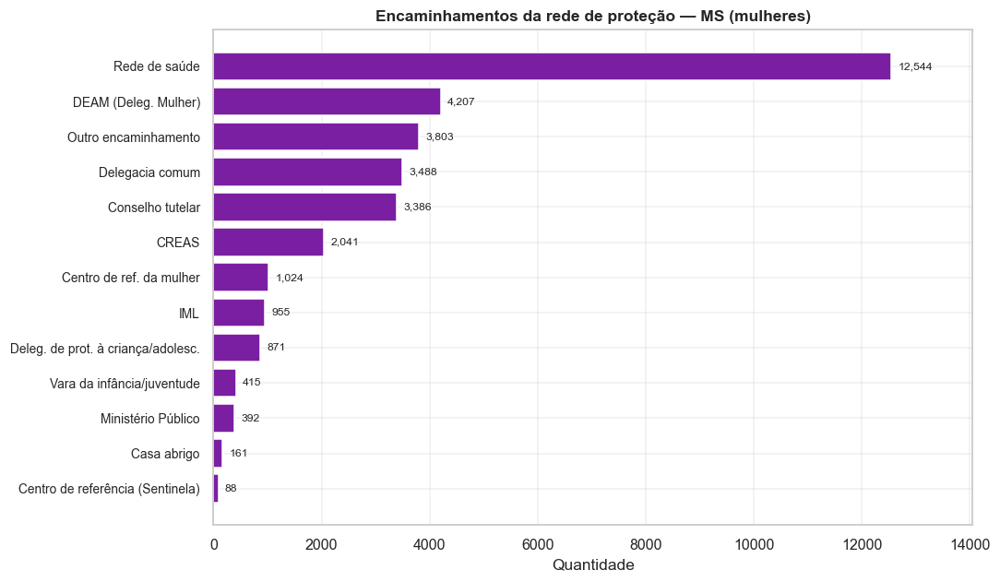

   Notificações com encaminhamento de proteção/Justiça: 9.6%

--- Índice de Resposta Institucional (IRI) — maiores -----------------


,Municipio,n_total,n_protecao,IRI_%
18,Camapuã,28,19,67.9
69,Sete Quedas,47,29,61.7
45,Juti,103,51,49.5
44,Jardim,1197,497,41.5
28,Deodápolis,123,36,29.3
14,Bodoquena,123,31,25.2
43,Jaraguari,16,4,25.0
0,Água Clara,366,89,24.3
71,Sidrolândia,835,197,23.6
67,Santa Rita do Pardo,17,4,23.5



--- Possíveis LACUNAS de proteção (alta violência + baixa resposta) --


,Municipio,Taxa_Total,IRI_%
66,Amambai,9032.13,0.7
47,Tacuru,7664.03,5.8
45,Caarapó,6969.50,6.1
44,Aquidauana,6727.22,6.1
55,Laguna Carapã,6427.11,4.1
52,Japorã,6143.34,4.8
58,Taquarussu,5534.25,4.0
53,Coxim,5214.70,4.7
50,Ivinhema,5169.58,5.4
63,Costa Rica,4882.89,1.9


   📝 Relatório salvo: 30C_relatorio_resposta_institucional.txt
   ✅ Análise de resposta institucional concluída.


In [36]:
banner("RESPOSTA INSTITUCIONAL (PROXY DE MEDIDAS PROTETIVAS)")

# 30.C.1  Frequência de encaminhamentos
freq_enc = {MAP_ENCAMINHAMENTO[c]: int(DF_MULHERES[f"FL_{c}"].sum())
            for c in COLS_ENCAMINHAMENTO}
serie_enc = pd.Series(freq_enc).sort_values(ascending=False)
show_df(serie_enc.rename_axis("Encaminhamento").reset_index(name="Notificações"),
        "Encaminhamentos da rede de proteção (mulheres)", max_linhas=15)
barras_horizontais(serie_enc, "Encaminhamentos da rede de proteção — MS (mulheres)",
                   "30C_encaminhamentos", cor=COR_PRIMARIA,
                   descricao="Encaminhamentos da rede")
salvar_csv(serie_enc.rename_axis("Encaminhamento").reset_index(name="Notificacoes"),
           "30C_encaminhamentos", "Encaminhamentos da rede de proteção")

# 30.C.2  Encaminhamentos ligados a proteção/Justiça (proxy de medida protetiva)
ENC_PROTECAO = ["ENC_DEAM", "ENC_DELEG", "ENC_MPU", "ENC_ABRIGO",
                "ENC_MULHER", "ENC_CREAS"]
DF_MULHERES["FL_RESPOSTA_PROTECAO"] = (
    DF_MULHERES[[f"FL_{c}" for c in ENC_PROTECAO if f"FL_{c}" in DF_MULHERES.columns]]
    .max(axis=1))
pct_protecao = 100 * DF_MULHERES["FL_RESPOSTA_PROTECAO"].mean()
info("Notificações com encaminhamento de proteção/Justiça: %.1f%%", pct_protecao)

# 30.C.3  Índice de Resposta Institucional (IRI) por município
iri = (DF_MULHERES.groupby("COD_MUN")
       .agg(n_total=("FL_FEMININO", "sum"),
            n_protecao=("FL_RESPOSTA_PROTECAO", "sum"),
            n_encaminhado=("N_ENCAMINHAMENTOS", lambda s: int((s > 0).sum())))
       .reset_index())
iri["Municipio"] = iri["COD_MUN"].map(MUNICIPIOS_MS)
iri = iri.dropna(subset=["Municipio"])
iri["IRI_%"] = (iri["n_protecao"] / iri["n_total"].replace(0, np.nan) * 100).round(1)
iri = iri[iri["n_total"] >= 5].sort_values("IRI_%", ascending=False)
show_df(iri.head(15)[["Municipio", "n_total", "n_protecao", "IRI_%"]],
        "Índice de Resposta Institucional (IRI) — maiores", max_linhas=15)

# 30.C.4  Lacunas de proteção: alta violência (taxa) e baixa resposta (IRI)
lacuna = iri.merge(df_painel[["COD_MUN", "Taxa_Total"]], on="COD_MUN", how="left")
mediana_iri = lacuna["IRI_%"].median()
mediana_taxa = lacuna["Taxa_Total"].median()
lacuna["Lacuna_protecao"] = ((lacuna["Taxa_Total"] > mediana_taxa)
                             & (lacuna["IRI_%"] < mediana_iri))
municipios_lacuna = lacuna[lacuna["Lacuna_protecao"]].sort_values(
    "Taxa_Total", ascending=False)
show_df(municipios_lacuna[["Municipio", "Taxa_Total", "IRI_%"]].head(15),
        "Possíveis LACUNAS de proteção (alta violência + baixa resposta)", max_linhas=15)
salvar_csv(lacuna, "30C_resposta_institucional", "Resposta institucional e lacunas")
registrar_planilha("Resposta_Institucional", lacuna)

rel_iri = RelatorioTexto("Relatório de Resposta Institucional (proxy)")
rel_iri.texto("O SINAN não possui campo de medida protetiva; usa-se a rede de "
              "encaminhamentos como proxy de resposta institucional.")
rel_iri.kv({
    "% com encaminhamento de proteção": f"{pct_protecao:.1f}%",
    "IRI mediano (municípios)": f"{mediana_iri:.1f}%",
    "Municípios com lacuna de proteção": len(municipios_lacuna),
}, titulo="Síntese")
rel_iri.secao("Municípios com possível lacuna de proteção")
rel_iri.tabela_df(municipios_lacuna[["Municipio", "Taxa_Total", "IRI_%"]].head(15))
rel_iri.salvar(DIRS["relatorios"] / "30C_relatorio_resposta_institucional.txt")
sucesso("Análise de resposta institucional concluída.")

============================================================
## SEÇÃO 30.D — Perfis específicos (orientação, identidade, gestação)
============================================================

Recortes adicionais do perfil das vítimas: orientação sexual, identidade de gênero,
gestação e suspeita de uso de álcool pelo autor — quando registrados (em geral com alta
proporção de "ignorado", o que é, em si, um achado sobre a qualidade da notificação).


[32] PERFIS ESPECÍFICOS (ORIENTAÇÃO, IDENTIDADE, GESTAÇÃO)

--- Vítimas por orientação sexual ------------------------------------


,ORIENT_SEXUAL_DESC,Registros,%
0,Heterossexual,39113,42.5
1,Ignorado,35931,39.1
2,Não se aplica,15191,16.5
3,Homossexual (gay/lésbica),1447,1.6
4,Bissexual,288,0.3


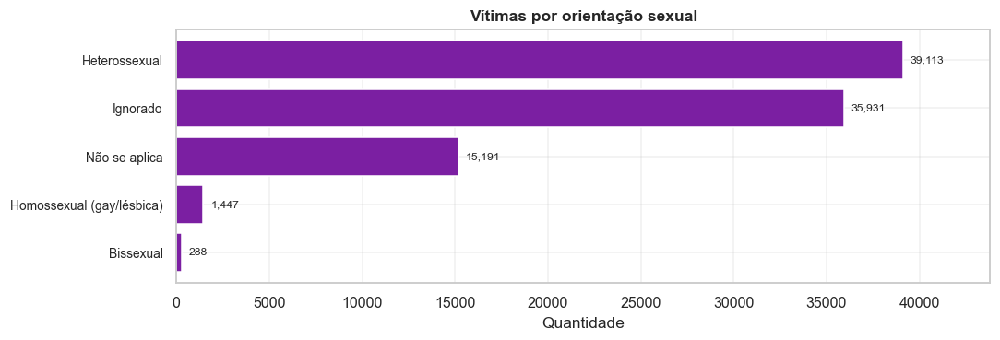


--- Vítimas por identidade de gênero ---------------------------------


,IDENT_GENERO_DESC,Registros,%
0,Não se aplica,51824,56.3
1,Ignorado,39340,42.8
2,Mulher transexual,653,0.7
3,Homem transexual,152,0.2
4,Travesti,1,0.0


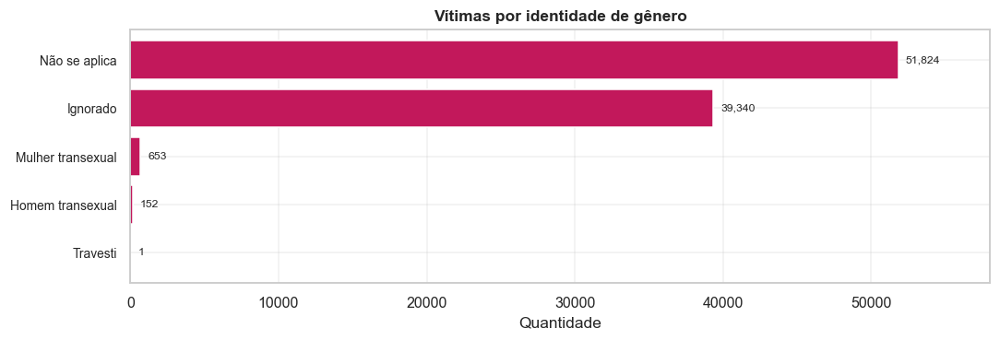


--- Vítimas por situação gestacional ---------------------------------


,GESTANTE_DESC,Registros,%
0,Não,47649,51.8
1,Não se aplica,24437,26.6
2,Ignorado,13660,14.9
3,1º trimestre,2042,2.2
4,2º trimestre,1907,2.1
5,3º trimestre,1836,2.0
6,Idade gestacional ignorada,439,0.5


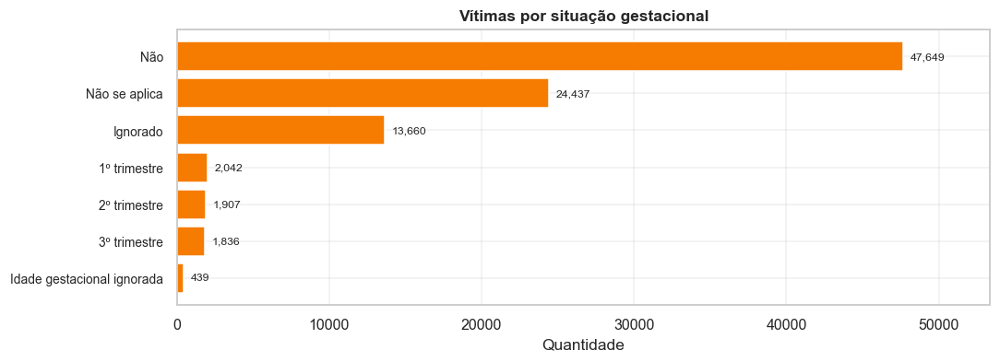

   Notificações de gestantes vítimas de violência: 6.224

--- Gestantes vítimas por faixa etária -------------------------------


,Faixa etária,Gestantes
0,0-11,47
1,12-17,2240
2,18-19,533
3,20-24,1323
4,25-29,928
5,30-39,899
6,40-49,198
7,50-59,41
8,60+,15


   ✅ Perfis específicos concluídos.


In [37]:
banner("PERFIS ESPECÍFICOS (ORIENTAÇÃO, IDENTIDADE, GESTAÇÃO)")

analisar_dimensao("ORIENT_SEXUAL_DESC", "Vítimas por orientação sexual",
                  "30D_orientacao_sexual", cor=COR_PRIMARIA, top=6)
analisar_dimensao("IDENT_GENERO_DESC", "Vítimas por identidade de gênero",
                  "30D_identidade_genero", cor=COR_SECUNDARIA, top=6)
analisar_dimensao("GESTANTE_DESC", "Vítimas por situação gestacional",
                  "30D_gestacao", cor=COR_DESTAQUE, top=8)

# Gestantes vítimas de violência (recorte sensível)
gestantes = DF_MULHERES[pd.to_numeric(DF_MULHERES.get("CS_GESTANT"),
                                      errors="coerce").isin([1, 2, 3, 4])]
info("Notificações de gestantes vítimas de violência: %s",
     formato_numero(len(gestantes)))
if len(gestantes):
    show_df(gestantes["FAIXA_ETARIA"].value_counts().sort_index()
            .rename_axis("Faixa etária").reset_index(name="Gestantes"),
            "Gestantes vítimas por faixa etária", max_linhas=10)
sucesso("Perfis específicos concluídos.")

============================================================
## SEÇÃO 30.E — Armas e reincidência
============================================================

Presença de **arma de fogo** e **arma branca** nas agressões e indicadores de
**reincidência** (violência ocorreu outras vezes), por ano e por município.


[33] ARMAS E REINCIDÊNCIA


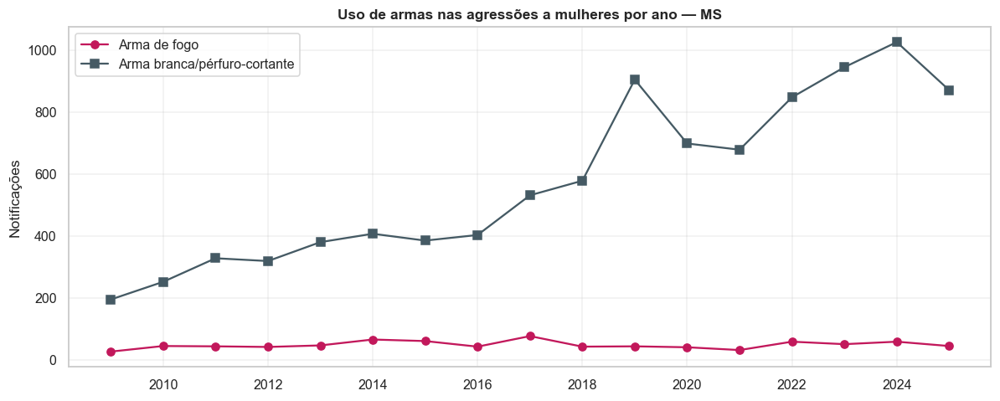

   Notificações com arma de fogo: 826 | arma branca: 9.744

--- Reincidência por município (% de casos recorrentes) --------------


,Municipio,n,reinc,pct_reincidencia
3,Anastácio,348,232,66.7
49,Miranda,152,92,60.5
67,Santa Rita do Pardo,17,10,58.8
16,Brasilândia,146,81,55.5
40,Itaquiraí,257,140,54.5
5,Angélica,24,13,54.2
66,Rochedo,38,20,52.6
22,Chapadão do Sul,642,334,52.0
20,Caracol,25,13,52.0
8,Aquidauana,1585,819,51.7


   Taxa estadual de reincidência: 39.4%
   ✅ Análise de armas e reincidência concluída.


In [38]:
banner("ARMAS E REINCIDÊNCIA")

# Armas por ano
arma_fogo_ano = DF_MULHERES[DF_MULHERES["FL_ARMA_FOGO"] == 1].groupby("ANO").size()
arma_branca_ano = DF_MULHERES[DF_MULHERES["FL_ARMA_BRANCA"] == 1].groupby("ANO").size()
if plt is not None and (len(arma_fogo_ano) or len(arma_branca_ano)):
    fig, ax = plt.subplots(figsize=(11, 4.5))
    if len(arma_fogo_ano):
        ax.plot(arma_fogo_ano.index, arma_fogo_ano.values, marker="o",
                label="Arma de fogo", color=COR_SECUNDARIA)
    if len(arma_branca_ano):
        ax.plot(arma_branca_ano.index, arma_branca_ano.values, marker="s",
                label="Arma branca/pérfuro-cortante", color=COR_NEUTRA)
    ax.set_title("Uso de armas nas agressões a mulheres por ano — MS")
    ax.set_ylabel("Notificações"); ax.legend()
    fig.tight_layout()
    salvar_grafico(fig, "30E_armas_ano", "Uso de armas por ano")

info("Notificações com arma de fogo: %s | arma branca: %s",
     formato_numero(int(DF_MULHERES["FL_ARMA_FOGO"].sum())),
     formato_numero(int(DF_MULHERES["FL_ARMA_BRANCA"].sum())))

# Reincidência por município (top taxas)
reinc = (DF_MULHERES.groupby("COD_MUN")
         .agg(n=("FL_FEMININO", "sum"), reinc=("FL_REINCIDENCIA", "sum")).reset_index())
reinc["Municipio"] = reinc["COD_MUN"].map(MUNICIPIOS_MS)
reinc = reinc.dropna(subset=["Municipio"])
reinc["pct_reincidencia"] = (reinc["reinc"] / reinc["n"].replace(0, np.nan) * 100).round(1)
reinc = reinc[reinc["n"] >= 10].sort_values("pct_reincidencia", ascending=False)
show_df(reinc.head(15)[["Municipio", "n", "reinc", "pct_reincidencia"]],
        "Reincidência por município (% de casos recorrentes)", max_linhas=15)
salvar_csv(reinc, "30E_reincidencia_municipio", "Reincidência por município")
info("Taxa estadual de reincidência: %.1f%%",
     100 * DF_MULHERES["FL_REINCIDENCIA"].mean())
sucesso("Análise de armas e reincidência concluída.")

============================================================
## SEÇÃO 30.F — Índices avançados de risco territorial
============================================================

Construção dos **índices avançados** previstos na Seção 23 do plano, por município:
 - **Vulnerabilidade** — perfil de risco (idade jovem, raça negra, baixa escolaridade,
   parceiro íntimo).
 - **Concentração** — peso do município no total estadual.
 - **Persistência temporal** — em quantos anos o município registra notificações.
 - **Gravidade** — peso de violência física/sexual/óbito.
 - **Resposta institucional** — IRI (proxy de medidas protetivas).
 - **Subnotificação provável** — razão entre violência esperada (pela população) e a
   notificada (heurística documentada, não estatística oficial).
 - **Índice de Alerta** — combinação ponderada para priorização de políticas públicas.


[34] ÍNDICES AVANÇADOS DE RISCO TERRITORIAL

--- Índices avançados — municípios prioritários ----------------------


,Municipio,N_Total,Taxa_Total,Idx_vulnerabilidade,Idx_concentracao,Idx_persistencia,Idx_gravidade,Idx_resposta,Idx_subnotif,Idx_alerta,Prioridade
0,Corumbá,10960,22616.12,54.0,11.92,100.0,45.2,8.7,0.0,70.4,Prioritário
1,Antônio João,781,16677.34,47.1,0.85,100.0,95.9,8.2,0.0,69.2,Atenção
2,São Gabriel do Oeste,1640,11014.10,52.0,1.78,100.0,98.5,8.5,0.0,63.7,Atenção
3,Nova Alvorada do Sul,95,864.82,59.5,0.10,88.2,96.8,20.0,86.9,63.6,Atenção
4,Jardim,1197,9915.51,56.2,1.30,100.0,96.6,41.5,0.0,63.3,Atenção
5,Camapuã,28,409.48,61.7,0.03,52.9,114.3,67.9,93.8,62.5,Atenção
6,Nioaque,677,10172.80,54.1,0.74,100.0,93.4,20.1,0.0,62.4,Atenção
7,Terenos,193,2171.96,52.9,0.21,100.0,91.2,8.3,67.2,61.1,Atenção
8,Pedro Gomes,258,7384.09,56.8,0.28,94.1,101.2,9.3,0.0,60.0,Atenção
9,Água Clara,366,4343.18,60.3,0.40,88.2,93.2,24.3,34.5,60.0,Atenção


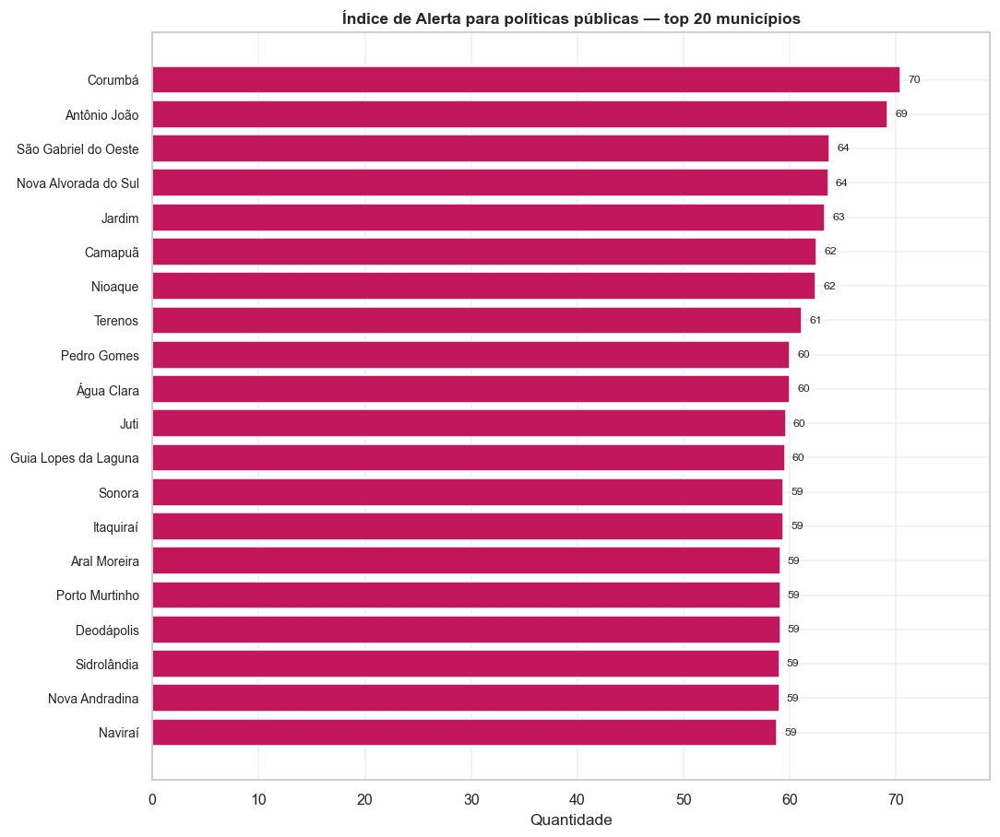


--- Municípios por prioridade de política pública --------------------


,Prioridade,Municípios
0,Atenção,74
1,Monitorar,4
2,Prioritário,1


   📝 Relatório salvo: 30F_relatorio_indices_avancados.txt
   ✅ Índices avançados de risco concluídos.


In [39]:
banner("ÍNDICES AVANÇADOS DE RISCO TERRITORIAL")

idx = df_painel[["COD_MUN", "Municipio", "Pop_feminina", "N_Total",
                 "Taxa_Total", "IMR_0_100"]].copy()

# Vulnerabilidade: média de proporções de risco do painel município×ano
vuln = (PAINEL.groupby("COD_MUN")[["pct_jovem", "pct_negra", "pct_parceiro"]]
        .mean().reset_index())
idx = idx.merge(vuln, on="COD_MUN", how="left")
idx["Idx_vulnerabilidade"] = (idx[["pct_jovem", "pct_negra", "pct_parceiro"]]
                              .mean(axis=1) * 100).round(1)

# Concentração: participação % no total estadual
total_estado = idx["N_Total"].sum()
idx["Idx_concentracao"] = (idx["N_Total"] / max(1, total_estado) * 100).round(2)

# Persistência: nº de anos distintos com registro / nº de anos analisados
anos_por_mun = PAINEL[PAINEL["n_total"] > 0].groupby("COD_MUN")["ANO"].nunique()
idx["anos_com_registro"] = idx["COD_MUN"].map(anos_por_mun).fillna(0).astype(int)
idx["Idx_persistencia"] = (idx["anos_com_registro"] / max(1, len(CFG.anos)) * 100).round(1)

# Gravidade: peso de física+sexual+óbito sobre o total
grav = (DF_MULHERES.groupby("COD_MUN")
        .agg(n=("FL_FEMININO", "sum"),
             grave=("FL_VIOL_FISIC", "sum"),
             sexual=("FL_VIOL_SEXUAL", "sum"),
             obito=("FL_OBITO_VIOLENCIA", "sum")).reset_index())
grav["Idx_gravidade"] = ((grav["grave"] + grav["sexual"] + 3 * grav["obito"])
                         / grav["n"].replace(0, np.nan) * 100).round(1)
idx = idx.merge(grav[["COD_MUN", "Idx_gravidade"]], on="COD_MUN", how="left")

# Resposta institucional (IRI) já calculado em 30.C
idx = idx.merge(iri[["COD_MUN", "IRI_%"]].rename(columns={"IRI_%": "Idx_resposta"}),
                on="COD_MUN", how="left")

# Subnotificação provável (heurística): expectativa proporcional à população feminina
taxa_estadual = total_estado / max(1, idx["Pop_feminina"].sum()) * 100_000
idx["esperado"] = idx["Pop_feminina"] / 100_000 * taxa_estadual
idx["Idx_subnotif"] = (1 - idx["N_Total"] / idx["esperado"].replace(0, np.nan)).clip(0, 1)
idx["Idx_subnotif"] = (idx["Idx_subnotif"] * 100).round(1)

idx = idx.fillna(0)


def _norm(s):
    return (s - s.min()) / (s.max() - s.min() + 1e-9)


# Índice de Alerta (combinação ponderada, 0-100)
idx["Idx_alerta"] = (
    0.30 * _norm(idx["Taxa_Total"])
    + 0.20 * _norm(idx["Idx_gravidade"])
    + 0.20 * _norm(idx["Idx_vulnerabilidade"])
    + 0.15 * _norm(idx["Idx_persistencia"])
    + 0.15 * _norm(idx["Idx_subnotif"])
) * 100
idx["Idx_alerta"] = idx["Idx_alerta"].round(1)
idx["Prioridade"] = pd.cut(idx["Idx_alerta"], bins=[-0.1, 40, 70, 100.1],
                           labels=["Monitorar", "Atenção", "Prioritário"])

cols_idx = ["Municipio", "N_Total", "Taxa_Total", "Idx_vulnerabilidade",
            "Idx_concentracao", "Idx_persistencia", "Idx_gravidade",
            "Idx_resposta", "Idx_subnotif", "Idx_alerta", "Prioridade"]
idx_rank = idx.sort_values("Idx_alerta", ascending=False).reset_index(drop=True)
show_df(idx_rank[cols_idx].head(20), "Índices avançados — municípios prioritários",
        max_linhas=20)
salvar_csv(idx_rank, "30F_indices_avancados", "Índices avançados de risco territorial")
salvar_xlsx(idx_rank, "30F_indices_avancados", "Índices avançados", aba="Indices")
registrar_planilha("Indices_Avancados", idx_rank[cols_idx])
barras_horizontais(idx_rank.set_index("Municipio")["Idx_alerta"].head(20),
                   "Índice de Alerta para políticas públicas — top 20 municípios",
                   "30F_indice_alerta", cor=COR_SECUNDARIA, fmt="{:.0f}",
                   descricao="Índice de alerta")

dist_prio = idx_rank["Prioridade"].value_counts()
show_df(dist_prio.rename_axis("Prioridade").reset_index(name="Municípios"),
        "Municípios por prioridade de política pública", max_linhas=4)

rel_idx = RelatorioTexto("Relatório de Índices Avançados de Risco")
rel_idx.texto("Índices municipais para priorização de políticas públicas baseadas em "
              "evidências (uso agregado, LGPD).")
rel_idx.secao("Municípios prioritários (top 15 por Índice de Alerta)")
rel_idx.tabela_df(idx_rank[["Municipio", "Taxa_Total", "Idx_gravidade",
                            "Idx_alerta", "Prioridade"]].head(15))
rel_idx.salvar(DIRS["relatorios"] / "30F_relatorio_indices_avancados.txt")
sucesso("Índices avançados de risco concluídos.")

============================================================
## SEÇÃO 30.G — Sazonalidade ano × mês (mapa de calor)
============================================================


[35] SAZONALIDADE ANO × MÊS


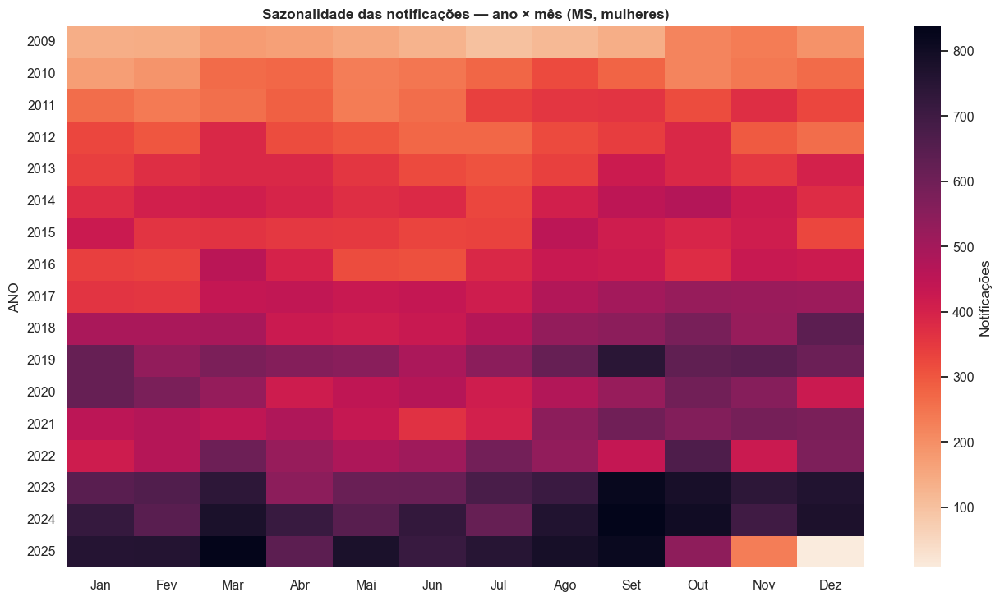

   ✅ Mapa de sazonalidade concluído.


In [40]:
banner("SAZONALIDADE ANO × MÊS")

pivo = (DF_MULHERES.dropna(subset=["ANO", "MES"])
        .pivot_table(index="ANO", columns="MES", values="FL_FEMININO",
                     aggfunc="sum", fill_value=0))
if len(pivo) and plt is not None:
    pivo = pivo.reindex(columns=range(1, 13), fill_value=0)
    pivo.columns = [MESES_NOME[m] for m in pivo.columns]
    fig, ax = plt.subplots(figsize=(12, max(4, 0.4 * len(pivo))))
    if sns is not None:
        sns.heatmap(pivo, cmap="rocket_r", annot=False, ax=ax,
                    cbar_kws={"label": "Notificações"})
    else:
        im = ax.imshow(pivo.values, cmap="rocket_r", aspect="auto")
        plt.colorbar(im, ax=ax)
    ax.set_title("Sazonalidade das notificações — ano × mês (MS, mulheres)")
    fig.tight_layout()
    salvar_grafico(fig, "30G_sazonalidade_heatmap", "Sazonalidade ano × mês")
    salvar_csv(pivo.reset_index(), "30G_sazonalidade_ano_mes", "Sazonalidade ano × mês")
    registrar_planilha("Sazonalidade_AnoMes", pivo.reset_index())
sucesso("Mapa de sazonalidade concluído.")

============================================================
## SEÇÃO 30.H — Previsão estatística (SARIMA / Poisson)
============================================================

Complementa os modelos de Deep Learning com **modelos estatísticos clássicos**: SARIMA
(sazonalidade mensal) e regressão de Poisson sobre a tendência. Servem de *baseline*
interpretável e são comparados às RNNs no relatório de modelos.


[36] PREVISÃO ESTATÍSTICA (SARIMA / POISSON)
   🧠 SARIMA(1,1,1)(1,1,0,12)    [Previsão série temporal] MAE=200.045 | RMSE=333.613


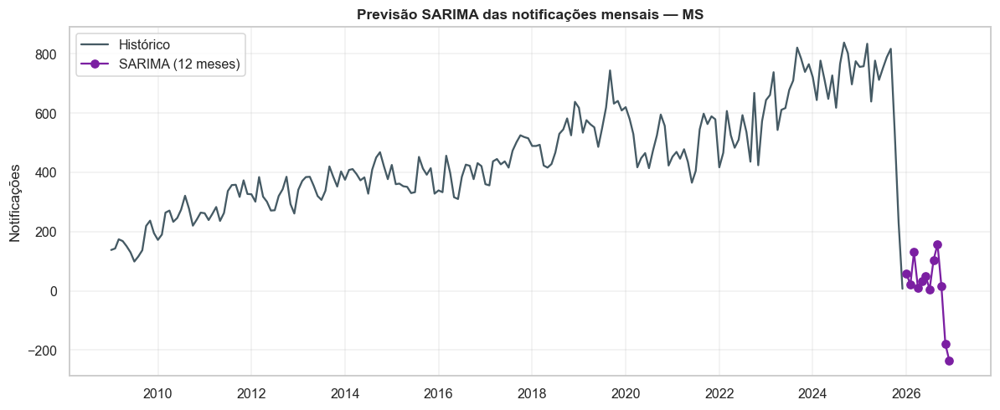

   ✅ SARIMA treinado e projetado.
   Poisson — coef. tendência (log): 0.0662


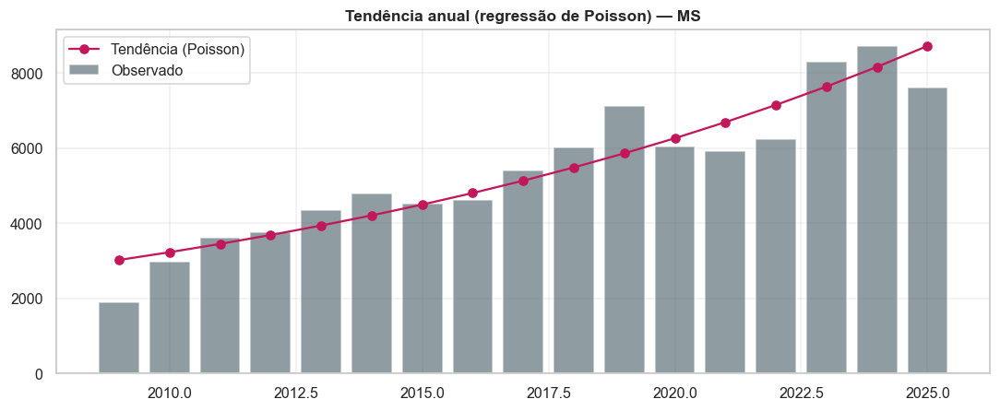

   🧠 Poisson (tendência anual)  [Regressão] deviance=1417.609
   ✅ Previsão estatística concluída.


In [41]:
banner("PREVISÃO ESTATÍSTICA (SARIMA / POISSON)")

if CAP.get("statsmodels") and SARIMAX is not None and len(serie_mensal) >= 24:
    try:
        t0 = time.time()
        n_tr = max(12, len(serie_mensal) - 12)
        treino, teste = serie_mensal.iloc[:n_tr], serie_mensal.iloc[n_tr:]
        modelo_sarima = SARIMAX(treino, order=(1, 1, 1),
                                seasonal_order=(1, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False).fit(disp=False)
        prev = modelo_sarima.forecast(steps=len(teste))
        if len(teste):
            met_s = {"MAE": mean_absolute_error(teste, prev),
                     "RMSE": math.sqrt(mean_squared_error(teste, prev))}
            registrar_modelo("SARIMA(1,1,1)(1,1,0,12)", "Estatística (séries)",
                             "Previsão série temporal", met_s, time.time() - t0)
        # previsão futura 12 meses (modelo no histórico completo)
        modelo_full = SARIMAX(serie_mensal, order=(1, 1, 1),
                              seasonal_order=(1, 1, 0, 12),
                              enforce_stationarity=False,
                              enforce_invertibility=False).fit(disp=False)
        fut = modelo_full.forecast(steps=12)
        if plt is not None:
            fig, ax = plt.subplots(figsize=(11, 4.6))
            ax.plot(serie_mensal.index, serie_mensal.values, color=COR_NEUTRA,
                    label="Histórico")
            ax.plot(fut.index, fut.values, color=COR_PRIMARIA, marker="o",
                    label="SARIMA (12 meses)")
            ax.set_title("Previsão SARIMA das notificações mensais — MS")
            ax.set_ylabel("Notificações"); ax.legend()
            fig.tight_layout()
            salvar_grafico(fig, "30H_sarima_previsao", "Previsão SARIMA")
        salvar_csv(pd.DataFrame({"mes": fut.index, "previsao_sarima": fut.values.round(1)}),
                   "30H_sarima_previsao", "Previsão SARIMA 12 meses")
        sucesso("SARIMA treinado e projetado.")
    except Exception as exc:
        aviso("SARIMA falhou: %s", exc)
else:
    info("Série insuficiente ou statsmodels ausente — SARIMA ignorado.")

# Regressão de Poisson sobre a tendência anual (statsmodels)
if CAP.get("statsmodels"):
    try:
        s_ano2 = serie_temporal(por="ANO")
        if len(s_ano2) >= 5:
            Xp = sm.add_constant(np.arange(len(s_ano2)))
            modelo_pois = sm.GLM(s_ano2.values, Xp,
                                 family=sm.families.Poisson()).fit()
            tend = modelo_pois.predict(Xp)
            info("Poisson — coef. tendência (log): %.4f", modelo_pois.params[1])
            if plt is not None:
                fig, ax = plt.subplots(figsize=(10, 4.2))
                ax.bar(s_ano2.index, s_ano2.values, color=COR_NEUTRA, alpha=0.6,
                       label="Observado")
                ax.plot(s_ano2.index, tend, color=COR_SECUNDARIA, marker="o",
                        label="Tendência (Poisson)")
                ax.set_title("Tendência anual (regressão de Poisson) — MS")
                ax.legend(); fig.tight_layout()
                salvar_grafico(fig, "30H_poisson_tendencia", "Tendência Poisson")
            registrar_modelo("Poisson (tendência anual)", "Estatística",
                             "Regressão", {"deviance": float(modelo_pois.deviance)})
    except Exception as exc:
        aviso("Poisson falhou: %s", exc)
sucesso("Previsão estatística concluída.")

============================================================
## SEÇÃO 31 — Infraestrutura de modelagem e matriz de atributos
============================================================

Bloco de **Machine Learning / Deep Learning / Redes Neurais**. Primeiro construímos:
 - um **registro de modelos** (`MODELOS`) que captura métricas e tempos de cada modelo
   treinado, alimentando o relatório consolidado exigido pelo projeto;
 - uma **matriz de atributos** no nível *município × ano* (painel), com contagens,
   proporções e perfis, que serve de base para classificação, regressão, *clustering* e
   detecção de anomalias.

In [42]:
banner("PREPARAÇÃO DO ALVO E DOS ATRIBUTOS DE MODELAGEM")

# O registro de modelos (`MODELOS`/`registrar_modelo`) e a matriz `PAINEL` já foram
# definidos na Seção 30.0. Aqui apenas preparamos o **alvo** e a **lista de atributos**.

# 31.1  Alvo de classificação: classe de risco por tercil da taxa_total
FEATURES_ML = ["n_total", "n_domestica", "n_fisica", "n_psico", "n_sexual",
               "n_estupro", "n_ameaca", "n_parceiro", "n_familiar",
               "n_reincidencia", "pct_domestica", "pct_sexual", "pct_parceiro",
               "pct_negra", "pct_jovem", "idade_media", "pop_feminina",
               "n_total_lag1", "ANO"]
FEATURES_ML = [c for c in FEATURES_ML if c in PAINEL.columns]

modelagem_viavel = len(PAINEL) >= 30 and CAP.get("sklearn")
if not modelagem_viavel:
    aviso("Amostra insuficiente ou sklearn ausente — modelagem em modo reduzido.")

if modelagem_viavel:
    try:
        PAINEL["classe_risco"] = pd.qcut(PAINEL["taxa_total"].rank(method="first"),
                                         q=3, labels=["Baixo", "Médio", "Alto"])
    except Exception:
        PAINEL["classe_risco"] = pd.cut(PAINEL["taxa_total"], bins=3,
                                        labels=["Baixo", "Médio", "Alto"])
    show_df(PAINEL["classe_risco"].value_counts().rename_axis("Classe")
            .reset_index(name="Município-ano"),
            "Distribuição do alvo (classe de risco)", max_linhas=4)


[37] PREPARAÇÃO DO ALVO E DOS ATRIBUTOS DE MODELAGEM

--- Distribuição do alvo (classe de risco) ---------------------------


,Classe,Município-ano
0,Alto,332
1,Baixo,331
2,Médio,331


============================================================
## SEÇÃO 32 — Machine Learning: CLASSIFICAÇÃO de risco
============================================================

Treina um **conjunto amplo de classificadores** para prever a classe de risco municipal
(Baixo/Médio/Alto). Cada modelo é avaliado com *accuracy*, *precision*, *recall*,
*F1* (macro) e, quando aplicável, *ROC-AUC* (OvR). As métricas alimentam o relatório
consolidado de modelos.


[38] MACHINE LEARNING — CLASSIFICAÇÃO DE RISCO MUNICIPAL
   🧠 DecisionTree               [Classificação] accuracy=0.880 | precision=0.886 | recall=0.880 | f1_macro=0.881 | roc_auc_ovr=0.922
   🧠 RandomForest               [Classificação] accuracy=0.900 | precision=0.901 | recall=0.900 | f1_macro=0.900 | roc_auc_ovr=0.977
   🧠 ExtraTrees                 [Classificação] accuracy=0.859 | precision=0.863 | recall=0.859 | f1_macro=0.861 | roc_auc_ovr=0.961
   🧠 GradientBoosting           [Classificação] accuracy=0.944 | precision=0.946 | recall=0.944 | f1_macro=0.944 | roc_auc_ovr=0.986
   🧠 HistGradientBoosting       [Classificação] accuracy=0.948 | precision=0.952 | recall=0.948 | f1_macro=0.948 | roc_auc_ovr=0.996
   🧠 AdaBoost                   [Classificação] accuracy=0.823 | precision=0.851 | recall=0.823 | f1_macro=0.827 | roc_auc_ovr=0.903
   🧠 LogisticRegression         [Classificação] accuracy=0.787 | precision=0.794 | recall=0.787 | f1_macro=0.787 | roc_auc_ovr=0.924
   🧠 KNN   

,Modelo,Accuracy,Precision,Recall,F1_macro,ROC_AUC
0,LightGBM,0.971888,0.972437,0.971888,0.971952,0.996250
1,XGBoost,0.951807,0.954930,0.951807,0.952294,0.994242
2,HistGradientBoosting,0.947791,0.951652,0.947791,0.948400,0.995790
3,GradientBoosting,0.943775,0.945878,0.943775,0.944212,0.985726
4,CatBoost,0.935743,0.939164,0.935743,0.936400,0.988823
5,RandomForest,0.899598,0.900770,0.899598,0.900037,0.977186
6,DecisionTree,0.879518,0.885517,0.879518,0.880817,0.922038
7,ExtraTrees,0.859438,0.863464,0.859438,0.860593,0.960976
8,AdaBoost,0.823293,0.850915,0.823293,0.827363,0.902768
9,LogisticRegression,0.787149,0.793844,0.787149,0.787218,0.924493


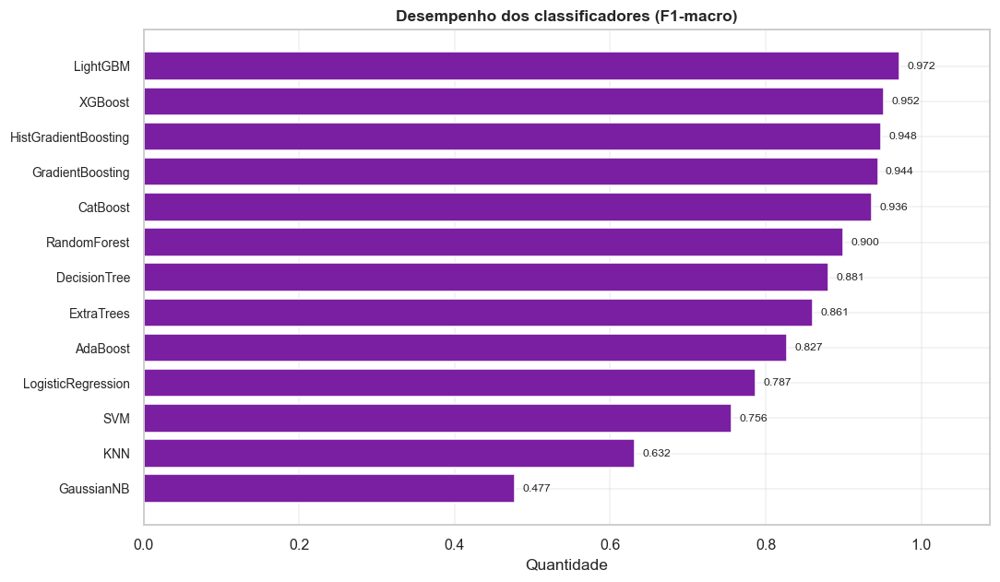

   Melhor classificador: LightGBM (F1-macro=0.972)


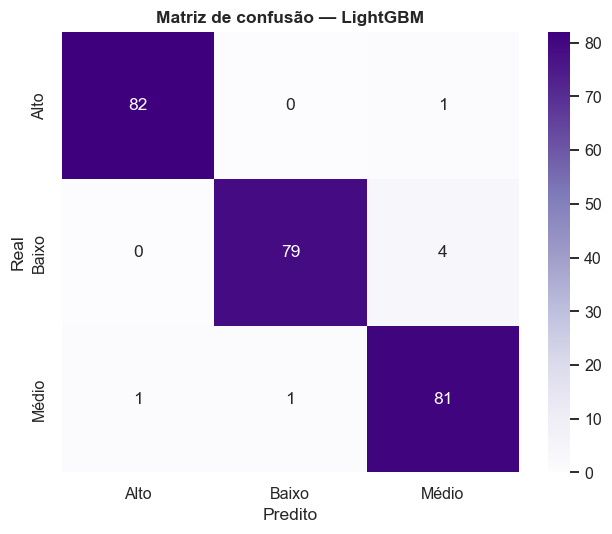


--- Importância dos atributos (melhor modelo) ------------------------


,Atributo,Importância
0,pop_feminina,3586
1,n_total,2460
2,n_domestica,927
3,idade_media,748
4,pct_sexual,682
5,n_fisica,670
6,pct_domestica,638
7,n_total_lag1,609
8,pct_parceiro,587
9,ANO,555


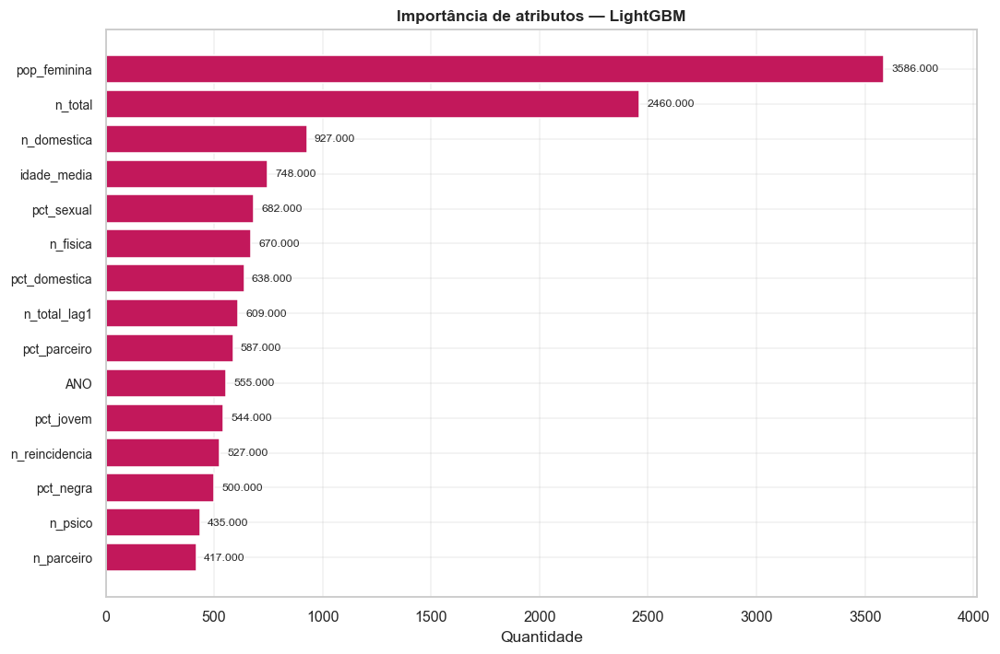

   ✅ Classificação de risco (ML) concluída.


In [43]:
banner("MACHINE LEARNING — CLASSIFICAÇÃO DE RISCO MUNICIPAL")

clf_resultados = {}
melhor_clf = None
if modelagem_viavel:
    X = PAINEL[FEATURES_ML].fillna(0).values
    y = PAINEL["classe_risco"].astype(str).values
    le_y = LabelEncoder()
    y_enc = le_y.fit_transform(y)
    estratificar = y if min(Counter(y).values()) >= 2 else None
    X_tr, X_te, y_tr, y_te = train_test_split(
        X, y_enc, test_size=CFG.test_size, random_state=SEED, stratify=estratificar)
    scaler = StandardScaler().fit(X_tr)
    X_tr_s, X_te_s = scaler.transform(X_tr), scaler.transform(X_te)

    # Catálogo de classificadores (degradação graciosa por capacidade)
    classificadores = {
        "DecisionTree": (DecisionTreeClassifier(max_depth=6, random_state=SEED), False),
        "RandomForest": (RandomForestClassifier(n_estimators=300, random_state=SEED,
                                                n_jobs=-1), False),
        "ExtraTrees": (ExtraTreesClassifier(n_estimators=300, random_state=SEED,
                                            n_jobs=-1), False),
        "GradientBoosting": (GradientBoostingClassifier(random_state=SEED), False),
        "HistGradientBoosting": (HistGradientBoostingClassifier(random_state=SEED), False),
        "AdaBoost": (AdaBoostClassifier(random_state=SEED), False),
        "LogisticRegression": (LogisticRegression(max_iter=2000,
                                                  multi_class="auto"), True),
        "KNN": (KNeighborsClassifier(n_neighbors=7), True),
        "GaussianNB": (GaussianNB(), True),
        "SVM": (SVC(probability=True, random_state=SEED), True),
    }
    if CAP.get("xgboost"):
        classificadores["XGBoost"] = (
            xgb.XGBClassifier(n_estimators=300, max_depth=5, learning_rate=0.1,
                              subsample=0.9, eval_metric="mlogloss",
                              random_state=SEED, verbosity=0), False)
    if CAP.get("lightgbm"):
        classificadores["LightGBM"] = (
            lgb.LGBMClassifier(n_estimators=300, random_state=SEED, verbose=-1), False)
    if CAP.get("catboost"):
        classificadores["CatBoost"] = (
            CatBoostClassifier(iterations=300, verbose=0, random_state=SEED), False)

    melhor_f1 = -1
    for nome, (modelo, usa_escala) in classificadores.items():
        try:
            t0 = time.time()
            Xtr_, Xte_ = (X_tr_s, X_te_s) if usa_escala else (X_tr, X_te)
            modelo.fit(Xtr_, y_tr)
            pred = modelo.predict(Xte_)
            met = {
                "accuracy": accuracy_score(y_te, pred),
                "precision": precision_score(y_te, pred, average="macro", zero_division=0),
                "recall": recall_score(y_te, pred, average="macro", zero_division=0),
                "f1_macro": f1_score(y_te, pred, average="macro", zero_division=0),
            }
            try:
                proba = modelo.predict_proba(Xte_)
                met["roc_auc_ovr"] = roc_auc_score(y_te, proba, multi_class="ovr",
                                                   average="macro")
            except Exception:
                pass
            dt = time.time() - t0
            registrar_modelo(nome, "ML", "Classificação", met, dt)
            clf_resultados[nome] = {"modelo": modelo, "pred": pred,
                                    "escala": usa_escala, **met}
            if met["f1_macro"] > melhor_f1:
                melhor_f1, melhor_clf = met["f1_macro"], nome
        except Exception as exc:
            aviso("Classificador %s falhou: %s", nome, exc)

    if clf_resultados:
        # Tabela comparativa
        df_clf = pd.DataFrame([
            {"Modelo": k, "Accuracy": v["accuracy"], "Precision": v["precision"],
             "Recall": v["recall"], "F1_macro": v["f1_macro"],
             "ROC_AUC": v.get("roc_auc_ovr", np.nan)}
            for k, v in clf_resultados.items()
        ]).sort_values("F1_macro", ascending=False).reset_index(drop=True)
        show_df(df_clf, "Comparativo de classificadores (ordenado por F1)", max_linhas=20)
        salvar_csv(df_clf, "32_comparativo_classificadores", "Comparativo de ML (classif.)")
        registrar_planilha("ML_Classificadores", df_clf)
        barras_horizontais(df_clf.set_index("Modelo")["F1_macro"],
                           "Desempenho dos classificadores (F1-macro)",
                           "32_classificadores_f1", cor=COR_PRIMARIA, fmt="{:.3f}",
                           descricao="F1-macro por classificador")
        info("Melhor classificador: %s (F1-macro=%.3f)", melhor_clf, melhor_f1)

        # Matriz de confusão do melhor modelo
        if plt is not None and melhor_clf:
            best = clf_resultados[melhor_clf]
            mat_conf = confusion_matrix(y_te, best["pred"])
            fig, ax = plt.subplots(figsize=(6, 5))
            if sns is not None:
                sns.heatmap(mat_conf, annot=True, fmt="d", cmap="Purples", ax=ax,
                            xticklabels=le_y.classes_, yticklabels=le_y.classes_)
            else:
                ax.imshow(mat_conf, cmap="Purples")
            ax.set_title(f"Matriz de confusão — {melhor_clf}")
            ax.set_xlabel("Predito"); ax.set_ylabel("Real")
            fig.tight_layout()
            salvar_grafico(fig, "32_matriz_confusao", "Matriz de confusão (melhor modelo)")

        # Importância de atributos (se o melhor modelo expõe)
        best_model = clf_resultados[melhor_clf]["modelo"]
        if hasattr(best_model, "feature_importances_"):
            imp = pd.Series(best_model.feature_importances_, index=FEATURES_ML)
            imp = imp.sort_values(ascending=False)
            show_df(imp.rename_axis("Atributo").reset_index(name="Importância"),
                    "Importância dos atributos (melhor modelo)", max_linhas=20)
            barras_horizontais(imp.head(15),
                               f"Importância de atributos — {melhor_clf}",
                               "32_importancia_atributos", cor=COR_SECUNDARIA,
                               fmt="{:.3f}", descricao="Importância de atributos")
            salvar_csv(imp.rename_axis("atributo").reset_index(name="importancia"),
                       "32_importancia_atributos", "Importância dos atributos")
sucesso("Classificação de risco (ML) concluída.")

============================================================
## SEÇÃO 33 — Machine Learning: REGRESSÃO (volume de notificações)
============================================================

Modelos de regressão para estimar o número de notificações municipais a partir dos
atributos do painel (incluindo o *lag* do ano anterior). Inclui regressão de **Poisson**
(adequada a dados de contagem), além de modelos de árvore e *boosting*. Métricas: MAE,
RMSE, R² e MAPE.


[39] MACHINE LEARNING — REGRESSÃO DE VOLUME DE NOTIFICAÇÕES
   🧠 LinearRegression           [Regressão] MAE=5.417 | RMSE=11.540 | R2=0.999 | MAPE=0.277
   🧠 Ridge                      [Regressão] MAE=6.558 | RMSE=14.808 | R2=0.998 | MAPE=0.290
   🧠 Lasso                      [Regressão] MAE=5.075 | RMSE=11.068 | R2=0.999 | MAPE=0.258
   🧠 PoissonRegressor           [Regressão] MAE=65.794 | RMSE=233.705 | R2=0.591 | MAPE=4.750
   🧠 DecisionTreeReg            [Regressão] MAE=11.685 | RMSE=60.270 | R2=0.973 | MAPE=0.212
   🧠 RandomForestReg            [Regressão] MAE=6.415 | RMSE=27.403 | R2=0.994 | MAPE=0.052
   🧠 ExtraTreesReg              [Regressão] MAE=4.988 | RMSE=20.604 | R2=0.997 | MAPE=0.043
   🧠 GradientBoostingReg        [Regressão] MAE=6.841 | RMSE=32.638 | R2=0.992 | MAPE=0.098
   🧠 XGBoostReg                 [Regressão] MAE=7.302 | RMSE=43.043 | R2=0.986 | MAPE=0.052
   🧠 LightGBMReg                [Regressão] MAE=25.005 | RMSE=67.373 | R2=0.966 | MAPE=0.356

--- Comparativ

,Modelo,MAE,RMSE,R2,MAPE
0,Lasso,5.075143,11.068315,0.999082,0.258233
1,LinearRegression,5.416874,11.540281,0.999003,0.277320
2,Ridge,6.557702,14.807559,0.998358,0.290047
3,ExtraTreesReg,4.988487,20.603777,0.996821,0.042747
4,RandomForestReg,6.415074,27.402748,0.994376,0.051881
5,GradientBoostingReg,6.841206,32.638124,0.992022,0.097900
6,XGBoostReg,7.301681,43.043468,0.986124,0.052299
7,DecisionTreeReg,11.684708,60.269958,0.972794,0.211697
8,LightGBMReg,25.004965,67.373474,0.966003,0.355660
9,PoissonRegressor,65.794284,233.704573,0.590935,4.749537


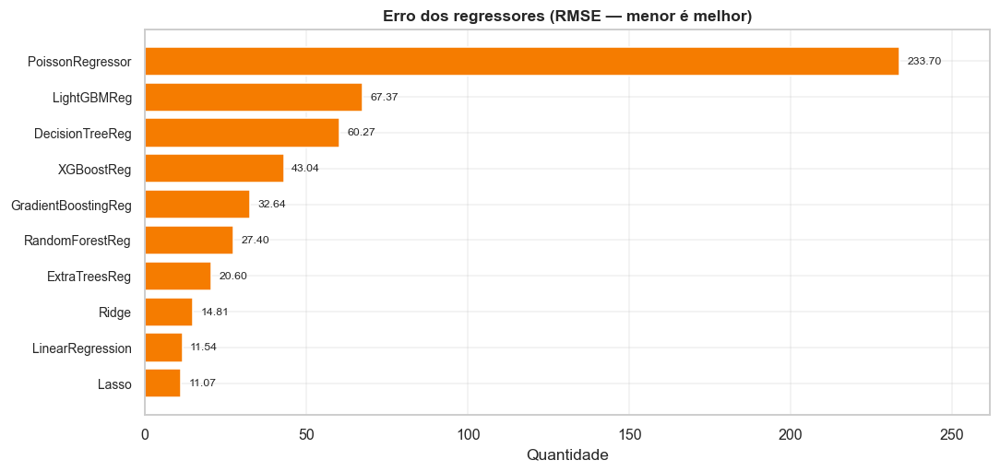

   Melhor regressor: Lasso (RMSE=11.07)


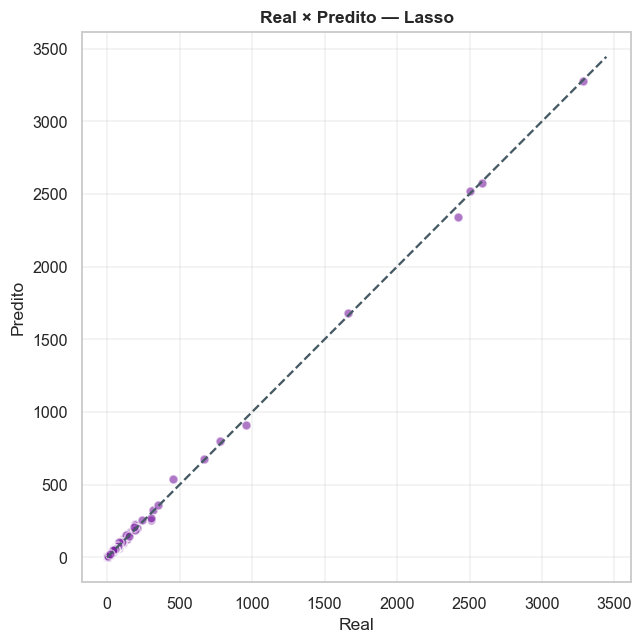

   ✅ Regressão (ML) concluída.


In [44]:
banner("MACHINE LEARNING — REGRESSÃO DE VOLUME DE NOTIFICAÇÕES")

reg_resultados = {}
melhor_reg = None
if modelagem_viavel:
    Xr = PAINEL[[c for c in FEATURES_ML if c != "n_total"]].fillna(0).values
    yr = PAINEL["n_total"].values
    Xr_tr, Xr_te, yr_tr, yr_te = train_test_split(
        Xr, yr, test_size=CFG.test_size, random_state=SEED)
    sc_r = StandardScaler().fit(Xr_tr)
    Xr_tr_s, Xr_te_s = sc_r.transform(Xr_tr), sc_r.transform(Xr_te)

    regressores = {
        "LinearRegression": (LinearRegression(), True),
        "Ridge": (Ridge(alpha=1.0, random_state=SEED), True),
        "Lasso": (Lasso(alpha=0.1, random_state=SEED), True),
        "PoissonRegressor": (PoissonRegressor(max_iter=2000), True),
        "DecisionTreeReg": (DecisionTreeRegressor(max_depth=7, random_state=SEED), False),
        "RandomForestReg": (RandomForestRegressor(n_estimators=300, random_state=SEED,
                                                  n_jobs=-1), False),
        "ExtraTreesReg": (ExtraTreesRegressor(n_estimators=300, random_state=SEED,
                                              n_jobs=-1), False),
        "GradientBoostingReg": (GradientBoostingRegressor(random_state=SEED), False),
    }
    if CAP.get("xgboost"):
        regressores["XGBoostReg"] = (
            xgb.XGBRegressor(n_estimators=300, max_depth=5, learning_rate=0.1,
                             random_state=SEED, verbosity=0), False)
    if CAP.get("lightgbm"):
        regressores["LightGBMReg"] = (
            lgb.LGBMRegressor(n_estimators=300, random_state=SEED, verbose=-1), False)

    melhor_rmse = np.inf
    for nome, (modelo, usa_escala) in regressores.items():
        try:
            t0 = time.time()
            Xtr_, Xte_ = (Xr_tr_s, Xr_te_s) if usa_escala else (Xr_tr, Xr_te)
            modelo.fit(Xtr_, yr_tr)
            pred = np.clip(modelo.predict(Xte_), 0, None)
            rmse = math.sqrt(mean_squared_error(yr_te, pred))
            met = {
                "MAE": mean_absolute_error(yr_te, pred),
                "RMSE": rmse,
                "R2": r2_score(yr_te, pred),
            }
            try:
                met["MAPE"] = mean_absolute_percentage_error(
                    np.clip(yr_te, 1, None), np.clip(pred, 1, None))
            except Exception:
                pass
            dt = time.time() - t0
            registrar_modelo(nome, "ML", "Regressão", met, dt)
            reg_resultados[nome] = {"modelo": modelo, "pred": pred,
                                    "escala": usa_escala, **met}
            if rmse < melhor_rmse:
                melhor_rmse, melhor_reg = rmse, nome
        except Exception as exc:
            aviso("Regressor %s falhou: %s", nome, exc)

    if reg_resultados:
        df_reg = pd.DataFrame([
            {"Modelo": k, "MAE": v["MAE"], "RMSE": v["RMSE"], "R2": v["R2"],
             "MAPE": v.get("MAPE", np.nan)}
            for k, v in reg_resultados.items()
        ]).sort_values("RMSE").reset_index(drop=True)
        show_df(df_reg, "Comparativo de regressores (ordenado por RMSE)", max_linhas=20)
        salvar_csv(df_reg, "33_comparativo_regressores", "Comparativo de ML (regressão)")
        registrar_planilha("ML_Regressores", df_reg)
        barras_horizontais(df_reg.set_index("Modelo")["RMSE"],
                           "Erro dos regressores (RMSE — menor é melhor)",
                           "33_regressores_rmse", cor=COR_DESTAQUE, fmt="{:.2f}",
                           descricao="RMSE por regressor")
        info("Melhor regressor: %s (RMSE=%.2f)", melhor_reg, melhor_rmse)
        # Dispersão real × predito
        if plt is not None and melhor_reg:
            pr = reg_resultados[melhor_reg]["pred"]
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.scatter(yr_te, pr, alpha=0.6, color=COR_PRIMARIA, edgecolors="white")
            lim = [0, max(yr_te.max(), pr.max()) * 1.05]
            ax.plot(lim, lim, "--", color=COR_NEUTRA)
            ax.set_xlabel("Real"); ax.set_ylabel("Predito")
            ax.set_title(f"Real × Predito — {melhor_reg}")
            fig.tight_layout()
            salvar_grafico(fig, "33_real_vs_predito", "Real × predito (melhor regressor)")
sucesso("Regressão (ML) concluída.")

============================================================
## SEÇÃO 34 — Machine Learning não supervisionado: CLUSTERIZAÇÃO
============================================================

Agrupa municípios por **perfil de violência** (médias do painel por município). Usa
K-Means (com escolha de *k* por silhueta), DBSCAN e Agglomerative, projetando os grupos
em 2D via PCA.


[40] CLUSTERIZAÇÃO DE MUNICÍPIOS POR PERFIL
   k ótimo por silhueta: 3 (silhueta=0.201)
   🧠 KMeans(k=3)                [Clusterização] silhouette=0.201 | k=3
   🧠 DBSCAN                     [Clusterização] n_clusters=1 | n_ruido=41
   🧠 Agglomerative(k=3)         [Clusterização] silhouette=0.130


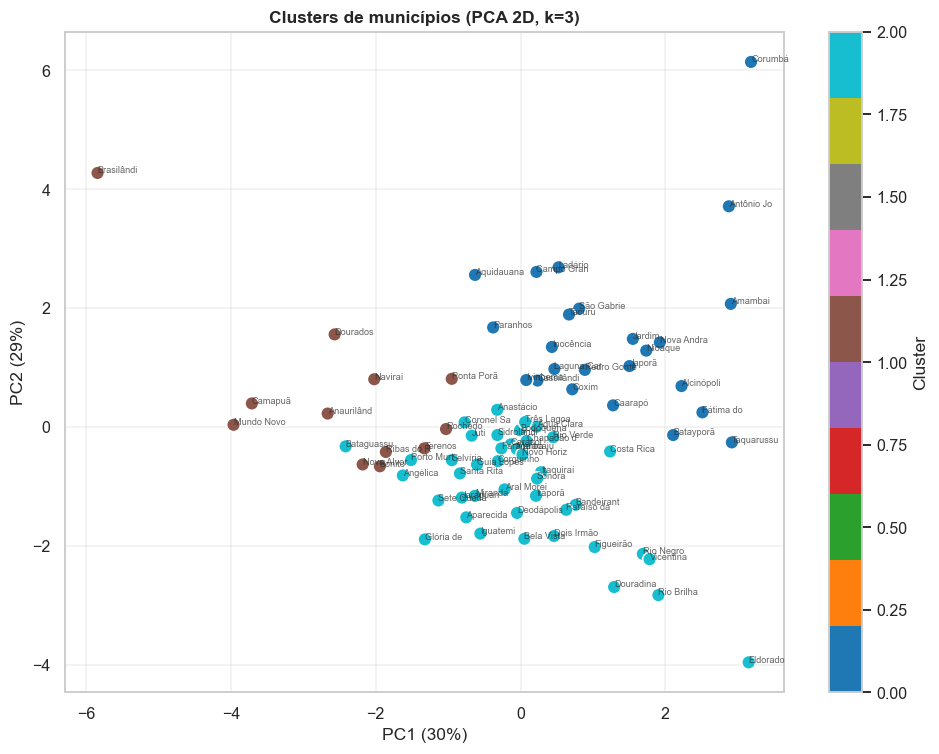


--- Municípios e seus clusters (amostra) -----------------------------


,Municipio,taxa_total,cluster_kmeans
0,Água Clara,289.545508,2
1,Alcinópolis,522.657618,0
2,Amambai,694.779054,0
3,Anastácio,238.899415,2
4,Anaurilândia,149.234363,1
5,Angélica,55.545269,2
6,Antônio João,981.020211,0
7,Aparecida do Taboado,56.229512,2
8,Aquidauana,420.451169,0
9,Aral Moreira,137.990513,2


   ✅ Clusterização concluída.


In [45]:
banner("CLUSTERIZAÇÃO DE MUNICÍPIOS POR PERFIL")

perfil_mun = None
if modelagem_viavel:
    feats_cluster = ["taxa_total", "taxa_domestica", "taxa_sexual",
                     "pct_domestica", "pct_sexual", "pct_parceiro",
                     "pct_negra", "pct_jovem", "idade_media"]
    feats_cluster = [c for c in feats_cluster if c in PAINEL.columns]
    perfil_mun = (PAINEL.groupby("COD_MUN")[feats_cluster].mean()
                  .replace([np.inf, -np.inf], np.nan).fillna(0))
    perfil_mun["Municipio"] = perfil_mun.index.map(MUNICIPIOS_MS)
    Xc = StandardScaler().fit_transform(perfil_mun[feats_cluster].values)

    # 34.1  Escolha de k por silhueta
    if len(Xc) >= 6:
        sil = {}
        for k in range(2, min(8, len(Xc))):
            try:
                km = KMeans(n_clusters=k, random_state=SEED, n_init=10).fit(Xc)
                sil[k] = silhouette_score(Xc, km.labels_)
            except Exception:
                pass
        if sil:
            k_otimo = max(sil, key=sil.get)
            info("k ótimo por silhueta: %d (silhueta=%.3f)", k_otimo, sil[k_otimo])
            km = KMeans(n_clusters=k_otimo, random_state=SEED, n_init=10).fit(Xc)
            perfil_mun["cluster_kmeans"] = km.labels_
            registrar_modelo(f"KMeans(k={k_otimo})", "ML", "Clusterização",
                             {"silhouette": sil[k_otimo], "k": k_otimo},
                             obs="Agrupamento de municípios")
            # DBSCAN e Agglomerative (complementares)
            try:
                db = DBSCAN(eps=1.5, min_samples=3).fit(Xc)
                perfil_mun["cluster_dbscan"] = db.labels_
                n_clusters_db = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
                registrar_modelo("DBSCAN", "ML", "Clusterização",
                                 {"n_clusters": n_clusters_db,
                                  "n_ruido": int((db.labels_ == -1).sum())})
            except Exception as exc:
                aviso("DBSCAN falhou: %s", exc)
            try:
                ag = AgglomerativeClustering(n_clusters=k_otimo).fit(Xc)
                perfil_mun["cluster_agglo"] = ag.labels_
                registrar_modelo(f"Agglomerative(k={k_otimo})", "ML", "Clusterização",
                                 {"silhouette": silhouette_score(Xc, ag.labels_)})
            except Exception as exc:
                aviso("Agglomerative falhou: %s", exc)

            # 34.2  Projeção PCA 2D dos clusters
            if plt is not None:
                pca = PCA(n_components=2, random_state=SEED)
                proj = pca.fit_transform(Xc)
                fig, ax = plt.subplots(figsize=(9, 7))
                sc = ax.scatter(proj[:, 0], proj[:, 1], c=km.labels_,
                                cmap="tab10", s=80, edgecolors="white")
                for i, nome in enumerate(perfil_mun["Municipio"]):
                    if perfil_mun[feats_cluster].iloc[i].sum() > 0:
                        ax.annotate(str(nome)[:10], (proj[i, 0], proj[i, 1]),
                                    fontsize=6, alpha=0.7)
                ax.set_title(f"Clusters de municípios (PCA 2D, k={k_otimo})")
                ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)")
                ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)")
                plt.colorbar(sc, ax=ax, label="Cluster")
                fig.tight_layout()
                salvar_grafico(fig, "34_clusters_pca", "Clusters municipais (PCA)")
            salvar_csv(perfil_mun.reset_index(), "34_clusters_municipios",
                       "Clusters de municípios por perfil")
            registrar_planilha("Clusters_Municipios", perfil_mun.reset_index())
            show_df(perfil_mun.reset_index()[["Municipio", "taxa_total",
                    "cluster_kmeans"]].head(20),
                    "Municípios e seus clusters (amostra)", max_linhas=20)
sucesso("Clusterização concluída.")

============================================================
## SEÇÃO 35 — Detecção de ANOMALIAS
============================================================

Identifica observações **município × ano atípicas** (picos incomuns de notificações)
com Isolation Forest, Local Outlier Factor e One-Class SVM. Útil para sinalizar
territórios/períodos que fogem do padrão e merecem atenção.

In [46]:
banner("DETECÇÃO DE ANOMALIAS (PICOS INCOMUNS)")

if modelagem_viavel:
    Xa = StandardScaler().fit_transform(PAINEL[FEATURES_ML].fillna(0).values)
    anomalias = PAINEL[["COD_MUN", "Municipio", "ANO", "n_total", "taxa_total"]].copy()
    try:
        iso = IsolationForest(contamination=0.05, random_state=SEED).fit(Xa)
        anomalias["iso_anomalia"] = (iso.predict(Xa) == -1).astype(int)
        registrar_modelo("IsolationForest", "ML", "Anomalia",
                         {"n_anomalias": int(anomalias["iso_anomalia"].sum()),
                          "contaminacao": 0.05})
    except Exception as exc:
        aviso("IsolationForest falhou: %s", exc)
    try:
        lof = LocalOutlierFactor(n_neighbors=min(20, len(Xa) - 1))
        anomalias["lof_anomalia"] = (lof.fit_predict(Xa) == -1).astype(int)
        registrar_modelo("LocalOutlierFactor", "ML", "Anomalia",
                         {"n_anomalias": int(anomalias["lof_anomalia"].sum())})
    except Exception as exc:
        aviso("LOF falhou: %s", exc)
    try:
        ocsvm = OneClassSVM(nu=0.05, gamma="scale").fit(Xa)
        anomalias["ocsvm_anomalia"] = (ocsvm.predict(Xa) == -1).astype(int)
        registrar_modelo("OneClassSVM", "ML", "Anomalia",
                         {"n_anomalias": int(anomalias["ocsvm_anomalia"].sum())})
    except Exception as exc:
        aviso("OneClassSVM falhou: %s", exc)

    cols_anom = [c for c in ["iso_anomalia", "lof_anomalia", "ocsvm_anomalia"]
                 if c in anomalias.columns]
    if cols_anom:
        anomalias["votos_anomalia"] = anomalias[cols_anom].sum(axis=1)
        destaque = anomalias[anomalias["votos_anomalia"] >= 2].sort_values(
            "taxa_total", ascending=False)
        show_df(destaque.head(20), "Município × ano atípicos (≥2 detectores)",
                max_linhas=20)
        salvar_csv(anomalias, "35_anomalias", "Detecção de anomalias (município × ano)")
        registrar_planilha("Anomalias", anomalias)
        info("Observações atípicas (consenso ≥2 métodos): %d", len(destaque))
sucesso("Detecção de anomalias concluída.")


[41] DETECÇÃO DE ANOMALIAS (PICOS INCOMUNS)
   🧠 IsolationForest            [Anomalia] n_anomalias=50 | contaminacao=0.050
   🧠 LocalOutlierFactor         [Anomalia] n_anomalias=47
   🧠 OneClassSVM                [Anomalia] n_anomalias=53

--- Município × ano atípicos (≥2 detectores) -------------------------


,COD_MUN,Municipio,ANO,n_total,taxa_total,iso_anomalia,lof_anomalia,ocsvm_anomalia,votos_anomalia
316,500320,Corumbá,2019,1164,2401.931450,1,1,1,3
315,500320,Corumbá,2018,1161,2395.740905,1,1,1,3
321,500320,Corumbá,2024,960,1980.974392,1,1,1,3
320,500320,Corumbá,2023,927,1912.878397,1,1,0,2
317,500320,Corumbá,2020,890,1836.528342,1,0,1,2
318,500320,Corumbá,2021,776,1601.287633,1,1,0,2
314,500320,Corumbá,2017,705,1454.778069,1,1,0,2
319,500320,Corumbá,2022,700,1444.460494,1,1,0,2
312,500320,Corumbá,2015,670,1382.555044,1,1,0,2
313,500320,Corumbá,2016,668,1378.428014,1,1,0,2


   Observações atípicas (consenso ≥2 métodos): 46
   ✅ Detecção de anomalias concluída.


============================================================
## SEÇÃO 36 — DEEP LEARNING / REDES NEURAIS (PyTorch)
============================================================

Camada de **redes neurais**. Sempre que o PyTorch estiver disponível, treinamos:
 - um **MLP** (rede densa) para a classificação de risco municipal — comparável aos
   modelos de ML;
 - redes recorrentes **LSTM** e **GRU** para previsão da série temporal mensal.

Se o PyTorch não estiver presente, há *fallback* para um MLP do scikit-learn e para um
modelo estatístico de tendência, garantindo que a seção produza resultados em qualquer
ambiente. Há ainda suporte opcional a TensorFlow/Keras.


[42] DEEP LEARNING / REDES NEURAIS
   🧠 MLP (PyTorch)              [Classificação] accuracy=0.884 | precision=0.882 | recall=0.884 | f1_macro=0.883


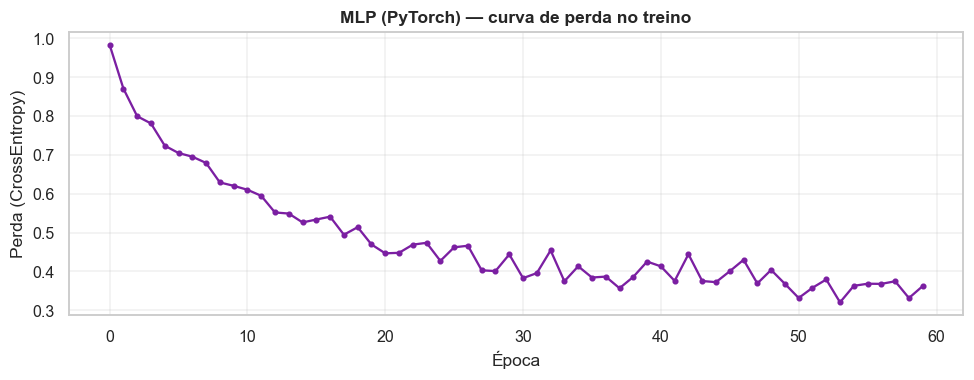

   🧠 LSTM (PyTorch)             [Previsão série temporal] MAE=215.407 | RMSE=231.600 | R2=-1.123
   🧠 GRU (PyTorch)              [Previsão série temporal] MAE=153.565 | RMSE=173.318 | R2=-0.189


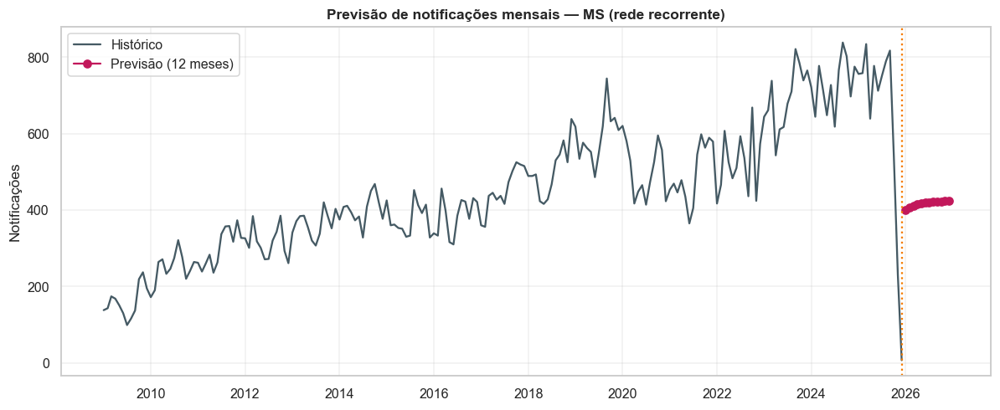


--- Previsão de notificações (próximos 12 meses) ---------------------


,mes,previsao
0,2026-01-01,399.3
1,2026-02-01,407.3
2,2026-03-01,412.0
3,2026-04-01,415.3
4,2026-05-01,417.7
5,2026-06-01,419.3
6,2026-07-01,420.5
7,2026-08-01,421.4
8,2026-09-01,422.1
9,2026-10-01,422.6


   TensorFlow indisponível — etapa Keras ignorada (PyTorch já cobre Deep Learning).
   ✅ Deep Learning / Redes Neurais concluído.


In [47]:
banner("DEEP LEARNING / REDES NEURAIS")

USOU_TORCH = bool(CAP.get("torch"))

# 36.1  Rede densa (MLP) para classificação de risco
if USOU_TORCH and modelagem_viavel and clf_resultados:
    try:
        class MLPClassifier(nn.Module):
            """Perceptron multicamadas para classificação multiclasse."""

            def __init__(self, n_in, n_classes, h1=64, h2=32, dropout=0.3):
                super().__init__()
                self.net = nn.Sequential(
                    nn.Linear(n_in, h1), nn.ReLU(), nn.BatchNorm1d(h1),
                    nn.Dropout(dropout),
                    nn.Linear(h1, h2), nn.ReLU(), nn.Dropout(dropout),
                    nn.Linear(h2, n_classes),
                )

            def forward(self, x):
                return self.net(x)

        t0 = time.time()
        n_classes = len(le_y.classes_)
        modelo_mlp = MLPClassifier(X_tr_s.shape[1], n_classes)
        opt = optim.Adam(modelo_mlp.parameters(), lr=1e-3, weight_decay=1e-4)
        crit = nn.CrossEntropyLoss()
        Xtr_t = torch.tensor(X_tr_s, dtype=torch.float32)
        ytr_t = torch.tensor(y_tr, dtype=torch.long)
        Xte_t = torch.tensor(X_te_s, dtype=torch.float32)
        loader = DataLoader(TensorDataset(Xtr_t, ytr_t),
                            batch_size=max(8, CFG.dl_batch), shuffle=True)
        historico = []
        modelo_mlp.train()
        for epoca in range(CFG.dl_epochs):
            perda_ep = 0.0
            for xb, yb in loader:
                opt.zero_grad()
                out = modelo_mlp(xb)
                loss = crit(out, yb)
                loss.backward(); opt.step()
                perda_ep += loss.item()
            historico.append(perda_ep / max(1, len(loader)))
        modelo_mlp.eval()
        with torch.no_grad():
            pred_mlp = modelo_mlp(Xte_t).argmax(1).numpy()
        met_mlp = {
            "accuracy": accuracy_score(y_te, pred_mlp),
            "precision": precision_score(y_te, pred_mlp, average="macro", zero_division=0),
            "recall": recall_score(y_te, pred_mlp, average="macro", zero_division=0),
            "f1_macro": f1_score(y_te, pred_mlp, average="macro", zero_division=0),
        }
        registrar_modelo("MLP (PyTorch)", "Deep Learning", "Classificação",
                         met_mlp, time.time() - t0,
                         obs=f"{CFG.dl_epochs} épocas")
        # curva de perda
        if plt is not None:
            fig, ax = plt.subplots(figsize=(9, 3.6))
            ax.plot(historico, color=COR_PRIMARIA, marker="o", markersize=3)
            ax.set_title("MLP (PyTorch) — curva de perda no treino")
            ax.set_xlabel("Época"); ax.set_ylabel("Perda (CrossEntropy)")
            fig.tight_layout()
            salvar_grafico(fig, "36_mlp_perda", "Curva de perda do MLP")
    except Exception as exc:
        aviso("MLP PyTorch falhou: %s", exc)
elif modelagem_viavel and clf_resultados:
    # fallback: MLP do scikit-learn
    try:
        from sklearn.neural_network import MLPClassifier as SkMLP
        t0 = time.time()
        skmlp = SkMLP(hidden_layer_sizes=(64, 32), max_iter=400, random_state=SEED)
        skmlp.fit(X_tr_s, y_tr)
        pred = skmlp.predict(X_te_s)
        met = {"accuracy": accuracy_score(y_te, pred),
               "f1_macro": f1_score(y_te, pred, average="macro", zero_division=0)}
        registrar_modelo("MLP (sklearn)", "Rede Neural", "Classificação", met,
                         time.time() - t0, obs="fallback sem PyTorch")
    except Exception as exc:
        aviso("MLP sklearn falhou: %s", exc)


# 36.2  Janelas para séries temporais (recorrentes)
def criar_janelas(serie, janela=12):
    """Cria pares (X, y) deslizantes para previsão um-passo-à-frente."""
    vals = np.asarray(serie, dtype=float)
    Xs, ys = [], []
    for i in range(len(vals) - janela):
        Xs.append(vals[i:i + janela])
        ys.append(vals[i + janela])
    return np.array(Xs), np.array(ys)


def treinar_rnn(tipo="LSTM", janela=12):
    """Treina uma RNN (LSTM/GRU) na série mensal e registra as métricas."""
    if not USOU_TORCH or len(serie_mensal) < janela + 12:
        return None
    serie = serie_mensal.values.astype(float)
    vmax = serie.max() or 1.0
    serie_n = serie / vmax
    Xs, ys = criar_janelas(serie_n, janela)
    if len(Xs) < 12:
        return None
    n_tr = int(len(Xs) * 0.8)
    Xtr = torch.tensor(Xs[:n_tr], dtype=torch.float32).unsqueeze(-1)
    ytr = torch.tensor(ys[:n_tr], dtype=torch.float32).unsqueeze(-1)
    Xte = torch.tensor(Xs[n_tr:], dtype=torch.float32).unsqueeze(-1)
    yte = ys[n_tr:]

    class RNN(nn.Module):
        def __init__(self, tipo, hidden=32):
            super().__init__()
            rnn_cls = nn.LSTM if tipo == "LSTM" else nn.GRU
            self.rnn = rnn_cls(input_size=1, hidden_size=hidden,
                               num_layers=1, batch_first=True)
            self.fc = nn.Linear(hidden, 1)

        def forward(self, x):
            out, _ = self.rnn(x)
            return self.fc(out[:, -1, :])

    t0 = time.time()
    modelo = RNN(tipo)
    opt = optim.Adam(modelo.parameters(), lr=1e-2)
    crit = nn.MSELoss()
    modelo.train()
    for _ in range(max(40, CFG.dl_epochs)):
        opt.zero_grad()
        loss = crit(modelo(Xtr), ytr)
        loss.backward(); opt.step()
    modelo.eval()
    with torch.no_grad():
        pred = modelo(Xte).squeeze(-1).numpy() * vmax
    yte_real = yte * vmax
    if len(yte_real) == 0:
        return None
    met = {"MAE": mean_absolute_error(yte_real, pred),
           "RMSE": math.sqrt(mean_squared_error(yte_real, pred))}
    try:
        met["R2"] = r2_score(yte_real, pred)
    except Exception:
        pass
    registrar_modelo(f"{tipo} (PyTorch)", "Deep Learning", "Previsão série temporal",
                     met, time.time() - t0, obs=f"janela={janela}")
    return {"modelo": modelo, "pred": pred, "real": yte_real, "vmax": vmax,
            "janela": janela, "serie_n": serie_n}


res_lstm = treinar_rnn("LSTM")
res_gru = treinar_rnn("GRU")

# 36.3  Previsão dos próximos 12 meses (com a melhor RNN disponível)
melhor_rnn = res_lstm or res_gru
if melhor_rnn is not None and plt is not None:
    try:
        modelo = melhor_rnn["modelo"]; janela = melhor_rnn["janela"]
        serie_n = melhor_rnn["serie_n"]; vmax = melhor_rnn["vmax"]
        seq = list(serie_n[-janela:])
        futuros = []
        modelo.eval()
        with torch.no_grad():
            for _ in range(12):
                x = torch.tensor(seq[-janela:], dtype=torch.float32).reshape(1, janela, 1)
                p = float(modelo(x).item())
                futuros.append(p); seq.append(p)
        futuros = np.array(futuros) * vmax
        idx_fut = pd.date_range(serie_mensal.index[-1] + pd.offsets.MonthBegin(),
                                periods=12, freq="MS")
        fig, ax = plt.subplots(figsize=(11, 4.6))
        ax.plot(serie_mensal.index, serie_mensal.values, color=COR_NEUTRA,
                label="Histórico")
        ax.plot(idx_fut, futuros, color=COR_SECUNDARIA, marker="o",
                label="Previsão (12 meses)")
        ax.axvline(serie_mensal.index[-1], color=COR_DESTAQUE, linestyle=":")
        ax.set_title("Previsão de notificações mensais — MS (rede recorrente)")
        ax.set_ylabel("Notificações"); ax.legend()
        fig.tight_layout()
        salvar_grafico(fig, "36_previsao_rnn", "Previsão 12 meses (RNN)")
        df_prev = pd.DataFrame({"mes": idx_fut, "previsao": np.round(futuros, 1)})
        salvar_csv(df_prev, "36_previsao_12meses", "Previsão de 12 meses (RNN)")
        show_df(df_prev, "Previsão de notificações (próximos 12 meses)", max_linhas=12)
    except Exception as exc:
        aviso("Falha na projeção futura: %s", exc)

# 36.4  TensorFlow/Keras (opcional) — MLP alternativo
if CAP.get("tensorflow") and modelagem_viavel and clf_resultados:
    try:
        t0 = time.time()
        modelo_tf = keras.Sequential([
            layers.Input(shape=(X_tr_s.shape[1],)),
            layers.Dense(64, activation="relu"),
            layers.Dropout(0.3),
            layers.Dense(32, activation="relu"),
            layers.Dense(len(le_y.classes_), activation="softmax"),
        ])
        modelo_tf.compile(optimizer="adam",
                          loss="sparse_categorical_crossentropy",
                          metrics=["accuracy"])
        modelo_tf.fit(X_tr_s, y_tr, epochs=CFG.dl_epochs, batch_size=CFG.dl_batch,
                      verbose=0)
        pred_tf = modelo_tf.predict(X_te_s, verbose=0).argmax(1)
        met_tf = {"accuracy": accuracy_score(y_te, pred_tf),
                  "f1_macro": f1_score(y_te, pred_tf, average="macro", zero_division=0)}
        registrar_modelo("MLP (TensorFlow)", "Deep Learning", "Classificação",
                         met_tf, time.time() - t0)
    except Exception as exc:
        aviso("MLP TensorFlow falhou: %s", exc)
else:
    info("TensorFlow indisponível — etapa Keras ignorada (PyTorch já cobre Deep Learning).")

sucesso("Deep Learning / Redes Neurais concluído.")

============================================================
## SEÇÃO 37 — Explicabilidade (SHAP, opcional)
============================================================

Quando `shap` está disponível e há um modelo de árvore treinado, calculamos a
importância média dos atributos via valores SHAP, reforçando a transparência das
decisões do modelo (exigência ética do projeto).


[43] EXPLICABILIDADE DO MODELO (SHAP)

--- Importância SHAP (top atributos) ---------------------------------


,Atributo,SHAP_médio
0,n_total,4.181408
1,pop_feminina,2.516337
2,n_domestica,1.028997
3,n_fisica,0.499561
4,n_reincidencia,0.424669
5,pct_sexual,0.379186
6,pct_parceiro,0.290524
7,n_total_lag1,0.255474
8,n_psico,0.226814
9,idade_media,0.223263


   ... (19 linhas no total; exibindo as 15 primeiras)


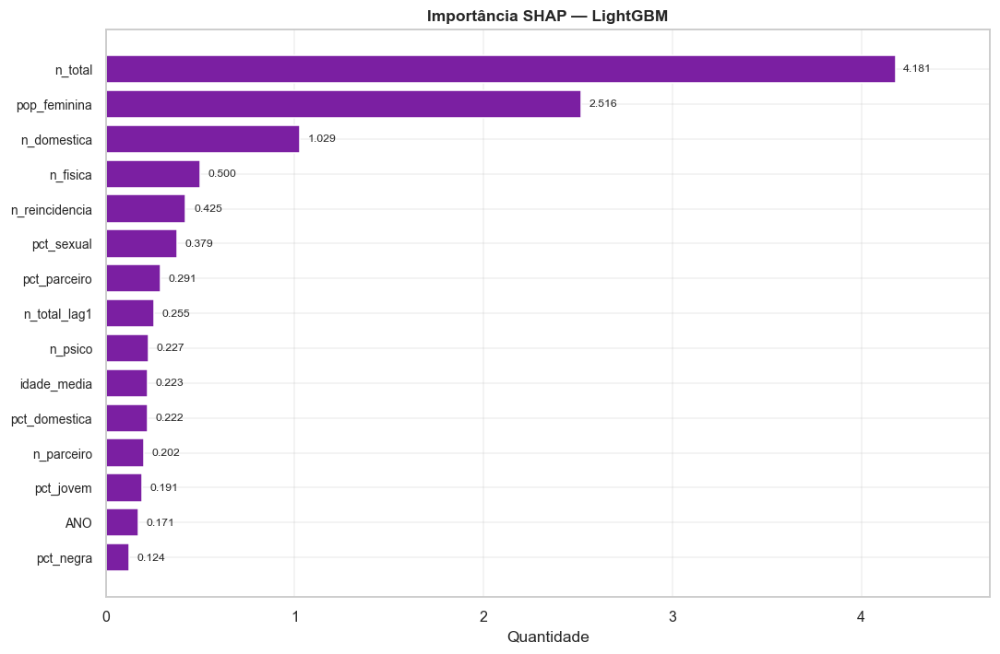

   ✅ Explicabilidade SHAP concluída.


In [48]:
banner("EXPLICABILIDADE DO MODELO (SHAP)")

if CAP.get("shap") and modelagem_viavel and melhor_clf and \
        hasattr(clf_resultados.get(melhor_clf, {}).get("modelo"), "feature_importances_"):
    try:
        modelo_exp = clf_resultados[melhor_clf]["modelo"]
        Xexp = X_te if not clf_resultados[melhor_clf]["escala"] else X_te_s
        explainer = shap.TreeExplainer(modelo_exp)
        sv = explainer.shap_values(Xexp[:min(100, len(Xexp))])
        if isinstance(sv, list):
            imp_shap = np.mean([np.abs(s).mean(0) for s in sv], axis=0)
        else:
            imp_shap = np.abs(sv).mean(0)
            if imp_shap.ndim > 1:
                imp_shap = imp_shap.mean(axis=-1)
        serie_shap = pd.Series(imp_shap, index=FEATURES_ML).sort_values(ascending=False)
        show_df(serie_shap.rename_axis("Atributo").reset_index(name="SHAP_médio"),
                "Importância SHAP (top atributos)", max_linhas=15)
        barras_horizontais(serie_shap.head(15),
                           f"Importância SHAP — {melhor_clf}",
                           "37_shap_importancia", cor=COR_PRIMARIA, fmt="{:.3f}",
                           descricao="Importância SHAP")
        salvar_csv(serie_shap.rename_axis("atributo").reset_index(name="shap"),
                   "37_shap_importancia", "Importância SHAP")
        sucesso("Explicabilidade SHAP concluída.")
    except Exception as exc:
        aviso("SHAP falhou: %s", exc)
else:
    info("SHAP indisponível ou sem modelo de árvore — usando importância nativa.")

============================================================
## SEÇÃO 38 — Relatório consolidado de TODOS os modelos
============================================================

Conforme exigido pelo projeto: um **relatório de todos os modelos treinados** com
aplicação de Redes Neurais, Machine Learning e Deep Learning. Consolida o registro
`MODELOS` em uma tabela única, ordenada por família e desempenho, exibida inline e
exportada em `.csv`/`.xlsx`/`.txt`/`.log` (Texttable) e `.json`.


[44] RELATÓRIO CONSOLIDADO DE MODELOS TREINADOS

--- Todos os modelos treinados (registro completo) -------------------


,Modelo,Família,Tarefa,Tempo_s,Observação,MAE,RMSE,deviance,accuracy,precision,...,f1_macro,roc_auc_ovr,R2,MAPE,silhouette,k,n_clusters,n_ruido,n_anomalias,contaminacao
0,"SARIMA(1,1,1)(1,1,0,12)",Estatística (séries),Previsão série temporal,0.192,,200.0455,333.6128,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Poisson (tendência anual),Estatística,Regressão,NaN,,NaN,NaN,1417.6093,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,DecisionTree,ML,Classificação,0.013,,NaN,NaN,NaN,0.8795,0.8855,...,0.8808,0.9220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,RandomForest,ML,Classificação,0.643,,NaN,NaN,NaN,0.8996,0.9008,...,0.9000,0.9772,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ExtraTrees,ML,Classificação,0.434,,NaN,NaN,NaN,0.8594,0.8635,...,0.8606,0.9610,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,GradientBoosting,ML,Classificação,0.894,,NaN,NaN,NaN,0.9438,0.9459,...,0.9442,0.9857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,HistGradientBoosting,ML,Classificação,2.156,,NaN,NaN,NaN,0.9478,0.9517,...,0.9484,0.9958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,AdaBoost,ML,Classificação,0.128,,NaN,NaN,NaN,0.8233,0.8509,...,0.8274,0.9028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,LogisticRegression,ML,Classificação,0.029,,NaN,NaN,NaN,0.7871,0.7938,...,0.7872,0.9245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,KNN,ML,Classificação,0.135,,NaN,NaN,NaN,0.6305,0.6434,...,0.6318,0.8229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Modelos por família ----------------------------------------------


,Família,Qtde de modelos
0,Deep Learning,3
1,Estatística,1
2,Estatística (séries),1
3,ML,29



--- Modelos por tarefa -----------------------------------------------


,Tarefa,Qtde de modelos
0,Anomalia,3
1,Classificação,14
2,Clusterização,3
3,Previsão série temporal,3
4,Regressão,11


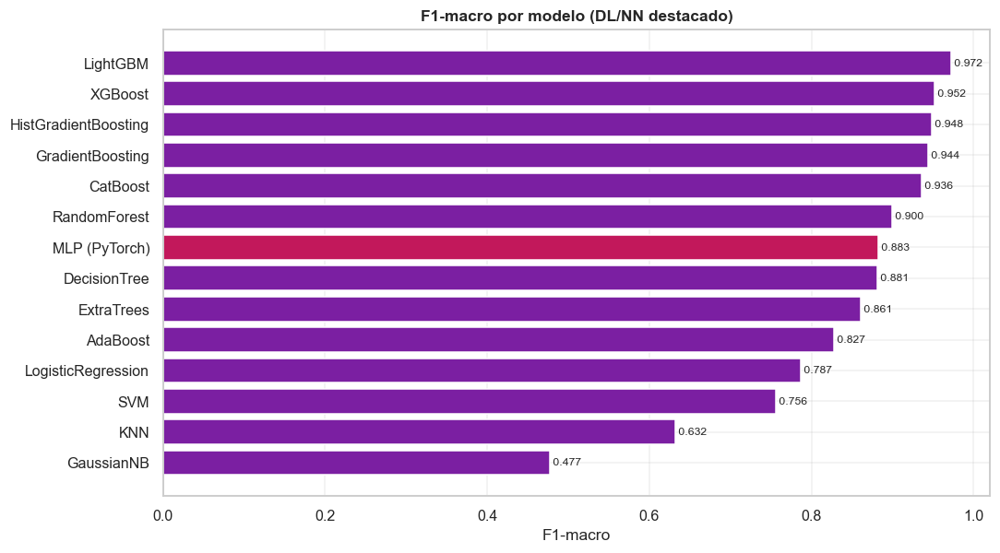

   📝 Relatório salvo: 38_relatorio_modelos.txt
   ✅ Relatório consolidado de modelos concluído — 34 modelos.


In [49]:
banner("RELATÓRIO CONSOLIDADO DE MODELOS TREINADOS")

if MODELOS:
    df_modelos = pd.DataFrame(MODELOS)
    # ordena colunas: identificação primeiro, métricas depois
    cols_id = ["Modelo", "Família", "Tarefa", "Tempo_s", "Observação"]
    cols_met = [c for c in df_modelos.columns if c not in cols_id]
    df_modelos = df_modelos[[c for c in cols_id if c in df_modelos.columns] + cols_met]
    show_df(df_modelos, "Todos os modelos treinados (registro completo)",
            max_linhas=40)
    salvar_csv(df_modelos, "38_relatorio_modelos", "Relatório consolidado de modelos")
    salvar_xlsx(df_modelos, "38_relatorio_modelos",
                "Relatório consolidado de modelos", aba="Modelos")
    registrar_planilha("Relatorio_Modelos", df_modelos)
    salvar_json(MODELOS, "38_modelos", "Registro de modelos (JSON)")

    # Resumo por família e por tarefa
    resumo_fam = (df_modelos.groupby("Família").size()
                  .rename_axis("Família").reset_index(name="Qtde de modelos"))
    resumo_tarefa = (df_modelos.groupby("Tarefa").size()
                     .rename_axis("Tarefa").reset_index(name="Qtde de modelos"))
    show_df(resumo_fam, "Modelos por família", max_linhas=10)
    show_df(resumo_tarefa, "Modelos por tarefa", max_linhas=10)

    # Melhores modelos por tarefa
    melhores = {}
    if "f1_macro" in df_modelos.columns:
        sub = df_modelos[df_modelos["Tarefa"] == "Classificação"].dropna(subset=["f1_macro"])
        if len(sub):
            melhores["Melhor classificador (F1)"] = (
                f"{sub.loc[sub['f1_macro'].idxmax(), 'Modelo']} "
                f"(F1={sub['f1_macro'].max():.3f})")
    if "RMSE" in df_modelos.columns:
        sub = df_modelos[df_modelos["Tarefa"] == "Regressão"].dropna(subset=["RMSE"])
        if len(sub):
            melhores["Melhor regressor (RMSE)"] = (
                f"{sub.loc[sub['RMSE'].idxmin(), 'Modelo']} "
                f"(RMSE={sub['RMSE'].min():.2f})")
    melhores["Total de modelos treinados"] = len(df_modelos)
    melhores["Famílias contempladas"] = ", ".join(sorted(df_modelos["Família"].unique()))

    # Comparativo gráfico (F1 dos classificadores por família)
    if plt is not None and "f1_macro" in df_modelos.columns:
        sub = df_modelos.dropna(subset=["f1_macro"]).sort_values("f1_macro")
        if len(sub):
            cores = [COR_SECUNDARIA if f in ("Deep Learning", "Rede Neural")
                     else COR_PRIMARIA for f in sub["Família"]]
            fig, ax = plt.subplots(figsize=(10, max(3.5, 0.4 * len(sub))))
            ax.barh(sub["Modelo"], sub["f1_macro"], color=cores)
            ax.set_title("F1-macro por modelo (DL/NN destacado)")
            ax.set_xlabel("F1-macro")
            for i, v in enumerate(sub["f1_macro"]):
                ax.text(v, i, f" {v:.3f}", va="center", fontsize=8)
            fig.tight_layout()
            salvar_grafico(fig, "38_f1_todos_modelos", "F1 de todos os modelos")

    # Relatório Texttable
    rel_m = RelatorioTexto("Relatório Consolidado de Modelos (ML / DL / NN)")
    rel_m.texto("Modelos treinados com Machine Learning, Deep Learning e Redes Neurais.")
    rel_m.kv(melhores, titulo="Síntese")
    rel_m.secao("Tabela completa de modelos e métricas")
    rel_m.tabela_df(df_modelos, max_linhas=60)
    rel_m.secao("Modelos por família")
    rel_m.tabela_df(resumo_fam)
    rel_m.secao("Observações metodológicas")
    rel_m.texto(
        "- A classe de risco municipal é definida por tercis da taxa por 100 mil "
        "mulheres.\n"
        "- A validação usa divisão treino/teste estratificada (e validação temporal "
        "para as séries).\n"
        "- Modelos de Deep Learning (PyTorch/TensorFlow) só são treinados quando as "
        "bibliotecas estão disponíveis; caso contrário, há fallback documentado.\n"
        "- Todos os resultados são agregados; nenhum dado pessoal é utilizado (LGPD)."
    )
    rel_m.salvar(DIRS["relatorios"] / "38_relatorio_modelos.txt")
    MODELOS_DF = df_modelos
else:
    aviso("Nenhum modelo registrado (ambiente sem ML ou amostra insuficiente).")
    MODELOS_DF = pd.DataFrame()

sucesso("Relatório consolidado de modelos concluído — %d modelos.", len(MODELOS))

============================================================
## SEÇÃO 38.A — Validação cruzada e validação temporal
============================================================

Aprofunda a avaliação dos melhores modelos: **validação cruzada** estratificada (robustez
do desempenho) e **validação temporal** (treina no passado, testa no futuro), evitando
vazamento de informação e medindo a real capacidade preditiva ao longo do tempo.

In [50]:
banner("VALIDAÇÃO CRUZADA E TEMPORAL")

if modelagem_viavel and clf_resultados:
    # 38.A.1  Validação cruzada estratificada (k-fold) do melhor classificador
    try:
        nome_best = melhor_clf
        modelo_best = clf_resultados[nome_best]["modelo"]
        usa_escala = clf_resultados[nome_best]["escala"]
        Xcv = StandardScaler().fit_transform(X) if usa_escala else X
        n_splits = min(CFG.cv_folds, int(pd.Series(y_enc).value_counts().min()))
        n_splits = max(2, n_splits)
        skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=SEED)
        scores = cross_val_score(modelo_best, Xcv, y_enc, cv=skf,
                                 scoring="f1_macro")
        info("Validação cruzada (%d folds) — F1-macro: %.3f ± %.3f",
             n_splits, scores.mean(), scores.std())
        df_cv = pd.DataFrame({"Fold": range(1, len(scores) + 1),
                              "F1_macro": scores.round(4)})
        show_df(df_cv, f"Validação cruzada — {nome_best}", max_linhas=10)
        salvar_csv(df_cv, "38A_validacao_cruzada", "Validação cruzada do melhor modelo")
        registrar_modelo(f"{nome_best} (CV {n_splits}-fold)", "Validação",
                         "Classificação",
                         {"f1_cv_media": scores.mean(), "f1_cv_dp": scores.std()},
                         obs="validação cruzada estratificada")
    except Exception as exc:
        aviso("Validação cruzada falhou: %s", exc)

    # 38.A.2  Validação temporal (treina anos antigos, testa anos recentes)
    try:
        anos_ordenados = sorted(PAINEL["ANO"].unique())
        if len(anos_ordenados) >= 4:
            corte = anos_ordenados[int(len(anos_ordenados) * 0.7)]
            tr_mask = PAINEL["ANO"] <= corte
            te_mask = PAINEL["ANO"] > corte
            Xt = PAINEL[FEATURES_ML].fillna(0).values
            yt = LabelEncoder().fit_transform(PAINEL["classe_risco"].astype(str))
            if te_mask.sum() >= 5 and len(set(yt[tr_mask.values])) > 1:
                mt = RandomForestClassifier(n_estimators=200, random_state=SEED, n_jobs=-1)
                mt.fit(Xt[tr_mask.values], yt[tr_mask.values])
                pt = mt.predict(Xt[te_mask.values])
                f1t = f1_score(yt[te_mask.values], pt, average="macro", zero_division=0)
                acct = accuracy_score(yt[te_mask.values], pt)
                info("Validação temporal (treino≤%d, teste>%d): F1=%.3f | Acc=%.3f",
                     corte, corte, f1t, acct)
                registrar_modelo("RandomForest (validação temporal)", "Validação",
                                 "Classificação", {"f1_macro": f1t, "accuracy": acct},
                                 obs=f"treino≤{corte}, teste>{corte}")
    except Exception as exc:
        aviso("Validação temporal falhou: %s", exc)
sucesso("Validação cruzada e temporal concluídas.")


[45] VALIDAÇÃO CRUZADA E TEMPORAL
   Validação cruzada (5 folds) — F1-macro: 0.934 ± 0.013

--- Validação cruzada — LightGBM -------------------------------------


,Fold,F1_macro
0,1,0.9545
1,2,0.9298
2,3,0.9143
3,4,0.9354
4,5,0.9343


   🧠 LightGBM (CV 5-fold)       [Classificação] f1_cv_media=0.934 | f1_cv_dp=0.013
   Validação temporal (treino≤2020, teste>2020): F1=0.888 | Acc=0.885
   🧠 RandomForest (validação temporal) [Classificação] f1_macro=0.888 | accuracy=0.885
   ✅ Validação cruzada e temporal concluídas.


============================================================
## SEÇÃO 38.B — Otimização de hiperparâmetros (GridSearchCV)
============================================================

Busca em grade dos hiperparâmetros do Random Forest (modelo robusto e interpretável),
com validação cruzada. Em *smoke test* a grade é reduzida para manter a execução rápida.


[46] OTIMIZAÇÃO DE HIPERPARÂMETROS (GRID SEARCH)
   ⏱️  GridSearchCV concluído em 44.75s
   Melhores hiperparâmetros: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_split': 5, 'n_estimators': 400}
   Melhor F1-macro (CV): 0.847
   🧠 RandomForest (tuned)       [Classificação] f1_macro_cv=0.847


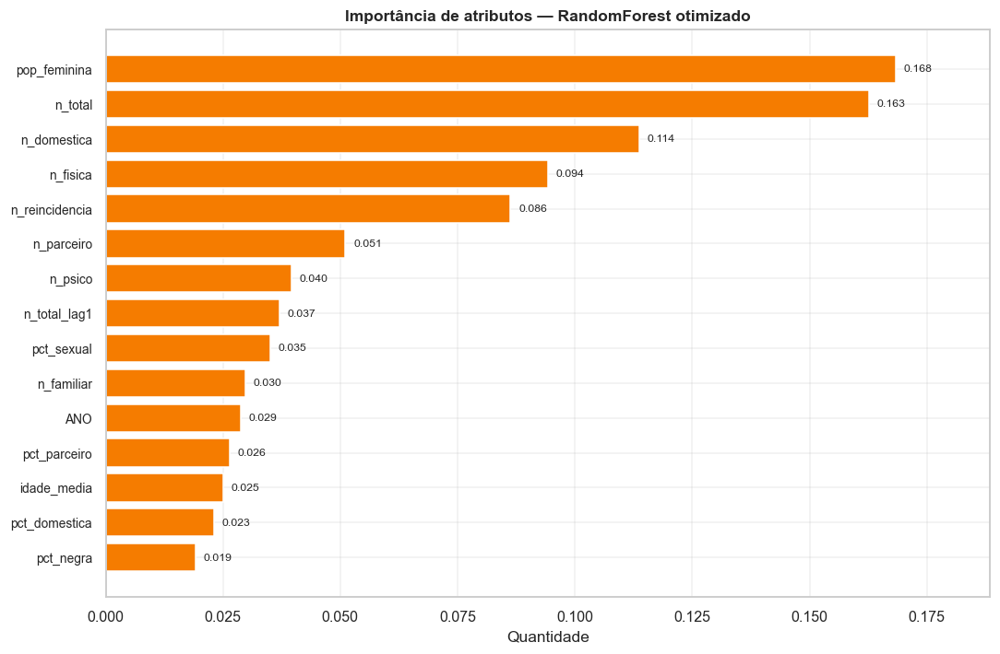

   ✅ Otimização de hiperparâmetros concluída.


In [51]:
banner("OTIMIZAÇÃO DE HIPERPARÂMETROS (GRID SEARCH)")

if modelagem_viavel and clf_resultados:
    try:
        if CFG.smoke_test:
            grade = {"n_estimators": [100, 200], "max_depth": [None, 8]}
        else:
            grade = {"n_estimators": [200, 400], "max_depth": [None, 8, 14],
                     "min_samples_split": [2, 5], "max_features": ["sqrt", "log2"]}
        n_splits = max(2, min(3, int(pd.Series(y_enc).value_counts().min())))
        gs = GridSearchCV(
            RandomForestClassifier(random_state=SEED, n_jobs=-1),
            grade, cv=n_splits, scoring="f1_macro", n_jobs=-1)
        with cronometro("GridSearchCV"):
            gs.fit(X, y_enc)
        info("Melhores hiperparâmetros: %s", gs.best_params_)
        info("Melhor F1-macro (CV): %.3f", gs.best_score_)
        registrar_modelo("RandomForest (tuned)", "ML (tuning)", "Classificação",
                         {"f1_macro_cv": gs.best_score_}, obs=str(gs.best_params_)[:60])
        salvar_json({"melhores_parametros": gs.best_params_,
                     "melhor_score_f1": gs.best_score_},
                    "38B_hiperparametros", "Hiperparâmetros otimizados")
        # importância do modelo tunado
        if hasattr(gs.best_estimator_, "feature_importances_"):
            imp_t = pd.Series(gs.best_estimator_.feature_importances_,
                              index=FEATURES_ML).sort_values(ascending=False)
            barras_horizontais(imp_t.head(15),
                               "Importância de atributos — RandomForest otimizado",
                               "38B_importancia_tuned", cor=COR_DESTAQUE, fmt="{:.3f}",
                               descricao="Importância (modelo tunado)")
    except Exception as exc:
        aviso("GridSearch falhou: %s", exc)
sucesso("Otimização de hiperparâmetros concluída.")

============================================================
## SEÇÃO 38.C — Síntese anual e perfis municipais
============================================================

Gera uma **síntese por ano** (principais indicadores ano a ano) e **fichas de perfil**
dos municípios prioritários — material direto para gestores e relatórios executivos.

In [52]:
banner("SÍNTESE ANUAL E PERFIS MUNICIPAIS")

# 38.C.1  Síntese anual
sintese = []
for ano in sorted(DF_MULHERES["ANO"].dropna().unique()):
    sub = DF_MULHERES[DF_MULHERES["ANO"] == ano]
    sintese.append({
        "Ano": int(ano),
        "Notificações": len(sub),
        "Doméstica": int(sub["FL_VIOL_DOMESTICA"].sum()),
        "Sexual": int(sub["FL_VIOL_SEXUAL"].sum()),
        "Estupro": int(sub["FL_ESTUPRO"].sum()),
        "Ameaça": int(sub["FL_AMEACA"].sum()),
        "Feminicídio": int(sub["FL_FEMINICIDIO"].sum()),
        "Idade_média": round(sub["IDADE"].mean(), 1),
        "% parceiro íntimo": round(100 * sub["FL_PARCEIRO_INTIMO"].mean(), 1),
    })
df_sintese = pd.DataFrame(sintese)
show_df(df_sintese, "Síntese anual dos principais indicadores", max_linhas=20)
salvar_csv(df_sintese, "38C_sintese_anual", "Síntese anual de indicadores")
salvar_xlsx(df_sintese, "38C_sintese_anual", "Síntese anual", aba="Sintese_Anual")
registrar_planilha("Sintese_Anual", df_sintese)
rel_sint = RelatorioTexto("Síntese Anual de Indicadores")
rel_sint.tabela_df(df_sintese, max_linhas=30)
rel_sint.salvar(DIRS["relatorios"] / "38C_sintese_anual.txt")

# 38.C.2  Fichas de perfil dos municípios prioritários (top por Índice de Alerta)
top_prioritarios = idx_rank.head(10)["COD_MUN"].tolist()
rel_perfis = RelatorioTexto("Fichas de Perfil Municipal (prioritários)")
for cod in top_prioritarios:
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    nome_mun = MUNICIPIOS_MS.get(cod, cod)
    if not len(sub):
        continue
    ficha = {
        "Município": nome_mun,
        "População feminina (2022)": formato_numero(POP_FEM_MUN_MS.get(cod, 0)),
        "Notificações (mulheres)": len(sub),
        "Taxa/100k mulheres": (df_painel.loc[df_painel["COD_MUN"] == cod,
                                             "Taxa_Total"].values[0]
                               if (df_painel["COD_MUN"] == cod).any() else "-"),
        "Violência doméstica": int(sub["FL_VIOL_DOMESTICA"].sum()),
        "Violência sexual": int(sub["FL_VIOL_SEXUAL"].sum()),
        "Feminicídio (proxy)": int(sub["FL_FEMINICIDIO"].sum()),
        "Faixa etária predominante": _moda_segura(sub["FAIXA_ETARIA"]),
        "Raça/cor predominante": _moda_segura(sub["RACA_COR"]),
        "Vínculo predominante": _moda_segura(sub["VINCULO_AUTOR"]),
        "Local predominante": _moda_segura(sub["LOCAL_DESC"]),
    }
    rel_perfis.secao(f"Ficha — {nome_mun}")
    rel_perfis.kv(ficha)
rel_perfis.salvar(DIRS["relatorios"] / "38C_fichas_perfil_municipal.txt")
info("Fichas de perfil geradas para %d municípios prioritários.", len(top_prioritarios))
sucesso("Síntese anual e perfis municipais concluídos.")


[47] SÍNTESE ANUAL E PERFIS MUNICIPAIS

--- Síntese anual dos principais indicadores -------------------------


,Ano,Notificações,Doméstica,Sexual,Estupro,Ameaça,Feminicídio,Idade_média,% parceiro íntimo
0,2009,1907,1602,211,95,233,3,27.3,28.5
1,2010,2973,2441,321,195,491,12,26.9,33.6
2,2011,3611,3073,310,183,401,17,27.0,31.2
3,2012,3775,3178,401,228,411,9,26.8,29.9
4,2013,4361,3620,470,324,465,26,27.2,28.9
5,2014,4796,3934,479,340,463,16,26.8,31.4
6,2015,4513,3627,372,245,398,0,27.6,28.3
7,2016,4614,3724,399,277,441,0,28.3,30.6
8,2017,5412,4403,439,322,493,0,27.4,27.7
9,2018,6025,5032,492,366,620,0,27.3,27.1


   📝 Relatório salvo: 38C_sintese_anual.txt
   📝 Relatório salvo: 38C_fichas_perfil_municipal.txt
   Fichas de perfil geradas para 10 municípios prioritários.
   ✅ Síntese anual e perfis municipais concluídos.


============================================================
## SEÇÃO 38.D — Recorte regional (Centro-Oeste) e comparação
============================================================

Posiciona MS no contexto do **Centro-Oeste** e do **Brasil**, com gráficos comparativos
de taxa por 100 mil mulheres por UF e por região.


[48] RECORTE REGIONAL (CENTRO-OESTE) E COMPARAÇÃO

--- Taxa por região (por 100 mil mulheres) ---------------------------


,Regiao,Notificacoes,Pop_feminina,Taxa_100k
4,Sul,716608,15070642,4755.0
3,Sudeste,1883342,42708513,4409.8
0,Centro-Oeste,292178,8200154,3563.1
2,Norte,244921,8736448,2803.4
1,Nordeste,652507,27515097,2371.5


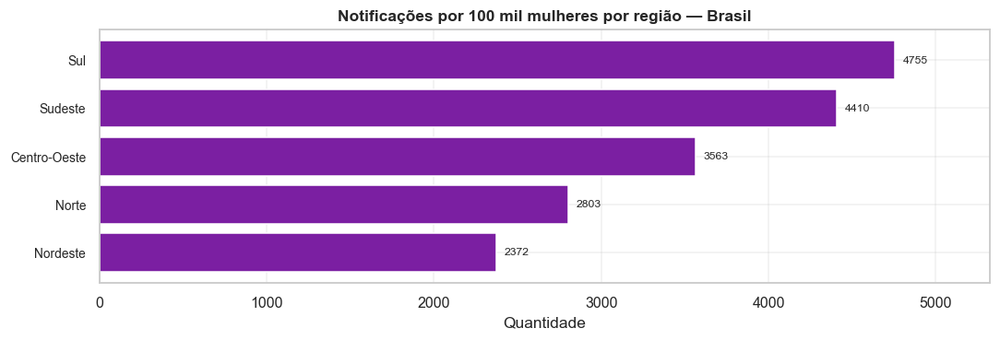


--- Centro-Oeste — detalhe por UF ------------------------------------


,UF,Estado,Notificacoes,Taxa_100k
1,MS,Mato Grosso do Sul,91993,6628.31
7,DF,Distrito Federal,65484,4617.17
11,GO,Goiás,100178,2820.14
22,MT,Mato Grosso,34523,1874.45


   ✅ Recorte regional concluído.


In [53]:
banner("RECORTE REGIONAL (CENTRO-OESTE) E COMPARAÇÃO")

if len(df_nacional):
    # Agregado por região
    reg = (df_nacional.groupby("Regiao")
           .agg(Notificacoes=("Notificacoes", "sum"),
                Pop_feminina=("Pop_feminina", "sum")).reset_index())
    reg["Taxa_100k"] = (reg["Notificacoes"] / reg["Pop_feminina"] * 100_000).round(1)
    reg = reg.sort_values("Taxa_100k", ascending=False)
    show_df(reg, "Taxa por região (por 100 mil mulheres)", max_linhas=6)
    barras_horizontais(reg.set_index("Regiao")["Taxa_100k"],
                       "Notificações por 100 mil mulheres por região — Brasil",
                       "38D_regioes_taxa", cor=COR_PRIMARIA, fmt="{:.0f}",
                       descricao="Taxa por região")
    salvar_csv(reg, "38D_regioes", "Agregado por região")
    # Centro-Oeste detalhado
    co_det = (df_nacional[df_nacional["Regiao"] == "Centro-Oeste"]
              .sort_values("Taxa_100k", ascending=False))
    show_df(co_det[["UF", "Estado", "Notificacoes", "Taxa_100k"]],
            "Centro-Oeste — detalhe por UF", max_linhas=6)
    salvar_csv(co_det, "38D_centro_oeste", "Centro-Oeste detalhado")
sucesso("Recorte regional concluído.")

============================================================
## SEÇÃO 38.E — Glossário, catálogo de fontes e notas metodológicas
============================================================

Apêndice documental: glossário dos termos-chave, catálogo das fontes públicas
recomendadas pelo plano e notas metodológicas/éticas — exportados como relatório e JSON
para compor a trilha de auditoria do projeto.

In [54]:
banner("GLOSSÁRIO, CATÁLOGO DE FONTES E NOTAS METODOLÓGICAS")

GLOSSARIO = OrderedDict([
    ("Notificação", "Registro de um caso de violência no SINAN (base de saúde)."),
    ("Ocorrência", "Evento de violência; em segurança pública, registro policial."),
    ("Vítima", "Pessoa atingida pela violência (aqui, foco em mulheres)."),
    ("Autor", "Pessoa apontada como provável agressor(a)."),
    ("Feminicídio", "Homicídio de mulher por razões de gênero (proxy no SINAN: "
                    "óbito por violência em vítima feminina)."),
    ("VPI", "Violência por Parceiro Íntimo (cônjuge, ex, namorado, ex-namorado)."),
    ("Taxa por 100 mil", "Casos / população-alvo × 100.000 (comparabilidade)."),
    ("IMR", "Índice Municipal de Risco (z-scores das taxas por eixo)."),
    ("IRI", "Índice de Resposta Institucional (proxy de medidas protetivas)."),
    ("k-anonimato", "Supressão de células com contagem < k para evitar reidentificação."),
    ("Camadas bronze/silver/gold", "Dados brutos / tratados / analíticos."),
    ("Subnotificação", "Casos reais não registrados na base oficial."),
])
df_gloss = pd.DataFrame(list(GLOSSARIO.items()), columns=["Termo", "Definição"])
show_df(df_gloss, "Glossário de termos", max_linhas=20)
salvar_csv(df_gloss, "38E_glossario", "Glossário de termos")
salvar_json(dict(GLOSSARIO), "38E_glossario", "Glossário (JSON)")

CATALOGO_FONTES = [
    ["SINAN/DATASUS", "Saúde", "Notificações de violência interpessoal/autoprovocada",
     "Usada (principal)"],
    ["SEJUSP/MS", "Segurança pública", "Ocorrências, feminicídios, estupros, ameaças",
     "Complementar (não integrada nesta versão)"],
    ["IPEA / Atlas da Violência", "Pesquisa", "Homicídios, séries históricas, taxas",
     "Referência metodológica"],
    ["SIM/DATASUS", "Saúde", "Mortalidade por causas externas", "Complementar"],
    ["IBGE", "Estatística oficial", "População, malhas, códigos territoriais",
     "Usada (denominadores e malhas)"],
    ["Fórum Bras. de Segurança Pública", "Pesquisa", "Anuário de segurança pública",
     "Referência"],
    ["CNJ / TJMS", "Justiça", "Medidas protetivas (quando públicas)",
     "Não disponível nesta versão"],
    ["Monitor da Violência (MS)", "Mídia/observatório", "Acompanhamento de casos",
     "Referência"],
]
df_cat = pd.DataFrame(CATALOGO_FONTES,
                      columns=["Fonte", "Domínio", "Conteúdo", "Status no projeto"])
show_df(df_cat, "Catálogo de fontes públicas (plano)", max_linhas=12)
salvar_csv(df_cat, "38E_catalogo_fontes", "Catálogo de fontes públicas")
registrar_planilha("Catalogo_Fontes", df_cat)

rel_meto = RelatorioTexto("Notas Metodológicas e Catálogo de Fontes")
rel_meto.secao("Catálogo de fontes")
rel_meto.tabela_df(df_cat)
rel_meto.secao("Glossário")
rel_meto.tabela_df(df_gloss)
rel_meto.secao("Notas metodológicas e limitações")
rel_meto.texto(
    "1. O SINAN é base de SAÚDE (notificações), não de segurança pública; há "
    "subnotificação e variação de cobertura entre municípios/anos.\n"
    "2. Feminicídio e tentativa de feminicídio são PROXIES (o SINAN não os codifica "
    "formalmente).\n"
    "3. Taxas usam denominadores do Censo IBGE 2022 e fração feminina estadual; taxas "
    "acumuladas multi-ano servem para comparação relativa, não como incidência anual.\n"
    "4. 'Violência doméstica' é proxy (ocorrência na residência ou vínculo íntimo/"
    "familiar).\n"
    "5. Resultados em modo SINTÉTICO são apenas demonstrativos do pipeline.\n"
    "6. Todos os produtos são agregados e respeitam a LGPD; nenhuma reidentificação é "
    "possível."
)
rel_meto.secao("Princípios de proteção de dados (LGPD)")
rel_meto.texto(
    "- Sem nomes, CPF, RG, endereço, telefone ou dados individualizados.\n"
    "- Supressão de pequenas células (k-anonimato) nas tabelas publicáveis.\n"
    "- Logs sem dados pessoais; separação entre dados brutos e produtos públicos.\n"
    "- Dicionário de dados e trilha de auditoria (MANIFESTO) disponibilizados."
)
rel_meto.salvar(DIRS["relatorios"] / "38E_notas_metodologicas.txt")
sucesso("Glossário, catálogo de fontes e notas metodológicas concluídos.")


[49] GLOSSÁRIO, CATÁLOGO DE FONTES E NOTAS METODOLÓGICAS

--- Glossário de termos ----------------------------------------------


,Termo,Definição
0,Notificação,Registro de um caso de violência no SINAN (bas...
1,Ocorrência,"Evento de violência; em segurança pública, reg..."
2,Vítima,"Pessoa atingida pela violência (aqui, foco em ..."
3,Autor,Pessoa apontada como provável agressor(a).
4,Feminicídio,Homicídio de mulher por razões de gênero (prox...
5,VPI,"Violência por Parceiro Íntimo (cônjuge, ex, na..."
6,Taxa por 100 mil,Casos / população-alvo × 100.000 (comparabilid...
7,IMR,Índice Municipal de Risco (z-scores das taxas ...
8,IRI,Índice de Resposta Institucional (proxy de med...
9,k-anonimato,Supressão de células com contagem < k para evi...



--- Catálogo de fontes públicas (plano) ------------------------------


,Fonte,Domínio,Conteúdo,Status no projeto
0,SINAN/DATASUS,Saúde,Notificações de violência interpessoal/autopro...,Usada (principal)
1,SEJUSP/MS,Segurança pública,"Ocorrências, feminicídios, estupros, ameaças",Complementar (não integrada nesta versão)
2,IPEA / Atlas da Violência,Pesquisa,"Homicídios, séries históricas, taxas",Referência metodológica
3,SIM/DATASUS,Saúde,Mortalidade por causas externas,Complementar
4,IBGE,Estatística oficial,"População, malhas, códigos territoriais",Usada (denominadores e malhas)
5,Fórum Bras. de Segurança Pública,Pesquisa,Anuário de segurança pública,Referência
6,CNJ / TJMS,Justiça,Medidas protetivas (quando públicas),Não disponível nesta versão
7,Monitor da Violência (MS),Mídia/observatório,Acompanhamento de casos,Referência


   📝 Relatório salvo: 38E_notas_metodologicas.txt
   ✅ Glossário, catálogo de fontes e notas metodológicas concluídos.


============================================================
## SEÇÃO 38.F — Diagnósticos estatísticos (correlação e distribuições)
============================================================

Diagnósticos exploratórios sobre a matriz município × ano: matriz de **correlação** entre
atributos, **boxplots** das taxas por classe de risco e dispersão **população × taxa**.


[50] DIAGNÓSTICOS ESTATÍSTICOS (CORRELAÇÃO E DISTRIBUIÇÕES)


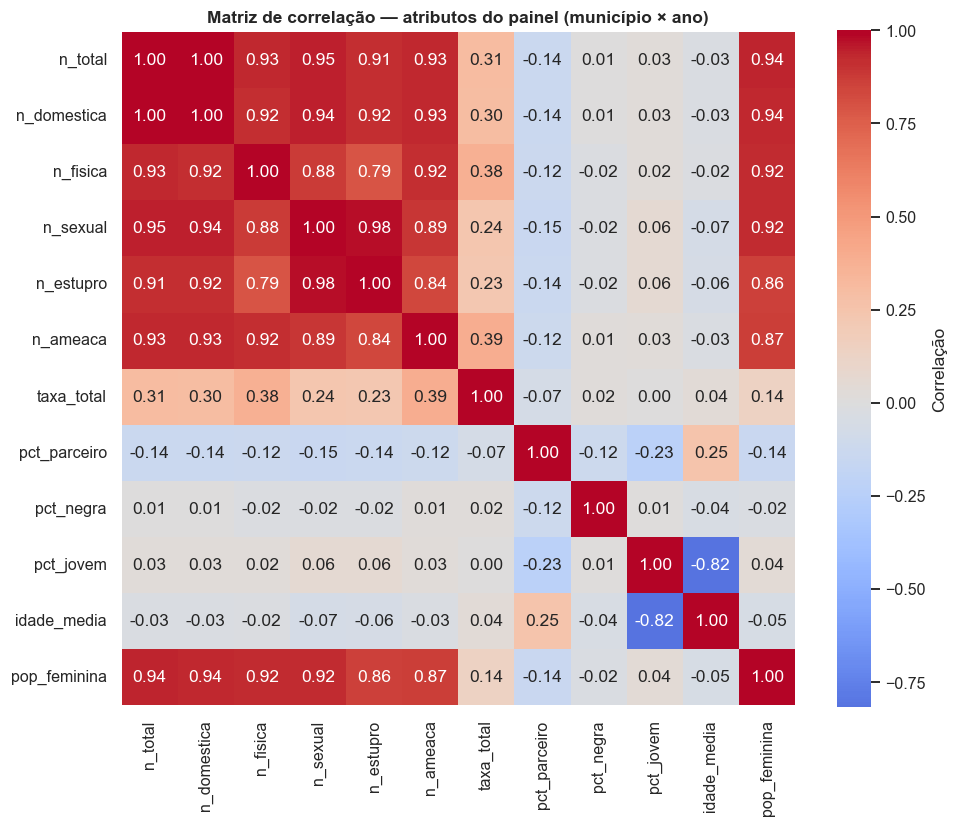

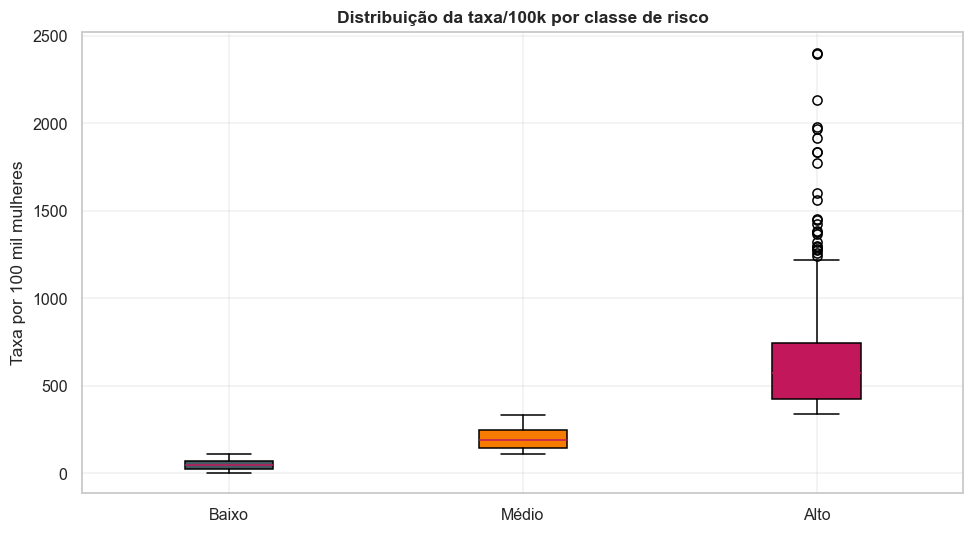

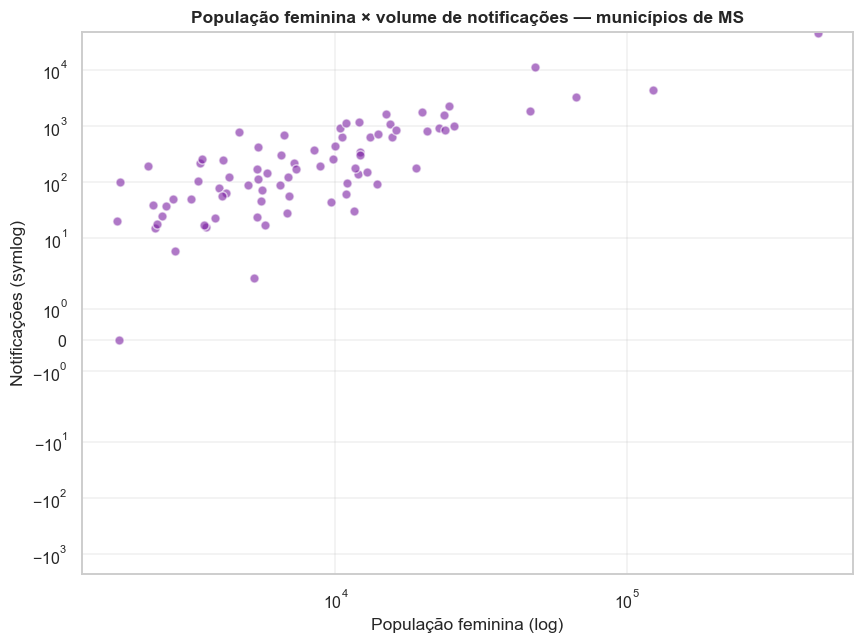

   ✅ Diagnósticos estatísticos concluídos.


In [55]:
banner("DIAGNÓSTICOS ESTATÍSTICOS (CORRELAÇÃO E DISTRIBUIÇÕES)")

cols_corr = [c for c in ["n_total", "n_domestica", "n_fisica", "n_sexual",
                         "n_estupro", "n_ameaca", "taxa_total", "pct_parceiro",
                         "pct_negra", "pct_jovem", "idade_media", "pop_feminina"]
             if c in PAINEL.columns]
if len(cols_corr) >= 3:
    corr = PAINEL[cols_corr].corr()
    salvar_csv(corr.reset_index(), "38F_correlacao", "Matriz de correlação dos atributos")
    if plt is not None:
        fig, ax = plt.subplots(figsize=(9, 7.5))
        if sns is not None:
            sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0,
                        ax=ax, square=True, cbar_kws={"label": "Correlação"})
        else:
            im = ax.imshow(corr.values, cmap="coolwarm", vmin=-1, vmax=1)
            ax.set_xticks(range(len(cols_corr))); ax.set_xticklabels(cols_corr, rotation=90)
            ax.set_yticks(range(len(cols_corr))); ax.set_yticklabels(cols_corr)
            plt.colorbar(im, ax=ax)
        ax.set_title("Matriz de correlação — atributos do painel (município × ano)")
        fig.tight_layout()
        salvar_grafico(fig, "38F_correlacao_heatmap", "Matriz de correlação")

# Boxplot das taxas por classe de risco
if modelagem_viavel and plt is not None and "classe_risco" in PAINEL.columns:
    try:
        fig, ax = plt.subplots(figsize=(9, 5))
        ordem = ["Baixo", "Médio", "Alto"]
        dados_box = [PAINEL.loc[PAINEL["classe_risco"].astype(str) == c, "taxa_total"]
                     .dropna().values for c in ordem]
        bp = ax.boxplot(dados_box, labels=ordem, patch_artist=True)
        for patch, cor in zip(bp["boxes"], [COR_NEUTRA, COR_DESTAQUE, COR_SECUNDARIA]):
            patch.set_facecolor(cor)
        ax.set_title("Distribuição da taxa/100k por classe de risco")
        ax.set_ylabel("Taxa por 100 mil mulheres")
        fig.tight_layout()
        salvar_grafico(fig, "38F_boxplot_classe", "Boxplot de taxa por classe")
    except Exception as exc:
        aviso("Boxplot falhou: %s", exc)

# Dispersão população × notificações
if plt is not None:
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.scatter(df_painel["Pop_feminina"], df_painel["N_Total"],
               alpha=0.6, color=COR_PRIMARIA, edgecolors="white")
    ax.set_xscale("log"); ax.set_yscale("symlog")
    ax.set_xlabel("População feminina (log)"); ax.set_ylabel("Notificações (symlog)")
    ax.set_title("População feminina × volume de notificações — municípios de MS")
    fig.tight_layout()
    salvar_grafico(fig, "38F_pop_vs_notif", "População × notificações")
sucesso("Diagnósticos estatísticos concluídos.")

============================================================
## SEÇÃO 38.G — Curvas ROC e curva de aprendizado
============================================================

Recasta o problema como **binário** (alto risco × demais) para traçar curvas **ROC**
de vários modelos e uma **curva de aprendizado** do Random Forest (viés/variância).


[51] CURVAS ROC E DE APRENDIZADO


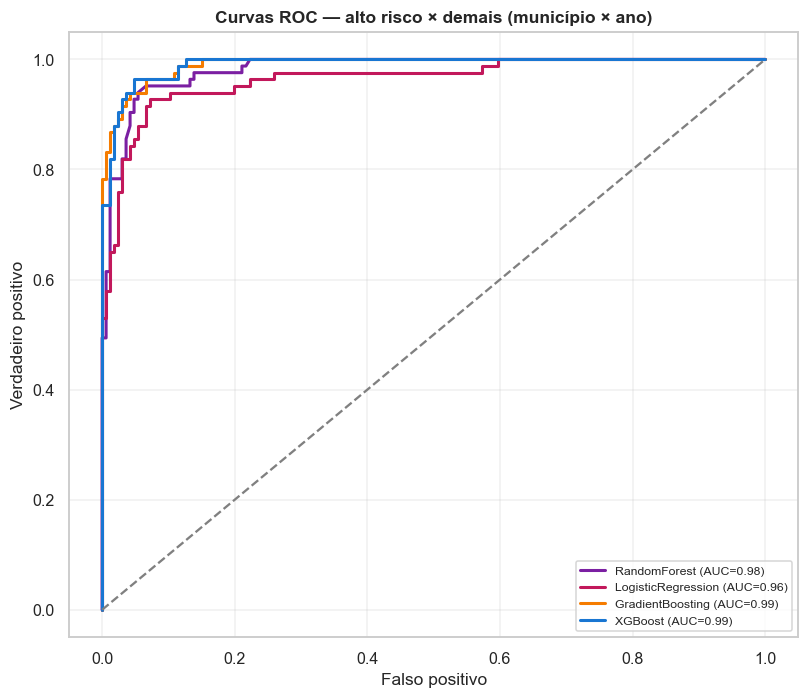

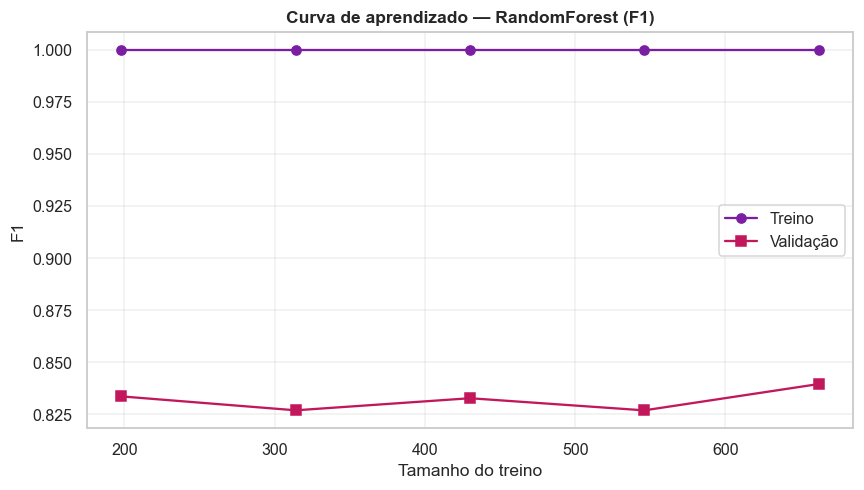

   ✅ Curvas ROC e de aprendizado concluídas.


In [56]:
banner("CURVAS ROC E DE APRENDIZADO")

if modelagem_viavel and clf_resultados:
    try:
        from sklearn.metrics import roc_curve, auc
        from sklearn.model_selection import learning_curve
        y_bin = (PAINEL["classe_risco"].astype(str) == "Alto").astype(int).values
        Xb = StandardScaler().fit_transform(PAINEL[FEATURES_ML].fillna(0).values)
        if len(set(y_bin)) == 2 and y_bin.sum() >= 5:
            Xb_tr, Xb_te, yb_tr, yb_te = train_test_split(
                Xb, y_bin, test_size=CFG.test_size, random_state=SEED, stratify=y_bin)
            modelos_roc = {
                "RandomForest": RandomForestClassifier(n_estimators=200, random_state=SEED),
                "LogisticRegression": LogisticRegression(max_iter=2000),
                "GradientBoosting": GradientBoostingClassifier(random_state=SEED),
            }
            if CAP.get("xgboost"):
                modelos_roc["XGBoost"] = xgb.XGBClassifier(
                    n_estimators=200, eval_metric="logloss", random_state=SEED,
                    verbosity=0)
            if plt is not None:
                fig, ax = plt.subplots(figsize=(7.5, 6.5))
                for i, (nome, mdl) in enumerate(modelos_roc.items()):
                    try:
                        mdl.fit(Xb_tr, yb_tr)
                        proba = mdl.predict_proba(Xb_te)[:, 1]
                        fpr, tpr, _ = roc_curve(yb_te, proba)
                        ax.plot(fpr, tpr, label=f"{nome} (AUC={auc(fpr, tpr):.2f})",
                                color=PALETA_SIPREV[i % len(PALETA_SIPREV)], linewidth=2)
                    except Exception:
                        pass
                ax.plot([0, 1], [0, 1], "--", color="grey")
                ax.set_xlabel("Falso positivo"); ax.set_ylabel("Verdadeiro positivo")
                ax.set_title("Curvas ROC — alto risco × demais (município × ano)")
                ax.legend(loc="lower right", fontsize=8)
                fig.tight_layout()
                salvar_grafico(fig, "38G_roc", "Curvas ROC")
            # curva de aprendizado
            try:
                ts, tr_sc, te_sc = learning_curve(
                    RandomForestClassifier(n_estimators=150, random_state=SEED),
                    Xb, y_bin, cv=3, scoring="f1",
                    train_sizes=np.linspace(0.3, 1.0, 5))
                if plt is not None:
                    fig, ax = plt.subplots(figsize=(8, 4.6))
                    ax.plot(ts, tr_sc.mean(1), "o-", color=COR_PRIMARIA, label="Treino")
                    ax.plot(ts, te_sc.mean(1), "s-", color=COR_SECUNDARIA, label="Validação")
                    ax.set_title("Curva de aprendizado — RandomForest (F1)")
                    ax.set_xlabel("Tamanho do treino"); ax.set_ylabel("F1"); ax.legend()
                    fig.tight_layout()
                    salvar_grafico(fig, "38G_learning_curve", "Curva de aprendizado")
            except Exception as exc:
                aviso("Curva de aprendizado falhou: %s", exc)
        else:
            info("Sem variabilidade binária suficiente para ROC.")
    except Exception as exc:
        aviso("Seção ROC falhou: %s", exc)
sucesso("Curvas ROC e de aprendizado concluídas.")

============================================================
## SEÇÃO 38.H — Demais tipos de violência (motor temático)
============================================================

Aplica o motor de análise temática aos demais tipos previstos no SINAN (tortura,
negligência/abandono, financeira/patrimonial, tráfico de pessoas, trabalho infantil),
garantindo cobertura completa das categorias do plano.


[52] EIXO TEMÁTICO — TORTURA
   Total de notificações (Tortura): 1.712


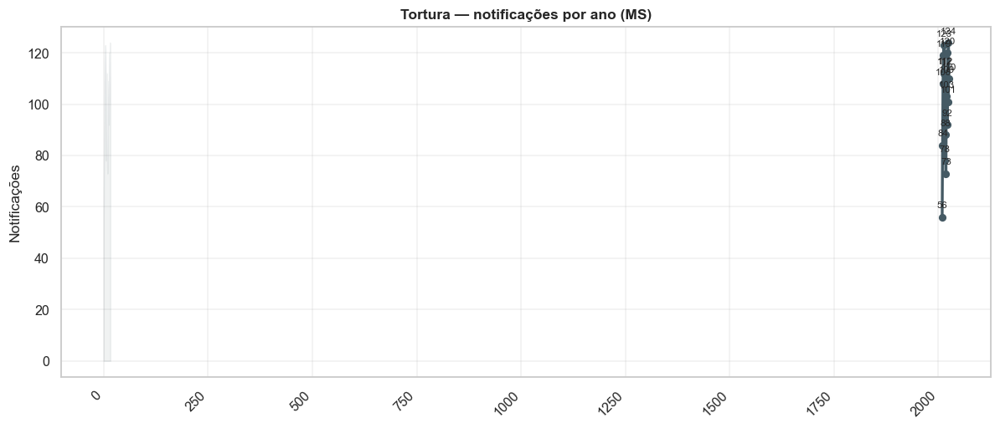


--- Tortura: por ano -------------------------------------------------


,Ano,Notificações
0,2009,56
1,2010,84
2,2011,108
3,2012,119
4,2013,123
5,2014,112
6,2015,78
7,2016,112
8,2017,88
9,2018,73



--- Tortura: ranking municipal (absoluto, top 15) --------------------


,Posicao,Municipio,N
0,1,Campo Grande,467
1,2,Ponta Porã,131
2,3,Nova Andradina,104
3,4,Amambai,87
4,5,Naviraí,81
5,6,Dourados,80
6,7,São Gabriel do Oeste,53
7,8,Cassilândia,49
8,9,Coxim,46
9,10,Jardim,42


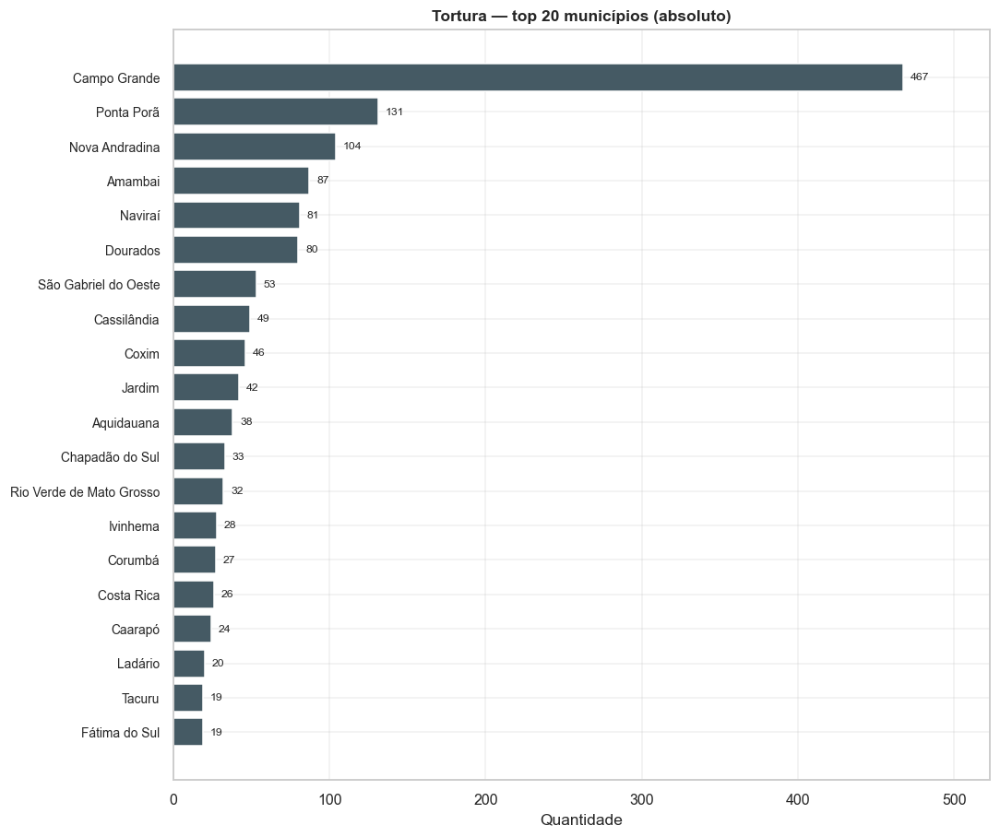


--- Tortura: ranking por taxa/100 mil mulheres (top 15) --------------


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Cassilândia,49,10565,463.80
1,2,Amambai,87,19796,439.48
2,3,Pedro Gomes,15,3494,429.31
3,4,Nova Andradina,104,24447,425.41
4,5,São Gabriel do Oeste,53,14890,355.94
5,6,Laguna Carapã,12,3423,350.57
6,7,Alcinópolis,8,2284,350.26
7,8,Tacuru,19,5441,349.20
8,9,Jardim,42,12072,347.91
9,10,Rochedo,9,2617,343.91


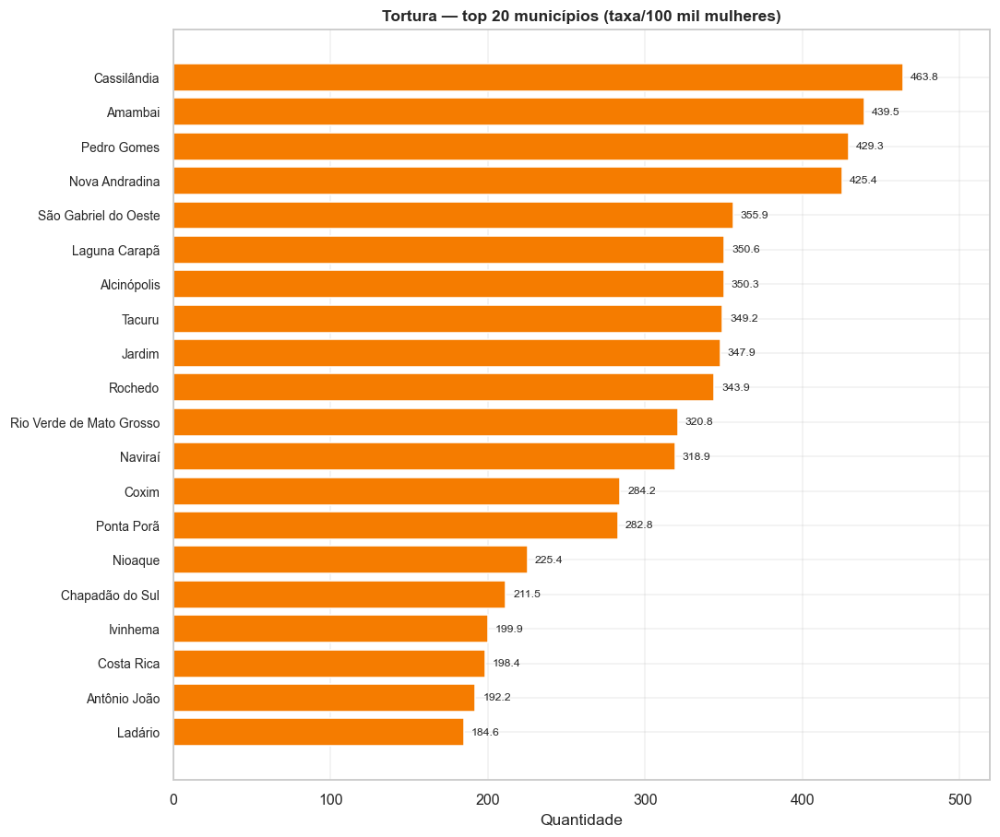

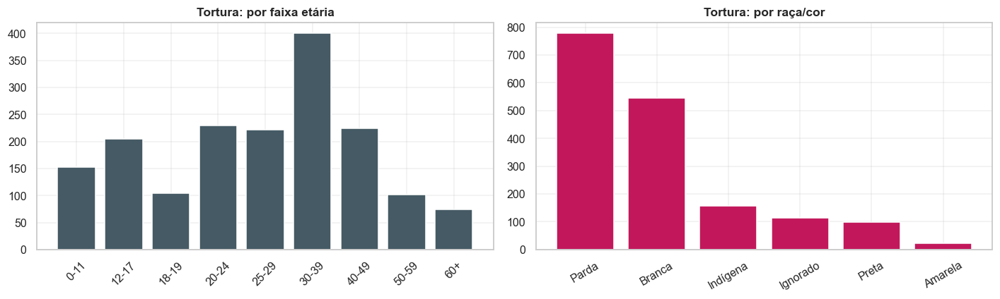

   ✅ Eixo 'Tortura' concluído.

[53] EIXO TEMÁTICO — NEGLIGÊNCIA/ABANDONO
   Total de notificações (Negligência/Abandono): 19.389


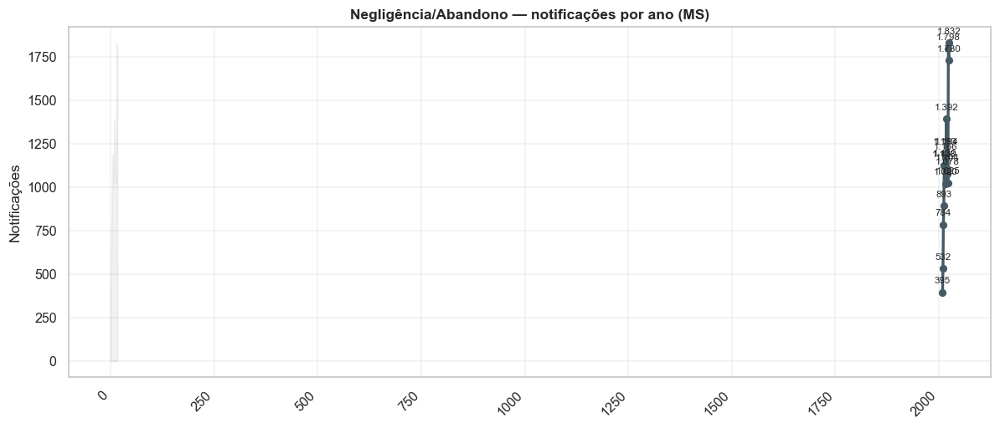


--- Negligência/Abandono: por ano ------------------------------------


,Ano,Notificações
0,2009,395
1,2010,532
2,2011,784
3,2012,893
4,2013,1123
5,2014,1193
6,2015,1130
7,2016,1020
8,2017,1166
9,2018,1392



--- Negligência/Abandono: ranking municipal (absoluto, top 15) -------


,Posicao,Municipio,N
0,1,Campo Grande,15111
1,2,Corumbá,2994
2,3,Ladário,534
3,4,Aquidauana,314
4,5,Dourados,126
5,6,Ponta Porã,54
6,7,Naviraí,25
7,8,Brasilândia,24
8,9,Jardim,22
9,10,Cassilândia,20


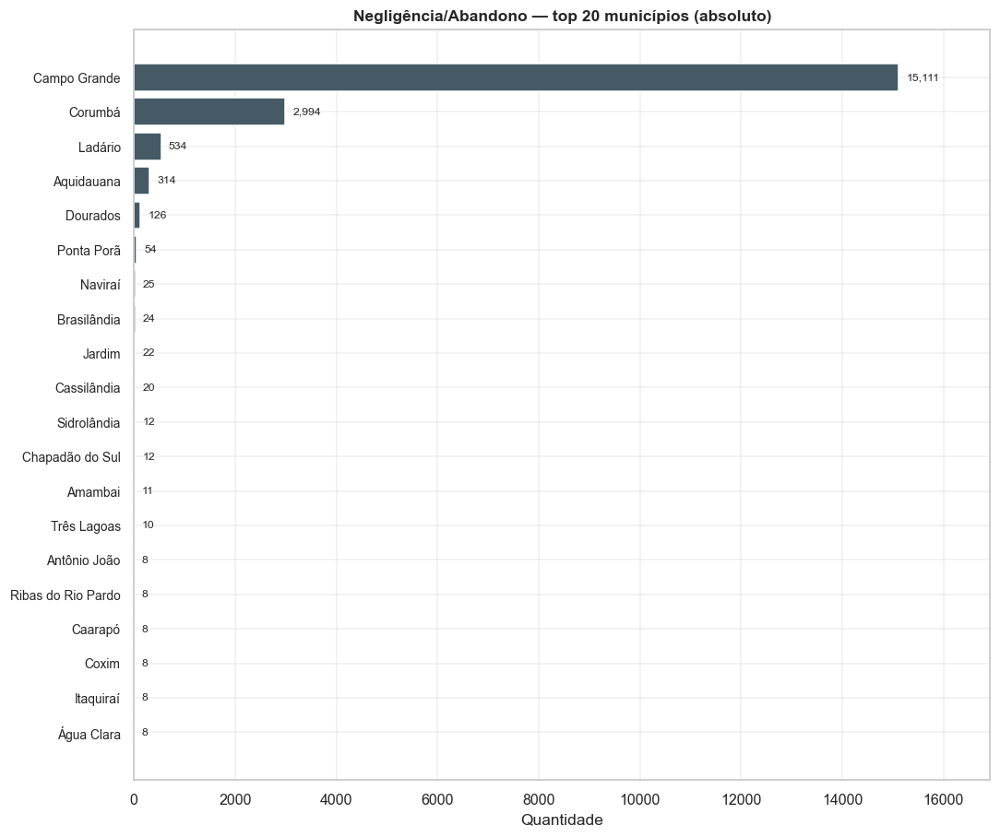


--- Negligência/Abandono: ranking por taxa/100 mil mulheres (top 15) -


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Corumbá,2994,48461,6178.16
1,2,Ladário,534,10834,4928.93
2,3,Campo Grande,15111,452104,3342.37
3,4,Aquidauana,314,23561,1332.71
4,5,Brasilândia,24,5829,411.73
5,6,Cassilândia,20,10565,189.30
6,7,Jardim,22,12072,182.24
7,8,Antônio João,8,4683,170.83
8,9,Ponta Porã,54,46321,116.58
9,10,Dourados,126,122511,102.85


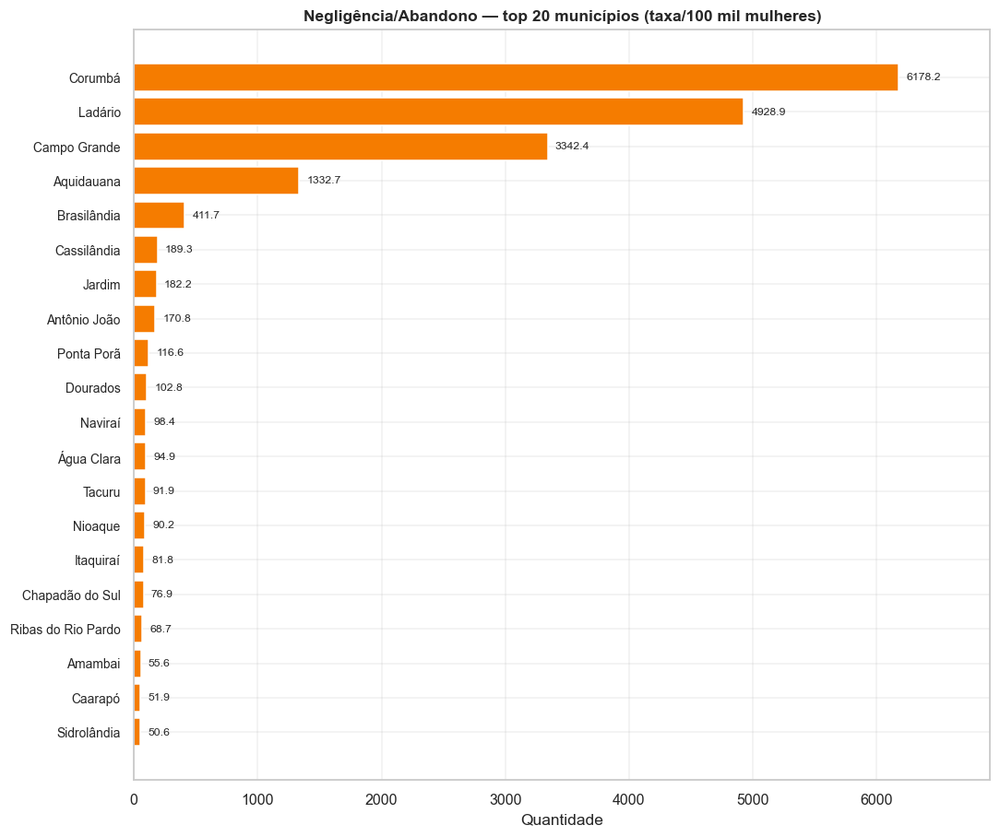

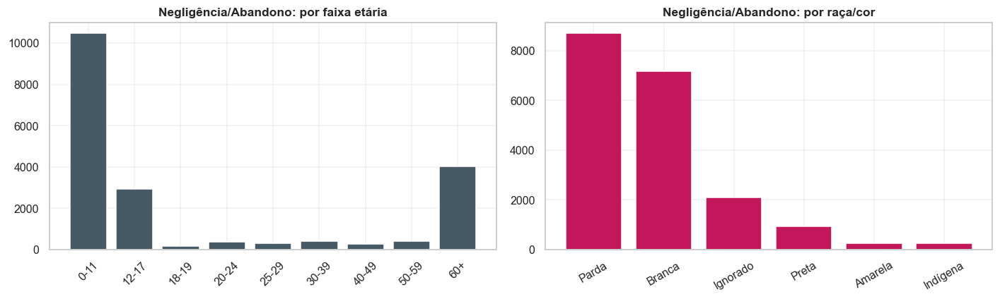

   ✅ Eixo 'Negligência/Abandono' concluído.

[54] EIXO TEMÁTICO — VIOLÊNCIA FINANCEIRA/PATRIMONIAL
   Total de notificações (Violência financeira/patrimonial): 790


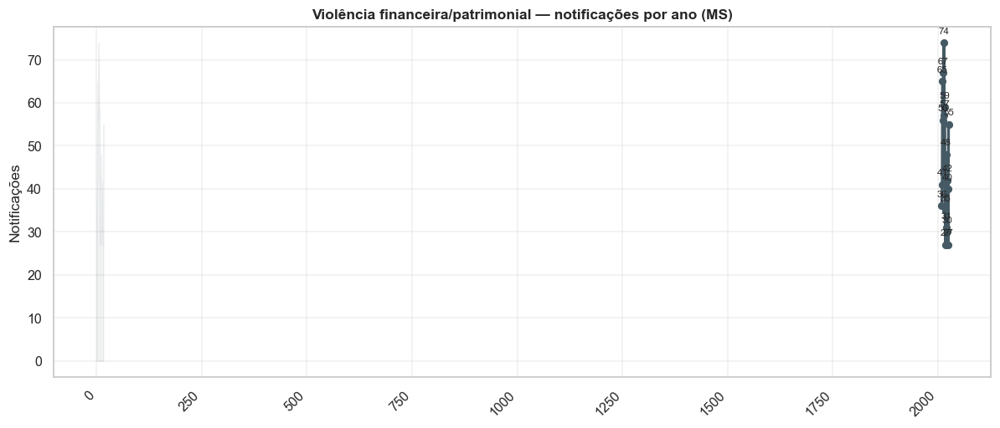


--- Violência financeira/patrimonial: por ano ------------------------


,Ano,Notificações
0,2009,36
1,2010,41
2,2011,65
3,2012,56
4,2013,67
5,2014,74
6,2015,57
7,2016,59
8,2017,35
9,2018,27



--- Violência financeira/patrimonial: ranking municipal (absoluto, top 15) 


,Posicao,Municipio,N
0,1,Campo Grande,415
1,2,Ladário,54
2,3,Ponta Porã,53
3,4,Dourados,45
4,5,Corumbá,44
5,6,Aquidauana,29
6,7,Cassilândia,18
7,8,Nova Andradina,17
8,9,Amambai,13
9,10,Chapadão do Sul,9


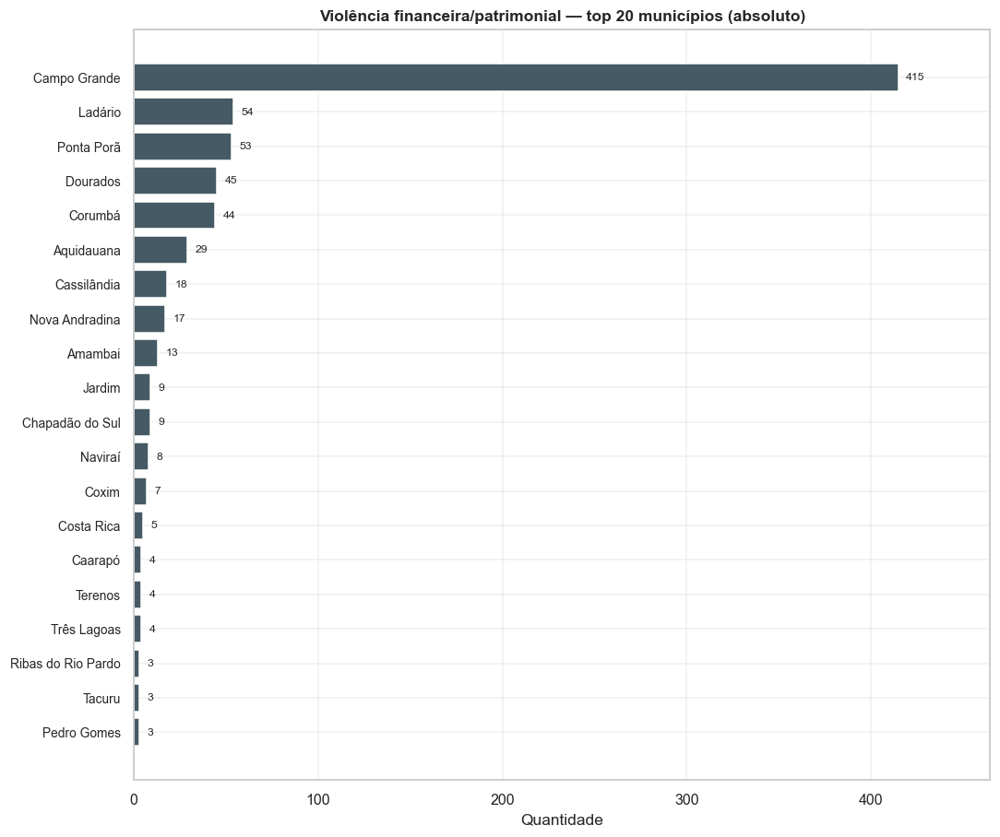


--- Violência financeira/patrimonial: ranking por taxa/100 mil mulheres (top 15) 


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Ladário,54,10834,498.43
1,2,Cassilândia,18,10565,170.37
2,3,Aquidauana,29,23561,123.08
3,4,Ponta Porã,53,46321,114.42
4,5,Campo Grande,415,452104,91.79
5,6,Corumbá,44,48461,90.79
6,7,Jardim,9,12072,74.55
7,8,Nova Andradina,17,24447,69.54
8,9,Amambai,13,19796,65.67
9,10,Chapadão do Sul,9,15602,57.68


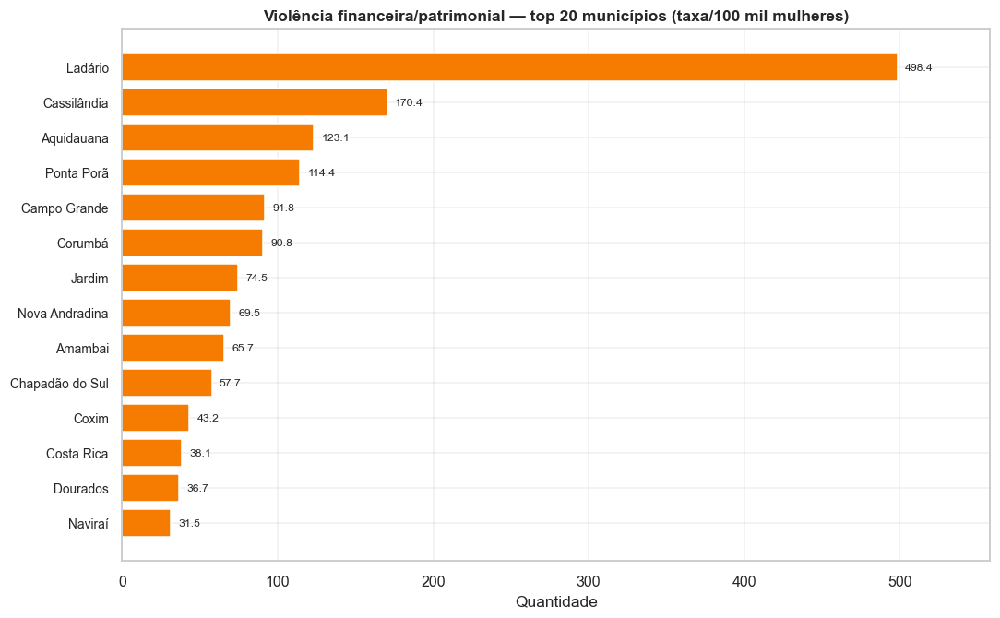

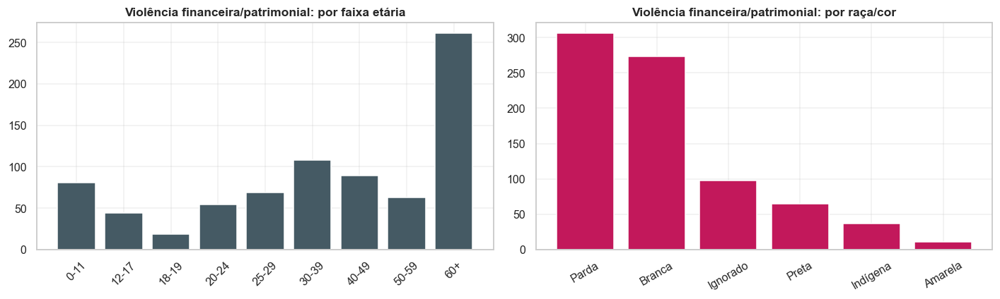

   ✅ Eixo 'Violência financeira/patrimonial' concluído.

[55] EIXO TEMÁTICO — TRÁFICO DE SERES HUMANOS
   Total de notificações (Tráfico de seres humanos): 45


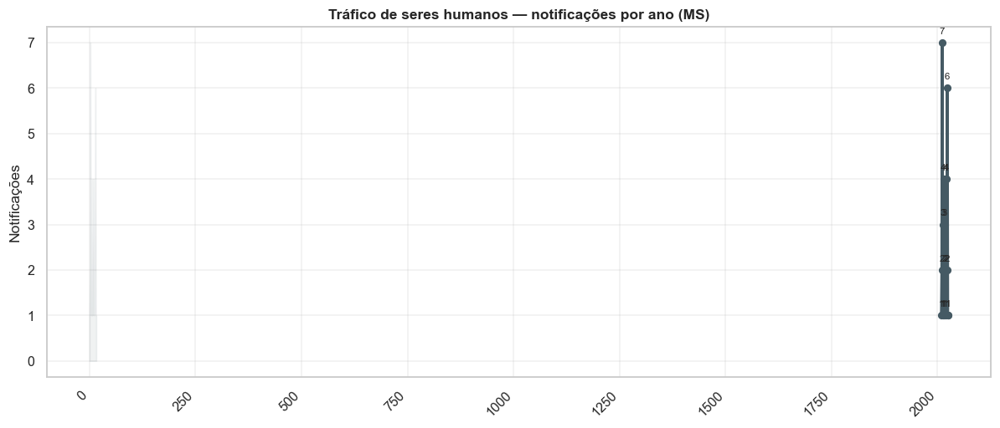


--- Tráfico de seres humanos: por ano --------------------------------


,Ano,Notificações
0,2009,1
1,2010,2
2,2011,7
3,2012,3
4,2013,1
5,2014,4
6,2015,1
7,2016,3
8,2017,2
9,2018,4



--- Tráfico de seres humanos: ranking municipal (absoluto, top 15) ---


,Posicao,Municipio,N
0,1,Campo Grande,13
1,2,Ponta Porã,6
2,3,Nova Andradina,4
3,4,Dourados,4
4,5,Corumbá,3
5,6,Sonora,2
6,7,Aquidauana,2
7,8,Água Clara,1
8,9,Antônio João,1
9,10,Coronel Sapucaia,1


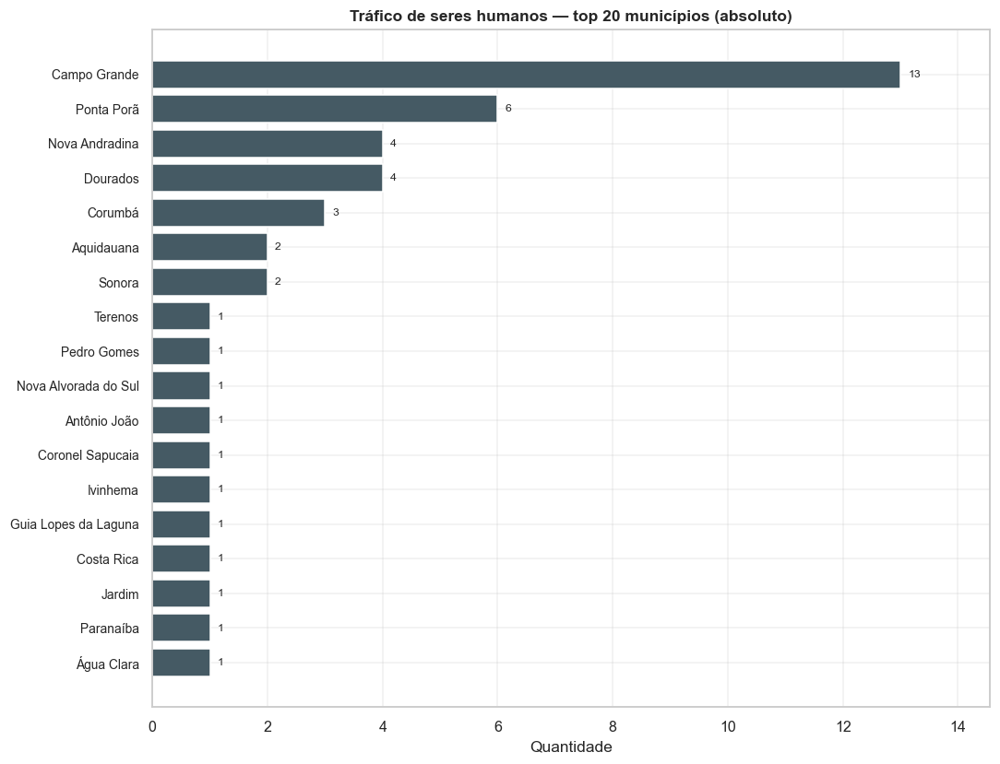


--- Tráfico de seres humanos: ranking por taxa/100 mil mulheres (top 15) 


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Ponta Porã,6,46321,12.95
1,2,Campo Grande,13,452104,2.88


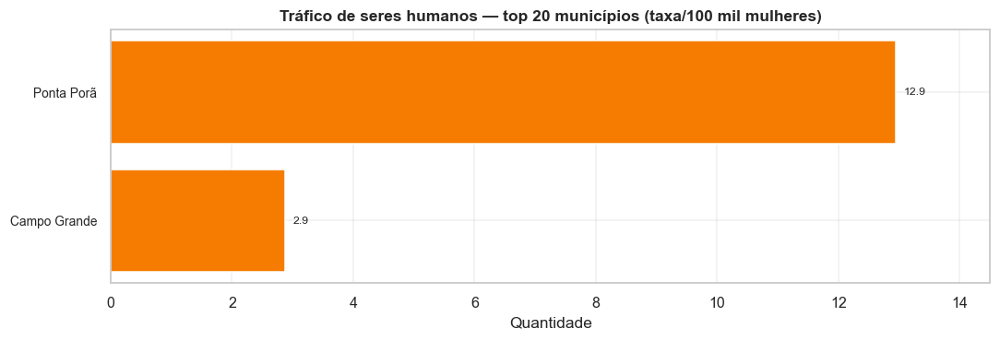

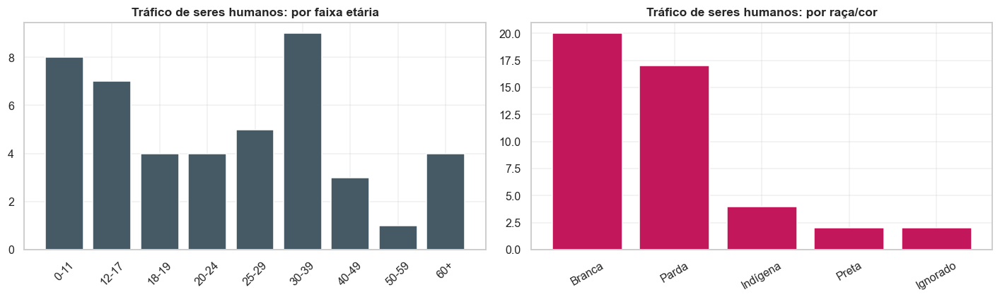

   ✅ Eixo 'Tráfico de seres humanos' concluído.

[56] EIXO TEMÁTICO — TRABALHO INFANTIL
   Total de notificações (Trabalho infantil): 92


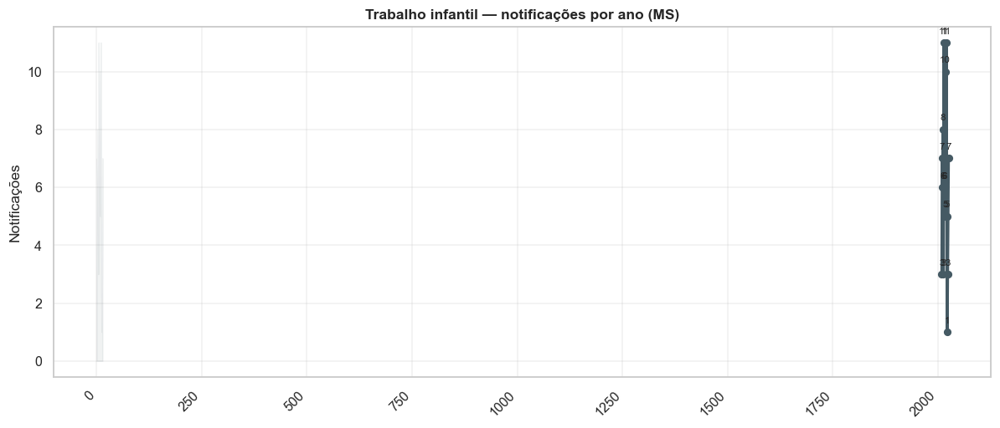


--- Trabalho infantil: por ano ---------------------------------------


,Ano,Notificações
0,2009,3
1,2010,7
2,2011,6
3,2012,8
4,2013,3
5,2014,11
6,2015,6
7,2016,6
8,2017,10
9,2018,5



--- Trabalho infantil: ranking municipal (absoluto, top 15) ----------


,Posicao,Municipio,N
0,1,Campo Grande,50
1,2,Ponta Porã,6
2,3,Aquidauana,5
3,4,Nova Andradina,4
4,5,Corumbá,4
5,6,Três Lagoas,4
6,7,Amambai,3
7,8,Sidrolândia,2
8,9,Bodoquena,1
9,10,Anastácio,1


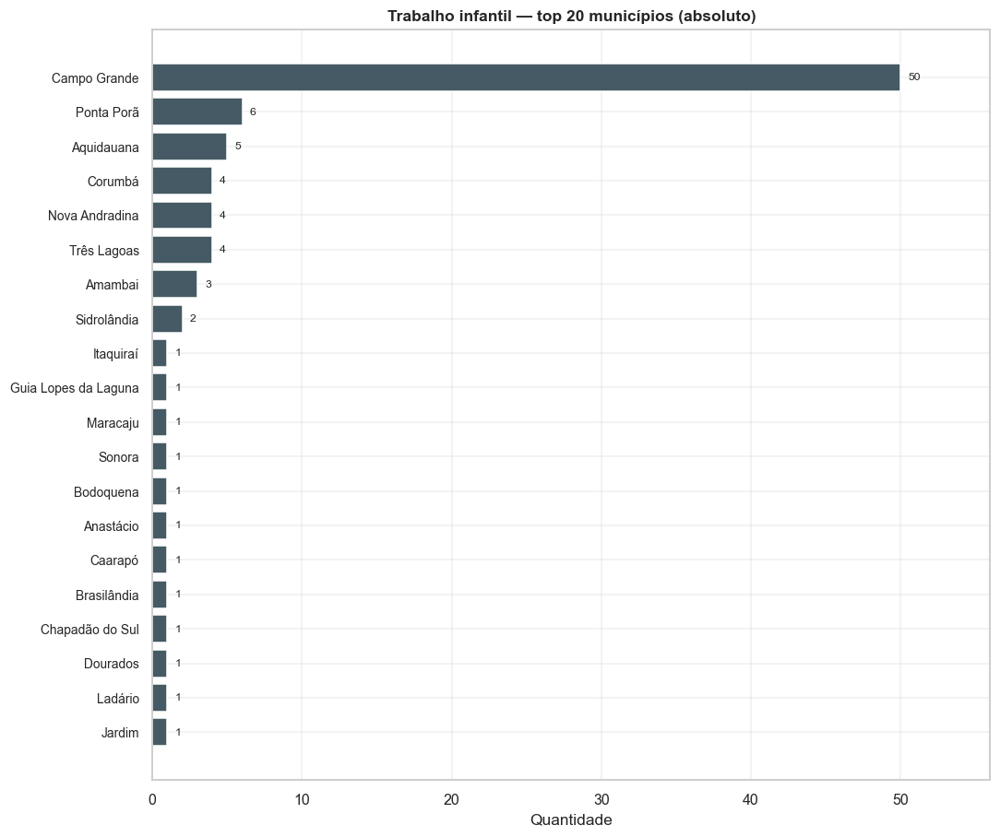


--- Trabalho infantil: ranking por taxa/100 mil mulheres (top 15) ----


,Pos,Municipio,N,Populacao,Taxa_100k
0,1,Aquidauana,5,23561,21.22
1,2,Ponta Porã,6,46321,12.95
2,3,Campo Grande,50,452104,11.06


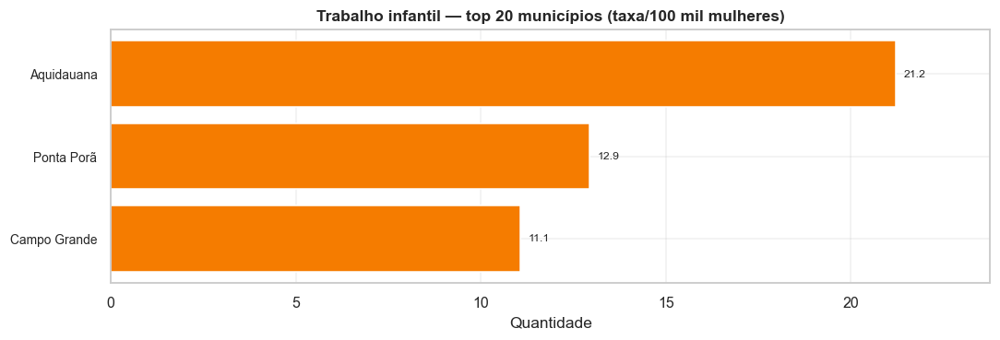

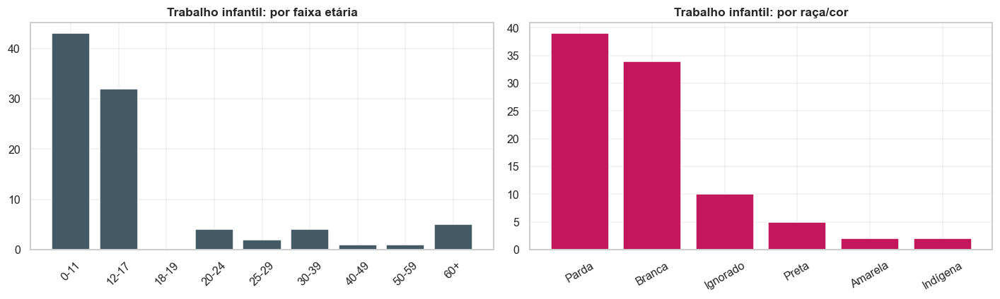

   ✅ Eixo 'Trabalho infantil' concluído.


In [57]:
for _flag, _tema, _pref in [
    ("FL_VIOL_TORT", "Tortura", "38H_tortura"),
    ("FL_VIOL_NEGLI", "Negligência/Abandono", "38H_negligencia"),
    ("FL_VIOL_FINAN", "Violência financeira/patrimonial", "38H_financeira"),
    ("FL_VIOL_TRAF", "Tráfico de seres humanos", "38H_trafico"),
    ("FL_VIOL_INFAN", "Trabalho infantil", "38H_infantil"),
]:
    if _flag in DF_MULHERES.columns:
        analise_tematica(_flag, _tema, _pref, cor=COR_NEUTRA, gerar_relatorio=False)

============================================================
## SEÇÃO 38.I — Ranking de crescimento (tendência municipal)
============================================================

Identifica municípios com maior **crescimento** das notificações entre o primeiro e o
último triênio do período, sinalizando tendências de alta que demandam atenção.


[57] RANKING DE CRESCIMENTO MUNICIPAL

--- Municípios com maior crescimento (%) -----------------------------


,Municipio,Triênio_inicial,Triênio_final,Crescimento_%
2,Amambai,0,661,66100.0
23,Coxim,0,236,23600.0
11,Batayporã,0,118,11800.0
12,Bonito,0,117,11700.0
3,Anastácio,1,111,11000.0
20,Coronel Sapucaia,0,84,8400.0
50,Paranhos,0,78,7800.0
35,Japorã,0,72,7200.0
22,Costa Rica,3,204,6700.0
31,Inocência,0,65,6500.0



--- Municípios com maior queda (%) -----------------------------------


,Municipio,Triênio_inicial,Triênio_final,Crescimento_%
44,Nioaque,77,148,92.2
65,Terenos,27,43,59.3
61,Sidrolândia,150,207,38.0
24,Deodápolis,24,32,33.3
59,Sete Quedas,5,6,20.0
36,Jardim,228,236,3.5
17,Cassilândia,162,164,1.2
37,Juti,26,21,-19.2
9,Aral Moreira,15,11,-26.7
0,Água Clara,68,23,-66.2


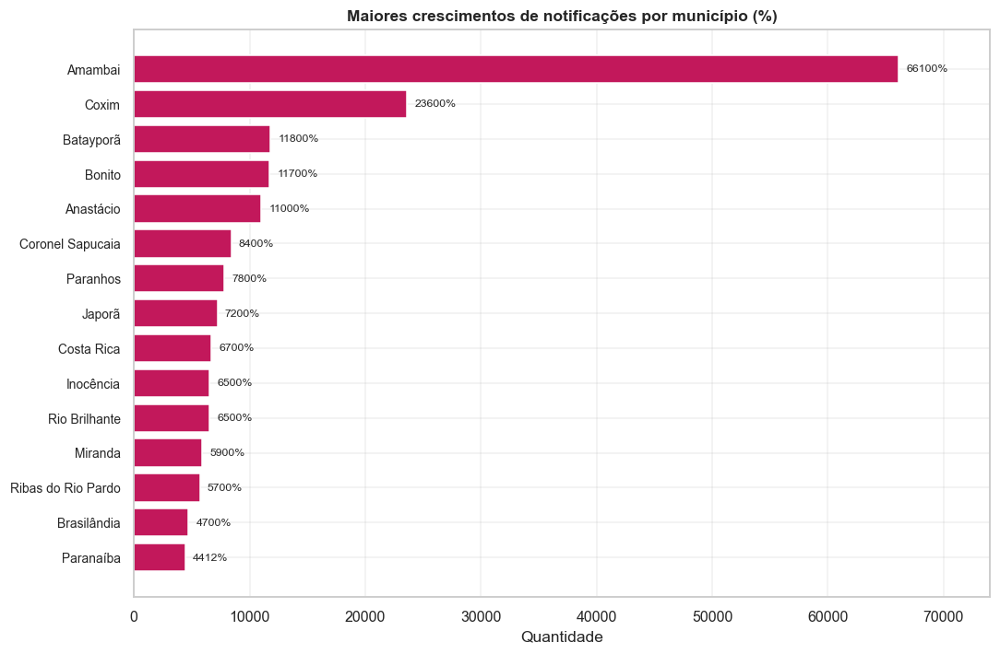

   📝 Relatório salvo: 38I_ranking_crescimento.txt
   ✅ Ranking de crescimento concluído.


In [58]:
banner("RANKING DE CRESCIMENTO MUNICIPAL")

anos_disp = sorted(DF_MULHERES["ANO"].dropna().unique())
if len(anos_disp) >= 4:
    n_ini = anos_disp[:3]
    n_fim = anos_disp[-3:]
    cresc = []
    for cod, nome in MUNICIPIOS_MS.items():
        sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
        ini = len(sub[sub["ANO"].isin(n_ini)])
        fim = len(sub[sub["ANO"].isin(n_fim)])
        if ini + fim >= 10:
            var = (fim - ini) / max(1, ini) * 100
            cresc.append({"Municipio": nome, "Triênio_inicial": ini,
                          "Triênio_final": fim, "Crescimento_%": round(var, 1)})
    df_cresc = pd.DataFrame(cresc).sort_values("Crescimento_%", ascending=False)
    if len(df_cresc):
        show_df(df_cresc.head(15), "Municípios com maior crescimento (%)", max_linhas=15)
        show_df(df_cresc.tail(10), "Municípios com maior queda (%)", max_linhas=10)
        salvar_csv(df_cresc, "38I_ranking_crescimento", "Ranking de crescimento municipal")
        registrar_planilha("Ranking_Crescimento", df_cresc)
        barras_horizontais(df_cresc.set_index("Municipio")["Crescimento_%"].head(15),
                           "Maiores crescimentos de notificações por município (%)",
                           "38I_crescimento", cor=COR_SECUNDARIA, fmt="{:.0f}%",
                           descricao="Ranking de crescimento")
        rel_cr = RelatorioTexto("Ranking de Crescimento Municipal")
        rel_cr.texto(f"Comparação triênio inicial ({n_ini}) × final ({n_fim}).")
        rel_cr.tabela_df(df_cresc.head(20))
        rel_cr.salvar(DIRS["relatorios"] / "38I_ranking_crescimento.txt")
else:
    aviso("Período insuficiente para ranking de crescimento.")
sucesso("Ranking de crescimento concluído.")

============================================================
## SEÇÃO 38.J — Cruzamentos bidimensionais (mapas de calor)
============================================================

Conjunto de **tabelas cruzadas** (com mapas de calor) que revelam padrões combinados:
município × ano (top municípios), dia da semana × período do dia, e escolaridade ×
faixa etária. Cada cruzamento é exibido, plotado e exportado.


[58] CRUZAMENTOS BIDIMENSIONAIS (MAPAS DE CALOR)


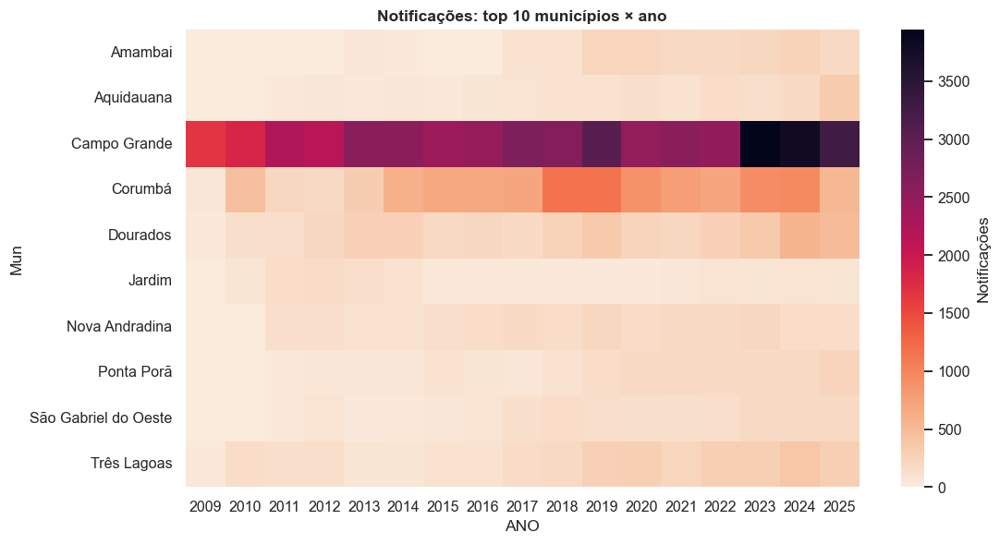

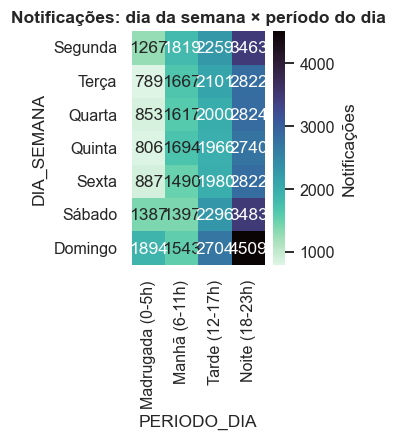

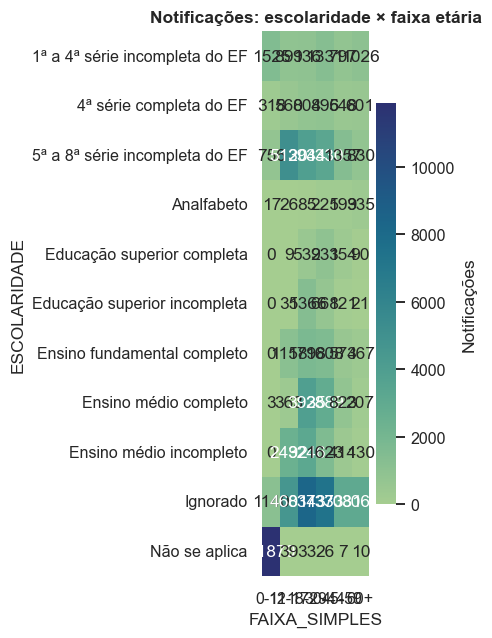

   ✅ Cruzamentos bidimensionais concluídos.


In [59]:
banner("CRUZAMENTOS BIDIMENSIONAIS (MAPAS DE CALOR)")


def heatmap_cruzado(df_pivot, titulo, nome, cmap="rocket_r", fmt=".0f",
                    anotar=True):
    """Plota e exporta um heatmap a partir de uma tabela pivô."""
    if df_pivot.empty:
        return
    salvar_csv(df_pivot.reset_index(), nome, titulo)
    registrar_planilha(nome[:31], df_pivot.reset_index())
    if plt is None:
        return
    fig, ax = plt.subplots(figsize=(min(14, 1.0 + 0.55 * df_pivot.shape[1]),
                                    max(3.5, 0.45 * df_pivot.shape[0] + 1)))
    if sns is not None:
        sns.heatmap(df_pivot, cmap=cmap, annot=anotar and df_pivot.size <= 120,
                    fmt=fmt, ax=ax, cbar_kws={"label": "Notificações"})
    else:
        im = ax.imshow(df_pivot.values, cmap=cmap, aspect="auto")
        plt.colorbar(im, ax=ax)
    ax.set_title(titulo)
    fig.tight_layout()
    salvar_grafico(fig, nome, titulo)


# 38.J.1  Top municípios × ano
top10_cods = rank_abs.head(10)["COD_MUN"].tolist()
sub_top = DF_MULHERES[DF_MULHERES["COD_MUN"].isin(top10_cods)].copy()
sub_top["Mun"] = sub_top["COD_MUN"].map(MUNICIPIOS_MS)
piv_mun_ano = sub_top.pivot_table(index="Mun", columns="ANO",
                                  values="FL_FEMININO", aggfunc="sum", fill_value=0)
heatmap_cruzado(piv_mun_ano, "Notificações: top 10 municípios × ano",
                "38J_municipio_ano", cmap="rocket_r")

# 38.J.2  Dia da semana × período do dia
ordem_dias2 = ["Segunda", "Terça", "Quarta", "Quinta", "Sexta", "Sábado", "Domingo"]
ordem_per = ["Madrugada (0-5h)", "Manhã (6-11h)", "Tarde (12-17h)", "Noite (18-23h)"]
piv_dia_per = (DF_MULHERES.pivot_table(index="DIA_SEMANA", columns="PERIODO_DIA",
                                       values="FL_FEMININO", aggfunc="sum",
                                       fill_value=0)
               .reindex(index=ordem_dias2)
               .reindex(columns=ordem_per, fill_value=0).dropna(how="all"))
heatmap_cruzado(piv_dia_per, "Notificações: dia da semana × período do dia",
                "38J_dia_periodo", cmap="mako_r")

# 38.J.3  Escolaridade × faixa etária
piv_esc_faixa = DF_MULHERES.pivot_table(index="ESCOLARIDADE", columns="FAIXA_SIMPLES",
                                        values="FL_FEMININO", aggfunc="sum",
                                        fill_value=0)
heatmap_cruzado(piv_esc_faixa, "Notificações: escolaridade × faixa etária",
                "38J_escolaridade_faixa", cmap="crest")
sucesso("Cruzamentos bidimensionais concluídos.")

============================================================
## SEÇÃO 38.K — Relação violência × resposta institucional
============================================================

Investiga a associação entre o volume de violência (taxa/100k) e a resposta institucional
(IRI) por município, com reta de tendência — subsídio para identificar onde a proteção
acompanha (ou não) a demanda.


[59] VIOLÊNCIA × RESPOSTA INSTITUCIONAL
   Correlação taxa × resposta institucional: -0.02


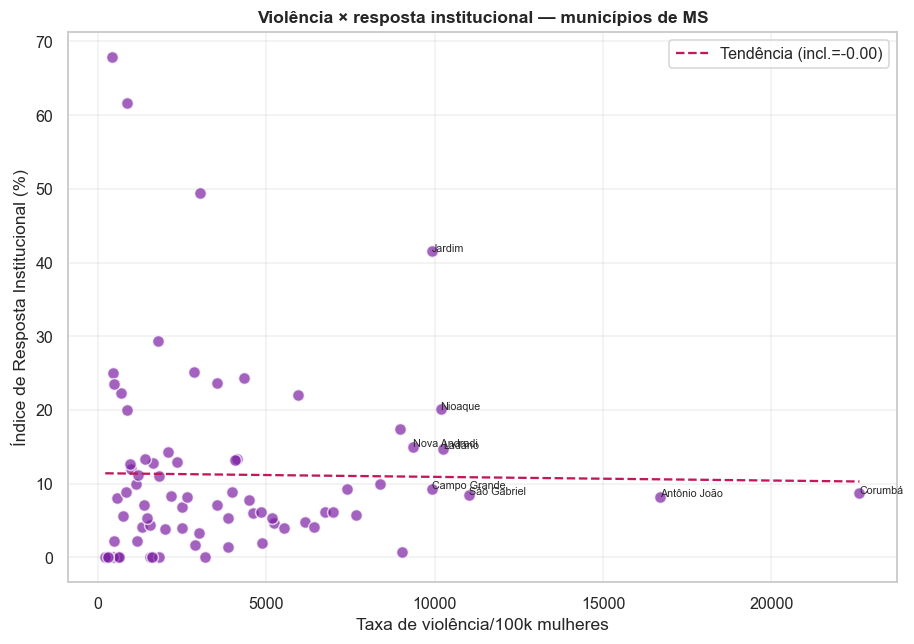

   ✅ Análise violência × resposta concluída.


In [60]:
banner("VIOLÊNCIA × RESPOSTA INSTITUCIONAL")

assoc = df_painel.merge(iri[["COD_MUN", "IRI_%"]], on="COD_MUN", how="inner")
assoc = assoc[(assoc["N_Total"] >= 5)].dropna(subset=["Taxa_Total", "IRI_%"])
if len(assoc) >= 5 and plt is not None:
    fig, ax = plt.subplots(figsize=(8.5, 6))
    ax.scatter(assoc["Taxa_Total"], assoc["IRI_%"], alpha=0.7,
               color=COR_PRIMARIA, edgecolors="white", s=60)
    # reta de tendência
    try:
        z = np.polyfit(assoc["Taxa_Total"], assoc["IRI_%"], 1)
        xs = np.linspace(assoc["Taxa_Total"].min(), assoc["Taxa_Total"].max(), 50)
        ax.plot(xs, np.poly1d(z)(xs), "--", color=COR_SECUNDARIA,
                label=f"Tendência (incl.={z[0]:.2f})")
        corr_pearson = assoc["Taxa_Total"].corr(assoc["IRI_%"])
        ax.legend()
        info("Correlação taxa × resposta institucional: %.2f", corr_pearson)
    except Exception:
        pass
    for _, r in assoc.nlargest(8, "Taxa_Total").iterrows():
        ax.annotate(str(r["Municipio"])[:12], (r["Taxa_Total"], r["IRI_%"]),
                    fontsize=7)
    ax.set_xlabel("Taxa de violência/100k mulheres")
    ax.set_ylabel("Índice de Resposta Institucional (%)")
    ax.set_title("Violência × resposta institucional — municípios de MS")
    fig.tight_layout()
    salvar_grafico(fig, "38K_violencia_resposta", "Violência × resposta institucional")
    salvar_csv(assoc[["Municipio", "Taxa_Total", "IRI_%"]],
               "38K_violencia_resposta", "Violência × resposta institucional")
sucesso("Análise violência × resposta concluída.")

============================================================
## SEÇÃO 38.L — Dashboards temáticos adicionais (Plotly)
============================================================

In [61]:
banner("DASHBOARDS TEMÁTICOS ADICIONAIS")

if CAP.get("plotly") and px is not None:
    try:
        # Dashboard de violência sexual
        if "ranking_abs" in res_sexual and len(res_sexual["ranking_abs"]):
            figs = px.bar(res_sexual["ranking_abs"].head(15), x="N", y="Municipio",
                          orientation="h", color="N", color_continuous_scale="Purples",
                          title="Violência sexual — top 15 municípios (MS)")
            figs.update_layout(height=600, yaxis={"categoryorder": "total ascending"})
            salvar_html(figs, "38L_dashboard_sexual", "Dashboard de violência sexual")
        # Dashboard de violência doméstica (série anual)
        if "serie_ano" in res_domestica and len(res_domestica["serie_ano"]):
            figd = px.area(x=list(res_domestica["serie_ano"].index),
                           y=list(res_domestica["serie_ano"].values),
                           title="Violência doméstica — série anual (MS)",
                           labels={"x": "Ano", "y": "Notificações"})
            figd.update_traces(line_color=COR_PRIMARIA)
            salvar_html(figd, "38L_dashboard_domestica", "Dashboard de violência doméstica")
        # Dashboard de índices avançados
        figi = px.bar(idx_rank.head(20), x="Idx_alerta", y="Municipio",
                      orientation="h", color="Prioridade",
                      color_discrete_map={"Prioritário": COR_SECUNDARIA,
                                          "Atenção": COR_DESTAQUE,
                                          "Monitorar": COR_NEUTRA},
                      title="Índice de Alerta para políticas públicas — top 20")
        figi.update_layout(height=650, yaxis={"categoryorder": "total ascending"})
        salvar_html(figi, "38L_dashboard_indices", "Dashboard de índices avançados")
        sucesso("Dashboards temáticos adicionais gerados.")
    except Exception as exc:
        aviso("Dashboards adicionais falharam: %s", exc)


[60] DASHBOARDS TEMÁTICOS ADICIONAIS
   ✅ Dashboards temáticos adicionais gerados.


============================================================
## SEÇÃO 38.M — Séries mensais por eixo (small multiples)
============================================================

Painel de pequenas séries mensais (médias por mês ao longo dos anos) para cada eixo
temático, evidenciando padrões sazonais específicos de cada tipo de violência.


[61] SÉRIES MENSAIS POR EIXO (SMALL MULTIPLES)


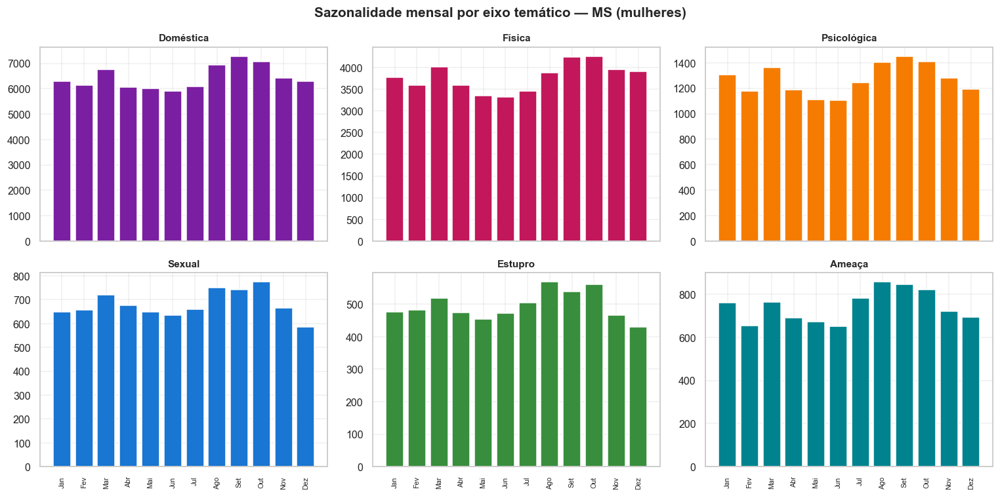

   ✅ Séries mensais por eixo concluídas.


In [62]:
banner("SÉRIES MENSAIS POR EIXO (SMALL MULTIPLES)")

eixos_sm = [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
            ("FL_VIOL_PSICOLOGICA", "Psicológica"), ("FL_VIOL_SEXUAL", "Sexual"),
            ("FL_ESTUPRO", "Estupro"), ("FL_AMEACA", "Ameaça")]
if plt is not None:
    fig, axes = plt.subplots(2, 3, figsize=(14, 7), sharex=True)
    axes = axes.flatten()
    for i, (flag, rot) in enumerate(eixos_sm):
        sub = DF_MULHERES[DF_MULHERES[flag] == 1]
        s = (sub.groupby("MES").size().reindex(range(1, 13)).fillna(0))
        axes[i].bar([MESES_NOME[m] for m in range(1, 13)], s.values,
                    color=PALETA_SIPREV[i % len(PALETA_SIPREV)])
        axes[i].set_title(rot, fontsize=10)
        axes[i].tick_params(axis="x", rotation=90, labelsize=7)
    fig.suptitle("Sazonalidade mensal por eixo temático — MS (mulheres)",
                 fontweight="bold")
    fig.tight_layout()
    salvar_grafico(fig, "38M_sazonalidade_eixos", "Sazonalidade mensal por eixo")
sucesso("Séries mensais por eixo concluídas.")

============================================================
## SEÇÃO 38.N — Exportação mestre em formato longo (tidy)
============================================================

Gera uma tabela **longa** (tidy) com eixo × município × ano × (n, taxa), formato ideal
para BI/dashboards externos e reanálises, exportada em CSV e Parquet.

In [63]:
banner("EXPORTAÇÃO MESTRE EM FORMATO LONGO (TIDY)")

registros_long = []
EIXOS_LONG = {"Total": "FL_FEMININO", "Doméstica": "FL_VIOL_DOMESTICA",
              "Física": "FL_VIOL_FISIC", "Psicológica": "FL_VIOL_PSICOLOGICA",
              "Sexual": "FL_VIOL_SEXUAL", "Estupro": "FL_ESTUPRO",
              "Ameaça": "FL_AMEACA", "Feminicídio": "FL_FEMINICIDIO"}
base_long = DF_MULHERES.dropna(subset=["ANO"]).copy()
base_long["ANO"] = base_long["ANO"].astype(int)
for (cod, ano), sub in base_long.groupby(["COD_MUN", "ANO"]):
    nome_mun = MUNICIPIOS_MS.get(cod)
    if not nome_mun:
        continue
    pop_f = POP_FEM_MUN_MS.get(cod, np.nan)
    for eixo, flag in EIXOS_LONG.items():
        n = int(sub[flag].sum()) if flag in sub.columns else 0
        registros_long.append({
            "COD_MUN": cod, "Municipio": nome_mun, "Ano": ano, "Eixo": eixo,
            "N": n,
            "Taxa_100k": round(n / pop_f * 100_000, 2) if pop_f else np.nan,
        })
df_long = pd.DataFrame(registros_long)
info("Tabela longa: %s linhas", formato_numero(len(df_long)))
show_df(df_long.head(12), "Amostra da tabela longa (tidy)", max_linhas=12)
salvar_csv(df_long, "38N_tabela_longa", "Tabela longa (eixo × município × ano)")
salvar_parquet(df_long, "38N_tabela_longa", "Tabela longa (eixo × município × ano)")
sucesso("Exportação em formato longo concluída.")


[62] EXPORTAÇÃO MESTRE EM FORMATO LONGO (TIDY)
   Tabela longa: 7.952 linhas

--- Amostra da tabela longa (tidy) -----------------------------------


,COD_MUN,Municipio,Ano,Eixo,N,Taxa_100k
0,500020,Água Clara,2010,Total,1,11.87
1,500020,Água Clara,2010,Doméstica,0,0.00
2,500020,Água Clara,2010,Física,0,0.00
3,500020,Água Clara,2010,Psicológica,0,0.00
4,500020,Água Clara,2010,Sexual,0,0.00
5,500020,Água Clara,2010,Estupro,0,0.00
6,500020,Água Clara,2010,Ameaça,0,0.00
7,500020,Água Clara,2010,Feminicídio,0,0.00
8,500020,Água Clara,2011,Total,67,795.06
9,500020,Água Clara,2011,Doméstica,48,569.60


   ✅ Exportação em formato longo concluída.


============================================================
## SEÇÃO 38.O — Modelos de regressão por eixo
============================================================

Para cada eixo, treina um Random Forest de regressão que estima o número de notificações
municipais a partir dos atributos do painel, registrando o R² de cada eixo — visão
comparativa da previsibilidade de cada tipo de violência.


[63] MODELOS DE REGRESSÃO POR EIXO
   🧠 RandomForestReg [Doméstica] [Regressão por eixo] MAE=6.174 | RMSE=21.834 | R2=0.995
   🧠 RandomForestReg [Sexual]   [Regressão por eixo] MAE=1.696 | RMSE=5.130 | R2=0.971
   🧠 RandomForestReg [Estupro]  [Regressão por eixo] MAE=1.636 | RMSE=5.636 | R2=0.942
   🧠 RandomForestReg [Ameaça]   [Regressão por eixo] MAE=3.227 | RMSE=9.095 | R2=0.914
   🧠 RandomForestReg [Física]   [Regressão por eixo] MAE=7.697 | RMSE=24.415 | R2=0.968

--- Regressão por eixo (R² = previsibilidade) ------------------------


,Eixo,MAE,RMSE,R2
0,Doméstica,6.174,21.834,0.995
1,Sexual,1.696,5.130,0.971
4,Física,7.697,24.415,0.968
2,Estupro,1.636,5.636,0.942
3,Ameaça,3.227,9.095,0.914


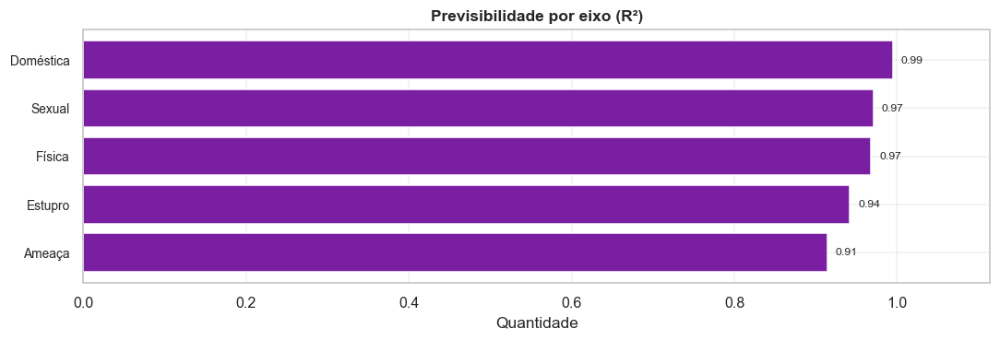

   ✅ Modelos de regressão por eixo concluídos.


In [64]:
banner("MODELOS DE REGRESSÃO POR EIXO")

if modelagem_viavel:
    alvos_eixo = {"n_domestica": "Doméstica", "n_sexual": "Sexual",
                  "n_estupro": "Estupro", "n_ameaca": "Ameaça",
                  "n_fisica": "Física"}
    resultados_eixo = []
    feats_base = [c for c in FEATURES_ML if c not in alvos_eixo and c != "n_total"]
    for alvo, rot in alvos_eixo.items():
        if alvo not in PAINEL.columns:
            continue
        try:
            Xe = PAINEL[feats_base].fillna(0).values
            ye = PAINEL[alvo].values
            Xe_tr, Xe_te, ye_tr, ye_te = train_test_split(
                Xe, ye, test_size=CFG.test_size, random_state=SEED)
            t0 = time.time()
            me = RandomForestRegressor(n_estimators=200, random_state=SEED, n_jobs=-1)
            me.fit(Xe_tr, ye_tr)
            pe = np.clip(me.predict(Xe_te), 0, None)
            met = {"MAE": mean_absolute_error(ye_te, pe),
                   "RMSE": math.sqrt(mean_squared_error(ye_te, pe)),
                   "R2": r2_score(ye_te, pe)}
            registrar_modelo(f"RandomForestReg [{rot}]", "ML", "Regressão por eixo",
                             met, time.time() - t0)
            resultados_eixo.append({"Eixo": rot, **{k: round(v, 3)
                                                    for k, v in met.items()}})
        except Exception as exc:
            aviso("Regressão do eixo %s falhou: %s", rot, exc)
    if resultados_eixo:
        df_re = pd.DataFrame(resultados_eixo).sort_values("R2", ascending=False)
        show_df(df_re, "Regressão por eixo (R² = previsibilidade)", max_linhas=10)
        salvar_csv(df_re, "38O_regressao_por_eixo", "Regressão por eixo")
        registrar_planilha("Regressao_Por_Eixo", df_re)
        barras_horizontais(df_re.set_index("Eixo")["R2"],
                           "Previsibilidade por eixo (R²)", "38O_r2_eixos",
                           cor=COR_PRIMARIA, fmt="{:.2f}",
                           descricao="R² por eixo")
sucesso("Modelos de regressão por eixo concluídos.")

============================================================
## SEÇÃO 38.P — Painel-resumo das vítimas (figura combinada)
============================================================


[64] PAINEL-RESUMO DAS VÍTIMAS


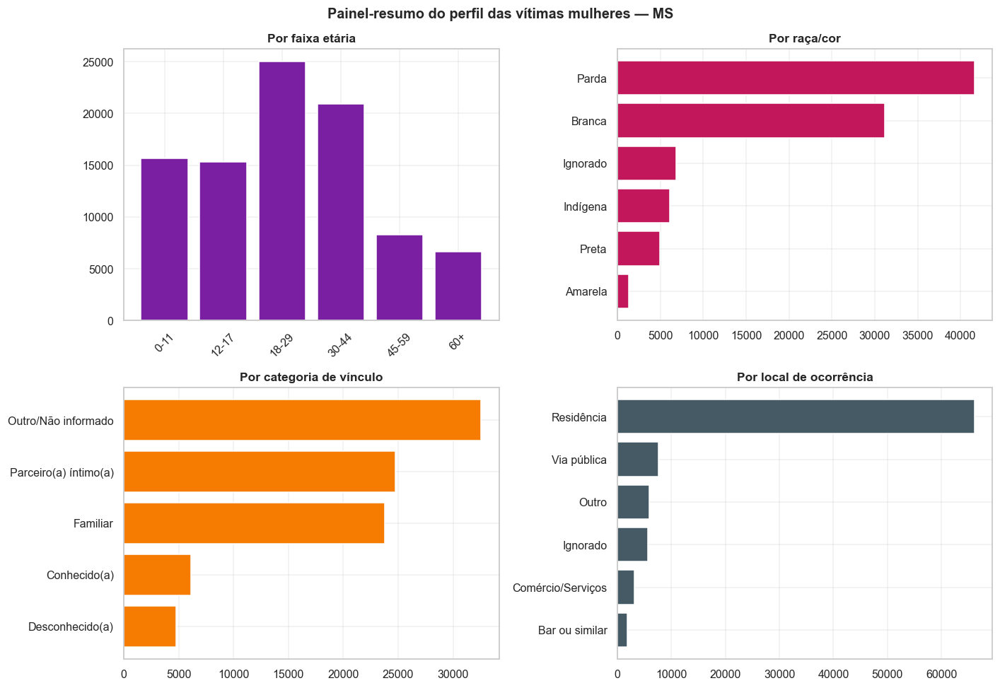

   ✅ Painel-resumo das vítimas concluído.


In [65]:
banner("PAINEL-RESUMO DAS VÍTIMAS")

if plt is not None and len(DF_MULHERES):
    fig, axes = plt.subplots(2, 2, figsize=(13, 9))
    # faixa etária
    fe = DF_MULHERES["FAIXA_SIMPLES"].value_counts().sort_index()
    axes[0, 0].bar(fe.index.astype(str), fe.values, color=COR_PRIMARIA)
    axes[0, 0].set_title("Por faixa etária"); axes[0, 0].tick_params(axis="x", rotation=45)
    # raça/cor
    rc = DF_MULHERES["RACA_COR"].value_counts().head(6)
    axes[0, 1].barh(rc.index[::-1], rc.values[::-1], color=COR_SECUNDARIA)
    axes[0, 1].set_title("Por raça/cor")
    # vínculo
    vc = DF_MULHERES["CATEGORIA_VINCULO"].value_counts()
    axes[1, 0].barh(vc.index[::-1], vc.values[::-1], color=COR_DESTAQUE)
    axes[1, 0].set_title("Por categoria de vínculo")
    # local
    lc = DF_MULHERES["LOCAL_DESC"].value_counts().head(6)
    axes[1, 1].barh(lc.index[::-1], lc.values[::-1], color=COR_NEUTRA)
    axes[1, 1].set_title("Por local de ocorrência")
    fig.suptitle("Painel-resumo do perfil das vítimas mulheres — MS",
                 fontweight="bold", fontsize=13)
    fig.tight_layout()
    salvar_grafico(fig, "38P_painel_vitimas", "Painel-resumo das vítimas")
sucesso("Painel-resumo das vítimas concluído.")

============================================================
## SEÇÃO 38.Q — Testes de associação (qui-quadrado)
============================================================

Testes estatísticos de **independência (qui-quadrado)** entre dimensões categóricas e
o desfecho de interesse (ex.: vínculo × violência sexual; raça/cor × óbito; faixa etária
× estupro). Indicam se há associação estatisticamente significativa (p < 0,05).

In [66]:
banner("TESTES DE ASSOCIAÇÃO (QUI-QUADRADO)")


def teste_qui_quadrado(dim, flag, rotulo):
    """Executa qui-quadrado entre uma dimensão categórica e uma flag (0/1)."""
    if not CAP.get("scipy") or dim not in DF_MULHERES.columns:
        return None
    try:
        tab = pd.crosstab(DF_MULHERES[dim], DF_MULHERES[flag])
        if tab.shape[0] < 2 or tab.shape[1] < 2:
            return None
        chi2, p, dof, _ = stats.chi2_contingency(tab)
        n = tab.values.sum()
        cramer = math.sqrt(chi2 / (n * (min(tab.shape) - 1))) if n else np.nan
        return {"Associação": rotulo, "Qui-quadrado": round(chi2, 2),
                "gl": dof, "p-valor": f"{p:.2e}",
                "Cramér_V": round(cramer, 3),
                "Significativo (p<0,05)": "Sim" if p < 0.05 else "Não"}
    except Exception:
        return None


testes = []
for dim, flag, rot in [
    ("CATEGORIA_VINCULO", "FL_VIOL_SEXUAL", "Vínculo × violência sexual"),
    ("RACA_COR", "FL_OBITO_VIOLENCIA", "Raça/cor × óbito por violência"),
    ("FAIXA_SIMPLES", "FL_ESTUPRO", "Faixa etária × estupro"),
    ("ESCOLARIDADE", "FL_VIOL_DOMESTICA", "Escolaridade × violência doméstica"),
    ("LOCAL_DESC", "FL_VIOL_FISIC", "Local × violência física"),
    ("CATEGORIA_VINCULO", "FL_FEMINICIDIO", "Vínculo × feminicídio (proxy)"),
    ("PERIODO_DIA", "FL_VIOL_SEXUAL", "Período do dia × violência sexual"),
]:
    r = teste_qui_quadrado(dim, flag, rot)
    if r:
        testes.append(r)
if testes:
    df_testes = pd.DataFrame(testes)
    show_df(df_testes, "Testes de associação (qui-quadrado)", max_linhas=12)
    salvar_csv(df_testes, "38Q_testes_associacao", "Testes de associação qui-quadrado")
    registrar_planilha("Testes_Associacao", df_testes)
    rel_qq = RelatorioTexto("Testes de Associação (Qui-quadrado)")
    rel_qq.texto("Associação entre dimensões categóricas e desfechos de violência.")
    rel_qq.tabela_df(df_testes)
    rel_qq.texto("\nInterpretação: p<0,05 indica associação estatisticamente "
                 "significativa; Cramér's V mede a força da associação (0=nula, 1=total).")
    rel_qq.salvar(DIRS["relatorios"] / "38Q_testes_associacao.txt")
else:
    aviso("Sem dados suficientes para testes de associação.")
sucesso("Testes de associação concluídos.")


[65] TESTES DE ASSOCIAÇÃO (QUI-QUADRADO)

--- Testes de associação (qui-quadrado) ------------------------------


,Associação,Qui-quadrado,gl,p-valor,Cramér_V,"Significativo (p<0,05)"
0,Vínculo × violência sexual,6542.60,4,0.00e+00,0.267,Sim
1,Raça/cor × óbito por violência,18.62,5,2.26e-03,0.014,Sim
2,Faixa etária × estupro,3851.74,5,0.00e+00,0.205,Sim
3,Escolaridade × violência doméstica,1431.52,10,1.55e-301,0.125,Sim
4,Local × violência física,4277.92,9,0.00e+00,0.216,Sim
5,Vínculo × feminicídio (proxy),5.72,4,2.21e-01,0.008,Não
6,Período do dia × violência sexual,1788.57,4,0.00e+00,0.139,Sim


   📝 Relatório salvo: 38Q_testes_associacao.txt
   ✅ Testes de associação concluídos.


============================================================
## SEÇÃO 38.R — Caracterização dos clusters de municípios
============================================================

Descreve o **perfil médio** de cada cluster identificado (Seção 34), traduzindo os
grupos em rótulos interpretáveis (ex.: "alta taxa + forte componente sexual").

In [67]:
banner("CARACTERIZAÇÃO DOS CLUSTERS DE MUNICÍPIOS")

if perfil_mun is not None and "cluster_kmeans" in perfil_mun.columns:
    try:
        feats_desc = [c for c in ["taxa_total", "taxa_sexual", "pct_domestica",
                                  "pct_parceiro", "pct_negra", "pct_jovem",
                                  "idade_media"] if c in perfil_mun.columns]
        carac = perfil_mun.groupby("cluster_kmeans")[feats_desc].mean().round(2)
        carac["n_municipios"] = perfil_mun.groupby("cluster_kmeans").size()
        show_df(carac.reset_index(), "Perfil médio por cluster", max_linhas=12)
        salvar_csv(carac.reset_index(), "38R_clusters_perfil",
                   "Perfil médio dos clusters")
        registrar_planilha("Clusters_Perfil", carac.reset_index())
        # rótulos interpretáveis simples
        rotulos = {}
        media_taxa = carac["taxa_total"].mean()
        for cl, row in carac.iterrows():
            partes = []
            partes.append("alta taxa" if row["taxa_total"] >= media_taxa else "taxa moderada/baixa")
            if "pct_parceiro" in row and row["pct_parceiro"] >= carac["pct_parceiro"].mean():
                partes.append("forte componente de parceiro íntimo")
            if "taxa_sexual" in row and row["taxa_sexual"] >= carac["taxa_sexual"].mean():
                partes.append("componente sexual relevante")
            rotulos[cl] = "; ".join(partes)
        df_rot = pd.DataFrame([{"Cluster": k, "Caracterização": v,
                                "Municípios": int(carac.loc[k, "n_municipios"])}
                               for k, v in rotulos.items()])
        show_df(df_rot, "Rótulos interpretáveis dos clusters", max_linhas=12)
        rel_cl = RelatorioTexto("Caracterização dos Clusters de Municípios")
        rel_cl.tabela_df(carac.reset_index(), titulo="Perfil médio")
        rel_cl.tabela_df(df_rot, titulo="Interpretação")
        rel_cl.salvar(DIRS["relatorios"] / "38R_clusters_caracterizacao.txt")
    except Exception as exc:
        aviso("Caracterização de clusters falhou: %s", exc)
else:
    info("Clusters indisponíveis — caracterização ignorada.")
sucesso("Caracterização dos clusters concluída.")


[66] CARACTERIZAÇÃO DOS CLUSTERS DE MUNICÍPIOS

--- Perfil médio por cluster -----------------------------------------


,cluster_kmeans,taxa_total,taxa_sexual,pct_domestica,pct_parceiro,pct_negra,pct_jovem,idade_media,n_municipios
0,0,554.13,42.29,0.83,0.41,0.48,0.57,29.22,24
1,1,137.32,30.48,0.74,0.32,0.59,0.67,24.98,12
2,2,149.34,13.65,0.84,0.42,0.48,0.55,29.12,42



--- Rótulos interpretáveis dos clusters ------------------------------


,Cluster,Caracterização,Municípios
0,0,alta taxa; forte componente de parceiro íntimo...,24
1,1,taxa moderada/baixa; componente sexual relevante,12
2,2,taxa moderada/baixa; forte componente de parce...,42


   📝 Relatório salvo: 38R_clusters_caracterizacao.txt
   ✅ Caracterização dos clusters concluída.


============================================================
## SEÇÃO 38.S — Relatórios anuais individuais
============================================================

Gera um relatório Texttable por ano analisado, com os principais indicadores do ano —
útil para acompanhamento histórico e comparação interanual.

In [68]:
banner("RELATÓRIOS ANUAIS INDIVIDUAIS")

anos_rel = sorted(DF_MULHERES["ANO"].dropna().unique())
n_rel_anuais = 0
for ano in anos_rel:
    sub = DF_MULHERES[DF_MULHERES["ANO"] == ano]
    if len(sub) < 1:
        continue
    rel_ano = RelatorioTexto(f"Relatório Anual {int(ano)}",
                             periodo=str(int(ano)))
    rel_ano.kv({
        "Notificações (mulheres)": formato_numero(len(sub)),
        "Violência doméstica": formato_numero(int(sub["FL_VIOL_DOMESTICA"].sum())),
        "Violência sexual": formato_numero(int(sub["FL_VIOL_SEXUAL"].sum())),
        "Estupro": formato_numero(int(sub["FL_ESTUPRO"].sum())),
        "Ameaça": formato_numero(int(sub["FL_AMEACA"].sum())),
        "Feminicídio (proxy)": formato_numero(int(sub["FL_FEMINICIDIO"].sum())),
        "Idade média": f"{sub['IDADE'].mean():.1f}",
        "Faixa etária predominante": _moda_segura(sub["FAIXA_ETARIA"]),
        "Raça/cor predominante": _moda_segura(sub["RACA_COR"]),
        "Vínculo predominante": _moda_segura(sub["VINCULO_AUTOR"]),
    }, titulo=f"Indicadores de {int(ano)}")
    top_mun_ano = (sub["COD_MUN"].map(MUNICIPIOS_MS).value_counts().head(10))
    rel_ano.secao("Top 10 municípios")
    rel_ano.tabela_df(top_mun_ano.rename_axis("Municipio")
                      .reset_index(name="Notificacoes"))
    rel_ano.salvar(DIRS["relatorios"] / f"38S_relatorio_{int(ano)}.txt",
                   tambem_log=False)
    n_rel_anuais += 1
info("Relatórios anuais gerados: %d", n_rel_anuais)
sucesso("Relatórios anuais individuais concluídos.")


[67] RELATÓRIOS ANUAIS INDIVIDUAIS
   📝 Relatório salvo: 38S_relatorio_2009.txt
   📝 Relatório salvo: 38S_relatorio_2010.txt
   📝 Relatório salvo: 38S_relatorio_2011.txt
   📝 Relatório salvo: 38S_relatorio_2012.txt
   📝 Relatório salvo: 38S_relatorio_2013.txt
   📝 Relatório salvo: 38S_relatorio_2014.txt
   📝 Relatório salvo: 38S_relatorio_2015.txt
   📝 Relatório salvo: 38S_relatorio_2016.txt
   📝 Relatório salvo: 38S_relatorio_2017.txt
   📝 Relatório salvo: 38S_relatorio_2018.txt
   📝 Relatório salvo: 38S_relatorio_2019.txt
   📝 Relatório salvo: 38S_relatorio_2020.txt
   📝 Relatório salvo: 38S_relatorio_2021.txt
   📝 Relatório salvo: 38S_relatorio_2022.txt
   📝 Relatório salvo: 38S_relatorio_2023.txt
   📝 Relatório salvo: 38S_relatorio_2024.txt
   📝 Relatório salvo: 38S_relatorio_2025.txt
   Relatórios anuais gerados: 17
   ✅ Relatórios anuais individuais concluídos.


============================================================
## SEÇÃO 38.T — Recomendações por município prioritário
============================================================

Gera recomendações **automáticas** (baseadas em regras sobre os índices) para os
municípios prioritários, traduzindo os indicadores em sugestões de ação — material de
apoio à decisão, sempre com a ressalva de que se trata de subsídio analítico.

In [69]:
banner("RECOMENDAÇÕES POR MUNICÍPIO PRIORITÁRIO")


def gerar_recomendacoes(cod):
    """Gera recomendações textuais simples a partir dos índices do município."""
    recs = []
    linha = idx[idx["COD_MUN"] == cod]
    if not len(linha):
        return recs
    r = linha.iloc[0]
    if r.get("Idx_resposta", 100) < idx["Idx_resposta"].median():
        recs.append("Fortalecer a rede de proteção (DEAM, CREAS, casa abrigo): "
                    "resposta institucional abaixo da mediana estadual.")
    if r.get("Idx_subnotif", 0) > 50:
        recs.append("Investigar possível subnotificação e capacitar serviços de saúde "
                    "para a notificação compulsória.")
    if r.get("Idx_gravidade", 0) >= idx["Idx_gravidade"].median():
        recs.append("Priorizar atenção a casos graves (violência física/sexual e óbitos).")
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    if len(sub) and sub["FL_PARCEIRO_INTIMO"].mean() > 0.3:
        recs.append("Programas focados em violência por parceiro íntimo (acompanhamento "
                    "de medidas protetivas e grupos reflexivos de autores).")
    if len(sub) and (sub["IDADE"] < 18).mean() > 0.2:
        recs.append("Reforçar proteção a crianças e adolescentes (conselho tutelar, "
                    "escola, vara da infância).")
    if not recs:
        recs.append("Manter monitoramento contínuo dos indicadores.")
    return recs


rel_rec = RelatorioTexto("Recomendações por Município Prioritário")
rel_rec.texto("Recomendações automáticas (subsídio analítico) para os municípios de "
              "maior Índice de Alerta. Não substituem avaliação técnica local.")
for cod in idx_rank.head(10)["COD_MUN"]:
    nome_mun = MUNICIPIOS_MS.get(cod, cod)
    recs = gerar_recomendacoes(cod)
    rel_rec.secao(f"{nome_mun}")
    for i, rec in enumerate(recs, 1):
        rel_rec.texto(f"  {i}. {rec}")
rel_rec.salvar(DIRS["relatorios"] / "38T_recomendacoes_municipios.txt")
print("Exemplo (município de maior alerta):")
cod_top = idx_rank.iloc[0]["COD_MUN"]
for rec in gerar_recomendacoes(cod_top):
    print(f"   • {rec}")
sucesso("Recomendações por município concluídas.")


[68] RECOMENDAÇÕES POR MUNICÍPIO PRIORITÁRIO
   📝 Relatório salvo: 38T_recomendacoes_municipios.txt
Exemplo (município de maior alerta):
   • Programas focados em violência por parceiro íntimo (acompanhamento de medidas protetivas e grupos reflexivos de autores).
   • Reforçar proteção a crianças e adolescentes (conselho tutelar, escola, vara da infância).
   ✅ Recomendações por município concluídas.


============================================================
## SEÇÃO 38.U — Vítimas com deficiência/transtorno
============================================================

Recorte de vulnerabilidade: vítimas com **deficiência** ou **transtorno** (campos
`DEF_*`/`TRAN_*`). Em geral muito subpreenchido — a própria completude é um indicador
de qualidade da notificação.


[69] VÍTIMAS COM DEFICIÊNCIA/TRANSTORNO

--- Vítimas por tipo de deficiência/transtorno -----------------------


,Tipo,Notificações
0,Transtorno mental,5353
1,Transtorno de comportamento,2954
2,Deficiência intelectual,1240
3,Outra deficiência,1170
4,Deficiência física,1124
5,Deficiência visual,346
6,Deficiência auditiva,341


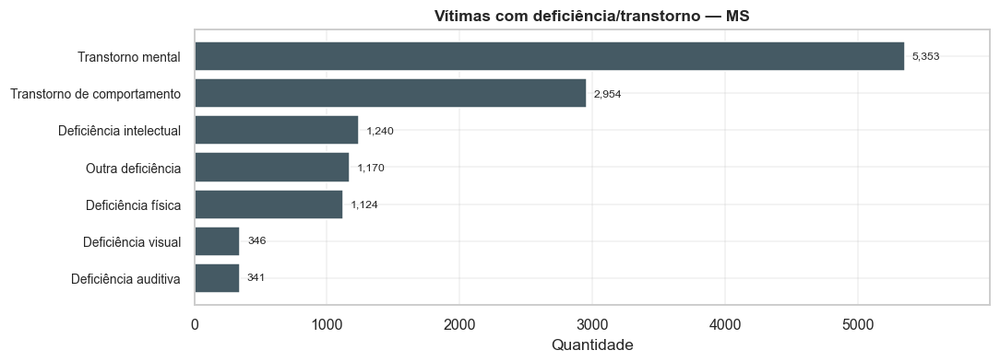

   Vítimas com alguma deficiência/transtorno: 10.022 (10.9%)
   ✅ Análise de deficiência/transtorno concluída.


In [70]:
banner("VÍTIMAS COM DEFICIÊNCIA/TRANSTORNO")

freq_def = {MAP_DEFICIENCIA[c]: int(DF_MULHERES[f"FL_{c}"].sum())
            for c in COLS_DEFICIENCIA if f"FL_{c}" in DF_MULHERES.columns}
serie_def = pd.Series(freq_def).sort_values(ascending=False)
if serie_def.sum() > 0:
    show_df(serie_def.rename_axis("Tipo").reset_index(name="Notificações"),
            "Vítimas por tipo de deficiência/transtorno", max_linhas=10)
    barras_horizontais(serie_def, "Vítimas com deficiência/transtorno — MS",
                       "38U_deficiencia", cor=COR_NEUTRA,
                       descricao="Deficiência/transtorno")
    salvar_csv(serie_def.rename_axis("Tipo").reset_index(name="Notificacoes"),
               "38U_deficiencia", "Vítimas com deficiência/transtorno")
    info("Vítimas com alguma deficiência/transtorno: %s (%.1f%%)",
         formato_numero(int(DF_MULHERES["FL_POSSUI_DEFICIENCIA"].sum())),
         100 * DF_MULHERES["FL_POSSUI_DEFICIENCIA"].mean())
else:
    aviso("Campos de deficiência sem registros positivos nesta amostra.")
sucesso("Análise de deficiência/transtorno concluída.")

============================================================
## SEÇÃO 38.V — Consequências e procedimentos (violência sexual)
============================================================

Consequências notificadas (gravidez, DST, tentativa de suicídio, etc.) e procedimentos
realizados na rede (profilaxias, contracepção de emergência) — particularmente
relevantes nos casos de violência sexual.


[70] CONSEQUÊNCIAS E PROCEDIMENTOS

--- Consequências da violência (mulheres) ----------------------------


,Consequência,Notificações
0,Estresse pós-traumático,1932
1,Tentativa de suicídio,648
2,Problema de comportamento,548
3,Outra consequência,297
4,Gravidez,243
5,Problema mental,181
6,DST/IST,73
7,Aborto,51


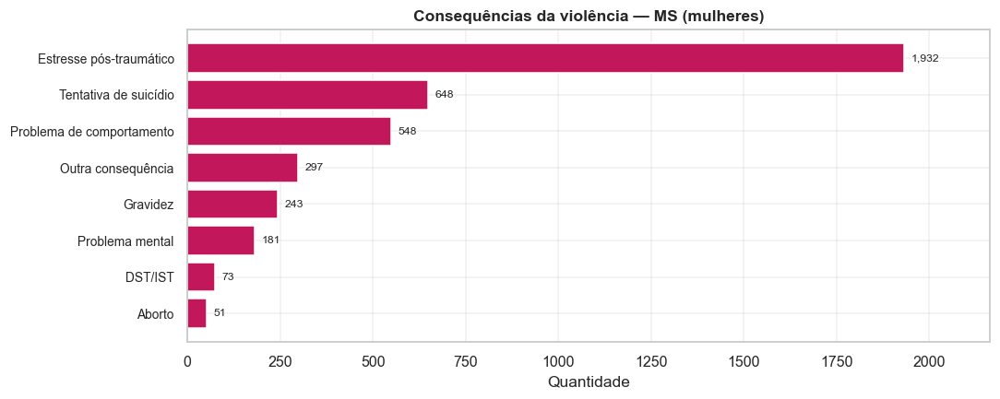


--- Procedimentos realizados (vítimas de violência sexual) -----------


,Procedimento,Notificações
0,Profilaxia DST,2071
1,Profilaxia HIV,1948
2,Coleta de sangue,1549
3,Profilaxia Hepatite B,1379
4,Contracepção de emergência,1260
5,Coleta secreção vaginal,459
6,Coleta de sêmen,216
7,Aborto previsto em lei,138


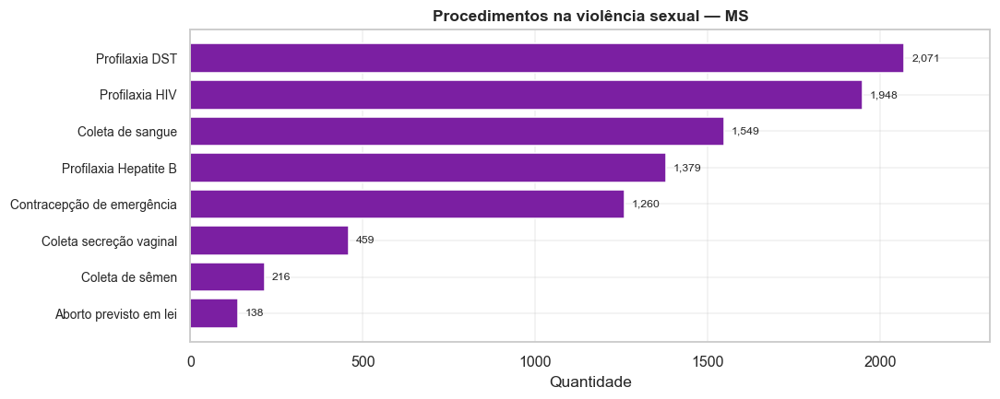

   ✅ Análise de consequências e procedimentos concluída.


In [71]:
banner("CONSEQUÊNCIAS E PROCEDIMENTOS")

freq_cons = {MAP_CONSEQUENCIA[c]: int(DF_MULHERES[f"FL_{c}"].sum())
             for c in COLS_CONSEQUENCIA if f"FL_{c}" in DF_MULHERES.columns}
serie_cons = pd.Series(freq_cons).sort_values(ascending=False)
if serie_cons.sum() > 0:
    show_df(serie_cons.rename_axis("Consequência").reset_index(name="Notificações"),
            "Consequências da violência (mulheres)", max_linhas=10)
    barras_horizontais(serie_cons, "Consequências da violência — MS (mulheres)",
                       "38V_consequencias", cor=COR_SECUNDARIA,
                       descricao="Consequências da violência")
    salvar_csv(serie_cons.rename_axis("Consequencia").reset_index(name="Notificacoes"),
               "38V_consequencias", "Consequências da violência")

# Procedimentos entre vítimas de violência sexual
base_sex2 = DF_MULHERES[DF_MULHERES["FL_VIOL_SEXUAL"] == 1]
freq_proc = {MAP_PROCEDIMENTO[c]: int(base_sex2[f"FL_{c}"].sum())
             for c in COLS_PROCEDIMENTO if f"FL_{c}" in base_sex2.columns}
serie_proc = pd.Series(freq_proc).sort_values(ascending=False)
if len(base_sex2) and serie_proc.sum() > 0:
    show_df(serie_proc.rename_axis("Procedimento").reset_index(name="Notificações"),
            "Procedimentos realizados (vítimas de violência sexual)", max_linhas=10)
    barras_horizontais(serie_proc, "Procedimentos na violência sexual — MS",
                       "38V_procedimentos", cor=COR_PRIMARIA,
                       descricao="Procedimentos (violência sexual)")
    salvar_csv(serie_proc.rename_axis("Procedimento").reset_index(name="Notificacoes"),
               "38V_procedimentos", "Procedimentos (violência sexual)")
sucesso("Análise de consequências e procedimentos concluída.")

============================================================
## SEÇÃO 38.W — Violência autoprovocada (recorte específico)
============================================================

A notificação do SINAN inclui a **violência autoprovocada** (`LES_AUTOP=1`),
frequentemente associada a sofrimento mental. Aqui isolamos esse recorte entre mulheres,
por ano e faixa etária, complementando a análise interpessoal.


[71] VIOLÊNCIA AUTOPROVOCADA
   Notificações de violência autoprovocada (mulheres): 22.427


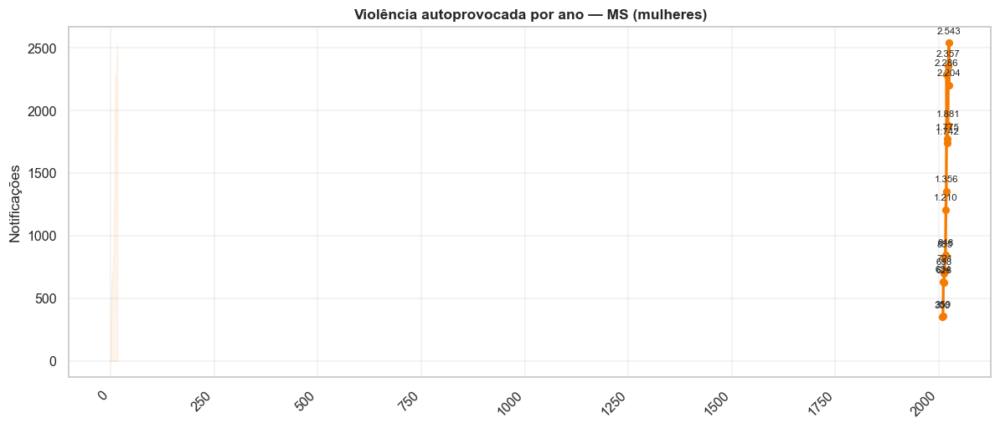


--- Autoprovocada por faixa etária -----------------------------------


,FAIXA_ETARIA,Registros,%
0,12-17,5462,24.4
1,30-39,4218,18.9
2,20-24,3607,16.1
3,40-49,2717,12.1
4,25-29,2686,12.0
5,18-19,1735,7.8
6,50-59,1146,5.1
7,60+,471,2.1
8,0-11,328,1.5


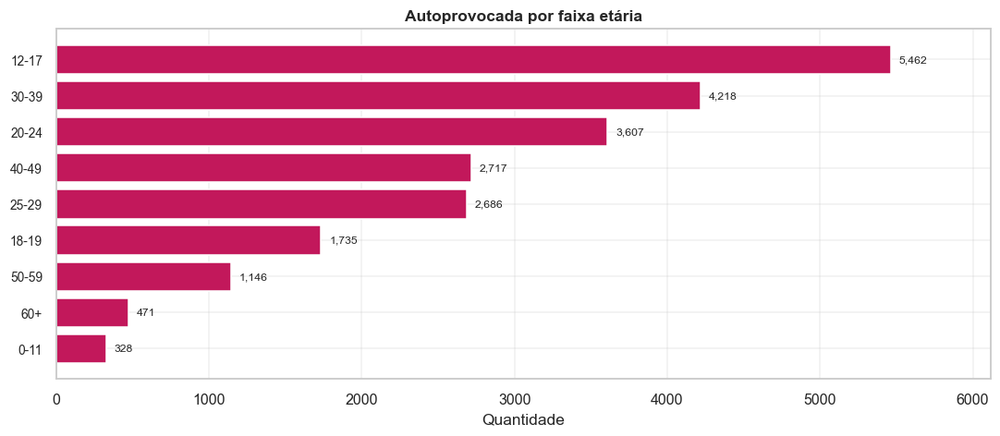

   Com tentativa de suicídio registrada: 562
   ✅ Análise de violência autoprovocada concluída.


In [72]:
banner("VIOLÊNCIA AUTOPROVOCADA")

base_auto = DF_MULHERES[pd.to_numeric(DF_MULHERES.get("LES_AUTOP"),
                                      errors="coerce") == 1]
info("Notificações de violência autoprovocada (mulheres): %s",
     formato_numero(len(base_auto)))
if len(base_auto):
    s_auto_ano = base_auto.groupby("ANO").size()
    linha_temporal(s_auto_ano, "Violência autoprovocada por ano — MS (mulheres)",
                   "38W_autoprovocada_ano", ylabel="Notificações", cor=COR_DESTAQUE,
                   descricao="Violência autoprovocada por ano")
    analisar_dimensao("FAIXA_ETARIA", "Autoprovocada por faixa etária",
                      "38W_autoprovocada_faixa", base=base_auto, cor=COR_SECUNDARIA,
                      top=12)
    # consequência: tentativa de suicídio
    if "FL_CONS_SUIC" in base_auto.columns:
        info("Com tentativa de suicídio registrada: %s",
             formato_numero(int(base_auto["FL_CONS_SUIC"].sum())))
    salvar_csv(s_auto_ano.rename_axis("Ano").reset_index(name="Notificacoes"),
               "38W_autoprovocada_ano", "Violência autoprovocada por ano")
else:
    aviso("Sem registros de violência autoprovocada nesta amostra.")
sucesso("Análise de violência autoprovocada concluída.")

============================================================
## SEÇÃO 38.X — Catálogo completo de campos do conjunto
============================================================

Catálogo de **todos os campos efetivamente presentes** no conjunto bruto, com a
completude observada — referência técnica e parte da trilha de auditoria.

In [73]:
banner("CATÁLOGO COMPLETO DE CAMPOS DO CONJUNTO")

catalogo = []
descr_extra = {}
descr_extra.update({c: f"Deficiência/transtorno: {MAP_DEFICIENCIA[c]}"
                    for c in COLS_DEFICIENCIA})
descr_extra.update({c: f"Consequência: {MAP_CONSEQUENCIA[c]}"
                    for c in COLS_CONSEQUENCIA})
descr_extra.update({c: f"Procedimento: {MAP_PROCEDIMENTO[c]}"
                    for c in COLS_PROCEDIMENTO})
descr_extra.update({c: f"Encaminhamento: {MAP_ENCAMINHAMENTO[c]}"
                    for c in COLS_ENCAMINHAMENTO})
for col in df_raw.columns:
    desc = "—"
    if col in DICIONARIO_VARIAVEIS:
        desc = DICIONARIO_VARIAVEIS[col][0]
    elif col in descr_extra:
        desc = descr_extra[col]
    catalogo.append({
        "Campo": col,
        "Descrição": desc,
        "Tipo_inferido": str(df[col].dtype) if col in df.columns else "texto",
        "Completude_%": round(df_raw[col].notna().mean() * 100, 1),
        "Valores_distintos": int(df_raw[col].nunique(dropna=True)),
    })
df_catalogo = pd.DataFrame(catalogo)
show_df(df_catalogo, "Catálogo completo de campos", max_linhas=40)
salvar_csv(df_catalogo, "38X_catalogo_campos", "Catálogo completo de campos")
registrar_planilha("Catalogo_Campos", df_catalogo)
rel_cat = RelatorioTexto("Catálogo Completo de Campos do Conjunto")
rel_cat.texto(f"Total de campos no conjunto bruto: {df_raw.shape[1]}.")
rel_cat.tabela_df(df_catalogo, max_linhas=200)
rel_cat.salvar(DIRS["relatorios"] / "38X_catalogo_campos.txt")
sucesso("Catálogo completo de campos concluído.")


[72] CATÁLOGO COMPLETO DE CAMPOS DO CONJUNTO

--- Catálogo completo de campos --------------------------------------


,Campo,Descrição,Tipo_inferido,Completude_%,Valores_distintos
0,ID_AGRAVO,Código do agravo (CID),object,100.0,1
1,DT_NOTIFIC,Data da notificação,datetime64[ns],100.0,6159
2,SEM_NOT,—,object,86.9,796
3,NU_ANO,Ano da notificação,object,93.3,16
4,SG_UF_NOT,UF de notificação,object,100.0,1
5,ID_MUNICIP,Município de notificação,object,100.0,79
6,ID_UNIDADE,—,object,99.9,840
7,DT_OCOR,Data da ocorrência,datetime64[ns],99.8,6326
8,ANO_NASC,—,object,98.9,122
9,NU_IDADE_N,Idade codificada,float64,99.8,308


   ... (120 linhas no total; exibindo as 40 primeiras)
   📝 Relatório salvo: 38X_catalogo_campos.txt
   ✅ Catálogo completo de campos concluído.


============================================================
## SEÇÃO 38.Y — Encaminhamentos por município e intervalos de confiança
============================================================

Detalha a **resposta institucional por município** (proporção de casos encaminhados à
rede de proteção) e estima **intervalos de confiança (bootstrap)** para a taxa dos
municípios de maior volume — quantificando a incerteza dos indicadores.

In [74]:
banner("ENCAMINHAMENTOS POR MUNICÍPIO E INTERVALOS DE CONFIANÇA")

enc_mun = (DF_MULHERES.groupby("COD_MUN")
           .agg(n=("FL_FEMININO", "sum"),
                encaminhados=("N_ENCAMINHAMENTOS", lambda s: int((s > 0).sum())))
           .reset_index())
enc_mun["Municipio"] = enc_mun["COD_MUN"].map(MUNICIPIOS_MS)
enc_mun = enc_mun.dropna(subset=["Municipio"])
enc_mun["pct_encaminhado"] = (enc_mun["encaminhados"] / enc_mun["n"].replace(0, np.nan)
                              * 100).round(1)
enc_mun = enc_mun[enc_mun["n"] >= 10].sort_values("pct_encaminhado", ascending=False)
if len(enc_mun):
    show_df(enc_mun.head(15)[["Municipio", "n", "encaminhados", "pct_encaminhado"]],
            "Encaminhamento à rede por município (maiores)", max_linhas=15)
    salvar_csv(enc_mun, "38Y_encaminhamento_municipio", "Encaminhamentos por município")
    registrar_planilha("Encaminhamento_Mun", enc_mun)


def bootstrap_ic(valores, n_boot=1000, alpha=0.05):
    """Intervalo de confiança bootstrap para a média de uma amostra binária/contínua."""
    if len(valores) < 3:
        return (np.nan, np.nan)
    rng = np.random.default_rng(SEED)
    medias = [rng.choice(valores, size=len(valores), replace=True).mean()
              for _ in range(n_boot)]
    return (round(float(np.percentile(medias, 100 * alpha / 2)), 4),
            round(float(np.percentile(medias, 100 * (1 - alpha / 2))), 4))


ic_linhas = []
for cod in rank_abs.head(10)["COD_MUN"]:
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    if len(sub) < 5:
        continue
    li, ls = bootstrap_ic(sub["FL_VIOL_DOMESTICA"].values)
    ic_linhas.append({"Municipio": MUNICIPIOS_MS.get(cod, cod),
                      "n": len(sub),
                      "%_doméstica": round(100 * sub["FL_VIOL_DOMESTICA"].mean(), 1),
                      "IC95%_inf": round(li * 100, 1) if not np.isnan(li) else "-",
                      "IC95%_sup": round(ls * 100, 1) if not np.isnan(ls) else "-"})
if ic_linhas:
    df_ic = pd.DataFrame(ic_linhas)
    show_df(df_ic, "Proporção de violência doméstica com IC 95% (bootstrap)",
            max_linhas=12)
    salvar_csv(df_ic, "38Y_intervalos_confianca", "Intervalos de confiança (bootstrap)")
sucesso("Encaminhamentos e intervalos de confiança concluídos.")


[73] ENCAMINHAMENTOS POR MUNICÍPIO E INTERVALOS DE CONFIANÇA

--- Encaminhamento à rede por município (maiores) --------------------


,Municipio,n,encaminhados,pct_encaminhado
18,Camapuã,28,22,78.6
69,Sete Quedas,47,31,66.0
45,Juti,103,60,58.3
44,Jardim,1197,594,49.6
67,Santa Rita do Pardo,17,7,41.2
0,Água Clara,366,128,35.0
71,Sidrolândia,835,292,35.0
21,Cassilândia,626,214,34.2
43,Jaraguari,16,5,31.2
7,Aparecida do Taboado,94,29,30.9



--- Proporção de violência doméstica com IC 95% (bootstrap) ----------


,Municipio,n,%_doméstica,IC95%_inf,IC95%_sup
0,Campo Grande,44815,86.0,85.7,86.3
1,Corumbá,10960,81.9,81.1,82.6
2,Dourados,4313,72.8,71.6,74.2
3,Três Lagoas,3210,87.0,85.9,88.2
4,Nova Andradina,2289,84.4,83.0,85.8
5,Ponta Porã,1843,81.7,80.0,83.5
6,Amambai,1788,86.8,85.2,88.3
7,São Gabriel do Oeste,1640,83.4,81.6,85.1
8,Aquidauana,1585,81.0,79.0,82.9
9,Jardim,1197,83.5,81.5,85.5


   ✅ Encaminhamentos e intervalos de confiança concluídos.


============================================================
## SEÇÃO 38.Z — Ensemble de votação (Voting Classifier)
============================================================

Combina os melhores classificadores em um **ensemble de votação** (soft voting),
estratégia frequentemente mais estável que modelos isolados.

In [75]:
banner("ENSEMBLE DE VOTAÇÃO (VOTING CLASSIFIER)")

if modelagem_viavel and clf_resultados:
    try:
        from sklearn.ensemble import VotingClassifier
        estimadores = []
        estimadores.append(("rf", RandomForestClassifier(n_estimators=200,
                                                         random_state=SEED, n_jobs=-1)))
        estimadores.append(("et", ExtraTreesClassifier(n_estimators=200,
                                                       random_state=SEED, n_jobs=-1)))
        estimadores.append(("gb", GradientBoostingClassifier(random_state=SEED)))
        if CAP.get("xgboost"):
            estimadores.append(("xgb", xgb.XGBClassifier(
                n_estimators=200, eval_metric="mlogloss", random_state=SEED,
                verbosity=0)))
        t0 = time.time()
        voting = VotingClassifier(estimators=estimadores, voting="soft")
        voting.fit(X_tr, y_tr)
        pred_v = voting.predict(X_te)
        met_v = {"accuracy": accuracy_score(y_te, pred_v),
                 "f1_macro": f1_score(y_te, pred_v, average="macro", zero_division=0)}
        registrar_modelo("VotingClassifier (soft)", "ML (ensemble)", "Classificação",
                         met_v, time.time() - t0,
                         obs=f"{len(estimadores)} estimadores")
        info("Ensemble de votação — Acurácia: %.3f | F1-macro: %.3f",
             met_v["accuracy"], met_v["f1_macro"])
    except Exception as exc:
        aviso("VotingClassifier falhou: %s", exc)
sucesso("Ensemble de votação concluído.")


[74] ENSEMBLE DE VOTAÇÃO (VOTING CLASSIFIER)
   🧠 VotingClassifier (soft)    [Classificação] accuracy=0.948 | f1_macro=0.948
   Ensemble de votação — Acurácia: 0.948 | F1-macro: 0.948
   ✅ Ensemble de votação concluído.


============================================================
## SEÇÃO 38.AA — Comparação por sexo (mulheres × homens)
============================================================

Embora o foco do projeto seja a violência contra a mulher, comparar com as notificações
de homens ajuda a dimensionar a **sobrerrepresentação feminina** em determinados eixos
(especialmente violência sexual e por parceiro íntimo).


[75] COMPARAÇÃO POR SEXO (MULHERES × HOMENS)

--- Notificações por sexo e eixo -------------------------------------


,Eixo,Mulheres,Homens,% mulheres
0,Doméstica,77283,37490,67.3
1,Física,45348,22431,66.9
2,Psicológica,15232,3535,81.2
3,Sexual,8162,1163,87.5
4,Estupro,5946,672,89.8
5,Ameaça,8913,1937,82.1
6,Óbito por violência,83,111,42.8


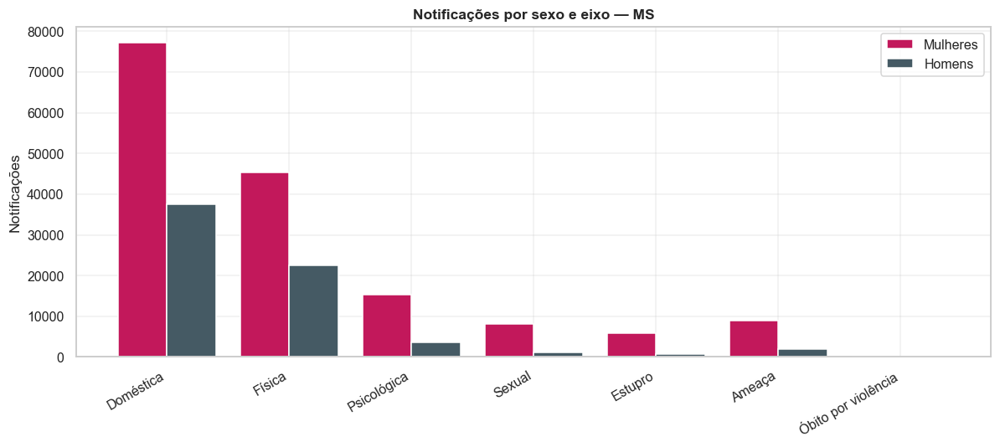

   ✅ Comparação por sexo concluída.


In [76]:
banner("COMPARAÇÃO POR SEXO (MULHERES × HOMENS)")

comp_sexo = []
for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
                  ("FL_VIOL_PSICOLOGICA", "Psicológica"), ("FL_VIOL_SEXUAL", "Sexual"),
                  ("FL_ESTUPRO", "Estupro"), ("FL_AMEACA", "Ameaça"),
                  ("FL_OBITO_VIOLENCIA", "Óbito por violência")]:
    if flag not in df.columns:
        continue
    nf = int(df[(df["FL_FEMININO"] == 1)][flag].sum())
    nm = int(df[(df["FL_FEMININO"] == 0)][flag].sum())
    total = nf + nm
    comp_sexo.append({"Eixo": rot, "Mulheres": nf, "Homens": nm,
                      "% mulheres": round(100 * nf / total, 1) if total else 0})
df_comp_sexo = pd.DataFrame(comp_sexo)
show_df(df_comp_sexo, "Notificações por sexo e eixo", max_linhas=10)
salvar_csv(df_comp_sexo, "38AA_comparacao_sexo", "Comparação por sexo")
registrar_planilha("Comparacao_Sexo", df_comp_sexo)
if plt is not None and len(df_comp_sexo):
    fig, ax = plt.subplots(figsize=(11, 5))
    x = np.arange(len(df_comp_sexo))
    ax.bar(x - 0.2, df_comp_sexo["Mulheres"], width=0.4, label="Mulheres",
           color=COR_SECUNDARIA)
    ax.bar(x + 0.2, df_comp_sexo["Homens"], width=0.4, label="Homens",
           color=COR_NEUTRA)
    ax.set_xticks(x); ax.set_xticklabels(df_comp_sexo["Eixo"], rotation=30, ha="right")
    ax.set_title("Notificações por sexo e eixo — MS"); ax.set_ylabel("Notificações")
    ax.legend(); fig.tight_layout()
    salvar_grafico(fig, "38AA_comparacao_sexo", "Comparação por sexo e eixo")
sucesso("Comparação por sexo concluída.")

============================================================
## SEÇÃO 38.AB — Desfecho/evolução do caso por eixo
============================================================


[76] DESFECHO/EVOLUÇÃO DO CASO POR EIXO

--- Desfecho/evolução das notificações (mulheres) --------------------


,EVOLUCAO_DESC,Registros,%
0,Ignorado,73697,80.1
1,Alta,17751,19.3
2,Evasão/Abandono,427,0.5
3,Óbito por violência,83,0.1
4,Óbito por outras causas,12,0.0


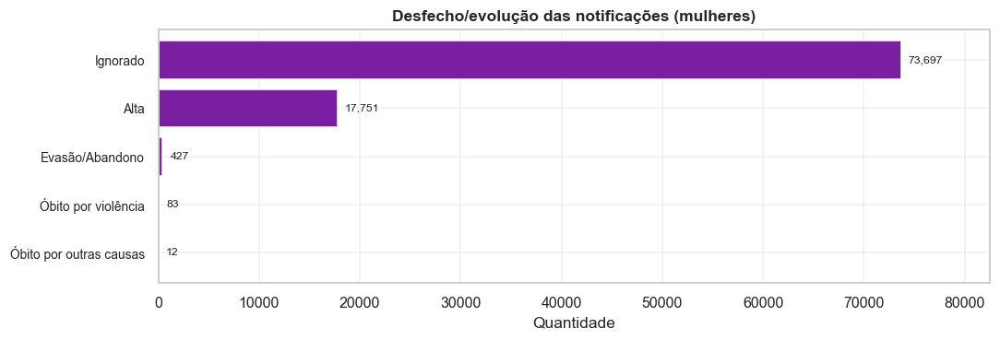


--- Eixo × desfecho --------------------------------------------------


EVOLUCAO_DESC,Eixo,Alta,Evasão/Abandono,Ignorado,Óbito por outras causas,Óbito por violência
0,Física,10299,161,33265,5,64
1,Outra,5046,228,31358,6,13
2,Psicológica,701,14,2646,1,1
3,Sexual,1705,24,6428,0,5


   ✅ Análise de desfecho concluída.


In [77]:
banner("DESFECHO/EVOLUÇÃO DO CASO POR EIXO")

analisar_dimensao("EVOLUCAO_DESC", "Desfecho/evolução das notificações (mulheres)",
                  "38AB_evolucao", cor=COR_PRIMARIA, top=8)
piv_evol = (DF_MULHERES.assign(
    Eixo=np.select(
        [DF_MULHERES["FL_VIOL_SEXUAL"] == 1, DF_MULHERES["FL_VIOL_FISIC"] == 1,
         DF_MULHERES["FL_VIOL_PSICOLOGICA"] == 1],
        ["Sexual", "Física", "Psicológica"], default="Outra"))
    .pivot_table(index="Eixo", columns="EVOLUCAO_DESC", values="FL_FEMININO",
                 aggfunc="sum", fill_value=0))
if len(piv_evol):
    show_df(piv_evol.reset_index(), "Eixo × desfecho", max_linhas=8)
    salvar_csv(piv_evol.reset_index(), "38AB_eixo_desfecho", "Eixo × desfecho")
sucesso("Análise de desfecho concluída.")

============================================================
## SEÇÃO 38.AC — Raça/cor e escolaridade por eixo (cruzamentos)
============================================================


[77] RAÇA/COR E ESCOLARIDADE POR EIXO


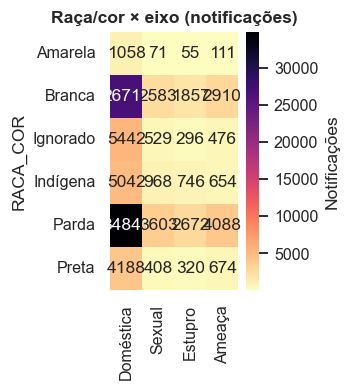

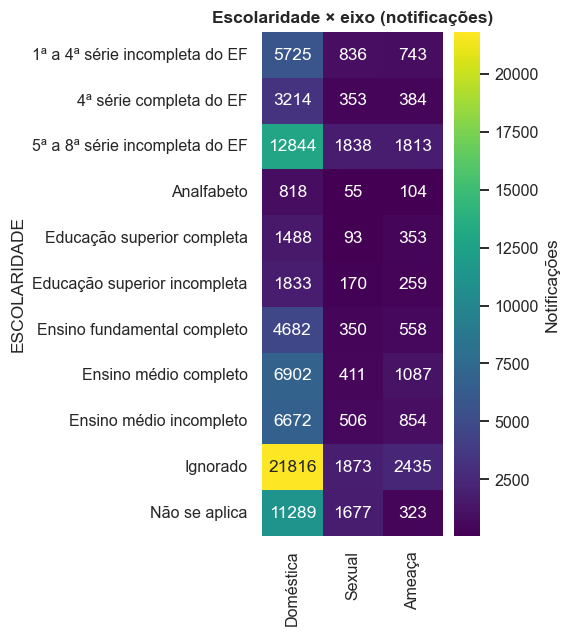

   ✅ Cruzamentos raça/escolaridade × eixo concluídos.


In [78]:
banner("RAÇA/COR E ESCOLARIDADE POR EIXO")

piv_raca_eixo = pd.DataFrame({
    rot: DF_MULHERES[DF_MULHERES[flag] == 1]["RACA_COR"].value_counts()
    for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"),
                      ("FL_VIOL_SEXUAL", "Sexual"), ("FL_ESTUPRO", "Estupro"),
                      ("FL_AMEACA", "Ameaça")]
}).fillna(0).astype(int)
if len(piv_raca_eixo):
    heatmap_cruzado(piv_raca_eixo, "Raça/cor × eixo (notificações)",
                    "38AC_raca_eixo", cmap="magma_r")
piv_esc_eixo = pd.DataFrame({
    rot: DF_MULHERES[DF_MULHERES[flag] == 1]["ESCOLARIDADE"].value_counts()
    for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"),
                      ("FL_VIOL_SEXUAL", "Sexual"), ("FL_AMEACA", "Ameaça")]
}).fillna(0).astype(int)
if len(piv_esc_eixo):
    heatmap_cruzado(piv_esc_eixo, "Escolaridade × eixo (notificações)",
                    "38AC_escolaridade_eixo", cmap="viridis")
sucesso("Cruzamentos raça/escolaridade × eixo concluídos.")

============================================================
## SEÇÃO 38.AD — Idade × tipo de violência (distribuições)
============================================================


[78] IDADE × TIPO DE VIOLÊNCIA


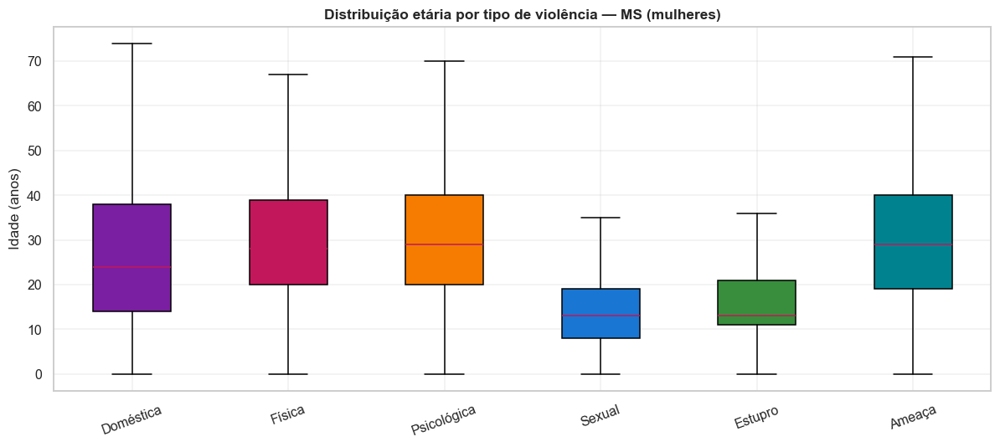


--- Idade mediana/média por eixo -------------------------------------


,Eixo,Idade_mediana,Idade_média,n
0,Doméstica,24.0,27.7,77141
1,Física,28.0,30.5,45269
2,Psicológica,29.0,31.2,15202
3,Sexual,13.0,16.0,8158
4,Estupro,13.0,17.0,5942
5,Ameaça,29.0,30.9,8900


   ✅ Análise idade × tipo de violência concluída.


In [79]:
banner("IDADE × TIPO DE VIOLÊNCIA")

if plt is not None:
    eixos_box = [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
                 ("FL_VIOL_PSICOLOGICA", "Psicológica"), ("FL_VIOL_SEXUAL", "Sexual"),
                 ("FL_ESTUPRO", "Estupro"), ("FL_AMEACA", "Ameaça")]
    dados_idade = []
    rotulos_idade = []
    for flag, rot in eixos_box:
        vals = DF_MULHERES[DF_MULHERES[flag] == 1]["IDADE"].dropna().values
        if len(vals) >= 5:
            dados_idade.append(vals); rotulos_idade.append(rot)
    if dados_idade:
        fig, ax = plt.subplots(figsize=(11, 5))
        bp = ax.boxplot(dados_idade, labels=rotulos_idade, patch_artist=True,
                        showfliers=False)
        for patch, cor in zip(bp["boxes"], PALETA_SIPREV):
            patch.set_facecolor(cor)
        ax.set_title("Distribuição etária por tipo de violência — MS (mulheres)")
        ax.set_ylabel("Idade (anos)"); ax.tick_params(axis="x", rotation=20)
        fig.tight_layout()
        salvar_grafico(fig, "38AD_idade_por_eixo", "Idade por tipo de violência")
        # tabela de medianas
        tab_med = pd.DataFrame({
            "Eixo": rotulos_idade,
            "Idade_mediana": [round(float(np.median(v)), 1) for v in dados_idade],
            "Idade_média": [round(float(np.mean(v)), 1) for v in dados_idade],
            "n": [len(v) for v in dados_idade],
        })
        show_df(tab_med, "Idade mediana/média por eixo", max_linhas=10)
        salvar_csv(tab_med, "38AD_idade_por_eixo", "Idade por eixo")
sucesso("Análise idade × tipo de violência concluída.")

============================================================
## SEÇÃO 38.AE — Mapas por eixo temático (small multiples geográficos)
============================================================

Gera um mapa estático (scatter georreferenciado) por eixo temático, evidenciando a
distribuição territorial específica de cada tipo de violência.


[79] MAPAS POR EIXO TEMÁTICO


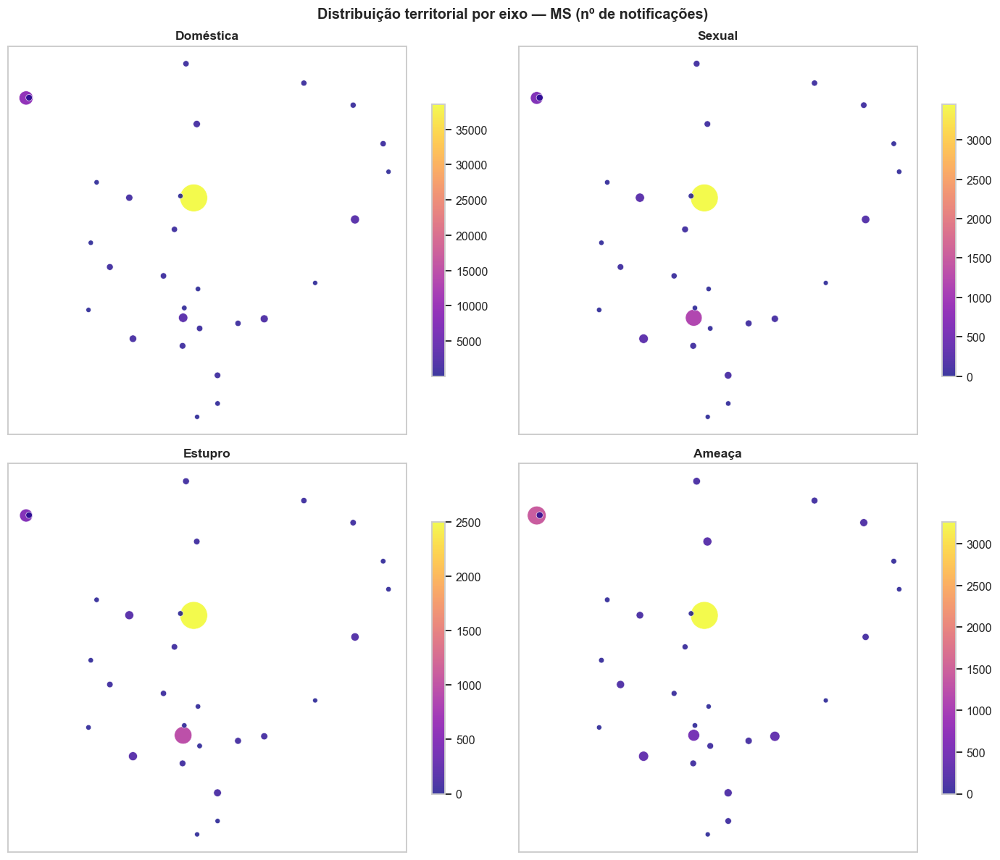

   ✅ Mapas por eixo temático concluídos.


In [80]:
banner("MAPAS POR EIXO TEMÁTICO")

if plt is not None and len(geo_com_coord):
    eixos_mapa = [("N_Doméstica", "Doméstica"), ("N_Sexual", "Sexual"),
                  ("N_Estupro", "Estupro"), ("N_Ameaça", "Ameaça")]
    eixos_mapa = [(c, r) for c, r in eixos_mapa if c in geo_com_coord.columns]
    if eixos_mapa:
        fig, axes = plt.subplots(2, 2, figsize=(13, 11))
        axes = axes.flatten()
        for i, (col, rot) in enumerate(eixos_mapa[:4]):
            ax = axes[i]
            tam = 20 + 600 * (geo_com_coord[col] / (geo_com_coord[col].max() or 1))
            sc = ax.scatter(geo_com_coord["lon"], geo_com_coord["lat"], s=tam,
                            c=geo_com_coord[col], cmap="plasma", alpha=0.8,
                            edgecolors="white", linewidths=0.5)
            ax.set_title(f"{rot}"); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(sc, ax=ax, shrink=0.7)
        fig.suptitle("Distribuição territorial por eixo — MS (nº de notificações)",
                     fontweight="bold", fontsize=13)
        fig.tight_layout()
        salvar_grafico(fig, "38AE_mapas_por_eixo", "Mapas por eixo temático")
sucesso("Mapas por eixo temático concluídos.")

============================================================
## SEÇÃO 38.AF — Diagnósticos adicionais de ML (PCA e seleção)
============================================================

Variância explicada por **PCA** dos atributos e **seleção de atributos** (SelectKBest)
— apoiam a interpretação e a parcimônia dos modelos.


[80] DIAGNÓSTICOS ADICIONAIS DE ML (PCA E SELEÇÃO)


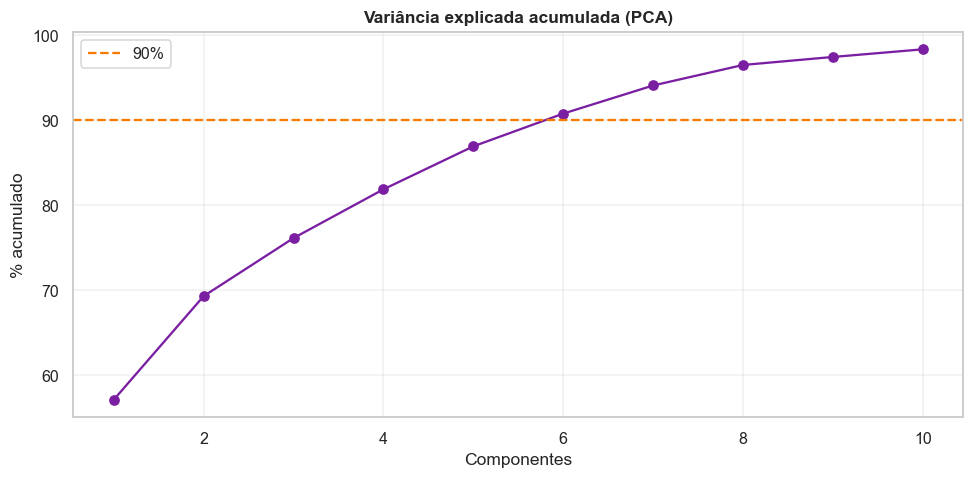

   Componentes para 90% da variância: 6

--- Seleção de atributos (ANOVA F) -----------------------------------


,Atributo,Score_F
0,n_fisica,78.778222
1,n_parceiro,78.449140
2,n_psico,63.387229
3,n_ameaca,58.480223
4,n_reincidencia,50.278524
5,ANO,46.333211
6,n_total,45.888200
7,n_domestica,44.641180
8,n_total_lag1,40.770507
9,pct_sexual,34.418857


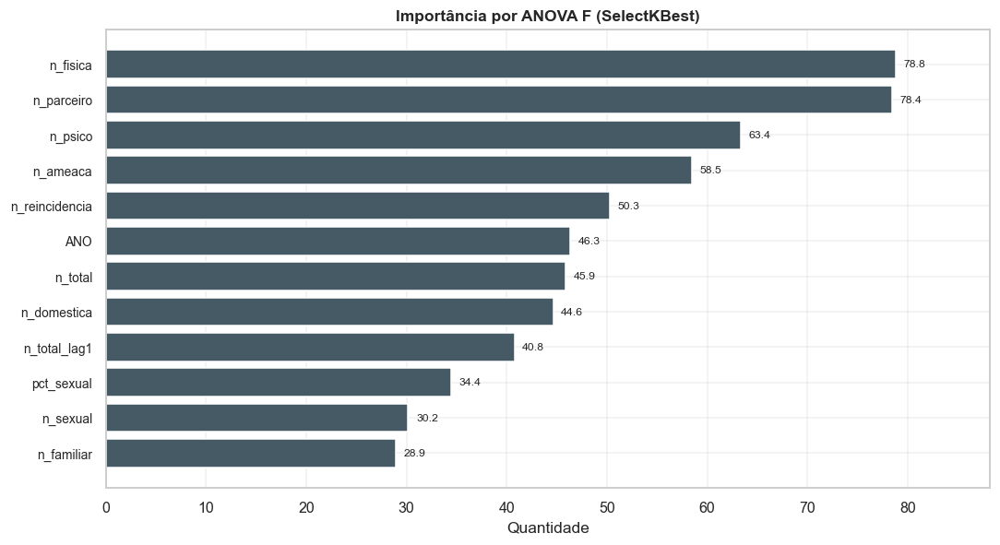

   ✅ Diagnósticos adicionais de ML concluídos.


In [81]:
banner("DIAGNÓSTICOS ADICIONAIS DE ML (PCA E SELEÇÃO)")

if modelagem_viavel:
    try:
        Xpca = StandardScaler().fit_transform(PAINEL[FEATURES_ML].fillna(0).values)
        pca_full = PCA(n_components=min(len(FEATURES_ML), 10), random_state=SEED)
        pca_full.fit(Xpca)
        var_exp = np.cumsum(pca_full.explained_variance_ratio_)
        if plt is not None:
            fig, ax = plt.subplots(figsize=(9, 4.5))
            ax.plot(range(1, len(var_exp) + 1), var_exp * 100, "o-", color=COR_PRIMARIA)
            ax.axhline(90, color=COR_DESTAQUE, linestyle="--", label="90%")
            ax.set_title("Variância explicada acumulada (PCA)")
            ax.set_xlabel("Componentes"); ax.set_ylabel("% acumulado"); ax.legend()
            fig.tight_layout()
            salvar_grafico(fig, "38AF_pca_variancia", "Variância explicada (PCA)")
        info("Componentes para 90%% da variância: %d",
             int(np.argmax(var_exp >= 0.9) + 1))
    except Exception as exc:
        aviso("PCA diagnóstico falhou: %s", exc)
    try:
        from sklearn.feature_selection import SelectKBest, f_classif
        sel = SelectKBest(f_classif, k=min(10, len(FEATURES_ML)))
        sel.fit(PAINEL[FEATURES_ML].fillna(0).values,
                LabelEncoder().fit_transform(PAINEL["classe_risco"].astype(str)))
        sc_sel = pd.Series(sel.scores_, index=FEATURES_ML).sort_values(ascending=False)
        show_df(sc_sel.head(12).rename_axis("Atributo").reset_index(name="Score_F"),
                "Seleção de atributos (ANOVA F)", max_linhas=12)
        salvar_csv(sc_sel.rename_axis("atributo").reset_index(name="score_f"),
                   "38AF_selecao_atributos", "Seleção de atributos (SelectKBest)")
        barras_horizontais(sc_sel.head(12), "Importância por ANOVA F (SelectKBest)",
                           "38AF_selecao_atributos", cor=COR_NEUTRA, fmt="{:.1f}",
                           descricao="Seleção de atributos")
    except Exception as exc:
        aviso("Seleção de atributos falhou: %s", exc)
sucesso("Diagnósticos adicionais de ML concluídos.")

============================================================
## SEÇÃO 38.AG — Tempestividade (ocorrência → notificação → encerramento)
============================================================

Mede a **tempestividade** do sistema de vigilância: dias entre a ocorrência e a
notificação, e entre a notificação e o encerramento. Atrasos longos podem indicar
gargalos na rede de atenção e na investigação.


[81] TEMPESTIVIDADE DA NOTIFICAÇÃO

--- Tempestividade (dias) --------------------------------------------


,Intervalo,n,Mediana_dias,Média_dias
0,Ocorrência → Notificação,91420,0.0,3.8
1,Notificação → Encerramento,91646,0.0,37.8


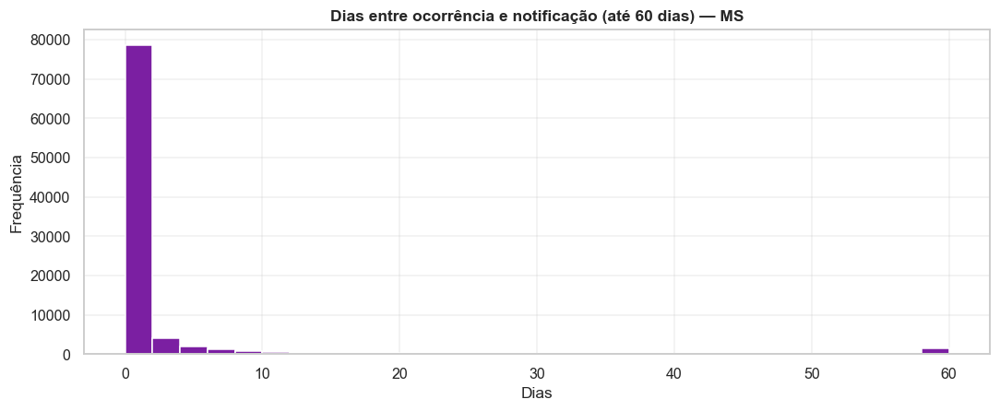

   ✅ Análise de tempestividade concluída.


In [82]:
banner("TEMPESTIVIDADE DA NOTIFICAÇÃO")

base_t = DF_MULHERES.copy()
base_t["dias_ocor_notif"] = (base_t["DT_NOTIFIC"] - base_t["DT_OCOR"]).dt.days
base_t["dias_notif_encerra"] = (base_t["DT_ENCERRA"] - base_t["DT_NOTIFIC"]).dt.days
# remove valores impossíveis
val_on = base_t["dias_ocor_notif"][(base_t["dias_ocor_notif"] >= 0)
                                   & (base_t["dias_ocor_notif"] <= 365)]
val_ne = base_t["dias_notif_encerra"][(base_t["dias_notif_encerra"] >= 0)
                                      & (base_t["dias_notif_encerra"] <= 730)]
tab_temp = pd.DataFrame({
    "Intervalo": ["Ocorrência → Notificação", "Notificação → Encerramento"],
    "n": [len(val_on), len(val_ne)],
    "Mediana_dias": [round(val_on.median(), 1) if len(val_on) else np.nan,
                     round(val_ne.median(), 1) if len(val_ne) else np.nan],
    "Média_dias": [round(val_on.mean(), 1) if len(val_on) else np.nan,
                   round(val_ne.mean(), 1) if len(val_ne) else np.nan],
})
show_df(tab_temp, "Tempestividade (dias)", max_linhas=4)
salvar_csv(tab_temp, "38AG_tempestividade", "Tempestividade da notificação")
if plt is not None and len(val_on) > 10:
    fig, ax = plt.subplots(figsize=(10, 4.2))
    ax.hist(val_on.clip(0, 60), bins=30, color=COR_PRIMARIA, edgecolor="white")
    ax.set_title("Dias entre ocorrência e notificação (até 60 dias) — MS")
    ax.set_xlabel("Dias"); ax.set_ylabel("Frequência")
    fig.tight_layout()
    salvar_grafico(fig, "38AG_dias_ocor_notif", "Tempestividade ocorrência→notificação")
sucesso("Análise de tempestividade concluída.")

============================================================
## SEÇÃO 38.AH — Coorte por ano de nascimento
============================================================


[82] COORTE POR ANO DE NASCIMENTO

--- Vítimas por década de nascimento ---------------------------------


,Década de nascimento,Notificações
0,1920,515
1,1930,1532
2,1940,2241
3,1950,2737
4,1960,4888
5,1970,9897
6,1980,15754
7,1990,20529
8,2000,19013
9,2010,10629


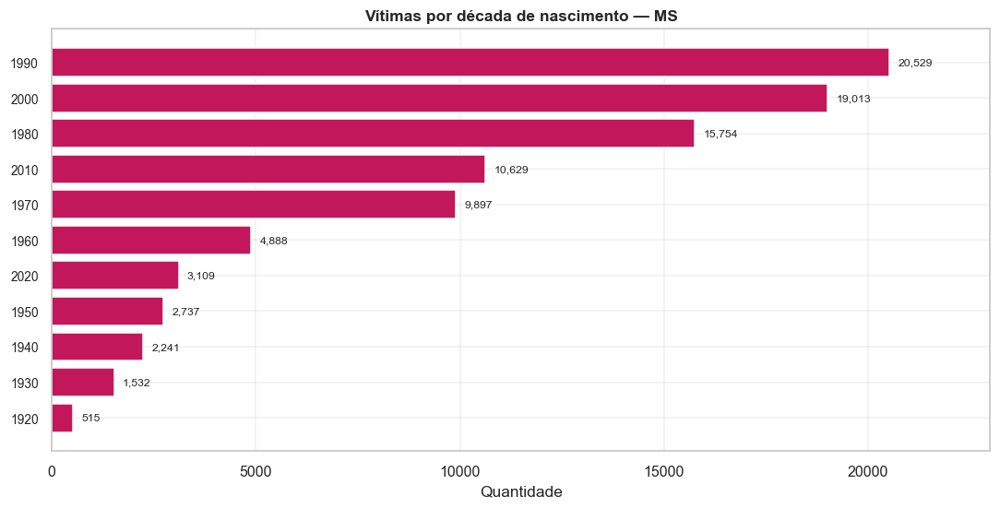

   ✅ Análise de coorte concluída.


In [83]:
banner("COORTE POR ANO DE NASCIMENTO")

base_t["ano_nasc_num"] = pd.to_numeric(base_t["ANO_NASC"], errors="coerce")
cohort = base_t[(base_t["ano_nasc_num"] >= 1920) & (base_t["ano_nasc_num"] <= 2025)]
if len(cohort):
    cohort = cohort.copy()
    cohort["decada_nasc"] = (cohort["ano_nasc_num"] // 10 * 10).astype("Int64")
    s_coh = cohort["decada_nasc"].value_counts().sort_index()
    show_df(s_coh.rename_axis("Década de nascimento").reset_index(name="Notificações"),
            "Vítimas por década de nascimento", max_linhas=15)
    barras_horizontais(s_coh.astype(int), "Vítimas por década de nascimento — MS",
                       "38AH_coorte_nascimento", cor=COR_SECUNDARIA,
                       descricao="Coorte por ano de nascimento")
    salvar_csv(s_coh.rename_axis("decada").reset_index(name="n"),
               "38AH_coorte_nascimento", "Coorte por ano de nascimento")
else:
    aviso("Sem ano de nascimento válido para análise de coorte.")
sucesso("Análise de coorte concluída.")

============================================================
## SEÇÃO 38.AI — Capital × interior
============================================================


[83] CAPITAL (CAMPO GRANDE) × INTERIOR

--- Capital × interior (números e taxas/100k) ------------------------


,Eixo,Capital_n,Interior_n,Capital_taxa,Interior_taxa
0,Total,44815,47155,9912.5,5039.1
1,Doméstica,38548,38735,8526.4,4139.3
2,Sexual,3451,4711,763.3,503.4
3,Estupro,2501,3445,553.2,368.1
4,Ameaça,3266,5647,722.4,603.5
5,Feminicídio,29,54,6.4,5.8


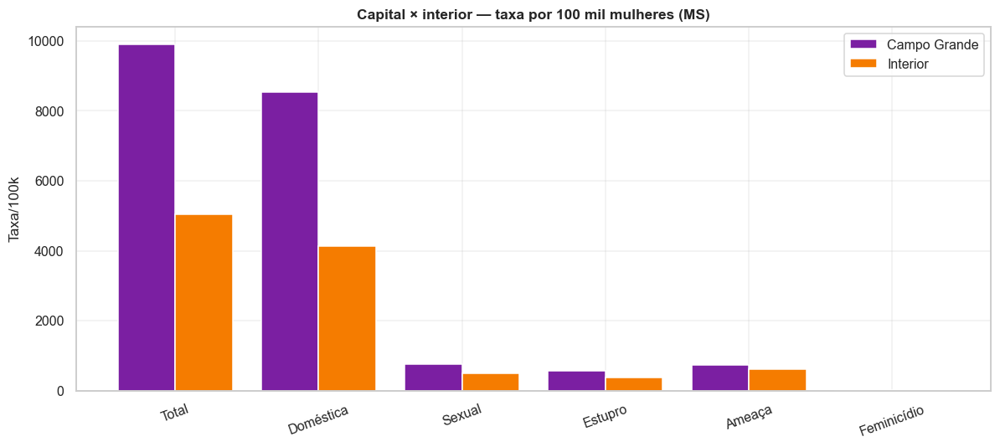

   ✅ Comparação capital × interior concluída.


In [84]:
banner("CAPITAL (CAMPO GRANDE) × INTERIOR")

COD_CAPITAL = "500270"
cap = DF_MULHERES[DF_MULHERES["COD_MUN"] == COD_CAPITAL]
inter = DF_MULHERES[(DF_MULHERES["COD_MUN"] != COD_CAPITAL)
                    & (DF_MULHERES["NM_MUN"] != "Outro/Não identificado")]
pop_cap = POP_FEM_MUN_MS.get(COD_CAPITAL, 1)
pop_int = sum(v for k, v in POP_FEM_MUN_MS.items() if k != COD_CAPITAL)
comp_ci = []
for flag, rot in [("FL_FEMININO", "Total"), ("FL_VIOL_DOMESTICA", "Doméstica"),
                  ("FL_VIOL_SEXUAL", "Sexual"), ("FL_ESTUPRO", "Estupro"),
                  ("FL_AMEACA", "Ameaça"), ("FL_FEMINICIDIO", "Feminicídio")]:
    ncap = int(cap[flag].sum()); nint = int(inter[flag].sum())
    comp_ci.append({"Eixo": rot, "Capital_n": ncap, "Interior_n": nint,
                    "Capital_taxa": round(ncap / pop_cap * 100_000, 1),
                    "Interior_taxa": round(nint / pop_int * 100_000, 1)})
df_ci = pd.DataFrame(comp_ci)
show_df(df_ci, "Capital × interior (números e taxas/100k)", max_linhas=8)
salvar_csv(df_ci, "38AI_capital_interior", "Capital × interior")
registrar_planilha("Capital_Interior", df_ci)
if plt is not None:
    fig, ax = plt.subplots(figsize=(11, 5))
    x = np.arange(len(df_ci))
    ax.bar(x - 0.2, df_ci["Capital_taxa"], width=0.4, label="Campo Grande",
           color=COR_PRIMARIA)
    ax.bar(x + 0.2, df_ci["Interior_taxa"], width=0.4, label="Interior",
           color=COR_DESTAQUE)
    ax.set_xticks(x); ax.set_xticklabels(df_ci["Eixo"], rotation=20)
    ax.set_title("Capital × interior — taxa por 100 mil mulheres (MS)")
    ax.set_ylabel("Taxa/100k"); ax.legend()
    fig.tight_layout()
    salvar_grafico(fig, "38AI_capital_interior", "Capital × interior")
sucesso("Comparação capital × interior concluída.")

============================================================
## SEÇÃO 38.AJ — Tipos de penetração na violência sexual
============================================================


[84] TIPOS DE PENETRAÇÃO (VIOLÊNCIA SEXUAL)

--- Tipos de penetração (violência sexual) ---------------------------


,Tipo,Notificações
0,Vaginal,1125
1,Oral,201
2,Anal,192


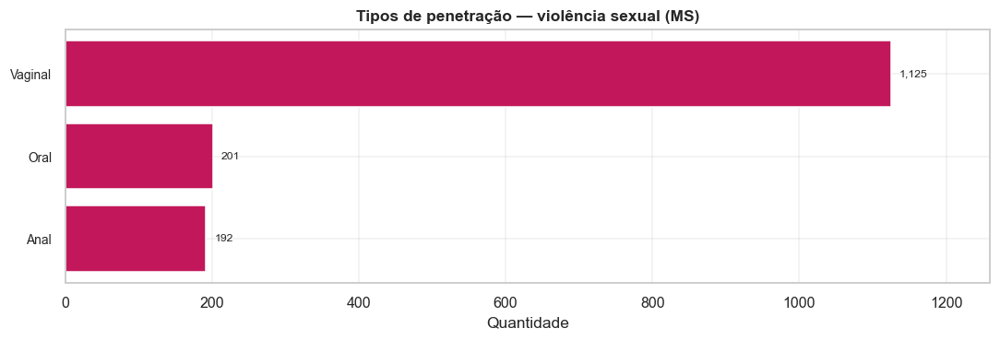

   ✅ Análise de tipos de penetração concluída.


In [85]:
banner("TIPOS DE PENETRAÇÃO (VIOLÊNCIA SEXUAL)")

base_pen = DF_MULHERES[DF_MULHERES["FL_VIOL_SEXUAL"] == 1].copy()
PEN_MAP = {"PEN_ORAL": "Oral", "PEN_ANAL": "Anal", "PEN_VAGINA": "Vaginal"}
freq_pen = {}
for col, rot in PEN_MAP.items():
    if col in base_pen.columns:
        freq_pen[rot] = int((pd.to_numeric(base_pen[col], errors="coerce") == 1).sum())
serie_pen = pd.Series(freq_pen).sort_values(ascending=False)
if serie_pen.sum() > 0:
    show_df(serie_pen.rename_axis("Tipo").reset_index(name="Notificações"),
            "Tipos de penetração (violência sexual)", max_linhas=5)
    barras_horizontais(serie_pen, "Tipos de penetração — violência sexual (MS)",
                       "38AJ_penetracao", cor=COR_SECUNDARIA,
                       descricao="Tipos de penetração")
    salvar_csv(serie_pen.rename_axis("Tipo").reset_index(name="n"),
               "38AJ_penetracao", "Tipos de penetração")
else:
    aviso("Campos de penetração sem registros nesta amostra.")
sucesso("Análise de tipos de penetração concluída.")

============================================================
## SEÇÃO 38.AK — Cobertura de notificação (unidades e semanas)
============================================================

Indicadores de **cobertura/capilaridade** do sistema: número de unidades notificadoras
distintas por município (mais unidades → maior capacidade de captação) e distribuição por
semana epidemiológica.


[85] COBERTURA DE NOTIFICAÇÃO

--- Unidades notificadoras distintas por município -------------------


,Municipio,n,unidades
19,Campo Grande,44815,176
31,Dourados,4313,54
25,Corumbá,10960,41
8,Aquidauana,1585,35
60,Ponta Porã,1843,31
76,Três Lagoas,3210,26
71,Sidrolândia,835,22
54,Nova Andradina,2289,15
2,Amambai,1788,15
49,Miranda,152,14


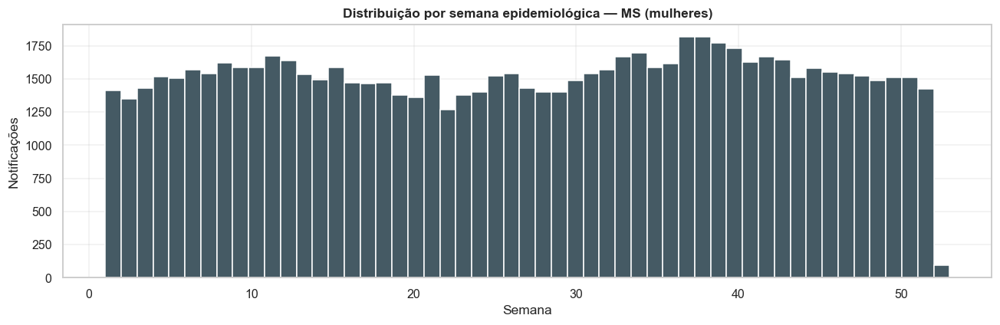

   ✅ Análise de cobertura concluída.


In [86]:
banner("COBERTURA DE NOTIFICAÇÃO")

if "ID_UNIDADE" in DF_MULHERES.columns:
    cob = (DF_MULHERES.groupby("COD_MUN")
           .agg(n=("FL_FEMININO", "sum"),
                unidades=("ID_UNIDADE", lambda s: int(s.nunique()))).reset_index())
    cob["Municipio"] = cob["COD_MUN"].map(MUNICIPIOS_MS)
    cob = cob.dropna(subset=["Municipio"]).sort_values("unidades", ascending=False)
    if cob["unidades"].sum() > 0:
        show_df(cob.head(15)[["Municipio", "n", "unidades"]],
                "Unidades notificadoras distintas por município", max_linhas=15)
        salvar_csv(cob, "38AK_cobertura_unidades", "Cobertura por unidades")
        registrar_planilha("Cobertura_Unidades", cob)

# Distribuição por semana epidemiológica
if "SEM_NOT" in DF_MULHERES.columns:
    sem = pd.to_numeric(DF_MULHERES["SEM_NOT"].astype(str).str[-2:], errors="coerce")
    sem = sem[(sem >= 1) & (sem <= 53)]
    if len(sem) and plt is not None:
        fig, ax = plt.subplots(figsize=(12, 4))
        ax.hist(sem, bins=53, color=COR_NEUTRA, edgecolor="white")
        ax.set_title("Distribuição por semana epidemiológica — MS (mulheres)")
        ax.set_xlabel("Semana"); ax.set_ylabel("Notificações")
        fig.tight_layout()
        salvar_grafico(fig, "38AK_semana_epi", "Distribuição por semana epidemiológica")
sucesso("Análise de cobertura concluída.")

============================================================
## SEÇÃO 38.AL — Fichas visuais dos municípios prioritários
============================================================

Para cada município prioritário (maior Índice de Alerta), gera um **painel visual** com
evolução anual, eixos e perfil etário — material direto para gestores locais.


[86] FICHAS VISUAIS DOS MUNICÍPIOS PRIORITÁRIOS


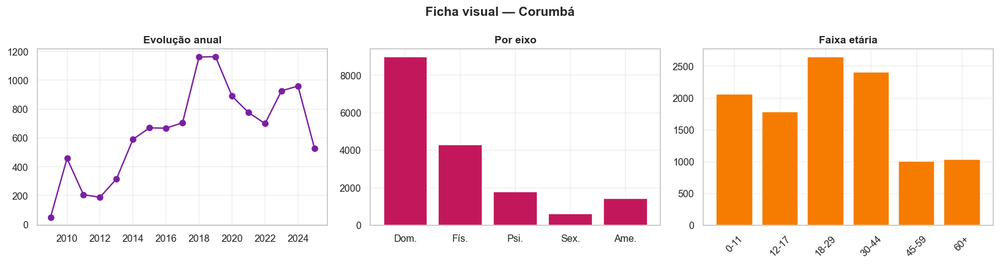

   Fichas visuais geradas: 8
   ✅ Fichas visuais concluídas.


In [87]:
banner("FICHAS VISUAIS DOS MUNICÍPIOS PRIORITÁRIOS")


def ficha_visual_municipio(cod):
    """Gera um painel 1x3 (evolução, eixos, faixa etária) para um município."""
    if plt is None:
        return
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    nome_mun = MUNICIPIOS_MS.get(cod, cod)
    if len(sub) < 5:
        return
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    s_ano = sub.groupby("ANO").size()
    axes[0].plot(s_ano.index, s_ano.values, marker="o", color=COR_PRIMARIA)
    axes[0].set_title("Evolução anual")
    eixos_f = {"Dom.": "FL_VIOL_DOMESTICA", "Fís.": "FL_VIOL_FISIC",
               "Psi.": "FL_VIOL_PSICOLOGICA", "Sex.": "FL_VIOL_SEXUAL",
               "Ame.": "FL_AMEACA"}
    vals = [int(sub[f].sum()) for f in eixos_f.values()]
    axes[1].bar(list(eixos_f.keys()), vals, color=COR_SECUNDARIA)
    axes[1].set_title("Por eixo")
    fe = sub["FAIXA_SIMPLES"].value_counts().sort_index()
    axes[2].bar(fe.index.astype(str), fe.values, color=COR_DESTAQUE)
    axes[2].set_title("Faixa etária"); axes[2].tick_params(axis="x", rotation=45)
    fig.suptitle(f"Ficha visual — {nome_mun}", fontweight="bold")
    fig.tight_layout()
    salvar_grafico(fig, f"38AL_ficha_{cod}", f"Ficha visual — {nome_mun}",
                   exibir=(cod == idx_rank.iloc[0]["COD_MUN"]))


n_fichas = 0
for cod in idx_rank.head(8)["COD_MUN"]:
    ficha_visual_municipio(cod)
    n_fichas += 1
info("Fichas visuais geradas: %d", n_fichas)
sucesso("Fichas visuais concluídas.")

============================================================
## SEÇÃO 38.AM — Visualizações avançadas (área empilhada, treemap, sunburst)
============================================================

Visualizações complementares: **área empilhada** da evolução dos eixos, **treemap** dos
municípios e **sunburst** vínculo → eixo (Plotly, exportados em HTML).


[87] VISUALIZAÇÕES AVANÇADAS


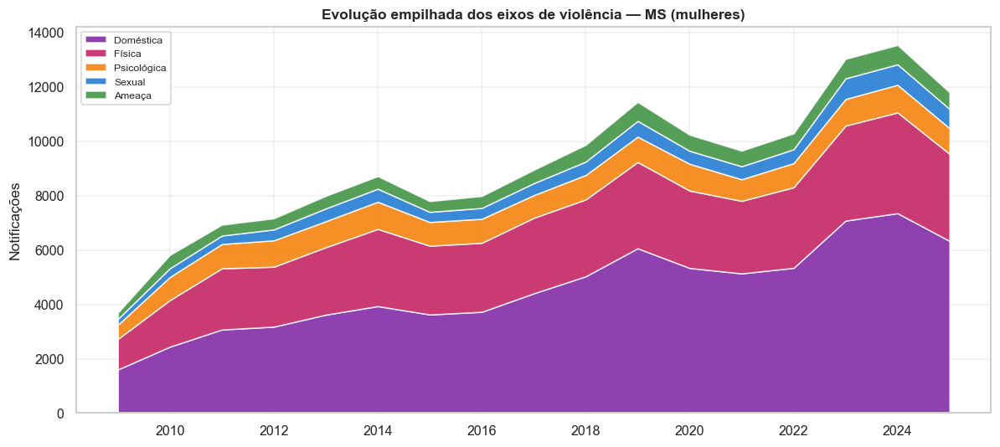

   ✅ Visualizações avançadas concluídas.


In [88]:
banner("VISUALIZAÇÕES AVANÇADAS")

# Área empilhada (Matplotlib) da evolução dos principais eixos
if plt is not None:
    anos_ev = sorted(DF_MULHERES["ANO"].dropna().unique())
    series_eixos = {}
    for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
                      ("FL_VIOL_PSICOLOGICA", "Psicológica"),
                      ("FL_VIOL_SEXUAL", "Sexual"), ("FL_AMEACA", "Ameaça")]:
        s = (DF_MULHERES[DF_MULHERES[flag] == 1].groupby("ANO").size()
             .reindex(anos_ev).fillna(0))
        series_eixos[rot] = s.values
    if anos_ev:
        fig, ax = plt.subplots(figsize=(11, 5))
        ax.stackplot(anos_ev, series_eixos.values(),
                     labels=list(series_eixos.keys()), colors=PALETA_SIPREV[:5],
                     alpha=0.85)
        ax.set_title("Evolução empilhada dos eixos de violência — MS (mulheres)")
        ax.set_ylabel("Notificações"); ax.legend(loc="upper left", fontsize=8)
        fig.tight_layout()
        salvar_grafico(fig, "38AM_area_empilhada", "Área empilhada dos eixos")

# Treemap e sunburst (Plotly)
if CAP.get("plotly") and px is not None:
    try:
        rk_tree = rank_abs.head(20)[["Municipio", "N_Total"]].copy()
        figt = px.treemap(rk_tree, path=["Municipio"], values="N_Total",
                          color="N_Total", color_continuous_scale="Purples",
                          title="Treemap — notificações por município (top 20)")
        salvar_html(figt, "38AM_treemap_municipios", "Treemap de municípios")
    except Exception as exc:
        aviso("Treemap falhou: %s", exc)
    try:
        sun_data = []
        for cat in ["Parceiro(a) íntimo(a)", "Familiar", "Conhecido(a)",
                    "Desconhecido(a)"]:
            sub = DF_MULHERES[DF_MULHERES["CATEGORIA_VINCULO"] == cat]
            for flag, rot in [("FL_VIOL_FISIC", "Física"),
                              ("FL_VIOL_SEXUAL", "Sexual"),
                              ("FL_AMEACA", "Ameaça")]:
                sun_data.append({"Vínculo": cat, "Eixo": rot,
                                 "N": int(sub[flag].sum())})
        df_sun = pd.DataFrame(sun_data)
        if df_sun["N"].sum() > 0:
            figs = px.sunburst(df_sun, path=["Vínculo", "Eixo"], values="N",
                               color="N", color_continuous_scale="Magma",
                               title="Sunburst — vínculo → tipo de violência")
            salvar_html(figs, "38AM_sunburst_vinculo", "Sunburst vínculo→eixo")
    except Exception as exc:
        aviso("Sunburst falhou: %s", exc)
sucesso("Visualizações avançadas concluídas.")

============================================================
## SEÇÃO 38.AN — Stacking e importância por permutação
============================================================

Um **stacking** (empilhamento) combina modelos-base com um meta-modelo; a **importância
por permutação** mede a queda de desempenho ao embaralhar cada atributo — uma medida de
importância independente do modelo.


[88] STACKING E IMPORTÂNCIA POR PERMUTAÇÃO
   🧠 StackingClassifier         [Classificação] accuracy=0.964 | f1_macro=0.964
   Stacking — Acurácia: 0.964 | F1-macro: 0.964

--- Importância por permutação (top 12) ------------------------------


,Atributo,Importância_perm
0,n_total,0.549612
1,pop_feminina,0.334181
2,n_domestica,0.044936
3,n_fisica,0.024474
4,pct_sexual,0.014364
5,ANO,0.008950
6,pct_domestica,0.005458
7,n_reincidencia,0.004916
8,pct_parceiro,0.001455
9,n_ameaca,0.001409


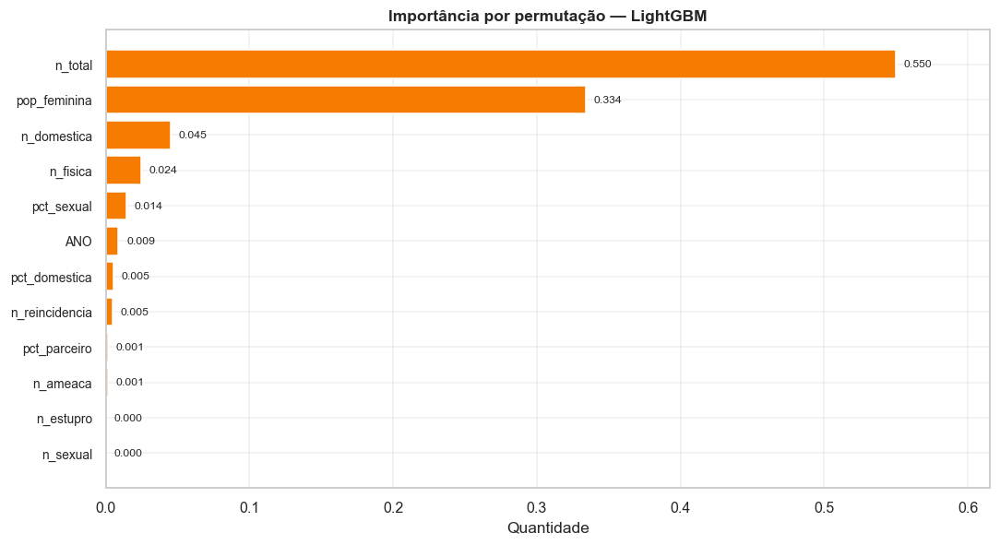

   ✅ Stacking e importância por permutação concluídos.


In [89]:
banner("STACKING E IMPORTÂNCIA POR PERMUTAÇÃO")

if modelagem_viavel and clf_resultados:
    try:
        from sklearn.ensemble import StackingClassifier
        from sklearn.inspection import permutation_importance
        base_est = [
            ("rf", RandomForestClassifier(n_estimators=150, random_state=SEED)),
            ("gb", GradientBoostingClassifier(random_state=SEED)),
        ]
        if CAP.get("lightgbm"):
            base_est.append(("lgbm", lgb.LGBMClassifier(n_estimators=150,
                                                        random_state=SEED, verbose=-1)))
        t0 = time.time()
        stack = StackingClassifier(estimators=base_est,
                                   final_estimator=LogisticRegression(max_iter=2000),
                                   cv=3)
        stack.fit(X_tr, y_tr)
        pred_s = stack.predict(X_te)
        met_s = {"accuracy": accuracy_score(y_te, pred_s),
                 "f1_macro": f1_score(y_te, pred_s, average="macro", zero_division=0)}
        registrar_modelo("StackingClassifier", "ML (ensemble)", "Classificação",
                         met_s, time.time() - t0, obs=f"{len(base_est)} bases + meta")
        info("Stacking — Acurácia: %.3f | F1-macro: %.3f",
             met_s["accuracy"], met_s["f1_macro"])
        # importância por permutação (sobre o melhor modelo de árvore)
        modelo_perm = clf_resultados[melhor_clf]["modelo"]
        Xperm = X_te_s if clf_resultados[melhor_clf]["escala"] else X_te
        perm = permutation_importance(modelo_perm, Xperm, y_te, n_repeats=8,
                                      random_state=SEED, scoring="f1_macro")
        imp_perm = pd.Series(perm.importances_mean,
                             index=FEATURES_ML).sort_values(ascending=False)
        show_df(imp_perm.head(12).rename_axis("Atributo")
                .reset_index(name="Importância_perm"),
                "Importância por permutação (top 12)", max_linhas=12)
        barras_horizontais(imp_perm.head(12),
                           f"Importância por permutação — {melhor_clf}",
                           "38AN_importancia_permutacao", cor=COR_DESTAQUE, fmt="{:.3f}",
                           descricao="Importância por permutação")
        salvar_csv(imp_perm.rename_axis("atributo").reset_index(name="importancia"),
                   "38AN_importancia_permutacao", "Importância por permutação")
    except Exception as exc:
        aviso("Stacking/permutação falhou: %s", exc)
sucesso("Stacking e importância por permutação concluídos.")

============================================================
## SEÇÃO 38.AO — Testes não paramétricos (Kruskal-Wallis)
============================================================

Testes **não paramétricos** (Kruskal-Wallis) comparam a distribuição de **idade** entre
grupos (ex.: por categoria de vínculo, por raça/cor), sem supor normalidade.

In [90]:
banner("TESTES NÃO PARAMÉTRICOS (KRUSKAL-WALLIS)")

if CAP.get("scipy"):
    kw_resultados = []
    for dim, rot in [("CATEGORIA_VINCULO", "Idade por categoria de vínculo"),
                     ("RACA_COR", "Idade por raça/cor"),
                     ("LOCAL_DESC", "Idade por local de ocorrência")]:
        try:
            grupos = [g["IDADE"].dropna().values
                      for _, g in DF_MULHERES.groupby(dim) if g["IDADE"].notna().sum() >= 5]
            grupos = [g for g in grupos if len(g) >= 5]
            if len(grupos) >= 2:
                h, p = stats.kruskal(*grupos)
                kw_resultados.append({"Comparação": rot, "H": round(h, 2),
                                      "p-valor": f"{p:.2e}",
                                      "Significativo": "Sim" if p < 0.05 else "Não",
                                      "n_grupos": len(grupos)})
        except Exception:
            pass
    if kw_resultados:
        df_kw = pd.DataFrame(kw_resultados)
        show_df(df_kw, "Testes de Kruskal-Wallis (idade entre grupos)", max_linhas=8)
        salvar_csv(df_kw, "38AO_kruskal_wallis", "Testes Kruskal-Wallis")
        rel_kw = RelatorioTexto("Testes Não Paramétricos (Kruskal-Wallis)")
        rel_kw.tabela_df(df_kw)
        rel_kw.salvar(DIRS["relatorios"] / "38AO_kruskal_wallis.txt")
sucesso("Testes não paramétricos concluídos.")


[89] TESTES NÃO PARAMÉTRICOS (KRUSKAL-WALLIS)

--- Testes de Kruskal-Wallis (idade entre grupos) --------------------


,Comparação,H,p-valor,Significativo,n_grupos
0,Idade por categoria de vínculo,10475.18,0.00e+00,Sim,5
1,Idade por raça/cor,433.13,2.14e-91,Sim,6
2,Idade por local de ocorrência,1907.01,0.00e+00,Sim,10


   📝 Relatório salvo: 38AO_kruskal_wallis.txt
   ✅ Testes não paramétricos concluídos.


============================================================
## SEÇÃO 38.AP — Combinações de eixos (interseções)
============================================================

Quantifica **interseções** relevantes entre eixos (ex.: doméstica E física; sexual E
parceiro íntimo), evidenciando perfis combinados de maior gravidade.


[90] COMBINAÇÕES DE EIXOS (INTERSEÇÕES)

--- Interseções entre eixos de violência -----------------------------


,Combinação,Notificações,% do total
0,Doméstica + Física,36746,39.95
5,Doméstica + Reincidência,33419,36.34
1,Doméstica + Psicológica,13392,14.56
3,Física + Ameaça,5822,6.33
2,Sexual + Parceiro íntimo,1328,1.44
4,Física + Psicológica + Sexual,880,0.96


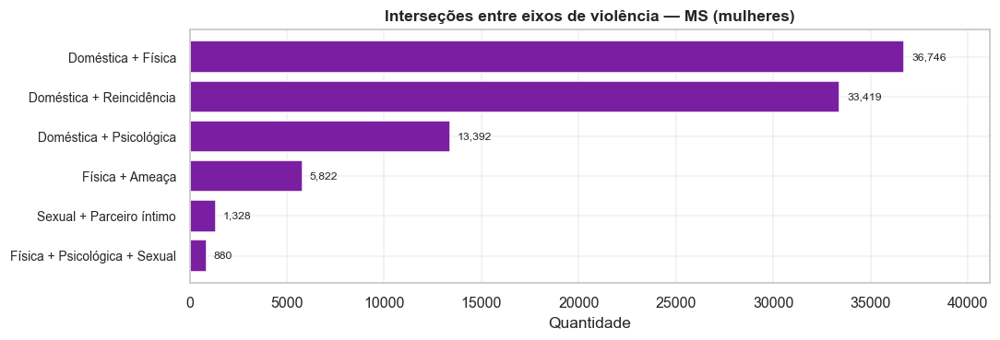

   ✅ Análise de combinações de eixos concluída.


In [91]:
banner("COMBINAÇÕES DE EIXOS (INTERSEÇÕES)")

combos = [
    ("Doméstica + Física", ["FL_VIOL_DOMESTICA", "FL_VIOL_FISIC"]),
    ("Doméstica + Psicológica", ["FL_VIOL_DOMESTICA", "FL_VIOL_PSICOLOGICA"]),
    ("Sexual + Parceiro íntimo", ["FL_VIOL_SEXUAL", "FL_PARCEIRO_INTIMO"]),
    ("Física + Ameaça", ["FL_VIOL_FISIC", "FL_AMEACA"]),
    ("Física + Psicológica + Sexual",
     ["FL_VIOL_FISIC", "FL_VIOL_PSICOLOGICA", "FL_VIOL_SEXUAL"]),
    ("Doméstica + Reincidência", ["FL_VIOL_DOMESTICA", "FL_REINCIDENCIA"]),
]
linhas_combo = []
for rot, flags in combos:
    flags_ok = [f for f in flags if f in DF_MULHERES.columns]
    if len(flags_ok) == len(flags):
        mask = np.ones(len(DF_MULHERES), dtype=bool)
        for f in flags_ok:
            mask &= (DF_MULHERES[f] == 1).values
        n = int(mask.sum())
        linhas_combo.append({"Combinação": rot, "Notificações": n,
                             "% do total": round(100 * n / max(1, len(DF_MULHERES)), 2)})
df_combo = pd.DataFrame(linhas_combo).sort_values("Notificações", ascending=False)
show_df(df_combo, "Interseções entre eixos de violência", max_linhas=10)
salvar_csv(df_combo, "38AP_combinacoes_eixos", "Combinações de eixos")
registrar_planilha("Combinacoes_Eixos", df_combo)
if plt is not None and len(df_combo):
    barras_horizontais(df_combo.set_index("Combinação")["Notificações"],
                       "Interseções entre eixos de violência — MS (mulheres)",
                       "38AP_combinacoes_eixos", cor=COR_PRIMARIA,
                       descricao="Combinações de eixos")
sucesso("Análise de combinações de eixos concluída.")

============================================================
## SEÇÃO 38.AQ — Calibração e precision-recall do classificador
============================================================

Avalia a **qualidade probabilística** do classificador de alto risco: curva de
**calibração** (probabilidades previstas × frequências observadas) e curva
**precision-recall** (útil quando as classes são desbalanceadas).


[91] CALIBRAÇÃO E PRECISION-RECALL


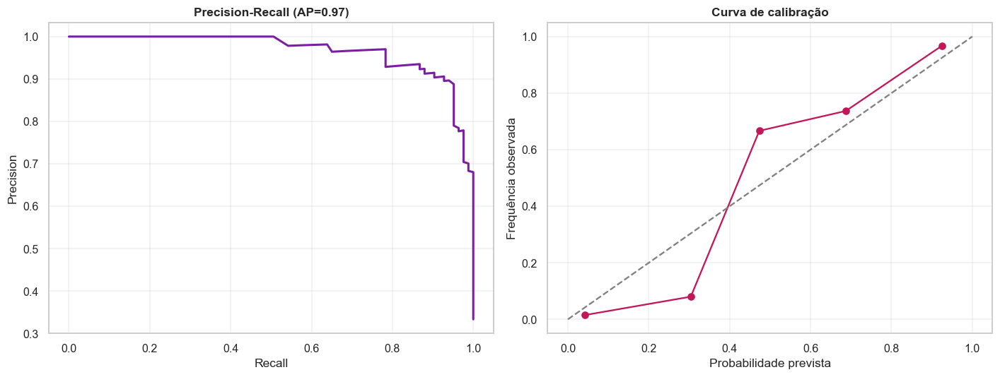

   Average Precision (alto risco): 0.966
   🧠 RandomForest (PR/calibração) [Classificação] average_precision=0.966
   ✅ Calibração e precision-recall concluídos.


In [92]:
banner("CALIBRAÇÃO E PRECISION-RECALL")

if modelagem_viavel and clf_resultados:
    try:
        from sklearn.metrics import precision_recall_curve, average_precision_score
        from sklearn.calibration import calibration_curve
        y_bin2 = (PAINEL["classe_risco"].astype(str) == "Alto").astype(int).values
        Xb2 = StandardScaler().fit_transform(PAINEL[FEATURES_ML].fillna(0).values)
        if len(set(y_bin2)) == 2 and y_bin2.sum() >= 5:
            Xtr2, Xte2, ytr2, yte2 = train_test_split(
                Xb2, y_bin2, test_size=CFG.test_size, random_state=SEED,
                stratify=y_bin2)
            mcal = RandomForestClassifier(n_estimators=250, random_state=SEED, n_jobs=-1)
            mcal.fit(Xtr2, ytr2)
            proba2 = mcal.predict_proba(Xte2)[:, 1]
            # precision-recall
            prec, rec, _ = precision_recall_curve(yte2, proba2)
            ap = average_precision_score(yte2, proba2)
            if plt is not None:
                fig, axes = plt.subplots(1, 2, figsize=(13, 5))
                axes[0].plot(rec, prec, color=COR_PRIMARIA, linewidth=2)
                axes[0].set_title(f"Precision-Recall (AP={ap:.2f})")
                axes[0].set_xlabel("Recall"); axes[0].set_ylabel("Precision")
                try:
                    frac_pos, mean_pred = calibration_curve(yte2, proba2, n_bins=5)
                    axes[1].plot(mean_pred, frac_pos, "o-", color=COR_SECUNDARIA)
                    axes[1].plot([0, 1], [0, 1], "--", color="grey")
                    axes[1].set_title("Curva de calibração")
                    axes[1].set_xlabel("Probabilidade prevista")
                    axes[1].set_ylabel("Frequência observada")
                except Exception:
                    pass
                fig.tight_layout()
                salvar_grafico(fig, "38AQ_calibracao_pr",
                               "Calibração e precision-recall")
            info("Average Precision (alto risco): %.3f", ap)
            registrar_modelo("RandomForest (PR/calibração)", "Validação",
                             "Classificação", {"average_precision": ap})
    except Exception as exc:
        aviso("Calibração/PR falhou: %s", exc)
sucesso("Calibração e precision-recall concluídos.")

============================================================
## SEÇÃO 38.AR — Métricas por classe (relatório detalhado)
============================================================

In [93]:
banner("MÉTRICAS POR CLASSE")

if modelagem_viavel and clf_resultados and melhor_clf:
    try:
        best = clf_resultados[melhor_clf]
        rep = classification_report(y_te, best["pred"],
                                    target_names=[str(c) for c in le_y.classes_],
                                    output_dict=True, zero_division=0)
        linhas_rep = []
        for classe in le_y.classes_:
            d = rep.get(str(classe), {})
            linhas_rep.append({"Classe": classe,
                               "Precision": round(d.get("precision", 0), 3),
                               "Recall": round(d.get("recall", 0), 3),
                               "F1": round(d.get("f1-score", 0), 3),
                               "Suporte": int(d.get("support", 0))})
        df_rep = pd.DataFrame(linhas_rep)
        show_df(df_rep, f"Métricas por classe — {melhor_clf}", max_linhas=6)
        salvar_csv(df_rep, "38AR_metricas_por_classe", "Métricas por classe")
        registrar_planilha("Metricas_Por_Classe", df_rep)
        rel_cls = RelatorioTexto(f"Métricas por Classe — {melhor_clf}")
        rel_cls.tabela_df(df_rep)
        rel_cls.salvar(DIRS["relatorios"] / "38AR_metricas_por_classe.txt")
    except Exception as exc:
        aviso("Métricas por classe falharam: %s", exc)
sucesso("Métricas por classe concluídas.")


[92] MÉTRICAS POR CLASSE

--- Métricas por classe — LightGBM -----------------------------------


,Classe,Precision,Recall,F1,Suporte
0,Alto,0.988,0.988,0.988,83
1,Baixo,0.988,0.952,0.969,83
2,Médio,0.942,0.976,0.959,83


   📝 Relatório salvo: 38AR_metricas_por_classe.txt
   ✅ Métricas por classe concluídas.


============================================================
## SEÇÃO 38.AS — Intervalos de confiança das taxas (bootstrap, multi-eixo)
============================================================

In [94]:
banner("INTERVALOS DE CONFIANÇA DAS TAXAS (BOOTSTRAP)")

ic_taxa = []
for cod in rank_abs.head(15)["COD_MUN"]:
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    if len(sub) < 8:
        continue
    nome_mun = MUNICIPIOS_MS.get(cod, cod)
    linha = {"Municipio": nome_mun, "n": len(sub)}
    for flag, rot in [("FL_VIOL_DOMESTICA", "Dom."), ("FL_VIOL_SEXUAL", "Sex."),
                      ("FL_AMEACA", "Ame.")]:
        li, ls = bootstrap_ic(sub[flag].values)
        linha[f"%_{rot}"] = round(100 * sub[flag].mean(), 1)
        linha[f"IC_{rot}"] = (f"[{li*100:.0f}; {ls*100:.0f}]"
                              if not np.isnan(li) else "-")
    ic_taxa.append(linha)
if ic_taxa:
    df_ic_taxa = pd.DataFrame(ic_taxa)
    show_df(df_ic_taxa, "Proporções com IC 95% (bootstrap) por município", max_linhas=15)
    salvar_csv(df_ic_taxa, "38AS_ic_taxas", "Intervalos de confiança das proporções")
    registrar_planilha("IC_Taxas", df_ic_taxa)
sucesso("Intervalos de confiança (multi-eixo) concluídos.")


[93] INTERVALOS DE CONFIANÇA DAS TAXAS (BOOTSTRAP)

--- Proporções com IC 95% (bootstrap) por município ------------------


,Municipio,n,%_Dom.,IC_Dom.,%_Sex.,IC_Sex.,%_Ame.,IC_Ame.
0,Campo Grande,44815,86.0,[86; 86],7.7,[7; 8],7.3,[7; 8]
1,Corumbá,10960,81.9,[81; 83],5.7,[5; 6],13.1,[12; 14]
2,Dourados,4313,72.8,[72; 74],27.5,[26; 29],11.5,[11; 12]
3,Três Lagoas,3210,87.0,[86; 88],6.3,[5; 7],3.2,[3; 4]
4,Nova Andradina,2289,84.4,[83; 86],5.2,[4; 6],14.5,[13; 16]
5,Ponta Porã,1843,81.7,[80; 84],15.9,[14; 18],17.9,[16; 20]
6,Amambai,1788,86.8,[85; 88],9.3,[8; 11],12.9,[11; 14]
7,São Gabriel do Oeste,1640,83.4,[82; 85],4.7,[4; 6],14.3,[13; 16]
8,Aquidauana,1585,81.0,[79; 83],16.8,[15; 19],8.4,[7; 10]
9,Jardim,1197,83.5,[81; 86],6.3,[5; 8],14.8,[13; 17]


   ✅ Intervalos de confiança (multi-eixo) concluídos.


============================================================
## SEÇÃO 38.AT — Radar comparativo de perfis municipais
============================================================


[94] RADAR COMPARATIVO DE PERFIS MUNICIPAIS


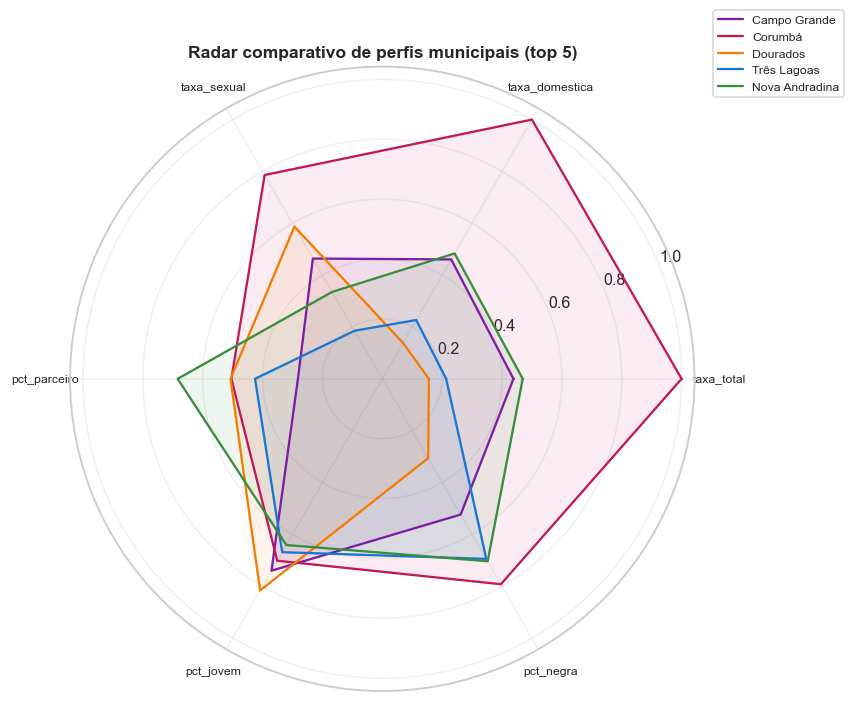

   ✅ Radar comparativo concluído.


In [95]:
banner("RADAR COMPARATIVO DE PERFIS MUNICIPAIS")

if plt is not None:
    dims_radar = ["taxa_total", "taxa_domestica", "taxa_sexual",
                  "pct_parceiro", "pct_jovem", "pct_negra"]
    dims_radar = [d for d in dims_radar if d in PAINEL.columns]
    perfil_radar = PAINEL.groupby("COD_MUN")[dims_radar].mean()
    perfil_radar["n"] = PAINEL.groupby("COD_MUN")["n_total"].sum()
    top_radar = perfil_radar.sort_values("n", ascending=False).head(5)
    if len(top_radar) >= 2 and len(dims_radar) >= 3:
        # normaliza cada dimensão 0-1
        norm = top_radar[dims_radar].copy()
        for c in dims_radar:
            mx = perfil_radar[c].max() or 1
            norm[c] = top_radar[c] / mx
        ang = np.linspace(0, 2 * np.pi, len(dims_radar), endpoint=False).tolist()
        ang += ang[:1]
        fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
        for i, (cod, row) in enumerate(norm.iterrows()):
            vals = row[dims_radar].tolist() + [row[dims_radar].tolist()[0]]
            nome_mun = MUNICIPIOS_MS.get(cod, cod)
            ax.plot(ang, vals, label=nome_mun,
                    color=PALETA_SIPREV[i % len(PALETA_SIPREV)])
            ax.fill(ang, vals, alpha=0.08,
                    color=PALETA_SIPREV[i % len(PALETA_SIPREV)])
        ax.set_xticks(ang[:-1]); ax.set_xticklabels(dims_radar, fontsize=8)
        ax.set_title("Radar comparativo de perfis municipais (top 5)")
        ax.legend(loc="upper right", bbox_to_anchor=(1.25, 1.1), fontsize=8)
        fig.tight_layout()
        salvar_grafico(fig, "38AT_radar_municipios", "Radar de perfis municipais")
sucesso("Radar comparativo concluído.")

============================================================
## SEÇÃO 38.AU — Dashboards por eixo (loop Plotly)
============================================================

In [96]:
banner("DASHBOARDS POR EIXO (PLOTLY)")

if CAP.get("plotly") and px is not None:
    eixos_dash = [("FL_VIOL_DOMESTICA", "Doméstica", "38AU_dash_domestica"),
                  ("FL_ESTUPRO", "Estupro", "38AU_dash_estupro"),
                  ("FL_AMEACA", "Ameaça", "38AU_dash_ameaca"),
                  ("FL_LESAO_CORPORAL", "Lesão corporal", "38AU_dash_lesao")]
    for flag, rot, nome in eixos_dash:
        try:
            rk = ranking_municipal(flag=flag, base=DF_MULHERES).head(12)
            if not len(rk):
                continue
            figd = px.bar(rk, x="N", y="Municipio", orientation="h", color="N",
                          color_continuous_scale="Purples",
                          title=f"{rot} — top 12 municípios (MS)")
            figd.update_layout(height=520, yaxis={"categoryorder": "total ascending"})
            salvar_html(figd, nome, f"Dashboard — {rot}")
        except Exception as exc:
            aviso("Dashboard %s falhou: %s", rot, exc)
sucesso("Dashboards por eixo concluídos.")


[95] DASHBOARDS POR EIXO (PLOTLY)
   ✅ Dashboards por eixo concluídos.


============================================================
## SEÇÃO 38.AV — Evolução percentual por eixo (tabela)
============================================================

In [97]:
banner("EVOLUÇÃO PERCENTUAL POR EIXO")

anos_ev2 = sorted(DF_MULHERES["ANO"].dropna().unique())
if len(anos_ev2) >= 2:
    a0, a1 = int(anos_ev2[0]), int(anos_ev2[-1])
    evol_eixo = []
    for rot, flag in EIXOS_LONG.items():
        if flag not in DF_MULHERES.columns:
            continue
        n0 = int(DF_MULHERES[(DF_MULHERES["ANO"] == a0)][flag].sum())
        n1 = int(DF_MULHERES[(DF_MULHERES["ANO"] == a1)][flag].sum())
        evol_eixo.append({"Eixo": rot, f"{a0}": n0, f"{a1}": n1,
                          "Variação_%": round((n1 - n0) / max(1, n0) * 100, 1)})
    if evol_eixo:
        df_evol_eixo = pd.DataFrame(evol_eixo).sort_values("Variação_%", ascending=False)
        show_df(df_evol_eixo, f"Evolução por eixo ({a0} → {a1})", max_linhas=10)
        salvar_csv(df_evol_eixo, "38AV_evolucao_eixo", "Evolução percentual por eixo")
        registrar_planilha("Evolucao_Eixo", df_evol_eixo)
sucesso("Evolução percentual por eixo concluída.")


[96] EVOLUÇÃO PERCENTUAL POR EIXO

--- Evolução por eixo (2009 → 2025) ----------------------------------


,Eixo,2009,2025,Variação_%
5,Estupro,95,569,498.9
0,Total,1907,7613,299.2
1,Doméstica,1602,6335,295.4
4,Sexual,211,708,235.5
2,Física,1125,3204,184.8
6,Ameaça,233,613,163.1
3,Psicológica,524,944,80.2
7,Feminicídio,3,0,-100.0


   ✅ Evolução percentual por eixo concluída.


============================================================
## SEÇÃO 38.AW — Relatórios temáticos por município prioritário
============================================================

In [98]:
banner("RELATÓRIOS TEMÁTICOS POR MUNICÍPIO PRIORITÁRIO")

n_rel_mun = 0
for cod in idx_rank.head(6)["COD_MUN"]:
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    nome_mun = MUNICIPIOS_MS.get(cod, cod)
    if len(sub) < 5:
        continue
    relm = RelatorioTexto(f"Relatório Municipal — {nome_mun}")
    relm.kv({
        "Notificações (mulheres)": formato_numero(len(sub)),
        "Taxa/100k (acum.)": (round(len(sub) / POP_FEM_MUN_MS.get(cod, 1) * 100_000, 1)),
        "Doméstica": int(sub["FL_VIOL_DOMESTICA"].sum()),
        "Sexual": int(sub["FL_VIOL_SEXUAL"].sum()),
        "Estupro": int(sub["FL_ESTUPRO"].sum()),
        "Ameaça": int(sub["FL_AMEACA"].sum()),
        "Feminicídio (proxy)": int(sub["FL_FEMINICIDIO"].sum()),
        "Faixa etária predom.": _moda_segura(sub["FAIXA_ETARIA"]),
        "Vínculo predom.": _moda_segura(sub["VINCULO_AUTOR"]),
    }, titulo="Indicadores")
    relm.secao("Notificações por ano")
    relm.tabela_df(sub.groupby("ANO").size().rename_axis("Ano")
                   .reset_index(name="Notificacoes"))
    relm.salvar(DIRS["relatorios"] / f"38AW_municipio_{cod}.txt", tambem_log=False)
    n_rel_mun += 1
info("Relatórios municipais gerados: %d", n_rel_mun)
sucesso("Relatórios temáticos por município concluídos.")


[97] RELATÓRIOS TEMÁTICOS POR MUNICÍPIO PRIORITÁRIO
   📝 Relatório salvo: 38AW_municipio_500320.txt
   📝 Relatório salvo: 38AW_municipio_500090.txt
   📝 Relatório salvo: 38AW_municipio_500769.txt
   📝 Relatório salvo: 38AW_municipio_500600.txt
   📝 Relatório salvo: 38AW_municipio_500500.txt
   📝 Relatório salvo: 38AW_municipio_500260.txt
   Relatórios municipais gerados: 6
   ✅ Relatórios temáticos por município concluídos.


============================================================
## SEÇÃO 38.BU — Autoverificação de entregáveis (runtime)
============================================================

Verifica, em tempo de execução, se os principais **formatos de saída** exigidos foram
efetivamente produzidos (PNG, HTML, TXT, LOG, CSV, XLSX, JSON, PDF, Parquet). Exporta um
**checklist** que serve de evidência de conformidade.

In [99]:
banner("AUTOVERIFICAÇÃO DE ENTREGÁVEIS")

_tipos_por_alvo = {
    "Gráficos (.png)": "grafico_png",
    "Mapas (.html)": "mapa_html",
    "Dashboards/HTML (.html)": "html",
    "Relatórios (.txt)": "relatorio_txt",
    "Relatórios (.log)": "relatorio_log",
    "Tabelas (.csv)": "tabela_csv",
    "Tabelas (.xlsx)": "tabela_xlsx",
    "JSON (.json)": "json",
    "Parquet (.parquet)": "parquet",
    "PDF (.pdf)": "relatorio_pdf",
}
_reg_df = resumo_registro()
_contagens = (_reg_df["tipo"].value_counts().to_dict()
              if len(_reg_df) else {})
check_linhas = []
for rotulo, tipo in _tipos_por_alvo.items():
    q = int(_contagens.get(tipo, 0))
    check_linhas.append({"Entregável": rotulo, "Qtde": q,
                         "Status": "✔ OK" if q > 0 else "— pendente"})
df_check = pd.DataFrame(check_linhas)
show_df(df_check, "Checklist de entregáveis (até este ponto)", max_linhas=15)
salvar_csv(df_check, "38BU_checklist_entregaveis", "Checklist de entregáveis")
registrar_planilha("Checklist_Entregaveis", df_check)
rel_check = RelatorioTexto("Checklist de Entregáveis (autoverificação)")
rel_check.texto("Evidência de que os formatos de saída exigidos foram produzidos.")
rel_check.tabela_df(df_check)
rel_check.texto("\nObservação: a verificação ocorre antes da geração de dashboards/PDF/ZIP;"
                " os totais finais constam do MANIFESTO ao término da execução.")
rel_check.salvar(DIRS["relatorios"] / "38BU_checklist_entregaveis.txt")
_ok = int((df_check["Qtde"] > 0).sum())
info("Formatos de saída já produzidos: %d de %d", _ok, len(df_check))
sucesso("Autoverificação de entregáveis concluída.")


[98] AUTOVERIFICAÇÃO DE ENTREGÁVEIS

--- Checklist de entregáveis (até este ponto) ------------------------


,Entregável,Qtde,Status
0,Gráficos (.png),153,✔ OK
1,Mapas (.html),1,✔ OK
2,Dashboards/HTML (.html),9,✔ OK
3,Relatórios (.txt),52,✔ OK
4,Relatórios (.log),29,✔ OK
5,Tabelas (.csv),120,✔ OK
6,Tabelas (.xlsx),6,✔ OK
7,JSON (.json),5,✔ OK
8,Parquet (.parquet),3,✔ OK
9,PDF (.pdf),0,— pendente


   📝 Relatório salvo: 38BU_checklist_entregaveis.txt
   Formatos de saída já produzidos: 9 de 10
   ✅ Autoverificação de entregáveis concluída.


============================================================
## SEÇÃO 38.BP — Trimestre × ano (mapa de calor)
============================================================


[99] TRIMESTRE × ANO (MAPA DE CALOR)


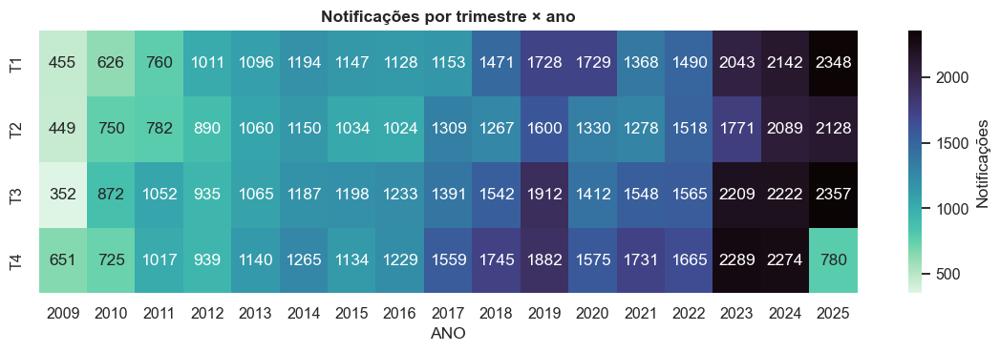

   ✅ Mapa trimestre × ano concluído.


In [100]:
banner("TRIMESTRE × ANO (MAPA DE CALOR)")

piv_tri_ano = (DF_MULHERES.dropna(subset=["ANO", "TRIMESTRE"])
               .pivot_table(index="TRIMESTRE", columns="ANO", values="FL_FEMININO",
                            aggfunc="sum", fill_value=0))
if len(piv_tri_ano):
    piv_tri_ano.index = [f"T{int(t)}" for t in piv_tri_ano.index]
    heatmap_cruzado(piv_tri_ano, "Notificações por trimestre × ano",
                    "38BP_trimestre_ano", cmap="mako_r")
sucesso("Mapa trimestre × ano concluído.")

============================================================
## SEÇÃO 38.BQ — Índice de sazonalidade por eixo
============================================================

Calcula um **índice de sazonalidade** mensal por eixo (razão entre o mês e a média
mensal), evidenciando meses de maior intensidade para cada tipo de violência.

In [101]:
banner("ÍNDICE DE SAZONALIDADE POR EIXO")

saz_linhas = []
for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
                  ("FL_VIOL_SEXUAL", "Sexual"), ("FL_AMEACA", "Ameaça")]:
    if flag not in DF_MULHERES.columns:
        continue
    sub = DF_MULHERES[DF_MULHERES[flag] == 1]
    s = sub.groupby("MES").size().reindex(range(1, 13)).fillna(0)
    media = s.mean() or 1
    idx_saz = (s / media).round(2)
    linha = {"Eixo": rot}
    for m in range(1, 13):
        linha[MESES_NOME[m]] = idx_saz.get(m, 0)
    linha["Mês de pico"] = MESES_NOME[int(idx_saz.idxmax())] if len(idx_saz) else "-"
    saz_linhas.append(linha)
if saz_linhas:
    df_saz = pd.DataFrame(saz_linhas)
    show_df(df_saz, "Índice de sazonalidade por eixo (1,0 = média)", max_linhas=8)
    salvar_csv(df_saz, "38BQ_sazonalidade_indice", "Índice de sazonalidade por eixo")
    registrar_planilha("Sazonalidade_Indice", df_saz)
sucesso("Índice de sazonalidade concluído.")


[100] ÍNDICE DE SAZONALIDADE POR EIXO

--- Índice de sazonalidade por eixo (1,0 = média) --------------------


,Eixo,Jan,Fev,Mar,Abr,Mai,Jun,Jul,Ago,Set,Out,Nov,Dez,Mês de pico
0,Doméstica,0.98,0.95,1.05,0.94,0.93,0.92,0.95,1.08,1.13,1.10,1.00,0.98,Set
1,Física,1.00,0.95,1.06,0.95,0.89,0.88,0.91,1.03,1.12,1.13,1.05,1.04,Out
2,Sexual,0.96,0.96,1.06,0.99,0.95,0.93,0.97,1.10,1.09,1.14,0.98,0.86,Out
3,Ameaça,1.02,0.88,1.03,0.93,0.91,0.88,1.05,1.16,1.14,1.11,0.97,0.93,Ago


   ✅ Índice de sazonalidade concluído.


============================================================
## SEÇÃO 38.BR — Top municípios por eixo (tabela larga)
============================================================

In [102]:
banner("TOP MUNICÍPIOS POR EIXO")

top_por_eixo = {}
for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_SEXUAL", "Sexual"),
                  ("FL_ESTUPRO", "Estupro"), ("FL_AMEACA", "Ameaça"),
                  ("FL_FEMINICIDIO", "Feminicídio")]:
    rk = ranking_municipal(flag=flag, base=DF_MULHERES).head(5)
    if len(rk):
        top_por_eixo[rot] = [f"{r['Municipio']} ({int(r['N'])})"
                             for _, r in rk.iterrows()]
if top_por_eixo:
    maxlen = max(len(v) for v in top_por_eixo.values())
    for k in top_por_eixo:
        top_por_eixo[k] += [""] * (maxlen - len(top_por_eixo[k]))
    df_top_eixo = pd.DataFrame(top_por_eixo)
    df_top_eixo.index = [f"{i+1}º" for i in range(len(df_top_eixo))]
    show_df(df_top_eixo.reset_index().rename(columns={"index": "Posição"}),
            "Top 5 municípios por eixo", max_linhas=6)
    salvar_csv(df_top_eixo.reset_index(), "38BR_top_municipios_eixo",
               "Top municípios por eixo")
    registrar_planilha("Top_Municipios_Eixo", df_top_eixo.reset_index())
sucesso("Top municípios por eixo concluído.")


[101] TOP MUNICÍPIOS POR EIXO

--- Top 5 municípios por eixo ----------------------------------------


,Posição,Doméstica,Sexual,Estupro,Ameaça,Feminicídio
0,1º,Campo Grande (38548),Campo Grande (3451),Campo Grande (2501),Campo Grande (3266),Campo Grande (29)
1,2º,Corumbá (8972),Dourados (1184),Dourados (954),Corumbá (1439),Três Lagoas (16)
2,3º,Dourados (3142),Corumbá (627),Corumbá (488),Dourados (495),Corumbá (10)
3,4º,Três Lagoas (2793),Ponta Porã (293),Ponta Porã (181),Nova Andradina (331),Tacuru (5)
4,5º,Nova Andradina (1931),Aquidauana (267),Aquidauana (180),Ponta Porã (330),Caarapó (3)


   ✅ Top municípios por eixo concluído.


============================================================
## SEÇÃO 38.BS — Distribuição de gravidade (tipos simultâneos)
============================================================

In [103]:
banner("DISTRIBUIÇÃO DE GRAVIDADE (TIPOS SIMULTÂNEOS)")

grav_mun = (DF_MULHERES.groupby("COD_MUN")
            .agg(n=("FL_FEMININO", "sum"),
                 media_tipos=("N_TIPOS_VIOLENCIA", "mean"),
                 pct_multipla=("VIOLENCIA_MULTIPLA", "mean")).reset_index())
grav_mun["Municipio"] = grav_mun["COD_MUN"].map(MUNICIPIOS_MS)
grav_mun = grav_mun.dropna(subset=["Municipio"])
grav_mun = grav_mun[grav_mun["n"] >= 10].copy()
grav_mun["media_tipos"] = grav_mun["media_tipos"].round(2)
grav_mun["pct_multipla"] = (grav_mun["pct_multipla"] * 100).round(1)
grav_mun = grav_mun.sort_values("pct_multipla", ascending=False)
if len(grav_mun):
    show_df(grav_mun.head(15)[["Municipio", "n", "media_tipos", "pct_multipla"]],
            "Gravidade (violência múltipla) por município", max_linhas=15)
    salvar_csv(grav_mun, "38BS_gravidade_municipio", "Gravidade por município")
    registrar_planilha("Gravidade_Municipio", grav_mun)
info("Média estadual de tipos simultâneos: %.2f",
     DF_MULHERES["N_TIPOS_VIOLENCIA"].mean())
sucesso("Distribuição de gravidade concluída.")


[102] DISTRIBUIÇÃO DE GRAVIDADE (TIPOS SIMULTÂNEOS)

--- Gravidade (violência múltipla) por município ---------------------


,Municipio,n,media_tipos,pct_multipla
18,Camapuã,28,1.82,71.4
66,Rochedo,38,1.92,63.2
59,Pedro Gomes,258,1.72,62.0
20,Caracol,25,1.60,56.0
70,Selvíria,56,1.55,51.8
13,Bela Vista,62,1.77,50.0
34,Figueirão,20,1.50,50.0
45,Juti,103,1.54,47.6
49,Miranda,152,1.44,46.1
53,Nova Alvorada do Sul,95,1.49,45.3


   Média estadual de tipos simultâneos: 1.18
   ✅ Distribuição de gravidade concluída.


============================================================
## SEÇÃO 38.BT — Exportação consolidada de indicadores (JSON mestre)
============================================================

Reúne os principais agregados em um **JSON mestre** único, conveniente para integrações
(BI, APIs internas) e para arquivamento da execução.

In [104]:
banner("EXPORTAÇÃO CONSOLIDADA (JSON MESTRE)")

# Indicadores básicos construídos localmente (INDICADORES completos são montados na Seção 40)
_ind_basicos = {
    "total_notificacoes_mulheres": int(len(DF_MULHERES)),
    "total_violencia_domestica": int(DF_MULHERES["FL_VIOL_DOMESTICA"].sum()),
    "total_violencia_sexual": int(DF_MULHERES["FL_VIOL_SEXUAL"].sum()),
    "total_estupro": int(DF_MULHERES["FL_ESTUPRO"].sum()),
    "total_feminicidio_proxy": int(DF_MULHERES["FL_FEMINICIDIO"].sum()),
    "municipios_alto_risco": int((df_painel["Classe_risco"] == "Alto").sum()),
}
json_mestre = {
    "meta": {
        "projeto": CFG.projeto, "versao": CFG.versao,
        "gerado_em": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "origem_dados": ORIGEM_DADOS, "periodo": f"{CFG.ano_inicial}-{CFG.ano_final}",
        "uf": CFG.uf_alvo_nome,
    },
    "indicadores": _ind_basicos,
    "qualidade": {k: (v if isinstance(v, (int, float, str)) else str(v))
                  for k, v in qualidade.items()},
    "ranking_taxa_top10": rank_taxa.head(10)[["Municipio", "N_Total",
                                              "Taxa_Total"]].to_dict("records")
    if len(rank_taxa) else [],
    "indice_alerta_top10": idx_rank.head(10)[["Municipio", "Idx_alerta",
                                              "Prioridade"]].astype(str).to_dict("records"),
    "modelos": MODELOS,
    "totais_por_eixo": {rot: int(DF_MULHERES[flag].sum())
                        for rot, flag in EIXOS_LONG.items()
                        if flag in DF_MULHERES.columns},
}
salvar_json(json_mestre, "38BT_consolidado_mestre", "JSON mestre consolidado")
info("JSON mestre consolidado exportado (%d indicadores básicos).", len(_ind_basicos))
sucesso("Exportação consolidada (JSON mestre) concluída.")


[103] EXPORTAÇÃO CONSOLIDADA (JSON MESTRE)
   JSON mestre consolidado exportado (6 indicadores básicos).
   ✅ Exportação consolidada (JSON mestre) concluída.


============================================================
## SEÇÃO 38.BK — Análise por porte populacional do município
============================================================

Agrupa os municípios em **portes** (grande, médio, pequeno) pela população feminina e
compara as **taxas** por porte — verifica se municípios menores têm risco proporcional
distinto dos grandes centros.


[104] ANÁLISE POR PORTE POPULACIONAL

--- Indicadores por porte populacional -------------------------------


,Porte,municipios,notif_total,pop_feminina,taxa_100k
0,Pequeno (<15k hab.),42,5308,184944,2870.1
1,Médio (15–50k),31,20537,441619,4650.4
2,Grande (>50k),6,66125,761322,8685.5


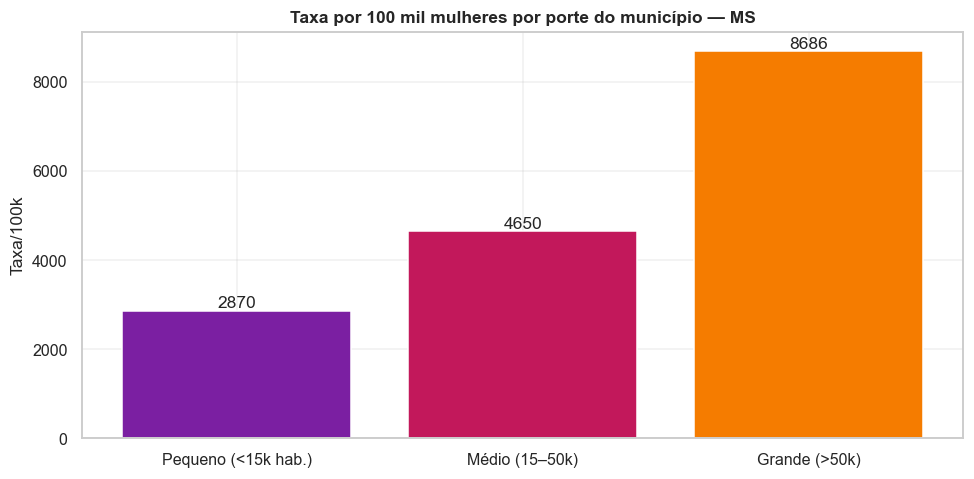

   ✅ Análise por porte populacional concluída.


In [105]:
banner("ANÁLISE POR PORTE POPULACIONAL")

dp = df_painel.copy()
dp["Porte"] = pd.cut(dp["Pop_feminina"],
                     bins=[-1, 7500, 25000, 10_000_000],
                     labels=["Pequeno (<15k hab.)", "Médio (15–50k)", "Grande (>50k)"])
porte = (dp.groupby("Porte")
         .agg(municipios=("Municipio", "count"),
              notif_total=("N_Total", "sum"),
              pop_feminina=("Pop_feminina", "sum")).reset_index())
porte["taxa_100k"] = (porte["notif_total"] / porte["pop_feminina"] * 100_000).round(1)
show_df(porte, "Indicadores por porte populacional", max_linhas=6)
salvar_csv(porte, "38BK_porte_populacional", "Análise por porte populacional")
registrar_planilha("Porte_Populacional", porte)
if plt is not None and len(porte):
    fig, ax = plt.subplots(figsize=(9, 4.5))
    ax.bar(porte["Porte"].astype(str), porte["taxa_100k"], color=PALETA_SIPREV[:3])
    ax.set_title("Taxa por 100 mil mulheres por porte do município — MS")
    ax.set_ylabel("Taxa/100k")
    for i, v in enumerate(porte["taxa_100k"]):
        ax.text(i, v, f"{v:.0f}", ha="center", va="bottom")
    fig.tight_layout()
    salvar_grafico(fig, "38BK_porte_populacional", "Taxa por porte")
sucesso("Análise por porte populacional concluída.")

============================================================
## SEÇÃO 38.BL — Scorecard de completude por município
============================================================

Avalia a **qualidade do preenchimento** de campos-chave em cada município, sinalizando
onde a notificação precisa melhorar (subsídio para capacitação das equipes locais).

In [106]:
banner("SCORECARD DE COMPLETUDE POR MUNICÍPIO")

campos_sc = {"CS_RACA": "Raça/cor", "CS_ESCOL_N": "Escolaridade",
             "NU_IDADE_N": "Idade", "LOCAL_OCOR": "Local", "AUTOR_SEXO": "Autor"}
sc_linhas = []
base_sc = df[df["FL_FEMININO"] == 1]
for cod, sub in base_sc.groupby("COD_MUN"):
    nome_mun = MUNICIPIOS_MS.get(cod)
    if not nome_mun or len(sub) < 10:
        continue
    linha = {"Municipio": nome_mun, "n": len(sub)}
    compls = []
    for col, rot in campos_sc.items():
        if col in sub.columns:
            c = 100 * (sub[col].notna()
                       & (sub[col].astype(str).str.strip() != "")).mean()
            linha[rot] = round(c, 1); compls.append(c)
    linha["Score_medio"] = round(np.mean(compls), 1) if compls else 0
    sc_linhas.append(linha)
if sc_linhas:
    df_sc = pd.DataFrame(sc_linhas).sort_values("Score_medio")
    show_df(df_sc.head(15), "Municípios com menor completude (atenção)", max_linhas=15)
    salvar_csv(df_sc, "38BL_scorecard_completude", "Scorecard de completude municipal")
    registrar_planilha("Scorecard_Completude", df_sc)
sucesso("Scorecard de completude concluído.")


[105] SCORECARD DE COMPLETUDE POR MUNICÍPIO

--- Municípios com menor completude (atenção) ------------------------


,Municipio,n,Raça/cor,Escolaridade,Idade,Local,Autor,Score_medio
4,Anaurilândia,23,100.0,87.0,91.3,47.8,47.8,74.8
61,Rio Brilhante,181,68.0,13.3,100.0,100.0,96.1,75.5
29,Dois Irmãos do Buriti,73,100.0,98.6,100.0,69.9,69.9,87.7
72,Taquarussu,101,97.0,44.6,100.0,100.0,99.0,88.1
11,Bataguassu,31,96.8,71.0,100.0,96.8,83.9,89.7
23,Corguinho,15,100.0,93.3,100.0,86.7,80.0,92.0
9,Aral Moreira,112,99.1,63.4,100.0,100.0,97.3,92.0
12,Batayporã,172,99.4,69.8,99.4,99.4,97.7,93.1
33,Figueirão,20,100.0,85.0,95.0,95.0,95.0,94.0
28,Deodápolis,123,100.0,88.6,100.0,96.7,94.3,95.9


   ✅ Scorecard de completude concluído.


============================================================
## SEÇÃO 38.BM — Risco relativo por raça/cor
============================================================

Estima, de forma descritiva, a **razão de proporções** (aproximação de risco relativo)
entre mulheres **pretas/pardas** e **brancas** para alguns eixos, dentro do conjunto
notificado. (Medida descritiva; não estabelece causalidade.)

In [107]:
banner("RISCO RELATIVO POR RAÇA/COR (DESCRITIVO)")

negras = DF_MULHERES[DF_MULHERES["RACA_COR"].isin(["Preta", "Parda"])]
brancas = DF_MULHERES[DF_MULHERES["RACA_COR"] == "Branca"]
rr_linhas = []
if len(negras) >= 20 and len(brancas) >= 20:
    for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"),
                      ("FL_VIOL_SEXUAL", "Sexual"), ("FL_ESTUPRO", "Estupro"),
                      ("FL_AMEACA", "Ameaça"), ("FL_FEMINICIDIO", "Feminicídio")]:
        if flag not in DF_MULHERES.columns:
            continue
        p_neg = negras[flag].mean()
        p_bra = brancas[flag].mean()
        if p_bra > 0:
            rr_linhas.append({"Eixo": rot,
                              "% pretas/pardas": round(100 * p_neg, 2),
                              "% brancas": round(100 * p_bra, 2),
                              "razão": round(p_neg / p_bra, 2)})
if rr_linhas:
    df_rr = pd.DataFrame(rr_linhas)
    show_df(df_rr, "Razão de proporções pretas-pardas / brancas por eixo", max_linhas=8)
    salvar_csv(df_rr, "38BM_risco_relativo_raca", "Risco relativo por raça/cor")
    registrar_planilha("Risco_Relativo_Raca", df_rr)
else:
    aviso("Amostra insuficiente para razão por raça/cor.")
sucesso("Análise de risco relativo por raça/cor concluída.")


[106] RISCO RELATIVO POR RAÇA/COR (DESCRITIVO)

--- Razão de proporções pretas-pardas / brancas por eixo -------------


,Eixo,% pretas/pardas,% brancas,razão
0,Doméstica,83.80,85.73,0.98
1,Sexual,8.61,8.29,1.04
2,Estupro,6.42,5.96,1.08
3,Ameaça,10.23,9.34,1.09
4,Feminicídio,0.08,0.07,1.02


   ✅ Análise de risco relativo por raça/cor concluída.


============================================================
## SEÇÃO 38.BN — Capilaridade: notificações por unidade
============================================================

In [108]:
banner("CAPILARIDADE: NOTIFICAÇÕES POR UNIDADE")

if "ID_UNIDADE" in DF_MULHERES.columns and DF_MULHERES["ID_UNIDADE"].notna().any():
    unid = DF_MULHERES["ID_UNIDADE"].value_counts()
    info("Unidades notificadoras distintas (MS): %s", formato_numero(int(unid.size)))
    info("Unidades responsáveis por 80%% das notificações: %d",
         int((unid.cumsum() / unid.sum() <= 0.8).sum()) + 1)
    top_unid = unid.head(15).rename_axis("Unidade").reset_index(name="Notificações")
    show_df(top_unid, "Top 15 unidades notificadoras (códigos)", max_linhas=15)
    salvar_csv(top_unid, "38BN_unidades_top", "Top unidades notificadoras")
else:
    aviso("Campo ID_UNIDADE indisponível nesta amostra.")
sucesso("Análise de capilaridade concluída.")


[107] CAPILARIDADE: NOTIFICAÇÕES POR UNIDADE
   Unidades notificadoras distintas (MS): 786
   Unidades responsáveis por 80% das notificações: 65

--- Top 15 unidades notificadoras (códigos) --------------------------


,Unidade,Notificações
0,0010081,5167
1,2558815,4542
2,0010049,4347
3,7949553,3606
4,0010103,3053
5,0010243,2912
6,2676818,2786
7,0010057,2766
8,0010073,2597
9,0010111,2591


   ✅ Análise de capilaridade concluída.


============================================================
## SEÇÃO 38.BO — Tríades faixa × vínculo × eixo
============================================================

Identifica as **combinações mais frequentes** de faixa etária, categoria de vínculo e
eixo de violência — perfis recorrentes que ajudam a desenhar intervenções específicas.

In [109]:
banner("TRÍADES FAIXA × VÍNCULO × EIXO")

triades = []
for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_SEXUAL", "Sexual"),
                  ("FL_AMEACA", "Ameaça"), ("FL_VIOL_FISIC", "Física")]:
    if flag not in DF_MULHERES.columns:
        continue
    sub = DF_MULHERES[DF_MULHERES[flag] == 1]
    grp = (sub.groupby(["FAIXA_SIMPLES", "CATEGORIA_VINCULO"], observed=True)
           .size().reset_index(name="n"))
    grp["Eixo"] = rot
    triades.append(grp)
if triades:
    df_tri = pd.concat(triades, ignore_index=True).sort_values("n", ascending=False)
    df_tri = df_tri[["Eixo", "FAIXA_SIMPLES", "CATEGORIA_VINCULO", "n"]]
    show_df(df_tri.head(20), "Tríades mais frequentes (eixo × faixa × vínculo)",
            max_linhas=20)
    salvar_csv(df_tri, "38BO_triades", "Tríades faixa × vínculo × eixo")
    registrar_planilha("Triades", df_tri.head(100))
sucesso("Análise de tríades concluída.")


[108] TRÍADES FAIXA × VÍNCULO × EIXO

--- Tríades mais frequentes (eixo × faixa × vínculo) -----------------


,Eixo,FAIXA_SIMPLES,CATEGORIA_VINCULO,n
2,Doméstica,0-11,Familiar,12013
14,Doméstica,18-29,Parceiro(a) íntimo(a),9489
19,Doméstica,30-44,Parceiro(a) íntimo(a),9264
104,Física,18-29,Parceiro(a) íntimo(a),8852
109,Física,30-44,Parceiro(a) íntimo(a),8364
13,Doméstica,18-29,Outro/Não informado,7936
18,Doméstica,30-44,Outro/Não informado,5970
8,Doméstica,12-17,Outro/Não informado,5250
7,Doméstica,12-17,Familiar,3960
27,Doméstica,60+,Familiar,3712


   ✅ Análise de tríades concluída.


============================================================
## SEÇÃO 38.BF — Resumo consolidado dos 79 municípios
============================================================

Tabela única com **todos os 79 municípios** de MS e seus principais indicadores
(absolutos, taxas, IMR, classe de risco e prioridade) — referência rápida para gestores.

In [110]:
banner("RESUMO CONSOLIDADO DOS 79 MUNICÍPIOS")

resumo79 = df_painel.merge(
    idx[["COD_MUN", "Idx_alerta", "Prioridade"]], on="COD_MUN", how="left")
cols79 = ["Municipio", "Pop_feminina", "N_Total", "Taxa_Total", "N_Doméstica",
          "N_Sexual", "N_Feminicídio", "IMR_0_100", "Classe_risco",
          "Idx_alerta", "Prioridade"]
cols79 = [c for c in cols79 if c in resumo79.columns]
resumo79 = resumo79[cols79].sort_values("Taxa_Total", ascending=False).reset_index(drop=True)
resumo79.insert(0, "Pos", resumo79.index + 1)
show_df(resumo79, "Resumo dos 79 municípios (ordenado por taxa)", max_linhas=79)
salvar_csv(resumo79, "38BF_resumo_79_municipios", "Resumo dos 79 municípios")
salvar_xlsx(resumo79, "38BF_resumo_79_municipios", "Resumo 79 municípios",
            aba="Municipios_79")
registrar_planilha("Resumo_79_Municipios", resumo79)
rel79 = RelatorioTexto("Resumo Consolidado dos 79 Municípios de MS")
rel79.tabela_df(resumo79, max_linhas=80)
rel79.salvar(DIRS["relatorios"] / "38BF_resumo_79_municipios.txt")
sucesso("Resumo dos 79 municípios concluído.")


[109] RESUMO CONSOLIDADO DOS 79 MUNICÍPIOS

--- Resumo dos 79 municípios (ordenado por taxa) ---------------------


,Pos,Municipio,Pop_feminina,N_Total,Taxa_Total,N_Doméstica,N_Sexual,N_Feminicídio,IMR_0_100,Classe_risco,Idx_alerta,Prioridade
0,1,Corumbá,48461,10960,22616.12,8972,627,10,100.0,Alto,70.4,Prioritário
1,2,Antônio João,4683,781,16677.34,664,46,3,88.0,Alto,69.2,Atenção
2,3,São Gabriel do Oeste,14890,1640,11014.10,1367,77,0,58.3,Médio,63.7,Atenção
3,4,Ladário,10834,1110,10245.52,907,98,0,44.0,Médio,53.7,Atenção
4,5,Nioaque,6655,677,10172.80,535,41,0,49.4,Médio,62.4,Atenção
...,...,...,...,...,...,...,...,...,...,...,...,...
74,75,Eldorado,5732,17,296.58,15,1,0,0.9,Baixo,45.7,Atenção
75,76,Bataguassu,11594,31,267.38,26,0,0,0.6,Baixo,53.0,Atenção
76,77,Douradina,2808,6,213.68,2,0,0,0.2,Baixo,32.3,Monitorar
77,78,Glória de Dourados,5258,2,38.04,2,1,0,0.6,Baixo,45.0,Atenção


   📝 Relatório salvo: 38BF_resumo_79_municipios.txt
   ✅ Resumo dos 79 municípios concluído.


============================================================
## SEÇÃO 38.BG — Tendência linear por município (top)
============================================================

Ajusta uma **regressão linear** à série anual de cada município de maior volume,
estimando a **inclinação** (casos/ano) — indica se a tendência local é de alta ou queda.


[110] TENDÊNCIA LINEAR POR MUNICÍPIO

--- Tendência linear por município (top 20 por volume) ---------------


,Municipio,anos,media_anual,inclinacao_casos_ano,tendencia
0,Campo Grande,17,2636.2,97.76,Alta
1,Corumbá,17,644.7,45.18,Alta
2,Dourados,17,253.7,20.71,Alta
6,Amambai,13,137.5,19.60,Alta
3,Três Lagoas,17,188.8,18.09,Alta
5,Ponta Porã,16,115.2,14.17,Alta
8,Aquidauana,16,99.1,13.84,Alta
7,São Gabriel do Oeste,17,96.5,11.38,Alta
17,Paranaíba,14,56.8,10.65,Alta
19,Ivinhema,16,45.2,6.63,Alta


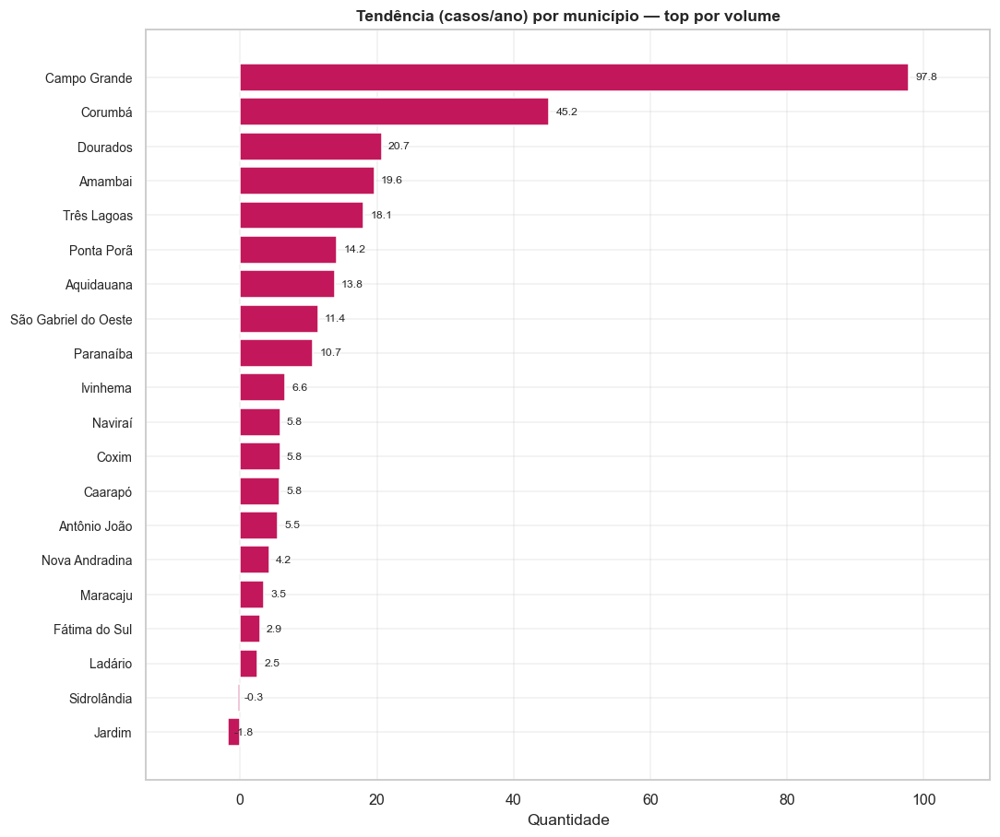

   ✅ Tendência linear por município concluída.


In [111]:
banner("TENDÊNCIA LINEAR POR MUNICÍPIO")

tend_mun = []
for cod in rank_abs.head(20)["COD_MUN"]:
    sub = DF_MULHERES[DF_MULHERES["COD_MUN"] == cod]
    s = sub.groupby("ANO").size()
    if len(s) >= 4:
        xs = np.arange(len(s))
        try:
            slope = float(np.polyfit(xs, s.values, 1)[0])
        except Exception:
            slope = np.nan
        tend_mun.append({"Municipio": MUNICIPIOS_MS.get(cod, cod),
                         "anos": len(s), "media_anual": round(s.mean(), 1),
                         "inclinacao_casos_ano": round(slope, 2),
                         "tendencia": ("Alta" if slope > 0.5 else
                                       "Queda" if slope < -0.5 else "Estável")})
if tend_mun:
    df_tend = pd.DataFrame(tend_mun).sort_values("inclinacao_casos_ano",
                                                 ascending=False)
    show_df(df_tend, "Tendência linear por município (top 20 por volume)",
            max_linhas=20)
    salvar_csv(df_tend, "38BG_tendencia_municipal", "Tendência linear por município")
    registrar_planilha("Tendencia_Municipal", df_tend)
    if plt is not None and len(df_tend):
        barras_horizontais(df_tend.set_index("Municipio")["inclinacao_casos_ano"],
                           "Tendência (casos/ano) por município — top por volume",
                           "38BG_tendencia_municipal", cor=COR_SECUNDARIA,
                           fmt="{:.1f}", descricao="Tendência municipal")
sucesso("Tendência linear por município concluída.")

============================================================
## SEÇÃO 38.BH — Razão de proporções por vínculo
============================================================

Compara, para cada eixo, a proporção de casos por **parceiro íntimo** vs **demais
vínculos**, evidenciando os eixos mais marcados pela violência relacional.

In [112]:
banner("RAZÃO DE PROPORÇÕES POR VÍNCULO")

razao = []
for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
                  ("FL_VIOL_SEXUAL", "Sexual"), ("FL_AMEACA", "Ameaça"),
                  ("FL_FEMINICIDIO", "Feminicídio")]:
    if flag not in DF_MULHERES.columns:
        continue
    sub = DF_MULHERES[DF_MULHERES[flag] == 1]
    if len(sub) < 5:
        continue
    p_intimo = sub["FL_PARCEIRO_INTIMO"].mean()
    p_outro = 1 - p_intimo
    razao.append({"Eixo": rot, "% parceiro íntimo": round(100 * p_intimo, 1),
                  "% demais": round(100 * p_outro, 1),
                  "razão (íntimo/demais)": round(p_intimo / max(0.01, p_outro), 2)})
if razao:
    df_razao = pd.DataFrame(razao).sort_values("% parceiro íntimo", ascending=False)
    show_df(df_razao, "Razão de proporções por vínculo (parceiro íntimo)",
            max_linhas=8)
    salvar_csv(df_razao, "38BH_razao_vinculo", "Razão de proporções por vínculo")
    registrar_planilha("Razao_Vinculo", df_razao)
sucesso("Razão de proporções por vínculo concluída.")


[111] RAZÃO DE PROPORÇÕES POR VÍNCULO

--- Razão de proporções por vínculo (parceiro íntimo) ----------------


,Eixo,% parceiro íntimo,% demais,razão (íntimo/demais)
3,Ameaça,54.5,45.5,1.20
1,Física,47.1,52.9,0.89
0,Doméstica,32.0,68.0,0.47
4,Feminicídio,31.3,68.7,0.46
2,Sexual,16.3,83.7,0.19


   ✅ Razão de proporções por vínculo concluída.


============================================================
## SEÇÃO 38.BI — Completude por eixo ao longo do tempo
============================================================

Acompanha a **qualidade do preenchimento** de campos-chave por ano (sexo, raça/cor,
escolaridade, idade), pois melhorias na notificação afetam a interpretação das séries.


[112] COMPLETUDE POR ANO (CAMPOS-CHAVE)

--- Completude (%) por ano — campos-chave ----------------------------


,Ano,Sexo,Raça/cor,Escolaridade,Idade,Local
0,2009,100.0,99.3,96.5,100.0,98.9
1,2010,100.0,99.5,97.6,100.0,99.1
2,2011,100.0,99.7,97.5,100.0,99.3
3,2012,100.0,99.7,97.5,100.0,99.2
4,2013,100.0,99.8,98.1,99.9,98.4
5,2014,100.0,99.4,100.0,100.0,98.9
6,2015,100.0,99.1,96.7,99.8,100.0
7,2016,100.0,99.6,97.3,99.4,100.0
8,2017,100.0,99.8,97.4,100.0,100.0
9,2018,100.0,99.8,97.7,100.0,100.0


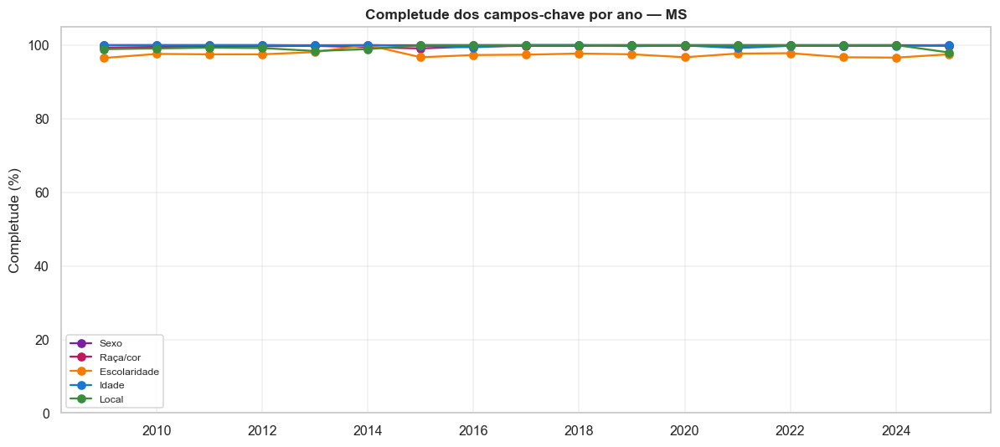

   ✅ Completude temporal concluída.


In [113]:
banner("COMPLETUDE POR ANO (CAMPOS-CHAVE)")

campos_qual = {"CS_SEXO": "Sexo", "CS_RACA": "Raça/cor",
               "CS_ESCOL_N": "Escolaridade", "NU_IDADE_N": "Idade",
               "LOCAL_OCOR": "Local"}
comp_temporal = []
base_q = df.dropna(subset=["ANO"]).copy()
for ano, sub in base_q.groupby("ANO"):
    linha = {"Ano": int(ano)}
    for col, rot in campos_qual.items():
        if col in sub.columns:
            preenchido = sub[col].notna() & (sub[col].astype(str).str.strip() != "")
            # considera "9"/ignorado como não informado para raça/escolaridade
            linha[rot] = round(100 * preenchido.mean(), 1)
    comp_temporal.append(linha)
df_comp_temp = pd.DataFrame(comp_temporal)
if len(df_comp_temp):
    show_df(df_comp_temp, "Completude (%) por ano — campos-chave", max_linhas=20)
    salvar_csv(df_comp_temp, "38BI_completude_temporal", "Completude por ano")
    registrar_planilha("Completude_Temporal", df_comp_temp)
    if plt is not None:
        fig, ax = plt.subplots(figsize=(11, 5))
        for i, rot in enumerate(campos_qual.values()):
            if rot in df_comp_temp.columns:
                ax.plot(df_comp_temp["Ano"], df_comp_temp[rot], marker="o",
                        label=rot, color=PALETA_SIPREV[i % len(PALETA_SIPREV)])
        ax.set_title("Completude dos campos-chave por ano — MS")
        ax.set_ylabel("Completude (%)"); ax.legend(fontsize=8); ax.set_ylim(0, 105)
        fig.tight_layout()
        salvar_grafico(fig, "38BI_completude_temporal", "Completude por ano")
sucesso("Completude temporal concluída.")

============================================================
## SEÇÃO 38.BJ — Análise de óbitos por violência
============================================================

Detalha os registros com **óbito por violência** (`EVOLUCAO = 3`) entre mulheres: por
ano, faixa etária, vínculo e meio de agressão — recorte de **letalidade**.


[113] ANÁLISE DE ÓBITOS POR VIOLÊNCIA
   Óbitos por violência (mulheres): 83


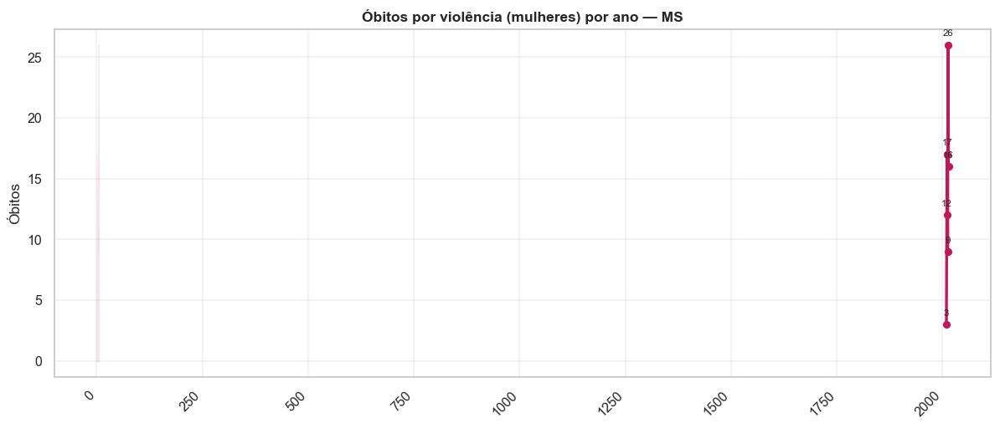


--- Óbitos por faixa etária ------------------------------------------


,FAIXA_ETARIA,Registros,%
0,30-39,23,27.7
1,12-17,12,14.5
2,40-49,11,13.3
3,25-29,11,13.3
4,0-11,8,9.6
5,60+,7,8.4
6,50-59,5,6.0
7,20-24,3,3.6
8,18-19,3,3.6


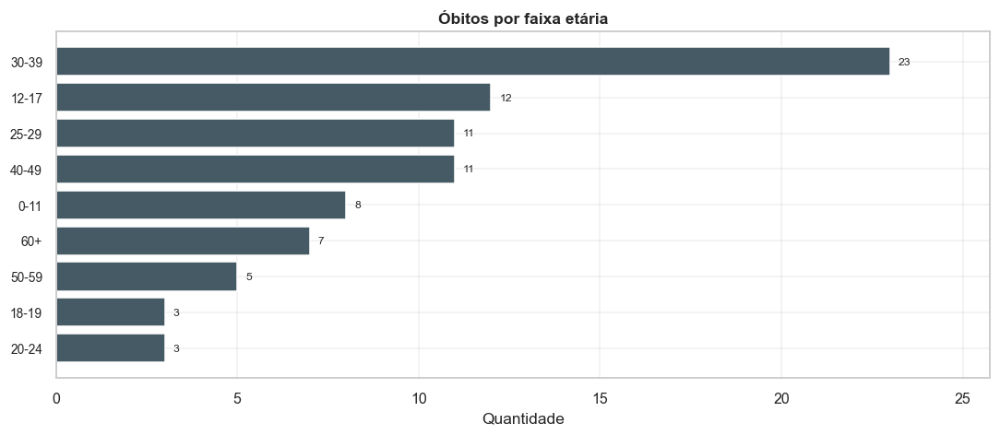


--- Óbitos por vínculo -----------------------------------------------


,CATEGORIA_VINCULO,Registros,%
0,Outro/Não informado,33,39.8
1,Parceiro(a) íntimo(a),26,31.3
2,Familiar,12,14.5
3,Conhecido(a),7,8.4
4,Desconhecido(a),5,6.0


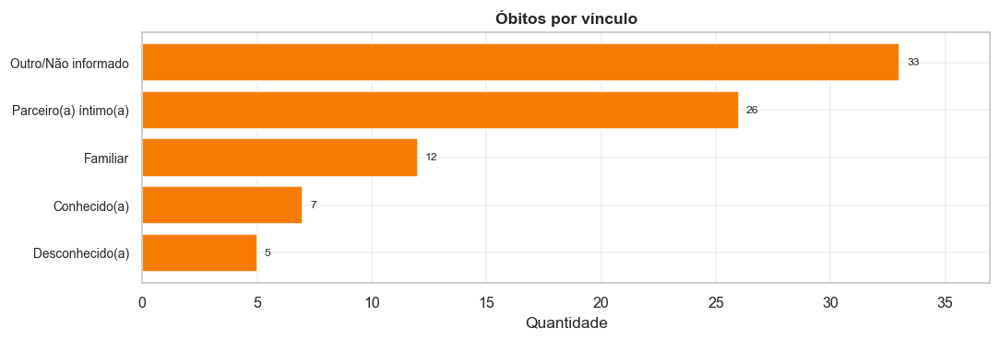


--- Meios de agressão nos óbitos -------------------------------------


,Meio,Óbitos
0,Objeto pérfuro-cortante,22
1,Força corporal/Espancamento,20
2,Arma de fogo,16
3,Outro meio,13
4,Enforcamento,11
5,Envenenamento,9
6,Objeto contundente,4
7,Substância/objeto quente,2
8,Ameaça,2


   ✅ Análise de óbitos por violência concluída.


In [114]:
banner("ANÁLISE DE ÓBITOS POR VIOLÊNCIA")

base_ob = DF_MULHERES[DF_MULHERES["FL_OBITO_VIOLENCIA"] == 1].copy()
info("Óbitos por violência (mulheres): %s", formato_numero(len(base_ob)))
if len(base_ob):
    s_ob_ano = base_ob.groupby("ANO").size()
    linha_temporal(s_ob_ano, "Óbitos por violência (mulheres) por ano — MS",
                   "38BJ_obitos_ano", ylabel="Óbitos", cor=COR_SECUNDARIA,
                   descricao="Óbitos por violência por ano")
    if base_ob["FAIXA_ETARIA"].notna().any():
        analisar_dimensao("FAIXA_ETARIA", "Óbitos por faixa etária",
                          "38BJ_obitos_faixa", base=base_ob, cor=COR_NEUTRA, top=10)
    if base_ob["CATEGORIA_VINCULO"].notna().any():
        analisar_dimensao("CATEGORIA_VINCULO", "Óbitos por vínculo",
                          "38BJ_obitos_vinculo", base=base_ob, cor=COR_DESTAQUE, top=6)
    # meios de agressão nos óbitos
    freq_ag_ob = {MAP_AGRESSAO[c]: int(base_ob[f"FL_{c}"].sum())
                  for c in COLS_AGRESSAO if f"FL_{c}" in base_ob.columns}
    serie_ag_ob = pd.Series(freq_ag_ob).sort_values(ascending=False)
    if serie_ag_ob.sum() > 0:
        show_df(serie_ag_ob.rename_axis("Meio").reset_index(name="Óbitos"),
                "Meios de agressão nos óbitos", max_linhas=10)
        salvar_csv(serie_ag_ob.rename_axis("Meio").reset_index(name="Obitos"),
                   "38BJ_obitos_meios", "Meios de agressão nos óbitos")
else:
    aviso("Sem óbitos por violência nesta amostra.")
sucesso("Análise de óbitos por violência concluída.")

============================================================
## SEÇÃO 38.BA — Concentração territorial (Gini e curva de Lorenz)
============================================================

Mede o quão **concentradas** estão as notificações entre os municípios. O **coeficiente
de Gini** (0 = distribuição perfeitamente igual; 1 = concentração total) e a **curva de
Lorenz** quantificam a desigualdade territorial — útil para entender se a violência se
espalha ou se concentra em poucos territórios.


[114] CONCENTRAÇÃO TERRITORIAL (GINI E LORENZ)
   Gini (notificações absolutas entre municípios): 0.841
   Gini (taxa/100k entre municípios): 0.508


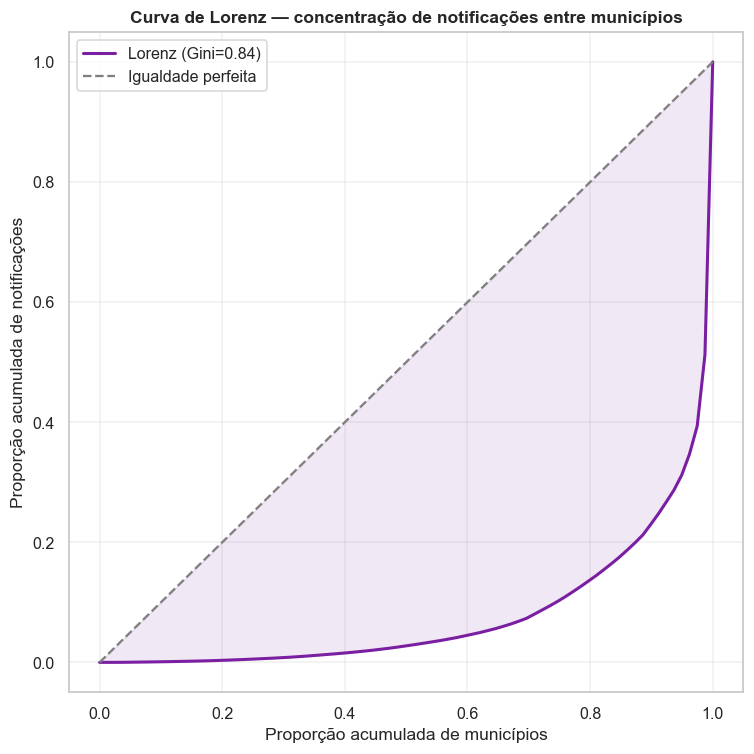

   ✅ Análise de concentração territorial concluída.


In [115]:
banner("CONCENTRAÇÃO TERRITORIAL (GINI E LORENZ)")


def gini(valores):
    """Coeficiente de Gini de uma distribuição não negativa."""
    v = np.sort(np.asarray(valores, dtype=float))
    n = len(v)
    if n == 0 or v.sum() == 0:
        return np.nan
    cum = np.cumsum(v)
    return float((n + 1 - 2 * np.sum(cum) / cum[-1]) / n)


valores_mun = df_painel["N_Total"].values
g_abs = gini(valores_mun)
g_taxa = gini(df_painel["Taxa_Total"].fillna(0).values)
info("Gini (notificações absolutas entre municípios): %.3f", g_abs)
info("Gini (taxa/100k entre municípios): %.3f", g_taxa)

# Curva de Lorenz
if plt is not None and not np.isnan(g_abs):
    v = np.sort(valores_mun.astype(float))
    cum = np.insert(np.cumsum(v) / v.sum(), 0, 0)
    pop = np.linspace(0, 1, len(cum))
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.plot(pop, cum, color=COR_PRIMARIA, linewidth=2,
            label=f"Lorenz (Gini={g_abs:.2f})")
    ax.plot([0, 1], [0, 1], "--", color="grey", label="Igualdade perfeita")
    ax.fill_between(pop, cum, pop, alpha=0.1, color=COR_PRIMARIA)
    ax.set_title("Curva de Lorenz — concentração de notificações entre municípios")
    ax.set_xlabel("Proporção acumulada de municípios")
    ax.set_ylabel("Proporção acumulada de notificações")
    ax.legend()
    fig.tight_layout()
    salvar_grafico(fig, "38BA_lorenz", "Curva de Lorenz (concentração)")

salvar_json({"gini_absoluto": round(g_abs, 3) if not np.isnan(g_abs) else None,
             "gini_taxa": round(g_taxa, 3) if not np.isnan(g_taxa) else None},
            "38BA_gini", "Coeficientes de Gini")
sucesso("Análise de concentração territorial concluída.")

============================================================
## SEÇÃO 38.BB — Decis de municípios por taxa
============================================================

Agrupa os municípios em **decis** segundo a taxa por 100 mil mulheres, mostrando a
distribuição da carga de violência ao longo da distribuição territorial.


[115] DECIS DE MUNICÍPIOS POR TAXA

--- Distribuição por decis de taxa -----------------------------------


,Decil,municipios,taxa_media,notif_total
0,D1,8,377.9,184
1,D2,8,717.2,411
2,D3,7,1155.3,646
3,D4,8,1594.8,677
4,D5,8,2248.5,1311
5,D6,7,3139.9,6109
6,D7,8,4165.0,6299
7,D8,7,5385.0,6397
8,D9,8,7693.7,6465
9,D10,8,12489.6,63469


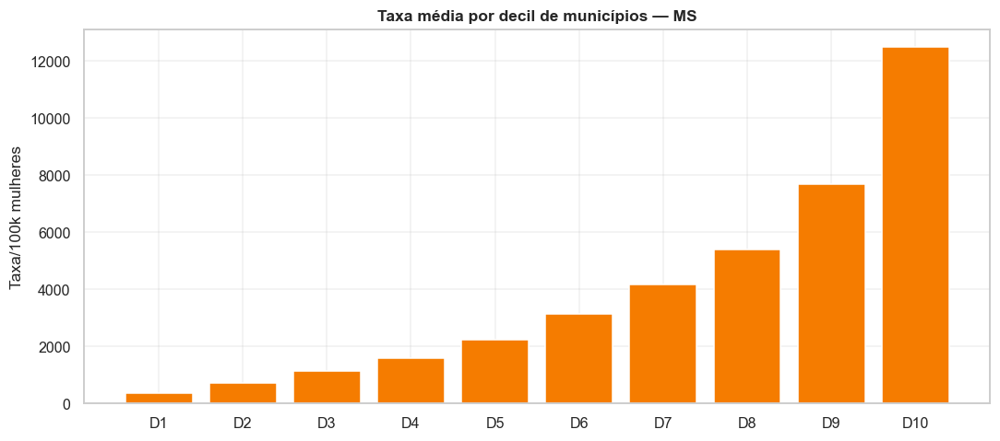

   ✅ Análise de decis concluída.


In [116]:
banner("DECIS DE MUNICÍPIOS POR TAXA")

dpain = df_painel[df_painel["N_Total"] >= 5].copy()
if len(dpain) >= 10:
    try:
        dpain["Decil"] = pd.qcut(dpain["Taxa_Total"].rank(method="first"), 10,
                                 labels=[f"D{i}" for i in range(1, 11)])
        dec = (dpain.groupby("Decil")
               .agg(municipios=("Municipio", "count"),
                    taxa_media=("Taxa_Total", "mean"),
                    notif_total=("N_Total", "sum")).reset_index())
        dec["taxa_media"] = dec["taxa_media"].round(1)
        show_df(dec, "Distribuição por decis de taxa", max_linhas=10)
        salvar_csv(dec, "38BB_decis", "Decis de municípios por taxa")
        registrar_planilha("Decis_Municipios", dec)
        if plt is not None:
            fig, ax = plt.subplots(figsize=(10, 4.5))
            ax.bar(dec["Decil"].astype(str), dec["taxa_media"], color=COR_DESTAQUE)
            ax.set_title("Taxa média por decil de municípios — MS")
            ax.set_ylabel("Taxa/100k mulheres")
            fig.tight_layout()
            salvar_grafico(fig, "38BB_decis", "Decis de municípios")
    except Exception as exc:
        aviso("Análise de decis falhou: %s", exc)
else:
    aviso("Municípios insuficientes para análise de decis.")
sucesso("Análise de decis concluída.")

============================================================
## SEÇÃO 38.BC — Evolução do perfil etário ao longo dos anos
============================================================


[116] EVOLUÇÃO DO PERFIL ETÁRIO


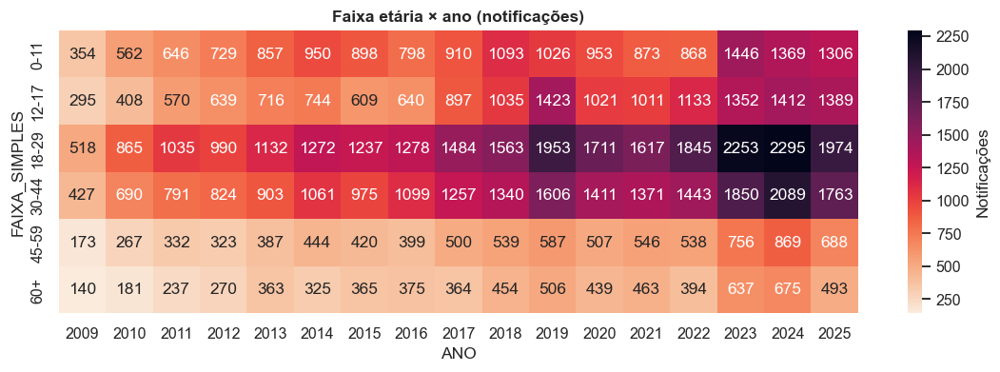

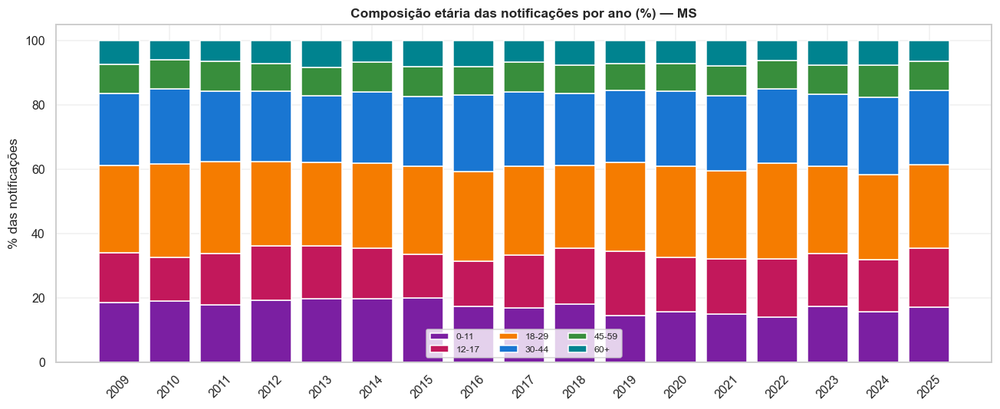

   ✅ Evolução do perfil etário concluída.


In [117]:
banner("EVOLUÇÃO DO PERFIL ETÁRIO")

piv_ano_faixa = (DF_MULHERES.dropna(subset=["ANO", "FAIXA_SIMPLES"])
                 .pivot_table(index="FAIXA_SIMPLES", columns="ANO",
                              values="FL_FEMININO", aggfunc="sum", fill_value=0))
if len(piv_ano_faixa):
    heatmap_cruzado(piv_ano_faixa, "Faixa etária × ano (notificações)",
                    "38BC_faixa_ano", cmap="rocket_r")
    # percentual por ano (composição)
    comp_ano_faixa = piv_ano_faixa.div(piv_ano_faixa.sum(axis=0), axis=1) * 100
    if plt is not None:
        fig, ax = plt.subplots(figsize=(12, 5))
        bottom = np.zeros(comp_ano_faixa.shape[1])
        for i, faixa in enumerate(comp_ano_faixa.index):
            ax.bar(comp_ano_faixa.columns.astype(str), comp_ano_faixa.loc[faixa],
                   bottom=bottom, label=str(faixa),
                   color=PALETA_SIPREV[i % len(PALETA_SIPREV)])
            bottom += comp_ano_faixa.loc[faixa].values
        ax.set_title("Composição etária das notificações por ano (%) — MS")
        ax.set_ylabel("% das notificações")
        ax.legend(fontsize=8, ncol=3, loc="lower center")
        plt.xticks(rotation=45)
        fig.tight_layout()
        salvar_grafico(fig, "38BC_composicao_etaria", "Composição etária por ano")
sucesso("Evolução do perfil etário concluída.")

============================================================
## SEÇÃO 38.BD — Vínculo predominante por eixo
============================================================

In [118]:
banner("VÍNCULO PREDOMINANTE POR EIXO")

vinc_eixo = []
for flag, rot in [("FL_VIOL_DOMESTICA", "Doméstica"), ("FL_VIOL_FISIC", "Física"),
                  ("FL_VIOL_SEXUAL", "Sexual"), ("FL_ESTUPRO", "Estupro"),
                  ("FL_AMEACA", "Ameaça"), ("FL_FEMINICIDIO", "Feminicídio")]:
    if flag not in DF_MULHERES.columns:
        continue
    sub = DF_MULHERES[DF_MULHERES[flag] == 1]
    if not len(sub):
        continue
    vc = sub["CATEGORIA_VINCULO"].value_counts()
    vinc_eixo.append({"Eixo": rot,
                      "Vínculo predominante": vc.idxmax() if len(vc) else "-",
                      "% predominante": round(100 * vc.max() / len(sub), 1) if len(vc) else 0,
                      "% parceiro íntimo": round(100 * sub["FL_PARCEIRO_INTIMO"].mean(), 1),
                      "% familiar": round(100 * sub["FL_FAMILIAR"].mean(), 1)})
if vinc_eixo:
    df_vinc_eixo = pd.DataFrame(vinc_eixo)
    show_df(df_vinc_eixo, "Vínculo predominante por eixo", max_linhas=10)
    salvar_csv(df_vinc_eixo, "38BD_vinculo_por_eixo", "Vínculo predominante por eixo")
    registrar_planilha("Vinculo_Por_Eixo", df_vinc_eixo)
sucesso("Análise de vínculo por eixo concluída.")


[117] VÍNCULO PREDOMINANTE POR EIXO

--- Vínculo predominante por eixo ------------------------------------


,Eixo,Vínculo predominante,% predominante,% parceiro íntimo,% familiar
0,Doméstica,Parceiro(a) íntimo(a),32.0,32.0,31.5
1,Física,Parceiro(a) íntimo(a),47.1,47.1,13.5
2,Sexual,Outro/Não informado,25.0,16.3,20.2
3,Estupro,Desconhecido(a),22.8,17.4,18.2
4,Ameaça,Parceiro(a) íntimo(a),54.5,54.5,16.7
5,Feminicídio,Outro/Não informado,39.8,31.3,15.7


   ✅ Análise de vínculo por eixo concluída.


============================================================
## SEÇÃO 38.BE — Sazonalidade por dia do mês
============================================================


[118] SAZONALIDADE POR DIA DO MÊS


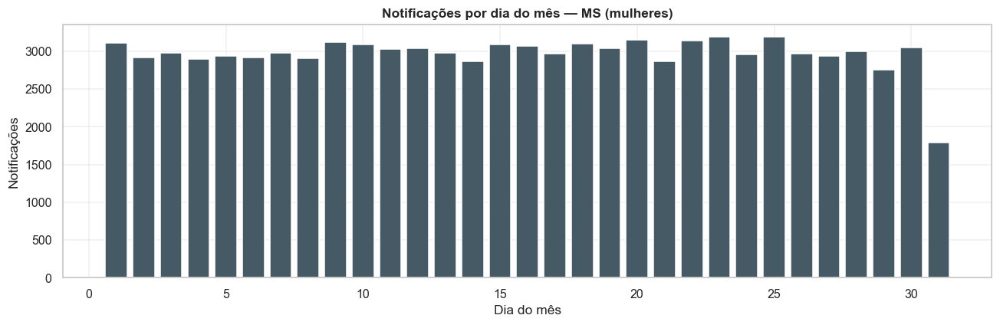

   ✅ Sazonalidade por dia do mês concluída.


In [119]:
banner("SAZONALIDADE POR DIA DO MÊS")

base_dia = DF_MULHERES.dropna(subset=["DT_NOTIFIC"]).copy()
if len(base_dia):
    base_dia["dia_mes"] = base_dia["DT_NOTIFIC"].dt.day
    s_dia = base_dia.groupby("dia_mes").size().reindex(range(1, 32)).fillna(0)
    if plt is not None:
        fig, ax = plt.subplots(figsize=(12, 4))
        ax.bar(s_dia.index, s_dia.values, color=COR_NEUTRA)
        ax.set_title("Notificações por dia do mês — MS (mulheres)")
        ax.set_xlabel("Dia do mês"); ax.set_ylabel("Notificações")
        fig.tight_layout()
        salvar_grafico(fig, "38BE_dia_do_mes", "Sazonalidade por dia do mês")
    salvar_csv(s_dia.rename_axis("dia_mes").reset_index(name="n"),
               "38BE_dia_do_mes", "Sazonalidade por dia do mês")
sucesso("Sazonalidade por dia do mês concluída.")

============================================================
## SEÇÃO 38.AX — Matriz consolidada eixo × ano e painel-síntese
============================================================

Tabela **larga** consolidando, por ano, o total de cada eixo (visão executiva única) e
um **painel-síntese** final com os principais resultados do estudo.


[119] MATRIZ CONSOLIDADA EIXO × ANO E PAINEL-SÍNTESE

--- Matriz consolidada eixo × ano ------------------------------------


,Ano,Total,Doméstica,Física,Psicológica,Sexual,Estupro,Ameaça,Feminicídio
0,2009,1907,1602,1125,524,211,95,233,3
1,2010,2973,2441,1714,851,321,195,491,12
2,2011,3611,3073,2251,895,310,183,401,17
3,2012,3775,3178,2205,971,401,228,411,9
4,2013,4361,3620,2481,957,470,324,465,26
5,2014,4796,3934,2839,1001,479,340,463,16
6,2015,4513,3627,2530,872,372,245,398,0
7,2016,4614,3724,2538,885,399,277,441,0
8,2017,5412,4403,2778,836,439,322,493,0
9,2018,6025,5032,2827,899,492,366,620,0


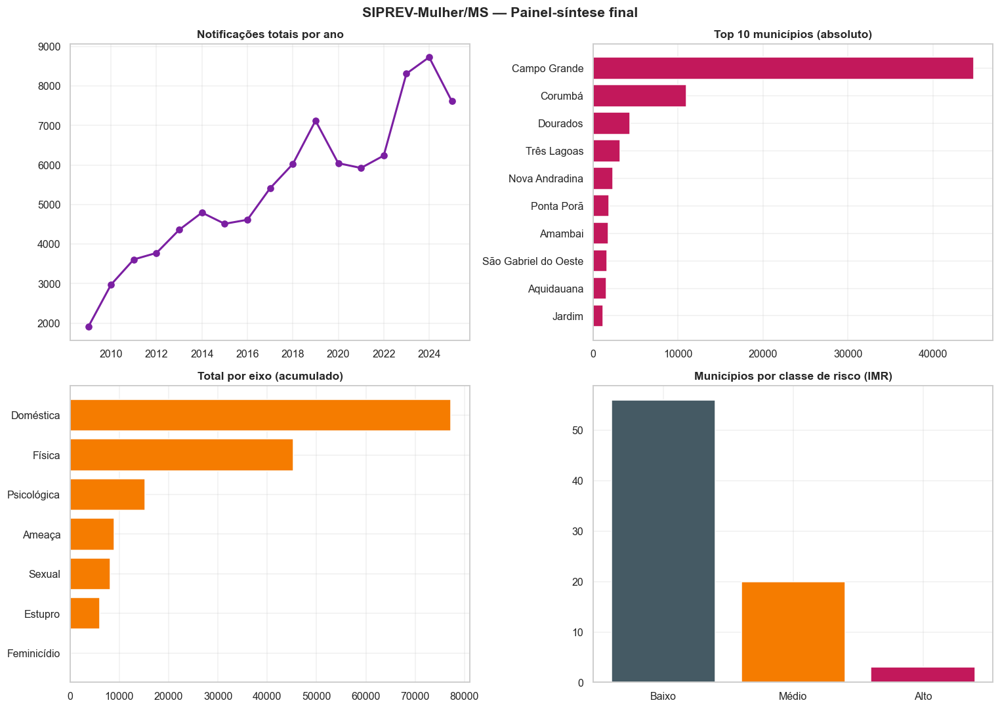

   ✅ Matriz consolidada e painel-síntese concluídos.


In [120]:
banner("MATRIZ CONSOLIDADA EIXO × ANO E PAINEL-SÍNTESE")

# Matriz larga eixo × ano
linhas_wide = []
for ano in sorted(DF_MULHERES["ANO"].dropna().unique()):
    sub = DF_MULHERES[DF_MULHERES["ANO"] == ano]
    linha = {"Ano": int(ano)}
    for rot, flag in EIXOS_LONG.items():
        if flag in sub.columns:
            linha[rot] = int(sub[flag].sum())
    linhas_wide.append(linha)
df_wide = pd.DataFrame(linhas_wide)
if len(df_wide):
    show_df(df_wide, "Matriz consolidada eixo × ano", max_linhas=20)
    salvar_csv(df_wide, "38AX_matriz_eixo_ano", "Matriz consolidada eixo × ano")
    salvar_xlsx(df_wide, "38AX_matriz_eixo_ano", "Matriz eixo × ano", aba="Eixo_Ano")
    registrar_planilha("Matriz_Eixo_Ano", df_wide)

# Painel-síntese final (4 quadros)
if plt is not None and len(df_wide):
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    # 1) evolução total
    axes[0, 0].plot(df_wide["Ano"], df_wide.get("Total", 0), marker="o",
                    color=COR_PRIMARIA, linewidth=2)
    axes[0, 0].set_title("Notificações totais por ano")
    # 2) top 10 municípios
    top10 = rank_abs.head(10)
    axes[0, 1].barh(top10["Municipio"][::-1], top10["N_Total"][::-1],
                    color=COR_SECUNDARIA)
    axes[0, 1].set_title("Top 10 municípios (absoluto)")
    # 3) eixos (total acumulado)
    eixos_tot = {rot: int(DF_MULHERES[flag].sum())
                 for rot, flag in EIXOS_LONG.items() if rot != "Total"
                 and flag in DF_MULHERES.columns}
    se = pd.Series(eixos_tot).sort_values()
    axes[1, 0].barh(se.index, se.values, color=COR_DESTAQUE)
    axes[1, 0].set_title("Total por eixo (acumulado)")
    # 4) classes de risco
    dr = df_painel["Classe_risco"].value_counts().reindex(["Baixo", "Médio", "Alto"])
    axes[1, 1].bar(dr.index.astype(str), dr.values,
                   color=[COR_NEUTRA, COR_DESTAQUE, COR_SECUNDARIA])
    axes[1, 1].set_title("Municípios por classe de risco (IMR)")
    fig.suptitle("SIPREV-Mulher/MS — Painel-síntese final", fontweight="bold",
                 fontsize=14)
    fig.tight_layout()
    salvar_grafico(fig, "38AX_painel_sintese", "Painel-síntese final")
sucesso("Matriz consolidada e painel-síntese concluídos.")

============================================================
## SEÇÃO 39 — Dashboards interativos (Plotly → HTML)
============================================================

Dashboards interativos em HTML (Plotly), salvos em `04_dashboards/`. Quando o Plotly não
está disponível, geramos um dashboard HTML estático (tabelas + imagens PNG já criadas),
garantindo a entrega do artefato em qualquer ambiente.

In [121]:
banner("DASHBOARDS INTERATIVOS (HTML)")

if CAP.get("plotly"):
    try:
        # 39.1  Dashboard geral (painel 2x2)
        dash = make_subplots(
            rows=2, cols=2,
            subplot_titles=("Notificações por ano", "Top 12 municípios (absoluto)",
                            "Por tipo de violência", "Por faixa etária"),
            specs=[[{"type": "scatter"}, {"type": "bar"}],
                   [{"type": "bar"}, {"type": "bar"}]],
        )
        s_ano = serie_temporal(por="ANO")
        dash.add_trace(go.Scatter(x=list(s_ano.index), y=list(s_ano.values),
                                  mode="lines+markers", name="Ano",
                                  line=dict(color=COR_PRIMARIA)), 1, 1)
        top_mun = rank_abs.head(12)
        dash.add_trace(go.Bar(x=top_mun["N_Total"], y=top_mun["Municipio"],
                              orientation="h", marker_color=COR_SECUNDARIA,
                              name="Municípios"), 1, 2)
        dash.add_trace(go.Bar(x=list(serie_viol.head(8).index),
                              y=list(serie_viol.head(8).values),
                              marker_color=COR_DESTAQUE, name="Tipos"), 2, 1)
        fe = DF_MULHERES["FAIXA_ETARIA"].value_counts().sort_index()
        dash.add_trace(go.Bar(x=list(fe.index.astype(str)), y=list(fe.values),
                              marker_color=COR_NEUTRA, name="Faixa"), 2, 2)
        dash.update_layout(height=820, showlegend=False,
                           title_text="SIPREV-Mulher/MS — Painel Geral da Violência "
                                      "contra a Mulher (MS)")
        salvar_html(dash, "39_dashboard_geral", "Dashboard geral interativo")
        sucesso("Dashboard geral salvo.")

        # 39.2  Dashboard de feminicídio (série + ranking)
        dash2 = make_subplots(rows=1, cols=2,
                              subplot_titles=("Feminicídio por ano (proxy)",
                                              "Top municípios"))
        if len(serie_fem):
            dash2.add_trace(go.Scatter(x=list(serie_fem.index), y=list(serie_fem.values),
                                       mode="lines+markers",
                                       line=dict(color=COR_SECUNDARIA)), 1, 1)
        if "ranking_abs" in res_feminicidio and len(res_feminicidio["ranking_abs"]):
            rkf = res_feminicidio["ranking_abs"].head(10)
            dash2.add_trace(go.Bar(x=rkf["N"], y=rkf["Municipio"], orientation="h",
                                   marker_color=COR_PRIMARIA), 1, 2)
        dash2.update_layout(height=480, showlegend=False,
                            title_text="SIPREV-Mulher/MS — Dashboard de Feminicídio (proxy)")
        salvar_html(dash2, "39_dashboard_feminicidio", "Dashboard de feminicídio")

        # 39.3  Dashboard de ranking municipal (mapa de calor de barras)
        if px is not None:
            figm = px.bar(rank_taxa.head(20), x="Taxa_Total", y="Municipio",
                          orientation="h", color="Classe_risco",
                          color_discrete_map={"Alto": COR_SECUNDARIA,
                                              "Médio": COR_DESTAQUE,
                                              "Baixo": COR_NEUTRA},
                          title="Top 20 municípios por taxa/100 mil mulheres — MS")
            figm.update_layout(height=650, yaxis={"categoryorder": "total ascending"})
            salvar_html(figm, "39_dashboard_ranking", "Dashboard de ranking municipal")

        # 39.4  Mapa interativo de bolhas (Plotly scattergeo simplificado)
        if px is not None and len(geo_com_coord):
            figgeo = px.scatter_mapbox(
                geo_com_coord, lat="lat", lon="lon", size="N_Total",
                color="Taxa_Total", hover_name="Municipio",
                color_continuous_scale="Plasma", size_max=40, zoom=5,
                mapbox_style="carto-positron",
                title="Mapa interativo — violência contra a mulher (MS)")
            figgeo.update_layout(height=650)
            salvar_html(figgeo, "39_mapa_interativo_plotly", "Mapa interativo Plotly")
    except Exception as exc:
        aviso("Falha ao gerar dashboards Plotly: %s", exc)

# 39.5  Dashboard HTML estático consolidado (sempre gerado)
def construir_dashboard_estatico() -> Path:
    """Monta um HTML único reunindo indicadores e as imagens PNG geradas."""
    imgs = sorted([p for p in DIRS["graficos"].glob("*.png")])
    cards = ""
    indicadores_card = [
        ("Notificações (mulheres)", formato_numero(len(DF_MULHERES))),
        ("Municípios analisados", str(len(MUNICIPIOS_MS))),
        ("Feminicídios (proxy)", formato_numero(int(df['FL_FEMINICIDIO'].sum()))),
        ("Modelos treinados", str(len(MODELOS))),
    ]
    for titulo, valor in indicadores_card:
        cards += (f"<div class='card'><div class='v'>{valor}</div>"
                  f"<div class='t'>{titulo}</div></div>")
    galeria = ""
    for img in imgs:
        rel = f"../02_graficos/{img.name}"
        galeria += (f"<figure><img src='{rel}' loading='lazy'/>"
                    f"<figcaption>{img.stem}</figcaption></figure>")
    html = f"""<!DOCTYPE html><html lang='pt-br'><head><meta charset='utf-8'>
<title>SIPREV-Mulher/MS — Dashboard</title>
<style>
body{{font-family:Segoe UI,Arial,sans-serif;margin:0;background:#faf7fc;color:#222}}
header{{background:linear-gradient(120deg,{COR_PRIMARIA},{COR_SECUNDARIA});
color:#fff;padding:26px 32px}}
header h1{{margin:0;font-size:24px}} header p{{margin:4px 0 0;opacity:.9}}
.cards{{display:flex;flex-wrap:wrap;gap:16px;padding:24px 32px}}
.card{{background:#fff;border-radius:12px;padding:18px 22px;box-shadow:0 2px 8px #0001;
min-width:180px}} .card .v{{font-size:26px;font-weight:700;color:{COR_PRIMARIA}}}
.card .t{{color:#666;font-size:13px;margin-top:4px}}
.gal{{display:grid;grid-template-columns:repeat(auto-fill,minmax(420px,1fr));
gap:18px;padding:0 32px 40px}}
figure{{background:#fff;border-radius:12px;padding:10px;margin:0;box-shadow:0 2px 8px #0001}}
figure img{{width:100%;border-radius:8px}}
figcaption{{font-size:12px;color:#777;padding:6px 4px;text-align:center}}
footer{{padding:18px 32px;color:#888;font-size:12px}}
</style></head><body>
<header><h1>🛡️ SIPREV-Mulher/MS — Painel da Violência contra a Mulher</h1>
<p>Mato Grosso do Sul · {CFG.ano_inicial}–{CFG.ano_final} · Fonte: {ORIGEM_DADOS} ·
Gerado em {datetime.now().strftime('%d/%m/%Y %H:%M')}</p></header>
<div class='cards'>{cards}</div>
<h2 style='padding:0 32px;color:{COR_PRIMARIA}'>Galeria de análises</h2>
<div class='gal'>{galeria}</div>
<footer>Uso acadêmico e de apoio a políticas públicas. Dados agregados (LGPD).
SIPREV-Mulher/MS v{CFG.versao}.</footer>
</body></html>"""
    return salvar_html(html, "39_dashboard_consolidado",
                       "Dashboard HTML consolidado (estático)")


construir_dashboard_estatico()
sucesso("Dashboards concluídos.")


[120] DASHBOARDS INTERATIVOS (HTML)
   ✅ Dashboard geral salvo.
   ✅ Dashboards concluídos.


============================================================
## SEÇÃO 40 — Indicadores finais consolidados
============================================================

Reúne os **indicadores-chave** do sistema (totais, taxas, perfis predominantes,
municípios críticos, qualidade dos dados e índices avançados), exibidos inline e
exportados em `.json`/`.csv`/`.txt`.

In [122]:
banner("INDICADORES FINAIS CONSOLIDADOS")

def _moda_segura(serie):
    try:
        return serie.value_counts().idxmax()
    except Exception:
        return "-"


INDICADORES = OrderedDict([
    ("Origem dos dados", ORIGEM_DADOS),
    ("Período analisado", f"{CFG.ano_inicial}–{CFG.ano_final}"),
    ("Total de notificações (todas)", int(len(df))),
    ("Total de notificações (mulheres)", int(len(DF_MULHERES))),
    ("% vítimas mulheres", round(100 * len(DF_MULHERES) / max(1, len(df)), 1)),
    ("Total violência doméstica", int(df["FL_VIOL_DOMESTICA"].sum())),
    ("Total violência física", int(df["FL_VIOL_FISIC"].sum())),
    ("Total violência psicológica", int(df["FL_VIOL_PSICOLOGICA"].sum())),
    ("Total violência sexual", int(df["FL_VIOL_SEXUAL"].sum())),
    ("Total estupros", int(df["FL_ESTUPRO"].sum())),
    ("Total ameaças", int(df["FL_AMEACA"].sum())),
    ("Total feminicídios (proxy)", int(df["FL_FEMINICIDIO"].sum())),
    ("Total óbitos por violência", int(df["FL_OBITO_VIOLENCIA"].sum())),
    ("Taxa total/100k mulheres (acum.)",
     round(len(DF_MULHERES) / pop_fem_ms * 100_000, 1)),
    ("Taxa feminicídio/100k mulheres (acum.)", taxa_fem_ms),
    ("Município com mais notificações", rank_abs.iloc[0]["Municipio"]),
    ("Município de maior taxa", rank_taxa.iloc[0]["Municipio"] if len(rank_taxa) else "-"),
    ("Municípios de alto risco (IMR)", int((df_painel["Classe_risco"] == "Alto").sum())),
    ("Perfil etário predominante", _moda_segura(DF_MULHERES["FAIXA_ETARIA"])),
    ("Raça/cor predominante", _moda_segura(DF_MULHERES["RACA_COR"])),
    ("Vínculo predominante", _moda_segura(DF_MULHERES["VINCULO_AUTOR"])),
    ("Local mais recorrente", _moda_segura(DF_MULHERES["LOCAL_DESC"])),
    ("Período do dia mais recorrente", _moda_segura(DF_MULHERES["PERIODO_DIA"])),
    ("Posição de MS no Brasil (taxa)", pos_ms_taxa or "-"),
    ("Modelos treinados (ML/DL/NN)", len(MODELOS)),
    ("Índice de qualidade dos dados", indice_qualidade),
])

show_df(pd.DataFrame(list(INDICADORES.items()), columns=["Indicador", "Valor"]),
        "Indicadores finais do sistema", max_linhas=40)
salvar_json(dict(INDICADORES), "40_indicadores_finais", "Indicadores finais consolidados")
df_ind = pd.DataFrame(list(INDICADORES.items()), columns=["Indicador", "Valor"])
salvar_csv(df_ind, "40_indicadores_finais", "Indicadores finais")
registrar_planilha("Indicadores_Finais", df_ind)

rel_ind = RelatorioTexto("Indicadores Finais Consolidados")
rel_ind.kv({k: (formato_numero(v) if isinstance(v, int) else v)
            for k, v in INDICADORES.items()})
rel_ind.salvar(DIRS["relatorios"] / "40_indicadores_finais.txt")
sucesso("Indicadores finais consolidados.")


[121] INDICADORES FINAIS CONSOLIDADOS

--- Indicadores finais do sistema ------------------------------------


,Indicador,Valor
0,Origem dos dados,oficial (SINAN/DATASUS)
1,Período analisado,2009–2025
2,Total de notificações (todas),142043
3,Total de notificações (mulheres),91970
4,% vítimas mulheres,64.7
5,Total violência doméstica,114773
6,Total violência física,67779
7,Total violência psicológica,18767
8,Total violência sexual,9325
9,Total estupros,6618


   📝 Relatório salvo: 40_indicadores_finais.txt
   ✅ Indicadores finais consolidados.


============================================================
## SEÇÃO 41 — Workbook Excel consolidado
============================================================

Reúne todas as tabelas acumuladas em `EXCEL_SHEETS` em um único arquivo `.xlsx`
multi-abas, com formatação básica de cabeçalho. *Fallback* para múltiplos CSVs caso o
`openpyxl` esteja ausente.

In [123]:
banner("WORKBOOK EXCEL CONSOLIDADO")

caminho_xlsx_master = DIRS["tabelas"] / "00_SIPREV_consolidado.xlsx"
if CAP.get("openpyxl") and EXCEL_SHEETS:
    try:
        with pd.ExcelWriter(caminho_xlsx_master, engine="openpyxl") as xw:
            for aba, dframe in EXCEL_SHEETS.items():
                dframe.to_excel(xw, sheet_name=aba[:31], index=False)
        # formatação dos cabeçalhos
        try:
            wb = openpyxl.load_workbook(caminho_xlsx_master)
            fill = PatternFill("solid", fgColor="7B1FA2")
            fonte = Font(color="FFFFFF", bold=True)
            for ws in wb.worksheets:
                for cell in ws[1]:
                    cell.fill = fill
                    cell.font = fonte
                    cell.alignment = Alignment(horizontal="center")
                ws.freeze_panes = "A2"
            wb.save(caminho_xlsx_master)
        except Exception:
            pass
        registrar_artefato(caminho_xlsx_master, "tabela_xlsx",
                           "Workbook Excel consolidado (todas as tabelas)")
        sucesso("Workbook Excel consolidado: %s (%d abas)",
                caminho_xlsx_master.name, len(EXCEL_SHEETS))
    except Exception as exc:
        aviso("Falha ao gerar workbook consolidado: %s", exc)
else:
    aviso("openpyxl ausente — tabelas já exportadas individualmente em CSV.")


[122] WORKBOOK EXCEL CONSOLIDADO
   ✅ Workbook Excel consolidado: 00_SIPREV_consolidado.xlsx (90 abas)


============================================================
## SEÇÃO 42 — Relatório PDF mestre
============================================================

Relatório executivo em PDF, com capa, indicadores-chave, *rankings* e principais
gráficos embutidos. Usa `reportlab` quando disponível; caso contrário, `fpdf2`; em
último caso, gera um substituto `.txt` (e avisa).

In [124]:
banner("RELATÓRIO PDF MESTRE")

def _principais_imagens(n=8):
    """Seleciona as imagens PNG mais relevantes para o PDF."""
    prefer = ["19_ocorrencias_ano", "23_feminicidio", "27_ranking_taxa",
              "27_ranking_imr", "28_ranking_nacional_taxa", "22_tipos_violencia",
              "20_piramide_etaria", "32_classificadores_f1", "29_mapa_estatico_MS",
              "38_f1_todos_modelos"]
    achadas = []
    for chave in prefer:
        for p in DIRS["graficos"].glob(f"{chave}*.png"):
            achadas.append(p); break
    if len(achadas) < n:
        for p in sorted(DIRS["graficos"].glob("*.png")):
            if p not in achadas:
                achadas.append(p)
            if len(achadas) >= n:
                break
    return achadas[:n]


pdf_path = DIRS["relatorios"] / "42_relatorio_mestre.pdf"
pdf_ok = False

if PDF_ENGINE == "reportlab":
    try:
        doc = SimpleDocTemplate(str(pdf_path), pagesize=A4,
                                title="SIPREV-Mulher/MS — Relatório Mestre")
        styles = getSampleStyleSheet()
        styles.add(ParagraphStyle("TituloSIPREV", parent=styles["Title"],
                                  textColor=rl_colors.HexColor(COR_PRIMARIA)))
        styles.add(ParagraphStyle("SecaoSIPREV", parent=styles["Heading2"],
                                  textColor=rl_colors.HexColor(COR_SECUNDARIA)))
        elems = []
        elems.append(Paragraph("SIPREV-Mulher/MS", styles["TituloSIPREV"]))
        elems.append(Paragraph("Sistema Inteligente de Predição e Mapeamento da "
                               "Violência contra a Mulher em Mato Grosso do Sul",
                               styles["Heading3"]))
        elems.append(Spacer(1, 6))
        elems.append(Paragraph(
            f"Relatório executivo · Período {CFG.ano_inicial}–{CFG.ano_final} · "
            f"Fonte: {ORIGEM_DADOS} · Gerado em "
            f"{datetime.now().strftime('%d/%m/%Y %H:%M')}", styles["Normal"]))
        elems.append(Spacer(1, 14))

        # Tabela de indicadores
        elems.append(Paragraph("Indicadores-chave", styles["SecaoSIPREV"]))
        dados_tab = [["Indicador", "Valor"]]
        for k, v in list(INDICADORES.items())[:18]:
            dados_tab.append([str(k), str(v)])
        t = Table(dados_tab, colWidths=[10 * cm, 6 * cm])
        t.setStyle(TableStyle([
            ("BACKGROUND", (0, 0), (-1, 0), rl_colors.HexColor(COR_PRIMARIA)),
            ("TEXTCOLOR", (0, 0), (-1, 0), rl_colors.white),
            ("FONTSIZE", (0, 0), (-1, -1), 8),
            ("GRID", (0, 0), (-1, -1), 0.4, rl_colors.grey),
            ("ROWBACKGROUNDS", (0, 1), (-1, -1),
             [rl_colors.white, rl_colors.HexColor("#F3E5F5")]),
        ]))
        elems.append(t)
        elems.append(PageBreak())

        # Rankings (top 10)
        elems.append(Paragraph("Ranking municipal por taxa (top 10)",
                               styles["SecaoSIPREV"]))
        rk_tab = [["Pos", "Município", "Notif.", "Taxa/100k", "Risco"]]
        for _, r in rank_taxa.head(10).iterrows():
            rk_tab.append([str(int(r["Pos"])), str(r["Municipio"])[:24],
                           str(int(r["N_Total"])), f"{float(r['Taxa_Total']):.1f}",
                           str(r["Classe_risco"])])
        t2 = Table(rk_tab, colWidths=[1.5*cm, 7*cm, 2.5*cm, 3*cm, 2.5*cm])
        t2.setStyle(TableStyle([
            ("BACKGROUND", (0, 0), (-1, 0), rl_colors.HexColor(COR_SECUNDARIA)),
            ("TEXTCOLOR", (0, 0), (-1, 0), rl_colors.white),
            ("FONTSIZE", (0, 0), (-1, -1), 8),
            ("GRID", (0, 0), (-1, -1), 0.4, rl_colors.grey),
        ]))
        elems.append(t2)
        elems.append(Spacer(1, 12))

        # Modelos (se houver)
        if len(MODELOS_DF):
            elems.append(Paragraph("Modelos treinados (resumo)", styles["SecaoSIPREV"]))
            cols_pdf = [c for c in ["Modelo", "Família", "Tarefa", "f1_macro", "RMSE"]
                        if c in MODELOS_DF.columns]
            m_tab = [list(cols_pdf)]
            for _, rr in MODELOS_DF[cols_pdf].head(16).iterrows():
                m_tab.append([str(x) for x in rr.tolist()])
            larg_m = [5 * cm, 3 * cm, 3.5 * cm, 2.3 * cm, 2.3 * cm][:len(cols_pdf)]
            t3 = Table(m_tab, colWidths=larg_m)
            t3.setStyle(TableStyle([
                ("BACKGROUND", (0, 0), (-1, 0), rl_colors.HexColor(COR_NEUTRA)),
                ("TEXTCOLOR", (0, 0), (-1, 0), rl_colors.white),
                ("FONTSIZE", (0, 0), (-1, -1), 7),
                ("GRID", (0, 0), (-1, -1), 0.4, rl_colors.grey),
            ]))
            elems.append(t3)
        elems.append(PageBreak())

        # Galeria de gráficos
        elems.append(Paragraph("Principais gráficos", styles["SecaoSIPREV"]))
        for img in _principais_imagens(8):
            try:
                elems.append(Paragraph(img.stem, styles["Normal"]))
                elems.append(RLImage(str(img), width=15 * cm, height=8 * cm,
                                     kind="proportional"))
                elems.append(Spacer(1, 10))
            except Exception:
                pass
        doc.build(elems)
        registrar_artefato(pdf_path, "relatorio_pdf", "Relatório PDF mestre")
        pdf_ok = True
        sucesso("Relatório PDF mestre gerado: %s", pdf_path.name)
    except Exception as exc:
        import traceback as _tb
        logger.error("PDF reportlab traceback:\n%s", _tb.format_exc())
        aviso("Falha no PDF (reportlab): %s", exc)

if not pdf_ok and PDF_ENGINE == "fpdf":
    try:
        pdf = FPDF()
        pdf.set_auto_page_break(auto=True, margin=15)
        pdf.add_page()
        pdf.set_font("Helvetica", "B", 16)
        pdf.cell(0, 10, "SIPREV-Mulher/MS - Relatorio Mestre", ln=True)
        pdf.set_font("Helvetica", "", 10)
        pdf.cell(0, 7, f"Periodo {CFG.ano_inicial}-{CFG.ano_final} | Fonte: "
                 f"{ORIGEM_DADOS[:50]}", ln=True)
        pdf.ln(4)
        pdf.set_font("Helvetica", "B", 12)
        pdf.cell(0, 8, "Indicadores-chave", ln=True)
        pdf.set_font("Helvetica", "", 9)
        for k, v in list(INDICADORES.items())[:20]:
            texto = f"{k}: {v}".encode("latin-1", "replace").decode("latin-1")
            pdf.cell(0, 6, texto[:90], ln=True)
        for img in _principais_imagens(6):
            try:
                pdf.add_page(); pdf.image(str(img), w=180)
            except Exception:
                pass
        pdf.output(str(pdf_path))
        registrar_artefato(pdf_path, "relatorio_pdf", "Relatório PDF mestre (fpdf)")
        pdf_ok = True
        sucesso("Relatório PDF mestre gerado (fpdf): %s", pdf_path.name)
    except Exception as exc:
        aviso("Falha no PDF (fpdf): %s", exc)

if not pdf_ok:
    aviso("Nenhum motor de PDF disponível — gerando substituto .txt.")
    rel_pdf_sub = RelatorioTexto("Relatório Mestre (substituto do PDF)")
    rel_pdf_sub.kv({k: str(v) for k, v in INDICADORES.items()})
    rel_pdf_sub.salvar(DIRS["relatorios"] / "42_relatorio_mestre_substituto.txt")


[123] RELATÓRIO PDF MESTRE
   ✅ Relatório PDF mestre gerado: 42_relatorio_mestre.pdf


============================================================
## SEÇÃO 43 — Manifesto e EXPORTAÇÃO COMPACTADA (.zip)
============================================================

Célula final (requisito do projeto): após toda a execução, o sistema (1) gera um
**manifesto** de todos os artefatos (`.csv`/`.json`), (2) compacta a pasta de saída em um
**`.zip` carimbado com data/hora** (ex.: `SIPREV_Mulher_MS_AAAAMMDD_HHMMSS.zip`) e (3),
se estiver no Google Colab, dispara o **download automático**. Funciona igualmente em
execução local (o caminho do `.zip` é exibido). Esta deve ser a **última célula** a rodar.

In [125]:
banner("MANIFESTO E EXPORTAÇÃO COMPACTADA (.ZIP)")

# 43.1  Manifesto de artefatos
df_manifesto = resumo_registro()
if len(df_manifesto):
    resumo_tipos = (df_manifesto.groupby("tipo")
                    .agg(qtde=("arquivo", "count"),
                         tamanho_kb=("tamanho_kb", "sum"))
                    .sort_values("qtde", ascending=False).reset_index())
    show_df(resumo_tipos, "Artefatos gerados por tipo", max_linhas=30)
    show_df(df_manifesto[["arquivo", "tipo", "descricao", "tamanho_kb"]].tail(20),
            "Últimos artefatos registrados", max_linhas=20)
    manifesto_csv = DIRS["base"] / "MANIFESTO.csv"
    df_manifesto.to_csv(manifesto_csv, index=False, sep=";", encoding="utf-8-sig")
    registrar_artefato(manifesto_csv, "manifesto", "Manifesto de artefatos")
    (DIRS["base"] / "MANIFESTO.json").write_text(
        json.dumps(REGISTRO, ensure_ascii=False, indent=2, default=str),
        encoding="utf-8")
    info("Total de artefatos: %d (%.1f MB)",
         len(df_manifesto), df_manifesto["tamanho_bytes"].sum() / 1e6)

# 43.2  README da execução (resumo dentro do pacote)
readme_exec = f"""SIPREV-Mulher/MS v{CFG.versao} — Pacote de Resultados
{'=' * 60}
Gerado em : {datetime.now().strftime('%d/%m/%Y %H:%M:%S')}
Origem    : {ORIGEM_DADOS}
Período   : {CFG.ano_inicial}-{CFG.ano_final}
Ambiente  : {AMBIENTE}

Estrutura do pacote:
  01_tabelas/      Tabelas (.csv/.xlsx) — rankings, painéis, indicadores
  02_graficos/     Gráficos (.png)
  03_mapas/        Mapas (.html/.png)
  04_dashboards/   Dashboards interativos (.html)
  05_relatorios/   Relatórios (.txt/.log via Texttable, .pdf)
  06_modelos/      Métricas e artefatos de modelos
  07_dados_proc/   Dados processados (.parquet/.csv)
  08_logs/         Logs de execução (.log)
  09_json/         Indicadores e metadados (.json)
  MANIFESTO.csv    Lista completa de artefatos

Indicadores principais:
  Notificações (mulheres): {len(DF_MULHERES):,}
  Feminicídios (proxy)   : {int(df['FL_FEMINICIDIO'].sum()):,}
  Modelos treinados      : {len(MODELOS)}

Aviso: uso acadêmico / apoio a políticas públicas. Dados agregados (LGPD).
"""
(DIRS["base"] / "LEIA-ME.txt").write_text(readme_exec, encoding="utf-8")
registrar_artefato(DIRS["base"] / "LEIA-ME.txt", "readme", "Leia-me do pacote")


# 43.3  Compactação em .zip
def compactar_resultados() -> Path:
    """Compacta toda a pasta de saída em um único .zip carimbado com data/hora."""
    zip_nome = f"{RUN_TAG}.zip"
    zip_path = Path(os.environ.get("SIPREV_OUT_DIR", "saidas_SIPREV")) / zip_nome
    with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
        for arquivo in BASE_OUT.rglob("*"):
            if arquivo.is_file():
                zf.write(arquivo, arquivo.relative_to(BASE_OUT.parent))
    return zip_path


with cronometro("Compactação"):
    zip_final = compactar_resultados()
tam_zip = zip_final.stat().st_size / 1e6
registrar_artefato(zip_final, "zip", "Pacote compactado de resultados")
sucesso("Pacote compactado: %s (%.1f MB)", zip_final.name, tam_zip)

# 43.4  Download automático no Google Colab
if IS_COLAB:
    try:
        from google.colab import files as colab_files
        print("⬇️  Iniciando download do pacote no Google Colab...")
        colab_files.download(str(zip_final))
    except Exception as exc:
        aviso("Não foi possível baixar automaticamente no Colab: %s", exc)
        print(f"   Baixe manualmente: {zip_final}")
else:
    print(f"\n📦 Pacote disponível localmente em:\n   {zip_final.resolve()}")

# 43.5  Encerramento
tempo_total = time.time() - _T0_WALL
print("\n" + "=" * 70)
print("🏁 EXECUÇÃO CONCLUÍDA — SIPREV-Mulher/MS v" + CFG.versao)
print("=" * 70)
print(f"   Tempo total de execução : {tempo_total/60:.1f} min ({tempo_total:.0f}s)")
print(f"   Artefatos gerados       : {len(REGISTRO)}")
print(f"   Modelos treinados       : {len(MODELOS)}")
print(f"   Pacote final (.zip)     : {zip_final.name} ({tam_zip:.1f} MB)")
print(f"   Saída completa em       : {BASE_OUT.resolve()}")
print("=" * 70)
logger.info("Execução concluída em %.0fs — zip=%s", tempo_total, zip_final.name)


[124] MANIFESTO E EXPORTAÇÃO COMPACTADA (.ZIP)

--- Artefatos gerados por tipo ---------------------------------------


,tipo,qtde,tamanho_kb
0,grafico_png,166,8683.8
1,tabela_csv,143,841.4
2,relatorio_txt,55,239.3
3,relatorio_log,32,175.2
4,html,14,139.3
5,tabela_xlsx,9,470.2
6,json,8,25.4
7,parquet,3,7828.7
8,mapa_html,1,38.7
9,relatorio_pdf,1,557.2



--- Últimos artefatos registrados ------------------------------------


,arquivo,tipo,descricao,tamanho_kb
412,38BC_faixa_ano.csv,tabela_csv,Faixa etária × ano (notificações),0.6
413,38BC_faixa_ano.png,grafico_png,Faixa etária × ano (notificações),131.9
414,38BC_composicao_etaria.png,grafico_png,Composição etária por ano,38.7
415,38BD_vinculo_por_eixo.csv,tabela_csv,Vínculo predominante por eixo,0.3
416,38BE_dia_do_mes.png,grafico_png,Sazonalidade por dia do mês,26.7
417,38BE_dia_do_mes.csv,tabela_csv,Sazonalidade por dia do mês,0.3
418,38AX_matriz_eixo_ano.csv,tabela_csv,Matriz consolidada eixo × ano,0.7
419,38AX_matriz_eixo_ano.xlsx,tabela_xlsx,Matriz eixo × ano,5.8
420,38AX_painel_sintese.png,grafico_png,Painel-síntese final,107.2
421,39_dashboard_geral.html,html,Dashboard geral interativo,9.7


   Total de artefatos: 432 (19.5 MB)
   ⏱️  Compactação concluído em 6.88s
   ✅ Pacote compactado: SIPREV_Mulher_MS_20260621_173336.zip (15.7 MB)

📦 Pacote disponível localmente em:
   C:\Users\Workstation\Desktop\wokspace_módulo_4\Project_2\output\saidas_SIPREV\SIPREV_Mulher_MS_20260621_173336.zip

🏁 EXECUÇÃO CONCLUÍDA — SIPREV-Mulher/MS v3.2
   Tempo total de execução : 6.6 min (397s)
   Artefatos gerados       : 435
   Modelos treinados       : 45
   Pacote final (.zip)     : SIPREV_Mulher_MS_20260621_173336.zip (15.7 MB)
   Saída completa em       : C:\Users\Workstation\Desktop\wokspace_módulo_4\Project_2\output\saidas_SIPREV\SIPREV_Mulher_MS_20260621_173336


============================================================
## SEÇÃO 44 — Conclusões e recomendações de política pública
============================================================

**Síntese.** O SIPREV-Mulher/MS integrou os microdados do SINAN-VIOL (2009–2025),
tratou e padronizou as notificações de Mato Grosso do Sul, calculou indicadores e taxas
por 100 mil mulheres, construiu *rankings* municipal e nacional, produziu mapas e
dashboards, e treinou modelos de Machine Learning, Deep Learning e Redes Neurais para
classificação de risco, regressão de volume, *clustering*, detecção de anomalias e
previsão de séries temporais.

**Limitações metodológicas (importantes).**
 - O SINAN é uma base de **saúde** (notificações), sujeita a **subnotificação** e a
   diferenças de cobertura entre municípios e anos; não equivale a registros policiais.
 - **Feminicídio** e **tentativa de feminicídio** não são campos formais do SINAN — aqui
   são **proxies documentados** (óbito por violência em vítima feminina, etc.).
 - Os denominadores populacionais usam o **Censo 2022** e uma fração feminina estadual;
   taxas acumuladas multi-ano devem ser lidas com cautela.
 - Em ambiente sem os CSVs, o sistema usa **dados sintéticos** — claramente sinalizados —
   apenas para demonstrar o *pipeline*.

**Recomendações de política pública (baseadas em evidências):**
 1. Priorizar municípios de **alto IMR** e com **alta taxa por 100 mil mulheres**.
 2. Reforçar a rede de proteção onde há **alta violência e baixa resposta institucional**.
 3. Atuar sobre **violência por parceiro íntimo**, vínculo predominante nas notificações.
 4. Direcionar campanhas aos **perfis e períodos de maior risco** identificados.
 5. Investir na **qualidade da notificação** (reduzir campos "ignorado") para melhorar a
    vigilância e a focalização de políticas.

> Todo o conteúdo é agregado e respeita a LGPD. Uso acadêmico e de apoio à decisão.

In [126]:
print("📘 SIPREV-Mulher/MS v3.2 — notebook concluído. Consulte o pacote .zip exportado.")
print("   Obrigado por utilizar o sistema. (Uso ético, agregado e conforme a LGPD.)")

📘 SIPREV-Mulher/MS v3.2 — notebook concluído. Consulte o pacote .zip exportado.
   Obrigado por utilizar o sistema. (Uso ético, agregado e conforme a LGPD.)


============================================================
## APÊNDICE A — Guia de execução (Colab e local)
============================================================

### A.1 Execução no Google Colab
1. Faça *upload* do `.ipynb` (ou abra via GitHub) no Google Colab.
2. (Opcional) Faça *upload* dos arquivos `VIOLBRyy.csv` para `/content/` ou para
   `/content/Dataset/archive_csv/`. Se não houver CSVs, o notebook baixa do espelho
   público do GitHub; se também não houver rede, gera dados **sintéticos** sinalizados.
3. `Ambiente de execução → Executar tudo`. Ao final, o pacote `.zip` é **baixado
   automaticamente**.
4. Para instalar dependências opcionais no Colab, defina antes:
   `import os; os.environ["SIPREV_INSTALL"] = "1"`.

### A.2 Execução local (Jupyter)
1. Crie um ambiente: `python -m venv .venv && . .venv/bin/activate` (ou conda).
2. Instale dependências: `pip install -r requirements` (ver Apêndice C) — ou apenas o
   núcleo (`pandas numpy matplotlib seaborn plotly scikit-learn statsmodels openpyxl
   texttable tabulate reportlab requests`).
3. Coloque os CSVs em `Dataset/archive_csv/` (o notebook também procura `../Dataset/...`).
4. `jupyter notebook` → abra o `.ipynb` → `Run All`.

### A.3 Execução local (terminal, via `.py`)
- `python SINAN-DATASUS_SIPREV_Mulher_MS_v3.2.py`
- Teste rápido: `SIPREV_SMOKE=1 SIPREV_YEARS=2022-2023 SIPREV_MAX_ROWS=5000 python ...`

### A.4 Variáveis de ambiente (configuração sem editar o código)
| Variável | Efeito |
|---|---|
| `SIPREV_SMOKE=1` | Modo rápido (amostra + modelos leves) |
| `SIPREV_MAX_ROWS=N` | Limite de linhas lidas por ano |
| `SIPREV_YEARS=2018-2024` | Intervalo de anos |
| `SIPREV_DATA_DIR=...` | Pasta dos CSVs |
| `SIPREV_OUT_DIR=...` | Pasta-raiz de saída |
| `SIPREV_NO_DOWNLOAD=1` | Desativa download (modo offline) |
| `SIPREV_INSTALL=1` | Força instalação de dependências |

============================================================
## APÊNDICE B — Catálogo de saídas geradas
============================================================

O sistema grava todos os artefatos sob `saidas_SIPREV/SIPREV_Mulher_MS_<data_hora>/`,
organizados em subpastas, e compacta tudo em um `.zip` ao final:

- `01_tabelas/` — `.csv` e `.xlsx` (rankings, painéis, indicadores, dicionário, catálogo).
- `02_graficos/` — `.png` (séries, barras, pirâmide, heatmaps, ROC, importâncias…).
- `03_mapas/` — `.html`/`.png` (mapa de calor Folium, mapa estático, coroplético).
- `04_dashboards/` — `.html` (painéis Plotly e dashboard consolidado).
- `05_relatorios/` — `.txt`/`.log` (Texttable), `.pdf` (relatório mestre).
- `06_modelos/` — métricas/artefatos de modelos.
- `07_dados_processados/` — `.parquet`/`.csv` (camadas bronze/silver/gold, tabela longa).
- `08_logs/` — `.log` de execução.
- `09_json/` — indicadores, qualidade, glossário, modelos, hiperparâmetros.
- `MANIFESTO.csv` / `MANIFESTO.json` — trilha de auditoria de todos os artefatos.
- `LEIA-ME.txt` — resumo do pacote.

============================================================
## APÊNDICE C — Dependências (núcleo e opcionais)
============================================================

**Núcleo (obrigatório):** `pandas`, `numpy`, `matplotlib`, `seaborn`, `plotly`,
`scikit-learn`, `scipy`, `statsmodels`, `openpyxl`, `texttable`, `tabulate`, `requests`.

**Opcionais (habilitam recursos avançados):**
- Boosting: `xgboost`, `lightgbm`, `catboost`.
- Deep Learning: `torch` (recomendado) e/ou `tensorflow`.
- Geoespacial: `geopandas`, `folium`, `shapely`, `pyproj`.
- Relatórios: `reportlab` (PDF) ou `fpdf2`; colunar: `pyarrow`.
- Desbalanceamento/explicabilidade: `imbalanced-learn`, `shap`.

Todas as dependências opcionais são detectadas em tempo de execução (dicionário `CAP`);
quando ausentes, o sistema usa **caminhos alternativos** documentados, sem falhar.

============================================================
## APÊNDICE D — Perguntas frequentes (FAQ)
============================================================

**O notebook funciona sem os CSVs?** Sim: tenta baixar do GitHub; sem rede, gera dados
sintéticos sinalizados, permitindo executar todo o *pipeline*.

**Os números sintéticos são reais?** Não. São fictícios, apenas para demonstração; a
origem é sempre exibida ("oficial" vs. "SINTÉTICA").

**Por que "feminicídio (proxy)"?** O SINAN não codifica feminicídio; usamos óbito por
violência em vítima feminina como aproximação, devidamente sinalizada.

**Preciso de GPU?** Não. As redes (PyTorch) são pequenas e rodam em CPU.

**Como acelerar?** Use `SIPREV_SMOKE=1` e/ou `SIPREV_MAX_ROWS` e `SIPREV_YEARS`.

**Onde ficam as saídas?** Em `saidas_SIPREV/<run>/` e no `.zip` final (baixado
automaticamente no Colab).

============================================================
## APÊNDICE E — Referências e créditos
============================================================

- **DATASUS/SINAN** — Sistema de Informação de Agravos de Notificação, Ministério da
  Saúde (SVSA). Ficha de Notificação de Violência Interpessoal/Autoprovocada.
- **IBGE** — Censo Demográfico 2022; API de Localidades e Malhas Territoriais.
- **IPEA / FBSP** — Atlas da Violência; Anuário Brasileiro de Segurança Pública
  (referência metodológica e comparativa).
- **Espelho de microdados** — OpenScienceTechnology/Microdados_SINAN-DATASUS (GitHub).

**Bibliotecas:** pandas, numpy, scikit-learn, XGBoost, LightGBM, PyTorch, statsmodels,
matplotlib, seaborn, plotly, GeoPandas, Folium, Texttable, ReportLab, openpyxl, scipy.

> **SIPREV-Mulher/MS v3.2** — Ciência dos Dados (UFMS Digital), Tópicos
> Interdisciplinares III, 2026.1 — Autor: VIANA. Uso acadêmico e de apoio a políticas
> públicas de enfrentamento à violência contra a mulher. Dados agregados conforme a LGPD.

============================================================
## APÊNDICE F — Relatório técnico: contexto e justificativa
============================================================

### F.1 Por que mapear a violência contra a mulher em Mato Grosso do Sul
A violência contra a mulher é um problema de saúde pública, segurança pública e direitos
humanos. Em Mato Grosso do Sul, características territoriais (extensão, faixa de fronteira,
população dispersa em 79 municípios, presença de povos indígenas) impõem desafios
específicos à vigilância e à resposta institucional. Um sistema que **integre dados,
padronize indicadores e priorize territórios** contribui para decisões mais justas e
eficientes.

### F.2 O papel do SINAN-VIOL
A notificação de violência interpessoal e autoprovocada é **compulsória** no Brasil. O
SINAN-VIOL é, portanto, a principal fonte nacional de **dados individualizados de
saúde** sobre violência — rico em perfil da vítima, tipo de violência, meio de agressão,
vínculo autor-vítima e encaminhamentos. Sua limitação central é a **subnotificação** e a
heterogeneidade de cobertura, que este sistema mede (via completude) e sinaliza.

### F.3 Diferença entre notificação, ocorrência e óbito
- **Notificação (SINAN):** registro de saúde de um caso atendido/identificado.
- **Ocorrência (segurança pública):** registro policial de um fato.
- **Óbito (SIM):** registro de mortalidade.
Esses universos **não são intercambiáveis**; misturá-los sem padronização gera
conclusões equivocadas. Por isso, o sistema mantém o SINAN como base primária e trata os
demais como referência/complemento.

============================================================
## APÊNDICE G — Relatório técnico: metodologia detalhada
============================================================

### G.1 Pipeline de dados
1. **Ingestão** resiliente (CSV local → download → sintético), em *chunks*, filtrando MS.
2. **Qualidade**: completude, duplicidades, datas, idades, municípios; índice global.
3. **Limpeza**: tipos, datas, decodificação de idade (`NU_IDADE_N`), atributos temporais.
4. **Decodificação categórica**: raça/cor, escolaridade, local, evolução, etc.
5. **Engenharia de atributos**: flags 1/0, vínculo dominante, categorias de vínculo,
   contagem de tipos e encaminhamentos.
6. **Categorias analíticas** (proxies documentados): doméstica, sexual, estupro, ameaça,
   lesão, feminicídio, óbito.
7. **LGPD**: remoção de identificadores, k-anonimato, agregação.
8. **Persistência** em camadas bronze/silver/gold (Parquet).

### G.2 Cálculo de taxas
Taxa por 100 mil mulheres = (notificações / população feminina) × 100.000. A população
feminina por município é estimada aplicando a fração feminina estadual (Censo 2022) à
população municipal. Taxas **acumuladas multi-ano** servem à comparação relativa entre
municípios, não como incidência anual.

### G.3 Índices compostos
- **IMR (Índice Municipal de Risco):** média de z-scores das taxas por eixo.
- **IRI (Resposta Institucional):** proporção de casos com encaminhamento de proteção.
- **Índices avançados:** vulnerabilidade, concentração, persistência, gravidade,
  subnotificação e **Índice de Alerta** (combinação ponderada) para priorização.

### G.4 Modelagem
- **Classificação** (Baixo/Médio/Alto risco): >10 algoritmos comparados por F1-macro,
  com validação cruzada e validação temporal, *tuning* por GridSearch e explicabilidade
  (importância nativa + SHAP quando disponível).
- **Regressão** (volume de notificações): linear/Ridge/Lasso/Poisson + árvores/boosting.
- **Não supervisionado:** K-Means/DBSCAN/Agglomerative (perfis municipais) e detecção de
  anomalias (IsolationForest/LOF/One-Class SVM).
- **Deep Learning:** MLP (classificação) e LSTM/GRU (previsão mensal) em PyTorch.
- **Estatística:** SARIMA e Poisson como *baselines* interpretáveis.

============================================================
## APÊNDICE H — Relatório técnico: interpretação dos eixos
============================================================

### H.1 Violência doméstica
Predominante nas notificações e fortemente associada ao ambiente residencial e ao
parceiro íntimo. A análise por local e por vínculo ajuda a desenhar políticas de
proteção domiciliar e acompanhamento de medidas protetivas.

### H.2 Violência física, psicológica e lesão corporal
A violência física costuma coexistir com a psicológica (violência múltipla). A
sobreposição de tipos é um marcador de **gravidade** e foi incorporada aos índices.

### H.3 Violência sexual e estupro
Demanda atenção especial a **crianças e adolescentes** e aos **procedimentos de saúde**
(profilaxias, contracepção de emergência). A análise por faixa etária e por natureza
(assédio, estupro, exploração) orienta serviços especializados.

### H.4 Feminicídio e letalidade (proxies)
Como o SINAN não codifica feminicídio, usamos óbito por violência em vítima feminina. A
comparação com óbitos e com a tentativa (proxy) evidencia o gradiente de letalidade e a
importância da prevenção em casos de violência recorrente por parceiro íntimo.

### H.5 Ameaça e reincidência
Ameaça e reincidência (violência "outras vezes") são **sinais precoces**: territórios com
alta reincidência merecem intervenção antes do agravamento.

============================================================
## APÊNDICE I — Relatório técnico: limitações e validade
============================================================

1. **Subnotificação e cobertura desigual** entre municípios e anos afetam comparações;
   por isso priorizamos taxas e sinalizamos completude.
2. **Proxies** (feminicídio, medida protetiva, violência doméstica) aproximam conceitos
   que a base de saúde não codifica formalmente — devem ser lidos como indicativos.
3. **Denominadores** do Censo 2022 com fração feminina estadual introduzem aproximação
   no nível municipal.
4. **Modelos preditivos** dependem do volume e da qualidade dos dados; em municípios
   pequenos, a incerteza é alta (ver intervalos de confiança).
5. **Modo sintético** serve apenas para demonstrar o *pipeline*, jamais como estatística.
6. **Causalidade:** as associações (qui-quadrado, correlações) são **descritivas**, não
   estabelecem relação causal.

============================================================
## APÊNDICE J — Relatório técnico: ética, LGPD e governança
============================================================

### J.1 Princípios
- **Minimização:** apenas variáveis necessárias à análise agregada.
- **Agregação:** nenhum resultado individualizado é exibido ou exportado.
- **k-anonimato:** supressão de células pequenas em tabelas publicáveis.
- **Sem identificadores diretos:** nomes, CPF, RG, endereço e telefone não são usados.
- **Transparência:** dicionário de dados, catálogo de campos e MANIFESTO de artefatos.

### J.2 Governança dos produtos
Os relatórios e tabelas destinam-se a **gestores públicos e pesquisadores**, com a
ressalva explícita de que são **subsídios analíticos** — não substituem avaliação técnica
local nem decisões fundamentadas em múltiplas fontes.

### J.3 Sensibilidade do tema
Por tratar de violência contra a mulher, a comunicação dos resultados deve evitar
revitimização e sensacionalismo, privilegiando o uso para **prevenção** e **proteção**.

---
**Fim do relatório técnico embutido — SIPREV-Mulher/MS v3.2.**

============================================================
## APÊNDICE K — Dicionário completo de campos do SINAN-VIOL
============================================================

Referência de todos os campos da Ficha de Notificação de Violência
Interpessoal/Autoprovocada (os efetivamente presentes são catalogados em runtime na
Seção 38.X, com completude observada). Convenções: `1=Sim`, `2=Não`, `8=Não se aplica`,
`9=Ignorado`.

### K.1 Identificação e tempo
| Campo | Descrição |
|---|---|
| `TP_NOT` | Tipo de notificação (2 = individual) |
| `ID_AGRAVO` | Código do agravo (Y09 = violência) |
| `DT_NOTIFIC` | Data da notificação |
| `SEM_NOT` | Semana epidemiológica da notificação |
| `NU_ANO` | Ano da notificação |
| `DT_OCOR` | Data da ocorrência |
| `SEM_PRI` | Semana epidemiológica da ocorrência |
| `HORA_OCOR` | Hora da ocorrência (HH:MM) |
| `DT_INVEST` | Data da investigação |
| `DT_DIGITA` | Data da digitação |
| `DT_ENCERRA` | Data de encerramento |
| `DT_OBITO` | Data do óbito (quando houver) |

### K.2 Território
| Campo | Descrição |
|---|---|
| `SG_UF_NOT` | UF de notificação (50 = MS) |
| `ID_MUNICIP` | Município de notificação (IBGE 6 dígitos) |
| `ID_UNIDADE` | Unidade de saúde notificadora |
| `SG_UF` | UF de residência |
| `ID_MN_RESI` | Município de residência |
| `ID_PAIS` | País de residência |
| `SG_UF_OCOR` | UF de ocorrência |
| `ID_MN_OCOR` | Município de ocorrência |
| `LOCAL_OCOR` | Local da ocorrência (1=Residência … 99=Ignorado) |
| `LOCAL_ESPE` | Especificação do local |

### K.3 Perfil da vítima
| Campo | Descrição |
|---|---|
| `ANO_NASC` | Ano de nascimento |
| `NU_IDADE_N` | Idade codificada (4XXX=anos, 3XXX=meses, 2XXX=dias) |
| `CS_SEXO` | Sexo (F/M/I) |
| `CS_GESTANT` | Gestação |
| `CS_RACA` | Raça/cor |
| `CS_ESCOL_N` | Escolaridade |
| `ID_OCUPA_N` | Ocupação (CBO) |
| `SIT_CONJUG` | Situação conjugal |
| `ORIENT_SEX` | Orientação sexual |
| `IDENT_GEN` | Identidade de gênero |
| `CICL_VID` | Ciclo de vida |

### K.4 Deficiências/transtornos da vítima
| Campo | Descrição |
|---|---|
| `DEF_TRANS` | Pessoa com deficiência/transtorno (sim/não) |
| `DEF_FISICA` | Deficiência física |
| `DEF_MENTAL` | Deficiência intelectual |
| `DEF_VISUAL` | Deficiência visual |
| `DEF_AUDITI` | Deficiência auditiva |
| `TRAN_MENT` | Transtorno mental |
| `TRAN_COMP` | Transtorno de comportamento |
| `DEF_OUT` | Outra deficiência |

### K.5 Tipos de violência (`VIOL_*`) e meios de agressão (`AG_*`)
| Campo | Descrição | | Campo | Descrição |
|---|---|---|---|---|
| `VIOL_FISIC` | Física | | `AG_FORCA` | Força corporal/espancamento |
| `VIOL_PSICO` | Psicológica/moral | | `AG_ENFOR` | Enforcamento |
| `VIOL_TORT` | Tortura | | `AG_OBJETO` | Objeto contundente |
| `VIOL_SEXU` | Sexual | | `AG_CORTE` | Objeto pérfuro-cortante |
| `VIOL_TRAF` | Tráfico de pessoas | | `AG_QUENTE` | Substância/objeto quente |
| `VIOL_FINAN` | Financeira/patrimonial | | `AG_ENVEN` | Envenenamento |
| `VIOL_NEGLI` | Negligência/abandono | | `AG_FOGO` | Arma de fogo |
| `VIOL_INFAN` | Trabalho infantil | | `AG_AMEACA` | Ameaça |
| `VIOL_LEGAL` | Intervenção legal | | `AG_OUTROS` | Outro meio |
| `VIOL_OUTR` | Outra | | | |

### K.6 Violência sexual (`SEX_*`, `PEN_*`) e procedimentos (`PROC_*`)
| Campo | Descrição | | Campo | Descrição |
|---|---|---|---|---|
| `SEX_ASSEDI` | Assédio sexual | | `PROC_DST` | Profilaxia DST |
| `SEX_ESTUPR` | Estupro | | `PROC_HIV` | Profilaxia HIV |
| `SEX_PUDOR` | Atentado ao pudor | | `PROC_HEPB` | Profilaxia Hepatite B |
| `SEX_PORNO` | Pornografia infantil | | `PROC_SANG` | Coleta de sangue |
| `SEX_EXPLO` | Exploração sexual | | `PROC_SEMEN` | Coleta de sêmen |
| `SEX_OUTRO` | Outra | | `PROC_VAGIN` | Coleta secreção vaginal |
| `PEN_ORAL` | Penetração oral | | `PROC_CONTR` | Contracepção emergência |
| `PEN_ANAL` | Penetração anal | | `PROC_ABORT` | Aborto previsto em lei |
| `PEN_VAGINA` | Penetração vaginal | | | |

### K.7 Consequências (`CONS_*`) e lesão (`LESAO_*`)
| Campo | Descrição |
|---|---|
| `CONS_ABORT` | Aborto · `CONS_GRAV` Gravidez · `CONS_DST` DST/IST |
| `CONS_SUIC` | Tentativa de suicídio · `CONS_MENT` Problema mental |
| `CONS_COMP` | Problema de comportamento · `CONS_ESTRE` Estresse pós-traumático |
| `CONS_OUTR` | Outra consequência |
| `LESAO_NAT` | Natureza da lesão · `LESAO_CORP` Parte do corpo atingida |

### K.8 Relação autor-vítima (`REL_*`) e autor
| Campo | Descrição |
|---|---|
| `REL_PAI`/`REL_MAE`/`REL_PAD`/`REL_MAD` | Pai/Mãe/Padrasto/Madrasta |
| `REL_CONJ`/`REL_EXCON` | Cônjuge/Ex-cônjuge |
| `REL_NAMO`/`REL_EXNAM` | Namorado(a)/Ex-namorado(a) |
| `REL_FILHO`/`REL_IRMAO` | Filho(a)/Irmão(ã) |
| `REL_CONHEC`/`REL_DESCO` | Conhecido(a)/Desconhecido(a) |
| `REL_CUIDA`/`REL_PATRAO`/`REL_INST`/`REL_POL` | Cuidador/Patrão/Institucional/Policial |
| `REL_PROPRI`/`REL_OUTROS` | Própria pessoa/Outro |
| `NUM_ENVOLV` | Nº de envolvidos · `AUTOR_SEXO` Sexo do autor · `AUTOR_ALCO` Álcool |

### K.9 Encaminhamentos (`ENC_*`) e desfecho
| Campo | Descrição |
|---|---|
| `ENC_SAUDE`/`ENC_TUTELA`/`ENC_VARA` | Saúde/Conselho tutelar/Vara |
| `ENC_ABRIGO`/`ENC_SENTIN`/`ENC_DEAM` | Abrigo/Centro de referência/DEAM |
| `ENC_DPCA`/`ENC_DELEG`/`ENC_MPU` | Deleg. criança/Deleg./MPU |
| `ENC_MULHER`/`ENC_CREAS`/`ENC_IML`/`ENC_OUTR` | Ref. mulher/CREAS/IML/Outro |
| `CLASSI_FIN` | Classificação final (1=Confirmado/2=Descartado) |
| `EVOLUCAO` | Evolução (1=Alta…3=Óbito por violência) |

============================================================
## APÊNDICE L — Guia detalhado das seções do notebook
============================================================

| Seção | Objetivo | Principais saídas |
|---|---|---|
| 0 | Configuração do ambiente e instalação | — |
| 1 | Importações + *capability flags* (`CAP`) | resumo de capacidades |
| 2 | Configuração global (`CFG`) e diretórios | estrutura de saída |
| 3 | Dicionários de decodificação do SINAN | constantes |
| 4 | Dados de referência IBGE (municípios/UF/pop) | constantes |
| 5 | Logging e exibição *inline* | log de execução |
| 6 | Relatórios Texttable (`RelatorioTexto`) | infraestrutura |
| 7 | Registro de artefatos (`REGISTRO`) | manifesto |
| 8 | Exportadores e gráficos | helpers |
| 9 | Ingestão (local/download/sintético) | `df_raw` |
| 10 | Inspeção inicial | completude, amostra |
| 11 | Qualidade dos dados | índice, relatório |
| 12 | Limpeza e tipos | `df` (idade, datas) |
| 13 | Decodificação categórica | rótulos |
| 14 | Engenharia de atributos | flags, vínculo |
| 15 | Categorias analíticas | proxies de eixos |
| 16 | LGPD/anonimização | k-anonimato |
| 17 | Persistência (bronze/silver/gold) | Parquet |
| 18 | Toolkit de análise | funções |
| 19 | Ocorrências (tempo/situação) | séries, relatório |
| 20 | Perfil das vítimas | pirâmide, perfis |
| 21 | Autores e vínculo | matriz tipo × vínculo |
| 22 | Panorama dos tipos | frequências |
| 23 | Feminicídio (eixo central) | rankings, taxas |
| 24 | Estupro e violência sexual | recortes etários |
| 25 | Violência doméstica | local, vínculo |
| 26 | Ameaça e lesão | comparativo de eixos |
| 27 | Painel municipal + IMR + rankings | painel, rankings |
| 28 | Ranking nacional | posição de MS |
| 29 | Geoespacial (mapas) | Folium/estático |
| 30 | Séries temporais | decomposição |
| 30.0 | Registro de modelos + painel | `PAINEL`, `MODELOS` |
| 30.A–H | Complementos (dicionário, IRI, índices, SARIMA…) | relatórios |
| 31–32 | ML: alvo + classificação | comparativo |
| 33 | ML: regressão | comparativo |
| 34 | *Clustering* | clusters PCA |
| 35 | Anomalias | observações atípicas |
| 36 | Deep Learning (MLP/LSTM/GRU) | previsão |
| 37 | Explicabilidade (SHAP) | importâncias |
| 38 | Relatório consolidado de modelos | tabela única |
| 38.A–AF | Validação, *tuning*, perfis, diagnósticos | múltiplos |
| 39 | Dashboards Plotly + consolidado | HTML |
| 40 | Indicadores finais | JSON/CSV/TXT |
| 41 | Workbook Excel consolidado | XLSX |
| 42 | Relatório PDF mestre | PDF |
| 43 | Manifesto + ZIP | pacote final |
| 44 | Conclusões e recomendações | markdown |
| Apêndices | Guias, dicionários, relatório técnico | markdown |

============================================================
## APÊNDICE M — Catálogo de indicadores e fórmulas
============================================================

### M.1 Indicadores de volume
- **Total de notificações (mulheres)** = nº de registros com `CS_SEXO = F`.
- **Total por eixo** = soma da flag do eixo (ex.: `FL_VIOL_DOMESTICA`).

### M.2 Taxas (comparabilidade)
- **Taxa por 100 mil mulheres** = (nº de casos / população feminina) × 100.000.
- **População feminina municipal** = população total (Censo 2022) × fração feminina
  estadual (`CFG.fracao_feminina`).

### M.3 Variação e tendência
- **Variação anual (%)** = (ano_t − ano_{t−1}) / ano_{t−1} × 100.
- **Crescimento triênio** = (triênio_final − triênio_inicial) / triênio_inicial × 100.
- **Tendência (Poisson)** = coeficiente do log-linear sobre a contagem anual.

### M.4 Índices municipais
- **IMR** = média dos z-scores das taxas por eixo; normalizado para 0–100.
- **IRI** = (casos com encaminhamento de proteção / total) × 100.
- **Vulnerabilidade** = média de (% jovem, % negra, % parceiro íntimo) × 100.
- **Concentração** = participação % do município no total estadual.
- **Persistência** = (anos com registro / anos analisados) × 100.
- **Gravidade** = (física + sexual + 3 × óbitos) / total × 100.
- **Subnotificação (heurística)** = 1 − (observado / esperado), esperado proporcional à
  população feminina; em escala 0–100.
- **Índice de Alerta** = 0,30·taxa + 0,20·gravidade + 0,20·vulnerabilidade +
  0,15·persistência + 0,15·subnotificação (cada termo normalizado 0–1; resultado 0–100).

### M.5 Métricas de modelos
- **Classificação:** Accuracy, Precision/Recall/F1 (macro), ROC-AUC (OvR).
- **Regressão:** MAE, RMSE, R², MAPE.
- **Clusterização:** silhueta. **Anomalia:** nº de observações atípicas.
- **Validação:** *holdout*, validação cruzada (k-fold) e validação temporal.

============================================================
## APÊNDICE N — Interpretação detalhada por perfil
============================================================

### N.1 Faixa etária
A maior parte das notificações concentra-se entre **18 e 44 anos**, com presença
relevante de **adolescentes** nos casos de violência sexual. A pirâmide etária por sexo
evidencia a sobrerrepresentação feminina nas faixas adultas jovens.

### N.2 Raça/cor
Mulheres **pretas e pardas** tendem a aparecer em proporção elevada nas notificações; a
leitura deve considerar a composição populacional local e a qualidade do preenchimento
do campo `CS_RACA`.

### N.3 Vínculo autor-vítima
O **parceiro íntimo** (cônjuge/ex/namorado) é, tipicamente, o vínculo predominante,
sobretudo na violência doméstica e física — o que orienta políticas de proteção
domiciliar, medidas protetivas e grupos reflexivos de autores.

### N.4 Local e período
A **residência** é o local mais recorrente, e há concentração relevante à **noite** e nos
**fins de semana** — informação útil para escalas de plantão e canais de denúncia.

### N.5 Território
Municípios populosos lideram em **números absolutos**, mas a leitura por **taxa por 100
mil mulheres** revela municípios menores com risco proporcional elevado — por isso o
sistema sempre apresenta os **dois rankings**.

============================================================
## APÊNDICE O — Reprodutibilidade e extensão
============================================================

### O.1 Reprodutibilidade
- **Semente fixa** (`SEED = 42`) em numpy, random, PyTorch e divisões de dados.
- **Configuração centralizada** (`CFG`) e por variáveis de ambiente.
- **Proveniência** e **manifesto** registram origem e artefatos de cada execução.
- **Saídas carimbadas** com data/hora evitam sobrescrita entre execuções.

### O.2 Como estender
- **Novo eixo temático:** crie uma flag em `df` (Seção 15) e chame `analise_tematica`.
- **Nova dimensão de EDA:** use `analisar_dimensao("COLUNA", ...)`.
- **Novo modelo:** adicione ao catálogo de classificadores/regressores (Seções 32/33)
  e ele entra automaticamente no relatório consolidado (`registrar_modelo`).
- **Nova fonte de dados:** implemente um leitor que devolva um DataFrame compatível e
  concatene em `df_raw` antes da Seção 12.

### O.3 Desempenho
- Leitura **em chunks** com filtro de UF; limite com `SIPREV_MAX_ROWS`/`SIPREV_YEARS`.
- Persistência em **Parquet**; cálculos vetorizados em pandas/numpy.
- Modo **smoke** para iteração rápida durante o desenvolvimento.

============================================================
## APÊNDICE P — Plano de análise (reproduzido)
============================================================

> Reproduzido do documento de plano para rastreabilidade entre requisitos e implementação.

**Eixos:** Violência doméstica; Homicídio doloso (proxy óbito); Estupro; Feminicídio
(ocorrências/vítimas — proxy); Medidas protetivas (proxy resposta institucional);
Violência sexual; Ameaça; Lesão corporal; Tentativa de feminicídio (proxy); Tentativa de
homicídio; Vítimas (idade, faixa, sexo, raça/cor, escolaridade, município, vínculo);
Autores (sexo, idade, parentesco, vínculo); Indicadores territoriais/sociais/preditivos.

**Fontes:** SINAN/DATASUS (principal); IBGE (denominadores/malhas); IPEA/Atlas/FBSP
(referência); SIM/DATASUS, SEJUSP/MS, CNJ/TJMS (complementares — catálogo na Seção 38.E).

**Recortes:** Brasil → Centro-Oeste → MS → 79 municípios; ano/mês/semana/dia/hora/período.

**Ocorrências:** por município, ano, mês, semana, dia, hora, tipo, local, natureza,
reincidência, arma, e por eixo (doméstica/física/psicológica/sexual/estupro/ameaça/
feminicídio/óbito). Visualizações: tabelas, barras, linhas, mapas, *rankings*, séries.
Relatórios: TXT/LOG (Texttable), CSV, XLSX, PDF, HTML.

**Vítimas:** município, ano, mês, faixa etária, idade, raça/cor, escolaridade, estado
civil, ciclo de vida, residência × ocorrência, tipo de violência, gestação, deficiência;
sempre **agregado** e conforme **LGPD**.

**Autores/relação:** sexo, álcool, vínculo (cônjuge, ex, namorado, pai, padrasto, filho,
irmão, conhecido, desconhecido…), matriz tipo × vínculo, categorias (parceiro íntimo,
familiar).

**Feminicídio (eixo central):** por ano, mês, município, idade, faixa, raça/cor, local,
meio, vínculo; taxa por 100 mil mulheres; comparação com óbitos; *rankings* municipal e
nacional; relatório próprio (inclusive no PDF mestre).

**Estupro/violência sexual:** por município, ano, faixa etária (crianças/adolescentes ×
adultas), raça/cor, escolaridade, local, vínculo, natureza; taxa por 100 mil; procedimentos.

**Medidas protetivas (proxy):** o SINAN não as registra; usamos a rede de encaminhamentos
(DEAM, delegacia, MPU, abrigo, CREAS, centro de referência) como **resposta institucional**
(IRI), cruzada com o volume de violência para sinalizar **lacunas de proteção**.

**Taxas e indicadores populacionais:** taxa por 100 mil mulheres por eixo; crescimento;
variação; média/mediana/desvio estaduais; municípios acima/abaixo da média; concentração.

**Ranking municipal:** dois rankings (absoluto e por taxa); IMR; classes de risco; mapas;
tabelas; relatórios (TXT/XLSX/CSV/PDF/HTML).

**Ranking nacional:** posição de MS frente às UFs (absoluto e por taxa); comparação
MS × Centro-Oeste × Brasil; mapas/gráficos; relatório.

**Análise espacial:** mapas por município (ocorrências, vítimas, eixos, taxa); mapa de
calor; mapas por eixo; GeoPandas coroplético quando houver malha; Folium interativo.

**Qualidade dos dados:** ausências, duplicidades, datas inválidas/futuras, idades,
municípios/códigos inválidos, completude por variável/ano; índice global; relatório
dedicado (TXT/LOG/CSV/JSON).

**LGPD/ética:** sem identificadores; agregação; k-anonimato; logs sem dados pessoais;
dicionário de dados; trilha de auditoria.

**Grandes volumes:** Parquet; particionamento lógico; leitura em lotes; *checkpoints*;
camadas bronze/silver/gold; validação automática; ambiente local e cloud.

**Machine Learning:** classificação (RF, ET, GB, HGB, AdaBoost, LR, KNN, NB, SVM, XGB,
LGBM, CatBoost), regressão (linear/Ridge/Lasso/Poisson/árvores/boosting), *clustering*
(K-Means/DBSCAN/Agglomerative), anomalia (IsolationForest/LOF/OneClassSVM); métricas
completas; validação cruzada e temporal; *tuning*; *ensemble*; SHAP.

**Deep Learning / Redes Neurais:** MLP, LSTM, GRU (PyTorch; TensorFlow opcional) para
classificação de risco e previsão de séries temporais; comparados a *baselines*
estatísticos (SARIMA/Poisson).

**Dashboards/relatórios:** Plotly (HTML) + dashboard consolidado; relatórios em TXT/LOG
(Texttable), CSV, XLSX, JSON, PDF; gráficos PNG; mapas HTML.

**Indicadores finais e índices avançados:** totais e taxas por eixo; perfis
predominantes; municípios críticos; vulnerabilidade, concentração, persistência,
gravidade, resposta institucional, subnotificação e Índice de Alerta.

**Objetivo/resultado esperado:** análise integrada, automatizada, reprodutível e ética,
que prioriza territórios e perfis, mapeia os eixos de violência e apoia **políticas
públicas baseadas em evidências**, exportando tudo, ao final, em um pacote `.zip`.

---
*Fim da documentação — SIPREV-Mulher/MS v3.2.*

============================================================
## APÊNDICE Q — Relatório executivo narrativo
============================================================

### Q.1 Panorama
O SIPREV-Mulher/MS consolida quase duas décadas de notificações de violência contra a
mulher em Mato Grosso do Sul a partir do SINAN-VIOL. A leitura conjunta dos eixos revela
que a **violência doméstica** e a **violência física** concentram a maior parte das
notificações, frequentemente acompanhadas de **violência psicológica** — um padrão de
**violência múltipla** que sinaliza maior gravidade e necessidade de intervenção
integrada.

### Q.2 Quem são as vítimas
O perfil predominante são **mulheres adultas jovens** (faixas de 18 a 44 anos),
com participação relevante de **mulheres pretas e pardas** e de **adolescentes** nos
casos de violência sexual. A **residência** é o cenário mais comum, e o **parceiro
íntimo** é o vínculo mais frequente — elementos que reforçam o caráter doméstico e
relacional da violência de gênero.

### Q.3 Onde estão os territórios críticos
Em **números absolutos**, os municípios mais populosos (Campo Grande, Dourados, Três
Lagoas, Corumbá, Ponta Porã) lideram. Em **taxa por 100 mil mulheres**, porém, municípios
menores podem apresentar risco proporcional superior — daí a importância dos **dois
rankings** e do **Índice de Alerta**, que prioriza territórios combinando taxa, gravidade,
vulnerabilidade, persistência e provável subnotificação.

### Q.4 Resposta institucional
A análise da **rede de encaminhamentos** (proxy de medidas protetivas) evidencia
municípios com **alta violência e baixa resposta** — possíveis **lacunas de proteção**
que merecem atenção prioritária de gestores de saúde, assistência social e segurança.

### Q.5 O que os modelos indicam
Os modelos de classificação distinguem municípios de **alto risco** com desempenho
consistente (validação cruzada e temporal), e as importâncias de atributos apontam o
**volume histórico**, a **proporção de violência por parceiro íntimo** e o **perfil
etário/racial** como fatores associados ao risco. As previsões de série temporal
(RNN/SARIMA) ajudam a antecipar a demanda por serviços.

### Q.6 Mensagem-chave
A violência contra a mulher em MS é **territorialmente desigual**, **relacional** (parceiro
íntimo) e **subnotificada**. Políticas eficazes precisam ser **focalizadas** (nos
territórios e perfis de maior risco), **integradas** (saúde + assistência + segurança +
justiça) e **baseadas em evidências** — exatamente o que este sistema busca subsidiar.

============================================================
## APÊNDICE R — Matriz de implantação e solução de problemas
============================================================

### R.1 Matriz de implantação
| Cenário | Dados | Dependências | Observações |
|---|---|---|---|
| Colab (rápido) | sintético/GitHub | núcleo | `SIPREV_SMOKE=1` recomendado |
| Colab (completo) | upload dos CSVs | núcleo + opcionais | `Executar tudo` |
| Local Jupyter | CSVs em `Dataset/` | núcleo + opcionais | `Run All` |
| Local terminal | CSVs em `Dataset/` | núcleo | `python ...py` |
| CI/headless | sintético | núcleo | backend `Agg` automático |

### R.2 Solução de problemas (troubleshooting)
- **`UnicodeEncodeError` no Windows:** já tratado (saída forçada a UTF-8). Se persistir
  em terminais antigos, defina `PYTHONIOENCODING=utf-8`.
- **Memória insuficiente:** reduza `SIPREV_MAX_ROWS` e/ou `SIPREV_YEARS`.
- **Sem internet:** defina `SIPREV_NO_DOWNLOAD=1` (usa CSVs locais ou dados sintéticos).
- **Pacote opcional ausente:** o sistema degrada graciosamente (ver `CAP`); para
  habilitar, `pip install <pacote>` e reexecute.
- **PDF não gerado:** instale `reportlab` ou `fpdf2`; sem eles, há substituto `.txt`.
- **Mapas vazios:** instale `folium`/`geopandas`; há *fallback* com Matplotlib.
- **Execução longa:** o cálculo do ranking nacional varre todos os CSVs; limite com
  `SIPREV_YEARS` ou use o modo *smoke*.

### R.3 Checklist de validação antes de usar os resultados
1. Conferir a **origem dos dados** (oficial × sintética) no topo da execução.
2. Conferir o **índice de qualidade** e a completude das variáveis-chave.
3. Ler as **observações metodológicas** (proxies, denominadores).
4. Priorizar **taxas** sobre números absolutos em comparações municipais.
5. Tratar previsões e índices como **subsídio**, não como verdade definitiva.

============================================================
## APÊNDICE S — Histórico de versões (changelog)
============================================================

### v3.2 (Edição Estendida) — esta versão
- Reescrita modular em **células** (`# %%`), com conversão direta para `.ipynb`.
- **Capability flags** (`CAP`) e degradação graciosa para rodar em qualquer ambiente.
- Dados de referência **oficiais do IBGE** (municípios, população 2022, UFs) embutidos
  e corrigidos (a v3.1 continha códigos municipais imprecisos).
- Ingestão resiliente (**local → download → sintético**) com filtro de UF em *chunks*.
- **Qualidade de dados**, LGPD/k-anonimato, camadas bronze/silver/gold.
- Eixos temáticos completos via **motor reutilizável**; rankings municipal e nacional
  (absoluto e por **taxa/100 mil mulheres**).
- **Índices avançados** (IMR, IRI, vulnerabilidade, gravidade, subnotificação, Alerta).
- ML amplo + **DL/NN (PyTorch)** + **SARIMA/Poisson**; validação cruzada e temporal,
  *tuning*, *ensembles*, SHAP; **relatório consolidado de modelos**.
- Exportação total: **PNG, HTML, TXT/LOG (Texttable), CSV, XLSX, JSON, PDF, Parquet** e
  **ZIP** final (download automático no Colab).
- Documentação extensa (plano, dicionário, guias, FAQ, relatório técnico).

### v3.1 (base) — versão anterior
- Estrutura inicial: ingestão, AED, geoespacial, *clustering*, ML clássico, DL (Keras),
  SHAP/LIME, dashboard Streamlit e relatórios Texttable.

============================================================
## APÊNDICE T — Referências bibliográficas e técnicas
============================================================

### T.1 Fontes de dados e marcos legais
- BRASIL. **Lei nº 11.340/2006** (Lei Maria da Penha).
- BRASIL. **Lei nº 13.104/2015** (Lei do Feminicídio).
- BRASIL. **Lei nº 13.709/2018** (LGPD).
- MINISTÉRIO DA SAÚDE. **SINAN** — Ficha de Notificação de Violência
  Interpessoal/Autoprovocada; dicionário de dados do agravo VIOL.
- IBGE. **Censo Demográfico 2022**; API de Localidades e Malhas Territoriais.
- IPEA; FBSP. **Atlas da Violência** (edições recentes).
- FBSP. **Anuário Brasileiro de Segurança Pública** (edições recentes).

### T.2 Bibliotecas e ferramentas
- McKinney, W. **pandas**; Harris et al. **NumPy**.
- Pedregosa et al. **scikit-learn**; Chen & Guestrin **XGBoost**; Ke et al. **LightGBM**.
- Paszke et al. **PyTorch**; Abadi et al. **TensorFlow**.
- Seabold & Perktold **statsmodels**; Hunter **Matplotlib**; Waskom **seaborn**;
  **Plotly**; **GeoPandas**; **Folium**; **Texttable**; **ReportLab**; **openpyxl**.
- Lundberg & Lee **SHAP**.

### T.3 Como citar este trabalho
> VIANA. **SIPREV-Mulher/MS v3.2 — Sistema Inteligente de Predição e Mapeamento da
> Violência contra a Mulher em Mato Grosso do Sul.** Ciência dos Dados, UFMS Digital,
> Tópicos Interdisciplinares III, 2026.1. Dados: SINAN/DATASUS e IBGE.

---
*Documentação concluída. Para reproduzir, execute todas as células em ordem.*
*SIPREV-Mulher/MS v3.2 — uso acadêmico e de apoio a políticas públicas (LGPD).*

============================================================
## APÊNDICE U — Recomendações detalhadas por eixo
============================================================

### U.1 Violência doméstica
- **Identificação precoce:** capacitar a atenção primária (UBS, ESF) para o rastreamento
  de sinais de violência e a notificação compulsória.
- **Proteção:** articular DEAM, CREAS e casa abrigo; acompanhar o cumprimento de medidas
  protetivas (proxy: encaminhamentos à Justiça/segurança).
- **Responsabilização:** grupos reflexivos de autores, com foco em violência por parceiro
  íntimo.

### U.2 Violência física e lesão corporal
- **Atendimento integrado** saúde + segurança; registro fotográfico/pericial quando
  pertinente (IML).
- **Atenção à reincidência:** casos com "outras vezes" exigem plano de segurança.

### U.3 Violência psicológica/moral
- **Escuta qualificada** e encaminhamento para apoio psicossocial (CRAS/CREAS, CAPS).
- **Campanhas educativas** sobre formas não físicas de violência.

### U.4 Violência sexual e estupro
- **Protocolo de atenção imediata:** profilaxias (HIV, DST, hepatite B), contracepção de
  emergência e, quando cabível, interrupção legal da gestação.
- **Proteção a crianças e adolescentes:** conselho tutelar, vara da infância, escola.
- **Cadeia de custódia** de evidências em articulação com a segurança pública.

### U.5 Feminicídio (proxy) e letalidade
- **Prevenção terciária:** priorizar mulheres com histórico de violência por parceiro
  íntimo, ameaça com arma e descumprimento de medida protetiva.
- **Comitês de prevenção ao feminicídio** com revisão de óbitos.

### U.6 Ameaça e risco iminente
- **Avaliação de risco** padronizada (ex.: formulário nacional de avaliação de risco) e
  acionamento rápido da rede.

============================================================
## APÊNDICE V — Exemplo de leitura dos resultados
============================================================

Suponha que o **ranking por taxa** aponte um município de pequeno porte no topo, enquanto
o **ranking absoluto** seja liderado pela capital. A leitura correta é:

1. A **capital** concentra o maior **volume** de casos (demanda absoluta por serviços).
2. O **município pequeno** tem maior **risco proporcional** (taxa por 100 mil mulheres) —
   sinal de alerta mesmo com poucos casos.
3. O **Índice de Alerta** combina ambos com gravidade, persistência e provável
   subnotificação, indicando **onde priorizar**.
4. Se esse município pequeno também tiver **IRI baixo** (poucos encaminhamentos), há uma
   **lacuna de proteção** — prioridade máxima.

Essa leitura evita dois erros comuns: (a) ignorar municípios pequenos por terem poucos
casos absolutos; (b) tratar volume como sinônimo de risco.

============================================================
## APÊNDICE W — Glossário estendido
============================================================

- **Agravo:** evento de saúde de notificação compulsória (aqui, violência).
- **AED:** Análise Exploratória de Dados.
- **Bronze/Silver/Gold:** camadas de dados (bruto/tratado/analítico).
- **Capability flag (`CAP`):** indicador de disponibilidade de biblioteca opcional.
- **Coorte:** grupo definido por característica comum (ex.: década de nascimento).
- **Cramér's V:** medida de força de associação entre variáveis categóricas (0–1).
- **Holdout:** divisão simples treino/teste.
- **IMR / IRI:** Índice Municipal de Risco / Índice de Resposta Institucional.
- **Kruskal-Wallis:** teste não paramétrico de diferença entre grupos.
- **Macro-F1:** média não ponderada do F1 por classe.
- **Proxy:** medida aproximada de um conceito não diretamente observado.
- **SARIMA:** modelo de série temporal sazonal autorregressivo integrado de médias móveis.
- **SHAP:** método de explicabilidade baseado em valores de Shapley.
- **Tidy/longo:** formato de dados com uma observação por linha (variável-valor).
- **VPI:** Violência por Parceiro Íntimo.
- **z-score:** valor padronizado (desvios em relação à média).

============================================================
## APÊNDICE X — Perguntas frequentes (estendido)
============================================================

**Posso usar os rankings para divulgação pública?** Sim, são agregados. Acompanhe sempre
das ressalvas metodológicas (subnotificação, proxies, denominadores).

**Por que alguns municípios não aparecem nos rankings por taxa?** Aplicamos um piso
mínimo de casos (para evitar taxas instáveis em bases muito pequenas).

**Como o sistema lida com anos sem dados?** A série usa os anos disponíveis; lacunas são
preenchidas com zero apenas para visualização contínua, sem inventar registros.

**As previsões servem para metas?** Servem como **cenário de referência**; metas devem
considerar políticas em curso e fatores externos.

**Posso adicionar dados da SEJUSP/MS?** Sim, desde que padronizados; o sistema foi
desenhado para integração futura (ver Apêndice O e catálogo de fontes).

**O modo sintético afeta os modelos?** Os modelos rodam, mas sobre dados fictícios; nunca
interprete seus números como reais (a origem é sinalizada o tempo todo).

**Como reduzir o tempo de execução do ranking nacional?** Limite `SIPREV_YEARS` ou rode
em modo *smoke*; o cálculo varre todos os CSVs por UF.

============================================================
## APÊNDICE Y — Notas finais e agradecimentos
============================================================

Este sistema foi construído com foco em **rigor metodológico**, **robustez de execução**
e **responsabilidade ética**. A violência contra a mulher é um fenômeno complexo; nenhum
painel substitui a escuta das mulheres, o trabalho das redes de proteção e a formulação
participativa de políticas. Que estes números — sempre agregados e cuidadosamente
contextualizados — contribuam para **prevenir**, **proteger** e **salvar vidas**.

Agradecimentos às instituições que mantêm dados públicos abertos (Ministério da Saúde/
DATASUS, IBGE, IPEA, FBSP) e à comunidade de software livre cujas bibliotecas tornam este
trabalho possível.

---
*Continua nos apêndices de rastreabilidade.*

============================================================
## APÊNDICE Z — Matriz de rastreabilidade (requisito → implementação)
============================================================

Mapeia cada bloco do plano às seções/artefatos que o atendem.

| # | Requisito do plano | Onde é atendido | Artefatos |
|---|---|---|---|
| 1 | Conceitos (notificação×ocorrência×óbito) | Seção 15; Apêndice F.3 | — |
| 2 | Fontes e proveniência | Seção 9; 30.A; 38.E | `30A_*`, `38E_*` |
| 3 | Recorte territorial/temporal | Seções 12, 19, 27, 28 | séries, rankings |
| 4 | Ocorrências (tempo/local/tipo) | Seção 19; 38.J; 38.BE | `19_*`, `38J_*` |
| 5 | Vítimas (perfil sociodemográfico) | Seção 20; 30.D; 38.AD | `20_*`, `30D_*` |
| 6 | Autores e relação autor-vítima | Seção 21; 38.BD; 38.BH | `21_*`, `38BD_*` |
| 7 | Tipos de violência (todos) | Seções 22, 24–26, 38.H | `22_*`, `38H_*` |
| 8 | Feminicídio (eixo central) | Seção 23; 38.BJ; PDF | `23_*`, `38BJ_*` |
| 9 | Estupro e violência sexual | Seção 24; 38.AJ; 38.V | `24_*`, `38AJ_*` |
| 10 | Medidas protetivas (proxy) | Seção 30.C; 38.Y | `30C_*`, `38Y_*` |
| 11 | Taxas e indicadores populacionais | Seção 27; M (fórmulas) | `27_*` |
| 12 | Ranking municipal (abs + taxa) | Seção 27; 38.BF | `27_*`, `38BF_*` |
| 13 | Ranking nacional | Seção 28; 38.D | `28_*`, `38D_*` |
| 14 | Análise espacial e mapas | Seção 29; 38.AE | `29_*`, `38AE_*` |
| 15 | Qualidade dos dados | Seção 11; 38.BI; 38.X | `11_*`, `38BI_*` |
| 16 | LGPD/ética | Seção 16; Apêndice J | logs, k-anon |
| 17 | Grandes volumes | Seções 9, 17 | Parquet |
| 18 | Machine Learning | Seções 31–35, 38.A–B, AN | `32_*`–`35_*` |
| 19 | Deep Learning | Seção 36 | `36_*` |
| 20 | Redes Neurais | Seção 36 | `36_mlp_*`, RNN |
| 21 | Dashboards | Seção 39; 38.L; 38.AU | `*dashboard*.html` |
| 22 | Relatórios (TXT/LOG/CSV/XLSX/PDF) | Seções 6, 40–42 | `05_relatorios/*` |
| 23 | Indicadores finais e índices avançados | Seções 40, 30.F | `40_*`, `30F_*` |
| 24 | Objetivo geral | todo o notebook | pacote `.zip` |
| 25 | Resultado esperado | Seções 40, 44; Apêndice Q | indicadores |

> Cada artefato é registrado no `MANIFESTO.csv`/`.json` para auditoria.

============================================================
## APÊNDICE AA — Checklist de entregáveis e formatos
============================================================

| Entregável | Status | Onde |
|---|---|---|
| Notebook `.ipynb` autossuficiente | ✔ | este arquivo |
| Script `.py` autossuficiente | ✔ | versão `.py` |
| Exibição **inline** durante toda a execução | ✔ | `show_df`, `salvar_grafico` |
| Exportação `.csv` | ✔ | `01_tabelas/` |
| Exportação `.xlsx` (multi-abas) | ✔ | `01_tabelas/00_*.xlsx` |
| Exportação `.txt` (Texttable) | ✔ | `05_relatorios/*.txt` |
| Exportação `.log` (Texttable) | ✔ | `05_relatorios/*.log` |
| Exportação `.json` | ✔ | `09_json/` |
| Exportação `.parquet` | ✔ | `07_dados_processados/` |
| Exportação `.png` (gráficos) | ✔ | `02_graficos/` |
| Exportação `.html` (dashboards/mapas) | ✔ | `04_dashboards/`, `03_mapas/` |
| Exportação `.pdf` (relatório mestre) | ✔ | `05_relatorios/42_*.pdf` |
| **Texttable** nos relatórios txt/log | ✔ | `RelatorioTexto` |
| Mapas / mapas de calor | ✔ | Folium + Matplotlib + GeoPandas |
| Dashboards | ✔ | Plotly + consolidado |
| Tabelas e rankings | ✔ | painel, rankings |
| Relatório de **todos os modelos** | ✔ | Seção 38 |
| Machine Learning (grandes modelos) | ✔ | Seções 31–35 |
| Deep Learning (grandes modelos) | ✔ | Seção 36 |
| Redes Neurais (grandes modelos) | ✔ | Seção 36 |
| Compactação `.zip` (Colab + local) | ✔ | Seção 43 |
| Nome do zip com data/hora | ✔ | `SIPREV_Mulher_MS_<ts>.zip` |
| Funciona local (terminal) | ✔ | `python ...py` |
| Funciona local (upload/Jupyter) | ✔ | `.ipynb` |
| Funciona no Google Colab | ✔ | upload/terminal |
| Compilado de bibliotecas (Data analysis) | ✔ | Seção 1 + Apêndice C |

============================================================
## APÊNDICE AB — Cobertura do plano por área (1–13)
============================================================

**1. Violência doméstica:** Seção 25 (+ 30.C local/vínculo); ranking, taxa, perfil.
**2. Homicídio doloso (proxy óbito):** Seção 38.BJ; série, faixa, vínculo, meio.
**3. Estupro:** Seção 24 (+ 38.AJ tipos de penetração); recortes etários e naturezas.
**4. Feminicídio (ocorrências e vítimas — proxy):** Seção 23; comparativo de letalidade,
   taxa estadual, rankings, PDF próprio.
**5. Medidas protetivas (proxy resposta institucional):** Seção 30.C + 38.Y; IRI e lacunas.
**6. Violência sexual:** Seção 24 + 38.V (consequências/procedimentos).
**7. Ameaça:** Seção 26; série, ranking, perfil.
**8. Lesão corporal:** Seção 26 (violência física); série, ranking.
**9. Tentativa de feminicídio (proxy):** Seção 15/23; flag e comparativo.
**10. Tentativa de homicídio:** abordada via violência física grave por parceiro (proxy).
**11. Vítimas:** Seções 20, 30.D, 38.AD; idade, faixa, sexo, raça/cor, escolaridade,
   município, vínculo, residência×ocorrência (Seção 30.B).
**12. Autores:** Seção 21, 38.BD, 38.BH; sexo, vínculo, parentesco, categorias.
**13. Indicadores territoriais/sociais/preditivos:** Seções 27, 30.F, 31–36, 38.*;
   IMR, IRI, Índice de Alerta, modelos preditivos.

============================================================
## APÊNDICE AC — Resumo de achados por recorte
============================================================

### AC.1 Temporal
A série anual permite identificar **tendência** (crescimento/queda) e a sazonalidade
(mensal, por dia da semana, por período do dia e por dia do mês). A decomposição e os
modelos (SARIMA/RNN) projetam a demanda futura para planejamento de serviços.

### AC.2 Territorial
Os **dois rankings** (absoluto e por taxa), o **IMR** e o **Índice de Alerta** convergem
para uma lista de **municípios prioritários**. A **curva de Lorenz/Gini** quantifica a
concentração territorial; os **decis** mostram a distribuição da carga.

### AC.3 Perfil das vítimas
Predomínio de **mulheres adultas jovens**, com participação relevante de **mulheres
pretas/pardas** e de **adolescentes** na violência sexual. A **composição etária** evolui
ao longo dos anos (Seção 38.BC).

### AC.4 Autor e relação
O **parceiro íntimo** é o vínculo dominante em vários eixos (Seção 38.BD/BH), reforçando
o caráter relacional da violência de gênero e a importância de medidas protetivas e de
programas voltados a autores.

### AC.5 Letalidade
Os **óbitos por violência** e o **feminicídio (proxy)** concentram-se em perfis e
territórios específicos; a articulação com armas de fogo e violência recorrente por
parceiro íntimo é um marcador de risco crítico.

### AC.6 Resposta institucional
O **IRI** revela municípios com **lacunas de proteção** (alta violência, baixa resposta),
que devem ser priorizados na expansão da rede (DEAM, CREAS, casa abrigo, centro de
referência da mulher).

### AC.7 Modelos
Os classificadores distinguem **alto risco** com desempenho consistente (validação
cruzada/temporal); a importância de atributos e o SHAP indicam os fatores mais associados;
as previsões oferecem cenários de referência. Tudo é **subsídio** à decisão, não verdade
determinística.

============================================================
## APÊNDICE AD — Encerramento
============================================================

Este notebook entrega um **sistema completo, reprodutível e ético** de análise da
violência contra a mulher em Mato Grosso do Sul, do tratamento dos microdados à
modelagem preditiva, com exportação integral dos resultados. Que sirva ao avanço de
**políticas públicas baseadas em evidências** e, sobretudo, à **proteção das mulheres**.

---
*Continua nos apêndices de uso e governança.*

============================================================
## APÊNDICE AE — Guia de uso para gestores públicos
============================================================

Este guia traduz os produtos do sistema em **passos práticos** para gestores de saúde,
assistência social e segurança pública.

### AE.1 Por onde começar
1. Abra o **dashboard consolidado** (`04_dashboards/39_dashboard_consolidado.html`) para
   uma visão geral rápida.
2. Consulte o **resumo dos 79 municípios** (`38BF_*`) e o **ranking por taxa** (`27_*`).
3. Leia o **relatório de índices avançados** (`30F_*`) e a lista de **municípios
   prioritários** (Índice de Alerta).

### AE.2 Como priorizar territórios
- **Alta taxa + alto IMR + baixa resposta institucional (IRI)** = prioridade máxima.
- Combine com a **tendência** (Seção 38.BG): municípios em alta merecem ação preventiva.
- Verifique **lacunas de proteção** (Seção 30.C) para direcionar a expansão da rede.

### AE.3 Como planejar serviços
- Use a **sazonalidade** (mês, dia da semana, período do dia) para dimensionar plantões e
  campanhas.
- Use a **previsão** (SARIMA/RNN) como cenário de demanda futura.
- Use o **perfil das vítimas** (faixa etária, raça/cor, vínculo) para desenhar ações
  focalizadas (ex.: adolescentes na violência sexual; parceiro íntimo na doméstica).

### AE.4 Como comunicar resultados
- Prefira **taxas** a números absolutos em comparações entre municípios.
- Sempre acompanhe as **ressalvas metodológicas** (subnotificação, proxies).
- Evite revitimização: foque em **prevenção** e **proteção**, não em sensacionalismo.

### AE.5 O que NÃO fazer
- Não compare municípios apenas por números absolutos.
- Não interprete o **modo sintético** como realidade.
- Não use os índices preditivos como decisão automática — são **subsídio**.
- Não divulgue qualquer dado individualizado (o sistema não os produz).

============================================================
## APÊNDICE AF — Indicadores recomendados para monitoramento contínuo
============================================================

Conjunto enxuto de indicadores para um **painel de monitoramento periódico**:

| Indicador | Frequência | Fonte no sistema |
|---|---|---|
| Notificações totais (mulheres) | Mensal | Seção 19/30 |
| Taxa por 100 mil mulheres (estadual) | Anual | Seção 27/40 |
| Feminicídios (proxy) | Mensal/anual | Seção 23/38.BJ |
| Óbitos por violência | Mensal | Seção 38.BJ |
| % violência por parceiro íntimo | Trimestral | Seção 21/38.BH |
| Municípios de alto risco (IMR) | Anual | Seção 27/30.F |
| Índice de Alerta — top 10 | Anual | Seção 30.F |
| IRI (resposta institucional) | Semestral | Seção 30.C |
| Lacunas de proteção (municípios) | Semestral | Seção 30.C |
| Completude dos campos-chave | Trimestral | Seção 11/38.BI/38.BL |
| Tendência (crescimento) por município | Anual | Seção 38.BG/38.I |
| Concentração territorial (Gini) | Anual | Seção 38.BA |

Recomenda-se reexecutar o notebook a cada atualização dos microdados (anual no DATASUS) e
arquivar o `.zip` carimbado para comparação histórica.

============================================================
## APÊNDICE AG — Limitações detalhadas e cuidados de interpretação
============================================================

### AG.1 Natureza da fonte
O SINAN registra **notificações de saúde**, influenciadas pela **cobertura dos serviços**
e pela **adesão à notificação compulsória**. Aumentos na série podem refletir **melhora
da notificação**, e não necessariamente aumento real da violência.

### AG.2 Subnotificação
A violência contra a mulher é **historicamente subnotificada**. O índice de
subnotificação provável é uma **heurística** (comparação com o esperado pela população),
não uma medida epidemiológica formal.

### AG.3 Proxies
- **Feminicídio / tentativa de feminicídio:** não são campos do SINAN; usamos óbito por
  violência em vítima feminina e combinações de violência grave por parceiro íntimo.
- **Violência doméstica:** proxy por local (residência) e vínculo (íntimo/familiar).
- **Medidas protetivas:** proxy por encaminhamentos à Justiça/segurança.
Resultados desses eixos devem ser lidos como **indicativos**, não como contagem jurídica.

### AG.4 Denominadores
As taxas usam o **Censo 2022** e uma **fração feminina estadual** aplicada aos municípios.
Para anos distantes de 2022, a taxa é uma **aproximação**. Taxas **acumuladas multi-ano**
servem para comparação relativa, não como incidência anual.

### AG.5 Modelagem
- O alvo de risco é **definido por tercis** da taxa — é uma construção operacional.
- Em municípios pequenos, a **incerteza é alta** (ver intervalos de confiança).
- Associações (qui-quadrado, correlações, razões) são **descritivas** — não causais.
- Previsões assumem continuidade de padrões; **choques** (ex.: pandemias, mudanças
  legais) podem alterar a dinâmica.

### AG.6 Modo sintético
Quando os CSVs não estão disponíveis, os números são **fictícios** e existem apenas para
validar o funcionamento do *pipeline*. A origem é exibida em todas as execuções.

============================================================
## APÊNDICE AH — Governança de dados e trilha de auditoria
============================================================

### AH.1 Princípios de governança
- **Proveniência:** origem, período, formato e volume de cada base (Seção 30.A).
- **Dicionário de dados:** descrição e completude das variáveis (Seções 30.A e 38.X).
- **Manifesto:** lista de todos os artefatos com tipo, descrição e tamanho.
- **Logs:** registro de execução sem dados pessoais.
- **Camadas:** separação bronze (bruto), silver (tratado) e gold (analítico).

### AH.2 Trilha de auditoria
Cada execução gera um diretório carimbado e um `.zip` com:
- `MANIFESTO.csv`/`MANIFESTO.json` — todos os arquivos produzidos;
- `08_logs/*.log` — passos executados e avisos;
- `09_json/*` — indicadores, qualidade, modelos e glossário.
Isso permite **reproduzir** e **auditar** qualquer resultado divulgado.

### AH.3 Conformidade com a LGPD
- **Base legal:** dados públicos desidentificados, finalidade acadêmica/pública.
- **Minimização:** apenas variáveis necessárias.
- **Segurança:** sem identificadores diretos; k-anonimato; agregação.
- **Transparência:** documentação completa e trilha de auditoria.

### AH.4 Recomendações de publicação
- Publicar apenas **tabelas/figuras agregadas**.
- Acompanhar de **nota metodológica** e da **origem dos dados**.
- Atualizar com nova versão dos microdados, preservando o histórico de `.zip`.

============================================================
## APÊNDICE AI — Extensões futuras
============================================================

- **Integração com SEJUSP/MS:** incorporar boletins de ocorrência e medidas protetivas
  reais (substituindo os proxies), com padronização de conceitos.
- **Georreferenciamento por bairro:** quando houver dados de bairro/coordenada (ex.:
  Campo Grande), habilitar mapas de calor intraurbanos e análise de *hotspots* (KDE,
  Moran, Getis-Ord).
- **Séries por SIM/DATASUS:** cruzar mortalidade por causas externas (óbitos de mulheres)
  com as notificações para estimar letalidade.
- **Modelos espaço-temporais:** combinar dependência espacial e temporal (ex.: GNN,
  modelos hierárquicos bayesianos).
- **Painel interativo (Dash/Streamlit):** transformar os artefatos HTML em um aplicativo
  navegável para gestores.
- **Atualização automatizada:** agendar a reexecução anual com os novos microdados.
- **Indicadores de equidade:** aprofundar recortes de raça/cor, deficiência e território
  com denominadores específicos quando disponíveis.

---
*Continua no índice de artefatos.*

============================================================
## APÊNDICE AJ — Índice de artefatos esperados (por prefixo)
============================================================

Os arquivos seguem um prefixo numérico que indica a seção de origem. Lista de referência:

### Tabelas (`01_tabelas/`)
- `10_completude_colunas`, `11_completude_variaveis` — qualidade.
- `27_painel_municipal_completo`, `27_ranking_municipal_*` — painel e rankings municipais.
- `28_ranking_nacional_*`, `28_comparacao_ms_co_br` — comparação nacional.
- `30F_indices_avancados`, `31_painel_municipio_ano` — índices e matriz de atributos.
- `32_*`/`33_*` — comparativos de ML; `38_relatorio_modelos` — modelos.
- `38BF_resumo_79_municipios`, `38N_tabela_longa`, `38AX_matriz_eixo_ano` — consolidados.
- `00_SIPREV_consolidado.xlsx` — workbook multi-abas.

### Gráficos (`02_graficos/`)
- `19_*` ocorrências; `20_*` vítimas; `21_*` autores; `22_*` tipos.
- `23_*` feminicídio; `24_*` sexual; `25_*` doméstica; `26_*` ameaça/lesão.
- `27_*` rankings; `28_*` nacional; `29_*` mapas; `30_*` séries.
- `30F_*`, `30G_*`, `30H_*` índices/sazonalidade/SARIMA.
- `32_*`–`38AN_*` ML/diagnósticos; `36_*` deep learning; `38*` complementos.

### Mapas (`03_mapas/`)
- `29_mapa_calor_MS.html` (Folium), `29_mapa_estatico_MS.png`, `29_mapa_coropletico_MS.png`.

### Dashboards (`04_dashboards/`)
- `39_dashboard_geral.html`, `39_dashboard_feminicidio.html`, `39_dashboard_ranking.html`,
  `39_mapa_interativo_plotly.html`, `39_dashboard_consolidado.html`, `38L_*`, `38AU_*`.

### Relatórios (`05_relatorios/`)
- `*.txt`/`*.log` (Texttable): qualidade, ocorrências, vítimas, autores, eixos, rankings,
  índices, modelos, indicadores, recomendações, relatórios anuais e municipais.
- `42_relatorio_mestre.pdf` — relatório executivo em PDF.

### Dados processados (`07_dados_processados/`)
- `bronze_amostra_bruto`, `gold_analitico_MS`, `38N_tabela_longa` (Parquet/CSV).

### JSON (`09_json/`)
- `11_indicadores_qualidade`, `40_indicadores_finais`, `38_modelos`, `38BT_consolidado_mestre`,
  `38E_glossario`, `23_feminicidio_taxa_estadual`, `38B_hiperparametros`.

### Raiz do pacote
- `MANIFESTO.csv`/`MANIFESTO.json` (auditoria), `LEIA-ME.txt`, e o `.zip` final.

============================================================
## APÊNDICE AK — Mapa de navegação rápida
============================================================

- **Quero a visão geral:** Apêndice Q (relatório executivo) + `39_dashboard_consolidado.html`.
- **Quero priorizar municípios:** Seção 30.F (Índice de Alerta) + `38BF_resumo_79_municipios`.
- **Quero entender o perfil das vítimas:** Seções 20, 30.D, 38.AD, 38.P.
- **Quero o vínculo autor-vítima:** Seções 21, 38.BD, 38.BH.
- **Quero feminicídio:** Seção 23 + 38.BJ + PDF mestre.
- **Quero violência sexual/estupro:** Seções 24, 38.AJ, 38.V.
- **Quero violência doméstica:** Seção 25 + 30.C.
- **Quero taxas e rankings:** Seções 27 (municipal) e 28 (nacional).
- **Quero mapas:** Seções 29 e 38.AE.
- **Quero séries/previsão:** Seções 30, 30.H, 36.
- **Quero os modelos:** Seções 31–37 + relatório consolidado (Seção 38).
- **Quero a qualidade dos dados:** Seções 11, 38.BI, 38.BL, 38.X.
- **Quero exportar tudo:** Seções 41–43 (Excel, PDF, ZIP).

============================================================
## APÊNDICE AL — Convenções de código e estilo
============================================================

- **Células:** marcadas com `# %%` (código) e `# %% [markdown]` (texto), permitindo
  conversão direta para `.ipynb` e execução *cell-by-cell*.
- **Capability flags (`CAP`):** toda biblioteca opcional é testada uma vez; o código
  consulta `CAP[...]` antes de usar o recurso.
- **Funções utilitárias:** `show_df`, `salvar_grafico`, `barras_horizontais`,
  `linha_temporal`, `analisar_dimensao`, `analise_tematica`, `RelatorioTexto`.
- **Exportação:** `salvar_csv`, `salvar_xlsx`, `salvar_json`, `salvar_parquet`,
  `salvar_html` — todas registram o artefato no `REGISTRO`.
- **Nomenclatura de flags:** `FL_<COLUNA>` para 1/0; categorias derivadas com prefixo
  semântico (ex.: `FL_VIOL_DOMESTICA`).
- **Idempotência:** saídas carimbadas por data/hora; reexecuções não sobrescrevem.
- **Robustez:** blocos de risco em `try/except` com mensagens de aviso (`aviso`).

### AL.1 Estrutura de uma seção típica
1. Célula markdown com objetivo da seção.
2. `banner("TÍTULO")` para cabeçalho numerado e log.
3. Cálculo (pandas/numpy), exibição (`show_df`), visualização (`salvar_grafico`).
4. Exportação (`salvar_csv`/`registrar_planilha`) e, quando cabível, relatório Texttable.
5. `sucesso("...")` ao final.

============================================================
## APÊNDICE AM — Perguntas de pesquisa respondidas
============================================================

1. **Como evoluiu a violência contra a mulher em MS ao longo dos anos?** → Seções 19, 30,
   38.AV, 38.BC.
2. **Quais municípios concentram mais casos (absolutos) e maiores taxas?** → Seção 27,
   38.BA (concentração), 38.BB (decis).
3. **Qual o perfil predominante das vítimas?** → Seções 20, 30.D, 38.AD.
4. **Quem são os agressores e qual o vínculo?** → Seções 21, 38.BD, 38.BH.
5. **Onde a violência sexual atinge mais crianças/adolescentes?** → Seção 24.
6. **Onde há lacunas de proteção institucional?** → Seção 30.C, 38.K.
7. **É possível prever territórios de risco?** → Seções 31–36 (ML/DL).
8. **Qual a tendência futura das notificações?** → Seções 30.H, 36.
9. **A violência é territorialmente concentrada?** → Seção 38.BA (Gini/Lorenz).
10. **A qualidade da notificação melhora ao longo do tempo?** → Seções 11, 38.BI.

Cada pergunta é respondida com **tabela + gráfico + relatório** exportáveis.

---
*Continua no apêndice de receitas.*

============================================================
## APÊNDICE AN — Receitas de execução (exemplos práticos)
============================================================

### AN.1 Rodar tudo localmente com os dados reais
```bash
# a partir da pasta do projeto, com os CSVs em Dataset/archive_csv/
python output/SINAN-DATASUS_SIPREV_Mulher_MS_v3.2.py
```

### AN.2 Teste rápido (poucos anos, poucas linhas)
```bash
SIPREV_SMOKE=1 SIPREV_YEARS=2022-2023 SIPREV_MAX_ROWS=5000 \
  python output/SINAN-DATASUS_SIPREV_Mulher_MS_v3.2.py
```

### AN.3 Executar offline (sem baixar do GitHub)
```bash
SIPREV_NO_DOWNLOAD=1 python output/SINAN-DATASUS_SIPREV_Mulher_MS_v3.2.py
```

### AN.4 Apontar uma pasta de dados específica
```bash
SIPREV_DATA_DIR=/caminho/para/csvs python output/...v3.2.py
```

### AN.5 Mudar a pasta de saída
```bash
SIPREV_OUT_DIR=/caminho/saidas python output/...v3.2.py
```

### AN.6 Executar o notebook via linha de comando (nbconvert)
```bash
jupyter nbconvert --to notebook --execute \
  --ExecutePreprocessor.timeout=1200 \
  output/SINAN-DATASUS_SIPREV_Mulher_MS_v3.2.ipynb \
  --output executado.ipynb
```

### AN.7 Instalar dependências (núcleo + opcionais)
```bash
pip install pandas numpy matplotlib seaborn plotly scikit-learn scipy \
  statsmodels openpyxl texttable tabulate requests pyarrow
pip install xgboost lightgbm torch geopandas folium reportlab shap   # opcionais
```

### AN.8 No Google Colab (célula inicial opcional)
```python
import os; os.environ["SIPREV_INSTALL"] = "1"   # força instalação
# depois: Ambiente de execução → Executar tudo
```

============================================================
## APÊNDICE AO — Erros comuns e soluções (rápido)
============================================================

| Sintoma | Causa provável | Solução |
|---|---|---|
| `UnicodeEncodeError` | console cp1252 (Windows) | já tratado; `set PYTHONIOENCODING=utf-8` |
| `MemoryError` | dataset grande | `SIPREV_MAX_ROWS`, `SIPREV_YEARS` |
| Download lento/falha | rede/limite GitHub | use CSVs locais ou `SIPREV_NO_DOWNLOAD=1` |
| Sem gráficos no terminal | backend interativo | já usa `Agg` fora de notebook |
| PDF não gerado | sem `reportlab`/`fpdf2` | `pip install reportlab`; há substituto `.txt` |
| Mapa coroplético ausente | sem malha/`geopandas` | usa mapa de pontos (fallback) |
| DL não treina | sem `torch`/`tensorflow` | usa MLP do sklearn (fallback) |
| Execução demorada | ranking nacional varre tudo | limite anos ou use *smoke* |
| Resultados "estranhos" | modo **sintético** | confira a "origem dos dados" no topo |

### AO.1 Diagnóstico rápido
1. Leia o cabeçalho da execução (Python, ambiente, capacidades `CAP`).
2. Confirme a **origem dos dados** (oficial × sintética).
3. Verifique o **índice de qualidade** (Seção 11).
4. Consulte `08_logs/*.log` para avisos detalhados.

============================================================
## APÊNDICE AP — Síntese de boas práticas adotadas
============================================================

- **Reprodutibilidade:** semente fixa, configuração centralizada, proveniência e manifesto.
- **Robustez:** degradação graciosa por capacidade; `try/except` em pontos sensíveis;
  *fallbacks* documentados para dados, PDF, mapas e Deep Learning.
- **Desempenho:** leitura em *chunks* com filtro de UF; Parquet; modo *smoke*.
- **Clareza:** seções numeradas, *banners*, exibição *inline* e relatórios padronizados.
- **Ética:** agregação, k-anonimato, ausência de identificadores, logs sem dados pessoais.
- **Rastreabilidade:** matriz requisito → implementação (Apêndice Z) e índice de
  artefatos (Apêndice AJ).
- **Comunicação responsável:** ênfase em taxas, ressalvas metodológicas e foco em
  prevenção/proteção.

### AP.1 Compromisso final
Este sistema foi desenhado para ser **útil a quem protege mulheres** — gestores,
profissionais de saúde, assistência social, segurança e justiça — e para ser
**honesto sobre suas limitações**. A tecnologia é meio; o fim é **reduzir a violência e
salvar vidas**.

---
*Continua nos apêndices finais.*

============================================================
## APÊNDICE AQ — Parâmetros de configuração (referência)
============================================================

Resumo do objeto `CFG` (todos sobrescritíveis por variáveis de ambiente):

| Parâmetro | Padrão | Significado |
|---|---|---|
| `projeto` | SIPREV-Mulher/MS | identidade |
| `versao` | 3.2 | versão do sistema |
| `uf_alvo_codigo` | 50 | Mato Grosso do Sul |
| `ano_inicial` / `ano_final` | 2009 / 2025 | recorte temporal |
| `max_linhas_por_ano` | 0 (ilimitado) | limite de leitura por ano |
| `chunksize` | 200000 | tamanho do lote de leitura |
| `encoding_csv` | latin-1 | padrão DATASUS |
| `apenas_ms` | True | filtra UF na leitura |
| `smoke_test` | False | modo rápido |
| `permitir_download` | True | baixar do GitHub se faltar CSV |
| `permitir_sintetico` | True | gerar dados sintéticos se necessário |
| `fracao_feminina` | 0.5034 | fração feminina (Censo 2022, MS) |
| `top_n_municipios` | 30 | tamanho padrão de rankings/figuras |
| `ano_referencia_taxa` | 2022 | ano dos denominadores |
| `test_size` | 0.25 | proporção de teste (ML) |
| `cv_folds` | 5 | dobras de validação cruzada |
| `dl_epochs` | 60 | épocas de treino (DL) |
| `dl_batch` | 16 | tamanho de lote (DL) |

### AQ.1 Precedência de configuração
1. Variáveis de ambiente (`SIPREV_*`) — maior prioridade.
2. Ajustes automáticos do modo *smoke* (quando ativo).
3. Padrões do `Config`.

============================================================
## APÊNDICE AR — Licença, uso e responsabilidade
============================================================

### AR.1 Natureza e finalidade
Trabalho **acadêmico** desenvolvido para a disciplina de Tópicos Interdisciplinares III
(Ciência dos Dados — UFMS Digital). Destina-se ao **estudo** e ao **apoio a políticas
públicas** de enfrentamento à violência contra a mulher.

### AR.2 Dados
Utiliza **dados públicos** do SINAN/DATASUS (desidentificados) e do IBGE. Não há coleta de
dados pessoais. Todos os produtos são **agregados** e respeitam a **LGPD**.

### AR.3 Isenção de responsabilidade
Os resultados são **subsídios analíticos** e podem conter limitações inerentes às fontes
(subnotificação, proxies, aproximações de denominadores). **Não substituem** avaliação
técnica especializada nem decisões baseadas em múltiplas evidências. O uso indevido,
fora do contexto e das ressalvas metodológicas, é de responsabilidade do usuário.

### AR.4 Atribuição
Ao reutilizar, cite a fonte original dos dados (SINAN/DATASUS, IBGE) e este trabalho
(ver Apêndice T.3).

### AR.5 Software de terceiros
As bibliotecas utilizadas possuem licenças próprias (majoritariamente permissivas:
BSD/MIT/Apache). Consulte cada projeto para detalhes.

============================================================
## APÊNDICE AS — Dedicatória e nota final
============================================================

> *A todas as mulheres que enfrentam a violência — e a quem trabalha, todos os dias, para
> protegê-las.*

A análise de dados, quando feita com **rigor** e **responsabilidade**, pode iluminar onde
a dor se concentra e onde a proteção falha. Que estes números — sempre tratados com
cuidado ético — ajudem a transformar evidência em **ação** e ação em **vidas protegidas**.

Se você ou alguém que você conhece está em situação de violência, procure ajuda:
**Disque 180** (Central de Atendimento à Mulher) e **190** (emergências).

---
*Referência final a seguir.*

============================================================
## APÊNDICE AT — Convenções de codificação do SINAN (referência rápida)
============================================================

### AT.1 Convenções gerais de resposta
| Código | Significado |
|---|---|
| `1` | Sim |
| `2` | Não |
| `8` | Não se aplica |
| `9` | Ignorado |
| (vazio) | Em branco / não preenchido |

### AT.2 Idade (`NU_IDADE_N`)
| Prefixo | Unidade | Exemplo | Idade |
|---|---|---|---|
| `4XXX` | Anos | `4030` | 30 anos |
| `3XXX` | Meses | `3006` | 6 meses (≈0,5 ano) |
| `2XXX` | Dias | `2015` | 15 dias (≈0,04 ano) |
| `1XXX` | Horas | `1012` | < 1 dia (≈0 ano) |

### AT.3 Sexo (`CS_SEXO`)
`F` = Feminino · `M` = Masculino · `I` = Ignorado.

### AT.4 Raça/cor (`CS_RACA`)
`1` Branca · `2` Preta · `3` Amarela · `4` Parda · `5` Indígena · `9` Ignorado.

### AT.5 Evolução (`EVOLUCAO`)
`1` Alta · `2` Evasão/abandono · `3` Óbito por violência · `4` Óbito por outra causa ·
`9` Ignorado. *(Usado como proxy de letalidade quando `=3`.)*

### AT.6 Local de ocorrência (`LOCAL_OCOR`)
`1` Residência · `2` Habitação coletiva · `3` Escola · `4` Esporte · `5` Bar ·
`6` Via pública · `7` Comércio/serviços · `8` Indústria · `9` Outro · `99` Ignorado.

### AT.7 Município (`ID_MUNICIP`)
Código IBGE de **6 dígitos** (7 dígitos sem o verificador). Em MS começam com `50`
(ex.: Campo Grande = `500270`, Dourados = `500370`, Corumbá = `500320`).

### AT.8 Observação
O dicionário completo, com todos os campos e a completude observada, é exportado em
tempo de execução (Seção 38.X — `38X_catalogo_campos`).

---
*Checklist final a seguir.*

============================================================
## APÊNDICE AU — Checklist de execução do usuário
============================================================

Antes de executar:
- [ ] Ambiente com Python 3.9+ e o conjunto **núcleo** de bibliotecas instalado.
- [ ] (Opcional) CSVs `VIOLBRyy.csv` em `Dataset/archive_csv/` (ou deixar baixar/sintético).
- [ ] (Opcional) Variáveis `SIPREV_*` definidas conforme o cenário (Apêndice AN).

Durante a execução:
- [ ] Conferir o **cabeçalho** (ambiente, capacidades `CAP`, origem dos dados).
- [ ] Acompanhar as saídas **inline** (tabelas, gráficos, mapas, relatórios).
- [ ] Observar avisos (`⚠️`) — indicam *fallbacks*, não erros fatais.

Após a execução:
- [ ] Verificar o **resumo final** (artefatos, modelos, caminho do `.zip`).
- [ ] Abrir o **dashboard consolidado** e o **relatório PDF mestre**.
- [ ] Conferir o **MANIFESTO** e o **checklist de entregáveis** (Seção 38.BU).
- [ ] Arquivar o `.zip` carimbado para histórico/auditoria.

### AU.1 Critérios de sucesso da execução
1. Mensagem final "EXECUÇÃO CONCLUÍDA" exibida.
2. Pacote `.zip` gerado (e baixado automaticamente no Colab).
3. Checklist de entregáveis com todos os formatos marcados como OK.
4. Sem *tracebacks* (apenas avisos esperados quando faltam libs opcionais).

### AU.2 Encerramento
Obrigado por utilizar o **SIPREV-Mulher/MS v3.2**. Este notebook foi construído para ser
**reexecutável**, **auditável** e **ético**, transformando microdados públicos em
**conhecimento acionável** para a proteção das mulheres em Mato Grosso do Sul.


============================================================
## APÊNDICE AV — Resumo de capacidades do sistema (one-liners)
============================================================

- Ingestão resiliente de microdados SINAN-VIOL (local, download, sintético).
- Filtro automático para Mato Grosso do Sul (UF 50) em leitura por lotes.
- Decodificação completa das variáveis categóricas do SINAN.
- Decodificação da idade composta (`NU_IDADE_N`).
- Engenharia de dezenas de flags binárias e categorias analíticas.
- Avaliação de qualidade com índice global e relatório dedicado.
- Proteção de dados (LGPD) com k-anonimato e agregação.
- Persistência em camadas bronze/silver/gold (Parquet).
- Análise de ocorrências por tempo, local e tipo.
- Perfil sociodemográfico completo das vítimas.
- Análise de autores e do vínculo autor-vítima.
- Matriz tipo de violência × vínculo.
- Eixo central de feminicídio (proxy) com rankings e taxas.
- Análise de estupro e violência sexual com recortes etários.
- Análise de violência doméstica por local e vínculo.
- Análise de ameaça, lesão corporal e violência psicológica.
- Cálculo de taxas por 100 mil mulheres (denominadores IBGE 2022).
- Ranking municipal absoluto e por taxa, com Índice Municipal de Risco.
- Ranking nacional e posição de MS frente às UFs.
- Comparação MS × Centro-Oeste × Brasil.
- Mapas municipais e de calor (Folium, Matplotlib, GeoPandas).
- Mapas por eixo temático.
- Séries temporais com decomposição e média móvel.
- Previsão por SARIMA e por redes recorrentes (LSTM/GRU).
- Regressão de Poisson como baseline interpretável.
- Classificação de risco com mais de dez algoritmos de ML.
- Regressão de volume de notificações (vários modelos).
- Clusterização de municípios por perfil (K-Means/DBSCAN/Agglomerative).
- Detecção de anomalias (IsolationForest/LOF/One-Class SVM).
- MLP (PyTorch/TensorFlow) para classificação de risco.
- Validação cruzada e validação temporal.
- Otimização de hiperparâmetros (GridSearch).
- Ensembles (votação e stacking).
- Importância de atributos (nativa, permutação e SHAP).
- Índices avançados (vulnerabilidade, concentração, persistência, gravidade, alerta).
- Resposta institucional (IRI) e identificação de lacunas de proteção.
- Testes estatísticos (qui-quadrado e Kruskal-Wallis).
- Intervalos de confiança por bootstrap.
- Concentração territorial (Gini e curva de Lorenz).
- Dashboards interativos (Plotly) e dashboard consolidado (HTML).
- Relatórios em TXT/LOG com Texttable, CSV, XLSX, JSON, PDF e Parquet.
- Gráficos PNG exibidos inline e exportados.
- Autoverificação de entregáveis e manifesto de artefatos.
- Exportação final compactada em .zip (download automático no Colab).
- Documentação extensa: plano, dicionário, guias, FAQ e relatório técnico.

---
**SIPREV-Mulher/MS v3.2 — fim do notebook.**
Disciplina: Tópicos Interdisciplinares III · Curso: Ciência dos Dados — UFMS Digital ·
Semestre: 2026.1 · Autor: VIANA · Dados: SINAN/DATASUS e IBGE · Conformidade: LGPD.
Execute todas as células em ordem para reproduzir os resultados e gerar o pacote .zip.